In [1]:
import numpy as np
import os
from skimage.io import imread, imsave
from skimage.color import rgb2hsv
import imgaug as ia
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
import glob
from PIL import Image, ImageFont, ImageDraw, ImageEnhance
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import glob
from statistics import mean

In [2]:
files = glob.glob("malaria/images/train/*.jpg")
count = 0
W = []
H = []
for file in files:
    img = Image.open(file)
    width, height = img.size
    file_txt = file.replace(".jpg",".txt").replace("images","labels")
    print(file)
    print(file_txt)
    f = open(file_txt,"r")
    bbs = list(f)
    f.close()
    box = ""
    rects = []
    for box in bbs:
        coor = box.split()
        label = int(coor[0])
        xc = float(coor[1])*width
        yc = float(coor[2])*height
        bb_w = float(coor[3])
        bb_h = float(coor[4])
        w = bb_w*width
        h = bb_h*height
        x1 = xc-(w/2)
        y1 = yc-(h/2)
        x2 = x1 + bb_w*width
        y2 = y1 + bb_h*height
#         print([label,x1,y1,x2,y2])
        rects.append(BoundingBox(x1=x1,y1=y1,x2=x2,y2=y2,label=label))
    img = np.array(img)
    bbs = BoundingBoxesOnImage(rects,shape=img.shape)
    img_aug, bbs_aug = iaa.Resize(416)(image=img, bounding_boxes=bbs)
    for bb in bbs_aug:
        if bb.label == 0:
            W.append(bb.x2 - bb.x1)
            H.append(bb.y2 - bb.y1)

malaria/images/train/mixed-train-0000000001.jpg
malaria/labels/train/mixed-train-0000000001.txt
malaria/images/train/mixed-train-0000000002.jpg
malaria/labels/train/mixed-train-0000000002.txt
malaria/images/train/mixed-train-0000000003.jpg
malaria/labels/train/mixed-train-0000000003.txt
malaria/images/train/mixed-train-0000000004.jpg
malaria/labels/train/mixed-train-0000000004.txt
malaria/images/train/mixed-train-0000000005.jpg
malaria/labels/train/mixed-train-0000000005.txt
malaria/images/train/mixed-train-0000000006.jpg
malaria/labels/train/mixed-train-0000000006.txt
malaria/images/train/mixed-train-0000000007.jpg
malaria/labels/train/mixed-train-0000000007.txt
malaria/images/train/mixed-train-0000000008.jpg
malaria/labels/train/mixed-train-0000000008.txt
malaria/images/train/mixed-train-0000000009.jpg
malaria/labels/train/mixed-train-0000000009.txt
malaria/images/train/mixed-train-0000000010.jpg
malaria/labels/train/mixed-train-0000000010.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000101.jpg
malaria/labels/train/mixed-train-0000000101.txt
malaria/images/train/mixed-train-0000000102.jpg
malaria/labels/train/mixed-train-0000000102.txt
malaria/images/train/mixed-train-0000000103.jpg
malaria/labels/train/mixed-train-0000000103.txt
malaria/images/train/mixed-train-0000000104.jpg
malaria/labels/train/mixed-train-0000000104.txt
malaria/images/train/mixed-train-0000000105.jpg
malaria/labels/train/mixed-train-0000000105.txt
malaria/images/train/mixed-train-0000000106.jpg
malaria/labels/train/mixed-train-0000000106.txt
malaria/images/train/mixed-train-0000000107.jpg
malaria/labels/train/mixed-train-0000000107.txt
malaria/images/train/mixed-train-0000000108.jpg
malaria/labels/train/mixed-train-0000000108.txt
malaria/images/train/mixed-train-0000000109.jpg
malaria/labels/train/mixed-train-0000000109.txt
malaria/images/train/mixed-train-0000000110.jpg
malaria/labels/train/mixed-train-0000000110.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000217.jpg
malaria/labels/train/mixed-train-0000000217.txt
malaria/images/train/mixed-train-0000000218.jpg
malaria/labels/train/mixed-train-0000000218.txt
malaria/images/train/mixed-train-0000000219.jpg
malaria/labels/train/mixed-train-0000000219.txt
malaria/images/train/mixed-train-0000000220.jpg
malaria/labels/train/mixed-train-0000000220.txt
malaria/images/train/mixed-train-0000000221.jpg
malaria/labels/train/mixed-train-0000000221.txt
malaria/images/train/mixed-train-0000000222.jpg
malaria/labels/train/mixed-train-0000000222.txt
malaria/images/train/mixed-train-0000000223.jpg
malaria/labels/train/mixed-train-0000000223.txt
malaria/images/train/mixed-train-0000000224.jpg
malaria/labels/train/mixed-train-0000000224.txt
malaria/images/train/mixed-train-0000000225.jpg
malaria/labels/train/mixed-train-0000000225.txt
malaria/images/train/mixed-train-0000000226.jpg
malaria/labels/train/mixed-train-0000000226.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000303.jpg
malaria/labels/train/mixed-train-0000000303.txt
malaria/images/train/mixed-train-0000000304.jpg
malaria/labels/train/mixed-train-0000000304.txt
malaria/images/train/mixed-train-0000000305.jpg
malaria/labels/train/mixed-train-0000000305.txt
malaria/images/train/mixed-train-0000000306.jpg
malaria/labels/train/mixed-train-0000000306.txt
malaria/images/train/mixed-train-0000000307.jpg
malaria/labels/train/mixed-train-0000000307.txt
malaria/images/train/mixed-train-0000000308.jpg
malaria/labels/train/mixed-train-0000000308.txt
malaria/images/train/mixed-train-0000000309.jpg
malaria/labels/train/mixed-train-0000000309.txt
malaria/images/train/mixed-train-0000000310.jpg
malaria/labels/train/mixed-train-0000000310.txt
malaria/images/train/mixed-train-0000000311.jpg
malaria/labels/train/mixed-train-0000000311.txt
malaria/images/train/mixed-train-0000000312.jpg
malaria/labels/train/mixed-train-0000000312.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000425.jpg
malaria/labels/train/mixed-train-0000000425.txt
malaria/images/train/mixed-train-0000000433.jpg
malaria/labels/train/mixed-train-0000000433.txt
malaria/images/train/mixed-train-0000000441.jpg
malaria/labels/train/mixed-train-0000000441.txt
malaria/images/train/mixed-train-0000000449.jpg
malaria/labels/train/mixed-train-0000000449.txt
malaria/images/train/mixed-train-0000000450.jpg
malaria/labels/train/mixed-train-0000000450.txt
malaria/images/train/mixed-train-0000000451.jpg
malaria/labels/train/mixed-train-0000000451.txt
malaria/images/train/mixed-train-0000000452.jpg
malaria/labels/train/mixed-train-0000000452.txt
malaria/images/train/mixed-train-0000000453.jpg
malaria/labels/train/mixed-train-0000000453.txt
malaria/images/train/mixed-train-0000000454.jpg
malaria/labels/train/mixed-train-0000000454.txt
malaria/images/train/mixed-train-0000000455.jpg
malaria/labels/train/mixed-train-0000000455.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000538.jpg
malaria/labels/train/mixed-train-0000000538.txt
malaria/images/train/mixed-train-0000000539.jpg
malaria/labels/train/mixed-train-0000000539.txt
malaria/images/train/mixed-train-0000000540.jpg
malaria/labels/train/mixed-train-0000000540.txt
malaria/images/train/mixed-train-0000000541.jpg
malaria/labels/train/mixed-train-0000000541.txt
malaria/images/train/mixed-train-0000000542.jpg
malaria/labels/train/mixed-train-0000000542.txt
malaria/images/train/mixed-train-0000000543.jpg
malaria/labels/train/mixed-train-0000000543.txt
malaria/images/train/mixed-train-0000000544.jpg
malaria/labels/train/mixed-train-0000000544.txt
malaria/images/train/mixed-train-0000000545.jpg
malaria/labels/train/mixed-train-0000000545.txt
malaria/images/train/mixed-train-0000000546.jpg
malaria/labels/train/mixed-train-0000000546.txt
malaria/images/train/mixed-train-0000000547.jpg
malaria/labels/train/mixed-train-0000000547.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000629.jpg
malaria/labels/train/mixed-train-0000000629.txt
malaria/images/train/mixed-train-0000000630.jpg
malaria/labels/train/mixed-train-0000000630.txt
malaria/images/train/mixed-train-0000000631.jpg
malaria/labels/train/mixed-train-0000000631.txt
malaria/images/train/mixed-train-0000000632.jpg
malaria/labels/train/mixed-train-0000000632.txt
malaria/images/train/mixed-train-0000000633.jpg
malaria/labels/train/mixed-train-0000000633.txt
malaria/images/train/mixed-train-0000000634.jpg
malaria/labels/train/mixed-train-0000000634.txt
malaria/images/train/mixed-train-0000000635.jpg
malaria/labels/train/mixed-train-0000000635.txt
malaria/images/train/mixed-train-0000000636.jpg
malaria/labels/train/mixed-train-0000000636.txt
malaria/images/train/mixed-train-0000000637.jpg
malaria/labels/train/mixed-train-0000000637.txt
malaria/images/train/mixed-train-0000000638.jpg
malaria/labels/train/mixed-train-0000000638.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000780.jpg
malaria/labels/train/mixed-train-0000000780.txt
malaria/images/train/mixed-train-0000000781.jpg
malaria/labels/train/mixed-train-0000000781.txt
malaria/images/train/mixed-train-0000000784.jpg
malaria/labels/train/mixed-train-0000000784.txt
malaria/images/train/mixed-train-0000000785.jpg
malaria/labels/train/mixed-train-0000000785.txt
malaria/images/train/mixed-train-0000000786.jpg
malaria/labels/train/mixed-train-0000000786.txt
malaria/images/train/mixed-train-0000000789.jpg
malaria/labels/train/mixed-train-0000000789.txt
malaria/images/train/mixed-train-0000000790.jpg
malaria/labels/train/mixed-train-0000000790.txt
malaria/images/train/mixed-train-0000000793.jpg
malaria/labels/train/mixed-train-0000000793.txt
malaria/images/train/mixed-train-0000000796.jpg
malaria/labels/train/mixed-train-0000000796.txt
malaria/images/train/mixed-train-0000000797.jpg
malaria/labels/train/mixed-train-0000000797.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000000882.jpg
malaria/labels/train/mixed-train-0000000882.txt
malaria/images/train/mixed-train-0000000883.jpg
malaria/labels/train/mixed-train-0000000883.txt
malaria/images/train/mixed-train-0000000884.jpg
malaria/labels/train/mixed-train-0000000884.txt
malaria/images/train/mixed-train-0000000885.jpg
malaria/labels/train/mixed-train-0000000885.txt
malaria/images/train/mixed-train-0000000886.jpg
malaria/labels/train/mixed-train-0000000886.txt
malaria/images/train/mixed-train-0000000887.jpg
malaria/labels/train/mixed-train-0000000887.txt
malaria/images/train/mixed-train-0000000888.jpg
malaria/labels/train/mixed-train-0000000888.txt
malaria/images/train/mixed-train-0000000889.jpg
malaria/labels/train/mixed-train-0000000889.txt
malaria/images/train/mixed-train-0000000890.jpg
malaria/labels/train/mixed-train-0000000890.txt
malaria/images/train/mixed-train-0000000891.jpg
malaria/labels/train/mixed-train-0000000891.txt
malaria/images/train/mixed-train-0000000

malaria/images/train/mixed-train-0000001029.jpg
malaria/labels/train/mixed-train-0000001029.txt
malaria/images/train/mixed-train-0000001030.jpg
malaria/labels/train/mixed-train-0000001030.txt
malaria/images/train/mixed-train-0000001031.jpg
malaria/labels/train/mixed-train-0000001031.txt
malaria/images/train/mixed-train-0000001032.jpg
malaria/labels/train/mixed-train-0000001032.txt
malaria/images/train/mixed-train-0000001033.jpg
malaria/labels/train/mixed-train-0000001033.txt
malaria/images/train/mixed-train-0000001034.jpg
malaria/labels/train/mixed-train-0000001034.txt
malaria/images/train/mixed-train-0000001035.jpg
malaria/labels/train/mixed-train-0000001035.txt
malaria/images/train/mixed-train-0000001036.jpg
malaria/labels/train/mixed-train-0000001036.txt
malaria/images/train/mixed-train-0000001037.jpg
malaria/labels/train/mixed-train-0000001037.txt
malaria/images/train/mixed-train-0000001038.jpg
malaria/labels/train/mixed-train-0000001038.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001178.jpg
malaria/labels/train/mixed-train-0000001178.txt
malaria/images/train/mixed-train-0000001179.jpg
malaria/labels/train/mixed-train-0000001179.txt
malaria/images/train/mixed-train-0000001180.jpg
malaria/labels/train/mixed-train-0000001180.txt
malaria/images/train/mixed-train-0000001181.jpg
malaria/labels/train/mixed-train-0000001181.txt
malaria/images/train/mixed-train-0000001182.jpg
malaria/labels/train/mixed-train-0000001182.txt
malaria/images/train/mixed-train-0000001183.jpg
malaria/labels/train/mixed-train-0000001183.txt
malaria/images/train/mixed-train-0000001184.jpg
malaria/labels/train/mixed-train-0000001184.txt
malaria/images/train/mixed-train-0000001185.jpg
malaria/labels/train/mixed-train-0000001185.txt
malaria/images/train/mixed-train-0000001186.jpg
malaria/labels/train/mixed-train-0000001186.txt
malaria/images/train/mixed-train-0000001187.jpg
malaria/labels/train/mixed-train-0000001187.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001266.jpg
malaria/labels/train/mixed-train-0000001266.txt
malaria/images/train/mixed-train-0000001267.jpg
malaria/labels/train/mixed-train-0000001267.txt
malaria/images/train/mixed-train-0000001268.jpg
malaria/labels/train/mixed-train-0000001268.txt
malaria/images/train/mixed-train-0000001269.jpg
malaria/labels/train/mixed-train-0000001269.txt
malaria/images/train/mixed-train-0000001270.jpg
malaria/labels/train/mixed-train-0000001270.txt
malaria/images/train/mixed-train-0000001271.jpg
malaria/labels/train/mixed-train-0000001271.txt
malaria/images/train/mixed-train-0000001272.jpg
malaria/labels/train/mixed-train-0000001272.txt
malaria/images/train/mixed-train-0000001273.jpg
malaria/labels/train/mixed-train-0000001273.txt
malaria/images/train/mixed-train-0000001274.jpg
malaria/labels/train/mixed-train-0000001274.txt
malaria/images/train/mixed-train-0000001275.jpg
malaria/labels/train/mixed-train-0000001275.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001372.jpg
malaria/labels/train/mixed-train-0000001372.txt
malaria/images/train/mixed-train-0000001373.jpg
malaria/labels/train/mixed-train-0000001373.txt
malaria/images/train/mixed-train-0000001374.jpg
malaria/labels/train/mixed-train-0000001374.txt
malaria/images/train/mixed-train-0000001375.jpg
malaria/labels/train/mixed-train-0000001375.txt
malaria/images/train/mixed-train-0000001376.jpg
malaria/labels/train/mixed-train-0000001376.txt
malaria/images/train/mixed-train-0000001377.jpg
malaria/labels/train/mixed-train-0000001377.txt
malaria/images/train/mixed-train-0000001378.jpg
malaria/labels/train/mixed-train-0000001378.txt
malaria/images/train/mixed-train-0000001379.jpg
malaria/labels/train/mixed-train-0000001379.txt
malaria/images/train/mixed-train-0000001380.jpg
malaria/labels/train/mixed-train-0000001380.txt
malaria/images/train/mixed-train-0000001381.jpg
malaria/labels/train/mixed-train-0000001381.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001490.jpg
malaria/labels/train/mixed-train-0000001490.txt
malaria/images/train/mixed-train-0000001491.jpg
malaria/labels/train/mixed-train-0000001491.txt
malaria/images/train/mixed-train-0000001492.jpg
malaria/labels/train/mixed-train-0000001492.txt
malaria/images/train/mixed-train-0000001493.jpg
malaria/labels/train/mixed-train-0000001493.txt
malaria/images/train/mixed-train-0000001494.jpg
malaria/labels/train/mixed-train-0000001494.txt
malaria/images/train/mixed-train-0000001495.jpg
malaria/labels/train/mixed-train-0000001495.txt
malaria/images/train/mixed-train-0000001496.jpg
malaria/labels/train/mixed-train-0000001496.txt
malaria/images/train/mixed-train-0000001497.jpg
malaria/labels/train/mixed-train-0000001497.txt
malaria/images/train/mixed-train-0000001498.jpg
malaria/labels/train/mixed-train-0000001498.txt
malaria/images/train/mixed-train-0000001499.jpg
malaria/labels/train/mixed-train-0000001499.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001585.jpg
malaria/labels/train/mixed-train-0000001585.txt
malaria/images/train/mixed-train-0000001586.jpg
malaria/labels/train/mixed-train-0000001586.txt
malaria/images/train/mixed-train-0000001587.jpg
malaria/labels/train/mixed-train-0000001587.txt
malaria/images/train/mixed-train-0000001588.jpg
malaria/labels/train/mixed-train-0000001588.txt
malaria/images/train/mixed-train-0000001589.jpg
malaria/labels/train/mixed-train-0000001589.txt
malaria/images/train/mixed-train-0000001590.jpg
malaria/labels/train/mixed-train-0000001590.txt
malaria/images/train/mixed-train-0000001591.jpg
malaria/labels/train/mixed-train-0000001591.txt
malaria/images/train/mixed-train-0000001592.jpg
malaria/labels/train/mixed-train-0000001592.txt
malaria/images/train/mixed-train-0000001593.jpg
malaria/labels/train/mixed-train-0000001593.txt
malaria/images/train/mixed-train-0000001594.jpg
malaria/labels/train/mixed-train-0000001594.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001678.jpg
malaria/labels/train/mixed-train-0000001678.txt
malaria/images/train/mixed-train-0000001679.jpg
malaria/labels/train/mixed-train-0000001679.txt
malaria/images/train/mixed-train-0000001680.jpg
malaria/labels/train/mixed-train-0000001680.txt
malaria/images/train/mixed-train-0000001681.jpg
malaria/labels/train/mixed-train-0000001681.txt
malaria/images/train/mixed-train-0000001682.jpg
malaria/labels/train/mixed-train-0000001682.txt
malaria/images/train/mixed-train-0000001683.jpg
malaria/labels/train/mixed-train-0000001683.txt
malaria/images/train/mixed-train-0000001684.jpg
malaria/labels/train/mixed-train-0000001684.txt
malaria/images/train/mixed-train-0000001685.jpg
malaria/labels/train/mixed-train-0000001685.txt
malaria/images/train/mixed-train-0000001686.jpg
malaria/labels/train/mixed-train-0000001686.txt
malaria/images/train/mixed-train-0000001687.jpg
malaria/labels/train/mixed-train-0000001687.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001800.jpg
malaria/labels/train/mixed-train-0000001800.txt
malaria/images/train/mixed-train-0000001801.jpg
malaria/labels/train/mixed-train-0000001801.txt
malaria/images/train/mixed-train-0000001802.jpg
malaria/labels/train/mixed-train-0000001802.txt
malaria/images/train/mixed-train-0000001803.jpg
malaria/labels/train/mixed-train-0000001803.txt
malaria/images/train/mixed-train-0000001804.jpg
malaria/labels/train/mixed-train-0000001804.txt
malaria/images/train/mixed-train-0000001805.jpg
malaria/labels/train/mixed-train-0000001805.txt
malaria/images/train/mixed-train-0000001806.jpg
malaria/labels/train/mixed-train-0000001806.txt
malaria/images/train/mixed-train-0000001807.jpg
malaria/labels/train/mixed-train-0000001807.txt
malaria/images/train/mixed-train-0000001808.jpg
malaria/labels/train/mixed-train-0000001808.txt
malaria/images/train/mixed-train-0000001809.jpg
malaria/labels/train/mixed-train-0000001809.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000001970.jpg
malaria/labels/train/mixed-train-0000001970.txt
malaria/images/train/mixed-train-0000001971.jpg
malaria/labels/train/mixed-train-0000001971.txt
malaria/images/train/mixed-train-0000001972.jpg
malaria/labels/train/mixed-train-0000001972.txt
malaria/images/train/mixed-train-0000001973.jpg
malaria/labels/train/mixed-train-0000001973.txt
malaria/images/train/mixed-train-0000001974.jpg
malaria/labels/train/mixed-train-0000001974.txt
malaria/images/train/mixed-train-0000001975.jpg
malaria/labels/train/mixed-train-0000001975.txt
malaria/images/train/mixed-train-0000001976.jpg
malaria/labels/train/mixed-train-0000001976.txt
malaria/images/train/mixed-train-0000001977.jpg
malaria/labels/train/mixed-train-0000001977.txt
malaria/images/train/mixed-train-0000001978.jpg
malaria/labels/train/mixed-train-0000001978.txt
malaria/images/train/mixed-train-0000001979.jpg
malaria/labels/train/mixed-train-0000001979.txt
malaria/images/train/mixed-train-0000001

malaria/images/train/mixed-train-0000002075.jpg
malaria/labels/train/mixed-train-0000002075.txt
malaria/images/train/mixed-train-0000002076.jpg
malaria/labels/train/mixed-train-0000002076.txt
malaria/images/train/mixed-train-0000002077.jpg
malaria/labels/train/mixed-train-0000002077.txt
malaria/images/train/mixed-train-0000002078.jpg
malaria/labels/train/mixed-train-0000002078.txt
malaria/images/train/mixed-train-0000002079.jpg
malaria/labels/train/mixed-train-0000002079.txt
malaria/images/train/mixed-train-0000002080.jpg
malaria/labels/train/mixed-train-0000002080.txt
malaria/images/train/mixed-train-0000002081.jpg
malaria/labels/train/mixed-train-0000002081.txt
malaria/images/train/mixed-train-0000002082.jpg
malaria/labels/train/mixed-train-0000002082.txt
malaria/images/train/mixed-train-0000002083.jpg
malaria/labels/train/mixed-train-0000002083.txt
malaria/images/train/mixed-train-0000002084.jpg
malaria/labels/train/mixed-train-0000002084.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002192.jpg
malaria/labels/train/mixed-train-0000002192.txt
malaria/images/train/mixed-train-0000002193.jpg
malaria/labels/train/mixed-train-0000002193.txt
malaria/images/train/mixed-train-0000002194.jpg
malaria/labels/train/mixed-train-0000002194.txt
malaria/images/train/mixed-train-0000002195.jpg
malaria/labels/train/mixed-train-0000002195.txt
malaria/images/train/mixed-train-0000002196.jpg
malaria/labels/train/mixed-train-0000002196.txt
malaria/images/train/mixed-train-0000002197.jpg
malaria/labels/train/mixed-train-0000002197.txt
malaria/images/train/mixed-train-0000002198.jpg
malaria/labels/train/mixed-train-0000002198.txt
malaria/images/train/mixed-train-0000002199.jpg
malaria/labels/train/mixed-train-0000002199.txt
malaria/images/train/mixed-train-0000002200.jpg
malaria/labels/train/mixed-train-0000002200.txt
malaria/images/train/mixed-train-0000002201.jpg
malaria/labels/train/mixed-train-0000002201.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002286.jpg
malaria/labels/train/mixed-train-0000002286.txt
malaria/images/train/mixed-train-0000002287.jpg
malaria/labels/train/mixed-train-0000002287.txt
malaria/images/train/mixed-train-0000002288.jpg
malaria/labels/train/mixed-train-0000002288.txt
malaria/images/train/mixed-train-0000002289.jpg
malaria/labels/train/mixed-train-0000002289.txt
malaria/images/train/mixed-train-0000002290.jpg
malaria/labels/train/mixed-train-0000002290.txt
malaria/images/train/mixed-train-0000002291.jpg
malaria/labels/train/mixed-train-0000002291.txt
malaria/images/train/mixed-train-0000002292.jpg
malaria/labels/train/mixed-train-0000002292.txt
malaria/images/train/mixed-train-0000002293.jpg
malaria/labels/train/mixed-train-0000002293.txt
malaria/images/train/mixed-train-0000002294.jpg
malaria/labels/train/mixed-train-0000002294.txt
malaria/images/train/mixed-train-0000002295.jpg
malaria/labels/train/mixed-train-0000002295.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002459.jpg
malaria/labels/train/mixed-train-0000002459.txt
malaria/images/train/mixed-train-0000002460.jpg
malaria/labels/train/mixed-train-0000002460.txt
malaria/images/train/mixed-train-0000002461.jpg
malaria/labels/train/mixed-train-0000002461.txt
malaria/images/train/mixed-train-0000002462.jpg
malaria/labels/train/mixed-train-0000002462.txt
malaria/images/train/mixed-train-0000002463.jpg
malaria/labels/train/mixed-train-0000002463.txt
malaria/images/train/mixed-train-0000002464.jpg
malaria/labels/train/mixed-train-0000002464.txt
malaria/images/train/mixed-train-0000002465.jpg
malaria/labels/train/mixed-train-0000002465.txt
malaria/images/train/mixed-train-0000002466.jpg
malaria/labels/train/mixed-train-0000002466.txt
malaria/images/train/mixed-train-0000002467.jpg
malaria/labels/train/mixed-train-0000002467.txt
malaria/images/train/mixed-train-0000002468.jpg
malaria/labels/train/mixed-train-0000002468.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002574.jpg
malaria/labels/train/mixed-train-0000002574.txt
malaria/images/train/mixed-train-0000002575.jpg
malaria/labels/train/mixed-train-0000002575.txt
malaria/images/train/mixed-train-0000002576.jpg
malaria/labels/train/mixed-train-0000002576.txt
malaria/images/train/mixed-train-0000002577.jpg
malaria/labels/train/mixed-train-0000002577.txt
malaria/images/train/mixed-train-0000002578.jpg
malaria/labels/train/mixed-train-0000002578.txt
malaria/images/train/mixed-train-0000002579.jpg
malaria/labels/train/mixed-train-0000002579.txt
malaria/images/train/mixed-train-0000002580.jpg
malaria/labels/train/mixed-train-0000002580.txt
malaria/images/train/mixed-train-0000002581.jpg
malaria/labels/train/mixed-train-0000002581.txt
malaria/images/train/mixed-train-0000002582.jpg
malaria/labels/train/mixed-train-0000002582.txt
malaria/images/train/mixed-train-0000002583.jpg
malaria/labels/train/mixed-train-0000002583.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002660.jpg
malaria/labels/train/mixed-train-0000002660.txt
malaria/images/train/mixed-train-0000002661.jpg
malaria/labels/train/mixed-train-0000002661.txt
malaria/images/train/mixed-train-0000002662.jpg
malaria/labels/train/mixed-train-0000002662.txt
malaria/images/train/mixed-train-0000002663.jpg
malaria/labels/train/mixed-train-0000002663.txt
malaria/images/train/mixed-train-0000002664.jpg
malaria/labels/train/mixed-train-0000002664.txt
malaria/images/train/mixed-train-0000002665.jpg
malaria/labels/train/mixed-train-0000002665.txt
malaria/images/train/mixed-train-0000002666.jpg
malaria/labels/train/mixed-train-0000002666.txt
malaria/images/train/mixed-train-0000002667.jpg
malaria/labels/train/mixed-train-0000002667.txt
malaria/images/train/mixed-train-0000002668.jpg
malaria/labels/train/mixed-train-0000002668.txt
malaria/images/train/mixed-train-0000002669.jpg
malaria/labels/train/mixed-train-0000002669.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002747.jpg
malaria/labels/train/mixed-train-0000002747.txt
malaria/images/train/mixed-train-0000002748.jpg
malaria/labels/train/mixed-train-0000002748.txt
malaria/images/train/mixed-train-0000002749.jpg
malaria/labels/train/mixed-train-0000002749.txt
malaria/images/train/mixed-train-0000002750.jpg
malaria/labels/train/mixed-train-0000002750.txt
malaria/images/train/mixed-train-0000002751.jpg
malaria/labels/train/mixed-train-0000002751.txt
malaria/images/train/mixed-train-0000002752.jpg
malaria/labels/train/mixed-train-0000002752.txt
malaria/images/train/mixed-train-0000002753.jpg
malaria/labels/train/mixed-train-0000002753.txt
malaria/images/train/mixed-train-0000002754.jpg
malaria/labels/train/mixed-train-0000002754.txt
malaria/images/train/mixed-train-0000002755.jpg
malaria/labels/train/mixed-train-0000002755.txt
malaria/images/train/mixed-train-0000002756.jpg
malaria/labels/train/mixed-train-0000002756.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002842.jpg
malaria/labels/train/mixed-train-0000002842.txt
malaria/images/train/mixed-train-0000002843.jpg
malaria/labels/train/mixed-train-0000002843.txt
malaria/images/train/mixed-train-0000002844.jpg
malaria/labels/train/mixed-train-0000002844.txt
malaria/images/train/mixed-train-0000002845.jpg
malaria/labels/train/mixed-train-0000002845.txt
malaria/images/train/mixed-train-0000002846.jpg
malaria/labels/train/mixed-train-0000002846.txt
malaria/images/train/mixed-train-0000002847.jpg
malaria/labels/train/mixed-train-0000002847.txt
malaria/images/train/mixed-train-0000002848.jpg
malaria/labels/train/mixed-train-0000002848.txt
malaria/images/train/mixed-train-0000002849.jpg
malaria/labels/train/mixed-train-0000002849.txt
malaria/images/train/mixed-train-0000002850.jpg
malaria/labels/train/mixed-train-0000002850.txt
malaria/images/train/mixed-train-0000002851.jpg
malaria/labels/train/mixed-train-0000002851.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000002935.jpg
malaria/labels/train/mixed-train-0000002935.txt
malaria/images/train/mixed-train-0000002936.jpg
malaria/labels/train/mixed-train-0000002936.txt
malaria/images/train/mixed-train-0000002937.jpg
malaria/labels/train/mixed-train-0000002937.txt
malaria/images/train/mixed-train-0000002938.jpg
malaria/labels/train/mixed-train-0000002938.txt
malaria/images/train/mixed-train-0000002939.jpg
malaria/labels/train/mixed-train-0000002939.txt
malaria/images/train/mixed-train-0000002940.jpg
malaria/labels/train/mixed-train-0000002940.txt
malaria/images/train/mixed-train-0000002941.jpg
malaria/labels/train/mixed-train-0000002941.txt
malaria/images/train/mixed-train-0000002942.jpg
malaria/labels/train/mixed-train-0000002942.txt
malaria/images/train/mixed-train-0000002943.jpg
malaria/labels/train/mixed-train-0000002943.txt
malaria/images/train/mixed-train-0000002944.jpg
malaria/labels/train/mixed-train-0000002944.txt
malaria/images/train/mixed-train-0000002

malaria/images/train/mixed-train-0000003026.jpg
malaria/labels/train/mixed-train-0000003026.txt
malaria/images/train/mixed-train-0000003027.jpg
malaria/labels/train/mixed-train-0000003027.txt
malaria/images/train/mixed-train-0000003028.jpg
malaria/labels/train/mixed-train-0000003028.txt
malaria/images/train/mixed-train-0000003029.jpg
malaria/labels/train/mixed-train-0000003029.txt
malaria/images/train/mixed-train-0000003030.jpg
malaria/labels/train/mixed-train-0000003030.txt
malaria/images/train/mixed-train-0000003031.jpg
malaria/labels/train/mixed-train-0000003031.txt
malaria/images/train/mixed-train-0000003032.jpg
malaria/labels/train/mixed-train-0000003032.txt
malaria/images/train/mixed-train-0000003033.jpg
malaria/labels/train/mixed-train-0000003033.txt
malaria/images/train/mixed-train-0000003041.jpg
malaria/labels/train/mixed-train-0000003041.txt
malaria/images/train/mixed-train-0000003049.jpg
malaria/labels/train/mixed-train-0000003049.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003176.jpg
malaria/labels/train/mixed-train-0000003176.txt
malaria/images/train/mixed-train-0000003177.jpg
malaria/labels/train/mixed-train-0000003177.txt
malaria/images/train/mixed-train-0000003178.jpg
malaria/labels/train/mixed-train-0000003178.txt
malaria/images/train/mixed-train-0000003179.jpg
malaria/labels/train/mixed-train-0000003179.txt
malaria/images/train/mixed-train-0000003180.jpg
malaria/labels/train/mixed-train-0000003180.txt
malaria/images/train/mixed-train-0000003181.jpg
malaria/labels/train/mixed-train-0000003181.txt
malaria/images/train/mixed-train-0000003182.jpg
malaria/labels/train/mixed-train-0000003182.txt
malaria/images/train/mixed-train-0000003183.jpg
malaria/labels/train/mixed-train-0000003183.txt
malaria/images/train/mixed-train-0000003184.jpg
malaria/labels/train/mixed-train-0000003184.txt
malaria/images/train/mixed-train-0000003185.jpg
malaria/labels/train/mixed-train-0000003185.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003297.jpg
malaria/labels/train/mixed-train-0000003297.txt
malaria/images/train/mixed-train-0000003298.jpg
malaria/labels/train/mixed-train-0000003298.txt
malaria/images/train/mixed-train-0000003299.jpg
malaria/labels/train/mixed-train-0000003299.txt
malaria/images/train/mixed-train-0000003300.jpg
malaria/labels/train/mixed-train-0000003300.txt
malaria/images/train/mixed-train-0000003301.jpg
malaria/labels/train/mixed-train-0000003301.txt
malaria/images/train/mixed-train-0000003302.jpg
malaria/labels/train/mixed-train-0000003302.txt
malaria/images/train/mixed-train-0000003303.jpg
malaria/labels/train/mixed-train-0000003303.txt
malaria/images/train/mixed-train-0000003304.jpg
malaria/labels/train/mixed-train-0000003304.txt
malaria/images/train/mixed-train-0000003305.jpg
malaria/labels/train/mixed-train-0000003305.txt
malaria/images/train/mixed-train-0000003306.jpg
malaria/labels/train/mixed-train-0000003306.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003385.jpg
malaria/labels/train/mixed-train-0000003385.txt
malaria/images/train/mixed-train-0000003386.jpg
malaria/labels/train/mixed-train-0000003386.txt
malaria/images/train/mixed-train-0000003387.jpg
malaria/labels/train/mixed-train-0000003387.txt
malaria/images/train/mixed-train-0000003388.jpg
malaria/labels/train/mixed-train-0000003388.txt
malaria/images/train/mixed-train-0000003389.jpg
malaria/labels/train/mixed-train-0000003389.txt
malaria/images/train/mixed-train-0000003390.jpg
malaria/labels/train/mixed-train-0000003390.txt
malaria/images/train/mixed-train-0000003391.jpg
malaria/labels/train/mixed-train-0000003391.txt
malaria/images/train/mixed-train-0000003392.jpg
malaria/labels/train/mixed-train-0000003392.txt
malaria/images/train/mixed-train-0000003393.jpg
malaria/labels/train/mixed-train-0000003393.txt
malaria/images/train/mixed-train-0000003394.jpg
malaria/labels/train/mixed-train-0000003394.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003473.jpg
malaria/labels/train/mixed-train-0000003473.txt
malaria/images/train/mixed-train-0000003474.jpg
malaria/labels/train/mixed-train-0000003474.txt
malaria/images/train/mixed-train-0000003475.jpg
malaria/labels/train/mixed-train-0000003475.txt
malaria/images/train/mixed-train-0000003476.jpg
malaria/labels/train/mixed-train-0000003476.txt
malaria/images/train/mixed-train-0000003477.jpg
malaria/labels/train/mixed-train-0000003477.txt
malaria/images/train/mixed-train-0000003478.jpg
malaria/labels/train/mixed-train-0000003478.txt
malaria/images/train/mixed-train-0000003479.jpg
malaria/labels/train/mixed-train-0000003479.txt
malaria/images/train/mixed-train-0000003480.jpg
malaria/labels/train/mixed-train-0000003480.txt
malaria/images/train/mixed-train-0000003481.jpg
malaria/labels/train/mixed-train-0000003481.txt
malaria/images/train/mixed-train-0000003482.jpg
malaria/labels/train/mixed-train-0000003482.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003565.jpg
malaria/labels/train/mixed-train-0000003565.txt
malaria/images/train/mixed-train-0000003566.jpg
malaria/labels/train/mixed-train-0000003566.txt
malaria/images/train/mixed-train-0000003567.jpg
malaria/labels/train/mixed-train-0000003567.txt
malaria/images/train/mixed-train-0000003568.jpg
malaria/labels/train/mixed-train-0000003568.txt
malaria/images/train/mixed-train-0000003569.jpg
malaria/labels/train/mixed-train-0000003569.txt
malaria/images/train/mixed-train-0000003570.jpg
malaria/labels/train/mixed-train-0000003570.txt
malaria/images/train/mixed-train-0000003571.jpg
malaria/labels/train/mixed-train-0000003571.txt
malaria/images/train/mixed-train-0000003572.jpg
malaria/labels/train/mixed-train-0000003572.txt
malaria/images/train/mixed-train-0000003573.jpg
malaria/labels/train/mixed-train-0000003573.txt
malaria/images/train/mixed-train-0000003574.jpg
malaria/labels/train/mixed-train-0000003574.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003655.jpg
malaria/labels/train/mixed-train-0000003655.txt
malaria/images/train/mixed-train-0000003656.jpg
malaria/labels/train/mixed-train-0000003656.txt
malaria/images/train/mixed-train-0000003657.jpg
malaria/labels/train/mixed-train-0000003657.txt
malaria/images/train/mixed-train-0000003658.jpg
malaria/labels/train/mixed-train-0000003658.txt
malaria/images/train/mixed-train-0000003659.jpg
malaria/labels/train/mixed-train-0000003659.txt
malaria/images/train/mixed-train-0000003660.jpg
malaria/labels/train/mixed-train-0000003660.txt
malaria/images/train/mixed-train-0000003661.jpg
malaria/labels/train/mixed-train-0000003661.txt
malaria/images/train/mixed-train-0000003662.jpg
malaria/labels/train/mixed-train-0000003662.txt
malaria/images/train/mixed-train-0000003663.jpg
malaria/labels/train/mixed-train-0000003663.txt
malaria/images/train/mixed-train-0000003664.jpg
malaria/labels/train/mixed-train-0000003664.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003749.jpg
malaria/labels/train/mixed-train-0000003749.txt
malaria/images/train/mixed-train-0000003750.jpg
malaria/labels/train/mixed-train-0000003750.txt
malaria/images/train/mixed-train-0000003751.jpg
malaria/labels/train/mixed-train-0000003751.txt
malaria/images/train/mixed-train-0000003752.jpg
malaria/labels/train/mixed-train-0000003752.txt
malaria/images/train/mixed-train-0000003753.jpg
malaria/labels/train/mixed-train-0000003753.txt
malaria/images/train/mixed-train-0000003754.jpg
malaria/labels/train/mixed-train-0000003754.txt
malaria/images/train/mixed-train-0000003755.jpg
malaria/labels/train/mixed-train-0000003755.txt
malaria/images/train/mixed-train-0000003756.jpg
malaria/labels/train/mixed-train-0000003756.txt
malaria/images/train/mixed-train-0000003757.jpg
malaria/labels/train/mixed-train-0000003757.txt
malaria/images/train/mixed-train-0000003758.jpg
malaria/labels/train/mixed-train-0000003758.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003835.jpg
malaria/labels/train/mixed-train-0000003835.txt
malaria/images/train/mixed-train-0000003836.jpg
malaria/labels/train/mixed-train-0000003836.txt
malaria/images/train/mixed-train-0000003837.jpg
malaria/labels/train/mixed-train-0000003837.txt
malaria/images/train/mixed-train-0000003838.jpg
malaria/labels/train/mixed-train-0000003838.txt
malaria/images/train/mixed-train-0000003839.jpg
malaria/labels/train/mixed-train-0000003839.txt
malaria/images/train/mixed-train-0000003840.jpg
malaria/labels/train/mixed-train-0000003840.txt
malaria/images/train/mixed-train-0000003841.jpg
malaria/labels/train/mixed-train-0000003841.txt
malaria/images/train/mixed-train-0000003842.jpg
malaria/labels/train/mixed-train-0000003842.txt
malaria/images/train/mixed-train-0000003843.jpg
malaria/labels/train/mixed-train-0000003843.txt
malaria/images/train/mixed-train-0000003844.jpg
malaria/labels/train/mixed-train-0000003844.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000003928.jpg
malaria/labels/train/mixed-train-0000003928.txt
malaria/images/train/mixed-train-0000003929.jpg
malaria/labels/train/mixed-train-0000003929.txt
malaria/images/train/mixed-train-0000003930.jpg
malaria/labels/train/mixed-train-0000003930.txt
malaria/images/train/mixed-train-0000003931.jpg
malaria/labels/train/mixed-train-0000003931.txt
malaria/images/train/mixed-train-0000003932.jpg
malaria/labels/train/mixed-train-0000003932.txt
malaria/images/train/mixed-train-0000003933.jpg
malaria/labels/train/mixed-train-0000003933.txt
malaria/images/train/mixed-train-0000003934.jpg
malaria/labels/train/mixed-train-0000003934.txt
malaria/images/train/mixed-train-0000003935.jpg
malaria/labels/train/mixed-train-0000003935.txt
malaria/images/train/mixed-train-0000003936.jpg
malaria/labels/train/mixed-train-0000003936.txt
malaria/images/train/mixed-train-0000003937.jpg
malaria/labels/train/mixed-train-0000003937.txt
malaria/images/train/mixed-train-0000003

malaria/images/train/mixed-train-0000004015.jpg
malaria/labels/train/mixed-train-0000004015.txt
malaria/images/train/mixed-train-0000004016.jpg
malaria/labels/train/mixed-train-0000004016.txt
malaria/images/train/mixed-train-0000004017.jpg
malaria/labels/train/mixed-train-0000004017.txt
malaria/images/train/mixed-train-0000004018.jpg
malaria/labels/train/mixed-train-0000004018.txt
malaria/images/train/mixed-train-0000004019.jpg
malaria/labels/train/mixed-train-0000004019.txt
malaria/images/train/mixed-train-0000004020.jpg
malaria/labels/train/mixed-train-0000004020.txt
malaria/images/train/mixed-train-0000004021.jpg
malaria/labels/train/mixed-train-0000004021.txt
malaria/images/train/mixed-train-0000004022.jpg
malaria/labels/train/mixed-train-0000004022.txt
malaria/images/train/mixed-train-0000004023.jpg
malaria/labels/train/mixed-train-0000004023.txt
malaria/images/train/mixed-train-0000004024.jpg
malaria/labels/train/mixed-train-0000004024.txt
malaria/images/train/mixed-train-0000004

malaria/labels/train/mixed-train-0000004105.txt
malaria/images/train/mixed-train-0000004106.jpg
malaria/labels/train/mixed-train-0000004106.txt
malaria/images/train/mixed-train-0000004107.jpg
malaria/labels/train/mixed-train-0000004107.txt
malaria/images/train/mixed-train-0000004108.jpg
malaria/labels/train/mixed-train-0000004108.txt
malaria/images/train/mixed-train-0000004109.jpg
malaria/labels/train/mixed-train-0000004109.txt
malaria/images/train/mixed-train-0000004110.jpg
malaria/labels/train/mixed-train-0000004110.txt
malaria/images/train/mixed-train-0000004111.jpg
malaria/labels/train/mixed-train-0000004111.txt
malaria/images/train/mixed-train-0000004112.jpg
malaria/labels/train/mixed-train-0000004112.txt
malaria/images/train/mixed-train-0000004113.jpg
malaria/labels/train/mixed-train-0000004113.txt
malaria/images/train/mixed-train-0000004114.jpg
malaria/labels/train/mixed-train-0000004114.txt
malaria/images/train/mixed-train-0000004115.jpg
malaria/labels/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004193.jpg
malaria/labels/train/mixed-train-0000004193.txt
malaria/images/train/mixed-train-0000004194.jpg
malaria/labels/train/mixed-train-0000004194.txt
malaria/images/train/mixed-train-0000004195.jpg
malaria/labels/train/mixed-train-0000004195.txt
malaria/images/train/mixed-train-0000004196.jpg
malaria/labels/train/mixed-train-0000004196.txt
malaria/images/train/mixed-train-0000004197.jpg
malaria/labels/train/mixed-train-0000004197.txt
malaria/images/train/mixed-train-0000004198.jpg
malaria/labels/train/mixed-train-0000004198.txt
malaria/images/train/mixed-train-0000004199.jpg
malaria/labels/train/mixed-train-0000004199.txt
malaria/images/train/mixed-train-0000004200.jpg
malaria/labels/train/mixed-train-0000004200.txt
malaria/images/train/mixed-train-0000004201.jpg
malaria/labels/train/mixed-train-0000004201.txt
malaria/images/train/mixed-train-0000004202.jpg
malaria/labels/train/mixed-train-0000004202.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004290.jpg
malaria/labels/train/mixed-train-0000004290.txt
malaria/images/train/mixed-train-0000004291.jpg
malaria/labels/train/mixed-train-0000004291.txt
malaria/images/train/mixed-train-0000004292.jpg
malaria/labels/train/mixed-train-0000004292.txt
malaria/images/train/mixed-train-0000004293.jpg
malaria/labels/train/mixed-train-0000004293.txt
malaria/images/train/mixed-train-0000004294.jpg
malaria/labels/train/mixed-train-0000004294.txt
malaria/images/train/mixed-train-0000004295.jpg
malaria/labels/train/mixed-train-0000004295.txt
malaria/images/train/mixed-train-0000004296.jpg
malaria/labels/train/mixed-train-0000004296.txt
malaria/images/train/mixed-train-0000004297.jpg
malaria/labels/train/mixed-train-0000004297.txt
malaria/images/train/mixed-train-0000004298.jpg
malaria/labels/train/mixed-train-0000004298.txt
malaria/images/train/mixed-train-0000004299.jpg
malaria/labels/train/mixed-train-0000004299.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004386.jpg
malaria/labels/train/mixed-train-0000004386.txt
malaria/images/train/mixed-train-0000004387.jpg
malaria/labels/train/mixed-train-0000004387.txt
malaria/images/train/mixed-train-0000004388.jpg
malaria/labels/train/mixed-train-0000004388.txt
malaria/images/train/mixed-train-0000004389.jpg
malaria/labels/train/mixed-train-0000004389.txt
malaria/images/train/mixed-train-0000004390.jpg
malaria/labels/train/mixed-train-0000004390.txt
malaria/images/train/mixed-train-0000004391.jpg
malaria/labels/train/mixed-train-0000004391.txt
malaria/images/train/mixed-train-0000004392.jpg
malaria/labels/train/mixed-train-0000004392.txt
malaria/images/train/mixed-train-0000004393.jpg
malaria/labels/train/mixed-train-0000004393.txt
malaria/images/train/mixed-train-0000004401.jpg
malaria/labels/train/mixed-train-0000004401.txt
malaria/images/train/mixed-train-0000004409.jpg
malaria/labels/train/mixed-train-0000004409.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004507.jpg
malaria/labels/train/mixed-train-0000004507.txt
malaria/images/train/mixed-train-0000004508.jpg
malaria/labels/train/mixed-train-0000004508.txt
malaria/images/train/mixed-train-0000004509.jpg
malaria/labels/train/mixed-train-0000004509.txt
malaria/images/train/mixed-train-0000004510.jpg
malaria/labels/train/mixed-train-0000004510.txt
malaria/images/train/mixed-train-0000004511.jpg
malaria/labels/train/mixed-train-0000004511.txt
malaria/images/train/mixed-train-0000004512.jpg
malaria/labels/train/mixed-train-0000004512.txt
malaria/images/train/mixed-train-0000004513.jpg
malaria/labels/train/mixed-train-0000004513.txt
malaria/images/train/mixed-train-0000004514.jpg
malaria/labels/train/mixed-train-0000004514.txt
malaria/images/train/mixed-train-0000004515.jpg
malaria/labels/train/mixed-train-0000004515.txt
malaria/images/train/mixed-train-0000004516.jpg
malaria/labels/train/mixed-train-0000004516.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004598.jpg
malaria/labels/train/mixed-train-0000004598.txt
malaria/images/train/mixed-train-0000004599.jpg
malaria/labels/train/mixed-train-0000004599.txt
malaria/images/train/mixed-train-0000004600.jpg
malaria/labels/train/mixed-train-0000004600.txt
malaria/images/train/mixed-train-0000004601.jpg
malaria/labels/train/mixed-train-0000004601.txt
malaria/images/train/mixed-train-0000004602.jpg
malaria/labels/train/mixed-train-0000004602.txt
malaria/images/train/mixed-train-0000004603.jpg
malaria/labels/train/mixed-train-0000004603.txt
malaria/images/train/mixed-train-0000004604.jpg
malaria/labels/train/mixed-train-0000004604.txt
malaria/images/train/mixed-train-0000004605.jpg
malaria/labels/train/mixed-train-0000004605.txt
malaria/images/train/mixed-train-0000004606.jpg
malaria/labels/train/mixed-train-0000004606.txt
malaria/images/train/mixed-train-0000004607.jpg
malaria/labels/train/mixed-train-0000004607.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004685.jpg
malaria/labels/train/mixed-train-0000004685.txt
malaria/images/train/mixed-train-0000004686.jpg
malaria/labels/train/mixed-train-0000004686.txt
malaria/images/train/mixed-train-0000004687.jpg
malaria/labels/train/mixed-train-0000004687.txt
malaria/images/train/mixed-train-0000004688.jpg
malaria/labels/train/mixed-train-0000004688.txt
malaria/images/train/mixed-train-0000004689.jpg
malaria/labels/train/mixed-train-0000004689.txt
malaria/images/train/mixed-train-0000004690.jpg
malaria/labels/train/mixed-train-0000004690.txt
malaria/images/train/mixed-train-0000004691.jpg
malaria/labels/train/mixed-train-0000004691.txt
malaria/images/train/mixed-train-0000004692.jpg
malaria/labels/train/mixed-train-0000004692.txt
malaria/images/train/mixed-train-0000004693.jpg
malaria/labels/train/mixed-train-0000004693.txt
malaria/images/train/mixed-train-0000004694.jpg
malaria/labels/train/mixed-train-0000004694.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004778.jpg
malaria/labels/train/mixed-train-0000004778.txt
malaria/images/train/mixed-train-0000004779.jpg
malaria/labels/train/mixed-train-0000004779.txt
malaria/images/train/mixed-train-0000004780.jpg
malaria/labels/train/mixed-train-0000004780.txt
malaria/images/train/mixed-train-0000004781.jpg
malaria/labels/train/mixed-train-0000004781.txt
malaria/images/train/mixed-train-0000004782.jpg
malaria/labels/train/mixed-train-0000004782.txt
malaria/images/train/mixed-train-0000004783.jpg
malaria/labels/train/mixed-train-0000004783.txt
malaria/images/train/mixed-train-0000004784.jpg
malaria/labels/train/mixed-train-0000004784.txt
malaria/images/train/mixed-train-0000004785.jpg
malaria/labels/train/mixed-train-0000004785.txt
malaria/images/train/mixed-train-0000004786.jpg
malaria/labels/train/mixed-train-0000004786.txt
malaria/images/train/mixed-train-0000004787.jpg
malaria/labels/train/mixed-train-0000004787.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004893.jpg
malaria/labels/train/mixed-train-0000004893.txt
malaria/images/train/mixed-train-0000004894.jpg
malaria/labels/train/mixed-train-0000004894.txt
malaria/images/train/mixed-train-0000004895.jpg
malaria/labels/train/mixed-train-0000004895.txt
malaria/images/train/mixed-train-0000004896.jpg
malaria/labels/train/mixed-train-0000004896.txt
malaria/images/train/mixed-train-0000004897.jpg
malaria/labels/train/mixed-train-0000004897.txt
malaria/images/train/mixed-train-0000004898.jpg
malaria/labels/train/mixed-train-0000004898.txt
malaria/images/train/mixed-train-0000004899.jpg
malaria/labels/train/mixed-train-0000004899.txt
malaria/images/train/mixed-train-0000004900.jpg
malaria/labels/train/mixed-train-0000004900.txt
malaria/images/train/mixed-train-0000004901.jpg
malaria/labels/train/mixed-train-0000004901.txt
malaria/images/train/mixed-train-0000004902.jpg
malaria/labels/train/mixed-train-0000004902.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000004979.jpg
malaria/labels/train/mixed-train-0000004979.txt
malaria/images/train/mixed-train-0000004980.jpg
malaria/labels/train/mixed-train-0000004980.txt
malaria/images/train/mixed-train-0000004981.jpg
malaria/labels/train/mixed-train-0000004981.txt
malaria/images/train/mixed-train-0000004982.jpg
malaria/labels/train/mixed-train-0000004982.txt
malaria/images/train/mixed-train-0000004983.jpg
malaria/labels/train/mixed-train-0000004983.txt
malaria/images/train/mixed-train-0000004984.jpg
malaria/labels/train/mixed-train-0000004984.txt
malaria/images/train/mixed-train-0000004985.jpg
malaria/labels/train/mixed-train-0000004985.txt
malaria/images/train/mixed-train-0000004986.jpg
malaria/labels/train/mixed-train-0000004986.txt
malaria/images/train/mixed-train-0000004987.jpg
malaria/labels/train/mixed-train-0000004987.txt
malaria/images/train/mixed-train-0000004988.jpg
malaria/labels/train/mixed-train-0000004988.txt
malaria/images/train/mixed-train-0000004

malaria/images/train/mixed-train-0000005066.jpg
malaria/labels/train/mixed-train-0000005066.txt
malaria/images/train/mixed-train-0000005067.jpg
malaria/labels/train/mixed-train-0000005067.txt
malaria/images/train/mixed-train-0000005068.jpg
malaria/labels/train/mixed-train-0000005068.txt
malaria/images/train/mixed-train-0000005069.jpg
malaria/labels/train/mixed-train-0000005069.txt
malaria/images/train/mixed-train-0000005070.jpg
malaria/labels/train/mixed-train-0000005070.txt
malaria/images/train/mixed-train-0000005071.jpg
malaria/labels/train/mixed-train-0000005071.txt
malaria/images/train/mixed-train-0000005072.jpg
malaria/labels/train/mixed-train-0000005072.txt
malaria/images/train/mixed-train-0000005073.jpg
malaria/labels/train/mixed-train-0000005073.txt
malaria/images/train/mixed-train-0000005074.jpg
malaria/labels/train/mixed-train-0000005074.txt
malaria/images/train/mixed-train-0000005075.jpg
malaria/labels/train/mixed-train-0000005075.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005158.jpg
malaria/labels/train/mixed-train-0000005158.txt
malaria/images/train/mixed-train-0000005159.jpg
malaria/labels/train/mixed-train-0000005159.txt
malaria/images/train/mixed-train-0000005160.jpg
malaria/labels/train/mixed-train-0000005160.txt
malaria/images/train/mixed-train-0000005161.jpg
malaria/labels/train/mixed-train-0000005161.txt
malaria/images/train/mixed-train-0000005162.jpg
malaria/labels/train/mixed-train-0000005162.txt
malaria/images/train/mixed-train-0000005163.jpg
malaria/labels/train/mixed-train-0000005163.txt
malaria/images/train/mixed-train-0000005164.jpg
malaria/labels/train/mixed-train-0000005164.txt
malaria/images/train/mixed-train-0000005165.jpg
malaria/labels/train/mixed-train-0000005165.txt
malaria/images/train/mixed-train-0000005166.jpg
malaria/labels/train/mixed-train-0000005166.txt
malaria/images/train/mixed-train-0000005167.jpg
malaria/labels/train/mixed-train-0000005167.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005245.jpg
malaria/labels/train/mixed-train-0000005245.txt
malaria/images/train/mixed-train-0000005246.jpg
malaria/labels/train/mixed-train-0000005246.txt
malaria/images/train/mixed-train-0000005247.jpg
malaria/labels/train/mixed-train-0000005247.txt
malaria/images/train/mixed-train-0000005248.jpg
malaria/labels/train/mixed-train-0000005248.txt
malaria/images/train/mixed-train-0000005249.jpg
malaria/labels/train/mixed-train-0000005249.txt
malaria/images/train/mixed-train-0000005250.jpg
malaria/labels/train/mixed-train-0000005250.txt
malaria/images/train/mixed-train-0000005251.jpg
malaria/labels/train/mixed-train-0000005251.txt
malaria/images/train/mixed-train-0000005252.jpg
malaria/labels/train/mixed-train-0000005252.txt
malaria/images/train/mixed-train-0000005253.jpg
malaria/labels/train/mixed-train-0000005253.txt
malaria/images/train/mixed-train-0000005254.jpg
malaria/labels/train/mixed-train-0000005254.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005332.jpg
malaria/labels/train/mixed-train-0000005332.txt
malaria/images/train/mixed-train-0000005333.jpg
malaria/labels/train/mixed-train-0000005333.txt
malaria/images/train/mixed-train-0000005334.jpg
malaria/labels/train/mixed-train-0000005334.txt
malaria/images/train/mixed-train-0000005335.jpg
malaria/labels/train/mixed-train-0000005335.txt
malaria/images/train/mixed-train-0000005336.jpg
malaria/labels/train/mixed-train-0000005336.txt
malaria/images/train/mixed-train-0000005337.jpg
malaria/labels/train/mixed-train-0000005337.txt
malaria/images/train/mixed-train-0000005338.jpg
malaria/labels/train/mixed-train-0000005338.txt
malaria/images/train/mixed-train-0000005339.jpg
malaria/labels/train/mixed-train-0000005339.txt
malaria/images/train/mixed-train-0000005340.jpg
malaria/labels/train/mixed-train-0000005340.txt
malaria/images/train/mixed-train-0000005341.jpg
malaria/labels/train/mixed-train-0000005341.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005420.jpg
malaria/labels/train/mixed-train-0000005420.txt
malaria/images/train/mixed-train-0000005421.jpg
malaria/labels/train/mixed-train-0000005421.txt
malaria/images/train/mixed-train-0000005422.jpg
malaria/labels/train/mixed-train-0000005422.txt
malaria/images/train/mixed-train-0000005423.jpg
malaria/labels/train/mixed-train-0000005423.txt
malaria/images/train/mixed-train-0000005424.jpg
malaria/labels/train/mixed-train-0000005424.txt
malaria/images/train/mixed-train-0000005425.jpg
malaria/labels/train/mixed-train-0000005425.txt
malaria/images/train/mixed-train-0000005426.jpg
malaria/labels/train/mixed-train-0000005426.txt
malaria/images/train/mixed-train-0000005427.jpg
malaria/labels/train/mixed-train-0000005427.txt
malaria/images/train/mixed-train-0000005428.jpg
malaria/labels/train/mixed-train-0000005428.txt
malaria/images/train/mixed-train-0000005429.jpg
malaria/labels/train/mixed-train-0000005429.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005506.jpg
malaria/labels/train/mixed-train-0000005506.txt
malaria/images/train/mixed-train-0000005507.jpg
malaria/labels/train/mixed-train-0000005507.txt
malaria/images/train/mixed-train-0000005508.jpg
malaria/labels/train/mixed-train-0000005508.txt
malaria/images/train/mixed-train-0000005509.jpg
malaria/labels/train/mixed-train-0000005509.txt
malaria/images/train/mixed-train-0000005510.jpg
malaria/labels/train/mixed-train-0000005510.txt
malaria/images/train/mixed-train-0000005511.jpg
malaria/labels/train/mixed-train-0000005511.txt
malaria/images/train/mixed-train-0000005512.jpg
malaria/labels/train/mixed-train-0000005512.txt
malaria/images/train/mixed-train-0000005513.jpg
malaria/labels/train/mixed-train-0000005513.txt
malaria/images/train/mixed-train-0000005514.jpg
malaria/labels/train/mixed-train-0000005514.txt
malaria/images/train/mixed-train-0000005515.jpg
malaria/labels/train/mixed-train-0000005515.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005601.jpg
malaria/labels/train/mixed-train-0000005601.txt
malaria/images/train/mixed-train-0000005602.jpg
malaria/labels/train/mixed-train-0000005602.txt
malaria/images/train/mixed-train-0000005603.jpg
malaria/labels/train/mixed-train-0000005603.txt
malaria/images/train/mixed-train-0000005604.jpg
malaria/labels/train/mixed-train-0000005604.txt
malaria/images/train/mixed-train-0000005605.jpg
malaria/labels/train/mixed-train-0000005605.txt
malaria/images/train/mixed-train-0000005606.jpg
malaria/labels/train/mixed-train-0000005606.txt
malaria/images/train/mixed-train-0000005607.jpg
malaria/labels/train/mixed-train-0000005607.txt
malaria/images/train/mixed-train-0000005608.jpg
malaria/labels/train/mixed-train-0000005608.txt
malaria/images/train/mixed-train-0000005609.jpg
malaria/labels/train/mixed-train-0000005609.txt
malaria/images/train/mixed-train-0000005610.jpg
malaria/labels/train/mixed-train-0000005610.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005692.jpg
malaria/labels/train/mixed-train-0000005692.txt
malaria/images/train/mixed-train-0000005693.jpg
malaria/labels/train/mixed-train-0000005693.txt
malaria/images/train/mixed-train-0000005694.jpg
malaria/labels/train/mixed-train-0000005694.txt
malaria/images/train/mixed-train-0000005695.jpg
malaria/labels/train/mixed-train-0000005695.txt
malaria/images/train/mixed-train-0000005696.jpg
malaria/labels/train/mixed-train-0000005696.txt
malaria/images/train/mixed-train-0000005697.jpg
malaria/labels/train/mixed-train-0000005697.txt
malaria/images/train/mixed-train-0000005698.jpg
malaria/labels/train/mixed-train-0000005698.txt
malaria/images/train/mixed-train-0000005699.jpg
malaria/labels/train/mixed-train-0000005699.txt
malaria/images/train/mixed-train-0000005700.jpg
malaria/labels/train/mixed-train-0000005700.txt
malaria/images/train/mixed-train-0000005701.jpg
malaria/labels/train/mixed-train-0000005701.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005780.jpg
malaria/labels/train/mixed-train-0000005780.txt
malaria/images/train/mixed-train-0000005781.jpg
malaria/labels/train/mixed-train-0000005781.txt
malaria/images/train/mixed-train-0000005782.jpg
malaria/labels/train/mixed-train-0000005782.txt
malaria/images/train/mixed-train-0000005783.jpg
malaria/labels/train/mixed-train-0000005783.txt
malaria/images/train/mixed-train-0000005784.jpg
malaria/labels/train/mixed-train-0000005784.txt
malaria/images/train/mixed-train-0000005785.jpg
malaria/labels/train/mixed-train-0000005785.txt
malaria/images/train/mixed-train-0000005786.jpg
malaria/labels/train/mixed-train-0000005786.txt
malaria/images/train/mixed-train-0000005787.jpg
malaria/labels/train/mixed-train-0000005787.txt
malaria/images/train/mixed-train-0000005788.jpg
malaria/labels/train/mixed-train-0000005788.txt
malaria/images/train/mixed-train-0000005789.jpg
malaria/labels/train/mixed-train-0000005789.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005870.jpg
malaria/labels/train/mixed-train-0000005870.txt
malaria/images/train/mixed-train-0000005871.jpg
malaria/labels/train/mixed-train-0000005871.txt
malaria/images/train/mixed-train-0000005872.jpg
malaria/labels/train/mixed-train-0000005872.txt
malaria/images/train/mixed-train-0000005873.jpg
malaria/labels/train/mixed-train-0000005873.txt
malaria/images/train/mixed-train-0000005874.jpg
malaria/labels/train/mixed-train-0000005874.txt
malaria/images/train/mixed-train-0000005875.jpg
malaria/labels/train/mixed-train-0000005875.txt
malaria/images/train/mixed-train-0000005876.jpg
malaria/labels/train/mixed-train-0000005876.txt
malaria/images/train/mixed-train-0000005877.jpg
malaria/labels/train/mixed-train-0000005877.txt
malaria/images/train/mixed-train-0000005878.jpg
malaria/labels/train/mixed-train-0000005878.txt
malaria/images/train/mixed-train-0000005879.jpg
malaria/labels/train/mixed-train-0000005879.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000005962.jpg
malaria/labels/train/mixed-train-0000005962.txt
malaria/images/train/mixed-train-0000005963.jpg
malaria/labels/train/mixed-train-0000005963.txt
malaria/images/train/mixed-train-0000005964.jpg
malaria/labels/train/mixed-train-0000005964.txt
malaria/images/train/mixed-train-0000005965.jpg
malaria/labels/train/mixed-train-0000005965.txt
malaria/images/train/mixed-train-0000005966.jpg
malaria/labels/train/mixed-train-0000005966.txt
malaria/images/train/mixed-train-0000005967.jpg
malaria/labels/train/mixed-train-0000005967.txt
malaria/images/train/mixed-train-0000005968.jpg
malaria/labels/train/mixed-train-0000005968.txt
malaria/images/train/mixed-train-0000005969.jpg
malaria/labels/train/mixed-train-0000005969.txt
malaria/images/train/mixed-train-0000005970.jpg
malaria/labels/train/mixed-train-0000005970.txt
malaria/images/train/mixed-train-0000005971.jpg
malaria/labels/train/mixed-train-0000005971.txt
malaria/images/train/mixed-train-0000005

malaria/images/train/mixed-train-0000006054.jpg
malaria/labels/train/mixed-train-0000006054.txt
malaria/images/train/mixed-train-0000006055.jpg
malaria/labels/train/mixed-train-0000006055.txt
malaria/images/train/mixed-train-0000006056.jpg
malaria/labels/train/mixed-train-0000006056.txt
malaria/images/train/mixed-train-0000006057.jpg
malaria/labels/train/mixed-train-0000006057.txt
malaria/images/train/mixed-train-0000006058.jpg
malaria/labels/train/mixed-train-0000006058.txt
malaria/images/train/mixed-train-0000006059.jpg
malaria/labels/train/mixed-train-0000006059.txt
malaria/images/train/mixed-train-0000006060.jpg
malaria/labels/train/mixed-train-0000006060.txt
malaria/images/train/mixed-train-0000006061.jpg
malaria/labels/train/mixed-train-0000006061.txt
malaria/images/train/mixed-train-0000006062.jpg
malaria/labels/train/mixed-train-0000006062.txt
malaria/images/train/mixed-train-0000006063.jpg
malaria/labels/train/mixed-train-0000006063.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006143.jpg
malaria/labels/train/mixed-train-0000006143.txt
malaria/images/train/mixed-train-0000006144.jpg
malaria/labels/train/mixed-train-0000006144.txt
malaria/images/train/mixed-train-0000006145.jpg
malaria/labels/train/mixed-train-0000006145.txt
malaria/images/train/mixed-train-0000006146.jpg
malaria/labels/train/mixed-train-0000006146.txt
malaria/images/train/mixed-train-0000006147.jpg
malaria/labels/train/mixed-train-0000006147.txt
malaria/images/train/mixed-train-0000006148.jpg
malaria/labels/train/mixed-train-0000006148.txt
malaria/images/train/mixed-train-0000006149.jpg
malaria/labels/train/mixed-train-0000006149.txt
malaria/images/train/mixed-train-0000006150.jpg
malaria/labels/train/mixed-train-0000006150.txt
malaria/images/train/mixed-train-0000006151.jpg
malaria/labels/train/mixed-train-0000006151.txt
malaria/images/train/mixed-train-0000006152.jpg
malaria/labels/train/mixed-train-0000006152.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006230.jpg
malaria/labels/train/mixed-train-0000006230.txt
malaria/images/train/mixed-train-0000006231.jpg
malaria/labels/train/mixed-train-0000006231.txt
malaria/images/train/mixed-train-0000006232.jpg
malaria/labels/train/mixed-train-0000006232.txt
malaria/images/train/mixed-train-0000006233.jpg
malaria/labels/train/mixed-train-0000006233.txt
malaria/images/train/mixed-train-0000006234.jpg
malaria/labels/train/mixed-train-0000006234.txt
malaria/images/train/mixed-train-0000006235.jpg
malaria/labels/train/mixed-train-0000006235.txt
malaria/images/train/mixed-train-0000006236.jpg
malaria/labels/train/mixed-train-0000006236.txt
malaria/images/train/mixed-train-0000006237.jpg
malaria/labels/train/mixed-train-0000006237.txt
malaria/images/train/mixed-train-0000006238.jpg
malaria/labels/train/mixed-train-0000006238.txt
malaria/images/train/mixed-train-0000006239.jpg
malaria/labels/train/mixed-train-0000006239.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006318.jpg
malaria/labels/train/mixed-train-0000006318.txt
malaria/images/train/mixed-train-0000006319.jpg
malaria/labels/train/mixed-train-0000006319.txt
malaria/images/train/mixed-train-0000006320.jpg
malaria/labels/train/mixed-train-0000006320.txt
malaria/images/train/mixed-train-0000006321.jpg
malaria/labels/train/mixed-train-0000006321.txt
malaria/images/train/mixed-train-0000006322.jpg
malaria/labels/train/mixed-train-0000006322.txt
malaria/images/train/mixed-train-0000006323.jpg
malaria/labels/train/mixed-train-0000006323.txt
malaria/images/train/mixed-train-0000006324.jpg
malaria/labels/train/mixed-train-0000006324.txt
malaria/images/train/mixed-train-0000006325.jpg
malaria/labels/train/mixed-train-0000006325.txt
malaria/images/train/mixed-train-0000006326.jpg
malaria/labels/train/mixed-train-0000006326.txt
malaria/images/train/mixed-train-0000006327.jpg
malaria/labels/train/mixed-train-0000006327.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006413.jpg
malaria/labels/train/mixed-train-0000006413.txt
malaria/images/train/mixed-train-0000006414.jpg
malaria/labels/train/mixed-train-0000006414.txt
malaria/images/train/mixed-train-0000006415.jpg
malaria/labels/train/mixed-train-0000006415.txt
malaria/images/train/mixed-train-0000006416.jpg
malaria/labels/train/mixed-train-0000006416.txt
malaria/images/train/mixed-train-0000006417.jpg
malaria/labels/train/mixed-train-0000006417.txt
malaria/images/train/mixed-train-0000006418.jpg
malaria/labels/train/mixed-train-0000006418.txt
malaria/images/train/mixed-train-0000006419.jpg
malaria/labels/train/mixed-train-0000006419.txt
malaria/images/train/mixed-train-0000006420.jpg
malaria/labels/train/mixed-train-0000006420.txt
malaria/images/train/mixed-train-0000006421.jpg
malaria/labels/train/mixed-train-0000006421.txt
malaria/images/train/mixed-train-0000006422.jpg
malaria/labels/train/mixed-train-0000006422.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006503.jpg
malaria/labels/train/mixed-train-0000006503.txt
malaria/images/train/mixed-train-0000006504.jpg
malaria/labels/train/mixed-train-0000006504.txt
malaria/images/train/mixed-train-0000006505.jpg
malaria/labels/train/mixed-train-0000006505.txt
malaria/images/train/mixed-train-0000006506.jpg
malaria/labels/train/mixed-train-0000006506.txt
malaria/images/train/mixed-train-0000006507.jpg
malaria/labels/train/mixed-train-0000006507.txt
malaria/images/train/mixed-train-0000006508.jpg
malaria/labels/train/mixed-train-0000006508.txt
malaria/images/train/mixed-train-0000006509.jpg
malaria/labels/train/mixed-train-0000006509.txt
malaria/images/train/mixed-train-0000006510.jpg
malaria/labels/train/mixed-train-0000006510.txt
malaria/images/train/mixed-train-0000006511.jpg
malaria/labels/train/mixed-train-0000006511.txt
malaria/images/train/mixed-train-0000006512.jpg
malaria/labels/train/mixed-train-0000006512.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006594.jpg
malaria/labels/train/mixed-train-0000006594.txt
malaria/images/train/mixed-train-0000006595.jpg
malaria/labels/train/mixed-train-0000006595.txt
malaria/images/train/mixed-train-0000006596.jpg
malaria/labels/train/mixed-train-0000006596.txt
malaria/images/train/mixed-train-0000006597.jpg
malaria/labels/train/mixed-train-0000006597.txt
malaria/images/train/mixed-train-0000006598.jpg
malaria/labels/train/mixed-train-0000006598.txt
malaria/images/train/mixed-train-0000006599.jpg
malaria/labels/train/mixed-train-0000006599.txt
malaria/images/train/mixed-train-0000006600.jpg
malaria/labels/train/mixed-train-0000006600.txt
malaria/images/train/mixed-train-0000006601.jpg
malaria/labels/train/mixed-train-0000006601.txt
malaria/images/train/mixed-train-0000006602.jpg
malaria/labels/train/mixed-train-0000006602.txt
malaria/images/train/mixed-train-0000006603.jpg
malaria/labels/train/mixed-train-0000006603.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006689.jpg
malaria/labels/train/mixed-train-0000006689.txt
malaria/images/train/mixed-train-0000006690.jpg
malaria/labels/train/mixed-train-0000006690.txt
malaria/images/train/mixed-train-0000006691.jpg
malaria/labels/train/mixed-train-0000006691.txt
malaria/images/train/mixed-train-0000006692.jpg
malaria/labels/train/mixed-train-0000006692.txt
malaria/images/train/mixed-train-0000006693.jpg
malaria/labels/train/mixed-train-0000006693.txt
malaria/images/train/mixed-train-0000006694.jpg
malaria/labels/train/mixed-train-0000006694.txt
malaria/images/train/mixed-train-0000006695.jpg
malaria/labels/train/mixed-train-0000006695.txt
malaria/images/train/mixed-train-0000006696.jpg
malaria/labels/train/mixed-train-0000006696.txt
malaria/images/train/mixed-train-0000006697.jpg
malaria/labels/train/mixed-train-0000006697.txt
malaria/images/train/mixed-train-0000006698.jpg
malaria/labels/train/mixed-train-0000006698.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006784.jpg
malaria/labels/train/mixed-train-0000006784.txt
malaria/images/train/mixed-train-0000006785.jpg
malaria/labels/train/mixed-train-0000006785.txt
malaria/images/train/mixed-train-0000006786.jpg
malaria/labels/train/mixed-train-0000006786.txt
malaria/images/train/mixed-train-0000006787.jpg
malaria/labels/train/mixed-train-0000006787.txt
malaria/images/train/mixed-train-0000006788.jpg
malaria/labels/train/mixed-train-0000006788.txt
malaria/images/train/mixed-train-0000006789.jpg
malaria/labels/train/mixed-train-0000006789.txt
malaria/images/train/mixed-train-0000006790.jpg
malaria/labels/train/mixed-train-0000006790.txt
malaria/images/train/mixed-train-0000006791.jpg
malaria/labels/train/mixed-train-0000006791.txt
malaria/images/train/mixed-train-0000006792.jpg
malaria/labels/train/mixed-train-0000006792.txt
malaria/images/train/mixed-train-0000006793.jpg
malaria/labels/train/mixed-train-0000006793.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006872.jpg
malaria/labels/train/mixed-train-0000006872.txt
malaria/images/train/mixed-train-0000006873.jpg
malaria/labels/train/mixed-train-0000006873.txt
malaria/images/train/mixed-train-0000006874.jpg
malaria/labels/train/mixed-train-0000006874.txt
malaria/images/train/mixed-train-0000006875.jpg
malaria/labels/train/mixed-train-0000006875.txt
malaria/images/train/mixed-train-0000006876.jpg
malaria/labels/train/mixed-train-0000006876.txt
malaria/images/train/mixed-train-0000006877.jpg
malaria/labels/train/mixed-train-0000006877.txt
malaria/images/train/mixed-train-0000006878.jpg
malaria/labels/train/mixed-train-0000006878.txt
malaria/images/train/mixed-train-0000006879.jpg
malaria/labels/train/mixed-train-0000006879.txt
malaria/images/train/mixed-train-0000006880.jpg
malaria/labels/train/mixed-train-0000006880.txt
malaria/images/train/mixed-train-0000006881.jpg
malaria/labels/train/mixed-train-0000006881.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000006962.jpg
malaria/labels/train/mixed-train-0000006962.txt
malaria/images/train/mixed-train-0000006963.jpg
malaria/labels/train/mixed-train-0000006963.txt
malaria/images/train/mixed-train-0000006964.jpg
malaria/labels/train/mixed-train-0000006964.txt
malaria/images/train/mixed-train-0000006965.jpg
malaria/labels/train/mixed-train-0000006965.txt
malaria/images/train/mixed-train-0000006966.jpg
malaria/labels/train/mixed-train-0000006966.txt
malaria/images/train/mixed-train-0000006967.jpg
malaria/labels/train/mixed-train-0000006967.txt
malaria/images/train/mixed-train-0000006968.jpg
malaria/labels/train/mixed-train-0000006968.txt
malaria/images/train/mixed-train-0000006969.jpg
malaria/labels/train/mixed-train-0000006969.txt
malaria/images/train/mixed-train-0000006970.jpg
malaria/labels/train/mixed-train-0000006970.txt
malaria/images/train/mixed-train-0000006971.jpg
malaria/labels/train/mixed-train-0000006971.txt
malaria/images/train/mixed-train-0000006

malaria/images/train/mixed-train-0000007056.jpg
malaria/labels/train/mixed-train-0000007056.txt
malaria/images/train/mixed-train-0000007057.jpg
malaria/labels/train/mixed-train-0000007057.txt
malaria/images/train/mixed-train-0000007058.jpg
malaria/labels/train/mixed-train-0000007058.txt
malaria/images/train/mixed-train-0000007059.jpg
malaria/labels/train/mixed-train-0000007059.txt
malaria/images/train/mixed-train-0000007060.jpg
malaria/labels/train/mixed-train-0000007060.txt
malaria/images/train/mixed-train-0000007061.jpg
malaria/labels/train/mixed-train-0000007061.txt
malaria/images/train/mixed-train-0000007062.jpg
malaria/labels/train/mixed-train-0000007062.txt
malaria/images/train/mixed-train-0000007063.jpg
malaria/labels/train/mixed-train-0000007063.txt
malaria/images/train/mixed-train-0000007064.jpg
malaria/labels/train/mixed-train-0000007064.txt
malaria/images/train/mixed-train-0000007065.jpg
malaria/labels/train/mixed-train-0000007065.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007148.jpg
malaria/labels/train/mixed-train-0000007148.txt
malaria/images/train/mixed-train-0000007149.jpg
malaria/labels/train/mixed-train-0000007149.txt
malaria/images/train/mixed-train-0000007150.jpg
malaria/labels/train/mixed-train-0000007150.txt
malaria/images/train/mixed-train-0000007151.jpg
malaria/labels/train/mixed-train-0000007151.txt
malaria/images/train/mixed-train-0000007152.jpg
malaria/labels/train/mixed-train-0000007152.txt
malaria/images/train/mixed-train-0000007153.jpg
malaria/labels/train/mixed-train-0000007153.txt
malaria/images/train/mixed-train-0000007154.jpg
malaria/labels/train/mixed-train-0000007154.txt
malaria/images/train/mixed-train-0000007155.jpg
malaria/labels/train/mixed-train-0000007155.txt
malaria/images/train/mixed-train-0000007156.jpg
malaria/labels/train/mixed-train-0000007156.txt
malaria/images/train/mixed-train-0000007157.jpg
malaria/labels/train/mixed-train-0000007157.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007245.jpg
malaria/labels/train/mixed-train-0000007245.txt
malaria/images/train/mixed-train-0000007246.jpg
malaria/labels/train/mixed-train-0000007246.txt
malaria/images/train/mixed-train-0000007247.jpg
malaria/labels/train/mixed-train-0000007247.txt
malaria/images/train/mixed-train-0000007248.jpg
malaria/labels/train/mixed-train-0000007248.txt
malaria/images/train/mixed-train-0000007249.jpg
malaria/labels/train/mixed-train-0000007249.txt
malaria/images/train/mixed-train-0000007250.jpg
malaria/labels/train/mixed-train-0000007250.txt
malaria/images/train/mixed-train-0000007251.jpg
malaria/labels/train/mixed-train-0000007251.txt
malaria/images/train/mixed-train-0000007252.jpg
malaria/labels/train/mixed-train-0000007252.txt
malaria/images/train/mixed-train-0000007253.jpg
malaria/labels/train/mixed-train-0000007253.txt
malaria/images/train/mixed-train-0000007254.jpg
malaria/labels/train/mixed-train-0000007254.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007336.jpg
malaria/labels/train/mixed-train-0000007336.txt
malaria/images/train/mixed-train-0000007337.jpg
malaria/labels/train/mixed-train-0000007337.txt
malaria/images/train/mixed-train-0000007338.jpg
malaria/labels/train/mixed-train-0000007338.txt
malaria/images/train/mixed-train-0000007339.jpg
malaria/labels/train/mixed-train-0000007339.txt
malaria/images/train/mixed-train-0000007340.jpg
malaria/labels/train/mixed-train-0000007340.txt
malaria/images/train/mixed-train-0000007341.jpg
malaria/labels/train/mixed-train-0000007341.txt
malaria/images/train/mixed-train-0000007342.jpg
malaria/labels/train/mixed-train-0000007342.txt
malaria/images/train/mixed-train-0000007343.jpg
malaria/labels/train/mixed-train-0000007343.txt
malaria/images/train/mixed-train-0000007344.jpg
malaria/labels/train/mixed-train-0000007344.txt
malaria/images/train/mixed-train-0000007345.jpg
malaria/labels/train/mixed-train-0000007345.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007428.jpg
malaria/labels/train/mixed-train-0000007428.txt
malaria/images/train/mixed-train-0000007429.jpg
malaria/labels/train/mixed-train-0000007429.txt
malaria/images/train/mixed-train-0000007430.jpg
malaria/labels/train/mixed-train-0000007430.txt
malaria/images/train/mixed-train-0000007431.jpg
malaria/labels/train/mixed-train-0000007431.txt
malaria/images/train/mixed-train-0000007432.jpg
malaria/labels/train/mixed-train-0000007432.txt
malaria/images/train/mixed-train-0000007433.jpg
malaria/labels/train/mixed-train-0000007433.txt
malaria/images/train/mixed-train-0000007434.jpg
malaria/labels/train/mixed-train-0000007434.txt
malaria/images/train/mixed-train-0000007435.jpg
malaria/labels/train/mixed-train-0000007435.txt
malaria/images/train/mixed-train-0000007436.jpg
malaria/labels/train/mixed-train-0000007436.txt
malaria/images/train/mixed-train-0000007437.jpg
malaria/labels/train/mixed-train-0000007437.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007537.jpg
malaria/labels/train/mixed-train-0000007537.txt
malaria/images/train/mixed-train-0000007545.jpg
malaria/labels/train/mixed-train-0000007545.txt
malaria/images/train/mixed-train-0000007553.jpg
malaria/labels/train/mixed-train-0000007553.txt
malaria/images/train/mixed-train-0000007561.jpg
malaria/labels/train/mixed-train-0000007561.txt
malaria/images/train/mixed-train-0000007569.jpg
malaria/labels/train/mixed-train-0000007569.txt
malaria/images/train/mixed-train-0000007577.jpg
malaria/labels/train/mixed-train-0000007577.txt
malaria/images/train/mixed-train-0000007578.jpg
malaria/labels/train/mixed-train-0000007578.txt
malaria/images/train/mixed-train-0000007579.jpg
malaria/labels/train/mixed-train-0000007579.txt
malaria/images/train/mixed-train-0000007580.jpg
malaria/labels/train/mixed-train-0000007580.txt
malaria/images/train/mixed-train-0000007581.jpg
malaria/labels/train/mixed-train-0000007581.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007743.jpg
malaria/labels/train/mixed-train-0000007743.txt
malaria/images/train/mixed-train-0000007744.jpg
malaria/labels/train/mixed-train-0000007744.txt
malaria/images/train/mixed-train-0000007745.jpg
malaria/labels/train/mixed-train-0000007745.txt
malaria/images/train/mixed-train-0000007746.jpg
malaria/labels/train/mixed-train-0000007746.txt
malaria/images/train/mixed-train-0000007747.jpg
malaria/labels/train/mixed-train-0000007747.txt
malaria/images/train/mixed-train-0000007748.jpg
malaria/labels/train/mixed-train-0000007748.txt
malaria/images/train/mixed-train-0000007749.jpg
malaria/labels/train/mixed-train-0000007749.txt
malaria/images/train/mixed-train-0000007750.jpg
malaria/labels/train/mixed-train-0000007750.txt
malaria/images/train/mixed-train-0000007751.jpg
malaria/labels/train/mixed-train-0000007751.txt
malaria/images/train/mixed-train-0000007752.jpg
malaria/labels/train/mixed-train-0000007752.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007836.jpg
malaria/labels/train/mixed-train-0000007836.txt
malaria/images/train/mixed-train-0000007837.jpg
malaria/labels/train/mixed-train-0000007837.txt
malaria/images/train/mixed-train-0000007838.jpg
malaria/labels/train/mixed-train-0000007838.txt
malaria/images/train/mixed-train-0000007839.jpg
malaria/labels/train/mixed-train-0000007839.txt
malaria/images/train/mixed-train-0000007840.jpg
malaria/labels/train/mixed-train-0000007840.txt
malaria/images/train/mixed-train-0000007841.jpg
malaria/labels/train/mixed-train-0000007841.txt
malaria/images/train/mixed-train-0000007842.jpg
malaria/labels/train/mixed-train-0000007842.txt
malaria/images/train/mixed-train-0000007843.jpg
malaria/labels/train/mixed-train-0000007843.txt
malaria/images/train/mixed-train-0000007844.jpg
malaria/labels/train/mixed-train-0000007844.txt
malaria/images/train/mixed-train-0000007845.jpg
malaria/labels/train/mixed-train-0000007845.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000007930.jpg
malaria/labels/train/mixed-train-0000007930.txt
malaria/images/train/mixed-train-0000007931.jpg
malaria/labels/train/mixed-train-0000007931.txt
malaria/images/train/mixed-train-0000007932.jpg
malaria/labels/train/mixed-train-0000007932.txt
malaria/images/train/mixed-train-0000007933.jpg
malaria/labels/train/mixed-train-0000007933.txt
malaria/images/train/mixed-train-0000007934.jpg
malaria/labels/train/mixed-train-0000007934.txt
malaria/images/train/mixed-train-0000007935.jpg
malaria/labels/train/mixed-train-0000007935.txt
malaria/images/train/mixed-train-0000007936.jpg
malaria/labels/train/mixed-train-0000007936.txt
malaria/images/train/mixed-train-0000007937.jpg
malaria/labels/train/mixed-train-0000007937.txt
malaria/images/train/mixed-train-0000007938.jpg
malaria/labels/train/mixed-train-0000007938.txt
malaria/images/train/mixed-train-0000007939.jpg
malaria/labels/train/mixed-train-0000007939.txt
malaria/images/train/mixed-train-0000007

malaria/images/train/mixed-train-0000008019.jpg
malaria/labels/train/mixed-train-0000008019.txt
malaria/images/train/mixed-train-0000008020.jpg
malaria/labels/train/mixed-train-0000008020.txt
malaria/images/train/mixed-train-0000008021.jpg
malaria/labels/train/mixed-train-0000008021.txt
malaria/images/train/mixed-train-0000008022.jpg
malaria/labels/train/mixed-train-0000008022.txt
malaria/images/train/mixed-train-0000008023.jpg
malaria/labels/train/mixed-train-0000008023.txt
malaria/images/train/mixed-train-0000008024.jpg
malaria/labels/train/mixed-train-0000008024.txt
malaria/images/train/mixed-train-0000008025.jpg
malaria/labels/train/mixed-train-0000008025.txt
malaria/images/train/mixed-train-0000008026.jpg
malaria/labels/train/mixed-train-0000008026.txt
malaria/images/train/mixed-train-0000008027.jpg
malaria/labels/train/mixed-train-0000008027.txt
malaria/images/train/mixed-train-0000008028.jpg
malaria/labels/train/mixed-train-0000008028.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008110.jpg
malaria/labels/train/mixed-train-0000008110.txt
malaria/images/train/mixed-train-0000008111.jpg
malaria/labels/train/mixed-train-0000008111.txt
malaria/images/train/mixed-train-0000008112.jpg
malaria/labels/train/mixed-train-0000008112.txt
malaria/images/train/mixed-train-0000008113.jpg
malaria/labels/train/mixed-train-0000008113.txt
malaria/images/train/mixed-train-0000008114.jpg
malaria/labels/train/mixed-train-0000008114.txt
malaria/images/train/mixed-train-0000008115.jpg
malaria/labels/train/mixed-train-0000008115.txt
malaria/images/train/mixed-train-0000008116.jpg
malaria/labels/train/mixed-train-0000008116.txt
malaria/images/train/mixed-train-0000008117.jpg
malaria/labels/train/mixed-train-0000008117.txt
malaria/images/train/mixed-train-0000008118.jpg
malaria/labels/train/mixed-train-0000008118.txt
malaria/images/train/mixed-train-0000008119.jpg
malaria/labels/train/mixed-train-0000008119.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008231.jpg
malaria/labels/train/mixed-train-0000008231.txt
malaria/images/train/mixed-train-0000008232.jpg
malaria/labels/train/mixed-train-0000008232.txt
malaria/images/train/mixed-train-0000008233.jpg
malaria/labels/train/mixed-train-0000008233.txt
malaria/images/train/mixed-train-0000008234.jpg
malaria/labels/train/mixed-train-0000008234.txt
malaria/images/train/mixed-train-0000008235.jpg
malaria/labels/train/mixed-train-0000008235.txt
malaria/images/train/mixed-train-0000008236.jpg
malaria/labels/train/mixed-train-0000008236.txt
malaria/images/train/mixed-train-0000008237.jpg
malaria/labels/train/mixed-train-0000008237.txt
malaria/images/train/mixed-train-0000008238.jpg
malaria/labels/train/mixed-train-0000008238.txt
malaria/images/train/mixed-train-0000008239.jpg
malaria/labels/train/mixed-train-0000008239.txt
malaria/images/train/mixed-train-0000008240.jpg
malaria/labels/train/mixed-train-0000008240.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008323.jpg
malaria/labels/train/mixed-train-0000008323.txt
malaria/images/train/mixed-train-0000008324.jpg
malaria/labels/train/mixed-train-0000008324.txt
malaria/images/train/mixed-train-0000008325.jpg
malaria/labels/train/mixed-train-0000008325.txt
malaria/images/train/mixed-train-0000008327.jpg
malaria/labels/train/mixed-train-0000008327.txt
malaria/images/train/mixed-train-0000008328.jpg
malaria/labels/train/mixed-train-0000008328.txt
malaria/images/train/mixed-train-0000008329.jpg
malaria/labels/train/mixed-train-0000008329.txt
malaria/images/train/mixed-train-0000008330.jpg
malaria/labels/train/mixed-train-0000008330.txt
malaria/images/train/mixed-train-0000008331.jpg
malaria/labels/train/mixed-train-0000008331.txt
malaria/images/train/mixed-train-0000008333.jpg
malaria/labels/train/mixed-train-0000008333.txt
malaria/images/train/mixed-train-0000008334.jpg
malaria/labels/train/mixed-train-0000008334.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008422.jpg
malaria/labels/train/mixed-train-0000008422.txt
malaria/images/train/mixed-train-0000008423.jpg
malaria/labels/train/mixed-train-0000008423.txt
malaria/images/train/mixed-train-0000008424.jpg
malaria/labels/train/mixed-train-0000008424.txt
malaria/images/train/mixed-train-0000008425.jpg
malaria/labels/train/mixed-train-0000008425.txt
malaria/images/train/mixed-train-0000008426.jpg
malaria/labels/train/mixed-train-0000008426.txt
malaria/images/train/mixed-train-0000008427.jpg
malaria/labels/train/mixed-train-0000008427.txt
malaria/images/train/mixed-train-0000008428.jpg
malaria/labels/train/mixed-train-0000008428.txt
malaria/images/train/mixed-train-0000008429.jpg
malaria/labels/train/mixed-train-0000008429.txt
malaria/images/train/mixed-train-0000008430.jpg
malaria/labels/train/mixed-train-0000008430.txt
malaria/images/train/mixed-train-0000008431.jpg
malaria/labels/train/mixed-train-0000008431.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008510.jpg
malaria/labels/train/mixed-train-0000008510.txt
malaria/images/train/mixed-train-0000008511.jpg
malaria/labels/train/mixed-train-0000008511.txt
malaria/images/train/mixed-train-0000008512.jpg
malaria/labels/train/mixed-train-0000008512.txt
malaria/images/train/mixed-train-0000008513.jpg
malaria/labels/train/mixed-train-0000008513.txt
malaria/images/train/mixed-train-0000008514.jpg
malaria/labels/train/mixed-train-0000008514.txt
malaria/images/train/mixed-train-0000008515.jpg
malaria/labels/train/mixed-train-0000008515.txt
malaria/images/train/mixed-train-0000008516.jpg
malaria/labels/train/mixed-train-0000008516.txt
malaria/images/train/mixed-train-0000008517.jpg
malaria/labels/train/mixed-train-0000008517.txt
malaria/images/train/mixed-train-0000008518.jpg
malaria/labels/train/mixed-train-0000008518.txt
malaria/images/train/mixed-train-0000008519.jpg
malaria/labels/train/mixed-train-0000008519.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008628.jpg
malaria/labels/train/mixed-train-0000008628.txt
malaria/images/train/mixed-train-0000008629.jpg
malaria/labels/train/mixed-train-0000008629.txt
malaria/images/train/mixed-train-0000008630.jpg
malaria/labels/train/mixed-train-0000008630.txt
malaria/images/train/mixed-train-0000008631.jpg
malaria/labels/train/mixed-train-0000008631.txt
malaria/images/train/mixed-train-0000008632.jpg
malaria/labels/train/mixed-train-0000008632.txt
malaria/images/train/mixed-train-0000008633.jpg
malaria/labels/train/mixed-train-0000008633.txt
malaria/images/train/mixed-train-0000008634.jpg
malaria/labels/train/mixed-train-0000008634.txt
malaria/images/train/mixed-train-0000008635.jpg
malaria/labels/train/mixed-train-0000008635.txt
malaria/images/train/mixed-train-0000008636.jpg
malaria/labels/train/mixed-train-0000008636.txt
malaria/images/train/mixed-train-0000008637.jpg
malaria/labels/train/mixed-train-0000008637.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008715.jpg
malaria/labels/train/mixed-train-0000008715.txt
malaria/images/train/mixed-train-0000008716.jpg
malaria/labels/train/mixed-train-0000008716.txt
malaria/images/train/mixed-train-0000008717.jpg
malaria/labels/train/mixed-train-0000008717.txt
malaria/images/train/mixed-train-0000008718.jpg
malaria/labels/train/mixed-train-0000008718.txt
malaria/images/train/mixed-train-0000008719.jpg
malaria/labels/train/mixed-train-0000008719.txt
malaria/images/train/mixed-train-0000008720.jpg
malaria/labels/train/mixed-train-0000008720.txt
malaria/images/train/mixed-train-0000008721.jpg
malaria/labels/train/mixed-train-0000008721.txt
malaria/images/train/mixed-train-0000008722.jpg
malaria/labels/train/mixed-train-0000008722.txt
malaria/images/train/mixed-train-0000008723.jpg
malaria/labels/train/mixed-train-0000008723.txt
malaria/images/train/mixed-train-0000008724.jpg
malaria/labels/train/mixed-train-0000008724.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008803.jpg
malaria/labels/train/mixed-train-0000008803.txt
malaria/images/train/mixed-train-0000008804.jpg
malaria/labels/train/mixed-train-0000008804.txt
malaria/images/train/mixed-train-0000008805.jpg
malaria/labels/train/mixed-train-0000008805.txt
malaria/images/train/mixed-train-0000008806.jpg
malaria/labels/train/mixed-train-0000008806.txt
malaria/images/train/mixed-train-0000008807.jpg
malaria/labels/train/mixed-train-0000008807.txt
malaria/images/train/mixed-train-0000008808.jpg
malaria/labels/train/mixed-train-0000008808.txt
malaria/images/train/mixed-train-0000008809.jpg
malaria/labels/train/mixed-train-0000008809.txt
malaria/images/train/mixed-train-0000008810.jpg
malaria/labels/train/mixed-train-0000008810.txt
malaria/images/train/mixed-train-0000008811.jpg
malaria/labels/train/mixed-train-0000008811.txt
malaria/images/train/mixed-train-0000008812.jpg
malaria/labels/train/mixed-train-0000008812.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008896.jpg
malaria/labels/train/mixed-train-0000008896.txt
malaria/images/train/mixed-train-0000008897.jpg
malaria/labels/train/mixed-train-0000008897.txt
malaria/images/train/mixed-train-0000008898.jpg
malaria/labels/train/mixed-train-0000008898.txt
malaria/images/train/mixed-train-0000008899.jpg
malaria/labels/train/mixed-train-0000008899.txt
malaria/images/train/mixed-train-0000008900.jpg
malaria/labels/train/mixed-train-0000008900.txt
malaria/images/train/mixed-train-0000008901.jpg
malaria/labels/train/mixed-train-0000008901.txt
malaria/images/train/mixed-train-0000008902.jpg
malaria/labels/train/mixed-train-0000008902.txt
malaria/images/train/mixed-train-0000008903.jpg
malaria/labels/train/mixed-train-0000008903.txt
malaria/images/train/mixed-train-0000008904.jpg
malaria/labels/train/mixed-train-0000008904.txt
malaria/images/train/mixed-train-0000008905.jpg
malaria/labels/train/mixed-train-0000008905.txt
malaria/images/train/mixed-train-0000008

malaria/images/train/mixed-train-0000008986.jpg
malaria/labels/train/mixed-train-0000008986.txt
malaria/images/train/mixed-train-0000008987.jpg
malaria/labels/train/mixed-train-0000008987.txt
malaria/images/train/mixed-train-0000008988.jpg
malaria/labels/train/mixed-train-0000008988.txt
malaria/images/train/mixed-train-0000008989.jpg
malaria/labels/train/mixed-train-0000008989.txt
malaria/images/train/mixed-train-0000008990.jpg
malaria/labels/train/mixed-train-0000008990.txt
malaria/images/train/mixed-train-0000008991.jpg
malaria/labels/train/mixed-train-0000008991.txt
malaria/images/train/mixed-train-0000008992.jpg
malaria/labels/train/mixed-train-0000008992.txt
malaria/images/train/pf-train-0000000001.jpg
malaria/labels/train/pf-train-0000000001.txt
malaria/images/train/pf-train-0000000002.jpg
malaria/labels/train/pf-train-0000000002.txt
malaria/images/train/pf-train-0000000003.jpg
malaria/labels/train/pf-train-0000000003.txt
malaria/images/train/pf-train-0000000004.jpg
malaria/label

malaria/images/train/pf-train-0000000085.jpg
malaria/labels/train/pf-train-0000000085.txt
malaria/images/train/pf-train-0000000086.jpg
malaria/labels/train/pf-train-0000000086.txt
malaria/images/train/pf-train-0000000087.jpg
malaria/labels/train/pf-train-0000000087.txt
malaria/images/train/pf-train-0000000088.jpg
malaria/labels/train/pf-train-0000000088.txt
malaria/images/train/pf-train-0000000089.jpg
malaria/labels/train/pf-train-0000000089.txt
malaria/images/train/pf-train-0000000090.jpg
malaria/labels/train/pf-train-0000000090.txt
malaria/images/train/pf-train-0000000091.jpg
malaria/labels/train/pf-train-0000000091.txt
malaria/images/train/pf-train-0000000092.jpg
malaria/labels/train/pf-train-0000000092.txt
malaria/images/train/pf-train-0000000093.jpg
malaria/labels/train/pf-train-0000000093.txt
malaria/images/train/pf-train-0000000094.jpg
malaria/labels/train/pf-train-0000000094.txt
malaria/images/train/pf-train-0000000095.jpg
malaria/labels/train/pf-train-0000000095.txt
malaria/im

malaria/images/train/pf-train-0000000177.jpg
malaria/labels/train/pf-train-0000000177.txt
malaria/images/train/pf-train-0000000178.jpg
malaria/labels/train/pf-train-0000000178.txt
malaria/images/train/pf-train-0000000179.jpg
malaria/labels/train/pf-train-0000000179.txt
malaria/images/train/pf-train-0000000180.jpg
malaria/labels/train/pf-train-0000000180.txt
malaria/images/train/pf-train-0000000181.jpg
malaria/labels/train/pf-train-0000000181.txt
malaria/images/train/pf-train-0000000182.jpg
malaria/labels/train/pf-train-0000000182.txt
malaria/images/train/pf-train-0000000183.jpg
malaria/labels/train/pf-train-0000000183.txt
malaria/images/train/pf-train-0000000184.jpg
malaria/labels/train/pf-train-0000000184.txt
malaria/images/train/pf-train-0000000185.jpg
malaria/labels/train/pf-train-0000000185.txt
malaria/images/train/pf-train-0000000186.jpg
malaria/labels/train/pf-train-0000000186.txt
malaria/images/train/pf-train-0000000187.jpg
malaria/labels/train/pf-train-0000000187.txt
malaria/im

malaria/images/train/pf-train-0000000269.jpg
malaria/labels/train/pf-train-0000000269.txt
malaria/images/train/pf-train-0000000270.jpg
malaria/labels/train/pf-train-0000000270.txt
malaria/images/train/pf-train-0000000271.jpg
malaria/labels/train/pf-train-0000000271.txt
malaria/images/train/pf-train-0000000272.jpg
malaria/labels/train/pf-train-0000000272.txt
malaria/images/train/pf-train-0000000273.jpg
malaria/labels/train/pf-train-0000000273.txt
malaria/images/train/pf-train-0000000274.jpg
malaria/labels/train/pf-train-0000000274.txt
malaria/images/train/pf-train-0000000275.jpg
malaria/labels/train/pf-train-0000000275.txt
malaria/images/train/pf-train-0000000276.jpg
malaria/labels/train/pf-train-0000000276.txt
malaria/images/train/pf-train-0000000277.jpg
malaria/labels/train/pf-train-0000000277.txt
malaria/images/train/pf-train-0000000278.jpg
malaria/labels/train/pf-train-0000000278.txt
malaria/images/train/pf-train-0000000279.jpg
malaria/labels/train/pf-train-0000000279.txt
malaria/im

malaria/images/train/pf-train-0000000362.jpg
malaria/labels/train/pf-train-0000000362.txt
malaria/images/train/pf-train-0000000363.jpg
malaria/labels/train/pf-train-0000000363.txt
malaria/images/train/pf-train-0000000364.jpg
malaria/labels/train/pf-train-0000000364.txt
malaria/images/train/pf-train-0000000365.jpg
malaria/labels/train/pf-train-0000000365.txt
malaria/images/train/pf-train-0000000366.jpg
malaria/labels/train/pf-train-0000000366.txt
malaria/images/train/pf-train-0000000367.jpg
malaria/labels/train/pf-train-0000000367.txt
malaria/images/train/pf-train-0000000368.jpg
malaria/labels/train/pf-train-0000000368.txt
malaria/images/train/pf-train-0000000369.jpg
malaria/labels/train/pf-train-0000000369.txt
malaria/images/train/pf-train-0000000370.jpg
malaria/labels/train/pf-train-0000000370.txt
malaria/images/train/pf-train-0000000371.jpg
malaria/labels/train/pf-train-0000000371.txt
malaria/images/train/pf-train-0000000372.jpg
malaria/labels/train/pf-train-0000000372.txt
malaria/im

malaria/images/train/pf-train-0000000454.jpg
malaria/labels/train/pf-train-0000000454.txt
malaria/images/train/pf-train-0000000455.jpg
malaria/labels/train/pf-train-0000000455.txt
malaria/images/train/pf-train-0000000456.jpg
malaria/labels/train/pf-train-0000000456.txt
malaria/images/train/pf-train-0000000457.jpg
malaria/labels/train/pf-train-0000000457.txt
malaria/images/train/pf-train-0000000458.jpg
malaria/labels/train/pf-train-0000000458.txt
malaria/images/train/pf-train-0000000459.jpg
malaria/labels/train/pf-train-0000000459.txt
malaria/images/train/pf-train-0000000460.jpg
malaria/labels/train/pf-train-0000000460.txt
malaria/images/train/pf-train-0000000461.jpg
malaria/labels/train/pf-train-0000000461.txt
malaria/images/train/pf-train-0000000462.jpg
malaria/labels/train/pf-train-0000000462.txt
malaria/images/train/pf-train-0000000463.jpg
malaria/labels/train/pf-train-0000000463.txt
malaria/images/train/pf-train-0000000464.jpg
malaria/labels/train/pf-train-0000000464.txt
malaria/im

malaria/images/train/pf-train-0000000546.jpg
malaria/labels/train/pf-train-0000000546.txt
malaria/images/train/pf-train-0000000547.jpg
malaria/labels/train/pf-train-0000000547.txt
malaria/images/train/pf-train-0000000548.jpg
malaria/labels/train/pf-train-0000000548.txt
malaria/images/train/pf-train-0000000549.jpg
malaria/labels/train/pf-train-0000000549.txt
malaria/images/train/pf-train-0000000550.jpg
malaria/labels/train/pf-train-0000000550.txt
malaria/images/train/pf-train-0000000551.jpg
malaria/labels/train/pf-train-0000000551.txt
malaria/images/train/pf-train-0000000552.jpg
malaria/labels/train/pf-train-0000000552.txt
malaria/images/train/pf-train-0000000553.jpg
malaria/labels/train/pf-train-0000000553.txt
malaria/images/train/pf-train-0000000554.jpg
malaria/labels/train/pf-train-0000000554.txt
malaria/images/train/pf-train-0000000555.jpg
malaria/labels/train/pf-train-0000000555.txt
malaria/images/train/pf-train-0000000556.jpg
malaria/labels/train/pf-train-0000000556.txt
malaria/im

malaria/images/train/pf-train-0000000638.jpg
malaria/labels/train/pf-train-0000000638.txt
malaria/images/train/pf-train-0000000639.jpg
malaria/labels/train/pf-train-0000000639.txt
malaria/images/train/pf-train-0000000640.jpg
malaria/labels/train/pf-train-0000000640.txt
malaria/images/train/pf-train-0000000641.jpg
malaria/labels/train/pf-train-0000000641.txt
malaria/images/train/pf-train-0000000642.jpg
malaria/labels/train/pf-train-0000000642.txt
malaria/images/train/pf-train-0000000643.jpg
malaria/labels/train/pf-train-0000000643.txt
malaria/images/train/pf-train-0000000644.jpg
malaria/labels/train/pf-train-0000000644.txt
malaria/images/train/pf-train-0000000645.jpg
malaria/labels/train/pf-train-0000000645.txt
malaria/images/train/pf-train-0000000646.jpg
malaria/labels/train/pf-train-0000000646.txt
malaria/images/train/pf-train-0000000647.jpg
malaria/labels/train/pf-train-0000000647.txt
malaria/images/train/pf-train-0000000648.jpg
malaria/labels/train/pf-train-0000000648.txt
malaria/im

malaria/images/train/pf-train-0000000730.jpg
malaria/labels/train/pf-train-0000000730.txt
malaria/images/train/pf-train-0000000731.jpg
malaria/labels/train/pf-train-0000000731.txt
malaria/images/train/pf-train-0000000732.jpg
malaria/labels/train/pf-train-0000000732.txt
malaria/images/train/pf-train-0000000733.jpg
malaria/labels/train/pf-train-0000000733.txt
malaria/images/train/pf-train-0000000734.jpg
malaria/labels/train/pf-train-0000000734.txt
malaria/images/train/pf-train-0000000735.jpg
malaria/labels/train/pf-train-0000000735.txt
malaria/images/train/pf-train-0000000736.jpg
malaria/labels/train/pf-train-0000000736.txt
malaria/images/train/pf-train-0000000737.jpg
malaria/labels/train/pf-train-0000000737.txt
malaria/images/train/pf-train-0000000738.jpg
malaria/labels/train/pf-train-0000000738.txt
malaria/images/train/pf-train-0000000739.jpg
malaria/labels/train/pf-train-0000000739.txt
malaria/images/train/pf-train-0000000740.jpg
malaria/labels/train/pf-train-0000000740.txt
malaria/im

malaria/images/train/pf-train-0000000823.jpg
malaria/labels/train/pf-train-0000000823.txt
malaria/images/train/pf-train-0000000824.jpg
malaria/labels/train/pf-train-0000000824.txt
malaria/images/train/pf-train-0000000825.jpg
malaria/labels/train/pf-train-0000000825.txt
malaria/images/train/pf-train-0000000826.jpg
malaria/labels/train/pf-train-0000000826.txt
malaria/images/train/pf-train-0000000827.jpg
malaria/labels/train/pf-train-0000000827.txt
malaria/images/train/pf-train-0000000828.jpg
malaria/labels/train/pf-train-0000000828.txt
malaria/images/train/pf-train-0000000829.jpg
malaria/labels/train/pf-train-0000000829.txt
malaria/images/train/pf-train-0000000830.jpg
malaria/labels/train/pf-train-0000000830.txt
malaria/images/train/pf-train-0000000831.jpg
malaria/labels/train/pf-train-0000000831.txt
malaria/images/train/pf-train-0000000832.jpg
malaria/labels/train/pf-train-0000000832.txt
malaria/images/train/pf-train-0000000833.jpg
malaria/labels/train/pf-train-0000000833.txt
malaria/im

malaria/images/train/pf-train-0000000915.jpg
malaria/labels/train/pf-train-0000000915.txt
malaria/images/train/pf-train-0000000916.jpg
malaria/labels/train/pf-train-0000000916.txt
malaria/images/train/pf-train-0000000917.jpg
malaria/labels/train/pf-train-0000000917.txt
malaria/images/train/pf-train-0000000918.jpg
malaria/labels/train/pf-train-0000000918.txt
malaria/images/train/pf-train-0000000919.jpg
malaria/labels/train/pf-train-0000000919.txt
malaria/images/train/pf-train-0000000920.jpg
malaria/labels/train/pf-train-0000000920.txt
malaria/images/train/pf-train-0000000921.jpg
malaria/labels/train/pf-train-0000000921.txt
malaria/images/train/pf-train-0000000922.jpg
malaria/labels/train/pf-train-0000000922.txt
malaria/images/train/pf-train-0000000923.jpg
malaria/labels/train/pf-train-0000000923.txt
malaria/images/train/pf-train-0000000924.jpg
malaria/labels/train/pf-train-0000000924.txt
malaria/images/train/pf-train-0000000925.jpg
malaria/labels/train/pf-train-0000000925.txt
malaria/im

malaria/images/train/pf-train-0000001008.jpg
malaria/labels/train/pf-train-0000001008.txt
malaria/images/train/pf-train-0000001009.jpg
malaria/labels/train/pf-train-0000001009.txt
malaria/images/train/pf-train-0000001010.jpg
malaria/labels/train/pf-train-0000001010.txt
malaria/images/train/pf-train-0000001011.jpg
malaria/labels/train/pf-train-0000001011.txt
malaria/images/train/pf-train-0000001012.jpg
malaria/labels/train/pf-train-0000001012.txt
malaria/images/train/pf-train-0000001013.jpg
malaria/labels/train/pf-train-0000001013.txt
malaria/images/train/pf-train-0000001014.jpg
malaria/labels/train/pf-train-0000001014.txt
malaria/images/train/pf-train-0000001015.jpg
malaria/labels/train/pf-train-0000001015.txt
malaria/images/train/pf-train-0000001016.jpg
malaria/labels/train/pf-train-0000001016.txt
malaria/images/train/pf-train-0000001017.jpg
malaria/labels/train/pf-train-0000001017.txt
malaria/images/train/pf-train-0000001018.jpg
malaria/labels/train/pf-train-0000001018.txt
malaria/im

malaria/images/train/pf-train-0000001101.jpg
malaria/labels/train/pf-train-0000001101.txt
malaria/images/train/pf-train-0000001102.jpg
malaria/labels/train/pf-train-0000001102.txt
malaria/images/train/pf-train-0000001103.jpg
malaria/labels/train/pf-train-0000001103.txt
malaria/images/train/pf-train-0000001104.jpg
malaria/labels/train/pf-train-0000001104.txt
malaria/images/train/pf-train-0000001105.jpg
malaria/labels/train/pf-train-0000001105.txt
malaria/images/train/pf-train-0000001106.jpg
malaria/labels/train/pf-train-0000001106.txt
malaria/images/train/pf-train-0000001107.jpg
malaria/labels/train/pf-train-0000001107.txt
malaria/images/train/pf-train-0000001108.jpg
malaria/labels/train/pf-train-0000001108.txt
malaria/images/train/pf-train-0000001109.jpg
malaria/labels/train/pf-train-0000001109.txt
malaria/images/train/pf-train-0000001110.jpg
malaria/labels/train/pf-train-0000001110.txt
malaria/images/train/pf-train-0000001111.jpg
malaria/labels/train/pf-train-0000001111.txt
malaria/im

malaria/images/train/pf-train-0000001193.jpg
malaria/labels/train/pf-train-0000001193.txt
malaria/images/train/pf-train-0000001194.jpg
malaria/labels/train/pf-train-0000001194.txt
malaria/images/train/pf-train-0000001195.jpg
malaria/labels/train/pf-train-0000001195.txt
malaria/images/train/pf-train-0000001196.jpg
malaria/labels/train/pf-train-0000001196.txt
malaria/images/train/pf-train-0000001197.jpg
malaria/labels/train/pf-train-0000001197.txt
malaria/images/train/pf-train-0000001198.jpg
malaria/labels/train/pf-train-0000001198.txt
malaria/images/train/pf-train-0000001199.jpg
malaria/labels/train/pf-train-0000001199.txt
malaria/images/train/pf-train-0000001200.jpg
malaria/labels/train/pf-train-0000001200.txt
malaria/images/train/pf-train-0000001201.jpg
malaria/labels/train/pf-train-0000001201.txt
malaria/images/train/pf-train-0000001202.jpg
malaria/labels/train/pf-train-0000001202.txt
malaria/images/train/pf-train-0000001203.jpg
malaria/labels/train/pf-train-0000001203.txt
malaria/im

malaria/images/train/pf-train-0000001285.jpg
malaria/labels/train/pf-train-0000001285.txt
malaria/images/train/pf-train-0000001286.jpg
malaria/labels/train/pf-train-0000001286.txt
malaria/images/train/pf-train-0000001287.jpg
malaria/labels/train/pf-train-0000001287.txt
malaria/images/train/pf-train-0000001288.jpg
malaria/labels/train/pf-train-0000001288.txt
malaria/images/train/pf-train-0000001289.jpg
malaria/labels/train/pf-train-0000001289.txt
malaria/images/train/pf-train-0000001290.jpg
malaria/labels/train/pf-train-0000001290.txt
malaria/images/train/pf-train-0000001291.jpg
malaria/labels/train/pf-train-0000001291.txt
malaria/images/train/pf-train-0000001292.jpg
malaria/labels/train/pf-train-0000001292.txt
malaria/images/train/pf-train-0000001293.jpg
malaria/labels/train/pf-train-0000001293.txt
malaria/images/train/pf-train-0000001294.jpg
malaria/labels/train/pf-train-0000001294.txt
malaria/images/train/pf-train-0000001295.jpg
malaria/labels/train/pf-train-0000001295.txt
malaria/im

malaria/images/train/pf-train-0000001378.jpg
malaria/labels/train/pf-train-0000001378.txt
malaria/images/train/pf-train-0000001379.jpg
malaria/labels/train/pf-train-0000001379.txt
malaria/images/train/pf-train-0000001380.jpg
malaria/labels/train/pf-train-0000001380.txt
malaria/images/train/pf-train-0000001381.jpg
malaria/labels/train/pf-train-0000001381.txt
malaria/images/train/pf-train-0000001382.jpg
malaria/labels/train/pf-train-0000001382.txt
malaria/images/train/pf-train-0000001383.jpg
malaria/labels/train/pf-train-0000001383.txt
malaria/images/train/pf-train-0000001384.jpg
malaria/labels/train/pf-train-0000001384.txt
malaria/images/train/pf-train-0000001385.jpg
malaria/labels/train/pf-train-0000001385.txt
malaria/images/train/pf-train-0000001386.jpg
malaria/labels/train/pf-train-0000001386.txt
malaria/images/train/pf-train-0000001387.jpg
malaria/labels/train/pf-train-0000001387.txt
malaria/images/train/pf-train-0000001388.jpg
malaria/labels/train/pf-train-0000001388.txt
malaria/im

malaria/images/train/pf-train-0000001470.jpg
malaria/labels/train/pf-train-0000001470.txt
malaria/images/train/pf-train-0000001471.jpg
malaria/labels/train/pf-train-0000001471.txt
malaria/images/train/pf-train-0000001472.jpg
malaria/labels/train/pf-train-0000001472.txt
malaria/images/train/pf-train-0000001473.jpg
malaria/labels/train/pf-train-0000001473.txt
malaria/images/train/pf-train-0000001474.jpg
malaria/labels/train/pf-train-0000001474.txt
malaria/images/train/pf-train-0000001475.jpg
malaria/labels/train/pf-train-0000001475.txt
malaria/images/train/pf-train-0000001476.jpg
malaria/labels/train/pf-train-0000001476.txt
malaria/images/train/pf-train-0000001477.jpg
malaria/labels/train/pf-train-0000001477.txt
malaria/images/train/pf-train-0000001478.jpg
malaria/labels/train/pf-train-0000001478.txt
malaria/images/train/pf-train-0000001479.jpg
malaria/labels/train/pf-train-0000001479.txt
malaria/images/train/pf-train-0000001480.jpg
malaria/labels/train/pf-train-0000001480.txt
malaria/im

malaria/images/train/pf-train-0000001562.jpg
malaria/labels/train/pf-train-0000001562.txt
malaria/images/train/pf-train-0000001563.jpg
malaria/labels/train/pf-train-0000001563.txt
malaria/images/train/pf-train-0000001564.jpg
malaria/labels/train/pf-train-0000001564.txt
malaria/images/train/pf-train-0000001565.jpg
malaria/labels/train/pf-train-0000001565.txt
malaria/images/train/pf-train-0000001566.jpg
malaria/labels/train/pf-train-0000001566.txt
malaria/images/train/pf-train-0000001567.jpg
malaria/labels/train/pf-train-0000001567.txt
malaria/images/train/pf-train-0000001568.jpg
malaria/labels/train/pf-train-0000001568.txt
malaria/images/train/pf-train-0000001569.jpg
malaria/labels/train/pf-train-0000001569.txt
malaria/images/train/pf-train-0000001570.jpg
malaria/labels/train/pf-train-0000001570.txt
malaria/images/train/pf-train-0000001571.jpg
malaria/labels/train/pf-train-0000001571.txt
malaria/images/train/pf-train-0000001572.jpg
malaria/labels/train/pf-train-0000001572.txt
malaria/im

malaria/images/train/pf-train-0000001655.jpg
malaria/labels/train/pf-train-0000001655.txt
malaria/images/train/pf-train-0000001656.jpg
malaria/labels/train/pf-train-0000001656.txt
malaria/images/train/pf-train-0000001657.jpg
malaria/labels/train/pf-train-0000001657.txt
malaria/images/train/pf-train-0000001658.jpg
malaria/labels/train/pf-train-0000001658.txt
malaria/images/train/pf-train-0000001659.jpg
malaria/labels/train/pf-train-0000001659.txt
malaria/images/train/pf-train-0000001660.jpg
malaria/labels/train/pf-train-0000001660.txt
malaria/images/train/pf-train-0000001661.jpg
malaria/labels/train/pf-train-0000001661.txt
malaria/images/train/pf-train-0000001662.jpg
malaria/labels/train/pf-train-0000001662.txt
malaria/images/train/pf-train-0000001663.jpg
malaria/labels/train/pf-train-0000001663.txt
malaria/images/train/pf-train-0000001664.jpg
malaria/labels/train/pf-train-0000001664.txt
malaria/images/train/pf-train-0000001665.jpg
malaria/labels/train/pf-train-0000001665.txt
malaria/im

malaria/images/train/pf-train-0000001747.jpg
malaria/labels/train/pf-train-0000001747.txt
malaria/images/train/pf-train-0000001748.jpg
malaria/labels/train/pf-train-0000001748.txt
malaria/images/train/pf-train-0000001749.jpg
malaria/labels/train/pf-train-0000001749.txt
malaria/images/train/pf-train-0000001750.jpg
malaria/labels/train/pf-train-0000001750.txt
malaria/images/train/pf-train-0000001751.jpg
malaria/labels/train/pf-train-0000001751.txt
malaria/images/train/pf-train-0000001752.jpg
malaria/labels/train/pf-train-0000001752.txt
malaria/images/train/pf-train-0000001753.jpg
malaria/labels/train/pf-train-0000001753.txt
malaria/images/train/pf-train-0000001754.jpg
malaria/labels/train/pf-train-0000001754.txt
malaria/images/train/pf-train-0000001755.jpg
malaria/labels/train/pf-train-0000001755.txt
malaria/images/train/pf-train-0000001756.jpg
malaria/labels/train/pf-train-0000001756.txt
malaria/images/train/pf-train-0000001757.jpg
malaria/labels/train/pf-train-0000001757.txt
malaria/im

malaria/images/train/pf-train-0000001840.jpg
malaria/labels/train/pf-train-0000001840.txt
malaria/images/train/pf-train-0000001841.jpg
malaria/labels/train/pf-train-0000001841.txt
malaria/images/train/pf-train-0000001842.jpg
malaria/labels/train/pf-train-0000001842.txt
malaria/images/train/pf-train-0000001843.jpg
malaria/labels/train/pf-train-0000001843.txt
malaria/images/train/pf-train-0000001844.jpg
malaria/labels/train/pf-train-0000001844.txt
malaria/images/train/pf-train-0000001845.jpg
malaria/labels/train/pf-train-0000001845.txt
malaria/images/train/pf-train-0000001846.jpg
malaria/labels/train/pf-train-0000001846.txt
malaria/images/train/pf-train-0000001847.jpg
malaria/labels/train/pf-train-0000001847.txt
malaria/images/train/pf-train-0000001848.jpg
malaria/labels/train/pf-train-0000001848.txt
malaria/images/train/pf-train-0000001849.jpg
malaria/labels/train/pf-train-0000001849.txt
malaria/images/train/pf-train-0000001850.jpg
malaria/labels/train/pf-train-0000001850.txt
malaria/im

malaria/images/train/pf-train-0000001933.jpg
malaria/labels/train/pf-train-0000001933.txt
malaria/images/train/pf-train-0000001934.jpg
malaria/labels/train/pf-train-0000001934.txt
malaria/images/train/pf-train-0000001935.jpg
malaria/labels/train/pf-train-0000001935.txt
malaria/images/train/pf-train-0000001936.jpg
malaria/labels/train/pf-train-0000001936.txt
malaria/images/train/pf-train-0000001937.jpg
malaria/labels/train/pf-train-0000001937.txt
malaria/images/train/pf-train-0000001938.jpg
malaria/labels/train/pf-train-0000001938.txt
malaria/images/train/pf-train-0000001939.jpg
malaria/labels/train/pf-train-0000001939.txt
malaria/images/train/pf-train-0000001940.jpg
malaria/labels/train/pf-train-0000001940.txt
malaria/images/train/pf-train-0000001941.jpg
malaria/labels/train/pf-train-0000001941.txt
malaria/images/train/pf-train-0000001942.jpg
malaria/labels/train/pf-train-0000001942.txt
malaria/images/train/pf-train-0000001943.jpg
malaria/labels/train/pf-train-0000001943.txt
malaria/im

malaria/images/train/pf-train-0000002026.jpg
malaria/labels/train/pf-train-0000002026.txt
malaria/images/train/pf-train-0000002027.jpg
malaria/labels/train/pf-train-0000002027.txt
malaria/images/train/pf-train-0000002028.jpg
malaria/labels/train/pf-train-0000002028.txt
malaria/images/train/pf-train-0000002029.jpg
malaria/labels/train/pf-train-0000002029.txt
malaria/images/train/pf-train-0000002030.jpg
malaria/labels/train/pf-train-0000002030.txt
malaria/images/train/pf-train-0000002031.jpg
malaria/labels/train/pf-train-0000002031.txt
malaria/images/train/pf-train-0000002032.jpg
malaria/labels/train/pf-train-0000002032.txt
malaria/images/train/pf-train-0000002033.jpg
malaria/labels/train/pf-train-0000002033.txt
malaria/images/train/pf-train-0000002034.jpg
malaria/labels/train/pf-train-0000002034.txt
malaria/images/train/pf-train-0000002035.jpg
malaria/labels/train/pf-train-0000002035.txt
malaria/images/train/pf-train-0000002036.jpg
malaria/labels/train/pf-train-0000002036.txt
malaria/im

malaria/images/train/pf-train-0000002119.jpg
malaria/labels/train/pf-train-0000002119.txt
malaria/images/train/pf-train-0000002120.jpg
malaria/labels/train/pf-train-0000002120.txt
malaria/images/train/pf-train-0000002121.jpg
malaria/labels/train/pf-train-0000002121.txt
malaria/images/train/pf-train-0000002122.jpg
malaria/labels/train/pf-train-0000002122.txt
malaria/images/train/pf-train-0000002123.jpg
malaria/labels/train/pf-train-0000002123.txt
malaria/images/train/pf-train-0000002124.jpg
malaria/labels/train/pf-train-0000002124.txt
malaria/images/train/pf-train-0000002125.jpg
malaria/labels/train/pf-train-0000002125.txt
malaria/images/train/pf-train-0000002126.jpg
malaria/labels/train/pf-train-0000002126.txt
malaria/images/train/pf-train-0000002127.jpg
malaria/labels/train/pf-train-0000002127.txt
malaria/images/train/pf-train-0000002128.jpg
malaria/labels/train/pf-train-0000002128.txt
malaria/images/train/pf-train-0000002129.jpg
malaria/labels/train/pf-train-0000002129.txt
malaria/im

malaria/images/train/pf-train-0000002211.jpg
malaria/labels/train/pf-train-0000002211.txt
malaria/images/train/pf-train-0000002212.jpg
malaria/labels/train/pf-train-0000002212.txt
malaria/images/train/pf-train-0000002213.jpg
malaria/labels/train/pf-train-0000002213.txt
malaria/images/train/pf-train-0000002214.jpg
malaria/labels/train/pf-train-0000002214.txt
malaria/images/train/pf-train-0000002215.jpg
malaria/labels/train/pf-train-0000002215.txt
malaria/images/train/pf-train-0000002216.jpg
malaria/labels/train/pf-train-0000002216.txt
malaria/images/train/pf-train-0000002217.jpg
malaria/labels/train/pf-train-0000002217.txt
malaria/images/train/pf-train-0000002218.jpg
malaria/labels/train/pf-train-0000002218.txt
malaria/images/train/pf-train-0000002219.jpg
malaria/labels/train/pf-train-0000002219.txt
malaria/images/train/pf-train-0000002220.jpg
malaria/labels/train/pf-train-0000002220.txt
malaria/images/train/pf-train-0000002221.jpg
malaria/labels/train/pf-train-0000002221.txt
malaria/im

malaria/images/train/pf-train-0000002303.jpg
malaria/labels/train/pf-train-0000002303.txt
malaria/images/train/pf-train-0000002304.jpg
malaria/labels/train/pf-train-0000002304.txt
malaria/images/train/pf-train-0000002305.jpg
malaria/labels/train/pf-train-0000002305.txt
malaria/images/train/pf-train-0000002306.jpg
malaria/labels/train/pf-train-0000002306.txt
malaria/images/train/pf-train-0000002307.jpg
malaria/labels/train/pf-train-0000002307.txt
malaria/images/train/pf-train-0000002308.jpg
malaria/labels/train/pf-train-0000002308.txt
malaria/images/train/pf-train-0000002309.jpg
malaria/labels/train/pf-train-0000002309.txt
malaria/images/train/pf-train-0000002310.jpg
malaria/labels/train/pf-train-0000002310.txt
malaria/images/train/pf-train-0000002311.jpg
malaria/labels/train/pf-train-0000002311.txt
malaria/images/train/pf-train-0000002312.jpg
malaria/labels/train/pf-train-0000002312.txt
malaria/images/train/pf-train-0000002313.jpg
malaria/labels/train/pf-train-0000002313.txt
malaria/im

malaria/images/train/pf-train-0000002395.jpg
malaria/labels/train/pf-train-0000002395.txt
malaria/images/train/pf-train-0000002396.jpg
malaria/labels/train/pf-train-0000002396.txt
malaria/images/train/pf-train-0000002397.jpg
malaria/labels/train/pf-train-0000002397.txt
malaria/images/train/pf-train-0000002398.jpg
malaria/labels/train/pf-train-0000002398.txt
malaria/images/train/pf-train-0000002399.jpg
malaria/labels/train/pf-train-0000002399.txt
malaria/images/train/pf-train-0000002400.jpg
malaria/labels/train/pf-train-0000002400.txt
malaria/images/train/pf-train-0000002401.jpg
malaria/labels/train/pf-train-0000002401.txt
malaria/images/train/pf-train-0000002402.jpg
malaria/labels/train/pf-train-0000002402.txt
malaria/images/train/pf-train-0000002403.jpg
malaria/labels/train/pf-train-0000002403.txt
malaria/images/train/pf-train-0000002404.jpg
malaria/labels/train/pf-train-0000002404.txt
malaria/images/train/pf-train-0000002405.jpg
malaria/labels/train/pf-train-0000002405.txt
malaria/im

malaria/images/train/pf-train-0000002487.jpg
malaria/labels/train/pf-train-0000002487.txt
malaria/images/train/pf-train-0000002488.jpg
malaria/labels/train/pf-train-0000002488.txt
malaria/images/train/pf-train-0000002489.jpg
malaria/labels/train/pf-train-0000002489.txt
malaria/images/train/pf-train-0000002490.jpg
malaria/labels/train/pf-train-0000002490.txt
malaria/images/train/pf-train-0000002491.jpg
malaria/labels/train/pf-train-0000002491.txt
malaria/images/train/pf-train-0000002492.jpg
malaria/labels/train/pf-train-0000002492.txt
malaria/images/train/pf-train-0000002493.jpg
malaria/labels/train/pf-train-0000002493.txt
malaria/images/train/pf-train-0000002494.jpg
malaria/labels/train/pf-train-0000002494.txt
malaria/images/train/pf-train-0000002495.jpg
malaria/labels/train/pf-train-0000002495.txt
malaria/images/train/pf-train-0000002496.jpg
malaria/labels/train/pf-train-0000002496.txt
malaria/images/train/pf-train-0000002497.jpg
malaria/labels/train/pf-train-0000002497.txt
malaria/im

malaria/images/train/pf-train-0000002580.jpg
malaria/labels/train/pf-train-0000002580.txt
malaria/images/train/pf-train-0000002581.jpg
malaria/labels/train/pf-train-0000002581.txt
malaria/images/train/pf-train-0000002582.jpg
malaria/labels/train/pf-train-0000002582.txt
malaria/images/train/pf-train-0000002583.jpg
malaria/labels/train/pf-train-0000002583.txt
malaria/images/train/pf-train-0000002584.jpg
malaria/labels/train/pf-train-0000002584.txt
malaria/images/train/pf-train-0000002585.jpg
malaria/labels/train/pf-train-0000002585.txt
malaria/images/train/pf-train-0000002586.jpg
malaria/labels/train/pf-train-0000002586.txt
malaria/images/train/pf-train-0000002587.jpg
malaria/labels/train/pf-train-0000002587.txt
malaria/images/train/pf-train-0000002588.jpg
malaria/labels/train/pf-train-0000002588.txt
malaria/images/train/pf-train-0000002589.jpg
malaria/labels/train/pf-train-0000002589.txt
malaria/images/train/pf-train-0000002590.jpg
malaria/labels/train/pf-train-0000002590.txt
malaria/im

malaria/images/train/pf-train-0000002672.jpg
malaria/labels/train/pf-train-0000002672.txt
malaria/images/train/pf-train-0000002673.jpg
malaria/labels/train/pf-train-0000002673.txt
malaria/images/train/pf-train-0000002674.jpg
malaria/labels/train/pf-train-0000002674.txt
malaria/images/train/pf-train-0000002675.jpg
malaria/labels/train/pf-train-0000002675.txt
malaria/images/train/pf-train-0000002676.jpg
malaria/labels/train/pf-train-0000002676.txt
malaria/images/train/pf-train-0000002677.jpg
malaria/labels/train/pf-train-0000002677.txt
malaria/images/train/pf-train-0000002678.jpg
malaria/labels/train/pf-train-0000002678.txt
malaria/images/train/pf-train-0000002679.jpg
malaria/labels/train/pf-train-0000002679.txt
malaria/images/train/pf-train-0000002680.jpg
malaria/labels/train/pf-train-0000002680.txt
malaria/images/train/pf-train-0000002681.jpg
malaria/labels/train/pf-train-0000002681.txt
malaria/images/train/pf-train-0000002682.jpg
malaria/labels/train/pf-train-0000002682.txt
malaria/im

malaria/images/train/pf-train-0000002765.jpg
malaria/labels/train/pf-train-0000002765.txt
malaria/images/train/pf-train-0000002766.jpg
malaria/labels/train/pf-train-0000002766.txt
malaria/images/train/pf-train-0000002767.jpg
malaria/labels/train/pf-train-0000002767.txt
malaria/images/train/pf-train-0000002768.jpg
malaria/labels/train/pf-train-0000002768.txt
malaria/images/train/pf-train-0000002769.jpg
malaria/labels/train/pf-train-0000002769.txt
malaria/images/train/pf-train-0000002770.jpg
malaria/labels/train/pf-train-0000002770.txt
malaria/images/train/pf-train-0000002771.jpg
malaria/labels/train/pf-train-0000002771.txt
malaria/images/train/pf-train-0000002772.jpg
malaria/labels/train/pf-train-0000002772.txt
malaria/images/train/pf-train-0000002773.jpg
malaria/labels/train/pf-train-0000002773.txt
malaria/images/train/pf-train-0000002774.jpg
malaria/labels/train/pf-train-0000002774.txt
malaria/images/train/pf-train-0000002775.jpg
malaria/labels/train/pf-train-0000002775.txt
malaria/im

malaria/images/train/pf-train-0000002857.jpg
malaria/labels/train/pf-train-0000002857.txt
malaria/images/train/pf-train-0000002858.jpg
malaria/labels/train/pf-train-0000002858.txt
malaria/images/train/pf-train-0000002859.jpg
malaria/labels/train/pf-train-0000002859.txt
malaria/images/train/pf-train-0000002860.jpg
malaria/labels/train/pf-train-0000002860.txt
malaria/images/train/pf-train-0000002861.jpg
malaria/labels/train/pf-train-0000002861.txt
malaria/images/train/pf-train-0000002862.jpg
malaria/labels/train/pf-train-0000002862.txt
malaria/images/train/pf-train-0000002863.jpg
malaria/labels/train/pf-train-0000002863.txt
malaria/images/train/pf-train-0000002864.jpg
malaria/labels/train/pf-train-0000002864.txt
malaria/images/train/pf-train-0000002865.jpg
malaria/labels/train/pf-train-0000002865.txt
malaria/images/train/pf-train-0000002866.jpg
malaria/labels/train/pf-train-0000002866.txt
malaria/images/train/pf-train-0000002867.jpg
malaria/labels/train/pf-train-0000002867.txt
malaria/im

malaria/images/train/pf-train-0000002950.jpg
malaria/labels/train/pf-train-0000002950.txt
malaria/images/train/pf-train-0000002951.jpg
malaria/labels/train/pf-train-0000002951.txt
malaria/images/train/pf-train-0000002952.jpg
malaria/labels/train/pf-train-0000002952.txt
malaria/images/train/pf-train-0000002953.jpg
malaria/labels/train/pf-train-0000002953.txt
malaria/images/train/pf-train-0000002954.jpg
malaria/labels/train/pf-train-0000002954.txt
malaria/images/train/pf-train-0000002955.jpg
malaria/labels/train/pf-train-0000002955.txt
malaria/images/train/pf-train-0000002956.jpg
malaria/labels/train/pf-train-0000002956.txt
malaria/images/train/pf-train-0000002957.jpg
malaria/labels/train/pf-train-0000002957.txt
malaria/images/train/pf-train-0000002958.jpg
malaria/labels/train/pf-train-0000002958.txt
malaria/images/train/pf-train-0000002959.jpg
malaria/labels/train/pf-train-0000002959.txt
malaria/images/train/pf-train-0000002960.jpg
malaria/labels/train/pf-train-0000002960.txt
malaria/im

malaria/images/train/pf-train-0000003042.jpg
malaria/labels/train/pf-train-0000003042.txt
malaria/images/train/pf-train-0000003043.jpg
malaria/labels/train/pf-train-0000003043.txt
malaria/images/train/pf-train-0000003044.jpg
malaria/labels/train/pf-train-0000003044.txt
malaria/images/train/pf-train-0000003045.jpg
malaria/labels/train/pf-train-0000003045.txt
malaria/images/train/pf-train-0000003046.jpg
malaria/labels/train/pf-train-0000003046.txt
malaria/images/train/pf-train-0000003047.jpg
malaria/labels/train/pf-train-0000003047.txt
malaria/images/train/pf-train-0000003048.jpg
malaria/labels/train/pf-train-0000003048.txt
malaria/images/train/pf-train-0000003049.jpg
malaria/labels/train/pf-train-0000003049.txt
malaria/images/train/pf-train-0000003050.jpg
malaria/labels/train/pf-train-0000003050.txt
malaria/images/train/pf-train-0000003051.jpg
malaria/labels/train/pf-train-0000003051.txt
malaria/images/train/pf-train-0000003052.jpg
malaria/labels/train/pf-train-0000003052.txt
malaria/im

malaria/images/train/pf-train-0000003134.jpg
malaria/labels/train/pf-train-0000003134.txt
malaria/images/train/pf-train-0000003135.jpg
malaria/labels/train/pf-train-0000003135.txt
malaria/images/train/pf-train-0000003136.jpg
malaria/labels/train/pf-train-0000003136.txt
malaria/images/train/pf-train-0000003137.jpg
malaria/labels/train/pf-train-0000003137.txt
malaria/images/train/pf-train-0000003138.jpg
malaria/labels/train/pf-train-0000003138.txt
malaria/images/train/pf-train-0000003139.jpg
malaria/labels/train/pf-train-0000003139.txt
malaria/images/train/pf-train-0000003140.jpg
malaria/labels/train/pf-train-0000003140.txt
malaria/images/train/pf-train-0000003141.jpg
malaria/labels/train/pf-train-0000003141.txt
malaria/images/train/pf-train-0000003142.jpg
malaria/labels/train/pf-train-0000003142.txt
malaria/images/train/pf-train-0000003143.jpg
malaria/labels/train/pf-train-0000003143.txt
malaria/images/train/pf-train-0000003144.jpg
malaria/labels/train/pf-train-0000003144.txt
malaria/im

malaria/images/train/pf-train-0000003227.jpg
malaria/labels/train/pf-train-0000003227.txt
malaria/images/train/pf-train-0000003228.jpg
malaria/labels/train/pf-train-0000003228.txt
malaria/images/train/pf-train-0000003229.jpg
malaria/labels/train/pf-train-0000003229.txt
malaria/images/train/pf-train-0000003230.jpg
malaria/labels/train/pf-train-0000003230.txt
malaria/images/train/pf-train-0000003231.jpg
malaria/labels/train/pf-train-0000003231.txt
malaria/images/train/pf-train-0000003232.jpg
malaria/labels/train/pf-train-0000003232.txt
malaria/images/train/pf-train-0000003233.jpg
malaria/labels/train/pf-train-0000003233.txt
malaria/images/train/pf-train-0000003234.jpg
malaria/labels/train/pf-train-0000003234.txt
malaria/images/train/pf-train-0000003235.jpg
malaria/labels/train/pf-train-0000003235.txt
malaria/images/train/pf-train-0000003236.jpg
malaria/labels/train/pf-train-0000003236.txt
malaria/images/train/pf-train-0000003237.jpg
malaria/labels/train/pf-train-0000003237.txt
malaria/im

malaria/images/train/pf-train-0000003319.jpg
malaria/labels/train/pf-train-0000003319.txt
malaria/images/train/pf-train-0000003320.jpg
malaria/labels/train/pf-train-0000003320.txt
malaria/images/train/pf-train-0000003321.jpg
malaria/labels/train/pf-train-0000003321.txt
malaria/images/train/pf-train-0000003322.jpg
malaria/labels/train/pf-train-0000003322.txt
malaria/images/train/pf-train-0000003323.jpg
malaria/labels/train/pf-train-0000003323.txt
malaria/images/train/pf-train-0000003324.jpg
malaria/labels/train/pf-train-0000003324.txt
malaria/images/train/pf-train-0000003325.jpg
malaria/labels/train/pf-train-0000003325.txt
malaria/images/train/pf-train-0000003326.jpg
malaria/labels/train/pf-train-0000003326.txt
malaria/images/train/pf-train-0000003327.jpg
malaria/labels/train/pf-train-0000003327.txt
malaria/images/train/pf-train-0000003328.jpg
malaria/labels/train/pf-train-0000003328.txt
malaria/images/train/pf-train-0000003329.jpg
malaria/labels/train/pf-train-0000003329.txt
malaria/im

malaria/images/train/pf-train-0000003411.jpg
malaria/labels/train/pf-train-0000003411.txt
malaria/images/train/pf-train-0000003412.jpg
malaria/labels/train/pf-train-0000003412.txt
malaria/images/train/pf-train-0000003413.jpg
malaria/labels/train/pf-train-0000003413.txt
malaria/images/train/pf-train-0000003414.jpg
malaria/labels/train/pf-train-0000003414.txt
malaria/images/train/pf-train-0000003415.jpg
malaria/labels/train/pf-train-0000003415.txt
malaria/images/train/pf-train-0000003416.jpg
malaria/labels/train/pf-train-0000003416.txt
malaria/images/train/pf-train-0000003417.jpg
malaria/labels/train/pf-train-0000003417.txt
malaria/images/train/pf-train-0000003418.jpg
malaria/labels/train/pf-train-0000003418.txt
malaria/images/train/pf-train-0000003419.jpg
malaria/labels/train/pf-train-0000003419.txt
malaria/images/train/pf-train-0000003420.jpg
malaria/labels/train/pf-train-0000003420.txt
malaria/images/train/pf-train-0000003421.jpg
malaria/labels/train/pf-train-0000003421.txt
malaria/im

malaria/images/train/pf-train-0000003504.jpg
malaria/labels/train/pf-train-0000003504.txt
malaria/images/train/pf-train-0000003505.jpg
malaria/labels/train/pf-train-0000003505.txt
malaria/images/train/pf-train-0000003506.jpg
malaria/labels/train/pf-train-0000003506.txt
malaria/images/train/pf-train-0000003507.jpg
malaria/labels/train/pf-train-0000003507.txt
malaria/images/train/pf-train-0000003508.jpg
malaria/labels/train/pf-train-0000003508.txt
malaria/images/train/pf-train-0000003509.jpg
malaria/labels/train/pf-train-0000003509.txt
malaria/images/train/pf-train-0000003510.jpg
malaria/labels/train/pf-train-0000003510.txt
malaria/images/train/pf-train-0000003511.jpg
malaria/labels/train/pf-train-0000003511.txt
malaria/images/train/pf-train-0000003512.jpg
malaria/labels/train/pf-train-0000003512.txt
malaria/images/train/pf-train-0000003513.jpg
malaria/labels/train/pf-train-0000003513.txt
malaria/images/train/pf-train-0000003514.jpg
malaria/labels/train/pf-train-0000003514.txt
malaria/im

malaria/images/train/pf-train-0000003596.jpg
malaria/labels/train/pf-train-0000003596.txt
malaria/images/train/pf-train-0000003597.jpg
malaria/labels/train/pf-train-0000003597.txt
malaria/images/train/pf-train-0000003598.jpg
malaria/labels/train/pf-train-0000003598.txt
malaria/images/train/pf-train-0000003599.jpg
malaria/labels/train/pf-train-0000003599.txt
malaria/images/train/pf-train-0000003600.jpg
malaria/labels/train/pf-train-0000003600.txt
malaria/images/train/pf-train-0000003601.jpg
malaria/labels/train/pf-train-0000003601.txt
malaria/images/train/pf-train-0000003602.jpg
malaria/labels/train/pf-train-0000003602.txt
malaria/images/train/pf-train-0000003603.jpg
malaria/labels/train/pf-train-0000003603.txt
malaria/images/train/pf-train-0000003604.jpg
malaria/labels/train/pf-train-0000003604.txt
malaria/images/train/pf-train-0000003605.jpg
malaria/labels/train/pf-train-0000003605.txt
malaria/images/train/pf-train-0000003606.jpg
malaria/labels/train/pf-train-0000003606.txt
malaria/im

malaria/images/train/pf-train-0000003688.jpg
malaria/labels/train/pf-train-0000003688.txt
malaria/images/train/pf-train-0000003689.jpg
malaria/labels/train/pf-train-0000003689.txt
malaria/images/train/pf-train-0000003690.jpg
malaria/labels/train/pf-train-0000003690.txt
malaria/images/train/pf-train-0000003691.jpg
malaria/labels/train/pf-train-0000003691.txt
malaria/images/train/pf-train-0000003692.jpg
malaria/labels/train/pf-train-0000003692.txt
malaria/images/train/pf-train-0000003693.jpg
malaria/labels/train/pf-train-0000003693.txt
malaria/images/train/pf-train-0000003694.jpg
malaria/labels/train/pf-train-0000003694.txt
malaria/images/train/pf-train-0000003695.jpg
malaria/labels/train/pf-train-0000003695.txt
malaria/images/train/pf-train-0000003696.jpg
malaria/labels/train/pf-train-0000003696.txt
malaria/images/train/pf-train-0000003697.jpg
malaria/labels/train/pf-train-0000003697.txt
malaria/images/train/pf-train-0000003698.jpg
malaria/labels/train/pf-train-0000003698.txt
malaria/im

malaria/images/train/pf-train-0000003781.jpg
malaria/labels/train/pf-train-0000003781.txt
malaria/images/train/pf-train-0000003782.jpg
malaria/labels/train/pf-train-0000003782.txt
malaria/images/train/pf-train-0000003783.jpg
malaria/labels/train/pf-train-0000003783.txt
malaria/images/train/pf-train-0000003784.jpg
malaria/labels/train/pf-train-0000003784.txt
malaria/images/train/pf-train-0000003785.jpg
malaria/labels/train/pf-train-0000003785.txt
malaria/images/train/pf-train-0000003793.jpg
malaria/labels/train/pf-train-0000003793.txt
malaria/images/train/pf-train-0000003801.jpg
malaria/labels/train/pf-train-0000003801.txt
malaria/images/train/pf-train-0000003817.jpg
malaria/labels/train/pf-train-0000003817.txt
malaria/images/train/pf-train-0000003818.jpg
malaria/labels/train/pf-train-0000003818.txt
malaria/images/train/pf-train-0000003819.jpg
malaria/labels/train/pf-train-0000003819.txt
malaria/images/train/pf-train-0000003820.jpg
malaria/labels/train/pf-train-0000003820.txt
malaria/im

malaria/images/train/pf-train-0000003930.jpg
malaria/labels/train/pf-train-0000003930.txt
malaria/images/train/pf-train-0000003931.jpg
malaria/labels/train/pf-train-0000003931.txt
malaria/images/train/pf-train-0000003932.jpg
malaria/labels/train/pf-train-0000003932.txt
malaria/images/train/pf-train-0000003933.jpg
malaria/labels/train/pf-train-0000003933.txt
malaria/images/train/pf-train-0000003934.jpg
malaria/labels/train/pf-train-0000003934.txt
malaria/images/train/pf-train-0000003935.jpg
malaria/labels/train/pf-train-0000003935.txt
malaria/images/train/pf-train-0000003936.jpg
malaria/labels/train/pf-train-0000003936.txt
malaria/images/train/pf-train-0000003937.jpg
malaria/labels/train/pf-train-0000003937.txt
malaria/images/train/pf-train-0000003938.jpg
malaria/labels/train/pf-train-0000003938.txt
malaria/images/train/pf-train-0000003939.jpg
malaria/labels/train/pf-train-0000003939.txt
malaria/images/train/pf-train-0000003940.jpg
malaria/labels/train/pf-train-0000003940.txt
malaria/im

malaria/images/train/pf-train-0000004078.jpg
malaria/labels/train/pf-train-0000004078.txt
malaria/images/train/pf-train-0000004079.jpg
malaria/labels/train/pf-train-0000004079.txt
malaria/images/train/pf-train-0000004080.jpg
malaria/labels/train/pf-train-0000004080.txt
malaria/images/train/pf-train-0000004081.jpg
malaria/labels/train/pf-train-0000004081.txt
malaria/images/train/pf-train-0000004082.jpg
malaria/labels/train/pf-train-0000004082.txt
malaria/images/train/pf-train-0000004083.jpg
malaria/labels/train/pf-train-0000004083.txt
malaria/images/train/pf-train-0000004084.jpg
malaria/labels/train/pf-train-0000004084.txt
malaria/images/train/pf-train-0000004085.jpg
malaria/labels/train/pf-train-0000004085.txt
malaria/images/train/pf-train-0000004086.jpg
malaria/labels/train/pf-train-0000004086.txt
malaria/images/train/pf-train-0000004087.jpg
malaria/labels/train/pf-train-0000004087.txt
malaria/images/train/pf-train-0000004088.jpg
malaria/labels/train/pf-train-0000004088.txt
malaria/im

malaria/images/train/pf-train-0000004170.jpg
malaria/labels/train/pf-train-0000004170.txt
malaria/images/train/pf-train-0000004171.jpg
malaria/labels/train/pf-train-0000004171.txt
malaria/images/train/pf-train-0000004172.jpg
malaria/labels/train/pf-train-0000004172.txt
malaria/images/train/pf-train-0000004173.jpg
malaria/labels/train/pf-train-0000004173.txt
malaria/images/train/pf-train-0000004174.jpg
malaria/labels/train/pf-train-0000004174.txt
malaria/images/train/pf-train-0000004175.jpg
malaria/labels/train/pf-train-0000004175.txt
malaria/images/train/pf-train-0000004176.jpg
malaria/labels/train/pf-train-0000004176.txt
malaria/images/train/pf-train-0000004177.jpg
malaria/labels/train/pf-train-0000004177.txt
malaria/images/train/pf-train-0000004178.jpg
malaria/labels/train/pf-train-0000004178.txt
malaria/images/train/pf-train-0000004179.jpg
malaria/labels/train/pf-train-0000004179.txt
malaria/images/train/pf-train-0000004180.jpg
malaria/labels/train/pf-train-0000004180.txt
malaria/im

malaria/images/train/pf-train-0000004262.jpg
malaria/labels/train/pf-train-0000004262.txt
malaria/images/train/pf-train-0000004263.jpg
malaria/labels/train/pf-train-0000004263.txt
malaria/images/train/pf-train-0000004264.jpg
malaria/labels/train/pf-train-0000004264.txt
malaria/images/train/pf-train-0000004265.jpg
malaria/labels/train/pf-train-0000004265.txt
malaria/images/train/pf-train-0000004266.jpg
malaria/labels/train/pf-train-0000004266.txt
malaria/images/train/pf-train-0000004267.jpg
malaria/labels/train/pf-train-0000004267.txt
malaria/images/train/pf-train-0000004268.jpg
malaria/labels/train/pf-train-0000004268.txt
malaria/images/train/pf-train-0000004269.jpg
malaria/labels/train/pf-train-0000004269.txt
malaria/images/train/pf-train-0000004270.jpg
malaria/labels/train/pf-train-0000004270.txt
malaria/images/train/pf-train-0000004271.jpg
malaria/labels/train/pf-train-0000004271.txt
malaria/images/train/pf-train-0000004272.jpg
malaria/labels/train/pf-train-0000004272.txt
malaria/im

malaria/images/train/pf-train-0000004355.jpg
malaria/labels/train/pf-train-0000004355.txt
malaria/images/train/pf-train-0000004356.jpg
malaria/labels/train/pf-train-0000004356.txt
malaria/images/train/pf-train-0000004357.jpg
malaria/labels/train/pf-train-0000004357.txt
malaria/images/train/pf-train-0000004358.jpg
malaria/labels/train/pf-train-0000004358.txt
malaria/images/train/pf-train-0000004359.jpg
malaria/labels/train/pf-train-0000004359.txt
malaria/images/train/pf-train-0000004360.jpg
malaria/labels/train/pf-train-0000004360.txt
malaria/images/train/pf-train-0000004361.jpg
malaria/labels/train/pf-train-0000004361.txt
malaria/images/train/pf-train-0000004362.jpg
malaria/labels/train/pf-train-0000004362.txt
malaria/images/train/pf-train-0000004363.jpg
malaria/labels/train/pf-train-0000004363.txt
malaria/images/train/pf-train-0000004364.jpg
malaria/labels/train/pf-train-0000004364.txt
malaria/images/train/pf-train-0000004365.jpg
malaria/labels/train/pf-train-0000004365.txt
malaria/im

malaria/images/train/pf-train-0000004448.jpg
malaria/labels/train/pf-train-0000004448.txt
malaria/images/train/pf-train-0000004449.jpg
malaria/labels/train/pf-train-0000004449.txt
malaria/images/train/pf-train-0000004450.jpg
malaria/labels/train/pf-train-0000004450.txt
malaria/images/train/pf-train-0000004451.jpg
malaria/labels/train/pf-train-0000004451.txt
malaria/images/train/pf-train-0000004452.jpg
malaria/labels/train/pf-train-0000004452.txt
malaria/images/train/pf-train-0000004453.jpg
malaria/labels/train/pf-train-0000004453.txt
malaria/images/train/pf-train-0000004454.jpg
malaria/labels/train/pf-train-0000004454.txt
malaria/images/train/pf-train-0000004455.jpg
malaria/labels/train/pf-train-0000004455.txt
malaria/images/train/pf-train-0000004456.jpg
malaria/labels/train/pf-train-0000004456.txt
malaria/images/train/pf-train-0000004457.jpg
malaria/labels/train/pf-train-0000004457.txt
malaria/images/train/pf-train-0000004458.jpg
malaria/labels/train/pf-train-0000004458.txt
malaria/im

malaria/images/train/pf-train-0000004547.jpg
malaria/labels/train/pf-train-0000004547.txt
malaria/images/train/pf-train-0000004548.jpg
malaria/labels/train/pf-train-0000004548.txt
malaria/images/train/pf-train-0000004549.jpg
malaria/labels/train/pf-train-0000004549.txt
malaria/images/train/pf-train-0000004551.jpg
malaria/labels/train/pf-train-0000004551.txt
malaria/images/train/pf-train-0000004552.jpg
malaria/labels/train/pf-train-0000004552.txt
malaria/images/train/pf-train-0000004553.jpg
malaria/labels/train/pf-train-0000004553.txt
malaria/images/train/pf-train-0000004554.jpg
malaria/labels/train/pf-train-0000004554.txt
malaria/images/train/pf-train-0000004555.jpg
malaria/labels/train/pf-train-0000004555.txt
malaria/images/train/pf-train-0000004556.jpg
malaria/labels/train/pf-train-0000004556.txt
malaria/images/train/pf-train-0000004557.jpg
malaria/labels/train/pf-train-0000004557.txt
malaria/images/train/pf-train-0000004558.jpg
malaria/labels/train/pf-train-0000004558.txt
malaria/im

malaria/images/train/pf-train-0000004640.jpg
malaria/labels/train/pf-train-0000004640.txt
malaria/images/train/pf-train-0000004641.jpg
malaria/labels/train/pf-train-0000004641.txt
malaria/images/train/pf-train-0000004642.jpg
malaria/labels/train/pf-train-0000004642.txt
malaria/images/train/pf-train-0000004643.jpg
malaria/labels/train/pf-train-0000004643.txt
malaria/images/train/pf-train-0000004644.jpg
malaria/labels/train/pf-train-0000004644.txt
malaria/images/train/pf-train-0000004645.jpg
malaria/labels/train/pf-train-0000004645.txt
malaria/images/train/pf-train-0000004646.jpg
malaria/labels/train/pf-train-0000004646.txt
malaria/images/train/pf-train-0000004647.jpg
malaria/labels/train/pf-train-0000004647.txt
malaria/images/train/pf-train-0000004648.jpg
malaria/labels/train/pf-train-0000004648.txt
malaria/images/train/pf-train-0000004649.jpg
malaria/labels/train/pf-train-0000004649.txt
malaria/images/train/pf-train-0000004650.jpg
malaria/labels/train/pf-train-0000004650.txt
malaria/im

malaria/images/train/pf-train-0000004805.jpg
malaria/labels/train/pf-train-0000004805.txt
malaria/images/train/pf-train-0000004809.jpg
malaria/labels/train/pf-train-0000004809.txt
malaria/images/train/pf-train-0000004811.jpg
malaria/labels/train/pf-train-0000004811.txt
malaria/images/train/pf-train-0000004812.jpg
malaria/labels/train/pf-train-0000004812.txt
malaria/images/train/pf-train-0000004813.jpg
malaria/labels/train/pf-train-0000004813.txt
malaria/images/train/pf-train-0000004815.jpg
malaria/labels/train/pf-train-0000004815.txt
malaria/images/train/pf-train-0000004816.jpg
malaria/labels/train/pf-train-0000004816.txt
malaria/images/train/pf-train-0000004817.jpg
malaria/labels/train/pf-train-0000004817.txt
malaria/images/train/pf-train-0000004818.jpg
malaria/labels/train/pf-train-0000004818.txt
malaria/images/train/pf-train-0000004819.jpg
malaria/labels/train/pf-train-0000004819.txt
malaria/images/train/pf-train-0000004821.jpg
malaria/labels/train/pf-train-0000004821.txt
malaria/im

malaria/images/train/pf-train-0000004908.jpg
malaria/labels/train/pf-train-0000004908.txt
malaria/images/train/pf-train-0000004909.jpg
malaria/labels/train/pf-train-0000004909.txt
malaria/images/train/pf-train-0000004910.jpg
malaria/labels/train/pf-train-0000004910.txt
malaria/images/train/pf-train-0000004911.jpg
malaria/labels/train/pf-train-0000004911.txt
malaria/images/train/pf-train-0000004912.jpg
malaria/labels/train/pf-train-0000004912.txt
malaria/images/train/pf-train-0000004913.jpg
malaria/labels/train/pf-train-0000004913.txt
malaria/images/train/pf-train-0000004914.jpg
malaria/labels/train/pf-train-0000004914.txt
malaria/images/train/pf-train-0000004915.jpg
malaria/labels/train/pf-train-0000004915.txt
malaria/images/train/pf-train-0000004916.jpg
malaria/labels/train/pf-train-0000004916.txt
malaria/images/train/pf-train-0000004917.jpg
malaria/labels/train/pf-train-0000004917.txt
malaria/images/train/pf-train-0000004918.jpg
malaria/labels/train/pf-train-0000004918.txt
malaria/im

malaria/images/train/pf-train-0000005001.jpg
malaria/labels/train/pf-train-0000005001.txt
malaria/images/train/pf-train-0000005002.jpg
malaria/labels/train/pf-train-0000005002.txt
malaria/images/train/pf-train-0000005003.jpg
malaria/labels/train/pf-train-0000005003.txt
malaria/images/train/pf-train-0000005004.jpg
malaria/labels/train/pf-train-0000005004.txt
malaria/images/train/pf-train-0000005005.jpg
malaria/labels/train/pf-train-0000005005.txt
malaria/images/train/pf-train-0000005006.jpg
malaria/labels/train/pf-train-0000005006.txt
malaria/images/train/pf-train-0000005007.jpg
malaria/labels/train/pf-train-0000005007.txt
malaria/images/train/pf-train-0000005008.jpg
malaria/labels/train/pf-train-0000005008.txt
malaria/images/train/pf-train-0000005009.jpg
malaria/labels/train/pf-train-0000005009.txt
malaria/images/train/pf-train-0000005010.jpg
malaria/labels/train/pf-train-0000005010.txt
malaria/images/train/pf-train-0000005011.jpg
malaria/labels/train/pf-train-0000005011.txt
malaria/im

malaria/images/train/pf-train-0000005093.jpg
malaria/labels/train/pf-train-0000005093.txt
malaria/images/train/pf-train-0000005094.jpg
malaria/labels/train/pf-train-0000005094.txt
malaria/images/train/pf-train-0000005095.jpg
malaria/labels/train/pf-train-0000005095.txt
malaria/images/train/pf-train-0000005096.jpg
malaria/labels/train/pf-train-0000005096.txt
malaria/images/train/pf-train-0000005097.jpg
malaria/labels/train/pf-train-0000005097.txt
malaria/images/train/pf-train-0000005098.jpg
malaria/labels/train/pf-train-0000005098.txt
malaria/images/train/pf-train-0000005099.jpg
malaria/labels/train/pf-train-0000005099.txt
malaria/images/train/pf-train-0000005100.jpg
malaria/labels/train/pf-train-0000005100.txt
malaria/images/train/pf-train-0000005101.jpg
malaria/labels/train/pf-train-0000005101.txt
malaria/images/train/pf-train-0000005102.jpg
malaria/labels/train/pf-train-0000005102.txt
malaria/images/train/pf-train-0000005103.jpg
malaria/labels/train/pf-train-0000005103.txt
malaria/im

malaria/images/train/pf-train-0000005186.jpg
malaria/labels/train/pf-train-0000005186.txt
malaria/images/train/pf-train-0000005187.jpg
malaria/labels/train/pf-train-0000005187.txt
malaria/images/train/pf-train-0000005188.jpg
malaria/labels/train/pf-train-0000005188.txt
malaria/images/train/pf-train-0000005189.jpg
malaria/labels/train/pf-train-0000005189.txt
malaria/images/train/pf-train-0000005190.jpg
malaria/labels/train/pf-train-0000005190.txt
malaria/images/train/pf-train-0000005191.jpg
malaria/labels/train/pf-train-0000005191.txt
malaria/images/train/pf-train-0000005192.jpg
malaria/labels/train/pf-train-0000005192.txt
malaria/images/train/pf-train-0000005193.jpg
malaria/labels/train/pf-train-0000005193.txt
malaria/images/train/pf-train-0000005194.jpg
malaria/labels/train/pf-train-0000005194.txt
malaria/images/train/pf-train-0000005195.jpg
malaria/labels/train/pf-train-0000005195.txt
malaria/images/train/pf-train-0000005196.jpg
malaria/labels/train/pf-train-0000005196.txt
malaria/im

malaria/images/train/pf-train-0000005278.jpg
malaria/labels/train/pf-train-0000005278.txt
malaria/images/train/pf-train-0000005279.jpg
malaria/labels/train/pf-train-0000005279.txt
malaria/images/train/pf-train-0000005280.jpg
malaria/labels/train/pf-train-0000005280.txt
malaria/images/train/pf-train-0000005281.jpg
malaria/labels/train/pf-train-0000005281.txt
malaria/images/train/pf-train-0000005282.jpg
malaria/labels/train/pf-train-0000005282.txt
malaria/images/train/pf-train-0000005283.jpg
malaria/labels/train/pf-train-0000005283.txt
malaria/images/train/pf-train-0000005284.jpg
malaria/labels/train/pf-train-0000005284.txt
malaria/images/train/pf-train-0000005285.jpg
malaria/labels/train/pf-train-0000005285.txt
malaria/images/train/pf-train-0000005286.jpg
malaria/labels/train/pf-train-0000005286.txt
malaria/images/train/pf-train-0000005287.jpg
malaria/labels/train/pf-train-0000005287.txt
malaria/images/train/pf-train-0000005288.jpg
malaria/labels/train/pf-train-0000005288.txt
malaria/im

malaria/images/train/pf-train-0000005370.jpg
malaria/labels/train/pf-train-0000005370.txt
malaria/images/train/pf-train-0000005371.jpg
malaria/labels/train/pf-train-0000005371.txt
malaria/images/train/pf-train-0000005372.jpg
malaria/labels/train/pf-train-0000005372.txt
malaria/images/train/pf-train-0000005373.jpg
malaria/labels/train/pf-train-0000005373.txt
malaria/images/train/pf-train-0000005374.jpg
malaria/labels/train/pf-train-0000005374.txt
malaria/images/train/pf-train-0000005375.jpg
malaria/labels/train/pf-train-0000005375.txt
malaria/images/train/pf-train-0000005376.jpg
malaria/labels/train/pf-train-0000005376.txt
malaria/images/train/pf-train-0000005377.jpg
malaria/labels/train/pf-train-0000005377.txt
malaria/images/train/pf-train-0000005378.jpg
malaria/labels/train/pf-train-0000005378.txt
malaria/images/train/pf-train-0000005379.jpg
malaria/labels/train/pf-train-0000005379.txt
malaria/images/train/pf-train-0000005380.jpg
malaria/labels/train/pf-train-0000005380.txt
malaria/im

malaria/images/train/pf-train-0000005462.jpg
malaria/labels/train/pf-train-0000005462.txt
malaria/images/train/pf-train-0000005463.jpg
malaria/labels/train/pf-train-0000005463.txt
malaria/images/train/pf-train-0000005464.jpg
malaria/labels/train/pf-train-0000005464.txt
malaria/images/train/pf-train-0000005465.jpg
malaria/labels/train/pf-train-0000005465.txt
malaria/images/train/pf-train-0000005466.jpg
malaria/labels/train/pf-train-0000005466.txt
malaria/images/train/pf-train-0000005467.jpg
malaria/labels/train/pf-train-0000005467.txt
malaria/images/train/pf-train-0000005468.jpg
malaria/labels/train/pf-train-0000005468.txt
malaria/images/train/pf-train-0000005469.jpg
malaria/labels/train/pf-train-0000005469.txt
malaria/images/train/pf-train-0000005470.jpg
malaria/labels/train/pf-train-0000005470.txt
malaria/images/train/pf-train-0000005471.jpg
malaria/labels/train/pf-train-0000005471.txt
malaria/images/train/pf-train-0000005472.jpg
malaria/labels/train/pf-train-0000005472.txt
malaria/im

malaria/images/train/pf-train-0000005554.jpg
malaria/labels/train/pf-train-0000005554.txt
malaria/images/train/pf-train-0000005555.jpg
malaria/labels/train/pf-train-0000005555.txt
malaria/images/train/pf-train-0000005556.jpg
malaria/labels/train/pf-train-0000005556.txt
malaria/images/train/pf-train-0000005557.jpg
malaria/labels/train/pf-train-0000005557.txt
malaria/images/train/pf-train-0000005558.jpg
malaria/labels/train/pf-train-0000005558.txt
malaria/images/train/pf-train-0000005559.jpg
malaria/labels/train/pf-train-0000005559.txt
malaria/images/train/pf-train-0000005560.jpg
malaria/labels/train/pf-train-0000005560.txt
malaria/images/train/pf-train-0000005561.jpg
malaria/labels/train/pf-train-0000005561.txt
malaria/images/train/pf-train-0000005562.jpg
malaria/labels/train/pf-train-0000005562.txt
malaria/images/train/pf-train-0000005563.jpg
malaria/labels/train/pf-train-0000005563.txt
malaria/images/train/pf-train-0000005564.jpg
malaria/labels/train/pf-train-0000005564.txt
malaria/im

malaria/images/train/pf-train-0000005647.jpg
malaria/labels/train/pf-train-0000005647.txt
malaria/images/train/pf-train-0000005648.jpg
malaria/labels/train/pf-train-0000005648.txt
malaria/images/train/pf-train-0000005649.jpg
malaria/labels/train/pf-train-0000005649.txt
malaria/images/train/pf-train-0000005650.jpg
malaria/labels/train/pf-train-0000005650.txt
malaria/images/train/pf-train-0000005651.jpg
malaria/labels/train/pf-train-0000005651.txt
malaria/images/train/pf-train-0000005652.jpg
malaria/labels/train/pf-train-0000005652.txt
malaria/images/train/pf-train-0000005653.jpg
malaria/labels/train/pf-train-0000005653.txt
malaria/images/train/pf-train-0000005654.jpg
malaria/labels/train/pf-train-0000005654.txt
malaria/images/train/pf-train-0000005655.jpg
malaria/labels/train/pf-train-0000005655.txt
malaria/images/train/pf-train-0000005656.jpg
malaria/labels/train/pf-train-0000005656.txt
malaria/images/train/pf-train-0000005657.jpg
malaria/labels/train/pf-train-0000005657.txt
malaria/im

malaria/images/train/pf-train-0000005756.jpg
malaria/labels/train/pf-train-0000005756.txt
malaria/images/train/pf-train-0000005757.jpg
malaria/labels/train/pf-train-0000005757.txt
malaria/images/train/pf-train-0000005758.jpg
malaria/labels/train/pf-train-0000005758.txt
malaria/images/train/pf-train-0000005759.jpg
malaria/labels/train/pf-train-0000005759.txt
malaria/images/train/pf-train-0000005760.jpg
malaria/labels/train/pf-train-0000005760.txt
malaria/images/train/pf-train-0000005761.jpg
malaria/labels/train/pf-train-0000005761.txt
malaria/images/train/pf-train-0000005762.jpg
malaria/labels/train/pf-train-0000005762.txt
malaria/images/train/pf-train-0000005763.jpg
malaria/labels/train/pf-train-0000005763.txt
malaria/images/train/pf-train-0000005764.jpg
malaria/labels/train/pf-train-0000005764.txt
malaria/images/train/pf-train-0000005765.jpg
malaria/labels/train/pf-train-0000005765.txt
malaria/images/train/pf-train-0000005766.jpg
malaria/labels/train/pf-train-0000005766.txt
malaria/im

malaria/images/train/pf-train-0000005849.jpg
malaria/labels/train/pf-train-0000005849.txt
malaria/images/train/pf-train-0000005850.jpg
malaria/labels/train/pf-train-0000005850.txt
malaria/images/train/pf-train-0000005851.jpg
malaria/labels/train/pf-train-0000005851.txt
malaria/images/train/pf-train-0000005852.jpg
malaria/labels/train/pf-train-0000005852.txt
malaria/images/train/pf-train-0000005853.jpg
malaria/labels/train/pf-train-0000005853.txt
malaria/images/train/pf-train-0000005854.jpg
malaria/labels/train/pf-train-0000005854.txt
malaria/images/train/pf-train-0000005855.jpg
malaria/labels/train/pf-train-0000005855.txt
malaria/images/train/pf-train-0000005856.jpg
malaria/labels/train/pf-train-0000005856.txt
malaria/images/train/pf-train-0000005857.jpg
malaria/labels/train/pf-train-0000005857.txt
malaria/images/train/pf-train-0000005858.jpg
malaria/labels/train/pf-train-0000005858.txt
malaria/images/train/pf-train-0000005859.jpg
malaria/labels/train/pf-train-0000005859.txt
malaria/im

malaria/images/train/pf-train-0000005969.jpg
malaria/labels/train/pf-train-0000005969.txt
malaria/images/train/pf-train-0000005970.jpg
malaria/labels/train/pf-train-0000005970.txt
malaria/images/train/pf-train-0000005971.jpg
malaria/labels/train/pf-train-0000005971.txt
malaria/images/train/pf-train-0000005972.jpg
malaria/labels/train/pf-train-0000005972.txt
malaria/images/train/pf-train-0000005973.jpg
malaria/labels/train/pf-train-0000005973.txt
malaria/images/train/pf-train-0000005974.jpg
malaria/labels/train/pf-train-0000005974.txt
malaria/images/train/pf-train-0000005975.jpg
malaria/labels/train/pf-train-0000005975.txt
malaria/images/train/pf-train-0000005976.jpg
malaria/labels/train/pf-train-0000005976.txt
malaria/images/train/pf-train-0000005977.jpg
malaria/labels/train/pf-train-0000005977.txt
malaria/images/train/pf-train-0000005978.jpg
malaria/labels/train/pf-train-0000005978.txt
malaria/images/train/pf-train-0000005979.jpg
malaria/labels/train/pf-train-0000005979.txt
malaria/im

malaria/images/train/pf-train-0000006069.jpg
malaria/labels/train/pf-train-0000006069.txt
malaria/images/train/pf-train-0000006070.jpg
malaria/labels/train/pf-train-0000006070.txt
malaria/images/train/pf-train-0000006071.jpg
malaria/labels/train/pf-train-0000006071.txt
malaria/images/train/pf-train-0000006072.jpg
malaria/labels/train/pf-train-0000006072.txt
malaria/images/train/pf-train-0000006073.jpg
malaria/labels/train/pf-train-0000006073.txt
malaria/images/train/pf-train-0000006074.jpg
malaria/labels/train/pf-train-0000006074.txt
malaria/images/train/pf-train-0000006075.jpg
malaria/labels/train/pf-train-0000006075.txt
malaria/images/train/pf-train-0000006076.jpg
malaria/labels/train/pf-train-0000006076.txt
malaria/images/train/pf-train-0000006077.jpg
malaria/labels/train/pf-train-0000006077.txt
malaria/images/train/pf-train-0000006078.jpg
malaria/labels/train/pf-train-0000006078.txt
malaria/images/train/pf-train-0000006079.jpg
malaria/labels/train/pf-train-0000006079.txt
malaria/im

malaria/images/train/pf-train-0000006161.jpg
malaria/labels/train/pf-train-0000006161.txt
malaria/images/train/pf-train-0000006162.jpg
malaria/labels/train/pf-train-0000006162.txt
malaria/images/train/pf-train-0000006163.jpg
malaria/labels/train/pf-train-0000006163.txt
malaria/images/train/pf-train-0000006164.jpg
malaria/labels/train/pf-train-0000006164.txt
malaria/images/train/pf-train-0000006165.jpg
malaria/labels/train/pf-train-0000006165.txt
malaria/images/train/pf-train-0000006166.jpg
malaria/labels/train/pf-train-0000006166.txt
malaria/images/train/pf-train-0000006167.jpg
malaria/labels/train/pf-train-0000006167.txt
malaria/images/train/pf-train-0000006168.jpg
malaria/labels/train/pf-train-0000006168.txt
malaria/images/train/pf-train-0000006169.jpg
malaria/labels/train/pf-train-0000006169.txt
malaria/images/train/pf-train-0000006170.jpg
malaria/labels/train/pf-train-0000006170.txt
malaria/images/train/pf-train-0000006171.jpg
malaria/labels/train/pf-train-0000006171.txt
malaria/im

malaria/images/train/pf-train-0000006262.jpg
malaria/labels/train/pf-train-0000006262.txt
malaria/images/train/pf-train-0000006263.jpg
malaria/labels/train/pf-train-0000006263.txt
malaria/images/train/pf-train-0000006264.jpg
malaria/labels/train/pf-train-0000006264.txt
malaria/images/train/pf-train-0000006265.jpg
malaria/labels/train/pf-train-0000006265.txt
malaria/images/train/pf-train-0000006266.jpg
malaria/labels/train/pf-train-0000006266.txt
malaria/images/train/pf-train-0000006267.jpg
malaria/labels/train/pf-train-0000006267.txt
malaria/images/train/pf-train-0000006268.jpg
malaria/labels/train/pf-train-0000006268.txt
malaria/images/train/pf-train-0000006269.jpg
malaria/labels/train/pf-train-0000006269.txt
malaria/images/train/pf-train-0000006270.jpg
malaria/labels/train/pf-train-0000006270.txt
malaria/images/train/pf-train-0000006271.jpg
malaria/labels/train/pf-train-0000006271.txt
malaria/images/train/pf-train-0000006272.jpg
malaria/labels/train/pf-train-0000006272.txt
malaria/im

malaria/images/train/pf-train-0000006396.jpg
malaria/labels/train/pf-train-0000006396.txt
malaria/images/train/pf-train-0000006397.jpg
malaria/labels/train/pf-train-0000006397.txt
malaria/images/train/pf-train-0000006400.jpg
malaria/labels/train/pf-train-0000006400.txt
malaria/images/train/pf-train-0000006401.jpg
malaria/labels/train/pf-train-0000006401.txt
malaria/images/train/pf-train-0000006402.jpg
malaria/labels/train/pf-train-0000006402.txt
malaria/images/train/pf-train-0000006405.jpg
malaria/labels/train/pf-train-0000006405.txt
malaria/images/train/pf-train-0000006406.jpg
malaria/labels/train/pf-train-0000006406.txt
malaria/images/train/pf-train-0000006409.jpg
malaria/labels/train/pf-train-0000006409.txt
malaria/images/train/pf-train-0000006413.jpg
malaria/labels/train/pf-train-0000006413.txt
malaria/images/train/pf-train-0000006417.jpg
malaria/labels/train/pf-train-0000006417.txt
malaria/images/train/pf-train-0000006421.jpg
malaria/labels/train/pf-train-0000006421.txt
malaria/im

malaria/images/train/pf-train-0000006570.jpg
malaria/labels/train/pf-train-0000006570.txt
malaria/images/train/pf-train-0000006571.jpg
malaria/labels/train/pf-train-0000006571.txt
malaria/images/train/pf-train-0000006572.jpg
malaria/labels/train/pf-train-0000006572.txt
malaria/images/train/pf-train-0000006573.jpg
malaria/labels/train/pf-train-0000006573.txt
malaria/images/train/pf-train-0000006574.jpg
malaria/labels/train/pf-train-0000006574.txt
malaria/images/train/pf-train-0000006575.jpg
malaria/labels/train/pf-train-0000006575.txt
malaria/images/train/pf-train-0000006576.jpg
malaria/labels/train/pf-train-0000006576.txt
malaria/images/train/pf-train-0000006577.jpg
malaria/labels/train/pf-train-0000006577.txt
malaria/images/train/pf-train-0000006578.jpg
malaria/labels/train/pf-train-0000006578.txt
malaria/images/train/pf-train-0000006579.jpg
malaria/labels/train/pf-train-0000006579.txt
malaria/images/train/pf-train-0000006580.jpg
malaria/labels/train/pf-train-0000006580.txt
malaria/im

malaria/images/train/pf-train-0000006683.jpg
malaria/labels/train/pf-train-0000006683.txt
malaria/images/train/pf-train-0000006684.jpg
malaria/labels/train/pf-train-0000006684.txt
malaria/images/train/pf-train-0000006685.jpg
malaria/labels/train/pf-train-0000006685.txt
malaria/images/train/pf-train-0000006686.jpg
malaria/labels/train/pf-train-0000006686.txt
malaria/images/train/pf-train-0000006687.jpg
malaria/labels/train/pf-train-0000006687.txt
malaria/images/train/pf-train-0000006688.jpg
malaria/labels/train/pf-train-0000006688.txt
malaria/images/train/pf-train-0000006689.jpg
malaria/labels/train/pf-train-0000006689.txt
malaria/images/train/pf-train-0000006690.jpg
malaria/labels/train/pf-train-0000006690.txt
malaria/images/train/pf-train-0000006691.jpg
malaria/labels/train/pf-train-0000006691.txt
malaria/images/train/pf-train-0000006692.jpg
malaria/labels/train/pf-train-0000006692.txt
malaria/images/train/pf-train-0000006693.jpg
malaria/labels/train/pf-train-0000006693.txt
malaria/im

malaria/images/train/pf-train-0000006776.jpg
malaria/labels/train/pf-train-0000006776.txt
malaria/images/train/pf-train-0000006777.jpg
malaria/labels/train/pf-train-0000006777.txt
malaria/images/train/pf-train-0000006778.jpg
malaria/labels/train/pf-train-0000006778.txt
malaria/images/train/pf-train-0000006779.jpg
malaria/labels/train/pf-train-0000006779.txt
malaria/images/train/pf-train-0000006780.jpg
malaria/labels/train/pf-train-0000006780.txt
malaria/images/train/pf-train-0000006781.jpg
malaria/labels/train/pf-train-0000006781.txt
malaria/images/train/pf-train-0000006782.jpg
malaria/labels/train/pf-train-0000006782.txt
malaria/images/train/pf-train-0000006783.jpg
malaria/labels/train/pf-train-0000006783.txt
malaria/images/train/pf-train-0000006784.jpg
malaria/labels/train/pf-train-0000006784.txt
malaria/images/train/pf-train-0000006785.jpg
malaria/labels/train/pf-train-0000006785.txt
malaria/images/train/pf-train-0000006786.jpg
malaria/labels/train/pf-train-0000006786.txt
malaria/im

malaria/images/train/pf-train-0000006876.jpg
malaria/labels/train/pf-train-0000006876.txt
malaria/images/train/pf-train-0000006877.jpg
malaria/labels/train/pf-train-0000006877.txt
malaria/images/train/pf-train-0000006878.jpg
malaria/labels/train/pf-train-0000006878.txt
malaria/images/train/pf-train-0000006879.jpg
malaria/labels/train/pf-train-0000006879.txt
malaria/images/train/pf-train-0000006880.jpg
malaria/labels/train/pf-train-0000006880.txt
malaria/images/train/pf-train-0000006881.jpg
malaria/labels/train/pf-train-0000006881.txt
malaria/images/train/pf-train-0000006882.jpg
malaria/labels/train/pf-train-0000006882.txt
malaria/images/train/pf-train-0000006883.jpg
malaria/labels/train/pf-train-0000006883.txt
malaria/images/train/pf-train-0000006884.jpg
malaria/labels/train/pf-train-0000006884.txt
malaria/images/train/pf-train-0000006885.jpg
malaria/labels/train/pf-train-0000006885.txt
malaria/images/train/pf-train-0000006886.jpg
malaria/labels/train/pf-train-0000006886.txt
malaria/im

malaria/images/train/pf-train-0000007008.jpg
malaria/labels/train/pf-train-0000007008.txt
malaria/images/train/pf-train-0000007009.jpg
malaria/labels/train/pf-train-0000007009.txt
malaria/images/train/pf-train-0000007010.jpg
malaria/labels/train/pf-train-0000007010.txt
malaria/images/train/pf-train-0000007011.jpg
malaria/labels/train/pf-train-0000007011.txt
malaria/images/train/pf-train-0000007012.jpg
malaria/labels/train/pf-train-0000007012.txt
malaria/images/train/pf-train-0000007013.jpg
malaria/labels/train/pf-train-0000007013.txt
malaria/images/train/pf-train-0000007014.jpg
malaria/labels/train/pf-train-0000007014.txt
malaria/images/train/pf-train-0000007015.jpg
malaria/labels/train/pf-train-0000007015.txt
malaria/images/train/pf-train-0000007016.jpg
malaria/labels/train/pf-train-0000007016.txt
malaria/images/train/pf-train-0000007017.jpg
malaria/labels/train/pf-train-0000007017.txt
malaria/images/train/pf-train-0000007018.jpg
malaria/labels/train/pf-train-0000007018.txt
malaria/im

malaria/images/train/pf-train-0000007100.jpg
malaria/labels/train/pf-train-0000007100.txt
malaria/images/train/pf-train-0000007101.jpg
malaria/labels/train/pf-train-0000007101.txt
malaria/images/train/pf-train-0000007102.jpg
malaria/labels/train/pf-train-0000007102.txt
malaria/images/train/pf-train-0000007103.jpg
malaria/labels/train/pf-train-0000007103.txt
malaria/images/train/pf-train-0000007104.jpg
malaria/labels/train/pf-train-0000007104.txt
malaria/images/train/pf-train-0000007105.jpg
malaria/labels/train/pf-train-0000007105.txt
malaria/images/train/pf-train-0000007106.jpg
malaria/labels/train/pf-train-0000007106.txt
malaria/images/train/pf-train-0000007107.jpg
malaria/labels/train/pf-train-0000007107.txt
malaria/images/train/pf-train-0000007108.jpg
malaria/labels/train/pf-train-0000007108.txt
malaria/images/train/pf-train-0000007109.jpg
malaria/labels/train/pf-train-0000007109.txt
malaria/images/train/pf-train-0000007110.jpg
malaria/labels/train/pf-train-0000007110.txt
malaria/im

malaria/images/train/pf-train-0000007192.jpg
malaria/labels/train/pf-train-0000007192.txt
malaria/images/train/pf-train-0000007193.jpg
malaria/labels/train/pf-train-0000007193.txt
malaria/images/train/pf-train-0000007194.jpg
malaria/labels/train/pf-train-0000007194.txt
malaria/images/train/pf-train-0000007195.jpg
malaria/labels/train/pf-train-0000007195.txt
malaria/images/train/pf-train-0000007196.jpg
malaria/labels/train/pf-train-0000007196.txt
malaria/images/train/pf-train-0000007197.jpg
malaria/labels/train/pf-train-0000007197.txt
malaria/images/train/pf-train-0000007198.jpg
malaria/labels/train/pf-train-0000007198.txt
malaria/images/train/pf-train-0000007199.jpg
malaria/labels/train/pf-train-0000007199.txt
malaria/images/train/pf-train-0000007200.jpg
malaria/labels/train/pf-train-0000007200.txt
malaria/images/train/pf-train-0000007201.jpg
malaria/labels/train/pf-train-0000007201.txt
malaria/images/train/pf-train-0000007202.jpg
malaria/labels/train/pf-train-0000007202.txt
malaria/im

malaria/images/train/pf-train-0000007285.jpg
malaria/labels/train/pf-train-0000007285.txt
malaria/images/train/pf-train-0000007286.jpg
malaria/labels/train/pf-train-0000007286.txt
malaria/images/train/pf-train-0000007287.jpg
malaria/labels/train/pf-train-0000007287.txt
malaria/images/train/pf-train-0000007288.jpg
malaria/labels/train/pf-train-0000007288.txt
malaria/images/train/pf-train-0000007289.jpg
malaria/labels/train/pf-train-0000007289.txt
malaria/images/train/pf-train-0000007290.jpg
malaria/labels/train/pf-train-0000007290.txt
malaria/images/train/pf-train-0000007291.jpg
malaria/labels/train/pf-train-0000007291.txt
malaria/images/train/pf-train-0000007292.jpg
malaria/labels/train/pf-train-0000007292.txt
malaria/images/train/pf-train-0000007293.jpg
malaria/labels/train/pf-train-0000007293.txt
malaria/images/train/pf-train-0000007294.jpg
malaria/labels/train/pf-train-0000007294.txt
malaria/images/train/pf-train-0000007295.jpg
malaria/labels/train/pf-train-0000007295.txt
malaria/im

malaria/images/train/pf-train-0000007378.jpg
malaria/labels/train/pf-train-0000007378.txt
malaria/images/train/pf-train-0000007379.jpg
malaria/labels/train/pf-train-0000007379.txt
malaria/images/train/pf-train-0000007380.jpg
malaria/labels/train/pf-train-0000007380.txt
malaria/images/train/pf-train-0000007381.jpg
malaria/labels/train/pf-train-0000007381.txt
malaria/images/train/pf-train-0000007382.jpg
malaria/labels/train/pf-train-0000007382.txt
malaria/images/train/pf-train-0000007383.jpg
malaria/labels/train/pf-train-0000007383.txt
malaria/images/train/pf-train-0000007384.jpg
malaria/labels/train/pf-train-0000007384.txt
malaria/images/train/pf-train-0000007385.jpg
malaria/labels/train/pf-train-0000007385.txt
malaria/images/train/pf-train-0000007386.jpg
malaria/labels/train/pf-train-0000007386.txt
malaria/images/train/pf-train-0000007387.jpg
malaria/labels/train/pf-train-0000007387.txt
malaria/images/train/pf-train-0000007388.jpg
malaria/labels/train/pf-train-0000007388.txt
malaria/im

malaria/images/train/pf-train-0000007471.jpg
malaria/labels/train/pf-train-0000007471.txt
malaria/images/train/pf-train-0000007472.jpg
malaria/labels/train/pf-train-0000007472.txt
malaria/images/train/pf-train-0000007473.jpg
malaria/labels/train/pf-train-0000007473.txt
malaria/images/train/pf-train-0000007474.jpg
malaria/labels/train/pf-train-0000007474.txt
malaria/images/train/pf-train-0000007475.jpg
malaria/labels/train/pf-train-0000007475.txt
malaria/images/train/pf-train-0000007476.jpg
malaria/labels/train/pf-train-0000007476.txt
malaria/images/train/pf-train-0000007477.jpg
malaria/labels/train/pf-train-0000007477.txt
malaria/images/train/pf-train-0000007478.jpg
malaria/labels/train/pf-train-0000007478.txt
malaria/images/train/pf-train-0000007479.jpg
malaria/labels/train/pf-train-0000007479.txt
malaria/images/train/pf-train-0000007480.jpg
malaria/labels/train/pf-train-0000007480.txt
malaria/images/train/pf-train-0000007481.jpg
malaria/labels/train/pf-train-0000007481.txt
malaria/im

malaria/images/train/pf-train-0000007564.jpg
malaria/labels/train/pf-train-0000007564.txt
malaria/images/train/pf-train-0000007565.jpg
malaria/labels/train/pf-train-0000007565.txt
malaria/images/train/pf-train-0000007566.jpg
malaria/labels/train/pf-train-0000007566.txt
malaria/images/train/pf-train-0000007567.jpg
malaria/labels/train/pf-train-0000007567.txt
malaria/images/train/pf-train-0000007568.jpg
malaria/labels/train/pf-train-0000007568.txt
malaria/images/train/pf-train-0000007569.jpg
malaria/labels/train/pf-train-0000007569.txt
malaria/images/train/pf-train-0000007570.jpg
malaria/labels/train/pf-train-0000007570.txt
malaria/images/train/pf-train-0000007571.jpg
malaria/labels/train/pf-train-0000007571.txt
malaria/images/train/pf-train-0000007572.jpg
malaria/labels/train/pf-train-0000007572.txt
malaria/images/train/pf-train-0000007573.jpg
malaria/labels/train/pf-train-0000007573.txt
malaria/images/train/pf-train-0000007574.jpg
malaria/labels/train/pf-train-0000007574.txt
malaria/im

malaria/images/train/pf-train-0000007656.jpg
malaria/labels/train/pf-train-0000007656.txt
malaria/images/train/pf-train-0000007657.jpg
malaria/labels/train/pf-train-0000007657.txt
malaria/images/train/pf-train-0000007658.jpg
malaria/labels/train/pf-train-0000007658.txt
malaria/images/train/pf-train-0000007659.jpg
malaria/labels/train/pf-train-0000007659.txt
malaria/images/train/pf-train-0000007660.jpg
malaria/labels/train/pf-train-0000007660.txt
malaria/images/train/pf-train-0000007661.jpg
malaria/labels/train/pf-train-0000007661.txt
malaria/images/train/pf-train-0000007662.jpg
malaria/labels/train/pf-train-0000007662.txt
malaria/images/train/pf-train-0000007663.jpg
malaria/labels/train/pf-train-0000007663.txt
malaria/images/train/pf-train-0000007664.jpg
malaria/labels/train/pf-train-0000007664.txt
malaria/images/train/pf-train-0000007665.jpg
malaria/labels/train/pf-train-0000007665.txt
malaria/images/train/pf-train-0000007666.jpg
malaria/labels/train/pf-train-0000007666.txt
malaria/im

malaria/images/train/pf-train-0000007748.jpg
malaria/labels/train/pf-train-0000007748.txt
malaria/images/train/pf-train-0000007749.jpg
malaria/labels/train/pf-train-0000007749.txt
malaria/images/train/pf-train-0000007750.jpg
malaria/labels/train/pf-train-0000007750.txt
malaria/images/train/pf-train-0000007751.jpg
malaria/labels/train/pf-train-0000007751.txt
malaria/images/train/pf-train-0000007752.jpg
malaria/labels/train/pf-train-0000007752.txt
malaria/images/train/pf-train-0000007753.jpg
malaria/labels/train/pf-train-0000007753.txt
malaria/images/train/pf-train-0000007754.jpg
malaria/labels/train/pf-train-0000007754.txt
malaria/images/train/pf-train-0000007755.jpg
malaria/labels/train/pf-train-0000007755.txt
malaria/images/train/pf-train-0000007756.jpg
malaria/labels/train/pf-train-0000007756.txt
malaria/images/train/pf-train-0000007757.jpg
malaria/labels/train/pf-train-0000007757.txt
malaria/images/train/pf-train-0000007758.jpg
malaria/labels/train/pf-train-0000007758.txt
malaria/im

malaria/images/train/pf-train-0000007841.jpg
malaria/labels/train/pf-train-0000007841.txt
malaria/images/train/pf-train-0000007842.jpg
malaria/labels/train/pf-train-0000007842.txt
malaria/images/train/pf-train-0000007843.jpg
malaria/labels/train/pf-train-0000007843.txt
malaria/images/train/pf-train-0000007844.jpg
malaria/labels/train/pf-train-0000007844.txt
malaria/images/train/pf-train-0000007845.jpg
malaria/labels/train/pf-train-0000007845.txt
malaria/images/train/pf-train-0000007846.jpg
malaria/labels/train/pf-train-0000007846.txt
malaria/images/train/pf-train-0000007847.jpg
malaria/labels/train/pf-train-0000007847.txt
malaria/images/train/pf-train-0000007848.jpg
malaria/labels/train/pf-train-0000007848.txt
malaria/images/train/pf-train-0000007849.jpg
malaria/labels/train/pf-train-0000007849.txt
malaria/images/train/pf-train-0000007850.jpg
malaria/labels/train/pf-train-0000007850.txt
malaria/images/train/pf-train-0000007851.jpg
malaria/labels/train/pf-train-0000007851.txt
malaria/im

malaria/images/train/pf-train-0000007933.jpg
malaria/labels/train/pf-train-0000007933.txt
malaria/images/train/pf-train-0000007934.jpg
malaria/labels/train/pf-train-0000007934.txt
malaria/images/train/pf-train-0000007935.jpg
malaria/labels/train/pf-train-0000007935.txt
malaria/images/train/pf-train-0000007936.jpg
malaria/labels/train/pf-train-0000007936.txt
malaria/images/train/pf-train-0000007937.jpg
malaria/labels/train/pf-train-0000007937.txt
malaria/images/train/pf-train-0000007938.jpg
malaria/labels/train/pf-train-0000007938.txt
malaria/images/train/pf-train-0000007939.jpg
malaria/labels/train/pf-train-0000007939.txt
malaria/images/train/pf-train-0000007940.jpg
malaria/labels/train/pf-train-0000007940.txt
malaria/images/train/pf-train-0000007941.jpg
malaria/labels/train/pf-train-0000007941.txt
malaria/images/train/pf-train-0000007942.jpg
malaria/labels/train/pf-train-0000007942.txt
malaria/images/train/pf-train-0000007943.jpg
malaria/labels/train/pf-train-0000007943.txt
malaria/im

malaria/images/train/pf-train-0000008042.jpg
malaria/labels/train/pf-train-0000008042.txt
malaria/images/train/pf-train-0000008043.jpg
malaria/labels/train/pf-train-0000008043.txt
malaria/images/train/pf-train-0000008044.jpg
malaria/labels/train/pf-train-0000008044.txt
malaria/images/train/pf-train-0000008045.jpg
malaria/labels/train/pf-train-0000008045.txt
malaria/images/train/pf-train-0000008046.jpg
malaria/labels/train/pf-train-0000008046.txt
malaria/images/train/pf-train-0000008047.jpg
malaria/labels/train/pf-train-0000008047.txt
malaria/images/train/pf-train-0000008048.jpg
malaria/labels/train/pf-train-0000008048.txt
malaria/images/train/pf-train-0000008049.jpg
malaria/labels/train/pf-train-0000008049.txt
malaria/images/train/pf-train-0000008050.jpg
malaria/labels/train/pf-train-0000008050.txt
malaria/images/train/pf-train-0000008051.jpg
malaria/labels/train/pf-train-0000008051.txt
malaria/images/train/pf-train-0000008052.jpg
malaria/labels/train/pf-train-0000008052.txt
malaria/im

malaria/images/train/pf-train-0000008134.jpg
malaria/labels/train/pf-train-0000008134.txt
malaria/images/train/pf-train-0000008135.jpg
malaria/labels/train/pf-train-0000008135.txt
malaria/images/train/pf-train-0000008136.jpg
malaria/labels/train/pf-train-0000008136.txt
malaria/images/train/pf-train-0000008137.jpg
malaria/labels/train/pf-train-0000008137.txt
malaria/images/train/pf-train-0000008138.jpg
malaria/labels/train/pf-train-0000008138.txt
malaria/images/train/pf-train-0000008139.jpg
malaria/labels/train/pf-train-0000008139.txt
malaria/images/train/pf-train-0000008140.jpg
malaria/labels/train/pf-train-0000008140.txt
malaria/images/train/pf-train-0000008141.jpg
malaria/labels/train/pf-train-0000008141.txt
malaria/images/train/pf-train-0000008142.jpg
malaria/labels/train/pf-train-0000008142.txt
malaria/images/train/pf-train-0000008143.jpg
malaria/labels/train/pf-train-0000008143.txt
malaria/images/train/pf-train-0000008144.jpg
malaria/labels/train/pf-train-0000008144.txt
malaria/im

malaria/images/train/pf-train-0000008227.jpg
malaria/labels/train/pf-train-0000008227.txt
malaria/images/train/pf-train-0000008228.jpg
malaria/labels/train/pf-train-0000008228.txt
malaria/images/train/pf-train-0000008229.jpg
malaria/labels/train/pf-train-0000008229.txt
malaria/images/train/pf-train-0000008230.jpg
malaria/labels/train/pf-train-0000008230.txt
malaria/images/train/pf-train-0000008231.jpg
malaria/labels/train/pf-train-0000008231.txt
malaria/images/train/pf-train-0000008232.jpg
malaria/labels/train/pf-train-0000008232.txt
malaria/images/train/pf-train-0000008233.jpg
malaria/labels/train/pf-train-0000008233.txt
malaria/images/train/pf-train-0000008234.jpg
malaria/labels/train/pf-train-0000008234.txt
malaria/images/train/pf-train-0000008235.jpg
malaria/labels/train/pf-train-0000008235.txt
malaria/images/train/pf-train-0000008236.jpg
malaria/labels/train/pf-train-0000008236.txt
malaria/images/train/pf-train-0000008237.jpg
malaria/labels/train/pf-train-0000008237.txt
malaria/im

malaria/images/train/pf-train-0000008328.jpg
malaria/labels/train/pf-train-0000008328.txt
malaria/images/train/pf-train-0000008329.jpg
malaria/labels/train/pf-train-0000008329.txt
malaria/images/train/pf-train-0000008330.jpg
malaria/labels/train/pf-train-0000008330.txt
malaria/images/train/pf-train-0000008331.jpg
malaria/labels/train/pf-train-0000008331.txt
malaria/images/train/pf-train-0000008332.jpg
malaria/labels/train/pf-train-0000008332.txt
malaria/images/train/pf-train-0000008333.jpg
malaria/labels/train/pf-train-0000008333.txt
malaria/images/train/pf-train-0000008334.jpg
malaria/labels/train/pf-train-0000008334.txt
malaria/images/train/pf-train-0000008335.jpg
malaria/labels/train/pf-train-0000008335.txt
malaria/images/train/pf-train-0000008336.jpg
malaria/labels/train/pf-train-0000008336.txt
malaria/images/train/pf-train-0000008337.jpg
malaria/labels/train/pf-train-0000008337.txt
malaria/images/train/pf-train-0000008338.jpg
malaria/labels/train/pf-train-0000008338.txt
malaria/im

malaria/images/train/pf-train-0000008420.jpg
malaria/labels/train/pf-train-0000008420.txt
malaria/images/train/pf-train-0000008421.jpg
malaria/labels/train/pf-train-0000008421.txt
malaria/images/train/pf-train-0000008422.jpg
malaria/labels/train/pf-train-0000008422.txt
malaria/images/train/pf-train-0000008423.jpg
malaria/labels/train/pf-train-0000008423.txt
malaria/images/train/pf-train-0000008424.jpg
malaria/labels/train/pf-train-0000008424.txt
malaria/images/train/pf-train-0000008425.jpg
malaria/labels/train/pf-train-0000008425.txt
malaria/images/train/pf-train-0000008426.jpg
malaria/labels/train/pf-train-0000008426.txt
malaria/images/train/pf-train-0000008427.jpg
malaria/labels/train/pf-train-0000008427.txt
malaria/images/train/pf-train-0000008428.jpg
malaria/labels/train/pf-train-0000008428.txt
malaria/images/train/pf-train-0000008429.jpg
malaria/labels/train/pf-train-0000008429.txt
malaria/images/train/pf-train-0000008430.jpg
malaria/labels/train/pf-train-0000008430.txt
malaria/im

malaria/images/train/pf-train-0000008513.jpg
malaria/labels/train/pf-train-0000008513.txt
malaria/images/train/pf-train-0000008514.jpg
malaria/labels/train/pf-train-0000008514.txt
malaria/images/train/pf-train-0000008515.jpg
malaria/labels/train/pf-train-0000008515.txt
malaria/images/train/pf-train-0000008516.jpg
malaria/labels/train/pf-train-0000008516.txt
malaria/images/train/pf-train-0000008517.jpg
malaria/labels/train/pf-train-0000008517.txt
malaria/images/train/pf-train-0000008518.jpg
malaria/labels/train/pf-train-0000008518.txt
malaria/images/train/pf-train-0000008519.jpg
malaria/labels/train/pf-train-0000008519.txt
malaria/images/train/pf-train-0000008520.jpg
malaria/labels/train/pf-train-0000008520.txt
malaria/images/train/pf-train-0000008521.jpg
malaria/labels/train/pf-train-0000008521.txt
malaria/images/train/pf-train-0000008522.jpg
malaria/labels/train/pf-train-0000008522.txt
malaria/images/train/pf-train-0000008523.jpg
malaria/labels/train/pf-train-0000008523.txt
malaria/im

malaria/images/train/pf-train-0000008605.jpg
malaria/labels/train/pf-train-0000008605.txt
malaria/images/train/pf-train-0000008606.jpg
malaria/labels/train/pf-train-0000008606.txt
malaria/images/train/pf-train-0000008607.jpg
malaria/labels/train/pf-train-0000008607.txt
malaria/images/train/pf-train-0000008608.jpg
malaria/labels/train/pf-train-0000008608.txt
malaria/images/train/pf-train-0000008609.jpg
malaria/labels/train/pf-train-0000008609.txt
malaria/images/train/pf-train-0000008610.jpg
malaria/labels/train/pf-train-0000008610.txt
malaria/images/train/pf-train-0000008611.jpg
malaria/labels/train/pf-train-0000008611.txt
malaria/images/train/pf-train-0000008612.jpg
malaria/labels/train/pf-train-0000008612.txt
malaria/images/train/pf-train-0000008613.jpg
malaria/labels/train/pf-train-0000008613.txt
malaria/images/train/pf-train-0000008614.jpg
malaria/labels/train/pf-train-0000008614.txt
malaria/images/train/pf-train-0000008615.jpg
malaria/labels/train/pf-train-0000008615.txt
malaria/im

malaria/images/train/pf-train-0000008698.jpg
malaria/labels/train/pf-train-0000008698.txt
malaria/images/train/pf-train-0000008699.jpg
malaria/labels/train/pf-train-0000008699.txt
malaria/images/train/pf-train-0000008700.jpg
malaria/labels/train/pf-train-0000008700.txt
malaria/images/train/pf-train-0000008701.jpg
malaria/labels/train/pf-train-0000008701.txt
malaria/images/train/pf-train-0000008702.jpg
malaria/labels/train/pf-train-0000008702.txt
malaria/images/train/pf-train-0000008703.jpg
malaria/labels/train/pf-train-0000008703.txt
malaria/images/train/pf-train-0000008704.jpg
malaria/labels/train/pf-train-0000008704.txt
malaria/images/train/pf-train-0000008705.jpg
malaria/labels/train/pf-train-0000008705.txt
malaria/images/train/pf-train-0000008706.jpg
malaria/labels/train/pf-train-0000008706.txt
malaria/images/train/pf-train-0000008707.jpg
malaria/labels/train/pf-train-0000008707.txt
malaria/images/train/pf-train-0000008708.jpg
malaria/labels/train/pf-train-0000008708.txt
malaria/im

malaria/images/train/pf-train-0000008790.jpg
malaria/labels/train/pf-train-0000008790.txt
malaria/images/train/pf-train-0000008791.jpg
malaria/labels/train/pf-train-0000008791.txt
malaria/images/train/pf-train-0000008792.jpg
malaria/labels/train/pf-train-0000008792.txt
malaria/images/train/pf-train-0000008793.jpg
malaria/labels/train/pf-train-0000008793.txt
malaria/images/train/pf-train-0000008794.jpg
malaria/labels/train/pf-train-0000008794.txt
malaria/images/train/pf-train-0000008795.jpg
malaria/labels/train/pf-train-0000008795.txt
malaria/images/train/pf-train-0000008796.jpg
malaria/labels/train/pf-train-0000008796.txt
malaria/images/train/pf-train-0000008797.jpg
malaria/labels/train/pf-train-0000008797.txt
malaria/images/train/pf-train-0000008798.jpg
malaria/labels/train/pf-train-0000008798.txt
malaria/images/train/pf-train-0000008799.jpg
malaria/labels/train/pf-train-0000008799.txt
malaria/images/train/pf-train-0000008800.jpg
malaria/labels/train/pf-train-0000008800.txt
malaria/im

malaria/images/train/pf-train-0000008882.jpg
malaria/labels/train/pf-train-0000008882.txt
malaria/images/train/pf-train-0000008883.jpg
malaria/labels/train/pf-train-0000008883.txt
malaria/images/train/pf-train-0000008884.jpg
malaria/labels/train/pf-train-0000008884.txt
malaria/images/train/pf-train-0000008885.jpg
malaria/labels/train/pf-train-0000008885.txt
malaria/images/train/pf-train-0000008886.jpg
malaria/labels/train/pf-train-0000008886.txt
malaria/images/train/pf-train-0000008887.jpg
malaria/labels/train/pf-train-0000008887.txt
malaria/images/train/pf-train-0000008888.jpg
malaria/labels/train/pf-train-0000008888.txt
malaria/images/train/pf-train-0000008889.jpg
malaria/labels/train/pf-train-0000008889.txt
malaria/images/train/pf-train-0000008890.jpg
malaria/labels/train/pf-train-0000008890.txt
malaria/images/train/pf-train-0000008891.jpg
malaria/labels/train/pf-train-0000008891.txt
malaria/images/train/pf-train-0000008892.jpg
malaria/labels/train/pf-train-0000008892.txt
malaria/im

malaria/images/train/pf-train-0000008999.jpg
malaria/labels/train/pf-train-0000008999.txt
malaria/images/train/pf-train-0000009000.jpg
malaria/labels/train/pf-train-0000009000.txt
malaria/images/train/pf-train-0000009001.jpg
malaria/labels/train/pf-train-0000009001.txt
malaria/images/train/pf-train-0000009002.jpg
malaria/labels/train/pf-train-0000009002.txt
malaria/images/train/pf-train-0000009003.jpg
malaria/labels/train/pf-train-0000009003.txt
malaria/images/train/pf-train-0000009004.jpg
malaria/labels/train/pf-train-0000009004.txt
malaria/images/train/pf-train-0000009005.jpg
malaria/labels/train/pf-train-0000009005.txt
malaria/images/train/pf-train-0000009006.jpg
malaria/labels/train/pf-train-0000009006.txt
malaria/images/train/pf-train-0000009007.jpg
malaria/labels/train/pf-train-0000009007.txt
malaria/images/train/pf-train-0000009008.jpg
malaria/labels/train/pf-train-0000009008.txt
malaria/images/train/pf-train-0000009009.jpg
malaria/labels/train/pf-train-0000009009.txt
malaria/im

malaria/images/train/pf-train-0000009091.jpg
malaria/labels/train/pf-train-0000009091.txt
malaria/images/train/pf-train-0000009092.jpg
malaria/labels/train/pf-train-0000009092.txt
malaria/images/train/pf-train-0000009093.jpg
malaria/labels/train/pf-train-0000009093.txt
malaria/images/train/pf-train-0000009094.jpg
malaria/labels/train/pf-train-0000009094.txt
malaria/images/train/pf-train-0000009095.jpg
malaria/labels/train/pf-train-0000009095.txt
malaria/images/train/pf-train-0000009096.jpg
malaria/labels/train/pf-train-0000009096.txt
malaria/images/train/pf-train-0000009097.jpg
malaria/labels/train/pf-train-0000009097.txt
malaria/images/train/pf-train-0000009098.jpg
malaria/labels/train/pf-train-0000009098.txt
malaria/images/train/pf-train-0000009099.jpg
malaria/labels/train/pf-train-0000009099.txt
malaria/images/train/pf-train-0000009100.jpg
malaria/labels/train/pf-train-0000009100.txt
malaria/images/train/pf-train-0000009101.jpg
malaria/labels/train/pf-train-0000009101.txt
malaria/im

malaria/images/train/pf-train-0000009185.jpg
malaria/labels/train/pf-train-0000009185.txt
malaria/images/train/pf-train-0000009186.jpg
malaria/labels/train/pf-train-0000009186.txt
malaria/images/train/pf-train-0000009187.jpg
malaria/labels/train/pf-train-0000009187.txt
malaria/images/train/pf-train-0000009188.jpg
malaria/labels/train/pf-train-0000009188.txt
malaria/images/train/pf-train-0000009189.jpg
malaria/labels/train/pf-train-0000009189.txt
malaria/images/train/pf-train-0000009190.jpg
malaria/labels/train/pf-train-0000009190.txt
malaria/images/train/pf-train-0000009191.jpg
malaria/labels/train/pf-train-0000009191.txt
malaria/images/train/pf-train-0000009192.jpg
malaria/labels/train/pf-train-0000009192.txt
malaria/images/train/pf-train-0000009193.jpg
malaria/labels/train/pf-train-0000009193.txt
malaria/images/train/pf-train-0000009194.jpg
malaria/labels/train/pf-train-0000009194.txt
malaria/images/train/pf-train-0000009195.jpg
malaria/labels/train/pf-train-0000009195.txt
malaria/im

malaria/images/train/pf-train-0000009277.jpg
malaria/labels/train/pf-train-0000009277.txt
malaria/images/train/pf-train-0000009278.jpg
malaria/labels/train/pf-train-0000009278.txt
malaria/images/train/pf-train-0000009279.jpg
malaria/labels/train/pf-train-0000009279.txt
malaria/images/train/pf-train-0000009280.jpg
malaria/labels/train/pf-train-0000009280.txt
malaria/images/train/pf-train-0000009281.jpg
malaria/labels/train/pf-train-0000009281.txt
malaria/images/train/pf-train-0000009282.jpg
malaria/labels/train/pf-train-0000009282.txt
malaria/images/train/pf-train-0000009283.jpg
malaria/labels/train/pf-train-0000009283.txt
malaria/images/train/pf-train-0000009284.jpg
malaria/labels/train/pf-train-0000009284.txt
malaria/images/train/pf-train-0000009285.jpg
malaria/labels/train/pf-train-0000009285.txt
malaria/images/train/pf-train-0000009286.jpg
malaria/labels/train/pf-train-0000009286.txt
malaria/images/train/pf-train-0000009287.jpg
malaria/labels/train/pf-train-0000009287.txt
malaria/im

malaria/images/train/pf-train-0000009369.jpg
malaria/labels/train/pf-train-0000009369.txt
malaria/images/train/pf-train-0000009370.jpg
malaria/labels/train/pf-train-0000009370.txt
malaria/images/train/pf-train-0000009371.jpg
malaria/labels/train/pf-train-0000009371.txt
malaria/images/train/pf-train-0000009372.jpg
malaria/labels/train/pf-train-0000009372.txt
malaria/images/train/pf-train-0000009373.jpg
malaria/labels/train/pf-train-0000009373.txt
malaria/images/train/pf-train-0000009374.jpg
malaria/labels/train/pf-train-0000009374.txt
malaria/images/train/pf-train-0000009375.jpg
malaria/labels/train/pf-train-0000009375.txt
malaria/images/train/pf-train-0000009376.jpg
malaria/labels/train/pf-train-0000009376.txt
malaria/images/train/pf-train-0000009377.jpg
malaria/labels/train/pf-train-0000009377.txt
malaria/images/train/pf-train-0000009378.jpg
malaria/labels/train/pf-train-0000009378.txt
malaria/images/train/pf-train-0000009379.jpg
malaria/labels/train/pf-train-0000009379.txt
malaria/im

malaria/images/train/pf-train-0000009461.jpg
malaria/labels/train/pf-train-0000009461.txt
malaria/images/train/pf-train-0000009462.jpg
malaria/labels/train/pf-train-0000009462.txt
malaria/images/train/pf-train-0000009463.jpg
malaria/labels/train/pf-train-0000009463.txt
malaria/images/train/pf-train-0000009464.jpg
malaria/labels/train/pf-train-0000009464.txt
malaria/images/train/pf-train-0000009465.jpg
malaria/labels/train/pf-train-0000009465.txt
malaria/images/train/pf-train-0000009466.jpg
malaria/labels/train/pf-train-0000009466.txt
malaria/images/train/pf-train-0000009467.jpg
malaria/labels/train/pf-train-0000009467.txt
malaria/images/train/pf-train-0000009468.jpg
malaria/labels/train/pf-train-0000009468.txt
malaria/images/train/pf-train-0000009469.jpg
malaria/labels/train/pf-train-0000009469.txt
malaria/images/train/pf-train-0000009470.jpg
malaria/labels/train/pf-train-0000009470.txt
malaria/images/train/pf-train-0000009471.jpg
malaria/labels/train/pf-train-0000009471.txt
malaria/im

malaria/images/train/pf-train-0000009554.jpg
malaria/labels/train/pf-train-0000009554.txt
malaria/images/train/pf-train-0000009555.jpg
malaria/labels/train/pf-train-0000009555.txt
malaria/images/train/pf-train-0000009556.jpg
malaria/labels/train/pf-train-0000009556.txt
malaria/images/train/pf-train-0000009557.jpg
malaria/labels/train/pf-train-0000009557.txt
malaria/images/train/pf-train-0000009558.jpg
malaria/labels/train/pf-train-0000009558.txt
malaria/images/train/pf-train-0000009559.jpg
malaria/labels/train/pf-train-0000009559.txt
malaria/images/train/pf-train-0000009560.jpg
malaria/labels/train/pf-train-0000009560.txt
malaria/images/train/pf-train-0000009561.jpg
malaria/labels/train/pf-train-0000009561.txt
malaria/images/train/pf-train-0000009562.jpg
malaria/labels/train/pf-train-0000009562.txt
malaria/images/train/pf-train-0000009563.jpg
malaria/labels/train/pf-train-0000009563.txt
malaria/images/train/pf-train-0000009564.jpg
malaria/labels/train/pf-train-0000009564.txt
malaria/im

malaria/images/train/pf-train-0000009646.jpg
malaria/labels/train/pf-train-0000009646.txt
malaria/images/train/pf-train-0000009647.jpg
malaria/labels/train/pf-train-0000009647.txt
malaria/images/train/pf-train-0000009648.jpg
malaria/labels/train/pf-train-0000009648.txt
malaria/images/train/pf-train-0000009649.jpg
malaria/labels/train/pf-train-0000009649.txt
malaria/images/train/pf-train-0000009650.jpg
malaria/labels/train/pf-train-0000009650.txt
malaria/images/train/pf-train-0000009651.jpg
malaria/labels/train/pf-train-0000009651.txt
malaria/images/train/pf-train-0000009652.jpg
malaria/labels/train/pf-train-0000009652.txt
malaria/images/train/pf-train-0000009653.jpg
malaria/labels/train/pf-train-0000009653.txt
malaria/images/train/pf-train-0000009654.jpg
malaria/labels/train/pf-train-0000009654.txt
malaria/images/train/pf-train-0000009655.jpg
malaria/labels/train/pf-train-0000009655.txt
malaria/images/train/pf-train-0000009656.jpg
malaria/labels/train/pf-train-0000009656.txt
malaria/im

malaria/images/train/pf-train-0000009739.jpg
malaria/labels/train/pf-train-0000009739.txt
malaria/images/train/pf-train-0000009740.jpg
malaria/labels/train/pf-train-0000009740.txt
malaria/images/train/pf-train-0000009741.jpg
malaria/labels/train/pf-train-0000009741.txt
malaria/images/train/pf-train-0000009742.jpg
malaria/labels/train/pf-train-0000009742.txt
malaria/images/train/pf-train-0000009743.jpg
malaria/labels/train/pf-train-0000009743.txt
malaria/images/train/pf-train-0000009744.jpg
malaria/labels/train/pf-train-0000009744.txt
malaria/images/train/pf-train-0000009745.jpg
malaria/labels/train/pf-train-0000009745.txt
malaria/images/train/pf-train-0000009746.jpg
malaria/labels/train/pf-train-0000009746.txt
malaria/images/train/pf-train-0000009747.jpg
malaria/labels/train/pf-train-0000009747.txt
malaria/images/train/pf-train-0000009748.jpg
malaria/labels/train/pf-train-0000009748.txt
malaria/images/train/pf-train-0000009749.jpg
malaria/labels/train/pf-train-0000009749.txt
malaria/im

malaria/images/train/pf-train-0000009847.jpg
malaria/labels/train/pf-train-0000009847.txt
malaria/images/train/pf-train-0000009848.jpg
malaria/labels/train/pf-train-0000009848.txt
malaria/images/train/pf-train-0000009849.jpg
malaria/labels/train/pf-train-0000009849.txt
malaria/images/train/pf-train-0000009850.jpg
malaria/labels/train/pf-train-0000009850.txt
malaria/images/train/pf-train-0000009851.jpg
malaria/labels/train/pf-train-0000009851.txt
malaria/images/train/pf-train-0000009852.jpg
malaria/labels/train/pf-train-0000009852.txt
malaria/images/train/pf-train-0000009853.jpg
malaria/labels/train/pf-train-0000009853.txt
malaria/images/train/pf-train-0000009854.jpg
malaria/labels/train/pf-train-0000009854.txt
malaria/images/train/pf-train-0000009855.jpg
malaria/labels/train/pf-train-0000009855.txt
malaria/images/train/pf-train-0000009856.jpg
malaria/labels/train/pf-train-0000009856.txt
malaria/images/train/pf-train-0000009857.jpg
malaria/labels/train/pf-train-0000009857.txt
malaria/im

malaria/images/train/pf-train-0000009939.jpg
malaria/labels/train/pf-train-0000009939.txt
malaria/images/train/pf-train-0000009940.jpg
malaria/labels/train/pf-train-0000009940.txt
malaria/images/train/pf-train-0000009941.jpg
malaria/labels/train/pf-train-0000009941.txt
malaria/images/train/pf-train-0000009942.jpg
malaria/labels/train/pf-train-0000009942.txt
malaria/images/train/pf-train-0000009943.jpg
malaria/labels/train/pf-train-0000009943.txt
malaria/images/train/pf-train-0000009944.jpg
malaria/labels/train/pf-train-0000009944.txt
malaria/images/train/pf-train-0000009945.jpg
malaria/labels/train/pf-train-0000009945.txt
malaria/images/train/pf-train-0000009946.jpg
malaria/labels/train/pf-train-0000009946.txt
malaria/images/train/pf-train-0000009947.jpg
malaria/labels/train/pf-train-0000009947.txt
malaria/images/train/pf-train-0000009948.jpg
malaria/labels/train/pf-train-0000009948.txt
malaria/images/train/pf-train-0000009949.jpg
malaria/labels/train/pf-train-0000009949.txt
malaria/im

malaria/images/train/pf-train-0000010032.jpg
malaria/labels/train/pf-train-0000010032.txt
malaria/images/train/pf-train-0000010033.jpg
malaria/labels/train/pf-train-0000010033.txt
malaria/images/train/pf-train-0000010034.jpg
malaria/labels/train/pf-train-0000010034.txt
malaria/images/train/pf-train-0000010035.jpg
malaria/labels/train/pf-train-0000010035.txt
malaria/images/train/pf-train-0000010036.jpg
malaria/labels/train/pf-train-0000010036.txt
malaria/images/train/pf-train-0000010037.jpg
malaria/labels/train/pf-train-0000010037.txt
malaria/images/train/pf-train-0000010038.jpg
malaria/labels/train/pf-train-0000010038.txt
malaria/images/train/pf-train-0000010039.jpg
malaria/labels/train/pf-train-0000010039.txt
malaria/images/train/pf-train-0000010040.jpg
malaria/labels/train/pf-train-0000010040.txt
malaria/images/train/pf-train-0000010041.jpg
malaria/labels/train/pf-train-0000010041.txt
malaria/images/train/pf-train-0000010042.jpg
malaria/labels/train/pf-train-0000010042.txt
malaria/im

malaria/images/train/pf-train-0000010140.jpg
malaria/labels/train/pf-train-0000010140.txt
malaria/images/train/pf-train-0000010141.jpg
malaria/labels/train/pf-train-0000010141.txt
malaria/images/train/pf-train-0000010142.jpg
malaria/labels/train/pf-train-0000010142.txt
malaria/images/train/pf-train-0000010143.jpg
malaria/labels/train/pf-train-0000010143.txt
malaria/images/train/pf-train-0000010144.jpg
malaria/labels/train/pf-train-0000010144.txt
malaria/images/train/pf-train-0000010145.jpg
malaria/labels/train/pf-train-0000010145.txt
malaria/images/train/pf-train-0000010146.jpg
malaria/labels/train/pf-train-0000010146.txt
malaria/images/train/pf-train-0000010147.jpg
malaria/labels/train/pf-train-0000010147.txt
malaria/images/train/pf-train-0000010148.jpg
malaria/labels/train/pf-train-0000010148.txt
malaria/images/train/pf-train-0000010149.jpg
malaria/labels/train/pf-train-0000010149.txt
malaria/images/train/pf-train-0000010150.jpg
malaria/labels/train/pf-train-0000010150.txt
malaria/im

malaria/images/train/pf-train-0000010233.jpg
malaria/labels/train/pf-train-0000010233.txt
malaria/images/train/pf-train-0000010234.jpg
malaria/labels/train/pf-train-0000010234.txt
malaria/images/train/pf-train-0000010235.jpg
malaria/labels/train/pf-train-0000010235.txt
malaria/images/train/pf-train-0000010236.jpg
malaria/labels/train/pf-train-0000010236.txt
malaria/images/train/pf-train-0000010237.jpg
malaria/labels/train/pf-train-0000010237.txt
malaria/images/train/pf-train-0000010238.jpg
malaria/labels/train/pf-train-0000010238.txt
malaria/images/train/pf-train-0000010239.jpg
malaria/labels/train/pf-train-0000010239.txt
malaria/images/train/pf-train-0000010240.jpg
malaria/labels/train/pf-train-0000010240.txt
malaria/images/train/pf-train-0000010241.jpg
malaria/labels/train/pf-train-0000010241.txt
malaria/images/train/pf-train-0000010242.jpg
malaria/labels/train/pf-train-0000010242.txt
malaria/images/train/pf-train-0000010243.jpg
malaria/labels/train/pf-train-0000010243.txt
malaria/im

malaria/images/train/pf-train-0000010334.jpg
malaria/labels/train/pf-train-0000010334.txt
malaria/images/train/pf-train-0000010335.jpg
malaria/labels/train/pf-train-0000010335.txt
malaria/images/train/pf-train-0000010336.jpg
malaria/labels/train/pf-train-0000010336.txt
malaria/images/train/pf-train-0000010337.jpg
malaria/labels/train/pf-train-0000010337.txt
malaria/images/train/pf-train-0000010338.jpg
malaria/labels/train/pf-train-0000010338.txt
malaria/images/train/pf-train-0000010339.jpg
malaria/labels/train/pf-train-0000010339.txt
malaria/images/train/pf-train-0000010340.jpg
malaria/labels/train/pf-train-0000010340.txt
malaria/images/train/pf-train-0000010341.jpg
malaria/labels/train/pf-train-0000010341.txt
malaria/images/train/pf-train-0000010342.jpg
malaria/labels/train/pf-train-0000010342.txt
malaria/images/train/pf-train-0000010343.jpg
malaria/labels/train/pf-train-0000010343.txt
malaria/images/train/pf-train-0000010344.jpg
malaria/labels/train/pf-train-0000010344.txt
malaria/im

malaria/images/train/pf-train-0000010426.jpg
malaria/labels/train/pf-train-0000010426.txt
malaria/images/train/pf-train-0000010427.jpg
malaria/labels/train/pf-train-0000010427.txt
malaria/images/train/pf-train-0000010428.jpg
malaria/labels/train/pf-train-0000010428.txt
malaria/images/train/pf-train-0000010429.jpg
malaria/labels/train/pf-train-0000010429.txt
malaria/images/train/pf-train-0000010430.jpg
malaria/labels/train/pf-train-0000010430.txt
malaria/images/train/pf-train-0000010431.jpg
malaria/labels/train/pf-train-0000010431.txt
malaria/images/train/pf-train-0000010432.jpg
malaria/labels/train/pf-train-0000010432.txt
malaria/images/train/pf-train-0000010433.jpg
malaria/labels/train/pf-train-0000010433.txt
malaria/images/train/pf-train-0000010434.jpg
malaria/labels/train/pf-train-0000010434.txt
malaria/images/train/pf-train-0000010435.jpg
malaria/labels/train/pf-train-0000010435.txt
malaria/images/train/pf-train-0000010436.jpg
malaria/labels/train/pf-train-0000010436.txt
malaria/im

malaria/images/train/pf-train-0000010519.jpg
malaria/labels/train/pf-train-0000010519.txt
malaria/images/train/pf-train-0000010520.jpg
malaria/labels/train/pf-train-0000010520.txt
malaria/images/train/pf-train-0000010521.jpg
malaria/labels/train/pf-train-0000010521.txt
malaria/images/train/pf-train-0000010522.jpg
malaria/labels/train/pf-train-0000010522.txt
malaria/images/train/pf-train-0000010523.jpg
malaria/labels/train/pf-train-0000010523.txt
malaria/images/train/pf-train-0000010524.jpg
malaria/labels/train/pf-train-0000010524.txt
malaria/images/train/pf-train-0000010525.jpg
malaria/labels/train/pf-train-0000010525.txt
malaria/images/train/pf-train-0000010526.jpg
malaria/labels/train/pf-train-0000010526.txt
malaria/images/train/pf-train-0000010527.jpg
malaria/labels/train/pf-train-0000010527.txt
malaria/images/train/pf-train-0000010528.jpg
malaria/labels/train/pf-train-0000010528.txt
malaria/images/train/pf-train-0000010529.jpg
malaria/labels/train/pf-train-0000010529.txt
malaria/im

malaria/images/train/pf-train-0000010611.jpg
malaria/labels/train/pf-train-0000010611.txt
malaria/images/train/pf-train-0000010612.jpg
malaria/labels/train/pf-train-0000010612.txt
malaria/images/train/pf-train-0000010613.jpg
malaria/labels/train/pf-train-0000010613.txt
malaria/images/train/pf-train-0000010614.jpg
malaria/labels/train/pf-train-0000010614.txt
malaria/images/train/pf-train-0000010615.jpg
malaria/labels/train/pf-train-0000010615.txt
malaria/images/train/pf-train-0000010616.jpg
malaria/labels/train/pf-train-0000010616.txt
malaria/images/train/pf-train-0000010617.jpg
malaria/labels/train/pf-train-0000010617.txt
malaria/images/train/pf-train-0000010618.jpg
malaria/labels/train/pf-train-0000010618.txt
malaria/images/train/pf-train-0000010619.jpg
malaria/labels/train/pf-train-0000010619.txt
malaria/images/train/pf-train-0000010620.jpg
malaria/labels/train/pf-train-0000010620.txt
malaria/images/train/pf-train-0000010621.jpg
malaria/labels/train/pf-train-0000010621.txt
malaria/im

malaria/images/train/pf-train-0000010711.jpg
malaria/labels/train/pf-train-0000010711.txt
malaria/images/train/pf-train-0000010712.jpg
malaria/labels/train/pf-train-0000010712.txt
malaria/images/train/pf-train-0000010713.jpg
malaria/labels/train/pf-train-0000010713.txt
malaria/images/train/pf-train-0000010714.jpg
malaria/labels/train/pf-train-0000010714.txt
malaria/images/train/pf-train-0000010715.jpg
malaria/labels/train/pf-train-0000010715.txt
malaria/images/train/pf-train-0000010716.jpg
malaria/labels/train/pf-train-0000010716.txt
malaria/images/train/pf-train-0000010717.jpg
malaria/labels/train/pf-train-0000010717.txt
malaria/images/train/pf-train-0000010718.jpg
malaria/labels/train/pf-train-0000010718.txt
malaria/images/train/pf-train-0000010719.jpg
malaria/labels/train/pf-train-0000010719.txt
malaria/images/train/pf-train-0000010720.jpg
malaria/labels/train/pf-train-0000010720.txt
malaria/images/train/pf-train-0000010721.jpg
malaria/labels/train/pf-train-0000010721.txt
malaria/im

malaria/images/train/pf-train-0000010803.jpg
malaria/labels/train/pf-train-0000010803.txt
malaria/images/train/pf-train-0000010804.jpg
malaria/labels/train/pf-train-0000010804.txt
malaria/images/train/pf-train-0000010805.jpg
malaria/labels/train/pf-train-0000010805.txt
malaria/images/train/pf-train-0000010806.jpg
malaria/labels/train/pf-train-0000010806.txt
malaria/images/train/pf-train-0000010807.jpg
malaria/labels/train/pf-train-0000010807.txt
malaria/images/train/pf-train-0000010808.jpg
malaria/labels/train/pf-train-0000010808.txt
malaria/images/train/pf-train-0000010809.jpg
malaria/labels/train/pf-train-0000010809.txt
malaria/images/train/pf-train-0000010810.jpg
malaria/labels/train/pf-train-0000010810.txt
malaria/images/train/pf-train-0000010811.jpg
malaria/labels/train/pf-train-0000010811.txt
malaria/images/train/pf-train-0000010812.jpg
malaria/labels/train/pf-train-0000010812.txt
malaria/images/train/pf-train-0000010813.jpg
malaria/labels/train/pf-train-0000010813.txt
malaria/im

malaria/images/train/pf-train-0000010903.jpg
malaria/labels/train/pf-train-0000010903.txt
malaria/images/train/pf-train-0000010904.jpg
malaria/labels/train/pf-train-0000010904.txt
malaria/images/train/pf-train-0000010905.jpg
malaria/labels/train/pf-train-0000010905.txt
malaria/images/train/pf-train-0000010906.jpg
malaria/labels/train/pf-train-0000010906.txt
malaria/images/train/pf-train-0000010907.jpg
malaria/labels/train/pf-train-0000010907.txt
malaria/images/train/pf-train-0000010908.jpg
malaria/labels/train/pf-train-0000010908.txt
malaria/images/train/pf-train-0000010909.jpg
malaria/labels/train/pf-train-0000010909.txt
malaria/images/train/pf-train-0000010910.jpg
malaria/labels/train/pf-train-0000010910.txt
malaria/images/train/pf-train-0000010911.jpg
malaria/labels/train/pf-train-0000010911.txt
malaria/images/train/pf-train-0000010912.jpg
malaria/labels/train/pf-train-0000010912.txt
malaria/images/train/pf-train-0000010913.jpg
malaria/labels/train/pf-train-0000010913.txt
malaria/im

malaria/images/train/pf-train-0000010995.jpg
malaria/labels/train/pf-train-0000010995.txt
malaria/images/train/pf-train-0000010996.jpg
malaria/labels/train/pf-train-0000010996.txt
malaria/images/train/pf-train-0000010997.jpg
malaria/labels/train/pf-train-0000010997.txt
malaria/images/train/pf-train-0000010998.jpg
malaria/labels/train/pf-train-0000010998.txt
malaria/images/train/pf-train-0000010999.jpg
malaria/labels/train/pf-train-0000010999.txt
malaria/images/train/pf-train-0000011000.jpg
malaria/labels/train/pf-train-0000011000.txt
malaria/images/train/pf-train-0000011001.jpg
malaria/labels/train/pf-train-0000011001.txt
malaria/images/train/pf-train-0000011002.jpg
malaria/labels/train/pf-train-0000011002.txt
malaria/images/train/pf-train-0000011003.jpg
malaria/labels/train/pf-train-0000011003.txt
malaria/images/train/pf-train-0000011004.jpg
malaria/labels/train/pf-train-0000011004.txt
malaria/images/train/pf-train-0000011005.jpg
malaria/labels/train/pf-train-0000011005.txt
malaria/im

malaria/images/train/pf-train-0000011088.jpg
malaria/labels/train/pf-train-0000011088.txt
malaria/images/train/pf-train-0000011089.jpg
malaria/labels/train/pf-train-0000011089.txt
malaria/images/train/pf-train-0000011090.jpg
malaria/labels/train/pf-train-0000011090.txt
malaria/images/train/pf-train-0000011091.jpg
malaria/labels/train/pf-train-0000011091.txt
malaria/images/train/pf-train-0000011092.jpg
malaria/labels/train/pf-train-0000011092.txt
malaria/images/train/pf-train-0000011093.jpg
malaria/labels/train/pf-train-0000011093.txt
malaria/images/train/pf-train-0000011094.jpg
malaria/labels/train/pf-train-0000011094.txt
malaria/images/train/pf-train-0000011095.jpg
malaria/labels/train/pf-train-0000011095.txt
malaria/images/train/pf-train-0000011096.jpg
malaria/labels/train/pf-train-0000011096.txt
malaria/images/train/pf-train-0000011097.jpg
malaria/labels/train/pf-train-0000011097.txt
malaria/images/train/pf-train-0000011098.jpg
malaria/labels/train/pf-train-0000011098.txt
malaria/im

malaria/images/train/pf-train-0000011181.jpg
malaria/labels/train/pf-train-0000011181.txt
malaria/images/train/pf-train-0000011182.jpg
malaria/labels/train/pf-train-0000011182.txt
malaria/images/train/pf-train-0000011183.jpg
malaria/labels/train/pf-train-0000011183.txt
malaria/images/train/pf-train-0000011184.jpg
malaria/labels/train/pf-train-0000011184.txt
malaria/images/train/pf-train-0000011185.jpg
malaria/labels/train/pf-train-0000011185.txt
malaria/images/train/pf-train-0000011186.jpg
malaria/labels/train/pf-train-0000011186.txt
malaria/images/train/pf-train-0000011187.jpg
malaria/labels/train/pf-train-0000011187.txt
malaria/images/train/pf-train-0000011188.jpg
malaria/labels/train/pf-train-0000011188.txt
malaria/images/train/pf-train-0000011189.jpg
malaria/labels/train/pf-train-0000011189.txt
malaria/images/train/pf-train-0000011190.jpg
malaria/labels/train/pf-train-0000011190.txt
malaria/images/train/pf-train-0000011191.jpg
malaria/labels/train/pf-train-0000011191.txt
malaria/im

malaria/images/train/pf-train-0000011274.jpg
malaria/labels/train/pf-train-0000011274.txt
malaria/images/train/pf-train-0000011275.jpg
malaria/labels/train/pf-train-0000011275.txt
malaria/images/train/pf-train-0000011276.jpg
malaria/labels/train/pf-train-0000011276.txt
malaria/images/train/pf-train-0000011277.jpg
malaria/labels/train/pf-train-0000011277.txt
malaria/images/train/pf-train-0000011278.jpg
malaria/labels/train/pf-train-0000011278.txt
malaria/images/train/pf-train-0000011279.jpg
malaria/labels/train/pf-train-0000011279.txt
malaria/images/train/pf-train-0000011280.jpg
malaria/labels/train/pf-train-0000011280.txt
malaria/images/train/pf-train-0000011281.jpg
malaria/labels/train/pf-train-0000011281.txt
malaria/images/train/pf-train-0000011282.jpg
malaria/labels/train/pf-train-0000011282.txt
malaria/images/train/pf-train-0000011283.jpg
malaria/labels/train/pf-train-0000011283.txt
malaria/images/train/pf-train-0000011284.jpg
malaria/labels/train/pf-train-0000011284.txt
malaria/im

malaria/images/train/pf-train-0000011366.jpg
malaria/labels/train/pf-train-0000011366.txt
malaria/images/train/pf-train-0000011367.jpg
malaria/labels/train/pf-train-0000011367.txt
malaria/images/train/pf-train-0000011368.jpg
malaria/labels/train/pf-train-0000011368.txt
malaria/images/train/pf-train-0000011369.jpg
malaria/labels/train/pf-train-0000011369.txt
malaria/images/train/pf-train-0000011370.jpg
malaria/labels/train/pf-train-0000011370.txt
malaria/images/train/pf-train-0000011371.jpg
malaria/labels/train/pf-train-0000011371.txt
malaria/images/train/pf-train-0000011372.jpg
malaria/labels/train/pf-train-0000011372.txt
malaria/images/train/pf-train-0000011373.jpg
malaria/labels/train/pf-train-0000011373.txt
malaria/images/train/pf-train-0000011374.jpg
malaria/labels/train/pf-train-0000011374.txt
malaria/images/train/pf-train-0000011375.jpg
malaria/labels/train/pf-train-0000011375.txt
malaria/images/train/pf-train-0000011376.jpg
malaria/labels/train/pf-train-0000011376.txt
malaria/im

malaria/images/train/pf-train-0000011458.jpg
malaria/labels/train/pf-train-0000011458.txt
malaria/images/train/pf-train-0000011459.jpg
malaria/labels/train/pf-train-0000011459.txt
malaria/images/train/pf-train-0000011460.jpg
malaria/labels/train/pf-train-0000011460.txt
malaria/images/train/pf-train-0000011461.jpg
malaria/labels/train/pf-train-0000011461.txt
malaria/images/train/pf-train-0000011462.jpg
malaria/labels/train/pf-train-0000011462.txt
malaria/images/train/pf-train-0000011463.jpg
malaria/labels/train/pf-train-0000011463.txt
malaria/images/train/pf-train-0000011464.jpg
malaria/labels/train/pf-train-0000011464.txt
malaria/images/train/pf-train-0000011465.jpg
malaria/labels/train/pf-train-0000011465.txt
malaria/images/train/pf-train-0000011466.jpg
malaria/labels/train/pf-train-0000011466.txt
malaria/images/train/pf-train-0000011467.jpg
malaria/labels/train/pf-train-0000011467.txt
malaria/images/train/pf-train-0000011468.jpg
malaria/labels/train/pf-train-0000011468.txt
malaria/im

malaria/images/train/pf-train-0000011572.jpg
malaria/labels/train/pf-train-0000011572.txt
malaria/images/train/pf-train-0000011573.jpg
malaria/labels/train/pf-train-0000011573.txt
malaria/images/train/pf-train-0000011576.jpg
malaria/labels/train/pf-train-0000011576.txt
malaria/images/train/pf-train-0000011577.jpg
malaria/labels/train/pf-train-0000011577.txt
malaria/images/train/pf-train-0000011578.jpg
malaria/labels/train/pf-train-0000011578.txt
malaria/images/train/pf-train-0000011581.jpg
malaria/labels/train/pf-train-0000011581.txt
malaria/images/train/pf-train-0000011582.jpg
malaria/labels/train/pf-train-0000011582.txt
malaria/images/train/pf-train-0000011585.jpg
malaria/labels/train/pf-train-0000011585.txt
malaria/images/train/pf-train-0000011588.jpg
malaria/labels/train/pf-train-0000011588.txt
malaria/images/train/pf-train-0000011589.jpg
malaria/labels/train/pf-train-0000011589.txt
malaria/images/train/pf-train-0000011592.jpg
malaria/labels/train/pf-train-0000011592.txt
malaria/im

malaria/images/train/pf-train-0000011675.jpg
malaria/labels/train/pf-train-0000011675.txt
malaria/images/train/pf-train-0000011676.jpg
malaria/labels/train/pf-train-0000011676.txt
malaria/images/train/pf-train-0000011677.jpg
malaria/labels/train/pf-train-0000011677.txt
malaria/images/train/pf-train-0000011678.jpg
malaria/labels/train/pf-train-0000011678.txt
malaria/images/train/pf-train-0000011679.jpg
malaria/labels/train/pf-train-0000011679.txt
malaria/images/train/pf-train-0000011680.jpg
malaria/labels/train/pf-train-0000011680.txt
malaria/images/train/pf-train-0000011681.jpg
malaria/labels/train/pf-train-0000011681.txt
malaria/images/train/pf-train-0000011682.jpg
malaria/labels/train/pf-train-0000011682.txt
malaria/images/train/pf-train-0000011683.jpg
malaria/labels/train/pf-train-0000011683.txt
malaria/images/train/pf-train-0000011684.jpg
malaria/labels/train/pf-train-0000011684.txt
malaria/images/train/pf-train-0000011685.jpg
malaria/labels/train/pf-train-0000011685.txt
malaria/im

malaria/images/train/pf-train-0000011767.jpg
malaria/labels/train/pf-train-0000011767.txt
malaria/images/train/pf-train-0000011768.jpg
malaria/labels/train/pf-train-0000011768.txt
malaria/images/train/pf-train-0000011769.jpg
malaria/labels/train/pf-train-0000011769.txt
malaria/images/train/pf-train-0000011770.jpg
malaria/labels/train/pf-train-0000011770.txt
malaria/images/train/pf-train-0000011771.jpg
malaria/labels/train/pf-train-0000011771.txt
malaria/images/train/pf-train-0000011772.jpg
malaria/labels/train/pf-train-0000011772.txt
malaria/images/train/pf-train-0000011773.jpg
malaria/labels/train/pf-train-0000011773.txt
malaria/images/train/pf-train-0000011774.jpg
malaria/labels/train/pf-train-0000011774.txt
malaria/images/train/pf-train-0000011775.jpg
malaria/labels/train/pf-train-0000011775.txt
malaria/images/train/pf-train-0000011776.jpg
malaria/labels/train/pf-train-0000011776.txt
malaria/images/train/pf-train-0000011777.jpg
malaria/labels/train/pf-train-0000011777.txt
malaria/im

malaria/images/train/pf-train-0000011884.jpg
malaria/labels/train/pf-train-0000011884.txt
malaria/images/train/pf-train-0000011885.jpg
malaria/labels/train/pf-train-0000011885.txt
malaria/images/train/pf-train-0000011886.jpg
malaria/labels/train/pf-train-0000011886.txt
malaria/images/train/pf-train-0000011887.jpg
malaria/labels/train/pf-train-0000011887.txt
malaria/images/train/pf-train-0000011888.jpg
malaria/labels/train/pf-train-0000011888.txt
malaria/images/train/pf-train-0000011889.jpg
malaria/labels/train/pf-train-0000011889.txt
malaria/images/train/pf-train-0000011890.jpg
malaria/labels/train/pf-train-0000011890.txt
malaria/images/train/pf-train-0000011891.jpg
malaria/labels/train/pf-train-0000011891.txt
malaria/images/train/pf-train-0000011892.jpg
malaria/labels/train/pf-train-0000011892.txt
malaria/images/train/pf-train-0000011893.jpg
malaria/labels/train/pf-train-0000011893.txt
malaria/images/train/pf-train-0000011894.jpg
malaria/labels/train/pf-train-0000011894.txt
malaria/im

malaria/images/train/pf-train-0000011998.jpg
malaria/labels/train/pf-train-0000011998.txt
malaria/images/train/pf-train-0000011999.jpg
malaria/labels/train/pf-train-0000011999.txt
malaria/images/train/pf-train-0000012000.jpg
malaria/labels/train/pf-train-0000012000.txt
malaria/images/train/pf-train-0000012001.jpg
malaria/labels/train/pf-train-0000012001.txt
malaria/images/train/pf-train-0000012002.jpg
malaria/labels/train/pf-train-0000012002.txt
malaria/images/train/pf-train-0000012003.jpg
malaria/labels/train/pf-train-0000012003.txt
malaria/images/train/pf-train-0000012004.jpg
malaria/labels/train/pf-train-0000012004.txt
malaria/images/train/pf-train-0000012005.jpg
malaria/labels/train/pf-train-0000012005.txt
malaria/images/train/pf-train-0000012006.jpg
malaria/labels/train/pf-train-0000012006.txt
malaria/images/train/pf-train-0000012007.jpg
malaria/labels/train/pf-train-0000012007.txt
malaria/images/train/pf-train-0000012008.jpg
malaria/labels/train/pf-train-0000012008.txt
malaria/im

malaria/images/train/pf-train-0000012091.jpg
malaria/labels/train/pf-train-0000012091.txt
malaria/images/train/pf-train-0000012092.jpg
malaria/labels/train/pf-train-0000012092.txt
malaria/images/train/pf-train-0000012093.jpg
malaria/labels/train/pf-train-0000012093.txt
malaria/images/train/pf-train-0000012094.jpg
malaria/labels/train/pf-train-0000012094.txt
malaria/images/train/pf-train-0000012095.jpg
malaria/labels/train/pf-train-0000012095.txt
malaria/images/train/pf-train-0000012096.jpg
malaria/labels/train/pf-train-0000012096.txt
malaria/images/train/pf-train-0000012097.jpg
malaria/labels/train/pf-train-0000012097.txt
malaria/images/train/pf-train-0000012098.jpg
malaria/labels/train/pf-train-0000012098.txt
malaria/images/train/pf-train-0000012099.jpg
malaria/labels/train/pf-train-0000012099.txt
malaria/images/train/pf-train-0000012100.jpg
malaria/labels/train/pf-train-0000012100.txt
malaria/images/train/pf-train-0000012101.jpg
malaria/labels/train/pf-train-0000012101.txt
malaria/im

malaria/images/train/pf-train-0000012184.jpg
malaria/labels/train/pf-train-0000012184.txt
malaria/images/train/pf-train-0000012185.jpg
malaria/labels/train/pf-train-0000012185.txt
malaria/images/train/pf-train-0000012186.jpg
malaria/labels/train/pf-train-0000012186.txt
malaria/images/train/pf-train-0000012187.jpg
malaria/labels/train/pf-train-0000012187.txt
malaria/images/train/pf-train-0000012188.jpg
malaria/labels/train/pf-train-0000012188.txt
malaria/images/train/pf-train-0000012189.jpg
malaria/labels/train/pf-train-0000012189.txt
malaria/images/train/pf-train-0000012190.jpg
malaria/labels/train/pf-train-0000012190.txt
malaria/images/train/pf-train-0000012191.jpg
malaria/labels/train/pf-train-0000012191.txt
malaria/images/train/pf-train-0000012192.jpg
malaria/labels/train/pf-train-0000012192.txt
malaria/images/train/pf-train-0000012193.jpg
malaria/labels/train/pf-train-0000012193.txt
malaria/images/train/pf-train-0000012194.jpg
malaria/labels/train/pf-train-0000012194.txt
malaria/im

malaria/images/train/pf-train-0000012277.jpg
malaria/labels/train/pf-train-0000012277.txt
malaria/images/train/pf-train-0000012278.jpg
malaria/labels/train/pf-train-0000012278.txt
malaria/images/train/pf-train-0000012279.jpg
malaria/labels/train/pf-train-0000012279.txt
malaria/images/train/pf-train-0000012280.jpg
malaria/labels/train/pf-train-0000012280.txt
malaria/images/train/pf-train-0000012281.jpg
malaria/labels/train/pf-train-0000012281.txt
malaria/images/train/pf-train-0000012282.jpg
malaria/labels/train/pf-train-0000012282.txt
malaria/images/train/pf-train-0000012283.jpg
malaria/labels/train/pf-train-0000012283.txt
malaria/images/train/pf-train-0000012284.jpg
malaria/labels/train/pf-train-0000012284.txt
malaria/images/train/pf-train-0000012285.jpg
malaria/labels/train/pf-train-0000012285.txt
malaria/images/train/pf-train-0000012286.jpg
malaria/labels/train/pf-train-0000012286.txt
malaria/images/train/pf-train-0000012287.jpg
malaria/labels/train/pf-train-0000012287.txt
malaria/im

malaria/images/train/pf-train-0000012369.jpg
malaria/labels/train/pf-train-0000012369.txt
malaria/images/train/pf-train-0000012370.jpg
malaria/labels/train/pf-train-0000012370.txt
malaria/images/train/pf-train-0000012371.jpg
malaria/labels/train/pf-train-0000012371.txt
malaria/images/train/pf-train-0000012372.jpg
malaria/labels/train/pf-train-0000012372.txt
malaria/images/train/pf-train-0000012373.jpg
malaria/labels/train/pf-train-0000012373.txt
malaria/images/train/pf-train-0000012374.jpg
malaria/labels/train/pf-train-0000012374.txt
malaria/images/train/pf-train-0000012375.jpg
malaria/labels/train/pf-train-0000012375.txt
malaria/images/train/pf-train-0000012376.jpg
malaria/labels/train/pf-train-0000012376.txt
malaria/images/train/pf-train-0000012377.jpg
malaria/labels/train/pf-train-0000012377.txt
malaria/images/train/pf-train-0000012378.jpg
malaria/labels/train/pf-train-0000012378.txt
malaria/images/train/pf-train-0000012379.jpg
malaria/labels/train/pf-train-0000012379.txt
malaria/im

malaria/images/train/pf-train-0000012462.jpg
malaria/labels/train/pf-train-0000012462.txt
malaria/images/train/pf-train-0000012463.jpg
malaria/labels/train/pf-train-0000012463.txt
malaria/images/train/pf-train-0000012464.jpg
malaria/labels/train/pf-train-0000012464.txt
malaria/images/train/pf-train-0000012465.jpg
malaria/labels/train/pf-train-0000012465.txt
malaria/images/train/pf-train-0000012466.jpg
malaria/labels/train/pf-train-0000012466.txt
malaria/images/train/pf-train-0000012467.jpg
malaria/labels/train/pf-train-0000012467.txt
malaria/images/train/pf-train-0000012468.jpg
malaria/labels/train/pf-train-0000012468.txt
malaria/images/train/pf-train-0000012469.jpg
malaria/labels/train/pf-train-0000012469.txt
malaria/images/train/pf-train-0000012470.jpg
malaria/labels/train/pf-train-0000012470.txt
malaria/images/train/pf-train-0000012471.jpg
malaria/labels/train/pf-train-0000012471.txt
malaria/images/train/pf-train-0000012472.jpg
malaria/labels/train/pf-train-0000012472.txt
malaria/im

malaria/images/train/pf-train-0000012555.jpg
malaria/labels/train/pf-train-0000012555.txt
malaria/images/train/pf-train-0000012556.jpg
malaria/labels/train/pf-train-0000012556.txt
malaria/images/train/pf-train-0000012557.jpg
malaria/labels/train/pf-train-0000012557.txt
malaria/images/train/pf-train-0000012558.jpg
malaria/labels/train/pf-train-0000012558.txt
malaria/images/train/pf-train-0000012559.jpg
malaria/labels/train/pf-train-0000012559.txt
malaria/images/train/pf-train-0000012560.jpg
malaria/labels/train/pf-train-0000012560.txt
malaria/images/train/pf-train-0000012561.jpg
malaria/labels/train/pf-train-0000012561.txt
malaria/images/train/pf-train-0000012562.jpg
malaria/labels/train/pf-train-0000012562.txt
malaria/images/train/pf-train-0000012563.jpg
malaria/labels/train/pf-train-0000012563.txt
malaria/images/train/pf-train-0000012564.jpg
malaria/labels/train/pf-train-0000012564.txt
malaria/images/train/pf-train-0000012565.jpg
malaria/labels/train/pf-train-0000012565.txt
malaria/im

malaria/images/train/pf-train-0000012648.jpg
malaria/labels/train/pf-train-0000012648.txt
malaria/images/train/pf-train-0000012649.jpg
malaria/labels/train/pf-train-0000012649.txt
malaria/images/train/pf-train-0000012650.jpg
malaria/labels/train/pf-train-0000012650.txt
malaria/images/train/pf-train-0000012651.jpg
malaria/labels/train/pf-train-0000012651.txt
malaria/images/train/pf-train-0000012652.jpg
malaria/labels/train/pf-train-0000012652.txt
malaria/images/train/pf-train-0000012653.jpg
malaria/labels/train/pf-train-0000012653.txt
malaria/images/train/pf-train-0000012654.jpg
malaria/labels/train/pf-train-0000012654.txt
malaria/images/train/pf-train-0000012655.jpg
malaria/labels/train/pf-train-0000012655.txt
malaria/images/train/pf-train-0000012656.jpg
malaria/labels/train/pf-train-0000012656.txt
malaria/images/train/pf-train-0000012657.jpg
malaria/labels/train/pf-train-0000012657.txt
malaria/images/train/pf-train-0000012658.jpg
malaria/labels/train/pf-train-0000012658.txt
malaria/im

malaria/images/train/pf-train-0000012740.jpg
malaria/labels/train/pf-train-0000012740.txt
malaria/images/train/pf-train-0000012741.jpg
malaria/labels/train/pf-train-0000012741.txt
malaria/images/train/pf-train-0000012742.jpg
malaria/labels/train/pf-train-0000012742.txt
malaria/images/train/pf-train-0000012743.jpg
malaria/labels/train/pf-train-0000012743.txt
malaria/images/train/pf-train-0000012744.jpg
malaria/labels/train/pf-train-0000012744.txt
malaria/images/train/pf-train-0000012745.jpg
malaria/labels/train/pf-train-0000012745.txt
malaria/images/train/pf-train-0000012746.jpg
malaria/labels/train/pf-train-0000012746.txt
malaria/images/train/pf-train-0000012747.jpg
malaria/labels/train/pf-train-0000012747.txt
malaria/images/train/pf-train-0000012748.jpg
malaria/labels/train/pf-train-0000012748.txt
malaria/images/train/pf-train-0000012749.jpg
malaria/labels/train/pf-train-0000012749.txt
malaria/images/train/pf-train-0000012750.jpg
malaria/labels/train/pf-train-0000012750.txt
malaria/im

malaria/images/train/pf-train-0000012841.jpg
malaria/labels/train/pf-train-0000012841.txt
malaria/images/train/pf-train-0000012842.jpg
malaria/labels/train/pf-train-0000012842.txt
malaria/images/train/pf-train-0000012843.jpg
malaria/labels/train/pf-train-0000012843.txt
malaria/images/train/pf-train-0000012844.jpg
malaria/labels/train/pf-train-0000012844.txt
malaria/images/train/pf-train-0000012845.jpg
malaria/labels/train/pf-train-0000012845.txt
malaria/images/train/pf-train-0000012846.jpg
malaria/labels/train/pf-train-0000012846.txt
malaria/images/train/pf-train-0000012847.jpg
malaria/labels/train/pf-train-0000012847.txt
malaria/images/train/pf-train-0000012848.jpg
malaria/labels/train/pf-train-0000012848.txt
malaria/images/train/pf-train-0000012849.jpg
malaria/labels/train/pf-train-0000012849.txt
malaria/images/train/pf-train-0000012850.jpg
malaria/labels/train/pf-train-0000012850.txt
malaria/images/train/pf-train-0000012851.jpg
malaria/labels/train/pf-train-0000012851.txt
malaria/im

malaria/images/train/pf-train-0000012933.jpg
malaria/labels/train/pf-train-0000012933.txt
malaria/images/train/pf-train-0000012934.jpg
malaria/labels/train/pf-train-0000012934.txt
malaria/images/train/pf-train-0000012935.jpg
malaria/labels/train/pf-train-0000012935.txt
malaria/images/train/pf-train-0000012936.jpg
malaria/labels/train/pf-train-0000012936.txt
malaria/images/train/pf-train-0000012937.jpg
malaria/labels/train/pf-train-0000012937.txt
malaria/images/train/pf-train-0000012938.jpg
malaria/labels/train/pf-train-0000012938.txt
malaria/images/train/pf-train-0000012939.jpg
malaria/labels/train/pf-train-0000012939.txt
malaria/images/train/pf-train-0000012940.jpg
malaria/labels/train/pf-train-0000012940.txt
malaria/images/train/pf-train-0000012941.jpg
malaria/labels/train/pf-train-0000012941.txt
malaria/images/train/pf-train-0000012942.jpg
malaria/labels/train/pf-train-0000012942.txt
malaria/images/train/pf-train-0000012943.jpg
malaria/labels/train/pf-train-0000012943.txt
malaria/im

malaria/images/train/pf-train-0000013026.jpg
malaria/labels/train/pf-train-0000013026.txt
malaria/images/train/pf-train-0000013027.jpg
malaria/labels/train/pf-train-0000013027.txt
malaria/images/train/pf-train-0000013028.jpg
malaria/labels/train/pf-train-0000013028.txt
malaria/images/train/pf-train-0000013029.jpg
malaria/labels/train/pf-train-0000013029.txt
malaria/images/train/pf-train-0000013030.jpg
malaria/labels/train/pf-train-0000013030.txt
malaria/images/train/pf-train-0000013031.jpg
malaria/labels/train/pf-train-0000013031.txt
malaria/images/train/pf-train-0000013032.jpg
malaria/labels/train/pf-train-0000013032.txt
malaria/images/train/pf-train-0000013033.jpg
malaria/labels/train/pf-train-0000013033.txt
malaria/images/train/pf-train-0000013034.jpg
malaria/labels/train/pf-train-0000013034.txt
malaria/images/train/pf-train-0000013035.jpg
malaria/labels/train/pf-train-0000013035.txt
malaria/images/train/pf-train-0000013036.jpg
malaria/labels/train/pf-train-0000013036.txt
malaria/im

malaria/images/train/pf-train-0000013119.jpg
malaria/labels/train/pf-train-0000013119.txt
malaria/images/train/pf-train-0000013120.jpg
malaria/labels/train/pf-train-0000013120.txt
malaria/images/train/pf-train-0000013121.jpg
malaria/labels/train/pf-train-0000013121.txt
malaria/images/train/pf-train-0000013122.jpg
malaria/labels/train/pf-train-0000013122.txt
malaria/images/train/pf-train-0000013123.jpg
malaria/labels/train/pf-train-0000013123.txt
malaria/images/train/pf-train-0000013124.jpg
malaria/labels/train/pf-train-0000013124.txt
malaria/images/train/pf-train-0000013125.jpg
malaria/labels/train/pf-train-0000013125.txt
malaria/images/train/pf-train-0000013126.jpg
malaria/labels/train/pf-train-0000013126.txt
malaria/images/train/pf-train-0000013127.jpg
malaria/labels/train/pf-train-0000013127.txt
malaria/images/train/pf-train-0000013128.jpg
malaria/labels/train/pf-train-0000013128.txt
malaria/images/train/pf-train-0000013129.jpg
malaria/labels/train/pf-train-0000013129.txt
malaria/im

malaria/images/train/pf-train-0000013212.jpg
malaria/labels/train/pf-train-0000013212.txt
malaria/images/train/pf-train-0000013213.jpg
malaria/labels/train/pf-train-0000013213.txt
malaria/images/train/pf-train-0000013214.jpg
malaria/labels/train/pf-train-0000013214.txt
malaria/images/train/pf-train-0000013215.jpg
malaria/labels/train/pf-train-0000013215.txt
malaria/images/train/pf-train-0000013216.jpg
malaria/labels/train/pf-train-0000013216.txt
malaria/images/train/pf-train-0000013217.jpg
malaria/labels/train/pf-train-0000013217.txt
malaria/images/train/pf-train-0000013218.jpg
malaria/labels/train/pf-train-0000013218.txt
malaria/images/train/pf-train-0000013219.jpg
malaria/labels/train/pf-train-0000013219.txt
malaria/images/train/pf-train-0000013220.jpg
malaria/labels/train/pf-train-0000013220.txt
malaria/images/train/pf-train-0000013221.jpg
malaria/labels/train/pf-train-0000013221.txt
malaria/images/train/pf-train-0000013222.jpg
malaria/labels/train/pf-train-0000013222.txt
malaria/im

malaria/images/train/pf-train-0000013304.jpg
malaria/labels/train/pf-train-0000013304.txt
malaria/images/train/pf-train-0000013305.jpg
malaria/labels/train/pf-train-0000013305.txt
malaria/images/train/pf-train-0000013306.jpg
malaria/labels/train/pf-train-0000013306.txt
malaria/images/train/pf-train-0000013307.jpg
malaria/labels/train/pf-train-0000013307.txt
malaria/images/train/pf-train-0000013308.jpg
malaria/labels/train/pf-train-0000013308.txt
malaria/images/train/pf-train-0000013309.jpg
malaria/labels/train/pf-train-0000013309.txt
malaria/images/train/pf-train-0000013310.jpg
malaria/labels/train/pf-train-0000013310.txt
malaria/images/train/pf-train-0000013311.jpg
malaria/labels/train/pf-train-0000013311.txt
malaria/images/train/pf-train-0000013312.jpg
malaria/labels/train/pf-train-0000013312.txt
malaria/images/train/pf-train-0000013313.jpg
malaria/labels/train/pf-train-0000013313.txt
malaria/images/train/pf-train-0000013314.jpg
malaria/labels/train/pf-train-0000013314.txt
malaria/im

malaria/images/train/pf-train-0000013396.jpg
malaria/labels/train/pf-train-0000013396.txt
malaria/images/train/pf-train-0000013397.jpg
malaria/labels/train/pf-train-0000013397.txt
malaria/images/train/pf-train-0000013398.jpg
malaria/labels/train/pf-train-0000013398.txt
malaria/images/train/pf-train-0000013399.jpg
malaria/labels/train/pf-train-0000013399.txt
malaria/images/train/pf-train-0000013400.jpg
malaria/labels/train/pf-train-0000013400.txt
malaria/images/train/pf-train-0000013401.jpg
malaria/labels/train/pf-train-0000013401.txt
malaria/images/train/pf-train-0000013402.jpg
malaria/labels/train/pf-train-0000013402.txt
malaria/images/train/pf-train-0000013403.jpg
malaria/labels/train/pf-train-0000013403.txt
malaria/images/train/pf-train-0000013404.jpg
malaria/labels/train/pf-train-0000013404.txt
malaria/images/train/pf-train-0000013405.jpg
malaria/labels/train/pf-train-0000013405.txt
malaria/images/train/pf-train-0000013406.jpg
malaria/labels/train/pf-train-0000013406.txt
malaria/im

malaria/images/train/pf-train-0000013489.jpg
malaria/labels/train/pf-train-0000013489.txt
malaria/images/train/pf-train-0000013490.jpg
malaria/labels/train/pf-train-0000013490.txt
malaria/images/train/pf-train-0000013491.jpg
malaria/labels/train/pf-train-0000013491.txt
malaria/images/train/pf-train-0000013492.jpg
malaria/labels/train/pf-train-0000013492.txt
malaria/images/train/pf-train-0000013493.jpg
malaria/labels/train/pf-train-0000013493.txt
malaria/images/train/pf-train-0000013494.jpg
malaria/labels/train/pf-train-0000013494.txt
malaria/images/train/pf-train-0000013495.jpg
malaria/labels/train/pf-train-0000013495.txt
malaria/images/train/pf-train-0000013496.jpg
malaria/labels/train/pf-train-0000013496.txt
malaria/images/train/pf-train-0000013497.jpg
malaria/labels/train/pf-train-0000013497.txt
malaria/images/train/pf-train-0000013498.jpg
malaria/labels/train/pf-train-0000013498.txt
malaria/images/train/pf-train-0000013499.jpg
malaria/labels/train/pf-train-0000013499.txt
malaria/im

malaria/images/train/pf-train-0000013581.jpg
malaria/labels/train/pf-train-0000013581.txt
malaria/images/train/pf-train-0000013582.jpg
malaria/labels/train/pf-train-0000013582.txt
malaria/images/train/pf-train-0000013583.jpg
malaria/labels/train/pf-train-0000013583.txt
malaria/images/train/pf-train-0000013584.jpg
malaria/labels/train/pf-train-0000013584.txt
malaria/images/train/pf-train-0000013585.jpg
malaria/labels/train/pf-train-0000013585.txt
malaria/images/train/pf-train-0000013586.jpg
malaria/labels/train/pf-train-0000013586.txt
malaria/images/train/pf-train-0000013587.jpg
malaria/labels/train/pf-train-0000013587.txt
malaria/images/train/pf-train-0000013588.jpg
malaria/labels/train/pf-train-0000013588.txt
malaria/images/train/pf-train-0000013589.jpg
malaria/labels/train/pf-train-0000013589.txt
malaria/images/train/pf-train-0000013590.jpg
malaria/labels/train/pf-train-0000013590.txt
malaria/images/train/pf-train-0000013591.jpg
malaria/labels/train/pf-train-0000013591.txt
malaria/im

malaria/images/train/pf-train-0000013689.jpg
malaria/labels/train/pf-train-0000013689.txt
malaria/images/train/pf-train-0000013690.jpg
malaria/labels/train/pf-train-0000013690.txt
malaria/images/train/pf-train-0000013691.jpg
malaria/labels/train/pf-train-0000013691.txt
malaria/images/train/pf-train-0000013692.jpg
malaria/labels/train/pf-train-0000013692.txt
malaria/images/train/pf-train-0000013693.jpg
malaria/labels/train/pf-train-0000013693.txt
malaria/images/train/pf-train-0000013694.jpg
malaria/labels/train/pf-train-0000013694.txt
malaria/images/train/pf-train-0000013695.jpg
malaria/labels/train/pf-train-0000013695.txt
malaria/images/train/pf-train-0000013696.jpg
malaria/labels/train/pf-train-0000013696.txt
malaria/images/train/pf-train-0000013697.jpg
malaria/labels/train/pf-train-0000013697.txt
malaria/images/train/pf-train-0000013698.jpg
malaria/labels/train/pf-train-0000013698.txt
malaria/images/train/pf-train-0000013699.jpg
malaria/labels/train/pf-train-0000013699.txt
malaria/im

malaria/images/train/pf-train-0000013808.jpg
malaria/labels/train/pf-train-0000013808.txt
malaria/images/train/pf-train-0000013809.jpg
malaria/labels/train/pf-train-0000013809.txt
malaria/images/train/pf-train-0000013810.jpg
malaria/labels/train/pf-train-0000013810.txt
malaria/images/train/pf-train-0000013811.jpg
malaria/labels/train/pf-train-0000013811.txt
malaria/images/train/pf-train-0000013813.jpg
malaria/labels/train/pf-train-0000013813.txt
malaria/images/train/pf-train-0000013814.jpg
malaria/labels/train/pf-train-0000013814.txt
malaria/images/train/pf-train-0000013815.jpg
malaria/labels/train/pf-train-0000013815.txt
malaria/images/train/pf-train-0000013817.jpg
malaria/labels/train/pf-train-0000013817.txt
malaria/images/train/pf-train-0000013819.jpg
malaria/labels/train/pf-train-0000013819.txt
malaria/images/train/pf-train-0000013820.jpg
malaria/labels/train/pf-train-0000013820.txt
malaria/images/train/pf-train-0000013821.jpg
malaria/labels/train/pf-train-0000013821.txt
malaria/im

malaria/images/train/pf-train-0000013909.jpg
malaria/labels/train/pf-train-0000013909.txt
malaria/images/train/pf-train-0000013910.jpg
malaria/labels/train/pf-train-0000013910.txt
malaria/images/train/pf-train-0000013911.jpg
malaria/labels/train/pf-train-0000013911.txt
malaria/images/train/pf-train-0000013913.jpg
malaria/labels/train/pf-train-0000013913.txt
malaria/images/train/pf-train-0000013915.jpg
malaria/labels/train/pf-train-0000013915.txt
malaria/images/train/pf-train-0000013916.jpg
malaria/labels/train/pf-train-0000013916.txt
malaria/images/train/pf-train-0000013917.jpg
malaria/labels/train/pf-train-0000013917.txt
malaria/images/train/pf-train-0000013919.jpg
malaria/labels/train/pf-train-0000013919.txt
malaria/images/train/pf-train-0000013920.jpg
malaria/labels/train/pf-train-0000013920.txt
malaria/images/train/pf-train-0000013921.jpg
malaria/labels/train/pf-train-0000013921.txt
malaria/images/train/pf-train-0000013922.jpg
malaria/labels/train/pf-train-0000013922.txt
malaria/im

malaria/images/train/pf-train-0000014010.jpg
malaria/labels/train/pf-train-0000014010.txt
malaria/images/train/pf-train-0000014012.jpg
malaria/labels/train/pf-train-0000014012.txt
malaria/images/train/pf-train-0000014013.jpg
malaria/labels/train/pf-train-0000014013.txt
malaria/images/train/pf-train-0000014014.jpg
malaria/labels/train/pf-train-0000014014.txt
malaria/images/train/pf-train-0000014016.jpg
malaria/labels/train/pf-train-0000014016.txt
malaria/images/train/pf-train-0000014017.jpg
malaria/labels/train/pf-train-0000014017.txt
malaria/images/train/pf-train-0000014018.jpg
malaria/labels/train/pf-train-0000014018.txt
malaria/images/train/pf-train-0000014020.jpg
malaria/labels/train/pf-train-0000014020.txt
malaria/images/train/pf-train-0000014021.jpg
malaria/labels/train/pf-train-0000014021.txt
malaria/images/train/pf-train-0000014022.jpg
malaria/labels/train/pf-train-0000014022.txt
malaria/images/train/pf-train-0000014024.jpg
malaria/labels/train/pf-train-0000014024.txt
malaria/im

malaria/images/train/pf-train-0000014142.jpg
malaria/labels/train/pf-train-0000014142.txt
malaria/images/train/pf-train-0000014143.jpg
malaria/labels/train/pf-train-0000014143.txt
malaria/images/train/pf-train-0000014144.jpg
malaria/labels/train/pf-train-0000014144.txt
malaria/images/train/pf-train-0000014145.jpg
malaria/labels/train/pf-train-0000014145.txt
malaria/images/train/pf-train-0000014146.jpg
malaria/labels/train/pf-train-0000014146.txt
malaria/images/train/pf-train-0000014147.jpg
malaria/labels/train/pf-train-0000014147.txt
malaria/images/train/pf-train-0000014148.jpg
malaria/labels/train/pf-train-0000014148.txt
malaria/images/train/pf-train-0000014149.jpg
malaria/labels/train/pf-train-0000014149.txt
malaria/images/train/pf-train-0000014150.jpg
malaria/labels/train/pf-train-0000014150.txt
malaria/images/train/pf-train-0000014151.jpg
malaria/labels/train/pf-train-0000014151.txt
malaria/images/train/pf-train-0000014152.jpg
malaria/labels/train/pf-train-0000014152.txt
malaria/im

malaria/images/train/pf-train-0000014234.jpg
malaria/labels/train/pf-train-0000014234.txt
malaria/images/train/pf-train-0000014235.jpg
malaria/labels/train/pf-train-0000014235.txt
malaria/images/train/pf-train-0000014236.jpg
malaria/labels/train/pf-train-0000014236.txt
malaria/images/train/pf-train-0000014237.jpg
malaria/labels/train/pf-train-0000014237.txt
malaria/images/train/pf-train-0000014238.jpg
malaria/labels/train/pf-train-0000014238.txt
malaria/images/train/pf-train-0000014239.jpg
malaria/labels/train/pf-train-0000014239.txt
malaria/images/train/pf-train-0000014240.jpg
malaria/labels/train/pf-train-0000014240.txt
malaria/images/train/pf-train-0000014241.jpg
malaria/labels/train/pf-train-0000014241.txt
malaria/images/train/pf-train-0000014242.jpg
malaria/labels/train/pf-train-0000014242.txt
malaria/images/train/pf-train-0000014243.jpg
malaria/labels/train/pf-train-0000014243.txt
malaria/images/train/pf-train-0000014244.jpg
malaria/labels/train/pf-train-0000014244.txt
malaria/im

malaria/images/train/pf-train-0000014327.jpg
malaria/labels/train/pf-train-0000014327.txt
malaria/images/train/pf-train-0000014328.jpg
malaria/labels/train/pf-train-0000014328.txt
malaria/images/train/pf-train-0000014329.jpg
malaria/labels/train/pf-train-0000014329.txt
malaria/images/train/pf-train-0000014330.jpg
malaria/labels/train/pf-train-0000014330.txt
malaria/images/train/pf-train-0000014331.jpg
malaria/labels/train/pf-train-0000014331.txt
malaria/images/train/pf-train-0000014332.jpg
malaria/labels/train/pf-train-0000014332.txt
malaria/images/train/pf-train-0000014333.jpg
malaria/labels/train/pf-train-0000014333.txt
malaria/images/train/pf-train-0000014334.jpg
malaria/labels/train/pf-train-0000014334.txt
malaria/images/train/pf-train-0000014335.jpg
malaria/labels/train/pf-train-0000014335.txt
malaria/images/train/pf-train-0000014336.jpg
malaria/labels/train/pf-train-0000014336.txt
malaria/images/train/pf-train-0000014337.jpg
malaria/labels/train/pf-train-0000014337.txt
malaria/im

malaria/images/train/pf-train-0000014420.jpg
malaria/labels/train/pf-train-0000014420.txt
malaria/images/train/pf-train-0000014421.jpg
malaria/labels/train/pf-train-0000014421.txt
malaria/images/train/pf-train-0000014422.jpg
malaria/labels/train/pf-train-0000014422.txt
malaria/images/train/pf-train-0000014423.jpg
malaria/labels/train/pf-train-0000014423.txt
malaria/images/train/pf-train-0000014424.jpg
malaria/labels/train/pf-train-0000014424.txt
malaria/images/train/pf-train-0000014425.jpg
malaria/labels/train/pf-train-0000014425.txt
malaria/images/train/pf-train-0000014426.jpg
malaria/labels/train/pf-train-0000014426.txt
malaria/images/train/pf-train-0000014427.jpg
malaria/labels/train/pf-train-0000014427.txt
malaria/images/train/pf-train-0000014428.jpg
malaria/labels/train/pf-train-0000014428.txt
malaria/images/train/pf-train-0000014429.jpg
malaria/labels/train/pf-train-0000014429.txt
malaria/images/train/pf-train-0000014430.jpg
malaria/labels/train/pf-train-0000014430.txt
malaria/im

malaria/images/train/pf-train-0000014512.jpg
malaria/labels/train/pf-train-0000014512.txt
malaria/images/train/pf-train-0000014513.jpg
malaria/labels/train/pf-train-0000014513.txt
malaria/images/train/pf-train-0000014514.jpg
malaria/labels/train/pf-train-0000014514.txt
malaria/images/train/pf-train-0000014515.jpg
malaria/labels/train/pf-train-0000014515.txt
malaria/images/train/pf-train-0000014516.jpg
malaria/labels/train/pf-train-0000014516.txt
malaria/images/train/pf-train-0000014517.jpg
malaria/labels/train/pf-train-0000014517.txt
malaria/images/train/pf-train-0000014518.jpg
malaria/labels/train/pf-train-0000014518.txt
malaria/images/train/pf-train-0000014519.jpg
malaria/labels/train/pf-train-0000014519.txt
malaria/images/train/pf-train-0000014520.jpg
malaria/labels/train/pf-train-0000014520.txt
malaria/images/train/pf-train-0000014521.jpg
malaria/labels/train/pf-train-0000014521.txt
malaria/images/train/pf-train-0000014522.jpg
malaria/labels/train/pf-train-0000014522.txt
malaria/im

malaria/images/train/pf-train-0000014604.jpg
malaria/labels/train/pf-train-0000014604.txt
malaria/images/train/pf-train-0000014605.jpg
malaria/labels/train/pf-train-0000014605.txt
malaria/images/train/pf-train-0000014606.jpg
malaria/labels/train/pf-train-0000014606.txt
malaria/images/train/pf-train-0000014607.jpg
malaria/labels/train/pf-train-0000014607.txt
malaria/images/train/pf-train-0000014608.jpg
malaria/labels/train/pf-train-0000014608.txt
malaria/images/train/pf-train-0000014609.jpg
malaria/labels/train/pf-train-0000014609.txt
malaria/images/train/pf-train-0000014610.jpg
malaria/labels/train/pf-train-0000014610.txt
malaria/images/train/pf-train-0000014611.jpg
malaria/labels/train/pf-train-0000014611.txt
malaria/images/train/pf-train-0000014612.jpg
malaria/labels/train/pf-train-0000014612.txt
malaria/images/train/pf-train-0000014613.jpg
malaria/labels/train/pf-train-0000014613.txt
malaria/images/train/pf-train-0000014614.jpg
malaria/labels/train/pf-train-0000014614.txt
malaria/im

malaria/images/train/pf-train-0000014696.jpg
malaria/labels/train/pf-train-0000014696.txt
malaria/images/train/pf-train-0000014697.jpg
malaria/labels/train/pf-train-0000014697.txt
malaria/images/train/pf-train-0000014698.jpg
malaria/labels/train/pf-train-0000014698.txt
malaria/images/train/pf-train-0000014699.jpg
malaria/labels/train/pf-train-0000014699.txt
malaria/images/train/pf-train-0000014700.jpg
malaria/labels/train/pf-train-0000014700.txt
malaria/images/train/pf-train-0000014701.jpg
malaria/labels/train/pf-train-0000014701.txt
malaria/images/train/pf-train-0000014702.jpg
malaria/labels/train/pf-train-0000014702.txt
malaria/images/train/pf-train-0000014703.jpg
malaria/labels/train/pf-train-0000014703.txt
malaria/images/train/pf-train-0000014704.jpg
malaria/labels/train/pf-train-0000014704.txt
malaria/images/train/pf-train-0000014705.jpg
malaria/labels/train/pf-train-0000014705.txt
malaria/images/train/pf-train-0000014706.jpg
malaria/labels/train/pf-train-0000014706.txt
malaria/im

malaria/images/train/pf-train-0000014788.jpg
malaria/labels/train/pf-train-0000014788.txt
malaria/images/train/pf-train-0000014789.jpg
malaria/labels/train/pf-train-0000014789.txt
malaria/images/train/pf-train-0000014790.jpg
malaria/labels/train/pf-train-0000014790.txt
malaria/images/train/pf-train-0000014791.jpg
malaria/labels/train/pf-train-0000014791.txt
malaria/images/train/pf-train-0000014792.jpg
malaria/labels/train/pf-train-0000014792.txt
malaria/images/train/pf-train-0000014793.jpg
malaria/labels/train/pf-train-0000014793.txt
malaria/images/train/pf-train-0000014794.jpg
malaria/labels/train/pf-train-0000014794.txt
malaria/images/train/pf-train-0000014795.jpg
malaria/labels/train/pf-train-0000014795.txt
malaria/images/train/pf-train-0000014796.jpg
malaria/labels/train/pf-train-0000014796.txt
malaria/images/train/pf-train-0000014797.jpg
malaria/labels/train/pf-train-0000014797.txt
malaria/images/train/pf-train-0000014798.jpg
malaria/labels/train/pf-train-0000014798.txt
malaria/im

malaria/images/train/pf-train-0000014880.jpg
malaria/labels/train/pf-train-0000014880.txt
malaria/images/train/pf-train-0000014881.jpg
malaria/labels/train/pf-train-0000014881.txt
malaria/images/train/pf-train-0000014882.jpg
malaria/labels/train/pf-train-0000014882.txt
malaria/images/train/pf-train-0000014883.jpg
malaria/labels/train/pf-train-0000014883.txt
malaria/images/train/pf-train-0000014884.jpg
malaria/labels/train/pf-train-0000014884.txt
malaria/images/train/pf-train-0000014885.jpg
malaria/labels/train/pf-train-0000014885.txt
malaria/images/train/pf-train-0000014886.jpg
malaria/labels/train/pf-train-0000014886.txt
malaria/images/train/pf-train-0000014887.jpg
malaria/labels/train/pf-train-0000014887.txt
malaria/images/train/pf-train-0000014888.jpg
malaria/labels/train/pf-train-0000014888.txt
malaria/images/train/pf-train-0000014889.jpg
malaria/labels/train/pf-train-0000014889.txt
malaria/images/train/pf-train-0000014890.jpg
malaria/labels/train/pf-train-0000014890.txt
malaria/im

malaria/images/train/pf-train-0000014972.jpg
malaria/labels/train/pf-train-0000014972.txt
malaria/images/train/pf-train-0000014973.jpg
malaria/labels/train/pf-train-0000014973.txt
malaria/images/train/pf-train-0000014974.jpg
malaria/labels/train/pf-train-0000014974.txt
malaria/images/train/pf-train-0000014975.jpg
malaria/labels/train/pf-train-0000014975.txt
malaria/images/train/pf-train-0000014976.jpg
malaria/labels/train/pf-train-0000014976.txt
malaria/images/train/pf-train-0000014977.jpg
malaria/labels/train/pf-train-0000014977.txt
malaria/images/train/pf-train-0000014978.jpg
malaria/labels/train/pf-train-0000014978.txt
malaria/images/train/pf-train-0000014979.jpg
malaria/labels/train/pf-train-0000014979.txt
malaria/images/train/pf-train-0000014980.jpg
malaria/labels/train/pf-train-0000014980.txt
malaria/images/train/pf-train-0000014981.jpg
malaria/labels/train/pf-train-0000014981.txt
malaria/images/train/pf-train-0000014982.jpg
malaria/labels/train/pf-train-0000014982.txt
malaria/im

malaria/images/train/pf-train-0000015073.jpg
malaria/labels/train/pf-train-0000015073.txt
malaria/images/train/pf-train-0000015074.jpg
malaria/labels/train/pf-train-0000015074.txt
malaria/images/train/pf-train-0000015075.jpg
malaria/labels/train/pf-train-0000015075.txt
malaria/images/train/pf-train-0000015076.jpg
malaria/labels/train/pf-train-0000015076.txt
malaria/images/train/pf-train-0000015077.jpg
malaria/labels/train/pf-train-0000015077.txt
malaria/images/train/pf-train-0000015078.jpg
malaria/labels/train/pf-train-0000015078.txt
malaria/images/train/pf-train-0000015079.jpg
malaria/labels/train/pf-train-0000015079.txt
malaria/images/train/pf-train-0000015080.jpg
malaria/labels/train/pf-train-0000015080.txt
malaria/images/train/pf-train-0000015081.jpg
malaria/labels/train/pf-train-0000015081.txt
malaria/images/train/pf-train-0000015082.jpg
malaria/labels/train/pf-train-0000015082.txt
malaria/images/train/pf-train-0000015083.jpg
malaria/labels/train/pf-train-0000015083.txt
malaria/im

malaria/images/train/pf-train-0000015165.jpg
malaria/labels/train/pf-train-0000015165.txt
malaria/images/train/pf-train-0000015166.jpg
malaria/labels/train/pf-train-0000015166.txt
malaria/images/train/pf-train-0000015167.jpg
malaria/labels/train/pf-train-0000015167.txt
malaria/images/train/pf-train-0000015168.jpg
malaria/labels/train/pf-train-0000015168.txt
malaria/images/train/pf-train-0000015169.jpg
malaria/labels/train/pf-train-0000015169.txt
malaria/images/train/pf-train-0000015170.jpg
malaria/labels/train/pf-train-0000015170.txt
malaria/images/train/pf-train-0000015171.jpg
malaria/labels/train/pf-train-0000015171.txt
malaria/images/train/pf-train-0000015172.jpg
malaria/labels/train/pf-train-0000015172.txt
malaria/images/train/pf-train-0000015173.jpg
malaria/labels/train/pf-train-0000015173.txt
malaria/images/train/pf-train-0000015174.jpg
malaria/labels/train/pf-train-0000015174.txt
malaria/images/train/pf-train-0000015175.jpg
malaria/labels/train/pf-train-0000015175.txt
malaria/im

malaria/images/train/pf-train-0000015257.jpg
malaria/labels/train/pf-train-0000015257.txt
malaria/images/train/pf-train-0000015258.jpg
malaria/labels/train/pf-train-0000015258.txt
malaria/images/train/pf-train-0000015259.jpg
malaria/labels/train/pf-train-0000015259.txt
malaria/images/train/pf-train-0000015260.jpg
malaria/labels/train/pf-train-0000015260.txt
malaria/images/train/pf-train-0000015261.jpg
malaria/labels/train/pf-train-0000015261.txt
malaria/images/train/pf-train-0000015262.jpg
malaria/labels/train/pf-train-0000015262.txt
malaria/images/train/pf-train-0000015263.jpg
malaria/labels/train/pf-train-0000015263.txt
malaria/images/train/pf-train-0000015264.jpg
malaria/labels/train/pf-train-0000015264.txt
malaria/images/train/pf-train-0000015265.jpg
malaria/labels/train/pf-train-0000015265.txt
malaria/images/train/pf-train-0000015266.jpg
malaria/labels/train/pf-train-0000015266.txt
malaria/images/train/pf-train-0000015267.jpg
malaria/labels/train/pf-train-0000015267.txt
malaria/im

malaria/images/train/pf-train-0000015365.jpg
malaria/labels/train/pf-train-0000015365.txt
malaria/images/train/pf-train-0000015366.jpg
malaria/labels/train/pf-train-0000015366.txt
malaria/images/train/pf-train-0000015367.jpg
malaria/labels/train/pf-train-0000015367.txt
malaria/images/train/pf-train-0000015368.jpg
malaria/labels/train/pf-train-0000015368.txt
malaria/images/train/pf-train-0000015369.jpg
malaria/labels/train/pf-train-0000015369.txt
malaria/images/train/pf-train-0000015370.jpg
malaria/labels/train/pf-train-0000015370.txt
malaria/images/train/pf-train-0000015371.jpg
malaria/labels/train/pf-train-0000015371.txt
malaria/images/train/pf-train-0000015372.jpg
malaria/labels/train/pf-train-0000015372.txt
malaria/images/train/pf-train-0000015373.jpg
malaria/labels/train/pf-train-0000015373.txt
malaria/images/train/pf-train-0000015374.jpg
malaria/labels/train/pf-train-0000015374.txt
malaria/images/train/pf-train-0000015375.jpg
malaria/labels/train/pf-train-0000015375.txt
malaria/im

malaria/images/train/pf-train-0000015490.jpg
malaria/labels/train/pf-train-0000015490.txt
malaria/images/train/pf-train-0000015491.jpg
malaria/labels/train/pf-train-0000015491.txt
malaria/images/train/pf-train-0000015492.jpg
malaria/labels/train/pf-train-0000015492.txt
malaria/images/train/pf-train-0000015493.jpg
malaria/labels/train/pf-train-0000015493.txt
malaria/images/train/pf-train-0000015494.jpg
malaria/labels/train/pf-train-0000015494.txt
malaria/images/train/pf-train-0000015495.jpg
malaria/labels/train/pf-train-0000015495.txt
malaria/images/train/pf-train-0000015496.jpg
malaria/labels/train/pf-train-0000015496.txt
malaria/images/train/pf-train-0000015497.jpg
malaria/labels/train/pf-train-0000015497.txt
malaria/images/train/pf-train-0000015498.jpg
malaria/labels/train/pf-train-0000015498.txt
malaria/images/train/pf-train-0000015499.jpg
malaria/labels/train/pf-train-0000015499.txt
malaria/images/train/pf-train-0000015500.jpg
malaria/labels/train/pf-train-0000015500.txt
malaria/im

malaria/images/train/pf-train-0000015583.jpg
malaria/labels/train/pf-train-0000015583.txt
malaria/images/train/pf-train-0000015584.jpg
malaria/labels/train/pf-train-0000015584.txt
malaria/images/train/pf-train-0000015585.jpg
malaria/labels/train/pf-train-0000015585.txt
malaria/images/train/pf-train-0000015586.jpg
malaria/labels/train/pf-train-0000015586.txt
malaria/images/train/pf-train-0000015587.jpg
malaria/labels/train/pf-train-0000015587.txt
malaria/images/train/pf-train-0000015588.jpg
malaria/labels/train/pf-train-0000015588.txt
malaria/images/train/pf-train-0000015589.jpg
malaria/labels/train/pf-train-0000015589.txt
malaria/images/train/pf-train-0000015590.jpg
malaria/labels/train/pf-train-0000015590.txt
malaria/images/train/pf-train-0000015591.jpg
malaria/labels/train/pf-train-0000015591.txt
malaria/images/train/pf-train-0000015592.jpg
malaria/labels/train/pf-train-0000015592.txt
malaria/images/train/pf-train-0000015593.jpg
malaria/labels/train/pf-train-0000015593.txt
malaria/im

malaria/images/train/pf-train-0000015692.jpg
malaria/labels/train/pf-train-0000015692.txt
malaria/images/train/pf-train-0000015693.jpg
malaria/labels/train/pf-train-0000015693.txt
malaria/images/train/pf-train-0000015694.jpg
malaria/labels/train/pf-train-0000015694.txt
malaria/images/train/pf-train-0000015695.jpg
malaria/labels/train/pf-train-0000015695.txt
malaria/images/train/pf-train-0000015696.jpg
malaria/labels/train/pf-train-0000015696.txt
malaria/images/train/pf-train-0000015697.jpg
malaria/labels/train/pf-train-0000015697.txt
malaria/images/train/pf-train-0000015698.jpg
malaria/labels/train/pf-train-0000015698.txt
malaria/images/train/pf-train-0000015699.jpg
malaria/labels/train/pf-train-0000015699.txt
malaria/images/train/pf-train-0000015700.jpg
malaria/labels/train/pf-train-0000015700.txt
malaria/images/train/pf-train-0000015701.jpg
malaria/labels/train/pf-train-0000015701.txt
malaria/images/train/pf-train-0000015702.jpg
malaria/labels/train/pf-train-0000015702.txt
malaria/im

malaria/images/train/pf-train-0000015784.jpg
malaria/labels/train/pf-train-0000015784.txt
malaria/images/train/pf-train-0000015785.jpg
malaria/labels/train/pf-train-0000015785.txt
malaria/images/train/pf-train-0000015786.jpg
malaria/labels/train/pf-train-0000015786.txt
malaria/images/train/pf-train-0000015787.jpg
malaria/labels/train/pf-train-0000015787.txt
malaria/images/train/pf-train-0000015788.jpg
malaria/labels/train/pf-train-0000015788.txt
malaria/images/train/pf-train-0000015789.jpg
malaria/labels/train/pf-train-0000015789.txt
malaria/images/train/pf-train-0000015790.jpg
malaria/labels/train/pf-train-0000015790.txt
malaria/images/train/pf-train-0000015791.jpg
malaria/labels/train/pf-train-0000015791.txt
malaria/images/train/pf-train-0000015792.jpg
malaria/labels/train/pf-train-0000015792.txt
malaria/images/train/pf-train-0000015793.jpg
malaria/labels/train/pf-train-0000015793.txt
malaria/images/train/pf-train-0000015794.jpg
malaria/labels/train/pf-train-0000015794.txt
malaria/im

malaria/images/train/pf-train-0000015877.jpg
malaria/labels/train/pf-train-0000015877.txt
malaria/images/train/pf-train-0000015878.jpg
malaria/labels/train/pf-train-0000015878.txt
malaria/images/train/pf-train-0000015879.jpg
malaria/labels/train/pf-train-0000015879.txt
malaria/images/train/pf-train-0000015880.jpg
malaria/labels/train/pf-train-0000015880.txt
malaria/images/train/pf-train-0000015881.jpg
malaria/labels/train/pf-train-0000015881.txt
malaria/images/train/pf-train-0000015882.jpg
malaria/labels/train/pf-train-0000015882.txt
malaria/images/train/pf-train-0000015883.jpg
malaria/labels/train/pf-train-0000015883.txt
malaria/images/train/pf-train-0000015884.jpg
malaria/labels/train/pf-train-0000015884.txt
malaria/images/train/pf-train-0000015885.jpg
malaria/labels/train/pf-train-0000015885.txt
malaria/images/train/pf-train-0000015886.jpg
malaria/labels/train/pf-train-0000015886.txt
malaria/images/train/pf-train-0000015887.jpg
malaria/labels/train/pf-train-0000015887.txt
malaria/im

malaria/images/train/pf-train-0000015969.jpg
malaria/labels/train/pf-train-0000015969.txt
malaria/images/train/pf-train-0000015970.jpg
malaria/labels/train/pf-train-0000015970.txt
malaria/images/train/pf-train-0000015971.jpg
malaria/labels/train/pf-train-0000015971.txt
malaria/images/train/pf-train-0000015972.jpg
malaria/labels/train/pf-train-0000015972.txt
malaria/images/train/pf-train-0000015973.jpg
malaria/labels/train/pf-train-0000015973.txt
malaria/images/train/pf-train-0000015974.jpg
malaria/labels/train/pf-train-0000015974.txt
malaria/images/train/pf-train-0000015975.jpg
malaria/labels/train/pf-train-0000015975.txt
malaria/images/train/pf-train-0000015976.jpg
malaria/labels/train/pf-train-0000015976.txt
malaria/images/train/pf-train-0000015977.jpg
malaria/labels/train/pf-train-0000015977.txt
malaria/images/train/pf-train-0000015978.jpg
malaria/labels/train/pf-train-0000015978.txt
malaria/images/train/pf-train-0000015979.jpg
malaria/labels/train/pf-train-0000015979.txt
malaria/im

malaria/images/train/pf-train-0000016061.jpg
malaria/labels/train/pf-train-0000016061.txt
malaria/images/train/pf-train-0000016062.jpg
malaria/labels/train/pf-train-0000016062.txt
malaria/images/train/pf-train-0000016063.jpg
malaria/labels/train/pf-train-0000016063.txt
malaria/images/train/pf-train-0000016064.jpg
malaria/labels/train/pf-train-0000016064.txt
malaria/images/train/pf-train-0000016065.jpg
malaria/labels/train/pf-train-0000016065.txt
malaria/images/train/pf-train-0000016066.jpg
malaria/labels/train/pf-train-0000016066.txt
malaria/images/train/pf-train-0000016067.jpg
malaria/labels/train/pf-train-0000016067.txt
malaria/images/train/pf-train-0000016068.jpg
malaria/labels/train/pf-train-0000016068.txt
malaria/images/train/pf-train-0000016069.jpg
malaria/labels/train/pf-train-0000016069.txt
malaria/images/train/pf-train-0000016070.jpg
malaria/labels/train/pf-train-0000016070.txt
malaria/images/train/pf-train-0000016071.jpg
malaria/labels/train/pf-train-0000016071.txt
malaria/im

malaria/images/train/pf-train-0000016154.jpg
malaria/labels/train/pf-train-0000016154.txt
malaria/images/train/pf-train-0000016155.jpg
malaria/labels/train/pf-train-0000016155.txt
malaria/images/train/pf-train-0000016156.jpg
malaria/labels/train/pf-train-0000016156.txt
malaria/images/train/pf-train-0000016157.jpg
malaria/labels/train/pf-train-0000016157.txt
malaria/images/train/pf-train-0000016158.jpg
malaria/labels/train/pf-train-0000016158.txt
malaria/images/train/pf-train-0000016159.jpg
malaria/labels/train/pf-train-0000016159.txt
malaria/images/train/pf-train-0000016160.jpg
malaria/labels/train/pf-train-0000016160.txt
malaria/images/train/pf-train-0000016161.jpg
malaria/labels/train/pf-train-0000016161.txt
malaria/images/train/pf-train-0000016162.jpg
malaria/labels/train/pf-train-0000016162.txt
malaria/images/train/pf-train-0000016163.jpg
malaria/labels/train/pf-train-0000016163.txt
malaria/images/train/pf-train-0000016164.jpg
malaria/labels/train/pf-train-0000016164.txt
malaria/im

malaria/images/train/pf-train-0000016246.jpg
malaria/labels/train/pf-train-0000016246.txt
malaria/images/train/pf-train-0000016247.jpg
malaria/labels/train/pf-train-0000016247.txt
malaria/images/train/pf-train-0000016248.jpg
malaria/labels/train/pf-train-0000016248.txt
malaria/images/train/pf-train-0000016249.jpg
malaria/labels/train/pf-train-0000016249.txt
malaria/images/train/pf-train-0000016250.jpg
malaria/labels/train/pf-train-0000016250.txt
malaria/images/train/pf-train-0000016251.jpg
malaria/labels/train/pf-train-0000016251.txt
malaria/images/train/pf-train-0000016252.jpg
malaria/labels/train/pf-train-0000016252.txt
malaria/images/train/pf-train-0000016253.jpg
malaria/labels/train/pf-train-0000016253.txt
malaria/images/train/pf-train-0000016254.jpg
malaria/labels/train/pf-train-0000016254.txt
malaria/images/train/pf-train-0000016255.jpg
malaria/labels/train/pf-train-0000016255.txt
malaria/images/train/pf-train-0000016256.jpg
malaria/labels/train/pf-train-0000016256.txt
malaria/im

malaria/images/train/pf-train-0000016349.jpg
malaria/labels/train/pf-train-0000016349.txt
malaria/images/train/pf-train-0000016350.jpg
malaria/labels/train/pf-train-0000016350.txt
malaria/images/train/pf-train-0000016353.jpg
malaria/labels/train/pf-train-0000016353.txt
malaria/images/train/pf-train-0000016356.jpg
malaria/labels/train/pf-train-0000016356.txt
malaria/images/train/pf-train-0000016357.jpg
malaria/labels/train/pf-train-0000016357.txt
malaria/images/train/pf-train-0000016360.jpg
malaria/labels/train/pf-train-0000016360.txt
malaria/images/train/pf-train-0000016361.jpg
malaria/labels/train/pf-train-0000016361.txt
malaria/images/train/pf-train-0000016362.jpg
malaria/labels/train/pf-train-0000016362.txt
malaria/images/train/pf-train-0000016363.jpg
malaria/labels/train/pf-train-0000016363.txt
malaria/images/train/pf-train-0000016364.jpg
malaria/labels/train/pf-train-0000016364.txt
malaria/images/train/pf-train-0000016365.jpg
malaria/labels/train/pf-train-0000016365.txt
malaria/im

malaria/images/train/pf-train-0000016447.jpg
malaria/labels/train/pf-train-0000016447.txt
malaria/images/train/pf-train-0000016448.jpg
malaria/labels/train/pf-train-0000016448.txt
malaria/images/train/pf-train-0000016449.jpg
malaria/labels/train/pf-train-0000016449.txt
malaria/images/train/pf-train-0000016450.jpg
malaria/labels/train/pf-train-0000016450.txt
malaria/images/train/pf-train-0000016451.jpg
malaria/labels/train/pf-train-0000016451.txt
malaria/images/train/pf-train-0000016452.jpg
malaria/labels/train/pf-train-0000016452.txt
malaria/images/train/pf-train-0000016453.jpg
malaria/labels/train/pf-train-0000016453.txt
malaria/images/train/pf-train-0000016454.jpg
malaria/labels/train/pf-train-0000016454.txt
malaria/images/train/pf-train-0000016455.jpg
malaria/labels/train/pf-train-0000016455.txt
malaria/images/train/pf-train-0000016456.jpg
malaria/labels/train/pf-train-0000016456.txt
malaria/images/train/pf-train-0000016457.jpg
malaria/labels/train/pf-train-0000016457.txt
malaria/im

malaria/images/train/pf-train-0000016539.jpg
malaria/labels/train/pf-train-0000016539.txt
malaria/images/train/pf-train-0000016540.jpg
malaria/labels/train/pf-train-0000016540.txt
malaria/images/train/pf-train-0000016541.jpg
malaria/labels/train/pf-train-0000016541.txt
malaria/images/train/pf-train-0000016542.jpg
malaria/labels/train/pf-train-0000016542.txt
malaria/images/train/pf-train-0000016543.jpg
malaria/labels/train/pf-train-0000016543.txt
malaria/images/train/pf-train-0000016544.jpg
malaria/labels/train/pf-train-0000016544.txt
malaria/images/train/pf-train-0000016545.jpg
malaria/labels/train/pf-train-0000016545.txt
malaria/images/train/pf-train-0000016546.jpg
malaria/labels/train/pf-train-0000016546.txt
malaria/images/train/pf-train-0000016547.jpg
malaria/labels/train/pf-train-0000016547.txt
malaria/images/train/pf-train-0000016548.jpg
malaria/labels/train/pf-train-0000016548.txt
malaria/images/train/pf-train-0000016549.jpg
malaria/labels/train/pf-train-0000016549.txt
malaria/im

malaria/images/train/pf-train-0000016640.jpg
malaria/labels/train/pf-train-0000016640.txt
malaria/images/train/pf-train-0000016641.jpg
malaria/labels/train/pf-train-0000016641.txt
malaria/images/train/pf-train-0000016642.jpg
malaria/labels/train/pf-train-0000016642.txt
malaria/images/train/pf-train-0000016643.jpg
malaria/labels/train/pf-train-0000016643.txt
malaria/images/train/pf-train-0000016644.jpg
malaria/labels/train/pf-train-0000016644.txt
malaria/images/train/pf-train-0000016645.jpg
malaria/labels/train/pf-train-0000016645.txt
malaria/images/train/pf-train-0000016646.jpg
malaria/labels/train/pf-train-0000016646.txt
malaria/images/train/pf-train-0000016647.jpg
malaria/labels/train/pf-train-0000016647.txt
malaria/images/train/pf-train-0000016648.jpg
malaria/labels/train/pf-train-0000016648.txt
malaria/images/train/pf-train-0000016649.jpg
malaria/labels/train/pf-train-0000016649.txt
malaria/images/train/pf-train-0000016650.jpg
malaria/labels/train/pf-train-0000016650.txt
malaria/im

malaria/images/train/pf-train-0000016732.jpg
malaria/labels/train/pf-train-0000016732.txt
malaria/images/train/pf-train-0000016733.jpg
malaria/labels/train/pf-train-0000016733.txt
malaria/images/train/pf-train-0000016734.jpg
malaria/labels/train/pf-train-0000016734.txt
malaria/images/train/pf-train-0000016735.jpg
malaria/labels/train/pf-train-0000016735.txt
malaria/images/train/pf-train-0000016736.jpg
malaria/labels/train/pf-train-0000016736.txt
malaria/images/train/pf-train-0000016737.jpg
malaria/labels/train/pf-train-0000016737.txt
malaria/images/train/pf-train-0000016738.jpg
malaria/labels/train/pf-train-0000016738.txt
malaria/images/train/pf-train-0000016739.jpg
malaria/labels/train/pf-train-0000016739.txt
malaria/images/train/pf-train-0000016740.jpg
malaria/labels/train/pf-train-0000016740.txt
malaria/images/train/pf-train-0000016741.jpg
malaria/labels/train/pf-train-0000016741.txt
malaria/images/train/pf-train-0000016742.jpg
malaria/labels/train/pf-train-0000016742.txt
malaria/im

malaria/images/train/pf-train-0000016824.jpg
malaria/labels/train/pf-train-0000016824.txt
malaria/images/train/pf-train-0000016825.jpg
malaria/labels/train/pf-train-0000016825.txt
malaria/images/train/pf-train-0000016826.jpg
malaria/labels/train/pf-train-0000016826.txt
malaria/images/train/pf-train-0000016827.jpg
malaria/labels/train/pf-train-0000016827.txt
malaria/images/train/pf-train-0000016828.jpg
malaria/labels/train/pf-train-0000016828.txt
malaria/images/train/pf-train-0000016829.jpg
malaria/labels/train/pf-train-0000016829.txt
malaria/images/train/pf-train-0000016830.jpg
malaria/labels/train/pf-train-0000016830.txt
malaria/images/train/pf-train-0000016831.jpg
malaria/labels/train/pf-train-0000016831.txt
malaria/images/train/pf-train-0000016832.jpg
malaria/labels/train/pf-train-0000016832.txt
malaria/images/train/pf-train-0000016833.jpg
malaria/labels/train/pf-train-0000016833.txt
malaria/images/train/pf-train-0000016834.jpg
malaria/labels/train/pf-train-0000016834.txt
malaria/im

malaria/images/train/pf-train-0000016916.jpg
malaria/labels/train/pf-train-0000016916.txt
malaria/images/train/pf-train-0000016917.jpg
malaria/labels/train/pf-train-0000016917.txt
malaria/images/train/pf-train-0000016918.jpg
malaria/labels/train/pf-train-0000016918.txt
malaria/images/train/pf-train-0000016919.jpg
malaria/labels/train/pf-train-0000016919.txt
malaria/images/train/pf-train-0000016920.jpg
malaria/labels/train/pf-train-0000016920.txt
malaria/images/train/pf-train-0000016921.jpg
malaria/labels/train/pf-train-0000016921.txt
malaria/images/train/pf-train-0000016922.jpg
malaria/labels/train/pf-train-0000016922.txt
malaria/images/train/pf-train-0000016923.jpg
malaria/labels/train/pf-train-0000016923.txt
malaria/images/train/pf-train-0000016924.jpg
malaria/labels/train/pf-train-0000016924.txt
malaria/images/train/pf-train-0000016925.jpg
malaria/labels/train/pf-train-0000016925.txt
malaria/images/train/pf-train-0000016926.jpg
malaria/labels/train/pf-train-0000016926.txt
malaria/im

malaria/images/train/pf-train-0000017009.jpg
malaria/labels/train/pf-train-0000017009.txt
malaria/images/train/pf-train-0000017010.jpg
malaria/labels/train/pf-train-0000017010.txt
malaria/images/train/pf-train-0000017011.jpg
malaria/labels/train/pf-train-0000017011.txt
malaria/images/train/pf-train-0000017012.jpg
malaria/labels/train/pf-train-0000017012.txt
malaria/images/train/pf-train-0000017013.jpg
malaria/labels/train/pf-train-0000017013.txt
malaria/images/train/pf-train-0000017014.jpg
malaria/labels/train/pf-train-0000017014.txt
malaria/images/train/pf-train-0000017015.jpg
malaria/labels/train/pf-train-0000017015.txt
malaria/images/train/pf-train-0000017016.jpg
malaria/labels/train/pf-train-0000017016.txt
malaria/images/train/pf-train-0000017017.jpg
malaria/labels/train/pf-train-0000017017.txt
malaria/images/train/pf-train-0000017018.jpg
malaria/labels/train/pf-train-0000017018.txt
malaria/images/train/pf-train-0000017019.jpg
malaria/labels/train/pf-train-0000017019.txt
malaria/im

malaria/images/train/pf-train-0000017101.jpg
malaria/labels/train/pf-train-0000017101.txt
malaria/images/train/pf-train-0000017102.jpg
malaria/labels/train/pf-train-0000017102.txt
malaria/images/train/pf-train-0000017103.jpg
malaria/labels/train/pf-train-0000017103.txt
malaria/images/train/pf-train-0000017104.jpg
malaria/labels/train/pf-train-0000017104.txt
malaria/images/train/pf-train-0000017105.jpg
malaria/labels/train/pf-train-0000017105.txt
malaria/images/train/pf-train-0000017106.jpg
malaria/labels/train/pf-train-0000017106.txt
malaria/images/train/pf-train-0000017107.jpg
malaria/labels/train/pf-train-0000017107.txt
malaria/images/train/pf-train-0000017108.jpg
malaria/labels/train/pf-train-0000017108.txt
malaria/images/train/pf-train-0000017109.jpg
malaria/labels/train/pf-train-0000017109.txt
malaria/images/train/pf-train-0000017110.jpg
malaria/labels/train/pf-train-0000017110.txt
malaria/images/train/pf-train-0000017111.jpg
malaria/labels/train/pf-train-0000017111.txt
malaria/im

malaria/images/train/pf-train-0000017193.jpg
malaria/labels/train/pf-train-0000017193.txt
malaria/images/train/pf-train-0000017194.jpg
malaria/labels/train/pf-train-0000017194.txt
malaria/images/train/pf-train-0000017195.jpg
malaria/labels/train/pf-train-0000017195.txt
malaria/images/train/pf-train-0000017196.jpg
malaria/labels/train/pf-train-0000017196.txt
malaria/images/train/pf-train-0000017197.jpg
malaria/labels/train/pf-train-0000017197.txt
malaria/images/train/pf-train-0000017198.jpg
malaria/labels/train/pf-train-0000017198.txt
malaria/images/train/pf-train-0000017199.jpg
malaria/labels/train/pf-train-0000017199.txt
malaria/images/train/pf-train-0000017200.jpg
malaria/labels/train/pf-train-0000017200.txt
malaria/images/train/pf-train-0000017201.jpg
malaria/labels/train/pf-train-0000017201.txt
malaria/images/train/pf-train-0000017202.jpg
malaria/labels/train/pf-train-0000017202.txt
malaria/images/train/pf-train-0000017203.jpg
malaria/labels/train/pf-train-0000017203.txt
malaria/im

malaria/images/train/pf-train-0000017285.jpg
malaria/labels/train/pf-train-0000017285.txt
malaria/images/train/pf-train-0000017286.jpg
malaria/labels/train/pf-train-0000017286.txt
malaria/images/train/pf-train-0000017287.jpg
malaria/labels/train/pf-train-0000017287.txt
malaria/images/train/pf-train-0000017288.jpg
malaria/labels/train/pf-train-0000017288.txt
malaria/images/train/pf-train-0000017289.jpg
malaria/labels/train/pf-train-0000017289.txt
malaria/images/train/pf-train-0000017290.jpg
malaria/labels/train/pf-train-0000017290.txt
malaria/images/train/pf-train-0000017291.jpg
malaria/labels/train/pf-train-0000017291.txt
malaria/images/train/pf-train-0000017292.jpg
malaria/labels/train/pf-train-0000017292.txt
malaria/images/train/pf-train-0000017293.jpg
malaria/labels/train/pf-train-0000017293.txt
malaria/images/train/pf-train-0000017294.jpg
malaria/labels/train/pf-train-0000017294.txt
malaria/images/train/pf-train-0000017295.jpg
malaria/labels/train/pf-train-0000017295.txt
malaria/im

malaria/images/train/pf-train-0000017378.jpg
malaria/labels/train/pf-train-0000017378.txt
malaria/images/train/pf-train-0000017379.jpg
malaria/labels/train/pf-train-0000017379.txt
malaria/images/train/pf-train-0000017380.jpg
malaria/labels/train/pf-train-0000017380.txt
malaria/images/train/pf-train-0000017381.jpg
malaria/labels/train/pf-train-0000017381.txt
malaria/images/train/pf-train-0000017382.jpg
malaria/labels/train/pf-train-0000017382.txt
malaria/images/train/pf-train-0000017383.jpg
malaria/labels/train/pf-train-0000017383.txt
malaria/images/train/pf-train-0000017384.jpg
malaria/labels/train/pf-train-0000017384.txt
malaria/images/train/pf-train-0000017385.jpg
malaria/labels/train/pf-train-0000017385.txt
malaria/images/train/pf-train-0000017386.jpg
malaria/labels/train/pf-train-0000017386.txt
malaria/images/train/pf-train-0000017387.jpg
malaria/labels/train/pf-train-0000017387.txt
malaria/images/train/pf-train-0000017388.jpg
malaria/labels/train/pf-train-0000017388.txt
malaria/im

malaria/images/train/pf-train-0000017470.jpg
malaria/labels/train/pf-train-0000017470.txt
malaria/images/train/pf-train-0000017471.jpg
malaria/labels/train/pf-train-0000017471.txt
malaria/images/train/pf-train-0000017472.jpg
malaria/labels/train/pf-train-0000017472.txt
malaria/images/train/pf-train-0000017473.jpg
malaria/labels/train/pf-train-0000017473.txt
malaria/images/train/pf-train-0000017474.jpg
malaria/labels/train/pf-train-0000017474.txt
malaria/images/train/pf-train-0000017475.jpg
malaria/labels/train/pf-train-0000017475.txt
malaria/images/train/pf-train-0000017476.jpg
malaria/labels/train/pf-train-0000017476.txt
malaria/images/train/pf-train-0000017477.jpg
malaria/labels/train/pf-train-0000017477.txt
malaria/images/train/pf-train-0000017478.jpg
malaria/labels/train/pf-train-0000017478.txt
malaria/images/train/pf-train-0000017479.jpg
malaria/labels/train/pf-train-0000017479.txt
malaria/images/train/pf-train-0000017480.jpg
malaria/labels/train/pf-train-0000017480.txt
malaria/im

malaria/images/train/pf-train-0000017568.jpg
malaria/labels/train/pf-train-0000017568.txt
malaria/images/train/pf-train-0000017569.jpg
malaria/labels/train/pf-train-0000017569.txt
malaria/images/train/pf-train-0000017570.jpg
malaria/labels/train/pf-train-0000017570.txt
malaria/images/train/pf-train-0000017572.jpg
malaria/labels/train/pf-train-0000017572.txt
malaria/images/train/pf-train-0000017573.jpg
malaria/labels/train/pf-train-0000017573.txt
malaria/images/train/pf-train-0000017574.jpg
malaria/labels/train/pf-train-0000017574.txt
malaria/images/train/pf-train-0000017576.jpg
malaria/labels/train/pf-train-0000017576.txt
malaria/images/train/pf-train-0000017577.jpg
malaria/labels/train/pf-train-0000017577.txt
malaria/images/train/pf-train-0000017578.jpg
malaria/labels/train/pf-train-0000017578.txt
malaria/images/train/pf-train-0000017579.jpg
malaria/labels/train/pf-train-0000017579.txt
malaria/images/train/pf-train-0000017580.jpg
malaria/labels/train/pf-train-0000017580.txt
malaria/im

malaria/images/train/pf-train-0000017662.jpg
malaria/labels/train/pf-train-0000017662.txt
malaria/images/train/pf-train-0000017663.jpg
malaria/labels/train/pf-train-0000017663.txt
malaria/images/train/pf-train-0000017664.jpg
malaria/labels/train/pf-train-0000017664.txt
malaria/images/train/pf-train-0000017665.jpg
malaria/labels/train/pf-train-0000017665.txt
malaria/images/train/pf-train-0000017666.jpg
malaria/labels/train/pf-train-0000017666.txt
malaria/images/train/pf-train-0000017667.jpg
malaria/labels/train/pf-train-0000017667.txt
malaria/images/train/pf-train-0000017668.jpg
malaria/labels/train/pf-train-0000017668.txt
malaria/images/train/pf-train-0000017669.jpg
malaria/labels/train/pf-train-0000017669.txt
malaria/images/train/pf-train-0000017670.jpg
malaria/labels/train/pf-train-0000017670.txt
malaria/images/train/pf-train-0000017671.jpg
malaria/labels/train/pf-train-0000017671.txt
malaria/images/train/pf-train-0000017672.jpg
malaria/labels/train/pf-train-0000017672.txt
malaria/im

malaria/images/train/pf-train-0000017778.jpg
malaria/labels/train/pf-train-0000017778.txt
malaria/images/train/pf-train-0000017779.jpg
malaria/labels/train/pf-train-0000017779.txt
malaria/images/train/pf-train-0000017780.jpg
malaria/labels/train/pf-train-0000017780.txt
malaria/images/train/pf-train-0000017781.jpg
malaria/labels/train/pf-train-0000017781.txt
malaria/images/train/pf-train-0000017782.jpg
malaria/labels/train/pf-train-0000017782.txt
malaria/images/train/pf-train-0000017783.jpg
malaria/labels/train/pf-train-0000017783.txt
malaria/images/train/pf-train-0000017784.jpg
malaria/labels/train/pf-train-0000017784.txt
malaria/images/train/pf-train-0000017785.jpg
malaria/labels/train/pf-train-0000017785.txt
malaria/images/train/pf-train-0000017786.jpg
malaria/labels/train/pf-train-0000017786.txt
malaria/images/train/pf-train-0000017787.jpg
malaria/labels/train/pf-train-0000017787.txt
malaria/images/train/pf-train-0000017788.jpg
malaria/labels/train/pf-train-0000017788.txt
malaria/im

malaria/images/train/pf-train-0000017871.jpg
malaria/labels/train/pf-train-0000017871.txt
malaria/images/train/pf-train-0000017872.jpg
malaria/labels/train/pf-train-0000017872.txt
malaria/images/train/pf-train-0000017873.jpg
malaria/labels/train/pf-train-0000017873.txt
malaria/images/train/pf-train-0000017874.jpg
malaria/labels/train/pf-train-0000017874.txt
malaria/images/train/pf-train-0000017875.jpg
malaria/labels/train/pf-train-0000017875.txt
malaria/images/train/pf-train-0000017876.jpg
malaria/labels/train/pf-train-0000017876.txt
malaria/images/train/pf-train-0000017877.jpg
malaria/labels/train/pf-train-0000017877.txt
malaria/images/train/pf-train-0000017878.jpg
malaria/labels/train/pf-train-0000017878.txt
malaria/images/train/pf-train-0000017879.jpg
malaria/labels/train/pf-train-0000017879.txt
malaria/images/train/pf-train-0000017880.jpg
malaria/labels/train/pf-train-0000017880.txt
malaria/images/train/pf-train-0000017881.jpg
malaria/labels/train/pf-train-0000017881.txt
malaria/im

malaria/images/train/pf-train-0000017964.jpg
malaria/labels/train/pf-train-0000017964.txt
malaria/images/train/pf-train-0000017965.jpg
malaria/labels/train/pf-train-0000017965.txt
malaria/images/train/pf-train-0000017966.jpg
malaria/labels/train/pf-train-0000017966.txt
malaria/images/train/pf-train-0000017967.jpg
malaria/labels/train/pf-train-0000017967.txt
malaria/images/train/pf-train-0000017968.jpg
malaria/labels/train/pf-train-0000017968.txt
malaria/images/train/pf-train-0000017969.jpg
malaria/labels/train/pf-train-0000017969.txt
malaria/images/train/pf-train-0000017970.jpg
malaria/labels/train/pf-train-0000017970.txt
malaria/images/train/pf-train-0000017971.jpg
malaria/labels/train/pf-train-0000017971.txt
malaria/images/train/pf-train-0000017972.jpg
malaria/labels/train/pf-train-0000017972.txt
malaria/images/train/pf-train-0000017973.jpg
malaria/labels/train/pf-train-0000017973.txt
malaria/images/train/pf-train-0000017974.jpg
malaria/labels/train/pf-train-0000017974.txt
malaria/im

malaria/images/train/pf-train-0000018056.jpg
malaria/labels/train/pf-train-0000018056.txt
malaria/images/train/pf-train-0000018057.jpg
malaria/labels/train/pf-train-0000018057.txt
malaria/images/train/pf-train-0000018058.jpg
malaria/labels/train/pf-train-0000018058.txt
malaria/images/train/pf-train-0000018059.jpg
malaria/labels/train/pf-train-0000018059.txt
malaria/images/train/pf-train-0000018060.jpg
malaria/labels/train/pf-train-0000018060.txt
malaria/images/train/pf-train-0000018061.jpg
malaria/labels/train/pf-train-0000018061.txt
malaria/images/train/pf-train-0000018062.jpg
malaria/labels/train/pf-train-0000018062.txt
malaria/images/train/pf-train-0000018063.jpg
malaria/labels/train/pf-train-0000018063.txt
malaria/images/train/pf-train-0000018064.jpg
malaria/labels/train/pf-train-0000018064.txt
malaria/images/train/pf-train-0000018065.jpg
malaria/labels/train/pf-train-0000018065.txt
malaria/images/train/pf-train-0000018066.jpg
malaria/labels/train/pf-train-0000018066.txt
malaria/im

malaria/images/train/pf-train-0000018148.jpg
malaria/labels/train/pf-train-0000018148.txt
malaria/images/train/pf-train-0000018149.jpg
malaria/labels/train/pf-train-0000018149.txt
malaria/images/train/pf-train-0000018150.jpg
malaria/labels/train/pf-train-0000018150.txt
malaria/images/train/pf-train-0000018151.jpg
malaria/labels/train/pf-train-0000018151.txt
malaria/images/train/pf-train-0000018152.jpg
malaria/labels/train/pf-train-0000018152.txt
malaria/images/train/pf-train-0000018153.jpg
malaria/labels/train/pf-train-0000018153.txt
malaria/images/train/pf-train-0000018154.jpg
malaria/labels/train/pf-train-0000018154.txt
malaria/images/train/pf-train-0000018155.jpg
malaria/labels/train/pf-train-0000018155.txt
malaria/images/train/pf-train-0000018156.jpg
malaria/labels/train/pf-train-0000018156.txt
malaria/images/train/pf-train-0000018157.jpg
malaria/labels/train/pf-train-0000018157.txt
malaria/images/train/pf-train-0000018158.jpg
malaria/labels/train/pf-train-0000018158.txt
malaria/im

malaria/images/train/pf-train-0000018241.jpg
malaria/labels/train/pf-train-0000018241.txt
malaria/images/train/pf-train-0000018242.jpg
malaria/labels/train/pf-train-0000018242.txt
malaria/images/train/pf-train-0000018243.jpg
malaria/labels/train/pf-train-0000018243.txt
malaria/images/train/pf-train-0000018244.jpg
malaria/labels/train/pf-train-0000018244.txt
malaria/images/train/pf-train-0000018245.jpg
malaria/labels/train/pf-train-0000018245.txt
malaria/images/train/pf-train-0000018246.jpg
malaria/labels/train/pf-train-0000018246.txt
malaria/images/train/pf-train-0000018247.jpg
malaria/labels/train/pf-train-0000018247.txt
malaria/images/train/pf-train-0000018248.jpg
malaria/labels/train/pf-train-0000018248.txt
malaria/images/train/pf-train-0000018249.jpg
malaria/labels/train/pf-train-0000018249.txt
malaria/images/train/pf-train-0000018250.jpg
malaria/labels/train/pf-train-0000018250.txt
malaria/images/train/pf-train-0000018251.jpg
malaria/labels/train/pf-train-0000018251.txt
malaria/im

malaria/images/train/pf-train-0000018334.jpg
malaria/labels/train/pf-train-0000018334.txt
malaria/images/train/pf-train-0000018335.jpg
malaria/labels/train/pf-train-0000018335.txt
malaria/images/train/pf-train-0000018336.jpg
malaria/labels/train/pf-train-0000018336.txt
malaria/images/train/pf-train-0000018337.jpg
malaria/labels/train/pf-train-0000018337.txt
malaria/images/train/pf-train-0000018338.jpg
malaria/labels/train/pf-train-0000018338.txt
malaria/images/train/pf-train-0000018339.jpg
malaria/labels/train/pf-train-0000018339.txt
malaria/images/train/pf-train-0000018340.jpg
malaria/labels/train/pf-train-0000018340.txt
malaria/images/train/pf-train-0000018341.jpg
malaria/labels/train/pf-train-0000018341.txt
malaria/images/train/pf-train-0000018342.jpg
malaria/labels/train/pf-train-0000018342.txt
malaria/images/train/pf-train-0000018343.jpg
malaria/labels/train/pf-train-0000018343.txt
malaria/images/train/pf-train-0000018344.jpg
malaria/labels/train/pf-train-0000018344.txt
malaria/im

malaria/images/train/pf-train-0000018426.jpg
malaria/labels/train/pf-train-0000018426.txt
malaria/images/train/pf-train-0000018427.jpg
malaria/labels/train/pf-train-0000018427.txt
malaria/images/train/pf-train-0000018428.jpg
malaria/labels/train/pf-train-0000018428.txt
malaria/images/train/pf-train-0000018429.jpg
malaria/labels/train/pf-train-0000018429.txt
malaria/images/train/pf-train-0000018430.jpg
malaria/labels/train/pf-train-0000018430.txt
malaria/images/train/pf-train-0000018431.jpg
malaria/labels/train/pf-train-0000018431.txt
malaria/images/train/pf-train-0000018432.jpg
malaria/labels/train/pf-train-0000018432.txt
malaria/images/train/pf-train-0000018433.jpg
malaria/labels/train/pf-train-0000018433.txt
malaria/images/train/pf-train-0000018434.jpg
malaria/labels/train/pf-train-0000018434.txt
malaria/images/train/pf-train-0000018435.jpg
malaria/labels/train/pf-train-0000018435.txt
malaria/images/train/pf-train-0000018436.jpg
malaria/labels/train/pf-train-0000018436.txt
malaria/im

malaria/images/train/pf-train-0000018518.jpg
malaria/labels/train/pf-train-0000018518.txt
malaria/images/train/pf-train-0000018519.jpg
malaria/labels/train/pf-train-0000018519.txt
malaria/images/train/pf-train-0000018520.jpg
malaria/labels/train/pf-train-0000018520.txt
malaria/images/train/pf-train-0000018521.jpg
malaria/labels/train/pf-train-0000018521.txt
malaria/images/train/pf-train-0000018522.jpg
malaria/labels/train/pf-train-0000018522.txt
malaria/images/train/pf-train-0000018523.jpg
malaria/labels/train/pf-train-0000018523.txt
malaria/images/train/pf-train-0000018524.jpg
malaria/labels/train/pf-train-0000018524.txt
malaria/images/train/pf-train-0000018525.jpg
malaria/labels/train/pf-train-0000018525.txt
malaria/images/train/pf-train-0000018526.jpg
malaria/labels/train/pf-train-0000018526.txt
malaria/images/train/pf-train-0000018527.jpg
malaria/labels/train/pf-train-0000018527.txt
malaria/images/train/pf-train-0000018528.jpg
malaria/labels/train/pf-train-0000018528.txt
malaria/im

malaria/images/train/pf-train-0000018611.jpg
malaria/labels/train/pf-train-0000018611.txt
malaria/images/train/pf-train-0000018612.jpg
malaria/labels/train/pf-train-0000018612.txt
malaria/images/train/pf-train-0000018613.jpg
malaria/labels/train/pf-train-0000018613.txt
malaria/images/train/pf-train-0000018614.jpg
malaria/labels/train/pf-train-0000018614.txt
malaria/images/train/pf-train-0000018615.jpg
malaria/labels/train/pf-train-0000018615.txt
malaria/images/train/pf-train-0000018616.jpg
malaria/labels/train/pf-train-0000018616.txt
malaria/images/train/pf-train-0000018617.jpg
malaria/labels/train/pf-train-0000018617.txt
malaria/images/train/pf-train-0000018618.jpg
malaria/labels/train/pf-train-0000018618.txt
malaria/images/train/pf-train-0000018619.jpg
malaria/labels/train/pf-train-0000018619.txt
malaria/images/train/pf-train-0000018620.jpg
malaria/labels/train/pf-train-0000018620.txt
malaria/images/train/pf-train-0000018621.jpg
malaria/labels/train/pf-train-0000018621.txt
malaria/im

malaria/images/train/pf-train-0000018704.jpg
malaria/labels/train/pf-train-0000018704.txt
malaria/images/train/pf-train-0000018705.jpg
malaria/labels/train/pf-train-0000018705.txt
malaria/images/train/pf-train-0000018706.jpg
malaria/labels/train/pf-train-0000018706.txt
malaria/images/train/pf-train-0000018707.jpg
malaria/labels/train/pf-train-0000018707.txt
malaria/images/train/pf-train-0000018708.jpg
malaria/labels/train/pf-train-0000018708.txt
malaria/images/train/pf-train-0000018709.jpg
malaria/labels/train/pf-train-0000018709.txt
malaria/images/train/pf-train-0000018710.jpg
malaria/labels/train/pf-train-0000018710.txt
malaria/images/train/pf-train-0000018711.jpg
malaria/labels/train/pf-train-0000018711.txt
malaria/images/train/pf-train-0000018712.jpg
malaria/labels/train/pf-train-0000018712.txt
malaria/images/train/pf-train-0000018713.jpg
malaria/labels/train/pf-train-0000018713.txt
malaria/images/train/pf-train-0000018714.jpg
malaria/labels/train/pf-train-0000018714.txt
malaria/im

malaria/images/train/pf-train-0000018796.jpg
malaria/labels/train/pf-train-0000018796.txt
malaria/images/train/pf-train-0000018797.jpg
malaria/labels/train/pf-train-0000018797.txt
malaria/images/train/pf-train-0000018798.jpg
malaria/labels/train/pf-train-0000018798.txt
malaria/images/train/pf-train-0000018799.jpg
malaria/labels/train/pf-train-0000018799.txt
malaria/images/train/pf-train-0000018800.jpg
malaria/labels/train/pf-train-0000018800.txt
malaria/images/train/pf-train-0000018801.jpg
malaria/labels/train/pf-train-0000018801.txt
malaria/images/train/pf-train-0000018802.jpg
malaria/labels/train/pf-train-0000018802.txt
malaria/images/train/pf-train-0000018803.jpg
malaria/labels/train/pf-train-0000018803.txt
malaria/images/train/pf-train-0000018804.jpg
malaria/labels/train/pf-train-0000018804.txt
malaria/images/train/pf-train-0000018805.jpg
malaria/labels/train/pf-train-0000018805.txt
malaria/images/train/pf-train-0000018806.jpg
malaria/labels/train/pf-train-0000018806.txt
malaria/im

malaria/images/train/pf-train-0000018888.jpg
malaria/labels/train/pf-train-0000018888.txt
malaria/images/train/pf-train-0000018889.jpg
malaria/labels/train/pf-train-0000018889.txt
malaria/images/train/pf-train-0000018890.jpg
malaria/labels/train/pf-train-0000018890.txt
malaria/images/train/pf-train-0000018891.jpg
malaria/labels/train/pf-train-0000018891.txt
malaria/images/train/pf-train-0000018892.jpg
malaria/labels/train/pf-train-0000018892.txt
malaria/images/train/pf-train-0000018893.jpg
malaria/labels/train/pf-train-0000018893.txt
malaria/images/train/pf-train-0000018894.jpg
malaria/labels/train/pf-train-0000018894.txt
malaria/images/train/pf-train-0000018895.jpg
malaria/labels/train/pf-train-0000018895.txt
malaria/images/train/pf-train-0000018896.jpg
malaria/labels/train/pf-train-0000018896.txt
malaria/images/train/pf-train-0000018897.jpg
malaria/labels/train/pf-train-0000018897.txt
malaria/images/train/pf-train-0000018898.jpg
malaria/labels/train/pf-train-0000018898.txt
malaria/im

malaria/images/train/pf-train-0000018981.jpg
malaria/labels/train/pf-train-0000018981.txt
malaria/images/train/pf-train-0000018982.jpg
malaria/labels/train/pf-train-0000018982.txt
malaria/images/train/pf-train-0000018983.jpg
malaria/labels/train/pf-train-0000018983.txt
malaria/images/train/pf-train-0000018984.jpg
malaria/labels/train/pf-train-0000018984.txt
malaria/images/train/pf-train-0000018985.jpg
malaria/labels/train/pf-train-0000018985.txt
malaria/images/train/pf-train-0000018986.jpg
malaria/labels/train/pf-train-0000018986.txt
malaria/images/train/pf-train-0000018987.jpg
malaria/labels/train/pf-train-0000018987.txt
malaria/images/train/pf-train-0000018988.jpg
malaria/labels/train/pf-train-0000018988.txt
malaria/images/train/pf-train-0000018989.jpg
malaria/labels/train/pf-train-0000018989.txt
malaria/images/train/pf-train-0000018990.jpg
malaria/labels/train/pf-train-0000018990.txt
malaria/images/train/pf-train-0000018991.jpg
malaria/labels/train/pf-train-0000018991.txt
malaria/im

malaria/images/train/pf-train-0000019074.jpg
malaria/labels/train/pf-train-0000019074.txt
malaria/images/train/pf-train-0000019075.jpg
malaria/labels/train/pf-train-0000019075.txt
malaria/images/train/pf-train-0000019076.jpg
malaria/labels/train/pf-train-0000019076.txt
malaria/images/train/pf-train-0000019077.jpg
malaria/labels/train/pf-train-0000019077.txt
malaria/images/train/pf-train-0000019078.jpg
malaria/labels/train/pf-train-0000019078.txt
malaria/images/train/pf-train-0000019079.jpg
malaria/labels/train/pf-train-0000019079.txt
malaria/images/train/pf-train-0000019080.jpg
malaria/labels/train/pf-train-0000019080.txt
malaria/images/train/pf-train-0000019081.jpg
malaria/labels/train/pf-train-0000019081.txt
malaria/images/train/pf-train-0000019082.jpg
malaria/labels/train/pf-train-0000019082.txt
malaria/images/train/pf-train-0000019083.jpg
malaria/labels/train/pf-train-0000019083.txt
malaria/images/train/pf-train-0000019084.jpg
malaria/labels/train/pf-train-0000019084.txt
malaria/im

malaria/images/train/pf-train-0000019167.jpg
malaria/labels/train/pf-train-0000019167.txt
malaria/images/train/pf-train-0000019168.jpg
malaria/labels/train/pf-train-0000019168.txt
malaria/images/train/pf-train-0000019169.jpg
malaria/labels/train/pf-train-0000019169.txt
malaria/images/train/pf-train-0000019170.jpg
malaria/labels/train/pf-train-0000019170.txt
malaria/images/train/pf-train-0000019171.jpg
malaria/labels/train/pf-train-0000019171.txt
malaria/images/train/pf-train-0000019172.jpg
malaria/labels/train/pf-train-0000019172.txt
malaria/images/train/pf-train-0000019173.jpg
malaria/labels/train/pf-train-0000019173.txt
malaria/images/train/pf-train-0000019174.jpg
malaria/labels/train/pf-train-0000019174.txt
malaria/images/train/pf-train-0000019175.jpg
malaria/labels/train/pf-train-0000019175.txt
malaria/images/train/pf-train-0000019176.jpg
malaria/labels/train/pf-train-0000019176.txt
malaria/images/train/pf-train-0000019177.jpg
malaria/labels/train/pf-train-0000019177.txt
malaria/im

malaria/images/train/pf-train-0000019260.jpg
malaria/labels/train/pf-train-0000019260.txt
malaria/images/train/pf-train-0000019261.jpg
malaria/labels/train/pf-train-0000019261.txt
malaria/images/train/pf-train-0000019262.jpg
malaria/labels/train/pf-train-0000019262.txt
malaria/images/train/pf-train-0000019263.jpg
malaria/labels/train/pf-train-0000019263.txt
malaria/images/train/pf-train-0000019264.jpg
malaria/labels/train/pf-train-0000019264.txt
malaria/images/train/pf-train-0000019265.jpg
malaria/labels/train/pf-train-0000019265.txt
malaria/images/train/pf-train-0000019266.jpg
malaria/labels/train/pf-train-0000019266.txt
malaria/images/train/pf-train-0000019267.jpg
malaria/labels/train/pf-train-0000019267.txt
malaria/images/train/pf-train-0000019268.jpg
malaria/labels/train/pf-train-0000019268.txt
malaria/images/train/pf-train-0000019269.jpg
malaria/labels/train/pf-train-0000019269.txt
malaria/images/train/pf-train-0000019270.jpg
malaria/labels/train/pf-train-0000019270.txt
malaria/im

malaria/images/train/pf-train-0000019353.jpg
malaria/labels/train/pf-train-0000019353.txt
malaria/images/train/pf-train-0000019354.jpg
malaria/labels/train/pf-train-0000019354.txt
malaria/images/train/pf-train-0000019355.jpg
malaria/labels/train/pf-train-0000019355.txt
malaria/images/train/pf-train-0000019356.jpg
malaria/labels/train/pf-train-0000019356.txt
malaria/images/train/pf-train-0000019357.jpg
malaria/labels/train/pf-train-0000019357.txt
malaria/images/train/pf-train-0000019358.jpg
malaria/labels/train/pf-train-0000019358.txt
malaria/images/train/pf-train-0000019359.jpg
malaria/labels/train/pf-train-0000019359.txt
malaria/images/train/pf-train-0000019360.jpg
malaria/labels/train/pf-train-0000019360.txt
malaria/images/train/pf-train-0000019361.jpg
malaria/labels/train/pf-train-0000019361.txt
malaria/images/train/pf-train-0000019362.jpg
malaria/labels/train/pf-train-0000019362.txt
malaria/images/train/pf-train-0000019363.jpg
malaria/labels/train/pf-train-0000019363.txt
malaria/im

malaria/images/train/pf-train-0000019446.jpg
malaria/labels/train/pf-train-0000019446.txt
malaria/images/train/pf-train-0000019447.jpg
malaria/labels/train/pf-train-0000019447.txt
malaria/images/train/pf-train-0000019448.jpg
malaria/labels/train/pf-train-0000019448.txt
malaria/images/train/pf-train-0000019449.jpg
malaria/labels/train/pf-train-0000019449.txt
malaria/images/train/pf-train-0000019450.jpg
malaria/labels/train/pf-train-0000019450.txt
malaria/images/train/pf-train-0000019451.jpg
malaria/labels/train/pf-train-0000019451.txt
malaria/images/train/pf-train-0000019452.jpg
malaria/labels/train/pf-train-0000019452.txt
malaria/images/train/pf-train-0000019453.jpg
malaria/labels/train/pf-train-0000019453.txt
malaria/images/train/pf-train-0000019454.jpg
malaria/labels/train/pf-train-0000019454.txt
malaria/images/train/pf-train-0000019455.jpg
malaria/labels/train/pf-train-0000019455.txt
malaria/images/train/pf-train-0000019456.jpg
malaria/labels/train/pf-train-0000019456.txt
malaria/im

malaria/images/train/pf-train-0000019539.jpg
malaria/labels/train/pf-train-0000019539.txt
malaria/images/train/pf-train-0000019540.jpg
malaria/labels/train/pf-train-0000019540.txt
malaria/images/train/pf-train-0000019541.jpg
malaria/labels/train/pf-train-0000019541.txt
malaria/images/train/pf-train-0000019542.jpg
malaria/labels/train/pf-train-0000019542.txt
malaria/images/train/pf-train-0000019543.jpg
malaria/labels/train/pf-train-0000019543.txt
malaria/images/train/pf-train-0000019544.jpg
malaria/labels/train/pf-train-0000019544.txt
malaria/images/train/pf-train-0000019545.jpg
malaria/labels/train/pf-train-0000019545.txt
malaria/images/train/pf-train-0000019546.jpg
malaria/labels/train/pf-train-0000019546.txt
malaria/images/train/pf-train-0000019547.jpg
malaria/labels/train/pf-train-0000019547.txt
malaria/images/train/pf-train-0000019548.jpg
malaria/labels/train/pf-train-0000019548.txt
malaria/images/train/pf-train-0000019549.jpg
malaria/labels/train/pf-train-0000019549.txt
malaria/im

malaria/images/train/pf-train-0000019631.jpg
malaria/labels/train/pf-train-0000019631.txt
malaria/images/train/pf-train-0000019632.jpg
malaria/labels/train/pf-train-0000019632.txt
malaria/images/train/pf-train-0000019633.jpg
malaria/labels/train/pf-train-0000019633.txt
malaria/images/train/pf-train-0000019634.jpg
malaria/labels/train/pf-train-0000019634.txt
malaria/images/train/pf-train-0000019635.jpg
malaria/labels/train/pf-train-0000019635.txt
malaria/images/train/pf-train-0000019636.jpg
malaria/labels/train/pf-train-0000019636.txt
malaria/images/train/pf-train-0000019637.jpg
malaria/labels/train/pf-train-0000019637.txt
malaria/images/train/pf-train-0000019638.jpg
malaria/labels/train/pf-train-0000019638.txt
malaria/images/train/pf-train-0000019639.jpg
malaria/labels/train/pf-train-0000019639.txt
malaria/images/train/pf-train-0000019640.jpg
malaria/labels/train/pf-train-0000019640.txt
malaria/images/train/pf-train-0000019641.jpg
malaria/labels/train/pf-train-0000019641.txt
malaria/im

malaria/images/train/pf-train-0000019724.jpg
malaria/labels/train/pf-train-0000019724.txt
malaria/images/train/pf-train-0000019725.jpg
malaria/labels/train/pf-train-0000019725.txt
malaria/images/train/pf-train-0000019726.jpg
malaria/labels/train/pf-train-0000019726.txt
malaria/images/train/pf-train-0000019727.jpg
malaria/labels/train/pf-train-0000019727.txt
malaria/images/train/pf-train-0000019728.jpg
malaria/labels/train/pf-train-0000019728.txt
malaria/images/train/pf-train-0000019729.jpg
malaria/labels/train/pf-train-0000019729.txt
malaria/images/train/pf-train-0000019730.jpg
malaria/labels/train/pf-train-0000019730.txt
malaria/images/train/pf-train-0000019731.jpg
malaria/labels/train/pf-train-0000019731.txt
malaria/images/train/pf-train-0000019732.jpg
malaria/labels/train/pf-train-0000019732.txt
malaria/images/train/pf-train-0000019733.jpg
malaria/labels/train/pf-train-0000019733.txt
malaria/images/train/pf-train-0000019734.jpg
malaria/labels/train/pf-train-0000019734.txt
malaria/im

malaria/images/train/pf-train-0000019825.jpg
malaria/labels/train/pf-train-0000019825.txt
malaria/images/train/pf-train-0000019826.jpg
malaria/labels/train/pf-train-0000019826.txt
malaria/images/train/pf-train-0000019829.jpg
malaria/labels/train/pf-train-0000019829.txt
malaria/images/train/pf-train-0000019830.jpg
malaria/labels/train/pf-train-0000019830.txt
malaria/images/train/pf-train-0000019833.jpg
malaria/labels/train/pf-train-0000019833.txt
malaria/images/train/pf-train-0000019836.jpg
malaria/labels/train/pf-train-0000019836.txt
malaria/images/train/pf-train-0000019837.jpg
malaria/labels/train/pf-train-0000019837.txt
malaria/images/train/pf-train-0000019840.jpg
malaria/labels/train/pf-train-0000019840.txt
malaria/images/train/pf-train-0000019841.jpg
malaria/labels/train/pf-train-0000019841.txt
malaria/images/train/pf-train-0000019842.jpg
malaria/labels/train/pf-train-0000019842.txt
malaria/images/train/pf-train-0000019845.jpg
malaria/labels/train/pf-train-0000019845.txt
malaria/im

malaria/images/train/pf-train-0000019929.jpg
malaria/labels/train/pf-train-0000019929.txt
malaria/images/train/pf-train-0000019930.jpg
malaria/labels/train/pf-train-0000019930.txt
malaria/images/train/pf-train-0000019931.jpg
malaria/labels/train/pf-train-0000019931.txt
malaria/images/train/pf-train-0000019932.jpg
malaria/labels/train/pf-train-0000019932.txt
malaria/images/train/pf-train-0000019933.jpg
malaria/labels/train/pf-train-0000019933.txt
malaria/images/train/pf-train-0000019934.jpg
malaria/labels/train/pf-train-0000019934.txt
malaria/images/train/pf-train-0000019935.jpg
malaria/labels/train/pf-train-0000019935.txt
malaria/images/train/pf-train-0000019936.jpg
malaria/labels/train/pf-train-0000019936.txt
malaria/images/train/pf-train-0000019937.jpg
malaria/labels/train/pf-train-0000019937.txt
malaria/images/train/pf-train-0000019938.jpg
malaria/labels/train/pf-train-0000019938.txt
malaria/images/train/pf-train-0000019939.jpg
malaria/labels/train/pf-train-0000019939.txt
malaria/im

malaria/images/train/pf-train-0000020021.jpg
malaria/labels/train/pf-train-0000020021.txt
malaria/images/train/pf-train-0000020022.jpg
malaria/labels/train/pf-train-0000020022.txt
malaria/images/train/pf-train-0000020023.jpg
malaria/labels/train/pf-train-0000020023.txt
malaria/images/train/pf-train-0000020024.jpg
malaria/labels/train/pf-train-0000020024.txt
malaria/images/train/pf-train-0000020025.jpg
malaria/labels/train/pf-train-0000020025.txt
malaria/images/train/pf-train-0000020026.jpg
malaria/labels/train/pf-train-0000020026.txt
malaria/images/train/pf-train-0000020027.jpg
malaria/labels/train/pf-train-0000020027.txt
malaria/images/train/pf-train-0000020028.jpg
malaria/labels/train/pf-train-0000020028.txt
malaria/images/train/pf-train-0000020029.jpg
malaria/labels/train/pf-train-0000020029.txt
malaria/images/train/pf-train-0000020030.jpg
malaria/labels/train/pf-train-0000020030.txt
malaria/images/train/pf-train-0000020031.jpg
malaria/labels/train/pf-train-0000020031.txt
malaria/im

malaria/images/train/pf-train-0000020113.jpg
malaria/labels/train/pf-train-0000020113.txt
malaria/images/train/pf-train-0000020114.jpg
malaria/labels/train/pf-train-0000020114.txt
malaria/images/train/pf-train-0000020115.jpg
malaria/labels/train/pf-train-0000020115.txt
malaria/images/train/pf-train-0000020116.jpg
malaria/labels/train/pf-train-0000020116.txt
malaria/images/train/pf-train-0000020117.jpg
malaria/labels/train/pf-train-0000020117.txt
malaria/images/train/pf-train-0000020118.jpg
malaria/labels/train/pf-train-0000020118.txt
malaria/images/train/pf-train-0000020119.jpg
malaria/labels/train/pf-train-0000020119.txt
malaria/images/train/pf-train-0000020120.jpg
malaria/labels/train/pf-train-0000020120.txt
malaria/images/train/pf-train-0000020121.jpg
malaria/labels/train/pf-train-0000020121.txt
malaria/images/train/pf-train-0000020122.jpg
malaria/labels/train/pf-train-0000020122.txt
malaria/images/train/pf-train-0000020123.jpg
malaria/labels/train/pf-train-0000020123.txt
malaria/im

malaria/images/train/pf-train-0000020206.jpg
malaria/labels/train/pf-train-0000020206.txt
malaria/images/train/pf-train-0000020207.jpg
malaria/labels/train/pf-train-0000020207.txt
malaria/images/train/pf-train-0000020208.jpg
malaria/labels/train/pf-train-0000020208.txt
malaria/images/train/pf-train-0000020209.jpg
malaria/labels/train/pf-train-0000020209.txt
malaria/images/train/pf-train-0000020210.jpg
malaria/labels/train/pf-train-0000020210.txt
malaria/images/train/pf-train-0000020211.jpg
malaria/labels/train/pf-train-0000020211.txt
malaria/images/train/pf-train-0000020212.jpg
malaria/labels/train/pf-train-0000020212.txt
malaria/images/train/pf-train-0000020213.jpg
malaria/labels/train/pf-train-0000020213.txt
malaria/images/train/pf-train-0000020214.jpg
malaria/labels/train/pf-train-0000020214.txt
malaria/images/train/pf-train-0000020215.jpg
malaria/labels/train/pf-train-0000020215.txt
malaria/images/train/pf-train-0000020216.jpg
malaria/labels/train/pf-train-0000020216.txt
malaria/im

malaria/images/train/pf-train-0000020298.jpg
malaria/labels/train/pf-train-0000020298.txt
malaria/images/train/pf-train-0000020299.jpg
malaria/labels/train/pf-train-0000020299.txt
malaria/images/train/pf-train-0000020300.jpg
malaria/labels/train/pf-train-0000020300.txt
malaria/images/train/pf-train-0000020301.jpg
malaria/labels/train/pf-train-0000020301.txt
malaria/images/train/pf-train-0000020302.jpg
malaria/labels/train/pf-train-0000020302.txt
malaria/images/train/pf-train-0000020303.jpg
malaria/labels/train/pf-train-0000020303.txt
malaria/images/train/pf-train-0000020304.jpg
malaria/labels/train/pf-train-0000020304.txt
malaria/images/train/pf-train-0000020305.jpg
malaria/labels/train/pf-train-0000020305.txt
malaria/images/train/pf-train-0000020306.jpg
malaria/labels/train/pf-train-0000020306.txt
malaria/images/train/pf-train-0000020307.jpg
malaria/labels/train/pf-train-0000020307.txt
malaria/images/train/pf-train-0000020308.jpg
malaria/labels/train/pf-train-0000020308.txt
malaria/im

malaria/images/train/pf-train-0000020390.jpg
malaria/labels/train/pf-train-0000020390.txt
malaria/images/train/pf-train-0000020391.jpg
malaria/labels/train/pf-train-0000020391.txt
malaria/images/train/pf-train-0000020392.jpg
malaria/labels/train/pf-train-0000020392.txt
malaria/images/train/pf-train-0000020393.jpg
malaria/labels/train/pf-train-0000020393.txt
malaria/images/train/pf-train-0000020394.jpg
malaria/labels/train/pf-train-0000020394.txt
malaria/images/train/pf-train-0000020395.jpg
malaria/labels/train/pf-train-0000020395.txt
malaria/images/train/pf-train-0000020396.jpg
malaria/labels/train/pf-train-0000020396.txt
malaria/images/train/pf-train-0000020397.jpg
malaria/labels/train/pf-train-0000020397.txt
malaria/images/train/pf-train-0000020398.jpg
malaria/labels/train/pf-train-0000020398.txt
malaria/images/train/pf-train-0000020399.jpg
malaria/labels/train/pf-train-0000020399.txt
malaria/images/train/pf-train-0000020400.jpg
malaria/labels/train/pf-train-0000020400.txt
malaria/im

malaria/images/train/pf-train-0000020482.jpg
malaria/labels/train/pf-train-0000020482.txt
malaria/images/train/pf-train-0000020483.jpg
malaria/labels/train/pf-train-0000020483.txt
malaria/images/train/pf-train-0000020484.jpg
malaria/labels/train/pf-train-0000020484.txt
malaria/images/train/pf-train-0000020485.jpg
malaria/labels/train/pf-train-0000020485.txt
malaria/images/train/pf-train-0000020486.jpg
malaria/labels/train/pf-train-0000020486.txt
malaria/images/train/pf-train-0000020487.jpg
malaria/labels/train/pf-train-0000020487.txt
malaria/images/train/pf-train-0000020488.jpg
malaria/labels/train/pf-train-0000020488.txt
malaria/images/train/pf-train-0000020489.jpg
malaria/labels/train/pf-train-0000020489.txt
malaria/images/train/pf-train-0000020490.jpg
malaria/labels/train/pf-train-0000020490.txt
malaria/images/train/pf-train-0000020491.jpg
malaria/labels/train/pf-train-0000020491.txt
malaria/images/train/pf-train-0000020492.jpg
malaria/labels/train/pf-train-0000020492.txt
malaria/im

malaria/images/train/pf-train-0000020590.jpg
malaria/labels/train/pf-train-0000020590.txt
malaria/images/train/pf-train-0000020591.jpg
malaria/labels/train/pf-train-0000020591.txt
malaria/images/train/pf-train-0000020592.jpg
malaria/labels/train/pf-train-0000020592.txt
malaria/images/train/pf-train-0000020593.jpg
malaria/labels/train/pf-train-0000020593.txt
malaria/images/train/pf-train-0000020594.jpg
malaria/labels/train/pf-train-0000020594.txt
malaria/images/train/pf-train-0000020595.jpg
malaria/labels/train/pf-train-0000020595.txt
malaria/images/train/pf-train-0000020596.jpg
malaria/labels/train/pf-train-0000020596.txt
malaria/images/train/pf-train-0000020597.jpg
malaria/labels/train/pf-train-0000020597.txt
malaria/images/train/pf-train-0000020598.jpg
malaria/labels/train/pf-train-0000020598.txt
malaria/images/train/pf-train-0000020599.jpg
malaria/labels/train/pf-train-0000020599.txt
malaria/images/train/pf-train-0000020600.jpg
malaria/labels/train/pf-train-0000020600.txt
malaria/im

malaria/images/train/pf-train-0000020683.jpg
malaria/labels/train/pf-train-0000020683.txt
malaria/images/train/pf-train-0000020684.jpg
malaria/labels/train/pf-train-0000020684.txt
malaria/images/train/pf-train-0000020685.jpg
malaria/labels/train/pf-train-0000020685.txt
malaria/images/train/pf-train-0000020686.jpg
malaria/labels/train/pf-train-0000020686.txt
malaria/images/train/pf-train-0000020687.jpg
malaria/labels/train/pf-train-0000020687.txt
malaria/images/train/pf-train-0000020688.jpg
malaria/labels/train/pf-train-0000020688.txt
malaria/images/train/pf-train-0000020689.jpg
malaria/labels/train/pf-train-0000020689.txt
malaria/images/train/pf-train-0000020690.jpg
malaria/labels/train/pf-train-0000020690.txt
malaria/images/train/pf-train-0000020691.jpg
malaria/labels/train/pf-train-0000020691.txt
malaria/images/train/pf-train-0000020692.jpg
malaria/labels/train/pf-train-0000020692.txt
malaria/images/train/pf-train-0000020693.jpg
malaria/labels/train/pf-train-0000020693.txt
malaria/im

malaria/images/train/pf-train-0000020776.jpg
malaria/labels/train/pf-train-0000020776.txt
malaria/images/train/pf-train-0000020777.jpg
malaria/labels/train/pf-train-0000020777.txt
malaria/images/train/pf-train-0000020778.jpg
malaria/labels/train/pf-train-0000020778.txt
malaria/images/train/pf-train-0000020779.jpg
malaria/labels/train/pf-train-0000020779.txt
malaria/images/train/pf-train-0000020781.jpg
malaria/labels/train/pf-train-0000020781.txt
malaria/images/train/pf-train-0000020782.jpg
malaria/labels/train/pf-train-0000020782.txt
malaria/images/train/pf-train-0000020783.jpg
malaria/labels/train/pf-train-0000020783.txt
malaria/images/train/pf-train-0000020785.jpg
malaria/labels/train/pf-train-0000020785.txt
malaria/images/train/pf-train-0000020787.jpg
malaria/labels/train/pf-train-0000020787.txt
malaria/images/train/pf-train-0000020788.jpg
malaria/labels/train/pf-train-0000020788.txt
malaria/images/train/pf-train-0000020789.jpg
malaria/labels/train/pf-train-0000020789.txt
malaria/im

malaria/images/train/pf-train-0000020877.jpg
malaria/labels/train/pf-train-0000020877.txt
malaria/images/train/pf-train-0000020878.jpg
malaria/labels/train/pf-train-0000020878.txt
malaria/images/train/pf-train-0000020879.jpg
malaria/labels/train/pf-train-0000020879.txt
malaria/images/train/pf-train-0000020880.jpg
malaria/labels/train/pf-train-0000020880.txt
malaria/images/train/pf-train-0000020881.jpg
malaria/labels/train/pf-train-0000020881.txt
malaria/images/train/pf-train-0000020882.jpg
malaria/labels/train/pf-train-0000020882.txt
malaria/images/train/pf-train-0000020883.jpg
malaria/labels/train/pf-train-0000020883.txt
malaria/images/train/pf-train-0000020884.jpg
malaria/labels/train/pf-train-0000020884.txt
malaria/images/train/pf-train-0000020885.jpg
malaria/labels/train/pf-train-0000020885.txt
malaria/images/train/pf-train-0000020886.jpg
malaria/labels/train/pf-train-0000020886.txt
malaria/images/train/pf-train-0000020887.jpg
malaria/labels/train/pf-train-0000020887.txt
malaria/im

malaria/images/train/pf-train-0000020969.jpg
malaria/labels/train/pf-train-0000020969.txt
malaria/images/train/pf-train-0000020970.jpg
malaria/labels/train/pf-train-0000020970.txt
malaria/images/train/pf-train-0000020971.jpg
malaria/labels/train/pf-train-0000020971.txt
malaria/images/train/pf-train-0000020972.jpg
malaria/labels/train/pf-train-0000020972.txt
malaria/images/train/pf-train-0000020973.jpg
malaria/labels/train/pf-train-0000020973.txt
malaria/images/train/pf-train-0000020974.jpg
malaria/labels/train/pf-train-0000020974.txt
malaria/images/train/pf-train-0000020975.jpg
malaria/labels/train/pf-train-0000020975.txt
malaria/images/train/pf-train-0000020976.jpg
malaria/labels/train/pf-train-0000020976.txt
malaria/images/train/pf-train-0000020977.jpg
malaria/labels/train/pf-train-0000020977.txt
malaria/images/train/pf-train-0000020978.jpg
malaria/labels/train/pf-train-0000020978.txt
malaria/images/train/pf-train-0000020979.jpg
malaria/labels/train/pf-train-0000020979.txt
malaria/im

malaria/images/train/pf-train-0000021061.jpg
malaria/labels/train/pf-train-0000021061.txt
malaria/images/train/pf-train-0000021062.jpg
malaria/labels/train/pf-train-0000021062.txt
malaria/images/train/pf-train-0000021063.jpg
malaria/labels/train/pf-train-0000021063.txt
malaria/images/train/pf-train-0000021064.jpg
malaria/labels/train/pf-train-0000021064.txt
malaria/images/train/pf-train-0000021065.jpg
malaria/labels/train/pf-train-0000021065.txt
malaria/images/train/pf-train-0000021066.jpg
malaria/labels/train/pf-train-0000021066.txt
malaria/images/train/pf-train-0000021067.jpg
malaria/labels/train/pf-train-0000021067.txt
malaria/images/train/pf-train-0000021068.jpg
malaria/labels/train/pf-train-0000021068.txt
malaria/images/train/pf-train-0000021069.jpg
malaria/labels/train/pf-train-0000021069.txt
malaria/images/train/pf-train-0000021070.jpg
malaria/labels/train/pf-train-0000021070.txt
malaria/images/train/pf-train-0000021071.jpg
malaria/labels/train/pf-train-0000021071.txt
malaria/im

malaria/images/train/pf-train-0000021154.jpg
malaria/labels/train/pf-train-0000021154.txt
malaria/images/train/pf-train-0000021155.jpg
malaria/labels/train/pf-train-0000021155.txt
malaria/images/train/pf-train-0000021156.jpg
malaria/labels/train/pf-train-0000021156.txt
malaria/images/train/pf-train-0000021157.jpg
malaria/labels/train/pf-train-0000021157.txt
malaria/images/train/pf-train-0000021158.jpg
malaria/labels/train/pf-train-0000021158.txt
malaria/images/train/pf-train-0000021159.jpg
malaria/labels/train/pf-train-0000021159.txt
malaria/images/train/pf-train-0000021160.jpg
malaria/labels/train/pf-train-0000021160.txt
malaria/images/train/pf-train-0000021161.jpg
malaria/labels/train/pf-train-0000021161.txt
malaria/images/train/pf-train-0000021162.jpg
malaria/labels/train/pf-train-0000021162.txt
malaria/images/train/pf-train-0000021163.jpg
malaria/labels/train/pf-train-0000021163.txt
malaria/images/train/pf-train-0000021164.jpg
malaria/labels/train/pf-train-0000021164.txt
malaria/im

malaria/images/train/pf-train-0000021247.jpg
malaria/labels/train/pf-train-0000021247.txt
malaria/images/train/pf-train-0000021248.jpg
malaria/labels/train/pf-train-0000021248.txt
malaria/images/train/pf-train-0000021249.jpg
malaria/labels/train/pf-train-0000021249.txt
malaria/images/train/pf-train-0000021250.jpg
malaria/labels/train/pf-train-0000021250.txt
malaria/images/train/pf-train-0000021251.jpg
malaria/labels/train/pf-train-0000021251.txt
malaria/images/train/pf-train-0000021252.jpg
malaria/labels/train/pf-train-0000021252.txt
malaria/images/train/pf-train-0000021253.jpg
malaria/labels/train/pf-train-0000021253.txt
malaria/images/train/pf-train-0000021254.jpg
malaria/labels/train/pf-train-0000021254.txt
malaria/images/train/pf-train-0000021255.jpg
malaria/labels/train/pf-train-0000021255.txt
malaria/images/train/pf-train-0000021256.jpg
malaria/labels/train/pf-train-0000021256.txt
malaria/images/train/pf-train-0000021257.jpg
malaria/labels/train/pf-train-0000021257.txt
malaria/im

malaria/images/train/pf-train-0000021355.jpg
malaria/labels/train/pf-train-0000021355.txt
malaria/images/train/pf-train-0000021356.jpg
malaria/labels/train/pf-train-0000021356.txt
malaria/images/train/pf-train-0000021357.jpg
malaria/labels/train/pf-train-0000021357.txt
malaria/images/train/pf-train-0000021358.jpg
malaria/labels/train/pf-train-0000021358.txt
malaria/images/train/pf-train-0000021359.jpg
malaria/labels/train/pf-train-0000021359.txt
malaria/images/train/pf-train-0000021360.jpg
malaria/labels/train/pf-train-0000021360.txt
malaria/images/train/pf-train-0000021361.jpg
malaria/labels/train/pf-train-0000021361.txt
malaria/images/train/pf-train-0000021362.jpg
malaria/labels/train/pf-train-0000021362.txt
malaria/images/train/pf-train-0000021363.jpg
malaria/labels/train/pf-train-0000021363.txt
malaria/images/train/pf-train-0000021364.jpg
malaria/labels/train/pf-train-0000021364.txt
malaria/images/train/pf-train-0000021365.jpg
malaria/labels/train/pf-train-0000021365.txt
malaria/im

malaria/images/train/pf-train-0000021447.jpg
malaria/labels/train/pf-train-0000021447.txt
malaria/images/train/pf-train-0000021448.jpg
malaria/labels/train/pf-train-0000021448.txt
malaria/images/train/pf-train-0000021449.jpg
malaria/labels/train/pf-train-0000021449.txt
malaria/images/train/pf-train-0000021450.jpg
malaria/labels/train/pf-train-0000021450.txt
malaria/images/train/pf-train-0000021451.jpg
malaria/labels/train/pf-train-0000021451.txt
malaria/images/train/pf-train-0000021452.jpg
malaria/labels/train/pf-train-0000021452.txt
malaria/images/train/pf-train-0000021453.jpg
malaria/labels/train/pf-train-0000021453.txt
malaria/images/train/pf-train-0000021454.jpg
malaria/labels/train/pf-train-0000021454.txt
malaria/images/train/pf-train-0000021455.jpg
malaria/labels/train/pf-train-0000021455.txt
malaria/images/train/pf-train-0000021456.jpg
malaria/labels/train/pf-train-0000021456.txt
malaria/images/train/pf-train-0000021457.jpg
malaria/labels/train/pf-train-0000021457.txt
malaria/im

malaria/images/train/pf-train-0000021539.jpg
malaria/labels/train/pf-train-0000021539.txt
malaria/images/train/pf-train-0000021540.jpg
malaria/labels/train/pf-train-0000021540.txt
malaria/images/train/pf-train-0000021541.jpg
malaria/labels/train/pf-train-0000021541.txt
malaria/images/train/pf-train-0000021542.jpg
malaria/labels/train/pf-train-0000021542.txt
malaria/images/train/pf-train-0000021543.jpg
malaria/labels/train/pf-train-0000021543.txt
malaria/images/train/pf-train-0000021544.jpg
malaria/labels/train/pf-train-0000021544.txt
malaria/images/train/pf-train-0000021545.jpg
malaria/labels/train/pf-train-0000021545.txt
malaria/images/train/pf-train-0000021546.jpg
malaria/labels/train/pf-train-0000021546.txt
malaria/images/train/pf-train-0000021547.jpg
malaria/labels/train/pf-train-0000021547.txt
malaria/images/train/pf-train-0000021548.jpg
malaria/labels/train/pf-train-0000021548.txt
malaria/images/train/pf-train-0000021549.jpg
malaria/labels/train/pf-train-0000021549.txt
malaria/im

malaria/images/train/pf-train-0000021631.jpg
malaria/labels/train/pf-train-0000021631.txt
malaria/images/train/pf-train-0000021632.jpg
malaria/labels/train/pf-train-0000021632.txt
malaria/images/train/pf-train-0000021633.jpg
malaria/labels/train/pf-train-0000021633.txt
malaria/images/train/pf-train-0000021634.jpg
malaria/labels/train/pf-train-0000021634.txt
malaria/images/train/pf-train-0000021635.jpg
malaria/labels/train/pf-train-0000021635.txt
malaria/images/train/pf-train-0000021636.jpg
malaria/labels/train/pf-train-0000021636.txt
malaria/images/train/pf-train-0000021637.jpg
malaria/labels/train/pf-train-0000021637.txt
malaria/images/train/pf-train-0000021638.jpg
malaria/labels/train/pf-train-0000021638.txt
malaria/images/train/pf-train-0000021639.jpg
malaria/labels/train/pf-train-0000021639.txt
malaria/images/train/pf-train-0000021640.jpg
malaria/labels/train/pf-train-0000021640.txt
malaria/images/train/pf-train-0000021641.jpg
malaria/labels/train/pf-train-0000021641.txt
malaria/im

malaria/images/train/pf-train-0000021723.jpg
malaria/labels/train/pf-train-0000021723.txt
malaria/images/train/pf-train-0000021724.jpg
malaria/labels/train/pf-train-0000021724.txt
malaria/images/train/pf-train-0000021725.jpg
malaria/labels/train/pf-train-0000021725.txt
malaria/images/train/pf-train-0000021726.jpg
malaria/labels/train/pf-train-0000021726.txt
malaria/images/train/pf-train-0000021727.jpg
malaria/labels/train/pf-train-0000021727.txt
malaria/images/train/pf-train-0000021728.jpg
malaria/labels/train/pf-train-0000021728.txt
malaria/images/train/pf-train-0000021729.jpg
malaria/labels/train/pf-train-0000021729.txt
malaria/images/train/pf-train-0000021730.jpg
malaria/labels/train/pf-train-0000021730.txt
malaria/images/train/pf-train-0000021731.jpg
malaria/labels/train/pf-train-0000021731.txt
malaria/images/train/pf-train-0000021732.jpg
malaria/labels/train/pf-train-0000021732.txt
malaria/images/train/pf-train-0000021733.jpg
malaria/labels/train/pf-train-0000021733.txt
malaria/im

malaria/images/train/pf-train-0000021816.jpg
malaria/labels/train/pf-train-0000021816.txt
malaria/images/train/pf-train-0000021817.jpg
malaria/labels/train/pf-train-0000021817.txt
malaria/images/train/pf-train-0000021818.jpg
malaria/labels/train/pf-train-0000021818.txt
malaria/images/train/pf-train-0000021819.jpg
malaria/labels/train/pf-train-0000021819.txt
malaria/images/train/pf-train-0000021820.jpg
malaria/labels/train/pf-train-0000021820.txt
malaria/images/train/pf-train-0000021821.jpg
malaria/labels/train/pf-train-0000021821.txt
malaria/images/train/pf-train-0000021822.jpg
malaria/labels/train/pf-train-0000021822.txt
malaria/images/train/pf-train-0000021823.jpg
malaria/labels/train/pf-train-0000021823.txt
malaria/images/train/pf-train-0000021824.jpg
malaria/labels/train/pf-train-0000021824.txt
malaria/images/train/pf-train-0000021825.jpg
malaria/labels/train/pf-train-0000021825.txt
malaria/images/train/pf-train-0000021826.jpg
malaria/labels/train/pf-train-0000021826.txt
malaria/im

malaria/images/train/pf-train-0000021908.jpg
malaria/labels/train/pf-train-0000021908.txt
malaria/images/train/pf-train-0000021909.jpg
malaria/labels/train/pf-train-0000021909.txt
malaria/images/train/pf-train-0000021910.jpg
malaria/labels/train/pf-train-0000021910.txt
malaria/images/train/pf-train-0000021911.jpg
malaria/labels/train/pf-train-0000021911.txt
malaria/images/train/pf-train-0000021912.jpg
malaria/labels/train/pf-train-0000021912.txt
malaria/images/train/pf-train-0000021913.jpg
malaria/labels/train/pf-train-0000021913.txt
malaria/images/train/pf-train-0000021914.jpg
malaria/labels/train/pf-train-0000021914.txt
malaria/images/train/pf-train-0000021915.jpg
malaria/labels/train/pf-train-0000021915.txt
malaria/images/train/pf-train-0000021916.jpg
malaria/labels/train/pf-train-0000021916.txt
malaria/images/train/pf-train-0000021917.jpg
malaria/labels/train/pf-train-0000021917.txt
malaria/images/train/pf-train-0000021918.jpg
malaria/labels/train/pf-train-0000021918.txt
malaria/im

malaria/images/train/pf-train-0000022000.jpg
malaria/labels/train/pf-train-0000022000.txt
malaria/images/train/pf-train-0000022001.jpg
malaria/labels/train/pf-train-0000022001.txt
malaria/images/train/pf-train-0000022002.jpg
malaria/labels/train/pf-train-0000022002.txt
malaria/images/train/pf-train-0000022003.jpg
malaria/labels/train/pf-train-0000022003.txt
malaria/images/train/pf-train-0000022004.jpg
malaria/labels/train/pf-train-0000022004.txt
malaria/images/train/pf-train-0000022005.jpg
malaria/labels/train/pf-train-0000022005.txt
malaria/images/train/pf-train-0000022006.jpg
malaria/labels/train/pf-train-0000022006.txt
malaria/images/train/pf-train-0000022007.jpg
malaria/labels/train/pf-train-0000022007.txt
malaria/images/train/pf-train-0000022008.jpg
malaria/labels/train/pf-train-0000022008.txt
malaria/images/train/pf-train-0000022009.jpg
malaria/labels/train/pf-train-0000022009.txt
malaria/images/train/pf-train-0000022010.jpg
malaria/labels/train/pf-train-0000022010.txt
malaria/im

malaria/images/train/pf-train-0000022093.jpg
malaria/labels/train/pf-train-0000022093.txt
malaria/images/train/pf-train-0000022094.jpg
malaria/labels/train/pf-train-0000022094.txt
malaria/images/train/pf-train-0000022095.jpg
malaria/labels/train/pf-train-0000022095.txt
malaria/images/train/pf-train-0000022096.jpg
malaria/labels/train/pf-train-0000022096.txt
malaria/images/train/pf-train-0000022097.jpg
malaria/labels/train/pf-train-0000022097.txt
malaria/images/train/pf-train-0000022098.jpg
malaria/labels/train/pf-train-0000022098.txt
malaria/images/train/pf-train-0000022099.jpg
malaria/labels/train/pf-train-0000022099.txt
malaria/images/train/pf-train-0000022100.jpg
malaria/labels/train/pf-train-0000022100.txt
malaria/images/train/pf-train-0000022101.jpg
malaria/labels/train/pf-train-0000022101.txt
malaria/images/train/pf-train-0000022102.jpg
malaria/labels/train/pf-train-0000022102.txt
malaria/images/train/pf-train-0000022103.jpg
malaria/labels/train/pf-train-0000022103.txt
malaria/im

malaria/images/train/pf-train-0000022202.jpg
malaria/labels/train/pf-train-0000022202.txt
malaria/images/train/pf-train-0000022203.jpg
malaria/labels/train/pf-train-0000022203.txt
malaria/images/train/pf-train-0000022204.jpg
malaria/labels/train/pf-train-0000022204.txt
malaria/images/train/pf-train-0000022205.jpg
malaria/labels/train/pf-train-0000022205.txt
malaria/images/train/pf-train-0000022206.jpg
malaria/labels/train/pf-train-0000022206.txt
malaria/images/train/pf-train-0000022207.jpg
malaria/labels/train/pf-train-0000022207.txt
malaria/images/train/pf-train-0000022208.jpg
malaria/labels/train/pf-train-0000022208.txt
malaria/images/train/pf-train-0000022209.jpg
malaria/labels/train/pf-train-0000022209.txt
malaria/images/train/pf-train-0000022210.jpg
malaria/labels/train/pf-train-0000022210.txt
malaria/images/train/pf-train-0000022211.jpg
malaria/labels/train/pf-train-0000022211.txt
malaria/images/train/pf-train-0000022212.jpg
malaria/labels/train/pf-train-0000022212.txt
malaria/im

malaria/images/train/pf-train-0000022294.jpg
malaria/labels/train/pf-train-0000022294.txt
malaria/images/train/pf-train-0000022295.jpg
malaria/labels/train/pf-train-0000022295.txt
malaria/images/train/pf-train-0000022296.jpg
malaria/labels/train/pf-train-0000022296.txt
malaria/images/train/pf-train-0000022297.jpg
malaria/labels/train/pf-train-0000022297.txt
malaria/images/train/pf-train-0000022298.jpg
malaria/labels/train/pf-train-0000022298.txt
malaria/images/train/pf-train-0000022299.jpg
malaria/labels/train/pf-train-0000022299.txt
malaria/images/train/pf-train-0000022300.jpg
malaria/labels/train/pf-train-0000022300.txt
malaria/images/train/pf-train-0000022301.jpg
malaria/labels/train/pf-train-0000022301.txt
malaria/images/train/pf-train-0000022302.jpg
malaria/labels/train/pf-train-0000022302.txt
malaria/images/train/pf-train-0000022303.jpg
malaria/labels/train/pf-train-0000022303.txt
malaria/images/train/pf-train-0000022304.jpg
malaria/labels/train/pf-train-0000022304.txt
malaria/im

malaria/images/train/pf-train-0000022387.jpg
malaria/labels/train/pf-train-0000022387.txt
malaria/images/train/pf-train-0000022388.jpg
malaria/labels/train/pf-train-0000022388.txt
malaria/images/train/pf-train-0000022389.jpg
malaria/labels/train/pf-train-0000022389.txt
malaria/images/train/pf-train-0000022390.jpg
malaria/labels/train/pf-train-0000022390.txt
malaria/images/train/pf-train-0000022391.jpg
malaria/labels/train/pf-train-0000022391.txt
malaria/images/train/pf-train-0000022392.jpg
malaria/labels/train/pf-train-0000022392.txt
malaria/images/train/pf-train-0000022393.jpg
malaria/labels/train/pf-train-0000022393.txt
malaria/images/train/pf-train-0000022394.jpg
malaria/labels/train/pf-train-0000022394.txt
malaria/images/train/pf-train-0000022395.jpg
malaria/labels/train/pf-train-0000022395.txt
malaria/images/train/pf-train-0000022396.jpg
malaria/labels/train/pf-train-0000022396.txt
malaria/images/train/pf-train-0000022397.jpg
malaria/labels/train/pf-train-0000022397.txt
malaria/im

malaria/images/train/pf-train-0000022480.jpg
malaria/labels/train/pf-train-0000022480.txt
malaria/images/train/pf-train-0000022481.jpg
malaria/labels/train/pf-train-0000022481.txt
malaria/images/train/pf-train-0000022482.jpg
malaria/labels/train/pf-train-0000022482.txt
malaria/images/train/pf-train-0000022483.jpg
malaria/labels/train/pf-train-0000022483.txt
malaria/images/train/pf-train-0000022484.jpg
malaria/labels/train/pf-train-0000022484.txt
malaria/images/train/pf-train-0000022485.jpg
malaria/labels/train/pf-train-0000022485.txt
malaria/images/train/pf-train-0000022486.jpg
malaria/labels/train/pf-train-0000022486.txt
malaria/images/train/pf-train-0000022487.jpg
malaria/labels/train/pf-train-0000022487.txt
malaria/images/train/pf-train-0000022488.jpg
malaria/labels/train/pf-train-0000022488.txt
malaria/images/train/pf-train-0000022489.jpg
malaria/labels/train/pf-train-0000022489.txt
malaria/images/train/pf-train-0000022490.jpg
malaria/labels/train/pf-train-0000022490.txt
malaria/im

malaria/images/train/pf-train-0000022572.jpg
malaria/labels/train/pf-train-0000022572.txt
malaria/images/train/pf-train-0000022573.jpg
malaria/labels/train/pf-train-0000022573.txt
malaria/images/train/pf-train-0000022574.jpg
malaria/labels/train/pf-train-0000022574.txt
malaria/images/train/pf-train-0000022575.jpg
malaria/labels/train/pf-train-0000022575.txt
malaria/images/train/pf-train-0000022576.jpg
malaria/labels/train/pf-train-0000022576.txt
malaria/images/train/pf-train-0000022577.jpg
malaria/labels/train/pf-train-0000022577.txt
malaria/images/train/pf-train-0000022578.jpg
malaria/labels/train/pf-train-0000022578.txt
malaria/images/train/pf-train-0000022579.jpg
malaria/labels/train/pf-train-0000022579.txt
malaria/images/train/pf-train-0000022580.jpg
malaria/labels/train/pf-train-0000022580.txt
malaria/images/train/pf-train-0000022581.jpg
malaria/labels/train/pf-train-0000022581.txt
malaria/images/train/pf-train-0000022582.jpg
malaria/labels/train/pf-train-0000022582.txt
malaria/im

malaria/images/train/pf-train-0000022665.jpg
malaria/labels/train/pf-train-0000022665.txt
malaria/images/train/pf-train-0000022666.jpg
malaria/labels/train/pf-train-0000022666.txt
malaria/images/train/pf-train-0000022667.jpg
malaria/labels/train/pf-train-0000022667.txt
malaria/images/train/pf-train-0000022668.jpg
malaria/labels/train/pf-train-0000022668.txt
malaria/images/train/pf-train-0000022669.jpg
malaria/labels/train/pf-train-0000022669.txt
malaria/images/train/pf-train-0000022670.jpg
malaria/labels/train/pf-train-0000022670.txt
malaria/images/train/pf-train-0000022671.jpg
malaria/labels/train/pf-train-0000022671.txt
malaria/images/train/pf-train-0000022672.jpg
malaria/labels/train/pf-train-0000022672.txt
malaria/images/train/pf-train-0000022673.jpg
malaria/labels/train/pf-train-0000022673.txt
malaria/images/train/pf-train-0000022674.jpg
malaria/labels/train/pf-train-0000022674.txt
malaria/images/train/pf-train-0000022675.jpg
malaria/labels/train/pf-train-0000022675.txt
malaria/im

malaria/images/train/pf-train-0000022757.jpg
malaria/labels/train/pf-train-0000022757.txt
malaria/images/train/pf-train-0000022758.jpg
malaria/labels/train/pf-train-0000022758.txt
malaria/images/train/pf-train-0000022759.jpg
malaria/labels/train/pf-train-0000022759.txt
malaria/images/train/pf-train-0000022760.jpg
malaria/labels/train/pf-train-0000022760.txt
malaria/images/train/pf-train-0000022761.jpg
malaria/labels/train/pf-train-0000022761.txt
malaria/images/train/pf-train-0000022762.jpg
malaria/labels/train/pf-train-0000022762.txt
malaria/images/train/pf-train-0000022763.jpg
malaria/labels/train/pf-train-0000022763.txt
malaria/images/train/pf-train-0000022764.jpg
malaria/labels/train/pf-train-0000022764.txt
malaria/images/train/pf-train-0000022765.jpg
malaria/labels/train/pf-train-0000022765.txt
malaria/images/train/pf-train-0000022766.jpg
malaria/labels/train/pf-train-0000022766.txt
malaria/images/train/pf-train-0000022767.jpg
malaria/labels/train/pf-train-0000022767.txt
malaria/im

malaria/images/train/pf-train-0000022849.jpg
malaria/labels/train/pf-train-0000022849.txt
malaria/images/train/pf-train-0000022850.jpg
malaria/labels/train/pf-train-0000022850.txt
malaria/images/train/pf-train-0000022851.jpg
malaria/labels/train/pf-train-0000022851.txt
malaria/images/train/pf-train-0000022852.jpg
malaria/labels/train/pf-train-0000022852.txt
malaria/images/train/pf-train-0000022853.jpg
malaria/labels/train/pf-train-0000022853.txt
malaria/images/train/pf-train-0000022854.jpg
malaria/labels/train/pf-train-0000022854.txt
malaria/images/train/pf-train-0000022855.jpg
malaria/labels/train/pf-train-0000022855.txt
malaria/images/train/pf-train-0000022856.jpg
malaria/labels/train/pf-train-0000022856.txt
malaria/images/train/pf-train-0000022857.jpg
malaria/labels/train/pf-train-0000022857.txt
malaria/images/train/pf-train-0000022858.jpg
malaria/labels/train/pf-train-0000022858.txt
malaria/images/train/pf-train-0000022859.jpg
malaria/labels/train/pf-train-0000022859.txt
malaria/im

malaria/images/train/pf-train-0000022949.jpg
malaria/labels/train/pf-train-0000022949.txt
malaria/images/train/pf-train-0000022950.jpg
malaria/labels/train/pf-train-0000022950.txt
malaria/images/train/pf-train-0000022951.jpg
malaria/labels/train/pf-train-0000022951.txt
malaria/images/train/pf-train-0000022952.jpg
malaria/labels/train/pf-train-0000022952.txt
malaria/images/train/pf-train-0000022953.jpg
malaria/labels/train/pf-train-0000022953.txt
malaria/images/train/pf-train-0000022954.jpg
malaria/labels/train/pf-train-0000022954.txt
malaria/images/train/pf-train-0000022955.jpg
malaria/labels/train/pf-train-0000022955.txt
malaria/images/train/pf-train-0000022956.jpg
malaria/labels/train/pf-train-0000022956.txt
malaria/images/train/pf-train-0000022957.jpg
malaria/labels/train/pf-train-0000022957.txt
malaria/images/train/pf-train-0000022958.jpg
malaria/labels/train/pf-train-0000022958.txt
malaria/images/train/pf-train-0000022959.jpg
malaria/labels/train/pf-train-0000022959.txt
malaria/im

malaria/images/train/pf-train-0000023042.jpg
malaria/labels/train/pf-train-0000023042.txt
malaria/images/train/pf-train-0000023043.jpg
malaria/labels/train/pf-train-0000023043.txt
malaria/images/train/pf-train-0000023044.jpg
malaria/labels/train/pf-train-0000023044.txt
malaria/images/train/pf-train-0000023045.jpg
malaria/labels/train/pf-train-0000023045.txt
malaria/images/train/pf-train-0000023046.jpg
malaria/labels/train/pf-train-0000023046.txt
malaria/images/train/pf-train-0000023047.jpg
malaria/labels/train/pf-train-0000023047.txt
malaria/images/train/pf-train-0000023048.jpg
malaria/labels/train/pf-train-0000023048.txt
malaria/images/train/pf-train-0000023049.jpg
malaria/labels/train/pf-train-0000023049.txt
malaria/images/train/pf-train-0000023050.jpg
malaria/labels/train/pf-train-0000023050.txt
malaria/images/train/pf-train-0000023051.jpg
malaria/labels/train/pf-train-0000023051.txt
malaria/images/train/pf-train-0000023052.jpg
malaria/labels/train/pf-train-0000023052.txt
malaria/im

malaria/images/train/pf-train-0000023143.jpg
malaria/labels/train/pf-train-0000023143.txt
malaria/images/train/pf-train-0000023144.jpg
malaria/labels/train/pf-train-0000023144.txt
malaria/images/train/pf-train-0000023145.jpg
malaria/labels/train/pf-train-0000023145.txt
malaria/images/train/pf-train-0000023146.jpg
malaria/labels/train/pf-train-0000023146.txt
malaria/images/train/pf-train-0000023147.jpg
malaria/labels/train/pf-train-0000023147.txt
malaria/images/train/pf-train-0000023148.jpg
malaria/labels/train/pf-train-0000023148.txt
malaria/images/train/pf-train-0000023149.jpg
malaria/labels/train/pf-train-0000023149.txt
malaria/images/train/pf-train-0000023150.jpg
malaria/labels/train/pf-train-0000023150.txt
malaria/images/train/pf-train-0000023151.jpg
malaria/labels/train/pf-train-0000023151.txt
malaria/images/train/pf-train-0000023152.jpg
malaria/labels/train/pf-train-0000023152.txt
malaria/images/train/pf-train-0000023153.jpg
malaria/labels/train/pf-train-0000023153.txt
malaria/im

malaria/images/train/pf-train-0000023235.jpg
malaria/labels/train/pf-train-0000023235.txt
malaria/images/train/pf-train-0000023236.jpg
malaria/labels/train/pf-train-0000023236.txt
malaria/images/train/pf-train-0000023237.jpg
malaria/labels/train/pf-train-0000023237.txt
malaria/images/train/pf-train-0000023238.jpg
malaria/labels/train/pf-train-0000023238.txt
malaria/images/train/pf-train-0000023239.jpg
malaria/labels/train/pf-train-0000023239.txt
malaria/images/train/pf-train-0000023240.jpg
malaria/labels/train/pf-train-0000023240.txt
malaria/images/train/pf-train-0000023241.jpg
malaria/labels/train/pf-train-0000023241.txt
malaria/images/train/pf-train-0000023242.jpg
malaria/labels/train/pf-train-0000023242.txt
malaria/images/train/pf-train-0000023243.jpg
malaria/labels/train/pf-train-0000023243.txt
malaria/images/train/pf-train-0000023244.jpg
malaria/labels/train/pf-train-0000023244.txt
malaria/images/train/pf-train-0000023245.jpg
malaria/labels/train/pf-train-0000023245.txt
malaria/im

malaria/images/train/pf-train-0000023327.jpg
malaria/labels/train/pf-train-0000023327.txt
malaria/images/train/pf-train-0000023328.jpg
malaria/labels/train/pf-train-0000023328.txt
malaria/images/train/pf-train-0000023329.jpg
malaria/labels/train/pf-train-0000023329.txt
malaria/images/train/pf-train-0000023330.jpg
malaria/labels/train/pf-train-0000023330.txt
malaria/images/train/pf-train-0000023331.jpg
malaria/labels/train/pf-train-0000023331.txt
malaria/images/train/pf-train-0000023332.jpg
malaria/labels/train/pf-train-0000023332.txt
malaria/images/train/pf-train-0000023333.jpg
malaria/labels/train/pf-train-0000023333.txt
malaria/images/train/pf-train-0000023334.jpg
malaria/labels/train/pf-train-0000023334.txt
malaria/images/train/pf-train-0000023335.jpg
malaria/labels/train/pf-train-0000023335.txt
malaria/images/train/pf-train-0000023336.jpg
malaria/labels/train/pf-train-0000023336.txt
malaria/images/train/pf-train-0000023337.jpg
malaria/labels/train/pf-train-0000023337.txt
malaria/im

malaria/images/train/pf-train-0000023420.jpg
malaria/labels/train/pf-train-0000023420.txt
malaria/images/train/pf-train-0000023421.jpg
malaria/labels/train/pf-train-0000023421.txt
malaria/images/train/pf-train-0000023422.jpg
malaria/labels/train/pf-train-0000023422.txt
malaria/images/train/pf-train-0000023423.jpg
malaria/labels/train/pf-train-0000023423.txt
malaria/images/train/pf-train-0000023424.jpg
malaria/labels/train/pf-train-0000023424.txt
malaria/images/train/pf-train-0000023425.jpg
malaria/labels/train/pf-train-0000023425.txt
malaria/images/train/pf-train-0000023426.jpg
malaria/labels/train/pf-train-0000023426.txt
malaria/images/train/pf-train-0000023427.jpg
malaria/labels/train/pf-train-0000023427.txt
malaria/images/train/pf-train-0000023428.jpg
malaria/labels/train/pf-train-0000023428.txt
malaria/images/train/pf-train-0000023429.jpg
malaria/labels/train/pf-train-0000023429.txt
malaria/images/train/pf-train-0000023430.jpg
malaria/labels/train/pf-train-0000023430.txt
malaria/im

malaria/images/train/pf-train-0000023513.jpg
malaria/labels/train/pf-train-0000023513.txt
malaria/images/train/pf-train-0000023514.jpg
malaria/labels/train/pf-train-0000023514.txt
malaria/images/train/pf-train-0000023515.jpg
malaria/labels/train/pf-train-0000023515.txt
malaria/images/train/pf-train-0000023516.jpg
malaria/labels/train/pf-train-0000023516.txt
malaria/images/train/pf-train-0000023517.jpg
malaria/labels/train/pf-train-0000023517.txt
malaria/images/train/pf-train-0000023518.jpg
malaria/labels/train/pf-train-0000023518.txt
malaria/images/train/pf-train-0000023519.jpg
malaria/labels/train/pf-train-0000023519.txt
malaria/images/train/pf-train-0000023520.jpg
malaria/labels/train/pf-train-0000023520.txt
malaria/images/train/pf-train-0000023521.jpg
malaria/labels/train/pf-train-0000023521.txt
malaria/images/train/pf-train-0000023522.jpg
malaria/labels/train/pf-train-0000023522.txt
malaria/images/train/pf-train-0000023523.jpg
malaria/labels/train/pf-train-0000023523.txt
malaria/im

malaria/images/train/pf-train-0000023606.jpg
malaria/labels/train/pf-train-0000023606.txt
malaria/images/train/pf-train-0000023607.jpg
malaria/labels/train/pf-train-0000023607.txt
malaria/images/train/pf-train-0000023608.jpg
malaria/labels/train/pf-train-0000023608.txt
malaria/images/train/pf-train-0000023609.jpg
malaria/labels/train/pf-train-0000023609.txt
malaria/images/train/pf-train-0000023610.jpg
malaria/labels/train/pf-train-0000023610.txt
malaria/images/train/pf-train-0000023611.jpg
malaria/labels/train/pf-train-0000023611.txt
malaria/images/train/pf-train-0000023612.jpg
malaria/labels/train/pf-train-0000023612.txt
malaria/images/train/pf-train-0000023613.jpg
malaria/labels/train/pf-train-0000023613.txt
malaria/images/train/pf-train-0000023614.jpg
malaria/labels/train/pf-train-0000023614.txt
malaria/images/train/pf-train-0000023615.jpg
malaria/labels/train/pf-train-0000023615.txt
malaria/images/train/pf-train-0000023616.jpg
malaria/labels/train/pf-train-0000023616.txt
malaria/im

malaria/images/train/pf-train-0000023698.jpg
malaria/labels/train/pf-train-0000023698.txt
malaria/images/train/pf-train-0000023699.jpg
malaria/labels/train/pf-train-0000023699.txt
malaria/images/train/pf-train-0000023700.jpg
malaria/labels/train/pf-train-0000023700.txt
malaria/images/train/pf-train-0000023701.jpg
malaria/labels/train/pf-train-0000023701.txt
malaria/images/train/pf-train-0000023702.jpg
malaria/labels/train/pf-train-0000023702.txt
malaria/images/train/pf-train-0000023703.jpg
malaria/labels/train/pf-train-0000023703.txt
malaria/images/train/pf-train-0000023704.jpg
malaria/labels/train/pf-train-0000023704.txt
malaria/images/train/pf-train-0000023705.jpg
malaria/labels/train/pf-train-0000023705.txt
malaria/images/train/pf-train-0000023706.jpg
malaria/labels/train/pf-train-0000023706.txt
malaria/images/train/pf-train-0000023707.jpg
malaria/labels/train/pf-train-0000023707.txt
malaria/images/train/pf-train-0000023708.jpg
malaria/labels/train/pf-train-0000023708.txt
malaria/im

malaria/images/train/pf-train-0000023790.jpg
malaria/labels/train/pf-train-0000023790.txt
malaria/images/train/pf-train-0000023791.jpg
malaria/labels/train/pf-train-0000023791.txt
malaria/images/train/pf-train-0000023792.jpg
malaria/labels/train/pf-train-0000023792.txt
malaria/images/train/pf-train-0000023793.jpg
malaria/labels/train/pf-train-0000023793.txt
malaria/images/train/pf-train-0000023794.jpg
malaria/labels/train/pf-train-0000023794.txt
malaria/images/train/pf-train-0000023795.jpg
malaria/labels/train/pf-train-0000023795.txt
malaria/images/train/pf-train-0000023796.jpg
malaria/labels/train/pf-train-0000023796.txt
malaria/images/train/pf-train-0000023797.jpg
malaria/labels/train/pf-train-0000023797.txt
malaria/images/train/pf-train-0000023798.jpg
malaria/labels/train/pf-train-0000023798.txt
malaria/images/train/pf-train-0000023799.jpg
malaria/labels/train/pf-train-0000023799.txt
malaria/images/train/pf-train-0000023800.jpg
malaria/labels/train/pf-train-0000023800.txt
malaria/im

malaria/images/train/pf-train-0000023882.jpg
malaria/labels/train/pf-train-0000023882.txt
malaria/images/train/pf-train-0000023883.jpg
malaria/labels/train/pf-train-0000023883.txt
malaria/images/train/pf-train-0000023884.jpg
malaria/labels/train/pf-train-0000023884.txt
malaria/images/train/pf-train-0000023885.jpg
malaria/labels/train/pf-train-0000023885.txt
malaria/images/train/pf-train-0000023886.jpg
malaria/labels/train/pf-train-0000023886.txt
malaria/images/train/pf-train-0000023887.jpg
malaria/labels/train/pf-train-0000023887.txt
malaria/images/train/pf-train-0000023888.jpg
malaria/labels/train/pf-train-0000023888.txt
malaria/images/train/pf-train-0000023889.jpg
malaria/labels/train/pf-train-0000023889.txt
malaria/images/train/pf-train-0000023890.jpg
malaria/labels/train/pf-train-0000023890.txt
malaria/images/train/pf-train-0000023891.jpg
malaria/labels/train/pf-train-0000023891.txt
malaria/images/train/pf-train-0000023892.jpg
malaria/labels/train/pf-train-0000023892.txt
malaria/im

malaria/images/train/pf-train-0000023974.jpg
malaria/labels/train/pf-train-0000023974.txt
malaria/images/train/pf-train-0000023975.jpg
malaria/labels/train/pf-train-0000023975.txt
malaria/images/train/pf-train-0000023976.jpg
malaria/labels/train/pf-train-0000023976.txt
malaria/images/train/pf-train-0000023977.jpg
malaria/labels/train/pf-train-0000023977.txt
malaria/images/train/pf-train-0000023978.jpg
malaria/labels/train/pf-train-0000023978.txt
malaria/images/train/pf-train-0000023979.jpg
malaria/labels/train/pf-train-0000023979.txt
malaria/images/train/pf-train-0000023980.jpg
malaria/labels/train/pf-train-0000023980.txt
malaria/images/train/pf-train-0000023981.jpg
malaria/labels/train/pf-train-0000023981.txt
malaria/images/train/pf-train-0000023982.jpg
malaria/labels/train/pf-train-0000023982.txt
malaria/images/train/pf-train-0000023983.jpg
malaria/labels/train/pf-train-0000023983.txt
malaria/images/train/pf-train-0000023984.jpg
malaria/labels/train/pf-train-0000023984.txt
malaria/im

malaria/images/train/pf-train-0000024067.jpg
malaria/labels/train/pf-train-0000024067.txt
malaria/images/train/pf-train-0000024068.jpg
malaria/labels/train/pf-train-0000024068.txt
malaria/images/train/pf-train-0000024069.jpg
malaria/labels/train/pf-train-0000024069.txt
malaria/images/train/pf-train-0000024070.jpg
malaria/labels/train/pf-train-0000024070.txt
malaria/images/train/pf-train-0000024071.jpg
malaria/labels/train/pf-train-0000024071.txt
malaria/images/train/pf-train-0000024072.jpg
malaria/labels/train/pf-train-0000024072.txt
malaria/images/train/pf-train-0000024073.jpg
malaria/labels/train/pf-train-0000024073.txt
malaria/images/train/pf-train-0000024074.jpg
malaria/labels/train/pf-train-0000024074.txt
malaria/images/train/pf-train-0000024075.jpg
malaria/labels/train/pf-train-0000024075.txt
malaria/images/train/pf-train-0000024076.jpg
malaria/labels/train/pf-train-0000024076.txt
malaria/images/train/pf-train-0000024077.jpg
malaria/labels/train/pf-train-0000024077.txt
malaria/im

malaria/images/train/pf-train-0000024159.jpg
malaria/labels/train/pf-train-0000024159.txt
malaria/images/train/pf-train-0000024160.jpg
malaria/labels/train/pf-train-0000024160.txt
malaria/images/train/pf-train-0000024161.jpg
malaria/labels/train/pf-train-0000024161.txt
malaria/images/train/pf-train-0000024162.jpg
malaria/labels/train/pf-train-0000024162.txt
malaria/images/train/pf-train-0000024163.jpg
malaria/labels/train/pf-train-0000024163.txt
malaria/images/train/pf-train-0000024164.jpg
malaria/labels/train/pf-train-0000024164.txt
malaria/images/train/pf-train-0000024165.jpg
malaria/labels/train/pf-train-0000024165.txt
malaria/images/train/pf-train-0000024166.jpg
malaria/labels/train/pf-train-0000024166.txt
malaria/images/train/pf-train-0000024167.jpg
malaria/labels/train/pf-train-0000024167.txt
malaria/images/train/pf-train-0000024168.jpg
malaria/labels/train/pf-train-0000024168.txt
malaria/images/train/pf-train-0000024169.jpg
malaria/labels/train/pf-train-0000024169.txt
malaria/im

malaria/images/train/pf-train-0000024267.jpg
malaria/labels/train/pf-train-0000024267.txt
malaria/images/train/pf-train-0000024268.jpg
malaria/labels/train/pf-train-0000024268.txt
malaria/images/train/pf-train-0000024269.jpg
malaria/labels/train/pf-train-0000024269.txt
malaria/images/train/pf-train-0000024270.jpg
malaria/labels/train/pf-train-0000024270.txt
malaria/images/train/pf-train-0000024271.jpg
malaria/labels/train/pf-train-0000024271.txt
malaria/images/train/pf-train-0000024272.jpg
malaria/labels/train/pf-train-0000024272.txt
malaria/images/train/pf-train-0000024273.jpg
malaria/labels/train/pf-train-0000024273.txt
malaria/images/train/pf-train-0000024274.jpg
malaria/labels/train/pf-train-0000024274.txt
malaria/images/train/pf-train-0000024275.jpg
malaria/labels/train/pf-train-0000024275.txt
malaria/images/train/pf-train-0000024276.jpg
malaria/labels/train/pf-train-0000024276.txt
malaria/images/train/pf-train-0000024277.jpg
malaria/labels/train/pf-train-0000024277.txt
malaria/im

malaria/images/train/pf-train-0000024360.jpg
malaria/labels/train/pf-train-0000024360.txt
malaria/images/train/pf-train-0000024361.jpg
malaria/labels/train/pf-train-0000024361.txt
malaria/images/train/pf-train-0000024362.jpg
malaria/labels/train/pf-train-0000024362.txt
malaria/images/train/pf-train-0000024363.jpg
malaria/labels/train/pf-train-0000024363.txt
malaria/images/train/pf-train-0000024364.jpg
malaria/labels/train/pf-train-0000024364.txt
malaria/images/train/pf-train-0000024365.jpg
malaria/labels/train/pf-train-0000024365.txt
malaria/images/train/pf-train-0000024366.jpg
malaria/labels/train/pf-train-0000024366.txt
malaria/images/train/pf-train-0000024367.jpg
malaria/labels/train/pf-train-0000024367.txt
malaria/images/train/pf-train-0000024368.jpg
malaria/labels/train/pf-train-0000024368.txt
malaria/images/train/pf-train-0000024369.jpg
malaria/labels/train/pf-train-0000024369.txt
malaria/images/train/pf-train-0000024370.jpg
malaria/labels/train/pf-train-0000024370.txt
malaria/im

malaria/images/train/pf-train-0000024452.jpg
malaria/labels/train/pf-train-0000024452.txt
malaria/images/train/pf-train-0000024453.jpg
malaria/labels/train/pf-train-0000024453.txt
malaria/images/train/pf-train-0000024454.jpg
malaria/labels/train/pf-train-0000024454.txt
malaria/images/train/pf-train-0000024455.jpg
malaria/labels/train/pf-train-0000024455.txt
malaria/images/train/pf-train-0000024456.jpg
malaria/labels/train/pf-train-0000024456.txt
malaria/images/train/pf-train-0000024457.jpg
malaria/labels/train/pf-train-0000024457.txt
malaria/images/train/pf-train-0000024458.jpg
malaria/labels/train/pf-train-0000024458.txt
malaria/images/train/pf-train-0000024459.jpg
malaria/labels/train/pf-train-0000024459.txt
malaria/images/train/pf-train-0000024460.jpg
malaria/labels/train/pf-train-0000024460.txt
malaria/images/train/pf-train-0000024461.jpg
malaria/labels/train/pf-train-0000024461.txt
malaria/images/train/pf-train-0000024462.jpg
malaria/labels/train/pf-train-0000024462.txt
malaria/im

malaria/images/train/pf-train-0000024560.jpg
malaria/labels/train/pf-train-0000024560.txt
malaria/images/train/pf-train-0000024561.jpg
malaria/labels/train/pf-train-0000024561.txt
malaria/images/train/pf-train-0000024562.jpg
malaria/labels/train/pf-train-0000024562.txt
malaria/images/train/pf-train-0000024563.jpg
malaria/labels/train/pf-train-0000024563.txt
malaria/images/train/pf-train-0000024564.jpg
malaria/labels/train/pf-train-0000024564.txt
malaria/images/train/pf-train-0000024565.jpg
malaria/labels/train/pf-train-0000024565.txt
malaria/images/train/pf-train-0000024566.jpg
malaria/labels/train/pf-train-0000024566.txt
malaria/images/train/pf-train-0000024567.jpg
malaria/labels/train/pf-train-0000024567.txt
malaria/images/train/pf-train-0000024568.jpg
malaria/labels/train/pf-train-0000024568.txt
malaria/images/train/pf-train-0000024569.jpg
malaria/labels/train/pf-train-0000024569.txt
malaria/images/train/pf-train-0000024570.jpg
malaria/labels/train/pf-train-0000024570.txt
malaria/im

malaria/images/train/pf-train-0000024653.jpg
malaria/labels/train/pf-train-0000024653.txt
malaria/images/train/pf-train-0000024654.jpg
malaria/labels/train/pf-train-0000024654.txt
malaria/images/train/pf-train-0000024655.jpg
malaria/labels/train/pf-train-0000024655.txt
malaria/images/train/pf-train-0000024656.jpg
malaria/labels/train/pf-train-0000024656.txt
malaria/images/train/pf-train-0000024657.jpg
malaria/labels/train/pf-train-0000024657.txt
malaria/images/train/pf-train-0000024658.jpg
malaria/labels/train/pf-train-0000024658.txt
malaria/images/train/pf-train-0000024659.jpg
malaria/labels/train/pf-train-0000024659.txt
malaria/images/train/pf-train-0000024660.jpg
malaria/labels/train/pf-train-0000024660.txt
malaria/images/train/pf-train-0000024661.jpg
malaria/labels/train/pf-train-0000024661.txt
malaria/images/train/pf-train-0000024662.jpg
malaria/labels/train/pf-train-0000024662.txt
malaria/images/train/pf-train-0000024663.jpg
malaria/labels/train/pf-train-0000024663.txt
malaria/im

malaria/images/train/pf-train-0000024745.jpg
malaria/labels/train/pf-train-0000024745.txt
malaria/images/train/pf-train-0000024746.jpg
malaria/labels/train/pf-train-0000024746.txt
malaria/images/train/pf-train-0000024747.jpg
malaria/labels/train/pf-train-0000024747.txt
malaria/images/train/pf-train-0000024748.jpg
malaria/labels/train/pf-train-0000024748.txt
malaria/images/train/pf-train-0000024749.jpg
malaria/labels/train/pf-train-0000024749.txt
malaria/images/train/pf-train-0000024750.jpg
malaria/labels/train/pf-train-0000024750.txt
malaria/images/train/pf-train-0000024751.jpg
malaria/labels/train/pf-train-0000024751.txt
malaria/images/train/pf-train-0000024752.jpg
malaria/labels/train/pf-train-0000024752.txt
malaria/images/train/pf-train-0000024753.jpg
malaria/labels/train/pf-train-0000024753.txt
malaria/images/train/pf-train-0000024754.jpg
malaria/labels/train/pf-train-0000024754.txt
malaria/images/train/pf-train-0000024755.jpg
malaria/labels/train/pf-train-0000024755.txt
malaria/im

malaria/images/train/pf-train-0000024837.jpg
malaria/labels/train/pf-train-0000024837.txt
malaria/images/train/pf-train-0000024838.jpg
malaria/labels/train/pf-train-0000024838.txt
malaria/images/train/pf-train-0000024839.jpg
malaria/labels/train/pf-train-0000024839.txt
malaria/images/train/pf-train-0000024840.jpg
malaria/labels/train/pf-train-0000024840.txt
malaria/images/train/pf-train-0000024841.jpg
malaria/labels/train/pf-train-0000024841.txt
malaria/images/train/pf-train-0000024842.jpg
malaria/labels/train/pf-train-0000024842.txt
malaria/images/train/pf-train-0000024843.jpg
malaria/labels/train/pf-train-0000024843.txt
malaria/images/train/pf-train-0000024844.jpg
malaria/labels/train/pf-train-0000024844.txt
malaria/images/train/pf-train-0000024845.jpg
malaria/labels/train/pf-train-0000024845.txt
malaria/images/train/pf-train-0000024846.jpg
malaria/labels/train/pf-train-0000024846.txt
malaria/images/train/pf-train-0000024847.jpg
malaria/labels/train/pf-train-0000024847.txt
malaria/im

malaria/images/train/pf-train-0000024930.jpg
malaria/labels/train/pf-train-0000024930.txt
malaria/images/train/pf-train-0000024931.jpg
malaria/labels/train/pf-train-0000024931.txt
malaria/images/train/pf-train-0000024932.jpg
malaria/labels/train/pf-train-0000024932.txt
malaria/images/train/pf-train-0000024933.jpg
malaria/labels/train/pf-train-0000024933.txt
malaria/images/train/pf-train-0000024934.jpg
malaria/labels/train/pf-train-0000024934.txt
malaria/images/train/pf-train-0000024935.jpg
malaria/labels/train/pf-train-0000024935.txt
malaria/images/train/pf-train-0000024936.jpg
malaria/labels/train/pf-train-0000024936.txt
malaria/images/train/pf-train-0000024937.jpg
malaria/labels/train/pf-train-0000024937.txt
malaria/images/train/pf-train-0000024938.jpg
malaria/labels/train/pf-train-0000024938.txt
malaria/images/train/pf-train-0000024939.jpg
malaria/labels/train/pf-train-0000024939.txt
malaria/images/train/pf-train-0000024940.jpg
malaria/labels/train/pf-train-0000024940.txt
malaria/im

malaria/images/train/pf-train-0000025046.jpg
malaria/labels/train/pf-train-0000025046.txt
malaria/images/train/pf-train-0000025047.jpg
malaria/labels/train/pf-train-0000025047.txt
malaria/images/train/pf-train-0000025048.jpg
malaria/labels/train/pf-train-0000025048.txt
malaria/images/train/pf-train-0000025049.jpg
malaria/labels/train/pf-train-0000025049.txt
malaria/images/train/pf-train-0000025050.jpg
malaria/labels/train/pf-train-0000025050.txt
malaria/images/train/pf-train-0000025051.jpg
malaria/labels/train/pf-train-0000025051.txt
malaria/images/train/pf-train-0000025052.jpg
malaria/labels/train/pf-train-0000025052.txt
malaria/images/train/pf-train-0000025053.jpg
malaria/labels/train/pf-train-0000025053.txt
malaria/images/train/pf-train-0000025054.jpg
malaria/labels/train/pf-train-0000025054.txt
malaria/images/train/pf-train-0000025055.jpg
malaria/labels/train/pf-train-0000025055.txt
malaria/images/train/pf-train-0000025056.jpg
malaria/labels/train/pf-train-0000025056.txt
malaria/im

malaria/images/train/pf-train-0000025139.jpg
malaria/labels/train/pf-train-0000025139.txt
malaria/images/train/pf-train-0000025140.jpg
malaria/labels/train/pf-train-0000025140.txt
malaria/images/train/pf-train-0000025141.jpg
malaria/labels/train/pf-train-0000025141.txt
malaria/images/train/pf-train-0000025142.jpg
malaria/labels/train/pf-train-0000025142.txt
malaria/images/train/pf-train-0000025143.jpg
malaria/labels/train/pf-train-0000025143.txt
malaria/images/train/pf-train-0000025144.jpg
malaria/labels/train/pf-train-0000025144.txt
malaria/images/train/pf-train-0000025145.jpg
malaria/labels/train/pf-train-0000025145.txt
malaria/images/train/pf-train-0000025146.jpg
malaria/labels/train/pf-train-0000025146.txt
malaria/images/train/pf-train-0000025147.jpg
malaria/labels/train/pf-train-0000025147.txt
malaria/images/train/pf-train-0000025148.jpg
malaria/labels/train/pf-train-0000025148.txt
malaria/images/train/pf-train-0000025149.jpg
malaria/labels/train/pf-train-0000025149.txt
malaria/im

malaria/images/train/pf-train-0000025232.jpg
malaria/labels/train/pf-train-0000025232.txt
malaria/images/train/pf-train-0000025233.jpg
malaria/labels/train/pf-train-0000025233.txt
malaria/images/train/pf-train-0000025234.jpg
malaria/labels/train/pf-train-0000025234.txt
malaria/images/train/pf-train-0000025235.jpg
malaria/labels/train/pf-train-0000025235.txt
malaria/images/train/pf-train-0000025236.jpg
malaria/labels/train/pf-train-0000025236.txt
malaria/images/train/pf-train-0000025237.jpg
malaria/labels/train/pf-train-0000025237.txt
malaria/images/train/pf-train-0000025238.jpg
malaria/labels/train/pf-train-0000025238.txt
malaria/images/train/pf-train-0000025239.jpg
malaria/labels/train/pf-train-0000025239.txt
malaria/images/train/pf-train-0000025240.jpg
malaria/labels/train/pf-train-0000025240.txt
malaria/images/train/pf-train-0000025241.jpg
malaria/labels/train/pf-train-0000025241.txt
malaria/images/train/pf-train-0000025242.jpg
malaria/labels/train/pf-train-0000025242.txt
malaria/im

malaria/images/train/pf-train-0000025325.jpg
malaria/labels/train/pf-train-0000025325.txt
malaria/images/train/pf-train-0000025326.jpg
malaria/labels/train/pf-train-0000025326.txt
malaria/images/train/pf-train-0000025327.jpg
malaria/labels/train/pf-train-0000025327.txt
malaria/images/train/pf-train-0000025328.jpg
malaria/labels/train/pf-train-0000025328.txt
malaria/images/train/pf-train-0000025329.jpg
malaria/labels/train/pf-train-0000025329.txt
malaria/images/train/pf-train-0000025330.jpg
malaria/labels/train/pf-train-0000025330.txt
malaria/images/train/pf-train-0000025331.jpg
malaria/labels/train/pf-train-0000025331.txt
malaria/images/train/pf-train-0000025332.jpg
malaria/labels/train/pf-train-0000025332.txt
malaria/images/train/pf-train-0000025333.jpg
malaria/labels/train/pf-train-0000025333.txt
malaria/images/train/pf-train-0000025334.jpg
malaria/labels/train/pf-train-0000025334.txt
malaria/images/train/pf-train-0000025335.jpg
malaria/labels/train/pf-train-0000025335.txt
malaria/im

malaria/images/train/pf-train-0000025417.jpg
malaria/labels/train/pf-train-0000025417.txt
malaria/images/train/pf-train-0000025418.jpg
malaria/labels/train/pf-train-0000025418.txt
malaria/images/train/pf-train-0000025419.jpg
malaria/labels/train/pf-train-0000025419.txt
malaria/images/train/pf-train-0000025420.jpg
malaria/labels/train/pf-train-0000025420.txt
malaria/images/train/pf-train-0000025421.jpg
malaria/labels/train/pf-train-0000025421.txt
malaria/images/train/pf-train-0000025422.jpg
malaria/labels/train/pf-train-0000025422.txt
malaria/images/train/pf-train-0000025423.jpg
malaria/labels/train/pf-train-0000025423.txt
malaria/images/train/pf-train-0000025424.jpg
malaria/labels/train/pf-train-0000025424.txt
malaria/images/train/pf-train-0000025425.jpg
malaria/labels/train/pf-train-0000025425.txt
malaria/images/train/pf-train-0000025426.jpg
malaria/labels/train/pf-train-0000025426.txt
malaria/images/train/pf-train-0000025427.jpg
malaria/labels/train/pf-train-0000025427.txt
malaria/im

malaria/images/train/pf-train-0000025509.jpg
malaria/labels/train/pf-train-0000025509.txt
malaria/images/train/pf-train-0000025510.jpg
malaria/labels/train/pf-train-0000025510.txt
malaria/images/train/pf-train-0000025511.jpg
malaria/labels/train/pf-train-0000025511.txt
malaria/images/train/pf-train-0000025512.jpg
malaria/labels/train/pf-train-0000025512.txt
malaria/images/train/pf-train-0000025513.jpg
malaria/labels/train/pf-train-0000025513.txt
malaria/images/train/pf-train-0000025514.jpg
malaria/labels/train/pf-train-0000025514.txt
malaria/images/train/pf-train-0000025515.jpg
malaria/labels/train/pf-train-0000025515.txt
malaria/images/train/pf-train-0000025516.jpg
malaria/labels/train/pf-train-0000025516.txt
malaria/images/train/pf-train-0000025517.jpg
malaria/labels/train/pf-train-0000025517.txt
malaria/images/train/pf-train-0000025518.jpg
malaria/labels/train/pf-train-0000025518.txt
malaria/images/train/pf-train-0000025519.jpg
malaria/labels/train/pf-train-0000025519.txt
malaria/im

malaria/images/train/pf-train-0000025601.jpg
malaria/labels/train/pf-train-0000025601.txt
malaria/images/train/pf-train-0000025602.jpg
malaria/labels/train/pf-train-0000025602.txt
malaria/images/train/pf-train-0000025603.jpg
malaria/labels/train/pf-train-0000025603.txt
malaria/images/train/pf-train-0000025604.jpg
malaria/labels/train/pf-train-0000025604.txt
malaria/images/train/pf-train-0000025605.jpg
malaria/labels/train/pf-train-0000025605.txt
malaria/images/train/pf-train-0000025606.jpg
malaria/labels/train/pf-train-0000025606.txt
malaria/images/train/pf-train-0000025607.jpg
malaria/labels/train/pf-train-0000025607.txt
malaria/images/train/pf-train-0000025608.jpg
malaria/labels/train/pf-train-0000025608.txt
malaria/images/train/pf-train-0000025609.jpg
malaria/labels/train/pf-train-0000025609.txt
malaria/images/train/pf-train-0000025610.jpg
malaria/labels/train/pf-train-0000025610.txt
malaria/images/train/pf-train-0000025611.jpg
malaria/labels/train/pf-train-0000025611.txt
malaria/im

malaria/images/train/pf-train-0000025693.jpg
malaria/labels/train/pf-train-0000025693.txt
malaria/images/train/pf-train-0000025694.jpg
malaria/labels/train/pf-train-0000025694.txt
malaria/images/train/pf-train-0000025695.jpg
malaria/labels/train/pf-train-0000025695.txt
malaria/images/train/pf-train-0000025696.jpg
malaria/labels/train/pf-train-0000025696.txt
malaria/images/train/pf-train-0000025697.jpg
malaria/labels/train/pf-train-0000025697.txt
malaria/images/train/pf-train-0000025698.jpg
malaria/labels/train/pf-train-0000025698.txt
malaria/images/train/pf-train-0000025699.jpg
malaria/labels/train/pf-train-0000025699.txt
malaria/images/train/pf-train-0000025700.jpg
malaria/labels/train/pf-train-0000025700.txt
malaria/images/train/pf-train-0000025701.jpg
malaria/labels/train/pf-train-0000025701.txt
malaria/images/train/pf-train-0000025702.jpg
malaria/labels/train/pf-train-0000025702.txt
malaria/images/train/pf-train-0000025703.jpg
malaria/labels/train/pf-train-0000025703.txt
malaria/im

malaria/images/train/pf-train-0000025785.jpg
malaria/labels/train/pf-train-0000025785.txt
malaria/images/train/pf-train-0000025786.jpg
malaria/labels/train/pf-train-0000025786.txt
malaria/images/train/pf-train-0000025787.jpg
malaria/labels/train/pf-train-0000025787.txt
malaria/images/train/pf-train-0000025788.jpg
malaria/labels/train/pf-train-0000025788.txt
malaria/images/train/pf-train-0000025789.jpg
malaria/labels/train/pf-train-0000025789.txt
malaria/images/train/pf-train-0000025790.jpg
malaria/labels/train/pf-train-0000025790.txt
malaria/images/train/pf-train-0000025791.jpg
malaria/labels/train/pf-train-0000025791.txt
malaria/images/train/pf-train-0000025792.jpg
malaria/labels/train/pf-train-0000025792.txt
malaria/images/train/pf-train-0000025793.jpg
malaria/labels/train/pf-train-0000025793.txt
malaria/images/train/pf-train-0000025794.jpg
malaria/labels/train/pf-train-0000025794.txt
malaria/images/train/pf-train-0000025795.jpg
malaria/labels/train/pf-train-0000025795.txt
malaria/im

malaria/images/train/pf-train-0000025877.jpg
malaria/labels/train/pf-train-0000025877.txt
malaria/images/train/pf-train-0000025878.jpg
malaria/labels/train/pf-train-0000025878.txt
malaria/images/train/pf-train-0000025879.jpg
malaria/labels/train/pf-train-0000025879.txt
malaria/images/train/pf-train-0000025880.jpg
malaria/labels/train/pf-train-0000025880.txt
malaria/images/train/pf-train-0000025881.jpg
malaria/labels/train/pf-train-0000025881.txt
malaria/images/train/pf-train-0000025882.jpg
malaria/labels/train/pf-train-0000025882.txt
malaria/images/train/pf-train-0000025883.jpg
malaria/labels/train/pf-train-0000025883.txt
malaria/images/train/pf-train-0000025884.jpg
malaria/labels/train/pf-train-0000025884.txt
malaria/images/train/pf-train-0000025885.jpg
malaria/labels/train/pf-train-0000025885.txt
malaria/images/train/pf-train-0000025886.jpg
malaria/labels/train/pf-train-0000025886.txt
malaria/images/train/pf-train-0000025887.jpg
malaria/labels/train/pf-train-0000025887.txt
malaria/im

malaria/images/train/pf-train-0000025970.jpg
malaria/labels/train/pf-train-0000025970.txt
malaria/images/train/pf-train-0000025971.jpg
malaria/labels/train/pf-train-0000025971.txt
malaria/images/train/pf-train-0000025972.jpg
malaria/labels/train/pf-train-0000025972.txt
malaria/images/train/pf-train-0000025973.jpg
malaria/labels/train/pf-train-0000025973.txt
malaria/images/train/pf-train-0000025974.jpg
malaria/labels/train/pf-train-0000025974.txt
malaria/images/train/pf-train-0000025975.jpg
malaria/labels/train/pf-train-0000025975.txt
malaria/images/train/pf-train-0000025976.jpg
malaria/labels/train/pf-train-0000025976.txt
malaria/images/train/pf-train-0000025977.jpg
malaria/labels/train/pf-train-0000025977.txt
malaria/images/train/pf-train-0000025978.jpg
malaria/labels/train/pf-train-0000025978.txt
malaria/images/train/pf-train-0000025979.jpg
malaria/labels/train/pf-train-0000025979.txt
malaria/images/train/pf-train-0000025980.jpg
malaria/labels/train/pf-train-0000025980.txt
malaria/im

malaria/images/train/pf-train-0000026087.jpg
malaria/labels/train/pf-train-0000026087.txt
malaria/images/train/pf-train-0000026088.jpg
malaria/labels/train/pf-train-0000026088.txt
malaria/images/train/pf-train-0000026089.jpg
malaria/labels/train/pf-train-0000026089.txt
malaria/images/train/pf-train-0000026090.jpg
malaria/labels/train/pf-train-0000026090.txt
malaria/images/train/pf-train-0000026091.jpg
malaria/labels/train/pf-train-0000026091.txt
malaria/images/train/pf-train-0000026092.jpg
malaria/labels/train/pf-train-0000026092.txt
malaria/images/train/pf-train-0000026093.jpg
malaria/labels/train/pf-train-0000026093.txt
malaria/images/train/pf-train-0000026094.jpg
malaria/labels/train/pf-train-0000026094.txt
malaria/images/train/pf-train-0000026095.jpg
malaria/labels/train/pf-train-0000026095.txt
malaria/images/train/pf-train-0000026096.jpg
malaria/labels/train/pf-train-0000026096.txt
malaria/images/train/pf-train-0000026097.jpg
malaria/labels/train/pf-train-0000026097.txt
malaria/im

malaria/images/train/pf-train-0000026187.jpg
malaria/labels/train/pf-train-0000026187.txt
malaria/images/train/pf-train-0000026188.jpg
malaria/labels/train/pf-train-0000026188.txt
malaria/images/train/pf-train-0000026189.jpg
malaria/labels/train/pf-train-0000026189.txt
malaria/images/train/pf-train-0000026190.jpg
malaria/labels/train/pf-train-0000026190.txt
malaria/images/train/pf-train-0000026191.jpg
malaria/labels/train/pf-train-0000026191.txt
malaria/images/train/pf-train-0000026192.jpg
malaria/labels/train/pf-train-0000026192.txt
malaria/images/train/pf-train-0000026193.jpg
malaria/labels/train/pf-train-0000026193.txt
malaria/images/train/pf-train-0000026194.jpg
malaria/labels/train/pf-train-0000026194.txt
malaria/images/train/pf-train-0000026195.jpg
malaria/labels/train/pf-train-0000026195.txt
malaria/images/train/pf-train-0000026196.jpg
malaria/labels/train/pf-train-0000026196.txt
malaria/images/train/pf-train-0000026197.jpg
malaria/labels/train/pf-train-0000026197.txt
malaria/im

malaria/images/train/pf-train-0000026287.jpg
malaria/labels/train/pf-train-0000026287.txt
malaria/images/train/pf-train-0000026288.jpg
malaria/labels/train/pf-train-0000026288.txt
malaria/images/train/pf-train-0000026289.jpg
malaria/labels/train/pf-train-0000026289.txt
malaria/images/train/pf-train-0000026290.jpg
malaria/labels/train/pf-train-0000026290.txt
malaria/images/train/pf-train-0000026291.jpg
malaria/labels/train/pf-train-0000026291.txt
malaria/images/train/pf-train-0000026292.jpg
malaria/labels/train/pf-train-0000026292.txt
malaria/images/train/pf-train-0000026293.jpg
malaria/labels/train/pf-train-0000026293.txt
malaria/images/train/pf-train-0000026294.jpg
malaria/labels/train/pf-train-0000026294.txt
malaria/images/train/pf-train-0000026295.jpg
malaria/labels/train/pf-train-0000026295.txt
malaria/images/train/pf-train-0000026296.jpg
malaria/labels/train/pf-train-0000026296.txt
malaria/images/train/pf-train-0000026297.jpg
malaria/labels/train/pf-train-0000026297.txt
malaria/im

malaria/images/train/pm-train-0000000003.jpg
malaria/labels/train/pm-train-0000000003.txt
malaria/images/train/pm-train-0000000004.jpg
malaria/labels/train/pm-train-0000000004.txt
malaria/images/train/pm-train-0000000005.jpg
malaria/labels/train/pm-train-0000000005.txt
malaria/images/train/pm-train-0000000006.jpg
malaria/labels/train/pm-train-0000000006.txt
malaria/images/train/pm-train-0000000007.jpg
malaria/labels/train/pm-train-0000000007.txt
malaria/images/train/pm-train-0000000008.jpg
malaria/labels/train/pm-train-0000000008.txt
malaria/images/train/pm-train-0000000009.jpg
malaria/labels/train/pm-train-0000000009.txt
malaria/images/train/pm-train-0000000010.jpg
malaria/labels/train/pm-train-0000000010.txt
malaria/images/train/pm-train-0000000011.jpg
malaria/labels/train/pm-train-0000000011.txt
malaria/images/train/pm-train-0000000012.jpg
malaria/labels/train/pm-train-0000000012.txt
malaria/images/train/pm-train-0000000013.jpg
malaria/labels/train/pm-train-0000000013.txt
malaria/im

malaria/images/train/pm-train-0000000096.jpg
malaria/labels/train/pm-train-0000000096.txt
malaria/images/train/pm-train-0000000097.jpg
malaria/labels/train/pm-train-0000000097.txt
malaria/images/train/pm-train-0000000098.jpg
malaria/labels/train/pm-train-0000000098.txt
malaria/images/train/pm-train-0000000099.jpg
malaria/labels/train/pm-train-0000000099.txt
malaria/images/train/pm-train-0000000100.jpg
malaria/labels/train/pm-train-0000000100.txt
malaria/images/train/pm-train-0000000101.jpg
malaria/labels/train/pm-train-0000000101.txt
malaria/images/train/pm-train-0000000102.jpg
malaria/labels/train/pm-train-0000000102.txt
malaria/images/train/pm-train-0000000103.jpg
malaria/labels/train/pm-train-0000000103.txt
malaria/images/train/pm-train-0000000104.jpg
malaria/labels/train/pm-train-0000000104.txt
malaria/images/train/pm-train-0000000105.jpg
malaria/labels/train/pm-train-0000000105.txt
malaria/images/train/pm-train-0000000106.jpg
malaria/labels/train/pm-train-0000000106.txt
malaria/im

malaria/images/train/pm-train-0000000188.jpg
malaria/labels/train/pm-train-0000000188.txt
malaria/images/train/pm-train-0000000189.jpg
malaria/labels/train/pm-train-0000000189.txt
malaria/images/train/pm-train-0000000190.jpg
malaria/labels/train/pm-train-0000000190.txt
malaria/images/train/pm-train-0000000191.jpg
malaria/labels/train/pm-train-0000000191.txt
malaria/images/train/pm-train-0000000192.jpg
malaria/labels/train/pm-train-0000000192.txt
malaria/images/train/pm-train-0000000193.jpg
malaria/labels/train/pm-train-0000000193.txt
malaria/images/train/pm-train-0000000194.jpg
malaria/labels/train/pm-train-0000000194.txt
malaria/images/train/pm-train-0000000195.jpg
malaria/labels/train/pm-train-0000000195.txt
malaria/images/train/pm-train-0000000196.jpg
malaria/labels/train/pm-train-0000000196.txt
malaria/images/train/pm-train-0000000197.jpg
malaria/labels/train/pm-train-0000000197.txt
malaria/images/train/pm-train-0000000198.jpg
malaria/labels/train/pm-train-0000000198.txt
malaria/im

malaria/images/train/pm-train-0000000280.jpg
malaria/labels/train/pm-train-0000000280.txt
malaria/images/train/pm-train-0000000281.jpg
malaria/labels/train/pm-train-0000000281.txt
malaria/images/train/pm-train-0000000282.jpg
malaria/labels/train/pm-train-0000000282.txt
malaria/images/train/pm-train-0000000283.jpg
malaria/labels/train/pm-train-0000000283.txt
malaria/images/train/pm-train-0000000284.jpg
malaria/labels/train/pm-train-0000000284.txt
malaria/images/train/pm-train-0000000285.jpg
malaria/labels/train/pm-train-0000000285.txt
malaria/images/train/pm-train-0000000286.jpg
malaria/labels/train/pm-train-0000000286.txt
malaria/images/train/pm-train-0000000287.jpg
malaria/labels/train/pm-train-0000000287.txt
malaria/images/train/pm-train-0000000288.jpg
malaria/labels/train/pm-train-0000000288.txt
malaria/images/train/pm-train-0000000289.jpg
malaria/labels/train/pm-train-0000000289.txt
malaria/images/train/pm-train-0000000290.jpg
malaria/labels/train/pm-train-0000000290.txt
malaria/im

malaria/images/train/pm-train-0000000372.jpg
malaria/labels/train/pm-train-0000000372.txt
malaria/images/train/pm-train-0000000373.jpg
malaria/labels/train/pm-train-0000000373.txt
malaria/images/train/pm-train-0000000374.jpg
malaria/labels/train/pm-train-0000000374.txt
malaria/images/train/pm-train-0000000375.jpg
malaria/labels/train/pm-train-0000000375.txt
malaria/images/train/pm-train-0000000376.jpg
malaria/labels/train/pm-train-0000000376.txt
malaria/images/train/pm-train-0000000377.jpg
malaria/labels/train/pm-train-0000000377.txt
malaria/images/train/pm-train-0000000378.jpg
malaria/labels/train/pm-train-0000000378.txt
malaria/images/train/pm-train-0000000379.jpg
malaria/labels/train/pm-train-0000000379.txt
malaria/images/train/pm-train-0000000380.jpg
malaria/labels/train/pm-train-0000000380.txt
malaria/images/train/pm-train-0000000381.jpg
malaria/labels/train/pm-train-0000000381.txt
malaria/images/train/pm-train-0000000382.jpg
malaria/labels/train/pm-train-0000000382.txt
malaria/im

malaria/images/train/pm-train-0000000464.jpg
malaria/labels/train/pm-train-0000000464.txt
malaria/images/train/pm-train-0000000465.jpg
malaria/labels/train/pm-train-0000000465.txt
malaria/images/train/pm-train-0000000466.jpg
malaria/labels/train/pm-train-0000000466.txt
malaria/images/train/pm-train-0000000467.jpg
malaria/labels/train/pm-train-0000000467.txt
malaria/images/train/pm-train-0000000468.jpg
malaria/labels/train/pm-train-0000000468.txt
malaria/images/train/pm-train-0000000469.jpg
malaria/labels/train/pm-train-0000000469.txt
malaria/images/train/pm-train-0000000470.jpg
malaria/labels/train/pm-train-0000000470.txt
malaria/images/train/pm-train-0000000471.jpg
malaria/labels/train/pm-train-0000000471.txt
malaria/images/train/pm-train-0000000472.jpg
malaria/labels/train/pm-train-0000000472.txt
malaria/images/train/pm-train-0000000473.jpg
malaria/labels/train/pm-train-0000000473.txt
malaria/images/train/pm-train-0000000474.jpg
malaria/labels/train/pm-train-0000000474.txt
malaria/im

malaria/images/train/pm-train-0000000557.jpg
malaria/labels/train/pm-train-0000000557.txt
malaria/images/train/pm-train-0000000558.jpg
malaria/labels/train/pm-train-0000000558.txt
malaria/images/train/pm-train-0000000559.jpg
malaria/labels/train/pm-train-0000000559.txt
malaria/images/train/pm-train-0000000560.jpg
malaria/labels/train/pm-train-0000000560.txt
malaria/images/train/pm-train-0000000561.jpg
malaria/labels/train/pm-train-0000000561.txt
malaria/images/train/pm-train-0000000562.jpg
malaria/labels/train/pm-train-0000000562.txt
malaria/images/train/pm-train-0000000563.jpg
malaria/labels/train/pm-train-0000000563.txt
malaria/images/train/pm-train-0000000564.jpg
malaria/labels/train/pm-train-0000000564.txt
malaria/images/train/pm-train-0000000565.jpg
malaria/labels/train/pm-train-0000000565.txt
malaria/images/train/pm-train-0000000566.jpg
malaria/labels/train/pm-train-0000000566.txt
malaria/images/train/pm-train-0000000567.jpg
malaria/labels/train/pm-train-0000000567.txt
malaria/im

malaria/images/train/pm-train-0000000649.jpg
malaria/labels/train/pm-train-0000000649.txt
malaria/images/train/pm-train-0000000650.jpg
malaria/labels/train/pm-train-0000000650.txt
malaria/images/train/pm-train-0000000651.jpg
malaria/labels/train/pm-train-0000000651.txt
malaria/images/train/pm-train-0000000652.jpg
malaria/labels/train/pm-train-0000000652.txt
malaria/images/train/pm-train-0000000653.jpg
malaria/labels/train/pm-train-0000000653.txt
malaria/images/train/pm-train-0000000654.jpg
malaria/labels/train/pm-train-0000000654.txt
malaria/images/train/pm-train-0000000655.jpg
malaria/labels/train/pm-train-0000000655.txt
malaria/images/train/pm-train-0000000656.jpg
malaria/labels/train/pm-train-0000000656.txt
malaria/images/train/pm-train-0000000657.jpg
malaria/labels/train/pm-train-0000000657.txt
malaria/images/train/pm-train-0000000658.jpg
malaria/labels/train/pm-train-0000000658.txt
malaria/images/train/pm-train-0000000659.jpg
malaria/labels/train/pm-train-0000000659.txt
malaria/im

malaria/images/train/pm-train-0000000742.jpg
malaria/labels/train/pm-train-0000000742.txt
malaria/images/train/pm-train-0000000743.jpg
malaria/labels/train/pm-train-0000000743.txt
malaria/images/train/pm-train-0000000744.jpg
malaria/labels/train/pm-train-0000000744.txt
malaria/images/train/pm-train-0000000745.jpg
malaria/labels/train/pm-train-0000000745.txt
malaria/images/train/pm-train-0000000746.jpg
malaria/labels/train/pm-train-0000000746.txt
malaria/images/train/pm-train-0000000747.jpg
malaria/labels/train/pm-train-0000000747.txt
malaria/images/train/pm-train-0000000748.jpg
malaria/labels/train/pm-train-0000000748.txt
malaria/images/train/pm-train-0000000749.jpg
malaria/labels/train/pm-train-0000000749.txt
malaria/images/train/pm-train-0000000750.jpg
malaria/labels/train/pm-train-0000000750.txt
malaria/images/train/pm-train-0000000751.jpg
malaria/labels/train/pm-train-0000000751.txt
malaria/images/train/pm-train-0000000752.jpg
malaria/labels/train/pm-train-0000000752.txt
malaria/im

malaria/images/train/pm-train-0000000835.jpg
malaria/labels/train/pm-train-0000000835.txt
malaria/images/train/pm-train-0000000836.jpg
malaria/labels/train/pm-train-0000000836.txt
malaria/images/train/pm-train-0000000837.jpg
malaria/labels/train/pm-train-0000000837.txt
malaria/images/train/pm-train-0000000838.jpg
malaria/labels/train/pm-train-0000000838.txt
malaria/images/train/pm-train-0000000839.jpg
malaria/labels/train/pm-train-0000000839.txt
malaria/images/train/pm-train-0000000840.jpg
malaria/labels/train/pm-train-0000000840.txt
malaria/images/train/pm-train-0000000841.jpg
malaria/labels/train/pm-train-0000000841.txt
malaria/images/train/pm-train-0000000842.jpg
malaria/labels/train/pm-train-0000000842.txt
malaria/images/train/pm-train-0000000843.jpg
malaria/labels/train/pm-train-0000000843.txt
malaria/images/train/pm-train-0000000844.jpg
malaria/labels/train/pm-train-0000000844.txt
malaria/images/train/pm-train-0000000845.jpg
malaria/labels/train/pm-train-0000000845.txt
malaria/im

malaria/images/train/pm-train-0000000943.jpg
malaria/labels/train/pm-train-0000000943.txt
malaria/images/train/pm-train-0000000944.jpg
malaria/labels/train/pm-train-0000000944.txt
malaria/images/train/pm-train-0000000945.jpg
malaria/labels/train/pm-train-0000000945.txt
malaria/images/train/pm-train-0000000946.jpg
malaria/labels/train/pm-train-0000000946.txt
malaria/images/train/pm-train-0000000947.jpg
malaria/labels/train/pm-train-0000000947.txt
malaria/images/train/pm-train-0000000948.jpg
malaria/labels/train/pm-train-0000000948.txt
malaria/images/train/pm-train-0000000949.jpg
malaria/labels/train/pm-train-0000000949.txt
malaria/images/train/pm-train-0000000950.jpg
malaria/labels/train/pm-train-0000000950.txt
malaria/images/train/pm-train-0000000951.jpg
malaria/labels/train/pm-train-0000000951.txt
malaria/images/train/pm-train-0000000952.jpg
malaria/labels/train/pm-train-0000000952.txt
malaria/images/train/pm-train-0000000953.jpg
malaria/labels/train/pm-train-0000000953.txt
malaria/im

malaria/images/train/pm-train-0000001052.jpg
malaria/labels/train/pm-train-0000001052.txt
malaria/images/train/pm-train-0000001053.jpg
malaria/labels/train/pm-train-0000001053.txt
malaria/images/train/pm-train-0000001054.jpg
malaria/labels/train/pm-train-0000001054.txt
malaria/images/train/pm-train-0000001055.jpg
malaria/labels/train/pm-train-0000001055.txt
malaria/images/train/pm-train-0000001056.jpg
malaria/labels/train/pm-train-0000001056.txt
malaria/images/train/pm-train-0000001057.jpg
malaria/labels/train/pm-train-0000001057.txt
malaria/images/train/pm-train-0000001058.jpg
malaria/labels/train/pm-train-0000001058.txt
malaria/images/train/pm-train-0000001059.jpg
malaria/labels/train/pm-train-0000001059.txt
malaria/images/train/pm-train-0000001060.jpg
malaria/labels/train/pm-train-0000001060.txt
malaria/images/train/pm-train-0000001061.jpg
malaria/labels/train/pm-train-0000001061.txt
malaria/images/train/pm-train-0000001062.jpg
malaria/labels/train/pm-train-0000001062.txt
malaria/im

malaria/images/train/pm-train-0000001153.jpg
malaria/labels/train/pm-train-0000001153.txt
malaria/images/train/pm-train-0000001154.jpg
malaria/labels/train/pm-train-0000001154.txt
malaria/images/train/pm-train-0000001155.jpg
malaria/labels/train/pm-train-0000001155.txt
malaria/images/train/pm-train-0000001156.jpg
malaria/labels/train/pm-train-0000001156.txt
malaria/images/train/pm-train-0000001157.jpg
malaria/labels/train/pm-train-0000001157.txt
malaria/images/train/pm-train-0000001158.jpg
malaria/labels/train/pm-train-0000001158.txt
malaria/images/train/pm-train-0000001159.jpg
malaria/labels/train/pm-train-0000001159.txt
malaria/images/train/pm-train-0000001160.jpg
malaria/labels/train/pm-train-0000001160.txt
malaria/images/train/pm-train-0000001161.jpg
malaria/labels/train/pm-train-0000001161.txt
malaria/images/train/pm-train-0000001162.jpg
malaria/labels/train/pm-train-0000001162.txt
malaria/images/train/pm-train-0000001163.jpg
malaria/labels/train/pm-train-0000001163.txt
malaria/im

malaria/images/train/pm-train-0000001257.jpg
malaria/labels/train/pm-train-0000001257.txt
malaria/images/train/pm-train-0000001259.jpg
malaria/labels/train/pm-train-0000001259.txt
malaria/images/train/pm-train-0000001260.jpg
malaria/labels/train/pm-train-0000001260.txt
malaria/images/train/pm-train-0000001261.jpg
malaria/labels/train/pm-train-0000001261.txt
malaria/images/train/pm-train-0000001263.jpg
malaria/labels/train/pm-train-0000001263.txt
malaria/images/train/pm-train-0000001264.jpg
malaria/labels/train/pm-train-0000001264.txt
malaria/images/train/pm-train-0000001265.jpg
malaria/labels/train/pm-train-0000001265.txt
malaria/images/train/pm-train-0000001266.jpg
malaria/labels/train/pm-train-0000001266.txt
malaria/images/train/pm-train-0000001267.jpg
malaria/labels/train/pm-train-0000001267.txt
malaria/images/train/pm-train-0000001269.jpg
malaria/labels/train/pm-train-0000001269.txt
malaria/images/train/pm-train-0000001270.jpg
malaria/labels/train/pm-train-0000001270.txt
malaria/im

malaria/images/train/pm-train-0000001362.jpg
malaria/labels/train/pm-train-0000001362.txt
malaria/images/train/pm-train-0000001363.jpg
malaria/labels/train/pm-train-0000001363.txt
malaria/images/train/pm-train-0000001364.jpg
malaria/labels/train/pm-train-0000001364.txt
malaria/images/train/pm-train-0000001365.jpg
malaria/labels/train/pm-train-0000001365.txt
malaria/images/train/pm-train-0000001366.jpg
malaria/labels/train/pm-train-0000001366.txt
malaria/images/train/pm-train-0000001367.jpg
malaria/labels/train/pm-train-0000001367.txt
malaria/images/train/pm-train-0000001368.jpg
malaria/labels/train/pm-train-0000001368.txt
malaria/images/train/pm-train-0000001369.jpg
malaria/labels/train/pm-train-0000001369.txt
malaria/images/train/pm-train-0000001370.jpg
malaria/labels/train/pm-train-0000001370.txt
malaria/images/train/pm-train-0000001371.jpg
malaria/labels/train/pm-train-0000001371.txt
malaria/images/train/pm-train-0000001372.jpg
malaria/labels/train/pm-train-0000001372.txt
malaria/im

malaria/images/train/pm-train-0000001454.jpg
malaria/labels/train/pm-train-0000001454.txt
malaria/images/train/pm-train-0000001455.jpg
malaria/labels/train/pm-train-0000001455.txt
malaria/images/train/pm-train-0000001456.jpg
malaria/labels/train/pm-train-0000001456.txt
malaria/images/train/pm-train-0000001457.jpg
malaria/labels/train/pm-train-0000001457.txt
malaria/images/train/pm-train-0000001458.jpg
malaria/labels/train/pm-train-0000001458.txt
malaria/images/train/pm-train-0000001459.jpg
malaria/labels/train/pm-train-0000001459.txt
malaria/images/train/pm-train-0000001460.jpg
malaria/labels/train/pm-train-0000001460.txt
malaria/images/train/pm-train-0000001461.jpg
malaria/labels/train/pm-train-0000001461.txt
malaria/images/train/pm-train-0000001462.jpg
malaria/labels/train/pm-train-0000001462.txt
malaria/images/train/pm-train-0000001463.jpg
malaria/labels/train/pm-train-0000001463.txt
malaria/images/train/pm-train-0000001464.jpg
malaria/labels/train/pm-train-0000001464.txt
malaria/im

malaria/images/train/pm-train-0000001575.jpg
malaria/labels/train/pm-train-0000001575.txt
malaria/images/train/pm-train-0000001576.jpg
malaria/labels/train/pm-train-0000001576.txt
malaria/images/train/pm-train-0000001577.jpg
malaria/labels/train/pm-train-0000001577.txt
malaria/images/train/pm-train-0000001578.jpg
malaria/labels/train/pm-train-0000001578.txt
malaria/images/train/pm-train-0000001579.jpg
malaria/labels/train/pm-train-0000001579.txt
malaria/images/train/pm-train-0000001580.jpg
malaria/labels/train/pm-train-0000001580.txt
malaria/images/train/pm-train-0000001581.jpg
malaria/labels/train/pm-train-0000001581.txt
malaria/images/train/pm-train-0000001582.jpg
malaria/labels/train/pm-train-0000001582.txt
malaria/images/train/pm-train-0000001583.jpg
malaria/labels/train/pm-train-0000001583.txt
malaria/images/train/pm-train-0000001584.jpg
malaria/labels/train/pm-train-0000001584.txt
malaria/images/train/pm-train-0000001585.jpg
malaria/labels/train/pm-train-0000001585.txt
malaria/im

malaria/images/train/pm-train-0000001713.jpg
malaria/labels/train/pm-train-0000001713.txt
malaria/images/train/pm-train-0000001714.jpg
malaria/labels/train/pm-train-0000001714.txt
malaria/images/train/pm-train-0000001715.jpg
malaria/labels/train/pm-train-0000001715.txt
malaria/images/train/pm-train-0000001717.jpg
malaria/labels/train/pm-train-0000001717.txt
malaria/images/train/pm-train-0000001718.jpg
malaria/labels/train/pm-train-0000001718.txt
malaria/images/train/pm-train-0000001719.jpg
malaria/labels/train/pm-train-0000001719.txt
malaria/images/train/pm-train-0000001721.jpg
malaria/labels/train/pm-train-0000001721.txt
malaria/images/train/pm-train-0000001722.jpg
malaria/labels/train/pm-train-0000001722.txt
malaria/images/train/pm-train-0000001723.jpg
malaria/labels/train/pm-train-0000001723.txt
malaria/images/train/pm-train-0000001724.jpg
malaria/labels/train/pm-train-0000001724.txt
malaria/images/train/pm-train-0000001725.jpg
malaria/labels/train/pm-train-0000001725.txt
malaria/im

malaria/images/train/pm-train-0000001814.jpg
malaria/labels/train/pm-train-0000001814.txt
malaria/images/train/pm-train-0000001815.jpg
malaria/labels/train/pm-train-0000001815.txt
malaria/images/train/pm-train-0000001817.jpg
malaria/labels/train/pm-train-0000001817.txt
malaria/images/train/pm-train-0000001818.jpg
malaria/labels/train/pm-train-0000001818.txt
malaria/images/train/pm-train-0000001819.jpg
malaria/labels/train/pm-train-0000001819.txt
malaria/images/train/pm-train-0000001820.jpg
malaria/labels/train/pm-train-0000001820.txt
malaria/images/train/pm-train-0000001821.jpg
malaria/labels/train/pm-train-0000001821.txt
malaria/images/train/pm-train-0000001822.jpg
malaria/labels/train/pm-train-0000001822.txt
malaria/images/train/pm-train-0000001823.jpg
malaria/labels/train/pm-train-0000001823.txt
malaria/images/train/pm-train-0000001824.jpg
malaria/labels/train/pm-train-0000001824.txt
malaria/images/train/pm-train-0000001825.jpg
malaria/labels/train/pm-train-0000001825.txt
malaria/im

malaria/images/train/pm-train-0000001917.jpg
malaria/labels/train/pm-train-0000001917.txt
malaria/images/train/pm-train-0000001920.jpg
malaria/labels/train/pm-train-0000001920.txt
malaria/images/train/pm-train-0000001921.jpg
malaria/labels/train/pm-train-0000001921.txt
malaria/images/train/pm-train-0000001922.jpg
malaria/labels/train/pm-train-0000001922.txt
malaria/images/train/pm-train-0000001925.jpg
malaria/labels/train/pm-train-0000001925.txt
malaria/images/train/pm-train-0000001926.jpg
malaria/labels/train/pm-train-0000001926.txt
malaria/images/train/pm-train-0000001929.jpg
malaria/labels/train/pm-train-0000001929.txt
malaria/images/train/pm-train-0000001932.jpg
malaria/labels/train/pm-train-0000001932.txt
malaria/images/train/pm-train-0000001933.jpg
malaria/labels/train/pm-train-0000001933.txt
malaria/images/train/pm-train-0000001936.jpg
malaria/labels/train/pm-train-0000001936.txt
malaria/images/train/pm-train-0000001937.jpg
malaria/labels/train/pm-train-0000001937.txt
malaria/im

malaria/images/train/pm-train-0000002048.jpg
malaria/labels/train/pm-train-0000002048.txt
malaria/images/train/pm-train-0000002049.jpg
malaria/labels/train/pm-train-0000002049.txt
malaria/images/train/pm-train-0000002050.jpg
malaria/labels/train/pm-train-0000002050.txt
malaria/images/train/pm-train-0000002051.jpg
malaria/labels/train/pm-train-0000002051.txt
malaria/images/train/pm-train-0000002052.jpg
malaria/labels/train/pm-train-0000002052.txt
malaria/images/train/pm-train-0000002053.jpg
malaria/labels/train/pm-train-0000002053.txt
malaria/images/train/pm-train-0000002054.jpg
malaria/labels/train/pm-train-0000002054.txt
malaria/images/train/pm-train-0000002055.jpg
malaria/labels/train/pm-train-0000002055.txt
malaria/images/train/pm-train-0000002056.jpg
malaria/labels/train/pm-train-0000002056.txt
malaria/images/train/pm-train-0000002057.jpg
malaria/labels/train/pm-train-0000002057.txt
malaria/images/train/pm-train-0000002058.jpg
malaria/labels/train/pm-train-0000002058.txt
malaria/im

malaria/images/train/pm-train-0000002142.jpg
malaria/labels/train/pm-train-0000002142.txt
malaria/images/train/pm-train-0000002145.jpg
malaria/labels/train/pm-train-0000002145.txt
malaria/images/train/pm-train-0000002148.jpg
malaria/labels/train/pm-train-0000002148.txt
malaria/images/train/pm-train-0000002149.jpg
malaria/labels/train/pm-train-0000002149.txt
malaria/images/train/pm-train-0000002152.jpg
malaria/labels/train/pm-train-0000002152.txt
malaria/images/train/pm-train-0000002153.jpg
malaria/labels/train/pm-train-0000002153.txt
malaria/images/train/pm-train-0000002154.jpg
malaria/labels/train/pm-train-0000002154.txt
malaria/images/train/pm-train-0000002157.jpg
malaria/labels/train/pm-train-0000002157.txt
malaria/images/train/pm-train-0000002158.jpg
malaria/labels/train/pm-train-0000002158.txt
malaria/images/train/pm-train-0000002161.jpg
malaria/labels/train/pm-train-0000002161.txt
malaria/images/train/pm-train-0000002164.jpg
malaria/labels/train/pm-train-0000002164.txt
malaria/im

malaria/images/train/pm-train-0000002263.jpg
malaria/labels/train/pm-train-0000002263.txt
malaria/images/train/pm-train-0000002265.jpg
malaria/labels/train/pm-train-0000002265.txt
malaria/images/train/pm-train-0000002266.jpg
malaria/labels/train/pm-train-0000002266.txt
malaria/images/train/pm-train-0000002267.jpg
malaria/labels/train/pm-train-0000002267.txt
malaria/images/train/pm-train-0000002268.jpg
malaria/labels/train/pm-train-0000002268.txt
malaria/images/train/pm-train-0000002269.jpg
malaria/labels/train/pm-train-0000002269.txt
malaria/images/train/pm-train-0000002270.jpg
malaria/labels/train/pm-train-0000002270.txt
malaria/images/train/pm-train-0000002271.jpg
malaria/labels/train/pm-train-0000002271.txt
malaria/images/train/pm-train-0000002272.jpg
malaria/labels/train/pm-train-0000002272.txt
malaria/images/train/pm-train-0000002273.jpg
malaria/labels/train/pm-train-0000002273.txt
malaria/images/train/pm-train-0000002274.jpg
malaria/labels/train/pm-train-0000002274.txt
malaria/im

malaria/images/train/pm-train-0000002401.jpg
malaria/labels/train/pm-train-0000002401.txt
malaria/images/train/pm-train-0000002402.jpg
malaria/labels/train/pm-train-0000002402.txt
malaria/images/train/pm-train-0000002405.jpg
malaria/labels/train/pm-train-0000002405.txt
malaria/images/train/pm-train-0000002406.jpg
malaria/labels/train/pm-train-0000002406.txt
malaria/images/train/pm-train-0000002409.jpg
malaria/labels/train/pm-train-0000002409.txt
malaria/images/train/pm-train-0000002412.jpg
malaria/labels/train/pm-train-0000002412.txt
malaria/images/train/pm-train-0000002413.jpg
malaria/labels/train/pm-train-0000002413.txt
malaria/images/train/pm-train-0000002416.jpg
malaria/labels/train/pm-train-0000002416.txt
malaria/images/train/pm-train-0000002417.jpg
malaria/labels/train/pm-train-0000002417.txt
malaria/images/train/pm-train-0000002418.jpg
malaria/labels/train/pm-train-0000002418.txt
malaria/images/train/pm-train-0000002421.jpg
malaria/labels/train/pm-train-0000002421.txt
malaria/im

malaria/images/train/pm-train-0000002530.jpg
malaria/labels/train/pm-train-0000002530.txt
malaria/images/train/pm-train-0000002531.jpg
malaria/labels/train/pm-train-0000002531.txt
malaria/images/train/pm-train-0000002532.jpg
malaria/labels/train/pm-train-0000002532.txt
malaria/images/train/pm-train-0000002533.jpg
malaria/labels/train/pm-train-0000002533.txt
malaria/images/train/pm-train-0000002534.jpg
malaria/labels/train/pm-train-0000002534.txt
malaria/images/train/pm-train-0000002535.jpg
malaria/labels/train/pm-train-0000002535.txt
malaria/images/train/pm-train-0000002536.jpg
malaria/labels/train/pm-train-0000002536.txt
malaria/images/train/pm-train-0000002537.jpg
malaria/labels/train/pm-train-0000002537.txt
malaria/images/train/pm-train-0000002538.jpg
malaria/labels/train/pm-train-0000002538.txt
malaria/images/train/pm-train-0000002539.jpg
malaria/labels/train/pm-train-0000002539.txt
malaria/images/train/pm-train-0000002540.jpg
malaria/labels/train/pm-train-0000002540.txt
malaria/im

malaria/images/train/pm-train-0000002635.jpg
malaria/labels/train/pm-train-0000002635.txt
malaria/images/train/pm-train-0000002636.jpg
malaria/labels/train/pm-train-0000002636.txt
malaria/images/train/pm-train-0000002637.jpg
malaria/labels/train/pm-train-0000002637.txt
malaria/images/train/pm-train-0000002639.jpg
malaria/labels/train/pm-train-0000002639.txt
malaria/images/train/pm-train-0000002640.jpg
malaria/labels/train/pm-train-0000002640.txt
malaria/images/train/pm-train-0000002641.jpg
malaria/labels/train/pm-train-0000002641.txt
malaria/images/train/pm-train-0000002642.jpg
malaria/labels/train/pm-train-0000002642.txt
malaria/images/train/pm-train-0000002643.jpg
malaria/labels/train/pm-train-0000002643.txt
malaria/images/train/pm-train-0000002645.jpg
malaria/labels/train/pm-train-0000002645.txt
malaria/images/train/pm-train-0000002646.jpg
malaria/labels/train/pm-train-0000002646.txt
malaria/images/train/pm-train-0000002647.jpg
malaria/labels/train/pm-train-0000002647.txt
malaria/im

malaria/images/train/pm-train-0000002762.jpg
malaria/labels/train/pm-train-0000002762.txt
malaria/images/train/pm-train-0000002763.jpg
malaria/labels/train/pm-train-0000002763.txt
malaria/images/train/pm-train-0000002764.jpg
malaria/labels/train/pm-train-0000002764.txt
malaria/images/train/pm-train-0000002765.jpg
malaria/labels/train/pm-train-0000002765.txt
malaria/images/train/pm-train-0000002766.jpg
malaria/labels/train/pm-train-0000002766.txt
malaria/images/train/pm-train-0000002767.jpg
malaria/labels/train/pm-train-0000002767.txt
malaria/images/train/pm-train-0000002768.jpg
malaria/labels/train/pm-train-0000002768.txt
malaria/images/train/pm-train-0000002769.jpg
malaria/labels/train/pm-train-0000002769.txt
malaria/images/train/pm-train-0000002770.jpg
malaria/labels/train/pm-train-0000002770.txt
malaria/images/train/pm-train-0000002771.jpg
malaria/labels/train/pm-train-0000002771.txt
malaria/images/train/pm-train-0000002772.jpg
malaria/labels/train/pm-train-0000002772.txt
malaria/im

malaria/images/train/pm-train-0000002863.jpg
malaria/labels/train/pm-train-0000002863.txt
malaria/images/train/pm-train-0000002864.jpg
malaria/labels/train/pm-train-0000002864.txt
malaria/images/train/pm-train-0000002865.jpg
malaria/labels/train/pm-train-0000002865.txt
malaria/images/train/pm-train-0000002866.jpg
malaria/labels/train/pm-train-0000002866.txt
malaria/images/train/pm-train-0000002867.jpg
malaria/labels/train/pm-train-0000002867.txt
malaria/images/train/pm-train-0000002868.jpg
malaria/labels/train/pm-train-0000002868.txt
malaria/images/train/pm-train-0000002869.jpg
malaria/labels/train/pm-train-0000002869.txt
malaria/images/train/pm-train-0000002870.jpg
malaria/labels/train/pm-train-0000002870.txt
malaria/images/train/pm-train-0000002871.jpg
malaria/labels/train/pm-train-0000002871.txt
malaria/images/train/pm-train-0000002872.jpg
malaria/labels/train/pm-train-0000002872.txt
malaria/images/train/pm-train-0000002873.jpg
malaria/labels/train/pm-train-0000002873.txt
malaria/im

malaria/images/train/pm-train-0000002984.jpg
malaria/labels/train/pm-train-0000002984.txt
malaria/images/train/pm-train-0000002985.jpg
malaria/labels/train/pm-train-0000002985.txt
malaria/images/train/pm-train-0000002986.jpg
malaria/labels/train/pm-train-0000002986.txt
malaria/images/train/pm-train-0000002987.jpg
malaria/labels/train/pm-train-0000002987.txt
malaria/images/train/pm-train-0000002989.jpg
malaria/labels/train/pm-train-0000002989.txt
malaria/images/train/pm-train-0000002990.jpg
malaria/labels/train/pm-train-0000002990.txt
malaria/images/train/pm-train-0000002991.jpg
malaria/labels/train/pm-train-0000002991.txt
malaria/images/train/pm-train-0000002993.jpg
malaria/labels/train/pm-train-0000002993.txt
malaria/images/train/pm-train-0000002995.jpg
malaria/labels/train/pm-train-0000002995.txt
malaria/images/train/pm-train-0000002996.jpg
malaria/labels/train/pm-train-0000002996.txt
malaria/images/train/pm-train-0000002997.jpg
malaria/labels/train/pm-train-0000002997.txt
malaria/im

malaria/images/train/pm-train-0000003096.jpg
malaria/labels/train/pm-train-0000003096.txt
malaria/images/train/pm-train-0000003097.jpg
malaria/labels/train/pm-train-0000003097.txt
malaria/images/train/pm-train-0000003098.jpg
malaria/labels/train/pm-train-0000003098.txt
malaria/images/train/pm-train-0000003099.jpg
malaria/labels/train/pm-train-0000003099.txt
malaria/images/train/pm-train-0000003100.jpg
malaria/labels/train/pm-train-0000003100.txt
malaria/images/train/pm-train-0000003101.jpg
malaria/labels/train/pm-train-0000003101.txt
malaria/images/train/pm-train-0000003102.jpg
malaria/labels/train/pm-train-0000003102.txt
malaria/images/train/pm-train-0000003103.jpg
malaria/labels/train/pm-train-0000003103.txt
malaria/images/train/pm-train-0000003104.jpg
malaria/labels/train/pm-train-0000003104.txt
malaria/images/train/pm-train-0000003105.jpg
malaria/labels/train/pm-train-0000003105.txt
malaria/images/train/pm-train-0000003106.jpg
malaria/labels/train/pm-train-0000003106.txt
malaria/im

malaria/images/train/pm-train-0000003196.jpg
malaria/labels/train/pm-train-0000003196.txt
malaria/images/train/pm-train-0000003197.jpg
malaria/labels/train/pm-train-0000003197.txt
malaria/images/train/pm-train-0000003198.jpg
malaria/labels/train/pm-train-0000003198.txt
malaria/images/train/pm-train-0000003199.jpg
malaria/labels/train/pm-train-0000003199.txt
malaria/images/train/pm-train-0000003200.jpg
malaria/labels/train/pm-train-0000003200.txt
malaria/images/train/pm-train-0000003201.jpg
malaria/labels/train/pm-train-0000003201.txt
malaria/images/train/pm-train-0000003202.jpg
malaria/labels/train/pm-train-0000003202.txt
malaria/images/train/pm-train-0000003203.jpg
malaria/labels/train/pm-train-0000003203.txt
malaria/images/train/pm-train-0000003204.jpg
malaria/labels/train/pm-train-0000003204.txt
malaria/images/train/pm-train-0000003205.jpg
malaria/labels/train/pm-train-0000003205.txt
malaria/images/train/pm-train-0000003206.jpg
malaria/labels/train/pm-train-0000003206.txt
malaria/im

malaria/images/train/pm-train-0000003312.jpg
malaria/labels/train/pm-train-0000003312.txt
malaria/images/train/pm-train-0000003313.jpg
malaria/labels/train/pm-train-0000003313.txt
malaria/images/train/pm-train-0000003314.jpg
malaria/labels/train/pm-train-0000003314.txt
malaria/images/train/pm-train-0000003315.jpg
malaria/labels/train/pm-train-0000003315.txt
malaria/images/train/pm-train-0000003316.jpg
malaria/labels/train/pm-train-0000003316.txt
malaria/images/train/pm-train-0000003317.jpg
malaria/labels/train/pm-train-0000003317.txt
malaria/images/train/pm-train-0000003318.jpg
malaria/labels/train/pm-train-0000003318.txt
malaria/images/train/pm-train-0000003319.jpg
malaria/labels/train/pm-train-0000003319.txt
malaria/images/train/pm-train-0000003320.jpg
malaria/labels/train/pm-train-0000003320.txt
malaria/images/train/pm-train-0000003321.jpg
malaria/labels/train/pm-train-0000003321.txt
malaria/images/train/pm-train-0000003322.jpg
malaria/labels/train/pm-train-0000003322.txt
malaria/im

malaria/images/train/pm-train-0000003432.jpg
malaria/labels/train/pm-train-0000003432.txt
malaria/images/train/pm-train-0000003433.jpg
malaria/labels/train/pm-train-0000003433.txt
malaria/images/train/pm-train-0000003434.jpg
malaria/labels/train/pm-train-0000003434.txt
malaria/images/train/pm-train-0000003435.jpg
malaria/labels/train/pm-train-0000003435.txt
malaria/images/train/pm-train-0000003436.jpg
malaria/labels/train/pm-train-0000003436.txt
malaria/images/train/pm-train-0000003437.jpg
malaria/labels/train/pm-train-0000003437.txt
malaria/images/train/pm-train-0000003438.jpg
malaria/labels/train/pm-train-0000003438.txt
malaria/images/train/pm-train-0000003439.jpg
malaria/labels/train/pm-train-0000003439.txt
malaria/images/train/pm-train-0000003440.jpg
malaria/labels/train/pm-train-0000003440.txt
malaria/images/train/pm-train-0000003441.jpg
malaria/labels/train/pm-train-0000003441.txt
malaria/images/train/pm-train-0000003442.jpg
malaria/labels/train/pm-train-0000003442.txt
malaria/im

malaria/images/train/pm-train-0000003525.jpg
malaria/labels/train/pm-train-0000003525.txt
malaria/images/train/pm-train-0000003526.jpg
malaria/labels/train/pm-train-0000003526.txt
malaria/images/train/pm-train-0000003527.jpg
malaria/labels/train/pm-train-0000003527.txt
malaria/images/train/pm-train-0000003528.jpg
malaria/labels/train/pm-train-0000003528.txt
malaria/images/train/pm-train-0000003529.jpg
malaria/labels/train/pm-train-0000003529.txt
malaria/images/train/pm-train-0000003530.jpg
malaria/labels/train/pm-train-0000003530.txt
malaria/images/train/pm-train-0000003531.jpg
malaria/labels/train/pm-train-0000003531.txt
malaria/images/train/pm-train-0000003532.jpg
malaria/labels/train/pm-train-0000003532.txt
malaria/images/train/pm-train-0000003533.jpg
malaria/labels/train/pm-train-0000003533.txt
malaria/images/train/pm-train-0000003534.jpg
malaria/labels/train/pm-train-0000003534.txt
malaria/images/train/pm-train-0000003535.jpg
malaria/labels/train/pm-train-0000003535.txt
malaria/im

malaria/images/train/pm-train-0000003669.jpg
malaria/labels/train/pm-train-0000003669.txt
malaria/images/train/pm-train-0000003670.jpg
malaria/labels/train/pm-train-0000003670.txt
malaria/images/train/pm-train-0000003672.jpg
malaria/labels/train/pm-train-0000003672.txt
malaria/images/train/pm-train-0000003673.jpg
malaria/labels/train/pm-train-0000003673.txt
malaria/images/train/pm-train-0000003674.jpg
malaria/labels/train/pm-train-0000003674.txt
malaria/images/train/pm-train-0000003675.jpg
malaria/labels/train/pm-train-0000003675.txt
malaria/images/train/pm-train-0000003676.jpg
malaria/labels/train/pm-train-0000003676.txt
malaria/images/train/pm-train-0000003677.jpg
malaria/labels/train/pm-train-0000003677.txt
malaria/images/train/pm-train-0000003678.jpg
malaria/labels/train/pm-train-0000003678.txt
malaria/images/train/pm-train-0000003679.jpg
malaria/labels/train/pm-train-0000003679.txt
malaria/images/train/pm-train-0000003680.jpg
malaria/labels/train/pm-train-0000003680.txt
malaria/im

malaria/images/train/pm-train-0000003786.jpg
malaria/labels/train/pm-train-0000003786.txt
malaria/images/train/pm-train-0000003787.jpg
malaria/labels/train/pm-train-0000003787.txt
malaria/images/train/pm-train-0000003788.jpg
malaria/labels/train/pm-train-0000003788.txt
malaria/images/train/pm-train-0000003789.jpg
malaria/labels/train/pm-train-0000003789.txt
malaria/images/train/pm-train-0000003790.jpg
malaria/labels/train/pm-train-0000003790.txt
malaria/images/train/pm-train-0000003791.jpg
malaria/labels/train/pm-train-0000003791.txt
malaria/images/train/pm-train-0000003792.jpg
malaria/labels/train/pm-train-0000003792.txt
malaria/images/train/pm-train-0000003793.jpg
malaria/labels/train/pm-train-0000003793.txt
malaria/images/train/pm-train-0000003794.jpg
malaria/labels/train/pm-train-0000003794.txt
malaria/images/train/pm-train-0000003795.jpg
malaria/labels/train/pm-train-0000003795.txt
malaria/images/train/pm-train-0000003796.jpg
malaria/labels/train/pm-train-0000003796.txt
malaria/im

malaria/images/train/pm-train-0000003893.jpg
malaria/labels/train/pm-train-0000003893.txt
malaria/images/train/pm-train-0000003896.jpg
malaria/labels/train/pm-train-0000003896.txt
malaria/images/train/pm-train-0000003897.jpg
malaria/labels/train/pm-train-0000003897.txt
malaria/images/train/pm-train-0000003898.jpg
malaria/labels/train/pm-train-0000003898.txt
malaria/images/train/pm-train-0000003901.jpg
malaria/labels/train/pm-train-0000003901.txt
malaria/images/train/pm-train-0000003902.jpg
malaria/labels/train/pm-train-0000003902.txt
malaria/images/train/pm-train-0000003905.jpg
malaria/labels/train/pm-train-0000003905.txt
malaria/images/train/pm-train-0000003908.jpg
malaria/labels/train/pm-train-0000003908.txt
malaria/images/train/pm-train-0000003909.jpg
malaria/labels/train/pm-train-0000003909.txt
malaria/images/train/pm-train-0000003912.jpg
malaria/labels/train/pm-train-0000003912.txt
malaria/images/train/pm-train-0000003913.jpg
malaria/labels/train/pm-train-0000003913.txt
malaria/im

malaria/images/train/pm-train-0000004019.jpg
malaria/labels/train/pm-train-0000004019.txt
malaria/images/train/pm-train-0000004020.jpg
malaria/labels/train/pm-train-0000004020.txt
malaria/images/train/pm-train-0000004021.jpg
malaria/labels/train/pm-train-0000004021.txt
malaria/images/train/pm-train-0000004022.jpg
malaria/labels/train/pm-train-0000004022.txt
malaria/images/train/pm-train-0000004023.jpg
malaria/labels/train/pm-train-0000004023.txt
malaria/images/train/pm-train-0000004024.jpg
malaria/labels/train/pm-train-0000004024.txt
malaria/images/train/pm-train-0000004025.jpg
malaria/labels/train/pm-train-0000004025.txt
malaria/images/train/pm-train-0000004026.jpg
malaria/labels/train/pm-train-0000004026.txt
malaria/images/train/pm-train-0000004027.jpg
malaria/labels/train/pm-train-0000004027.txt
malaria/images/train/pm-train-0000004028.jpg
malaria/labels/train/pm-train-0000004028.txt
malaria/images/train/pm-train-0000004029.jpg
malaria/labels/train/pm-train-0000004029.txt
malaria/im

malaria/images/train/pm-train-0000004111.jpg
malaria/labels/train/pm-train-0000004111.txt
malaria/images/train/pm-train-0000004112.jpg
malaria/labels/train/pm-train-0000004112.txt
malaria/images/train/pm-train-0000004113.jpg
malaria/labels/train/pm-train-0000004113.txt
malaria/images/train/pm-train-0000004114.jpg
malaria/labels/train/pm-train-0000004114.txt
malaria/images/train/pm-train-0000004115.jpg
malaria/labels/train/pm-train-0000004115.txt
malaria/images/train/pm-train-0000004116.jpg
malaria/labels/train/pm-train-0000004116.txt
malaria/images/train/pm-train-0000004117.jpg
malaria/labels/train/pm-train-0000004117.txt
malaria/images/train/pm-train-0000004118.jpg
malaria/labels/train/pm-train-0000004118.txt
malaria/images/train/pm-train-0000004119.jpg
malaria/labels/train/pm-train-0000004119.txt
malaria/images/train/pm-train-0000004120.jpg
malaria/labels/train/pm-train-0000004120.txt
malaria/images/train/pm-train-0000004121.jpg
malaria/labels/train/pm-train-0000004121.txt
malaria/im

malaria/images/train/pm-train-0000004228.jpg
malaria/labels/train/pm-train-0000004228.txt
malaria/images/train/pm-train-0000004229.jpg
malaria/labels/train/pm-train-0000004229.txt
malaria/images/train/pm-train-0000004230.jpg
malaria/labels/train/pm-train-0000004230.txt
malaria/images/train/pm-train-0000004231.jpg
malaria/labels/train/pm-train-0000004231.txt
malaria/images/train/pm-train-0000004232.jpg
malaria/labels/train/pm-train-0000004232.txt
malaria/images/train/pm-train-0000004233.jpg
malaria/labels/train/pm-train-0000004233.txt
malaria/images/train/pm-train-0000004234.jpg
malaria/labels/train/pm-train-0000004234.txt
malaria/images/train/pm-train-0000004235.jpg
malaria/labels/train/pm-train-0000004235.txt
malaria/images/train/pm-train-0000004236.jpg
malaria/labels/train/pm-train-0000004236.txt
malaria/images/train/pm-train-0000004237.jpg
malaria/labels/train/pm-train-0000004237.txt
malaria/images/train/pm-train-0000004238.jpg
malaria/labels/train/pm-train-0000004238.txt
malaria/im

malaria/images/train/pm-train-0000004337.jpg
malaria/labels/train/pm-train-0000004337.txt
malaria/images/train/pm-train-0000004338.jpg
malaria/labels/train/pm-train-0000004338.txt
malaria/images/train/pm-train-0000004339.jpg
malaria/labels/train/pm-train-0000004339.txt
malaria/images/train/pm-train-0000004340.jpg
malaria/labels/train/pm-train-0000004340.txt
malaria/images/train/pm-train-0000004341.jpg
malaria/labels/train/pm-train-0000004341.txt
malaria/images/train/pm-train-0000004342.jpg
malaria/labels/train/pm-train-0000004342.txt
malaria/images/train/pm-train-0000004343.jpg
malaria/labels/train/pm-train-0000004343.txt
malaria/images/train/pm-train-0000004344.jpg
malaria/labels/train/pm-train-0000004344.txt
malaria/images/train/pm-train-0000004345.jpg
malaria/labels/train/pm-train-0000004345.txt
malaria/images/train/pm-train-0000004346.jpg
malaria/labels/train/pm-train-0000004346.txt
malaria/images/train/pm-train-0000004347.jpg
malaria/labels/train/pm-train-0000004347.txt
malaria/im

malaria/images/train/pm-train-0000004430.jpg
malaria/labels/train/pm-train-0000004430.txt
malaria/images/train/pm-train-0000004431.jpg
malaria/labels/train/pm-train-0000004431.txt
malaria/images/train/pm-train-0000004432.jpg
malaria/labels/train/pm-train-0000004432.txt
malaria/images/train/pm-train-0000004433.jpg
malaria/labels/train/pm-train-0000004433.txt
malaria/images/train/pm-train-0000004434.jpg
malaria/labels/train/pm-train-0000004434.txt
malaria/images/train/pm-train-0000004435.jpg
malaria/labels/train/pm-train-0000004435.txt
malaria/images/train/pm-train-0000004436.jpg
malaria/labels/train/pm-train-0000004436.txt
malaria/images/train/pm-train-0000004437.jpg
malaria/labels/train/pm-train-0000004437.txt
malaria/images/train/pm-train-0000004438.jpg
malaria/labels/train/pm-train-0000004438.txt
malaria/images/train/pm-train-0000004439.jpg
malaria/labels/train/pm-train-0000004439.txt
malaria/images/train/pm-train-0000004440.jpg
malaria/labels/train/pm-train-0000004440.txt
malaria/im

malaria/images/train/pm-train-0000004528.jpg
malaria/labels/train/pm-train-0000004528.txt
malaria/images/train/pm-train-0000004529.jpg
malaria/labels/train/pm-train-0000004529.txt
malaria/images/train/pm-train-0000004530.jpg
malaria/labels/train/pm-train-0000004530.txt
malaria/images/train/pm-train-0000004531.jpg
malaria/labels/train/pm-train-0000004531.txt
malaria/images/train/pm-train-0000004533.jpg
malaria/labels/train/pm-train-0000004533.txt
malaria/images/train/pm-train-0000004534.jpg
malaria/labels/train/pm-train-0000004534.txt
malaria/images/train/pm-train-0000004535.jpg
malaria/labels/train/pm-train-0000004535.txt
malaria/images/train/pm-train-0000004537.jpg
malaria/labels/train/pm-train-0000004537.txt
malaria/images/train/pm-train-0000004538.jpg
malaria/labels/train/pm-train-0000004538.txt
malaria/images/train/pm-train-0000004539.jpg
malaria/labels/train/pm-train-0000004539.txt
malaria/images/train/pm-train-0000004540.jpg
malaria/labels/train/pm-train-0000004540.txt
malaria/im

malaria/images/train/pm-train-0000004638.jpg
malaria/labels/train/pm-train-0000004638.txt
malaria/images/train/pm-train-0000004639.jpg
malaria/labels/train/pm-train-0000004639.txt
malaria/images/train/pm-train-0000004640.jpg
malaria/labels/train/pm-train-0000004640.txt
malaria/images/train/pm-train-0000004641.jpg
malaria/labels/train/pm-train-0000004641.txt
malaria/images/train/pm-train-0000004642.jpg
malaria/labels/train/pm-train-0000004642.txt
malaria/images/train/pm-train-0000004643.jpg
malaria/labels/train/pm-train-0000004643.txt
malaria/images/train/pm-train-0000004644.jpg
malaria/labels/train/pm-train-0000004644.txt
malaria/images/train/pm-train-0000004645.jpg
malaria/labels/train/pm-train-0000004645.txt
malaria/images/train/pm-train-0000004646.jpg
malaria/labels/train/pm-train-0000004646.txt
malaria/images/train/pm-train-0000004647.jpg
malaria/labels/train/pm-train-0000004647.txt
malaria/images/train/pm-train-0000004648.jpg
malaria/labels/train/pm-train-0000004648.txt
malaria/im

malaria/images/train/pm-train-0000004747.jpg
malaria/labels/train/pm-train-0000004747.txt
malaria/images/train/pm-train-0000004748.jpg
malaria/labels/train/pm-train-0000004748.txt
malaria/images/train/pm-train-0000004749.jpg
malaria/labels/train/pm-train-0000004749.txt
malaria/images/train/pm-train-0000004750.jpg
malaria/labels/train/pm-train-0000004750.txt
malaria/images/train/pm-train-0000004751.jpg
malaria/labels/train/pm-train-0000004751.txt
malaria/images/train/pm-train-0000004752.jpg
malaria/labels/train/pm-train-0000004752.txt
malaria/images/train/pm-train-0000004753.jpg
malaria/labels/train/pm-train-0000004753.txt
malaria/images/train/pm-train-0000004754.jpg
malaria/labels/train/pm-train-0000004754.txt
malaria/images/train/pm-train-0000004755.jpg
malaria/labels/train/pm-train-0000004755.txt
malaria/images/train/pm-train-0000004756.jpg
malaria/labels/train/pm-train-0000004756.txt
malaria/images/train/pm-train-0000004757.jpg
malaria/labels/train/pm-train-0000004757.txt
malaria/im

malaria/images/train/pm-train-0000004847.jpg
malaria/labels/train/pm-train-0000004847.txt
malaria/images/train/pm-train-0000004848.jpg
malaria/labels/train/pm-train-0000004848.txt
malaria/images/train/pm-train-0000004849.jpg
malaria/labels/train/pm-train-0000004849.txt
malaria/images/train/pm-train-0000004850.jpg
malaria/labels/train/pm-train-0000004850.txt
malaria/images/train/pm-train-0000004851.jpg
malaria/labels/train/pm-train-0000004851.txt
malaria/images/train/pm-train-0000004852.jpg
malaria/labels/train/pm-train-0000004852.txt
malaria/images/train/pm-train-0000004853.jpg
malaria/labels/train/pm-train-0000004853.txt
malaria/images/train/pm-train-0000004854.jpg
malaria/labels/train/pm-train-0000004854.txt
malaria/images/train/pm-train-0000004855.jpg
malaria/labels/train/pm-train-0000004855.txt
malaria/images/train/pm-train-0000004856.jpg
malaria/labels/train/pm-train-0000004856.txt
malaria/images/train/pm-train-0000004857.jpg
malaria/labels/train/pm-train-0000004857.txt
malaria/im

malaria/images/train/pm-train-0000004951.jpg
malaria/labels/train/pm-train-0000004951.txt
malaria/images/train/pm-train-0000004953.jpg
malaria/labels/train/pm-train-0000004953.txt
malaria/images/train/pm-train-0000004955.jpg
malaria/labels/train/pm-train-0000004955.txt
malaria/images/train/pm-train-0000004957.jpg
malaria/labels/train/pm-train-0000004957.txt
malaria/images/train/pm-train-0000004959.jpg
malaria/labels/train/pm-train-0000004959.txt
malaria/images/train/pm-train-0000004961.jpg
malaria/labels/train/pm-train-0000004961.txt
malaria/images/train/pm-train-0000004965.jpg
malaria/labels/train/pm-train-0000004965.txt
malaria/images/train/pm-train-0000004969.jpg
malaria/labels/train/pm-train-0000004969.txt
malaria/images/train/pm-train-0000004973.jpg
malaria/labels/train/pm-train-0000004973.txt
malaria/images/train/pm-train-0000004977.jpg
malaria/labels/train/pm-train-0000004977.txt
malaria/images/train/pm-train-0000004981.jpg
malaria/labels/train/pm-train-0000004981.txt
malaria/im

malaria/images/train/pm-train-0000005073.jpg
malaria/labels/train/pm-train-0000005073.txt
malaria/images/train/pm-train-0000005074.jpg
malaria/labels/train/pm-train-0000005074.txt
malaria/images/train/pm-train-0000005075.jpg
malaria/labels/train/pm-train-0000005075.txt
malaria/images/train/pm-train-0000005076.jpg
malaria/labels/train/pm-train-0000005076.txt
malaria/images/train/pm-train-0000005077.jpg
malaria/labels/train/pm-train-0000005077.txt
malaria/images/train/pm-train-0000005078.jpg
malaria/labels/train/pm-train-0000005078.txt
malaria/images/train/pm-train-0000005079.jpg
malaria/labels/train/pm-train-0000005079.txt
malaria/images/train/pm-train-0000005080.jpg
malaria/labels/train/pm-train-0000005080.txt
malaria/images/train/pm-train-0000005081.jpg
malaria/labels/train/pm-train-0000005081.txt
malaria/images/train/pm-train-0000005082.jpg
malaria/labels/train/pm-train-0000005082.txt
malaria/images/train/pm-train-0000005083.jpg
malaria/labels/train/pm-train-0000005083.txt
malaria/im

malaria/images/train/pm-train-0000005197.jpg
malaria/labels/train/pm-train-0000005197.txt
malaria/images/train/pm-train-0000005198.jpg
malaria/labels/train/pm-train-0000005198.txt
malaria/images/train/pm-train-0000005199.jpg
malaria/labels/train/pm-train-0000005199.txt
malaria/images/train/pm-train-0000005200.jpg
malaria/labels/train/pm-train-0000005200.txt
malaria/images/train/pm-train-0000005201.jpg
malaria/labels/train/pm-train-0000005201.txt
malaria/images/train/pm-train-0000005202.jpg
malaria/labels/train/pm-train-0000005202.txt
malaria/images/train/pm-train-0000005203.jpg
malaria/labels/train/pm-train-0000005203.txt
malaria/images/train/pm-train-0000005204.jpg
malaria/labels/train/pm-train-0000005204.txt
malaria/images/train/pm-train-0000005205.jpg
malaria/labels/train/pm-train-0000005205.txt
malaria/images/train/pm-train-0000005206.jpg
malaria/labels/train/pm-train-0000005206.txt
malaria/images/train/pm-train-0000005207.jpg
malaria/labels/train/pm-train-0000005207.txt
malaria/im

malaria/images/train/pm-train-0000005313.jpg
malaria/labels/train/pm-train-0000005313.txt
malaria/images/train/pm-train-0000005314.jpg
malaria/labels/train/pm-train-0000005314.txt
malaria/images/train/pm-train-0000005315.jpg
malaria/labels/train/pm-train-0000005315.txt
malaria/images/train/pm-train-0000005317.jpg
malaria/labels/train/pm-train-0000005317.txt
malaria/images/train/pm-train-0000005318.jpg
malaria/labels/train/pm-train-0000005318.txt
malaria/images/train/pm-train-0000005319.jpg
malaria/labels/train/pm-train-0000005319.txt
malaria/images/train/pm-train-0000005321.jpg
malaria/labels/train/pm-train-0000005321.txt
malaria/images/train/pm-train-0000005323.jpg
malaria/labels/train/pm-train-0000005323.txt
malaria/images/train/pm-train-0000005324.jpg
malaria/labels/train/pm-train-0000005324.txt
malaria/images/train/pm-train-0000005325.jpg
malaria/labels/train/pm-train-0000005325.txt
malaria/images/train/pm-train-0000005327.jpg
malaria/labels/train/pm-train-0000005327.txt
malaria/im

malaria/images/train/pm-train-0000005443.jpg
malaria/labels/train/pm-train-0000005443.txt
malaria/images/train/pm-train-0000005444.jpg
malaria/labels/train/pm-train-0000005444.txt
malaria/images/train/pm-train-0000005445.jpg
malaria/labels/train/pm-train-0000005445.txt
malaria/images/train/pm-train-0000005446.jpg
malaria/labels/train/pm-train-0000005446.txt
malaria/images/train/pm-train-0000005447.jpg
malaria/labels/train/pm-train-0000005447.txt
malaria/images/train/pm-train-0000005448.jpg
malaria/labels/train/pm-train-0000005448.txt
malaria/images/train/pm-train-0000005449.jpg
malaria/labels/train/pm-train-0000005449.txt
malaria/images/train/pm-train-0000005450.jpg
malaria/labels/train/pm-train-0000005450.txt
malaria/images/train/pm-train-0000005451.jpg
malaria/labels/train/pm-train-0000005451.txt
malaria/images/train/pm-train-0000005452.jpg
malaria/labels/train/pm-train-0000005452.txt
malaria/images/train/pm-train-0000005453.jpg
malaria/labels/train/pm-train-0000005453.txt
malaria/im

malaria/images/train/pm-train-0000005543.jpg
malaria/labels/train/pm-train-0000005543.txt
malaria/images/train/pm-train-0000005544.jpg
malaria/labels/train/pm-train-0000005544.txt
malaria/images/train/pm-train-0000005545.jpg
malaria/labels/train/pm-train-0000005545.txt
malaria/images/train/pm-train-0000005546.jpg
malaria/labels/train/pm-train-0000005546.txt
malaria/images/train/pm-train-0000005547.jpg
malaria/labels/train/pm-train-0000005547.txt
malaria/images/train/pm-train-0000005548.jpg
malaria/labels/train/pm-train-0000005548.txt
malaria/images/train/pm-train-0000005549.jpg
malaria/labels/train/pm-train-0000005549.txt
malaria/images/train/pm-train-0000005550.jpg
malaria/labels/train/pm-train-0000005550.txt
malaria/images/train/pm-train-0000005551.jpg
malaria/labels/train/pm-train-0000005551.txt
malaria/images/train/pm-train-0000005552.jpg
malaria/labels/train/pm-train-0000005552.txt
malaria/images/train/pm-train-0000005553.jpg
malaria/labels/train/pm-train-0000005553.txt
malaria/im

malaria/images/train/pm-train-0000005657.jpg
malaria/labels/train/pm-train-0000005657.txt
malaria/images/train/pm-train-0000005658.jpg
malaria/labels/train/pm-train-0000005658.txt
malaria/images/train/pm-train-0000005659.jpg
malaria/labels/train/pm-train-0000005659.txt
malaria/images/train/pm-train-0000005660.jpg
malaria/labels/train/pm-train-0000005660.txt
malaria/images/train/pm-train-0000005661.jpg
malaria/labels/train/pm-train-0000005661.txt
malaria/images/train/pm-train-0000005662.jpg
malaria/labels/train/pm-train-0000005662.txt
malaria/images/train/pm-train-0000005663.jpg
malaria/labels/train/pm-train-0000005663.txt
malaria/images/train/pm-train-0000005664.jpg
malaria/labels/train/pm-train-0000005664.txt
malaria/images/train/pm-train-0000005665.jpg
malaria/labels/train/pm-train-0000005665.txt
malaria/images/train/pm-train-0000005666.jpg
malaria/labels/train/pm-train-0000005666.txt
malaria/images/train/pm-train-0000005667.jpg
malaria/labels/train/pm-train-0000005667.txt
malaria/im

malaria/images/train/pm-train-0000005749.jpg
malaria/labels/train/pm-train-0000005749.txt
malaria/images/train/pm-train-0000005750.jpg
malaria/labels/train/pm-train-0000005750.txt
malaria/images/train/pm-train-0000005751.jpg
malaria/labels/train/pm-train-0000005751.txt
malaria/images/train/pm-train-0000005752.jpg
malaria/labels/train/pm-train-0000005752.txt
malaria/images/train/pm-train-0000005753.jpg
malaria/labels/train/pm-train-0000005753.txt
malaria/images/train/pm-train-0000005754.jpg
malaria/labels/train/pm-train-0000005754.txt
malaria/images/train/pm-train-0000005755.jpg
malaria/labels/train/pm-train-0000005755.txt
malaria/images/train/pm-train-0000005756.jpg
malaria/labels/train/pm-train-0000005756.txt
malaria/images/train/pm-train-0000005757.jpg
malaria/labels/train/pm-train-0000005757.txt
malaria/images/train/pm-train-0000005758.jpg
malaria/labels/train/pm-train-0000005758.txt
malaria/images/train/pm-train-0000005759.jpg
malaria/labels/train/pm-train-0000005759.txt
malaria/im

malaria/images/train/pm-train-0000005865.jpg
malaria/labels/train/pm-train-0000005865.txt
malaria/images/train/pm-train-0000005866.jpg
malaria/labels/train/pm-train-0000005866.txt
malaria/images/train/pm-train-0000005867.jpg
malaria/labels/train/pm-train-0000005867.txt
malaria/images/train/pm-train-0000005868.jpg
malaria/labels/train/pm-train-0000005868.txt
malaria/images/train/pm-train-0000005869.jpg
malaria/labels/train/pm-train-0000005869.txt
malaria/images/train/pm-train-0000005870.jpg
malaria/labels/train/pm-train-0000005870.txt
malaria/images/train/pm-train-0000005871.jpg
malaria/labels/train/pm-train-0000005871.txt
malaria/images/train/pm-train-0000005872.jpg
malaria/labels/train/pm-train-0000005872.txt
malaria/images/train/pm-train-0000005873.jpg
malaria/labels/train/pm-train-0000005873.txt
malaria/images/train/pm-train-0000005874.jpg
malaria/labels/train/pm-train-0000005874.txt
malaria/images/train/pm-train-0000005875.jpg
malaria/labels/train/pm-train-0000005875.txt
malaria/im

malaria/images/train/pm-train-0000005958.jpg
malaria/labels/train/pm-train-0000005958.txt
malaria/images/train/pm-train-0000005959.jpg
malaria/labels/train/pm-train-0000005959.txt
malaria/images/train/pm-train-0000005960.jpg
malaria/labels/train/pm-train-0000005960.txt
malaria/images/train/pm-train-0000005961.jpg
malaria/labels/train/pm-train-0000005961.txt
malaria/images/train/pm-train-0000005962.jpg
malaria/labels/train/pm-train-0000005962.txt
malaria/images/train/pm-train-0000005963.jpg
malaria/labels/train/pm-train-0000005963.txt
malaria/images/train/pm-train-0000005964.jpg
malaria/labels/train/pm-train-0000005964.txt
malaria/images/train/pm-train-0000005965.jpg
malaria/labels/train/pm-train-0000005965.txt
malaria/images/train/pm-train-0000005966.jpg
malaria/labels/train/pm-train-0000005966.txt
malaria/images/train/pm-train-0000005967.jpg
malaria/labels/train/pm-train-0000005967.txt
malaria/images/train/pm-train-0000005968.jpg
malaria/labels/train/pm-train-0000005968.txt
malaria/im

malaria/images/train/pm-train-0000006074.jpg
malaria/labels/train/pm-train-0000006074.txt
malaria/images/train/pm-train-0000006075.jpg
malaria/labels/train/pm-train-0000006075.txt
malaria/images/train/pm-train-0000006076.jpg
malaria/labels/train/pm-train-0000006076.txt
malaria/images/train/pm-train-0000006077.jpg
malaria/labels/train/pm-train-0000006077.txt
malaria/images/train/pm-train-0000006078.jpg
malaria/labels/train/pm-train-0000006078.txt
malaria/images/train/pm-train-0000006079.jpg
malaria/labels/train/pm-train-0000006079.txt
malaria/images/train/pm-train-0000006080.jpg
malaria/labels/train/pm-train-0000006080.txt
malaria/images/train/pm-train-0000006081.jpg
malaria/labels/train/pm-train-0000006081.txt
malaria/images/train/pm-train-0000006082.jpg
malaria/labels/train/pm-train-0000006082.txt
malaria/images/train/pm-train-0000006083.jpg
malaria/labels/train/pm-train-0000006083.txt
malaria/images/train/pm-train-0000006084.jpg
malaria/labels/train/pm-train-0000006084.txt
malaria/im

malaria/images/train/pm-train-0000006166.jpg
malaria/labels/train/pm-train-0000006166.txt
malaria/images/train/pm-train-0000006167.jpg
malaria/labels/train/pm-train-0000006167.txt
malaria/images/train/pm-train-0000006168.jpg
malaria/labels/train/pm-train-0000006168.txt
malaria/images/train/pm-train-0000006169.jpg
malaria/labels/train/pm-train-0000006169.txt
malaria/images/train/pm-train-0000006170.jpg
malaria/labels/train/pm-train-0000006170.txt
malaria/images/train/pm-train-0000006171.jpg
malaria/labels/train/pm-train-0000006171.txt
malaria/images/train/pm-train-0000006172.jpg
malaria/labels/train/pm-train-0000006172.txt
malaria/images/train/pm-train-0000006173.jpg
malaria/labels/train/pm-train-0000006173.txt
malaria/images/train/pm-train-0000006174.jpg
malaria/labels/train/pm-train-0000006174.txt
malaria/images/train/pm-train-0000006175.jpg
malaria/labels/train/pm-train-0000006175.txt
malaria/images/train/pm-train-0000006176.jpg
malaria/labels/train/pm-train-0000006176.txt
malaria/im

malaria/images/train/pm-train-0000006258.jpg
malaria/labels/train/pm-train-0000006258.txt
malaria/images/train/pm-train-0000006259.jpg
malaria/labels/train/pm-train-0000006259.txt
malaria/images/train/pm-train-0000006260.jpg
malaria/labels/train/pm-train-0000006260.txt
malaria/images/train/pm-train-0000006261.jpg
malaria/labels/train/pm-train-0000006261.txt
malaria/images/train/pm-train-0000006262.jpg
malaria/labels/train/pm-train-0000006262.txt
malaria/images/train/pm-train-0000006263.jpg
malaria/labels/train/pm-train-0000006263.txt
malaria/images/train/pm-train-0000006264.jpg
malaria/labels/train/pm-train-0000006264.txt
malaria/images/train/pm-train-0000006265.jpg
malaria/labels/train/pm-train-0000006265.txt
malaria/images/train/pm-train-0000006266.jpg
malaria/labels/train/pm-train-0000006266.txt
malaria/images/train/pm-train-0000006267.jpg
malaria/labels/train/pm-train-0000006267.txt
malaria/images/train/pm-train-0000006268.jpg
malaria/labels/train/pm-train-0000006268.txt
malaria/im

malaria/images/train/pm-train-0000006350.jpg
malaria/labels/train/pm-train-0000006350.txt
malaria/images/train/pm-train-0000006351.jpg
malaria/labels/train/pm-train-0000006351.txt
malaria/images/train/pm-train-0000006352.jpg
malaria/labels/train/pm-train-0000006352.txt
malaria/images/train/pm-train-0000006353.jpg
malaria/labels/train/pm-train-0000006353.txt
malaria/images/train/pm-train-0000006354.jpg
malaria/labels/train/pm-train-0000006354.txt
malaria/images/train/pm-train-0000006355.jpg
malaria/labels/train/pm-train-0000006355.txt
malaria/images/train/pm-train-0000006356.jpg
malaria/labels/train/pm-train-0000006356.txt
malaria/images/train/pm-train-0000006357.jpg
malaria/labels/train/pm-train-0000006357.txt
malaria/images/train/pm-train-0000006358.jpg
malaria/labels/train/pm-train-0000006358.txt
malaria/images/train/pm-train-0000006359.jpg
malaria/labels/train/pm-train-0000006359.txt
malaria/images/train/pm-train-0000006360.jpg
malaria/labels/train/pm-train-0000006360.txt
malaria/im

malaria/images/train/pm-train-0000006443.jpg
malaria/labels/train/pm-train-0000006443.txt
malaria/images/train/pm-train-0000006444.jpg
malaria/labels/train/pm-train-0000006444.txt
malaria/images/train/pm-train-0000006445.jpg
malaria/labels/train/pm-train-0000006445.txt
malaria/images/train/pm-train-0000006446.jpg
malaria/labels/train/pm-train-0000006446.txt
malaria/images/train/pm-train-0000006447.jpg
malaria/labels/train/pm-train-0000006447.txt
malaria/images/train/pm-train-0000006448.jpg
malaria/labels/train/pm-train-0000006448.txt
malaria/images/train/pm-train-0000006449.jpg
malaria/labels/train/pm-train-0000006449.txt
malaria/images/train/pm-train-0000006450.jpg
malaria/labels/train/pm-train-0000006450.txt
malaria/images/train/pm-train-0000006451.jpg
malaria/labels/train/pm-train-0000006451.txt
malaria/images/train/pm-train-0000006452.jpg
malaria/labels/train/pm-train-0000006452.txt
malaria/images/train/pm-train-0000006453.jpg
malaria/labels/train/pm-train-0000006453.txt
malaria/im

malaria/images/train/pm-train-0000006535.jpg
malaria/labels/train/pm-train-0000006535.txt
malaria/images/train/pm-train-0000006536.jpg
malaria/labels/train/pm-train-0000006536.txt
malaria/images/train/pm-train-0000006537.jpg
malaria/labels/train/pm-train-0000006537.txt
malaria/images/train/pm-train-0000006538.jpg
malaria/labels/train/pm-train-0000006538.txt
malaria/images/train/pm-train-0000006539.jpg
malaria/labels/train/pm-train-0000006539.txt
malaria/images/train/pm-train-0000006540.jpg
malaria/labels/train/pm-train-0000006540.txt
malaria/images/train/pm-train-0000006541.jpg
malaria/labels/train/pm-train-0000006541.txt
malaria/images/train/pm-train-0000006542.jpg
malaria/labels/train/pm-train-0000006542.txt
malaria/images/train/pm-train-0000006543.jpg
malaria/labels/train/pm-train-0000006543.txt
malaria/images/train/pm-train-0000006544.jpg
malaria/labels/train/pm-train-0000006544.txt
malaria/images/train/pm-train-0000006545.jpg
malaria/labels/train/pm-train-0000006545.txt
malaria/im

malaria/images/train/pm-train-0000006639.jpg
malaria/labels/train/pm-train-0000006639.txt
malaria/images/train/pm-train-0000006640.jpg
malaria/labels/train/pm-train-0000006640.txt
malaria/images/train/pm-train-0000006641.jpg
malaria/labels/train/pm-train-0000006641.txt
malaria/images/train/pm-train-0000006642.jpg
malaria/labels/train/pm-train-0000006642.txt
malaria/images/train/pm-train-0000006643.jpg
malaria/labels/train/pm-train-0000006643.txt
malaria/images/train/pm-train-0000006645.jpg
malaria/labels/train/pm-train-0000006645.txt
malaria/images/train/pm-train-0000006646.jpg
malaria/labels/train/pm-train-0000006646.txt
malaria/images/train/pm-train-0000006647.jpg
malaria/labels/train/pm-train-0000006647.txt
malaria/images/train/pm-train-0000006649.jpg
malaria/labels/train/pm-train-0000006649.txt
malaria/images/train/pm-train-0000006651.jpg
malaria/labels/train/pm-train-0000006651.txt
malaria/images/train/pm-train-0000006652.jpg
malaria/labels/train/pm-train-0000006652.txt
malaria/im

malaria/images/train/pm-train-0000006735.jpg
malaria/labels/train/pm-train-0000006735.txt
malaria/images/train/pm-train-0000006736.jpg
malaria/labels/train/pm-train-0000006736.txt
malaria/images/train/pm-train-0000006737.jpg
malaria/labels/train/pm-train-0000006737.txt
malaria/images/train/pm-train-0000006738.jpg
malaria/labels/train/pm-train-0000006738.txt
malaria/images/train/pm-train-0000006739.jpg
malaria/labels/train/pm-train-0000006739.txt
malaria/images/train/pm-train-0000006740.jpg
malaria/labels/train/pm-train-0000006740.txt
malaria/images/train/pm-train-0000006741.jpg
malaria/labels/train/pm-train-0000006741.txt
malaria/images/train/pm-train-0000006742.jpg
malaria/labels/train/pm-train-0000006742.txt
malaria/images/train/pm-train-0000006743.jpg
malaria/labels/train/pm-train-0000006743.txt
malaria/images/train/pm-train-0000006744.jpg
malaria/labels/train/pm-train-0000006744.txt
malaria/images/train/pm-train-0000006745.jpg
malaria/labels/train/pm-train-0000006745.txt
malaria/im

malaria/images/train/pm-train-0000006844.jpg
malaria/labels/train/pm-train-0000006844.txt
malaria/images/train/pm-train-0000006845.jpg
malaria/labels/train/pm-train-0000006845.txt
malaria/images/train/pm-train-0000006846.jpg
malaria/labels/train/pm-train-0000006846.txt
malaria/images/train/pm-train-0000006847.jpg
malaria/labels/train/pm-train-0000006847.txt
malaria/images/train/pm-train-0000006848.jpg
malaria/labels/train/pm-train-0000006848.txt
malaria/images/train/pm-train-0000006849.jpg
malaria/labels/train/pm-train-0000006849.txt
malaria/images/train/pm-train-0000006850.jpg
malaria/labels/train/pm-train-0000006850.txt
malaria/images/train/pm-train-0000006853.jpg
malaria/labels/train/pm-train-0000006853.txt
malaria/images/train/pm-train-0000006854.jpg
malaria/labels/train/pm-train-0000006854.txt
malaria/images/train/pm-train-0000006857.jpg
malaria/labels/train/pm-train-0000006857.txt
malaria/images/train/pm-train-0000006860.jpg
malaria/labels/train/pm-train-0000006860.txt
malaria/im

malaria/images/train/pm-train-0000006952.jpg
malaria/labels/train/pm-train-0000006952.txt
malaria/images/train/pm-train-0000006953.jpg
malaria/labels/train/pm-train-0000006953.txt
malaria/images/train/pm-train-0000006954.jpg
malaria/labels/train/pm-train-0000006954.txt
malaria/images/train/pm-train-0000006955.jpg
malaria/labels/train/pm-train-0000006955.txt
malaria/images/train/pm-train-0000006956.jpg
malaria/labels/train/pm-train-0000006956.txt
malaria/images/train/pm-train-0000006957.jpg
malaria/labels/train/pm-train-0000006957.txt
malaria/images/train/pm-train-0000006958.jpg
malaria/labels/train/pm-train-0000006958.txt
malaria/images/train/pm-train-0000006959.jpg
malaria/labels/train/pm-train-0000006959.txt
malaria/images/train/pm-train-0000006960.jpg
malaria/labels/train/pm-train-0000006960.txt
malaria/images/train/pm-train-0000006961.jpg
malaria/labels/train/pm-train-0000006961.txt
malaria/images/train/pm-train-0000006962.jpg
malaria/labels/train/pm-train-0000006962.txt
malaria/im

malaria/images/train/pm-train-0000007045.jpg
malaria/labels/train/pm-train-0000007045.txt
malaria/images/train/pm-train-0000007046.jpg
malaria/labels/train/pm-train-0000007046.txt
malaria/images/train/pm-train-0000007047.jpg
malaria/labels/train/pm-train-0000007047.txt
malaria/images/train/pm-train-0000007048.jpg
malaria/labels/train/pm-train-0000007048.txt
malaria/images/train/pm-train-0000007049.jpg
malaria/labels/train/pm-train-0000007049.txt
malaria/images/train/pm-train-0000007050.jpg
malaria/labels/train/pm-train-0000007050.txt
malaria/images/train/pm-train-0000007051.jpg
malaria/labels/train/pm-train-0000007051.txt
malaria/images/train/pm-train-0000007052.jpg
malaria/labels/train/pm-train-0000007052.txt
malaria/images/train/pm-train-0000007053.jpg
malaria/labels/train/pm-train-0000007053.txt
malaria/images/train/pm-train-0000007054.jpg
malaria/labels/train/pm-train-0000007054.txt
malaria/images/train/pm-train-0000007055.jpg
malaria/labels/train/pm-train-0000007055.txt
malaria/im

malaria/images/train/pm-train-0000007145.jpg
malaria/labels/train/pm-train-0000007145.txt
malaria/images/train/pm-train-0000007146.jpg
malaria/labels/train/pm-train-0000007146.txt
malaria/images/train/pm-train-0000007147.jpg
malaria/labels/train/pm-train-0000007147.txt
malaria/images/train/pm-train-0000007148.jpg
malaria/labels/train/pm-train-0000007148.txt
malaria/images/train/pm-train-0000007149.jpg
malaria/labels/train/pm-train-0000007149.txt
malaria/images/train/pm-train-0000007150.jpg
malaria/labels/train/pm-train-0000007150.txt
malaria/images/train/pm-train-0000007151.jpg
malaria/labels/train/pm-train-0000007151.txt
malaria/images/train/pm-train-0000007152.jpg
malaria/labels/train/pm-train-0000007152.txt
malaria/images/train/pm-train-0000007153.jpg
malaria/labels/train/pm-train-0000007153.txt
malaria/images/train/pm-train-0000007154.jpg
malaria/labels/train/pm-train-0000007154.txt
malaria/images/train/pm-train-0000007155.jpg
malaria/labels/train/pm-train-0000007155.txt
malaria/im

malaria/images/train/pm-train-0000007237.jpg
malaria/labels/train/pm-train-0000007237.txt
malaria/images/train/pm-train-0000007238.jpg
malaria/labels/train/pm-train-0000007238.txt
malaria/images/train/pm-train-0000007239.jpg
malaria/labels/train/pm-train-0000007239.txt
malaria/images/train/pm-train-0000007240.jpg
malaria/labels/train/pm-train-0000007240.txt
malaria/images/train/pm-train-0000007241.jpg
malaria/labels/train/pm-train-0000007241.txt
malaria/images/train/pm-train-0000007242.jpg
malaria/labels/train/pm-train-0000007242.txt
malaria/images/train/pm-train-0000007243.jpg
malaria/labels/train/pm-train-0000007243.txt
malaria/images/train/pm-train-0000007244.jpg
malaria/labels/train/pm-train-0000007244.txt
malaria/images/train/pm-train-0000007245.jpg
malaria/labels/train/pm-train-0000007245.txt
malaria/images/train/pm-train-0000007246.jpg
malaria/labels/train/pm-train-0000007246.txt
malaria/images/train/pm-train-0000007247.jpg
malaria/labels/train/pm-train-0000007247.txt
malaria/im

malaria/images/train/pm-train-0000007337.jpg
malaria/labels/train/pm-train-0000007337.txt
malaria/images/train/pm-train-0000007338.jpg
malaria/labels/train/pm-train-0000007338.txt
malaria/images/train/pm-train-0000007339.jpg
malaria/labels/train/pm-train-0000007339.txt
malaria/images/train/pm-train-0000007340.jpg
malaria/labels/train/pm-train-0000007340.txt
malaria/images/train/pm-train-0000007341.jpg
malaria/labels/train/pm-train-0000007341.txt
malaria/images/train/pm-train-0000007342.jpg
malaria/labels/train/pm-train-0000007342.txt
malaria/images/train/pm-train-0000007343.jpg
malaria/labels/train/pm-train-0000007343.txt
malaria/images/train/pm-train-0000007344.jpg
malaria/labels/train/pm-train-0000007344.txt
malaria/images/train/pm-train-0000007345.jpg
malaria/labels/train/pm-train-0000007345.txt
malaria/images/train/pm-train-0000007346.jpg
malaria/labels/train/pm-train-0000007346.txt
malaria/images/train/pm-train-0000007347.jpg
malaria/labels/train/pm-train-0000007347.txt
malaria/im

malaria/images/train/pm-train-0000007461.jpg
malaria/labels/train/pm-train-0000007461.txt
malaria/images/train/pm-train-0000007462.jpg
malaria/labels/train/pm-train-0000007462.txt
malaria/images/train/pm-train-0000007463.jpg
malaria/labels/train/pm-train-0000007463.txt
malaria/images/train/pm-train-0000007464.jpg
malaria/labels/train/pm-train-0000007464.txt
malaria/images/train/pm-train-0000007465.jpg
malaria/labels/train/pm-train-0000007465.txt
malaria/images/train/pm-train-0000007466.jpg
malaria/labels/train/pm-train-0000007466.txt
malaria/images/train/pm-train-0000007467.jpg
malaria/labels/train/pm-train-0000007467.txt
malaria/images/train/pm-train-0000007468.jpg
malaria/labels/train/pm-train-0000007468.txt
malaria/images/train/pm-train-0000007469.jpg
malaria/labels/train/pm-train-0000007469.txt
malaria/images/train/pm-train-0000007470.jpg
malaria/labels/train/pm-train-0000007470.txt
malaria/images/train/pm-train-0000007471.jpg
malaria/labels/train/pm-train-0000007471.txt
malaria/im

malaria/images/train/pm-train-0000007586.jpg
malaria/labels/train/pm-train-0000007586.txt
malaria/images/train/pm-train-0000007587.jpg
malaria/labels/train/pm-train-0000007587.txt
malaria/images/train/pm-train-0000007588.jpg
malaria/labels/train/pm-train-0000007588.txt
malaria/images/train/pm-train-0000007589.jpg
malaria/labels/train/pm-train-0000007589.txt
malaria/images/train/pm-train-0000007590.jpg
malaria/labels/train/pm-train-0000007590.txt
malaria/images/train/pm-train-0000007591.jpg
malaria/labels/train/pm-train-0000007591.txt
malaria/images/train/pm-train-0000007592.jpg
malaria/labels/train/pm-train-0000007592.txt
malaria/images/train/pm-train-0000007593.jpg
malaria/labels/train/pm-train-0000007593.txt
malaria/images/train/pm-train-0000007594.jpg
malaria/labels/train/pm-train-0000007594.txt
malaria/images/train/pm-train-0000007595.jpg
malaria/labels/train/pm-train-0000007595.txt
malaria/images/train/pm-train-0000007596.jpg
malaria/labels/train/pm-train-0000007596.txt
malaria/im

malaria/images/train/pm-train-0000007678.jpg
malaria/labels/train/pm-train-0000007678.txt
malaria/images/train/pm-train-0000007679.jpg
malaria/labels/train/pm-train-0000007679.txt
malaria/images/train/pm-train-0000007680.jpg
malaria/labels/train/pm-train-0000007680.txt
malaria/images/train/pm-train-0000007681.jpg
malaria/labels/train/pm-train-0000007681.txt
malaria/images/train/pm-train-0000007682.jpg
malaria/labels/train/pm-train-0000007682.txt
malaria/images/train/pm-train-0000007683.jpg
malaria/labels/train/pm-train-0000007683.txt
malaria/images/train/pm-train-0000007684.jpg
malaria/labels/train/pm-train-0000007684.txt
malaria/images/train/pm-train-0000007685.jpg
malaria/labels/train/pm-train-0000007685.txt
malaria/images/train/pm-train-0000007686.jpg
malaria/labels/train/pm-train-0000007686.txt
malaria/images/train/pm-train-0000007687.jpg
malaria/labels/train/pm-train-0000007687.txt
malaria/images/train/pm-train-0000007688.jpg
malaria/labels/train/pm-train-0000007688.txt
malaria/im

malaria/images/train/pm-train-0000007795.jpg
malaria/labels/train/pm-train-0000007795.txt
malaria/images/train/pm-train-0000007796.jpg
malaria/labels/train/pm-train-0000007796.txt
malaria/images/train/pm-train-0000007797.jpg
malaria/labels/train/pm-train-0000007797.txt
malaria/images/train/pm-train-0000007798.jpg
malaria/labels/train/pm-train-0000007798.txt
malaria/images/train/pm-train-0000007799.jpg
malaria/labels/train/pm-train-0000007799.txt
malaria/images/train/pm-train-0000007800.jpg
malaria/labels/train/pm-train-0000007800.txt
malaria/images/train/pm-train-0000007801.jpg
malaria/labels/train/pm-train-0000007801.txt
malaria/images/train/pm-train-0000007802.jpg
malaria/labels/train/pm-train-0000007802.txt
malaria/images/train/pm-train-0000007803.jpg
malaria/labels/train/pm-train-0000007803.txt
malaria/images/train/pm-train-0000007804.jpg
malaria/labels/train/pm-train-0000007804.txt
malaria/images/train/pm-train-0000007805.jpg
malaria/labels/train/pm-train-0000007805.txt
malaria/im

malaria/images/train/pm-train-0000007888.jpg
malaria/labels/train/pm-train-0000007888.txt
malaria/images/train/pm-train-0000007889.jpg
malaria/labels/train/pm-train-0000007889.txt
malaria/images/train/pm-train-0000007890.jpg
malaria/labels/train/pm-train-0000007890.txt
malaria/images/train/pm-train-0000007892.jpg
malaria/labels/train/pm-train-0000007892.txt
malaria/images/train/pm-train-0000007893.jpg
malaria/labels/train/pm-train-0000007893.txt
malaria/images/train/pm-train-0000007894.jpg
malaria/labels/train/pm-train-0000007894.txt
malaria/images/train/pm-train-0000007896.jpg
malaria/labels/train/pm-train-0000007896.txt
malaria/images/train/pm-train-0000007897.jpg
malaria/labels/train/pm-train-0000007897.txt
malaria/images/train/pm-train-0000007898.jpg
malaria/labels/train/pm-train-0000007898.txt
malaria/images/train/pm-train-0000007900.jpg
malaria/labels/train/pm-train-0000007900.txt
malaria/images/train/pm-train-0000007901.jpg
malaria/labels/train/pm-train-0000007901.txt
malaria/im

malaria/images/train/pm-train-0000008026.jpg
malaria/labels/train/pm-train-0000008026.txt
malaria/images/train/pm-train-0000008027.jpg
malaria/labels/train/pm-train-0000008027.txt
malaria/images/train/pm-train-0000008028.jpg
malaria/labels/train/pm-train-0000008028.txt
malaria/images/train/pm-train-0000008029.jpg
malaria/labels/train/pm-train-0000008029.txt
malaria/images/train/pm-train-0000008030.jpg
malaria/labels/train/pm-train-0000008030.txt
malaria/images/train/pm-train-0000008031.jpg
malaria/labels/train/pm-train-0000008031.txt
malaria/images/train/pm-train-0000008032.jpg
malaria/labels/train/pm-train-0000008032.txt
malaria/images/train/pm-train-0000008033.jpg
malaria/labels/train/pm-train-0000008033.txt
malaria/images/train/pm-train-0000008034.jpg
malaria/labels/train/pm-train-0000008034.txt
malaria/images/train/pm-train-0000008035.jpg
malaria/labels/train/pm-train-0000008035.txt
malaria/images/train/pm-train-0000008036.jpg
malaria/labels/train/pm-train-0000008036.txt
malaria/im

malaria/images/train/pm-train-0000008127.jpg
malaria/labels/train/pm-train-0000008127.txt
malaria/images/train/pm-train-0000008128.jpg
malaria/labels/train/pm-train-0000008128.txt
malaria/images/train/pm-train-0000008129.jpg
malaria/labels/train/pm-train-0000008129.txt
malaria/images/train/pm-train-0000008130.jpg
malaria/labels/train/pm-train-0000008130.txt
malaria/images/train/pm-train-0000008131.jpg
malaria/labels/train/pm-train-0000008131.txt
malaria/images/train/pm-train-0000008132.jpg
malaria/labels/train/pm-train-0000008132.txt
malaria/images/train/pm-train-0000008133.jpg
malaria/labels/train/pm-train-0000008133.txt
malaria/images/train/pm-train-0000008134.jpg
malaria/labels/train/pm-train-0000008134.txt
malaria/images/train/pm-train-0000008135.jpg
malaria/labels/train/pm-train-0000008135.txt
malaria/images/train/pm-train-0000008136.jpg
malaria/labels/train/pm-train-0000008136.txt
malaria/images/train/pm-train-0000008137.jpg
malaria/labels/train/pm-train-0000008137.txt
malaria/im

malaria/images/train/pm-train-0000008219.jpg
malaria/labels/train/pm-train-0000008219.txt
malaria/images/train/pm-train-0000008220.jpg
malaria/labels/train/pm-train-0000008220.txt
malaria/images/train/pm-train-0000008221.jpg
malaria/labels/train/pm-train-0000008221.txt
malaria/images/train/pm-train-0000008222.jpg
malaria/labels/train/pm-train-0000008222.txt
malaria/images/train/pm-train-0000008223.jpg
malaria/labels/train/pm-train-0000008223.txt
malaria/images/train/pm-train-0000008224.jpg
malaria/labels/train/pm-train-0000008224.txt
malaria/images/train/pm-train-0000008225.jpg
malaria/labels/train/pm-train-0000008225.txt
malaria/images/train/pm-train-0000008226.jpg
malaria/labels/train/pm-train-0000008226.txt
malaria/images/train/pm-train-0000008227.jpg
malaria/labels/train/pm-train-0000008227.txt
malaria/images/train/pm-train-0000008228.jpg
malaria/labels/train/pm-train-0000008228.txt
malaria/images/train/pm-train-0000008229.jpg
malaria/labels/train/pm-train-0000008229.txt
malaria/im

malaria/images/train/pm-train-0000008336.jpg
malaria/labels/train/pm-train-0000008336.txt
malaria/images/train/pm-train-0000008337.jpg
malaria/labels/train/pm-train-0000008337.txt
malaria/images/train/pm-train-0000008338.jpg
malaria/labels/train/pm-train-0000008338.txt
malaria/images/train/pm-train-0000008339.jpg
malaria/labels/train/pm-train-0000008339.txt
malaria/images/train/pm-train-0000008340.jpg
malaria/labels/train/pm-train-0000008340.txt
malaria/images/train/pm-train-0000008341.jpg
malaria/labels/train/pm-train-0000008341.txt
malaria/images/train/pm-train-0000008342.jpg
malaria/labels/train/pm-train-0000008342.txt
malaria/images/train/pm-train-0000008343.jpg
malaria/labels/train/pm-train-0000008343.txt
malaria/images/train/pm-train-0000008344.jpg
malaria/labels/train/pm-train-0000008344.txt
malaria/images/train/pm-train-0000008345.jpg
malaria/labels/train/pm-train-0000008345.txt
malaria/images/train/pm-train-0000008346.jpg
malaria/labels/train/pm-train-0000008346.txt
malaria/im

malaria/images/train/pm-train-0000008461.jpg
malaria/labels/train/pm-train-0000008461.txt
malaria/images/train/pm-train-0000008462.jpg
malaria/labels/train/pm-train-0000008462.txt
malaria/images/train/pm-train-0000008463.jpg
malaria/labels/train/pm-train-0000008463.txt
malaria/images/train/pm-train-0000008464.jpg
malaria/labels/train/pm-train-0000008464.txt
malaria/images/train/pm-train-0000008465.jpg
malaria/labels/train/pm-train-0000008465.txt
malaria/images/train/pm-train-0000008466.jpg
malaria/labels/train/pm-train-0000008466.txt
malaria/images/train/pm-train-0000008467.jpg
malaria/labels/train/pm-train-0000008467.txt
malaria/images/train/pm-train-0000008468.jpg
malaria/labels/train/pm-train-0000008468.txt
malaria/images/train/pm-train-0000008469.jpg
malaria/labels/train/pm-train-0000008469.txt
malaria/images/train/pm-train-0000008470.jpg
malaria/labels/train/pm-train-0000008470.txt
malaria/images/train/pm-train-0000008471.jpg
malaria/labels/train/pm-train-0000008471.txt
malaria/im

malaria/images/train/pm-train-0000008561.jpg
malaria/labels/train/pm-train-0000008561.txt
malaria/images/train/pm-train-0000008562.jpg
malaria/labels/train/pm-train-0000008562.txt
malaria/images/train/pm-train-0000008563.jpg
malaria/labels/train/pm-train-0000008563.txt
malaria/images/train/pm-train-0000008564.jpg
malaria/labels/train/pm-train-0000008564.txt
malaria/images/train/pm-train-0000008565.jpg
malaria/labels/train/pm-train-0000008565.txt
malaria/images/train/pm-train-0000008566.jpg
malaria/labels/train/pm-train-0000008566.txt
malaria/images/train/pm-train-0000008567.jpg
malaria/labels/train/pm-train-0000008567.txt
malaria/images/train/pm-train-0000008568.jpg
malaria/labels/train/pm-train-0000008568.txt
malaria/images/train/pm-train-0000008569.jpg
malaria/labels/train/pm-train-0000008569.txt
malaria/images/train/pm-train-0000008570.jpg
malaria/labels/train/pm-train-0000008570.txt
malaria/images/train/pm-train-0000008571.jpg
malaria/labels/train/pm-train-0000008571.txt
malaria/im

malaria/images/train/pm-train-0000008669.jpg
malaria/labels/train/pm-train-0000008669.txt
malaria/images/train/pm-train-0000008670.jpg
malaria/labels/train/pm-train-0000008670.txt
malaria/images/train/pm-train-0000008671.jpg
malaria/labels/train/pm-train-0000008671.txt
malaria/images/train/pm-train-0000008672.jpg
malaria/labels/train/pm-train-0000008672.txt
malaria/images/train/pm-train-0000008673.jpg
malaria/labels/train/pm-train-0000008673.txt
malaria/images/train/pm-train-0000008674.jpg
malaria/labels/train/pm-train-0000008674.txt
malaria/images/train/pm-train-0000008675.jpg
malaria/labels/train/pm-train-0000008675.txt
malaria/images/train/pm-train-0000008676.jpg
malaria/labels/train/pm-train-0000008676.txt
malaria/images/train/pm-train-0000008677.jpg
malaria/labels/train/pm-train-0000008677.txt
malaria/images/train/pm-train-0000008678.jpg
malaria/labels/train/pm-train-0000008678.txt
malaria/images/train/pm-train-0000008679.jpg
malaria/labels/train/pm-train-0000008679.txt
malaria/im

malaria/images/train/pm-train-0000008769.jpg
malaria/labels/train/pm-train-0000008769.txt
malaria/images/train/pm-train-0000008770.jpg
malaria/labels/train/pm-train-0000008770.txt
malaria/images/train/pm-train-0000008772.jpg
malaria/labels/train/pm-train-0000008772.txt
malaria/images/train/pm-train-0000008773.jpg
malaria/labels/train/pm-train-0000008773.txt
malaria/images/train/pm-train-0000008774.jpg
malaria/labels/train/pm-train-0000008774.txt
malaria/images/train/pm-train-0000008776.jpg
malaria/labels/train/pm-train-0000008776.txt
malaria/images/train/pm-train-0000008777.jpg
malaria/labels/train/pm-train-0000008777.txt
malaria/images/train/pm-train-0000008778.jpg
malaria/labels/train/pm-train-0000008778.txt
malaria/images/train/pm-train-0000008780.jpg
malaria/labels/train/pm-train-0000008780.txt
malaria/images/train/pm-train-0000008781.jpg
malaria/labels/train/pm-train-0000008781.txt
malaria/images/train/pm-train-0000008782.jpg
malaria/labels/train/pm-train-0000008782.txt
malaria/im

malaria/images/train/pm-train-0000008897.jpg
malaria/labels/train/pm-train-0000008897.txt
malaria/images/train/pm-train-0000008898.jpg
malaria/labels/train/pm-train-0000008898.txt
malaria/images/train/pm-train-0000008900.jpg
malaria/labels/train/pm-train-0000008900.txt
malaria/images/train/pm-train-0000008901.jpg
malaria/labels/train/pm-train-0000008901.txt
malaria/images/train/pm-train-0000008902.jpg
malaria/labels/train/pm-train-0000008902.txt
malaria/images/train/pm-train-0000008904.jpg
malaria/labels/train/pm-train-0000008904.txt
malaria/images/train/pm-train-0000008905.jpg
malaria/labels/train/pm-train-0000008905.txt
malaria/images/train/pm-train-0000008906.jpg
malaria/labels/train/pm-train-0000008906.txt
malaria/images/train/pm-train-0000008908.jpg
malaria/labels/train/pm-train-0000008908.txt
malaria/images/train/pm-train-0000008909.jpg
malaria/labels/train/pm-train-0000008909.txt
malaria/images/train/pm-train-0000008910.jpg
malaria/labels/train/pm-train-0000008910.txt
malaria/im

malaria/images/train/pm-train-0000009030.jpg
malaria/labels/train/pm-train-0000009030.txt
malaria/images/train/pm-train-0000009031.jpg
malaria/labels/train/pm-train-0000009031.txt
malaria/images/train/pm-train-0000009032.jpg
malaria/labels/train/pm-train-0000009032.txt
malaria/images/train/pm-train-0000009033.jpg
malaria/labels/train/pm-train-0000009033.txt
malaria/images/train/pm-train-0000009034.jpg
malaria/labels/train/pm-train-0000009034.txt
malaria/images/train/pm-train-0000009035.jpg
malaria/labels/train/pm-train-0000009035.txt
malaria/images/train/pm-train-0000009036.jpg
malaria/labels/train/pm-train-0000009036.txt
malaria/images/train/pm-train-0000009037.jpg
malaria/labels/train/pm-train-0000009037.txt
malaria/images/train/pm-train-0000009038.jpg
malaria/labels/train/pm-train-0000009038.txt
malaria/images/train/pm-train-0000009039.jpg
malaria/labels/train/pm-train-0000009039.txt
malaria/images/train/pm-train-0000009040.jpg
malaria/labels/train/pm-train-0000009040.txt
malaria/im

malaria/images/train/pm-train-0000009130.jpg
malaria/labels/train/pm-train-0000009130.txt
malaria/images/train/pm-train-0000009131.jpg
malaria/labels/train/pm-train-0000009131.txt
malaria/images/train/pm-train-0000009133.jpg
malaria/labels/train/pm-train-0000009133.txt
malaria/images/train/pm-train-0000009134.jpg
malaria/labels/train/pm-train-0000009134.txt
malaria/images/train/pm-train-0000009135.jpg
malaria/labels/train/pm-train-0000009135.txt
malaria/images/train/pm-train-0000009137.jpg
malaria/labels/train/pm-train-0000009137.txt
malaria/images/train/pm-train-0000009139.jpg
malaria/labels/train/pm-train-0000009139.txt
malaria/images/train/pm-train-0000009140.jpg
malaria/labels/train/pm-train-0000009140.txt
malaria/images/train/pm-train-0000009141.jpg
malaria/labels/train/pm-train-0000009141.txt
malaria/images/train/pm-train-0000009143.jpg
malaria/labels/train/pm-train-0000009143.txt
malaria/images/train/pm-train-0000009144.jpg
malaria/labels/train/pm-train-0000009144.txt
malaria/im

malaria/images/train/pm-train-0000009296.jpg
malaria/labels/train/pm-train-0000009296.txt
malaria/images/train/pm-train-0000009297.jpg
malaria/labels/train/pm-train-0000009297.txt
malaria/images/train/pm-train-0000009298.jpg
malaria/labels/train/pm-train-0000009298.txt
malaria/images/train/pm-train-0000009299.jpg
malaria/labels/train/pm-train-0000009299.txt
malaria/images/train/pm-train-0000009301.jpg
malaria/labels/train/pm-train-0000009301.txt
malaria/images/train/pm-train-0000009302.jpg
malaria/labels/train/pm-train-0000009302.txt
malaria/images/train/pm-train-0000009303.jpg
malaria/labels/train/pm-train-0000009303.txt
malaria/images/train/pm-train-0000009305.jpg
malaria/labels/train/pm-train-0000009305.txt
malaria/images/train/pm-train-0000009307.jpg
malaria/labels/train/pm-train-0000009307.txt
malaria/images/train/pm-train-0000009308.jpg
malaria/labels/train/pm-train-0000009308.txt
malaria/images/train/pm-train-0000009309.jpg
malaria/labels/train/pm-train-0000009309.txt
malaria/im

malaria/images/train/pm-train-0000009402.jpg
malaria/labels/train/pm-train-0000009402.txt
malaria/images/train/pm-train-0000009403.jpg
malaria/labels/train/pm-train-0000009403.txt
malaria/images/train/pm-train-0000009404.jpg
malaria/labels/train/pm-train-0000009404.txt
malaria/images/train/pm-train-0000009405.jpg
malaria/labels/train/pm-train-0000009405.txt
malaria/images/train/pm-train-0000009406.jpg
malaria/labels/train/pm-train-0000009406.txt
malaria/images/train/pm-train-0000009407.jpg
malaria/labels/train/pm-train-0000009407.txt
malaria/images/train/pm-train-0000009408.jpg
malaria/labels/train/pm-train-0000009408.txt
malaria/images/train/pm-train-0000009409.jpg
malaria/labels/train/pm-train-0000009409.txt
malaria/images/train/pm-train-0000009410.jpg
malaria/labels/train/pm-train-0000009410.txt
malaria/images/train/pm-train-0000009411.jpg
malaria/labels/train/pm-train-0000009411.txt
malaria/images/train/pm-train-0000009412.jpg
malaria/labels/train/pm-train-0000009412.txt
malaria/im

malaria/images/train/pm-train-0000009495.jpg
malaria/labels/train/pm-train-0000009495.txt
malaria/images/train/pm-train-0000009496.jpg
malaria/labels/train/pm-train-0000009496.txt
malaria/images/train/pm-train-0000009497.jpg
malaria/labels/train/pm-train-0000009497.txt
malaria/images/train/pm-train-0000009498.jpg
malaria/labels/train/pm-train-0000009498.txt
malaria/images/train/pm-train-0000009499.jpg
malaria/labels/train/pm-train-0000009499.txt
malaria/images/train/pm-train-0000009500.jpg
malaria/labels/train/pm-train-0000009500.txt
malaria/images/train/pm-train-0000009501.jpg
malaria/labels/train/pm-train-0000009501.txt
malaria/images/train/pm-train-0000009502.jpg
malaria/labels/train/pm-train-0000009502.txt
malaria/images/train/pm-train-0000009503.jpg
malaria/labels/train/pm-train-0000009503.txt
malaria/images/train/pm-train-0000009504.jpg
malaria/labels/train/pm-train-0000009504.txt
malaria/images/train/pm-train-0000009505.jpg
malaria/labels/train/pm-train-0000009505.txt
malaria/im

malaria/images/train/pm-train-0000009588.jpg
malaria/labels/train/pm-train-0000009588.txt
malaria/images/train/pm-train-0000009589.jpg
malaria/labels/train/pm-train-0000009589.txt
malaria/images/train/pm-train-0000009590.jpg
malaria/labels/train/pm-train-0000009590.txt
malaria/images/train/pm-train-0000009591.jpg
malaria/labels/train/pm-train-0000009591.txt
malaria/images/train/pm-train-0000009592.jpg
malaria/labels/train/pm-train-0000009592.txt
malaria/images/train/pm-train-0000009593.jpg
malaria/labels/train/pm-train-0000009593.txt
malaria/images/train/pm-train-0000009594.jpg
malaria/labels/train/pm-train-0000009594.txt
malaria/images/train/pm-train-0000009595.jpg
malaria/labels/train/pm-train-0000009595.txt
malaria/images/train/pm-train-0000009596.jpg
malaria/labels/train/pm-train-0000009596.txt
malaria/images/train/pm-train-0000009597.jpg
malaria/labels/train/pm-train-0000009597.txt
malaria/images/train/pm-train-0000009598.jpg
malaria/labels/train/pm-train-0000009598.txt
malaria/im

malaria/images/train/pm-train-0000009680.jpg
malaria/labels/train/pm-train-0000009680.txt
malaria/images/train/pm-train-0000009681.jpg
malaria/labels/train/pm-train-0000009681.txt
malaria/images/train/pm-train-0000009682.jpg
malaria/labels/train/pm-train-0000009682.txt
malaria/images/train/pm-train-0000009683.jpg
malaria/labels/train/pm-train-0000009683.txt
malaria/images/train/pm-train-0000009684.jpg
malaria/labels/train/pm-train-0000009684.txt
malaria/images/train/pm-train-0000009685.jpg
malaria/labels/train/pm-train-0000009685.txt
malaria/images/train/pm-train-0000009686.jpg
malaria/labels/train/pm-train-0000009686.txt
malaria/images/train/pm-train-0000009687.jpg
malaria/labels/train/pm-train-0000009687.txt
malaria/images/train/pm-train-0000009688.jpg
malaria/labels/train/pm-train-0000009688.txt
malaria/images/train/pm-train-0000009689.jpg
malaria/labels/train/pm-train-0000009689.txt
malaria/images/train/pm-train-0000009690.jpg
malaria/labels/train/pm-train-0000009690.txt
malaria/im

malaria/images/train/pm-train-0000009772.jpg
malaria/labels/train/pm-train-0000009772.txt
malaria/images/train/pm-train-0000009773.jpg
malaria/labels/train/pm-train-0000009773.txt
malaria/images/train/pm-train-0000009774.jpg
malaria/labels/train/pm-train-0000009774.txt
malaria/images/train/pm-train-0000009775.jpg
malaria/labels/train/pm-train-0000009775.txt
malaria/images/train/pm-train-0000009776.jpg
malaria/labels/train/pm-train-0000009776.txt
malaria/images/train/pm-train-0000009777.jpg
malaria/labels/train/pm-train-0000009777.txt
malaria/images/train/pm-train-0000009778.jpg
malaria/labels/train/pm-train-0000009778.txt
malaria/images/train/pm-train-0000009779.jpg
malaria/labels/train/pm-train-0000009779.txt
malaria/images/train/pm-train-0000009780.jpg
malaria/labels/train/pm-train-0000009780.txt
malaria/images/train/pm-train-0000009781.jpg
malaria/labels/train/pm-train-0000009781.txt
malaria/images/train/pm-train-0000009782.jpg
malaria/labels/train/pm-train-0000009782.txt
malaria/im

malaria/images/train/pm-train-0000009881.jpg
malaria/labels/train/pm-train-0000009881.txt
malaria/images/train/pm-train-0000009882.jpg
malaria/labels/train/pm-train-0000009882.txt
malaria/images/train/pm-train-0000009883.jpg
malaria/labels/train/pm-train-0000009883.txt
malaria/images/train/pm-train-0000009884.jpg
malaria/labels/train/pm-train-0000009884.txt
malaria/images/train/pm-train-0000009885.jpg
malaria/labels/train/pm-train-0000009885.txt
malaria/images/train/pm-train-0000009886.jpg
malaria/labels/train/pm-train-0000009886.txt
malaria/images/train/pm-train-0000009887.jpg
malaria/labels/train/pm-train-0000009887.txt
malaria/images/train/pm-train-0000009888.jpg
malaria/labels/train/pm-train-0000009888.txt
malaria/images/train/pm-train-0000009889.jpg
malaria/labels/train/pm-train-0000009889.txt
malaria/images/train/pm-train-0000009890.jpg
malaria/labels/train/pm-train-0000009890.txt
malaria/images/train/pm-train-0000009891.jpg
malaria/labels/train/pm-train-0000009891.txt
malaria/im

malaria/images/train/pm-train-0000009974.jpg
malaria/labels/train/pm-train-0000009974.txt
malaria/images/train/pm-train-0000009975.jpg
malaria/labels/train/pm-train-0000009975.txt
malaria/images/train/pm-train-0000009976.jpg
malaria/labels/train/pm-train-0000009976.txt
malaria/images/train/pm-train-0000009977.jpg
malaria/labels/train/pm-train-0000009977.txt
malaria/images/train/pm-train-0000009978.jpg
malaria/labels/train/pm-train-0000009978.txt
malaria/images/train/pm-train-0000009979.jpg
malaria/labels/train/pm-train-0000009979.txt
malaria/images/train/pm-train-0000009980.jpg
malaria/labels/train/pm-train-0000009980.txt
malaria/images/train/pm-train-0000009981.jpg
malaria/labels/train/pm-train-0000009981.txt
malaria/images/train/pm-train-0000009982.jpg
malaria/labels/train/pm-train-0000009982.txt
malaria/images/train/pm-train-0000009983.jpg
malaria/labels/train/pm-train-0000009983.txt
malaria/images/train/pm-train-0000009984.jpg
malaria/labels/train/pm-train-0000009984.txt
malaria/im

malaria/images/train/pm-train-0000010067.jpg
malaria/labels/train/pm-train-0000010067.txt
malaria/images/train/pm-train-0000010068.jpg
malaria/labels/train/pm-train-0000010068.txt
malaria/images/train/pm-train-0000010069.jpg
malaria/labels/train/pm-train-0000010069.txt
malaria/images/train/pm-train-0000010070.jpg
malaria/labels/train/pm-train-0000010070.txt
malaria/images/train/pm-train-0000010071.jpg
malaria/labels/train/pm-train-0000010071.txt
malaria/images/train/pm-train-0000010072.jpg
malaria/labels/train/pm-train-0000010072.txt
malaria/images/train/pm-train-0000010073.jpg
malaria/labels/train/pm-train-0000010073.txt
malaria/images/train/pm-train-0000010074.jpg
malaria/labels/train/pm-train-0000010074.txt
malaria/images/train/pm-train-0000010075.jpg
malaria/labels/train/pm-train-0000010075.txt
malaria/images/train/pm-train-0000010076.jpg
malaria/labels/train/pm-train-0000010076.txt
malaria/images/train/pm-train-0000010077.jpg
malaria/labels/train/pm-train-0000010077.txt
malaria/im

malaria/images/train/pm-train-0000010159.jpg
malaria/labels/train/pm-train-0000010159.txt
malaria/images/train/pm-train-0000010160.jpg
malaria/labels/train/pm-train-0000010160.txt
malaria/images/train/pm-train-0000010161.jpg
malaria/labels/train/pm-train-0000010161.txt
malaria/images/train/pm-train-0000010162.jpg
malaria/labels/train/pm-train-0000010162.txt
malaria/images/train/pm-train-0000010163.jpg
malaria/labels/train/pm-train-0000010163.txt
malaria/images/train/pm-train-0000010164.jpg
malaria/labels/train/pm-train-0000010164.txt
malaria/images/train/pm-train-0000010165.jpg
malaria/labels/train/pm-train-0000010165.txt
malaria/images/train/pm-train-0000010166.jpg
malaria/labels/train/pm-train-0000010166.txt
malaria/images/train/pm-train-0000010167.jpg
malaria/labels/train/pm-train-0000010167.txt
malaria/images/train/pm-train-0000010168.jpg
malaria/labels/train/pm-train-0000010168.txt
malaria/images/train/pm-train-0000010169.jpg
malaria/labels/train/pm-train-0000010169.txt
malaria/im

malaria/images/train/pm-train-0000010252.jpg
malaria/labels/train/pm-train-0000010252.txt
malaria/images/train/pm-train-0000010253.jpg
malaria/labels/train/pm-train-0000010253.txt
malaria/images/train/pm-train-0000010254.jpg
malaria/labels/train/pm-train-0000010254.txt
malaria/images/train/pm-train-0000010255.jpg
malaria/labels/train/pm-train-0000010255.txt
malaria/images/train/pm-train-0000010256.jpg
malaria/labels/train/pm-train-0000010256.txt
malaria/images/train/pm-train-0000010257.jpg
malaria/labels/train/pm-train-0000010257.txt
malaria/images/train/pm-train-0000010258.jpg
malaria/labels/train/pm-train-0000010258.txt
malaria/images/train/pm-train-0000010259.jpg
malaria/labels/train/pm-train-0000010259.txt
malaria/images/train/pm-train-0000010260.jpg
malaria/labels/train/pm-train-0000010260.txt
malaria/images/train/pm-train-0000010261.jpg
malaria/labels/train/pm-train-0000010261.txt
malaria/images/train/pm-train-0000010262.jpg
malaria/labels/train/pm-train-0000010262.txt
malaria/im

malaria/images/train/pm-train-0000010344.jpg
malaria/labels/train/pm-train-0000010344.txt
malaria/images/train/pm-train-0000010345.jpg
malaria/labels/train/pm-train-0000010345.txt
malaria/images/train/pm-train-0000010346.jpg
malaria/labels/train/pm-train-0000010346.txt
malaria/images/train/pm-train-0000010347.jpg
malaria/labels/train/pm-train-0000010347.txt
malaria/images/train/pm-train-0000010348.jpg
malaria/labels/train/pm-train-0000010348.txt
malaria/images/train/pm-train-0000010349.jpg
malaria/labels/train/pm-train-0000010349.txt
malaria/images/train/pm-train-0000010350.jpg
malaria/labels/train/pm-train-0000010350.txt
malaria/images/train/pm-train-0000010351.jpg
malaria/labels/train/pm-train-0000010351.txt
malaria/images/train/pm-train-0000010352.jpg
malaria/labels/train/pm-train-0000010352.txt
malaria/images/train/pm-train-0000010353.jpg
malaria/labels/train/pm-train-0000010353.txt
malaria/images/train/pm-train-0000010354.jpg
malaria/labels/train/pm-train-0000010354.txt
malaria/im

malaria/images/train/pm-train-0000010437.jpg
malaria/labels/train/pm-train-0000010437.txt
malaria/images/train/pm-train-0000010438.jpg
malaria/labels/train/pm-train-0000010438.txt
malaria/images/train/pm-train-0000010439.jpg
malaria/labels/train/pm-train-0000010439.txt
malaria/images/train/pm-train-0000010440.jpg
malaria/labels/train/pm-train-0000010440.txt
malaria/images/train/pm-train-0000010441.jpg
malaria/labels/train/pm-train-0000010441.txt
malaria/images/train/pm-train-0000010442.jpg
malaria/labels/train/pm-train-0000010442.txt
malaria/images/train/pm-train-0000010443.jpg
malaria/labels/train/pm-train-0000010443.txt
malaria/images/train/pm-train-0000010444.jpg
malaria/labels/train/pm-train-0000010444.txt
malaria/images/train/pm-train-0000010445.jpg
malaria/labels/train/pm-train-0000010445.txt
malaria/images/train/pm-train-0000010446.jpg
malaria/labels/train/pm-train-0000010446.txt
malaria/images/train/pm-train-0000010447.jpg
malaria/labels/train/pm-train-0000010447.txt
malaria/im

malaria/images/train/pm-train-0000010529.jpg
malaria/labels/train/pm-train-0000010529.txt
malaria/images/train/pm-train-0000010530.jpg
malaria/labels/train/pm-train-0000010530.txt
malaria/images/train/pm-train-0000010531.jpg
malaria/labels/train/pm-train-0000010531.txt
malaria/images/train/pm-train-0000010532.jpg
malaria/labels/train/pm-train-0000010532.txt
malaria/images/train/pm-train-0000010533.jpg
malaria/labels/train/pm-train-0000010533.txt
malaria/images/train/pm-train-0000010534.jpg
malaria/labels/train/pm-train-0000010534.txt
malaria/images/train/pm-train-0000010535.jpg
malaria/labels/train/pm-train-0000010535.txt
malaria/images/train/pm-train-0000010536.jpg
malaria/labels/train/pm-train-0000010536.txt
malaria/images/train/pm-train-0000010537.jpg
malaria/labels/train/pm-train-0000010537.txt
malaria/images/train/pm-train-0000010538.jpg
malaria/labels/train/pm-train-0000010538.txt
malaria/images/train/pm-train-0000010539.jpg
malaria/labels/train/pm-train-0000010539.txt
malaria/im

malaria/images/train/pm-train-0000010622.jpg
malaria/labels/train/pm-train-0000010622.txt
malaria/images/train/pm-train-0000010623.jpg
malaria/labels/train/pm-train-0000010623.txt
malaria/images/train/pm-train-0000010624.jpg
malaria/labels/train/pm-train-0000010624.txt
malaria/images/train/pm-train-0000010625.jpg
malaria/labels/train/pm-train-0000010625.txt
malaria/images/train/pm-train-0000010626.jpg
malaria/labels/train/pm-train-0000010626.txt
malaria/images/train/pm-train-0000010627.jpg
malaria/labels/train/pm-train-0000010627.txt
malaria/images/train/pm-train-0000010628.jpg
malaria/labels/train/pm-train-0000010628.txt
malaria/images/train/pm-train-0000010629.jpg
malaria/labels/train/pm-train-0000010629.txt
malaria/images/train/pm-train-0000010630.jpg
malaria/labels/train/pm-train-0000010630.txt
malaria/images/train/pm-train-0000010631.jpg
malaria/labels/train/pm-train-0000010631.txt
malaria/images/train/pm-train-0000010632.jpg
malaria/labels/train/pm-train-0000010632.txt
malaria/im

malaria/images/train/pm-train-0000010714.jpg
malaria/labels/train/pm-train-0000010714.txt
malaria/images/train/pm-train-0000010715.jpg
malaria/labels/train/pm-train-0000010715.txt
malaria/images/train/pm-train-0000010716.jpg
malaria/labels/train/pm-train-0000010716.txt
malaria/images/train/pm-train-0000010717.jpg
malaria/labels/train/pm-train-0000010717.txt
malaria/images/train/pm-train-0000010718.jpg
malaria/labels/train/pm-train-0000010718.txt
malaria/images/train/pm-train-0000010719.jpg
malaria/labels/train/pm-train-0000010719.txt
malaria/images/train/pm-train-0000010720.jpg
malaria/labels/train/pm-train-0000010720.txt
malaria/images/train/pm-train-0000010721.jpg
malaria/labels/train/pm-train-0000010721.txt
malaria/images/train/pm-train-0000010722.jpg
malaria/labels/train/pm-train-0000010722.txt
malaria/images/train/pm-train-0000010723.jpg
malaria/labels/train/pm-train-0000010723.txt
malaria/images/train/pm-train-0000010724.jpg
malaria/labels/train/pm-train-0000010724.txt
malaria/im

malaria/images/train/pm-train-0000010806.jpg
malaria/labels/train/pm-train-0000010806.txt
malaria/images/train/pm-train-0000010807.jpg
malaria/labels/train/pm-train-0000010807.txt
malaria/images/train/pm-train-0000010808.jpg
malaria/labels/train/pm-train-0000010808.txt
malaria/images/train/pm-train-0000010809.jpg
malaria/labels/train/pm-train-0000010809.txt
malaria/images/train/pm-train-0000010810.jpg
malaria/labels/train/pm-train-0000010810.txt
malaria/images/train/pm-train-0000010811.jpg
malaria/labels/train/pm-train-0000010811.txt
malaria/images/train/pm-train-0000010812.jpg
malaria/labels/train/pm-train-0000010812.txt
malaria/images/train/pm-train-0000010813.jpg
malaria/labels/train/pm-train-0000010813.txt
malaria/images/train/pm-train-0000010814.jpg
malaria/labels/train/pm-train-0000010814.txt
malaria/images/train/pm-train-0000010815.jpg
malaria/labels/train/pm-train-0000010815.txt
malaria/images/train/pm-train-0000010816.jpg
malaria/labels/train/pm-train-0000010816.txt
malaria/im

malaria/images/train/pm-train-0000010898.jpg
malaria/labels/train/pm-train-0000010898.txt
malaria/images/train/pm-train-0000010899.jpg
malaria/labels/train/pm-train-0000010899.txt
malaria/images/train/pm-train-0000010900.jpg
malaria/labels/train/pm-train-0000010900.txt
malaria/images/train/pm-train-0000010901.jpg
malaria/labels/train/pm-train-0000010901.txt
malaria/images/train/pm-train-0000010902.jpg
malaria/labels/train/pm-train-0000010902.txt
malaria/images/train/pm-train-0000010903.jpg
malaria/labels/train/pm-train-0000010903.txt
malaria/images/train/pm-train-0000010904.jpg
malaria/labels/train/pm-train-0000010904.txt
malaria/images/train/pm-train-0000010905.jpg
malaria/labels/train/pm-train-0000010905.txt
malaria/images/train/pm-train-0000010906.jpg
malaria/labels/train/pm-train-0000010906.txt
malaria/images/train/pm-train-0000010907.jpg
malaria/labels/train/pm-train-0000010907.txt
malaria/images/train/pm-train-0000010908.jpg
malaria/labels/train/pm-train-0000010908.txt
malaria/im

malaria/images/train/pm-train-0000010990.jpg
malaria/labels/train/pm-train-0000010990.txt
malaria/images/train/pm-train-0000010991.jpg
malaria/labels/train/pm-train-0000010991.txt
malaria/images/train/pm-train-0000010992.jpg
malaria/labels/train/pm-train-0000010992.txt
malaria/images/train/pm-train-0000010993.jpg
malaria/labels/train/pm-train-0000010993.txt
malaria/images/train/pm-train-0000010994.jpg
malaria/labels/train/pm-train-0000010994.txt
malaria/images/train/pm-train-0000010995.jpg
malaria/labels/train/pm-train-0000010995.txt
malaria/images/train/pm-train-0000010996.jpg
malaria/labels/train/pm-train-0000010996.txt
malaria/images/train/pm-train-0000010997.jpg
malaria/labels/train/pm-train-0000010997.txt
malaria/images/train/pm-train-0000010998.jpg
malaria/labels/train/pm-train-0000010998.txt
malaria/images/train/pm-train-0000010999.jpg
malaria/labels/train/pm-train-0000010999.txt
malaria/images/train/pm-train-0000011000.jpg
malaria/labels/train/pm-train-0000011000.txt
malaria/im

malaria/images/train/pm-train-0000011082.jpg
malaria/labels/train/pm-train-0000011082.txt
malaria/images/train/pm-train-0000011083.jpg
malaria/labels/train/pm-train-0000011083.txt
malaria/images/train/pm-train-0000011084.jpg
malaria/labels/train/pm-train-0000011084.txt
malaria/images/train/pm-train-0000011085.jpg
malaria/labels/train/pm-train-0000011085.txt
malaria/images/train/pm-train-0000011086.jpg
malaria/labels/train/pm-train-0000011086.txt
malaria/images/train/pm-train-0000011087.jpg
malaria/labels/train/pm-train-0000011087.txt
malaria/images/train/pm-train-0000011088.jpg
malaria/labels/train/pm-train-0000011088.txt
malaria/images/train/pm-train-0000011089.jpg
malaria/labels/train/pm-train-0000011089.txt
malaria/images/train/pm-train-0000011090.jpg
malaria/labels/train/pm-train-0000011090.txt
malaria/images/train/pm-train-0000011091.jpg
malaria/labels/train/pm-train-0000011091.txt
malaria/images/train/pm-train-0000011092.jpg
malaria/labels/train/pm-train-0000011092.txt
malaria/im

malaria/images/train/pm-train-0000011175.jpg
malaria/labels/train/pm-train-0000011175.txt
malaria/images/train/pm-train-0000011176.jpg
malaria/labels/train/pm-train-0000011176.txt
malaria/images/train/pm-train-0000011177.jpg
malaria/labels/train/pm-train-0000011177.txt
malaria/images/train/pm-train-0000011178.jpg
malaria/labels/train/pm-train-0000011178.txt
malaria/images/train/pm-train-0000011179.jpg
malaria/labels/train/pm-train-0000011179.txt
malaria/images/train/pm-train-0000011180.jpg
malaria/labels/train/pm-train-0000011180.txt
malaria/images/train/pm-train-0000011181.jpg
malaria/labels/train/pm-train-0000011181.txt
malaria/images/train/pm-train-0000011182.jpg
malaria/labels/train/pm-train-0000011182.txt
malaria/images/train/pm-train-0000011183.jpg
malaria/labels/train/pm-train-0000011183.txt
malaria/images/train/pm-train-0000011184.jpg
malaria/labels/train/pm-train-0000011184.txt
malaria/images/train/pm-train-0000011185.jpg
malaria/labels/train/pm-train-0000011185.txt
malaria/im

malaria/images/train/pm-train-0000011268.jpg
malaria/labels/train/pm-train-0000011268.txt
malaria/images/train/pm-train-0000011269.jpg
malaria/labels/train/pm-train-0000011269.txt
malaria/images/train/pm-train-0000011270.jpg
malaria/labels/train/pm-train-0000011270.txt
malaria/images/train/pm-train-0000011271.jpg
malaria/labels/train/pm-train-0000011271.txt
malaria/images/train/pm-train-0000011272.jpg
malaria/labels/train/pm-train-0000011272.txt
malaria/images/train/pm-train-0000011273.jpg
malaria/labels/train/pm-train-0000011273.txt
malaria/images/train/pm-train-0000011274.jpg
malaria/labels/train/pm-train-0000011274.txt
malaria/images/train/pm-train-0000011275.jpg
malaria/labels/train/pm-train-0000011275.txt
malaria/images/train/pm-train-0000011276.jpg
malaria/labels/train/pm-train-0000011276.txt
malaria/images/train/pm-train-0000011277.jpg
malaria/labels/train/pm-train-0000011277.txt
malaria/images/train/pm-train-0000011278.jpg
malaria/labels/train/pm-train-0000011278.txt
malaria/im

malaria/images/train/pm-train-0000011361.jpg
malaria/labels/train/pm-train-0000011361.txt
malaria/images/train/pm-train-0000011362.jpg
malaria/labels/train/pm-train-0000011362.txt
malaria/images/train/pm-train-0000011363.jpg
malaria/labels/train/pm-train-0000011363.txt
malaria/images/train/pm-train-0000011364.jpg
malaria/labels/train/pm-train-0000011364.txt
malaria/images/train/pm-train-0000011365.jpg
malaria/labels/train/pm-train-0000011365.txt
malaria/images/train/pm-train-0000011366.jpg
malaria/labels/train/pm-train-0000011366.txt
malaria/images/train/pm-train-0000011367.jpg
malaria/labels/train/pm-train-0000011367.txt
malaria/images/train/pm-train-0000011368.jpg
malaria/labels/train/pm-train-0000011368.txt
malaria/images/train/pm-train-0000011369.jpg
malaria/labels/train/pm-train-0000011369.txt
malaria/images/train/pm-train-0000011370.jpg
malaria/labels/train/pm-train-0000011370.txt
malaria/images/train/pm-train-0000011371.jpg
malaria/labels/train/pm-train-0000011371.txt
malaria/im

malaria/images/train/pm-train-0000011454.jpg
malaria/labels/train/pm-train-0000011454.txt
malaria/images/train/pm-train-0000011455.jpg
malaria/labels/train/pm-train-0000011455.txt
malaria/images/train/pm-train-0000011456.jpg
malaria/labels/train/pm-train-0000011456.txt
malaria/images/train/pm-train-0000011457.jpg
malaria/labels/train/pm-train-0000011457.txt
malaria/images/train/pm-train-0000011458.jpg
malaria/labels/train/pm-train-0000011458.txt
malaria/images/train/pm-train-0000011459.jpg
malaria/labels/train/pm-train-0000011459.txt
malaria/images/train/pm-train-0000011460.jpg
malaria/labels/train/pm-train-0000011460.txt
malaria/images/train/pm-train-0000011461.jpg
malaria/labels/train/pm-train-0000011461.txt
malaria/images/train/pm-train-0000011462.jpg
malaria/labels/train/pm-train-0000011462.txt
malaria/images/train/pm-train-0000011463.jpg
malaria/labels/train/pm-train-0000011463.txt
malaria/images/train/pm-train-0000011464.jpg
malaria/labels/train/pm-train-0000011464.txt
malaria/im

malaria/images/train/pm-train-0000011547.jpg
malaria/labels/train/pm-train-0000011547.txt
malaria/images/train/pm-train-0000011548.jpg
malaria/labels/train/pm-train-0000011548.txt
malaria/images/train/pm-train-0000011549.jpg
malaria/labels/train/pm-train-0000011549.txt
malaria/images/train/pm-train-0000011550.jpg
malaria/labels/train/pm-train-0000011550.txt
malaria/images/train/pm-train-0000011551.jpg
malaria/labels/train/pm-train-0000011551.txt
malaria/images/train/pm-train-0000011552.jpg
malaria/labels/train/pm-train-0000011552.txt
malaria/images/train/pm-train-0000011553.jpg
malaria/labels/train/pm-train-0000011553.txt
malaria/images/train/pm-train-0000011554.jpg
malaria/labels/train/pm-train-0000011554.txt
malaria/images/train/pm-train-0000011555.jpg
malaria/labels/train/pm-train-0000011555.txt
malaria/images/train/pm-train-0000011556.jpg
malaria/labels/train/pm-train-0000011556.txt
malaria/images/train/pm-train-0000011557.jpg
malaria/labels/train/pm-train-0000011557.txt
malaria/im

malaria/images/train/pm-train-0000011639.jpg
malaria/labels/train/pm-train-0000011639.txt
malaria/images/train/pm-train-0000011640.jpg
malaria/labels/train/pm-train-0000011640.txt
malaria/images/train/pm-train-0000011641.jpg
malaria/labels/train/pm-train-0000011641.txt
malaria/images/train/pm-train-0000011642.jpg
malaria/labels/train/pm-train-0000011642.txt
malaria/images/train/pm-train-0000011643.jpg
malaria/labels/train/pm-train-0000011643.txt
malaria/images/train/pm-train-0000011644.jpg
malaria/labels/train/pm-train-0000011644.txt
malaria/images/train/pm-train-0000011645.jpg
malaria/labels/train/pm-train-0000011645.txt
malaria/images/train/pm-train-0000011646.jpg
malaria/labels/train/pm-train-0000011646.txt
malaria/images/train/pm-train-0000011647.jpg
malaria/labels/train/pm-train-0000011647.txt
malaria/images/train/pm-train-0000011648.jpg
malaria/labels/train/pm-train-0000011648.txt
malaria/images/train/pm-train-0000011649.jpg
malaria/labels/train/pm-train-0000011649.txt
malaria/im

malaria/images/train/pm-train-0000011732.jpg
malaria/labels/train/pm-train-0000011732.txt
malaria/images/train/pm-train-0000011733.jpg
malaria/labels/train/pm-train-0000011733.txt
malaria/images/train/pm-train-0000011734.jpg
malaria/labels/train/pm-train-0000011734.txt
malaria/images/train/pm-train-0000011735.jpg
malaria/labels/train/pm-train-0000011735.txt
malaria/images/train/pm-train-0000011736.jpg
malaria/labels/train/pm-train-0000011736.txt
malaria/images/train/pm-train-0000011737.jpg
malaria/labels/train/pm-train-0000011737.txt
malaria/images/train/pm-train-0000011738.jpg
malaria/labels/train/pm-train-0000011738.txt
malaria/images/train/pm-train-0000011739.jpg
malaria/labels/train/pm-train-0000011739.txt
malaria/images/train/pm-train-0000011740.jpg
malaria/labels/train/pm-train-0000011740.txt
malaria/images/train/pm-train-0000011741.jpg
malaria/labels/train/pm-train-0000011741.txt
malaria/images/train/pm-train-0000011742.jpg
malaria/labels/train/pm-train-0000011742.txt
malaria/im

malaria/images/train/pm-train-0000011825.jpg
malaria/labels/train/pm-train-0000011825.txt
malaria/images/train/pm-train-0000011826.jpg
malaria/labels/train/pm-train-0000011826.txt
malaria/images/train/pm-train-0000011827.jpg
malaria/labels/train/pm-train-0000011827.txt
malaria/images/train/pm-train-0000011828.jpg
malaria/labels/train/pm-train-0000011828.txt
malaria/images/train/pm-train-0000011829.jpg
malaria/labels/train/pm-train-0000011829.txt
malaria/images/train/pm-train-0000011830.jpg
malaria/labels/train/pm-train-0000011830.txt
malaria/images/train/pm-train-0000011831.jpg
malaria/labels/train/pm-train-0000011831.txt
malaria/images/train/pm-train-0000011832.jpg
malaria/labels/train/pm-train-0000011832.txt
malaria/images/train/pm-train-0000011833.jpg
malaria/labels/train/pm-train-0000011833.txt
malaria/images/train/pm-train-0000011834.jpg
malaria/labels/train/pm-train-0000011834.txt
malaria/images/train/pm-train-0000011835.jpg
malaria/labels/train/pm-train-0000011835.txt
malaria/im

malaria/images/train/pm-train-0000011918.jpg
malaria/labels/train/pm-train-0000011918.txt
malaria/images/train/pm-train-0000011919.jpg
malaria/labels/train/pm-train-0000011919.txt
malaria/images/train/pm-train-0000011920.jpg
malaria/labels/train/pm-train-0000011920.txt
malaria/images/train/pm-train-0000011921.jpg
malaria/labels/train/pm-train-0000011921.txt
malaria/images/train/pm-train-0000011922.jpg
malaria/labels/train/pm-train-0000011922.txt
malaria/images/train/pm-train-0000011923.jpg
malaria/labels/train/pm-train-0000011923.txt
malaria/images/train/pm-train-0000011924.jpg
malaria/labels/train/pm-train-0000011924.txt
malaria/images/train/pm-train-0000011925.jpg
malaria/labels/train/pm-train-0000011925.txt
malaria/images/train/pm-train-0000011926.jpg
malaria/labels/train/pm-train-0000011926.txt
malaria/images/train/pm-train-0000011927.jpg
malaria/labels/train/pm-train-0000011927.txt
malaria/images/train/pm-train-0000011928.jpg
malaria/labels/train/pm-train-0000011928.txt
malaria/im

malaria/images/train/pm-train-0000012010.jpg
malaria/labels/train/pm-train-0000012010.txt
malaria/images/train/pm-train-0000012011.jpg
malaria/labels/train/pm-train-0000012011.txt
malaria/images/train/pm-train-0000012012.jpg
malaria/labels/train/pm-train-0000012012.txt
malaria/images/train/pm-train-0000012013.jpg
malaria/labels/train/pm-train-0000012013.txt
malaria/images/train/pm-train-0000012014.jpg
malaria/labels/train/pm-train-0000012014.txt
malaria/images/train/pm-train-0000012015.jpg
malaria/labels/train/pm-train-0000012015.txt
malaria/images/train/pm-train-0000012016.jpg
malaria/labels/train/pm-train-0000012016.txt
malaria/images/train/pm-train-0000012017.jpg
malaria/labels/train/pm-train-0000012017.txt
malaria/images/train/pm-train-0000012018.jpg
malaria/labels/train/pm-train-0000012018.txt
malaria/images/train/pm-train-0000012019.jpg
malaria/labels/train/pm-train-0000012019.txt
malaria/images/train/pm-train-0000012020.jpg
malaria/labels/train/pm-train-0000012020.txt
malaria/im

malaria/images/train/pm-train-0000012102.jpg
malaria/labels/train/pm-train-0000012102.txt
malaria/images/train/pm-train-0000012103.jpg
malaria/labels/train/pm-train-0000012103.txt
malaria/images/train/pm-train-0000012104.jpg
malaria/labels/train/pm-train-0000012104.txt
malaria/images/train/pm-train-0000012105.jpg
malaria/labels/train/pm-train-0000012105.txt
malaria/images/train/pm-train-0000012106.jpg
malaria/labels/train/pm-train-0000012106.txt
malaria/images/train/pm-train-0000012107.jpg
malaria/labels/train/pm-train-0000012107.txt
malaria/images/train/pm-train-0000012108.jpg
malaria/labels/train/pm-train-0000012108.txt
malaria/images/train/pm-train-0000012109.jpg
malaria/labels/train/pm-train-0000012109.txt
malaria/images/train/pm-train-0000012110.jpg
malaria/labels/train/pm-train-0000012110.txt
malaria/images/train/pm-train-0000012111.jpg
malaria/labels/train/pm-train-0000012111.txt
malaria/images/train/pm-train-0000012112.jpg
malaria/labels/train/pm-train-0000012112.txt
malaria/im

malaria/images/train/pm-train-0000012195.jpg
malaria/labels/train/pm-train-0000012195.txt
malaria/images/train/pm-train-0000012196.jpg
malaria/labels/train/pm-train-0000012196.txt
malaria/images/train/pm-train-0000012197.jpg
malaria/labels/train/pm-train-0000012197.txt
malaria/images/train/pm-train-0000012198.jpg
malaria/labels/train/pm-train-0000012198.txt
malaria/images/train/pm-train-0000012199.jpg
malaria/labels/train/pm-train-0000012199.txt
malaria/images/train/pm-train-0000012200.jpg
malaria/labels/train/pm-train-0000012200.txt
malaria/images/train/pm-train-0000012201.jpg
malaria/labels/train/pm-train-0000012201.txt
malaria/images/train/pm-train-0000012202.jpg
malaria/labels/train/pm-train-0000012202.txt
malaria/images/train/pm-train-0000012203.jpg
malaria/labels/train/pm-train-0000012203.txt
malaria/images/train/pm-train-0000012204.jpg
malaria/labels/train/pm-train-0000012204.txt
malaria/images/train/pm-train-0000012205.jpg
malaria/labels/train/pm-train-0000012205.txt
malaria/im

malaria/images/train/pm-train-0000012287.jpg
malaria/labels/train/pm-train-0000012287.txt
malaria/images/train/pm-train-0000012288.jpg
malaria/labels/train/pm-train-0000012288.txt
malaria/images/train/pm-train-0000012289.jpg
malaria/labels/train/pm-train-0000012289.txt
malaria/images/train/pm-train-0000012290.jpg
malaria/labels/train/pm-train-0000012290.txt
malaria/images/train/pm-train-0000012291.jpg
malaria/labels/train/pm-train-0000012291.txt
malaria/images/train/pm-train-0000012292.jpg
malaria/labels/train/pm-train-0000012292.txt
malaria/images/train/pm-train-0000012293.jpg
malaria/labels/train/pm-train-0000012293.txt
malaria/images/train/pm-train-0000012294.jpg
malaria/labels/train/pm-train-0000012294.txt
malaria/images/train/pm-train-0000012295.jpg
malaria/labels/train/pm-train-0000012295.txt
malaria/images/train/pm-train-0000012296.jpg
malaria/labels/train/pm-train-0000012296.txt
malaria/images/train/pm-train-0000012297.jpg
malaria/labels/train/pm-train-0000012297.txt
malaria/im

malaria/images/train/pm-train-0000012380.jpg
malaria/labels/train/pm-train-0000012380.txt
malaria/images/train/pm-train-0000012381.jpg
malaria/labels/train/pm-train-0000012381.txt
malaria/images/train/pm-train-0000012382.jpg
malaria/labels/train/pm-train-0000012382.txt
malaria/images/train/pm-train-0000012383.jpg
malaria/labels/train/pm-train-0000012383.txt
malaria/images/train/pm-train-0000012384.jpg
malaria/labels/train/pm-train-0000012384.txt
malaria/images/train/pm-train-0000012385.jpg
malaria/labels/train/pm-train-0000012385.txt
malaria/images/train/pm-train-0000012386.jpg
malaria/labels/train/pm-train-0000012386.txt
malaria/images/train/pm-train-0000012387.jpg
malaria/labels/train/pm-train-0000012387.txt
malaria/images/train/pm-train-0000012388.jpg
malaria/labels/train/pm-train-0000012388.txt
malaria/images/train/pm-train-0000012389.jpg
malaria/labels/train/pm-train-0000012389.txt
malaria/images/train/pm-train-0000012390.jpg
malaria/labels/train/pm-train-0000012390.txt
malaria/im

malaria/images/train/pm-train-0000012472.jpg
malaria/labels/train/pm-train-0000012472.txt
malaria/images/train/pm-train-0000012473.jpg
malaria/labels/train/pm-train-0000012473.txt
malaria/images/train/pm-train-0000012474.jpg
malaria/labels/train/pm-train-0000012474.txt
malaria/images/train/pm-train-0000012475.jpg
malaria/labels/train/pm-train-0000012475.txt
malaria/images/train/pm-train-0000012476.jpg
malaria/labels/train/pm-train-0000012476.txt
malaria/images/train/pm-train-0000012477.jpg
malaria/labels/train/pm-train-0000012477.txt
malaria/images/train/pm-train-0000012478.jpg
malaria/labels/train/pm-train-0000012478.txt
malaria/images/train/pm-train-0000012479.jpg
malaria/labels/train/pm-train-0000012479.txt
malaria/images/train/pm-train-0000012480.jpg
malaria/labels/train/pm-train-0000012480.txt
malaria/images/train/pm-train-0000012481.jpg
malaria/labels/train/pm-train-0000012481.txt
malaria/images/train/pm-train-0000012482.jpg
malaria/labels/train/pm-train-0000012482.txt
malaria/im

malaria/images/train/pm-train-0000012564.jpg
malaria/labels/train/pm-train-0000012564.txt
malaria/images/train/pm-train-0000012565.jpg
malaria/labels/train/pm-train-0000012565.txt
malaria/images/train/pm-train-0000012566.jpg
malaria/labels/train/pm-train-0000012566.txt
malaria/images/train/pm-train-0000012567.jpg
malaria/labels/train/pm-train-0000012567.txt
malaria/images/train/pm-train-0000012568.jpg
malaria/labels/train/pm-train-0000012568.txt
malaria/images/train/pm-train-0000012569.jpg
malaria/labels/train/pm-train-0000012569.txt
malaria/images/train/pm-train-0000012570.jpg
malaria/labels/train/pm-train-0000012570.txt
malaria/images/train/pm-train-0000012571.jpg
malaria/labels/train/pm-train-0000012571.txt
malaria/images/train/pm-train-0000012572.jpg
malaria/labels/train/pm-train-0000012572.txt
malaria/images/train/pm-train-0000012573.jpg
malaria/labels/train/pm-train-0000012573.txt
malaria/images/train/pm-train-0000012574.jpg
malaria/labels/train/pm-train-0000012574.txt
malaria/im

malaria/images/train/pm-train-0000012656.jpg
malaria/labels/train/pm-train-0000012656.txt
malaria/images/train/pm-train-0000012657.jpg
malaria/labels/train/pm-train-0000012657.txt
malaria/images/train/pm-train-0000012658.jpg
malaria/labels/train/pm-train-0000012658.txt
malaria/images/train/pm-train-0000012659.jpg
malaria/labels/train/pm-train-0000012659.txt
malaria/images/train/pm-train-0000012660.jpg
malaria/labels/train/pm-train-0000012660.txt
malaria/images/train/pm-train-0000012661.jpg
malaria/labels/train/pm-train-0000012661.txt
malaria/images/train/pm-train-0000012662.jpg
malaria/labels/train/pm-train-0000012662.txt
malaria/images/train/pm-train-0000012663.jpg
malaria/labels/train/pm-train-0000012663.txt
malaria/images/train/pm-train-0000012664.jpg
malaria/labels/train/pm-train-0000012664.txt
malaria/images/train/pm-train-0000012665.jpg
malaria/labels/train/pm-train-0000012665.txt
malaria/images/train/pm-train-0000012666.jpg
malaria/labels/train/pm-train-0000012666.txt
malaria/im

malaria/images/train/pm-train-0000012749.jpg
malaria/labels/train/pm-train-0000012749.txt
malaria/images/train/pm-train-0000012750.jpg
malaria/labels/train/pm-train-0000012750.txt
malaria/images/train/pm-train-0000012751.jpg
malaria/labels/train/pm-train-0000012751.txt
malaria/images/train/pm-train-0000012752.jpg
malaria/labels/train/pm-train-0000012752.txt
malaria/images/train/pm-train-0000012753.jpg
malaria/labels/train/pm-train-0000012753.txt
malaria/images/train/pm-train-0000012754.jpg
malaria/labels/train/pm-train-0000012754.txt
malaria/images/train/pm-train-0000012755.jpg
malaria/labels/train/pm-train-0000012755.txt
malaria/images/train/pm-train-0000012756.jpg
malaria/labels/train/pm-train-0000012756.txt
malaria/images/train/pm-train-0000012757.jpg
malaria/labels/train/pm-train-0000012757.txt
malaria/images/train/pm-train-0000012758.jpg
malaria/labels/train/pm-train-0000012758.txt
malaria/images/train/pm-train-0000012759.jpg
malaria/labels/train/pm-train-0000012759.txt
malaria/im

malaria/images/train/pm-train-0000012841.jpg
malaria/labels/train/pm-train-0000012841.txt
malaria/images/train/pm-train-0000012842.jpg
malaria/labels/train/pm-train-0000012842.txt
malaria/images/train/pm-train-0000012843.jpg
malaria/labels/train/pm-train-0000012843.txt
malaria/images/train/pm-train-0000012844.jpg
malaria/labels/train/pm-train-0000012844.txt
malaria/images/train/pm-train-0000012845.jpg
malaria/labels/train/pm-train-0000012845.txt
malaria/images/train/pm-train-0000012846.jpg
malaria/labels/train/pm-train-0000012846.txt
malaria/images/train/pm-train-0000012847.jpg
malaria/labels/train/pm-train-0000012847.txt
malaria/images/train/pm-train-0000012848.jpg
malaria/labels/train/pm-train-0000012848.txt
malaria/images/train/pm-train-0000012849.jpg
malaria/labels/train/pm-train-0000012849.txt
malaria/images/train/pm-train-0000012850.jpg
malaria/labels/train/pm-train-0000012850.txt
malaria/images/train/pm-train-0000012851.jpg
malaria/labels/train/pm-train-0000012851.txt
malaria/im

malaria/images/train/pm-train-0000012934.jpg
malaria/labels/train/pm-train-0000012934.txt
malaria/images/train/pm-train-0000012935.jpg
malaria/labels/train/pm-train-0000012935.txt
malaria/images/train/pm-train-0000012936.jpg
malaria/labels/train/pm-train-0000012936.txt
malaria/images/train/pm-train-0000012937.jpg
malaria/labels/train/pm-train-0000012937.txt
malaria/images/train/pm-train-0000012938.jpg
malaria/labels/train/pm-train-0000012938.txt
malaria/images/train/pm-train-0000012939.jpg
malaria/labels/train/pm-train-0000012939.txt
malaria/images/train/pm-train-0000012940.jpg
malaria/labels/train/pm-train-0000012940.txt
malaria/images/train/pm-train-0000012941.jpg
malaria/labels/train/pm-train-0000012941.txt
malaria/images/train/pm-train-0000012942.jpg
malaria/labels/train/pm-train-0000012942.txt
malaria/images/train/pm-train-0000012943.jpg
malaria/labels/train/pm-train-0000012943.txt
malaria/images/train/pm-train-0000012944.jpg
malaria/labels/train/pm-train-0000012944.txt
malaria/im

malaria/images/train/pm-train-0000013027.jpg
malaria/labels/train/pm-train-0000013027.txt
malaria/images/train/pm-train-0000013028.jpg
malaria/labels/train/pm-train-0000013028.txt
malaria/images/train/pm-train-0000013029.jpg
malaria/labels/train/pm-train-0000013029.txt
malaria/images/train/pm-train-0000013030.jpg
malaria/labels/train/pm-train-0000013030.txt
malaria/images/train/pm-train-0000013031.jpg
malaria/labels/train/pm-train-0000013031.txt
malaria/images/train/pm-train-0000013032.jpg
malaria/labels/train/pm-train-0000013032.txt
malaria/images/train/pm-train-0000013033.jpg
malaria/labels/train/pm-train-0000013033.txt
malaria/images/train/pm-train-0000013034.jpg
malaria/labels/train/pm-train-0000013034.txt
malaria/images/train/pm-train-0000013035.jpg
malaria/labels/train/pm-train-0000013035.txt
malaria/images/train/pm-train-0000013036.jpg
malaria/labels/train/pm-train-0000013036.txt
malaria/images/train/pm-train-0000013037.jpg
malaria/labels/train/pm-train-0000013037.txt
malaria/im

malaria/images/train/pm-train-0000013119.jpg
malaria/labels/train/pm-train-0000013119.txt
malaria/images/train/pm-train-0000013120.jpg
malaria/labels/train/pm-train-0000013120.txt
malaria/images/train/pm-train-0000013121.jpg
malaria/labels/train/pm-train-0000013121.txt
malaria/images/train/pm-train-0000013122.jpg
malaria/labels/train/pm-train-0000013122.txt
malaria/images/train/pm-train-0000013123.jpg
malaria/labels/train/pm-train-0000013123.txt
malaria/images/train/pm-train-0000013124.jpg
malaria/labels/train/pm-train-0000013124.txt
malaria/images/train/pm-train-0000013125.jpg
malaria/labels/train/pm-train-0000013125.txt
malaria/images/train/pm-train-0000013126.jpg
malaria/labels/train/pm-train-0000013126.txt
malaria/images/train/pm-train-0000013127.jpg
malaria/labels/train/pm-train-0000013127.txt
malaria/images/train/pm-train-0000013128.jpg
malaria/labels/train/pm-train-0000013128.txt
malaria/images/train/pm-train-0000013129.jpg
malaria/labels/train/pm-train-0000013129.txt
malaria/im

malaria/images/train/pm-train-0000013212.jpg
malaria/labels/train/pm-train-0000013212.txt
malaria/images/train/pm-train-0000013213.jpg
malaria/labels/train/pm-train-0000013213.txt
malaria/images/train/pm-train-0000013214.jpg
malaria/labels/train/pm-train-0000013214.txt
malaria/images/train/pm-train-0000013215.jpg
malaria/labels/train/pm-train-0000013215.txt
malaria/images/train/pm-train-0000013216.jpg
malaria/labels/train/pm-train-0000013216.txt
malaria/images/train/pm-train-0000013217.jpg
malaria/labels/train/pm-train-0000013217.txt
malaria/images/train/pm-train-0000013218.jpg
malaria/labels/train/pm-train-0000013218.txt
malaria/images/train/pm-train-0000013219.jpg
malaria/labels/train/pm-train-0000013219.txt
malaria/images/train/pm-train-0000013220.jpg
malaria/labels/train/pm-train-0000013220.txt
malaria/images/train/pm-train-0000013221.jpg
malaria/labels/train/pm-train-0000013221.txt
malaria/images/train/pm-train-0000013222.jpg
malaria/labels/train/pm-train-0000013222.txt
malaria/im

malaria/images/train/pm-train-0000013304.jpg
malaria/labels/train/pm-train-0000013304.txt
malaria/images/train/pm-train-0000013305.jpg
malaria/labels/train/pm-train-0000013305.txt
malaria/images/train/pm-train-0000013306.jpg
malaria/labels/train/pm-train-0000013306.txt
malaria/images/train/pm-train-0000013307.jpg
malaria/labels/train/pm-train-0000013307.txt
malaria/images/train/pm-train-0000013308.jpg
malaria/labels/train/pm-train-0000013308.txt
malaria/images/train/pm-train-0000013309.jpg
malaria/labels/train/pm-train-0000013309.txt
malaria/images/train/pm-train-0000013310.jpg
malaria/labels/train/pm-train-0000013310.txt
malaria/images/train/pm-train-0000013311.jpg
malaria/labels/train/pm-train-0000013311.txt
malaria/images/train/pm-train-0000013312.jpg
malaria/labels/train/pm-train-0000013312.txt
malaria/images/train/pm-train-0000013313.jpg
malaria/labels/train/pm-train-0000013313.txt
malaria/images/train/pm-train-0000013314.jpg
malaria/labels/train/pm-train-0000013314.txt
malaria/im

malaria/images/train/pm-train-0000013397.jpg
malaria/labels/train/pm-train-0000013397.txt
malaria/images/train/pm-train-0000013398.jpg
malaria/labels/train/pm-train-0000013398.txt
malaria/images/train/pm-train-0000013399.jpg
malaria/labels/train/pm-train-0000013399.txt
malaria/images/train/pm-train-0000013400.jpg
malaria/labels/train/pm-train-0000013400.txt
malaria/images/train/pm-train-0000013401.jpg
malaria/labels/train/pm-train-0000013401.txt
malaria/images/train/pm-train-0000013402.jpg
malaria/labels/train/pm-train-0000013402.txt
malaria/images/train/pm-train-0000013403.jpg
malaria/labels/train/pm-train-0000013403.txt
malaria/images/train/pm-train-0000013404.jpg
malaria/labels/train/pm-train-0000013404.txt
malaria/images/train/pm-train-0000013405.jpg
malaria/labels/train/pm-train-0000013405.txt
malaria/images/train/pm-train-0000013406.jpg
malaria/labels/train/pm-train-0000013406.txt
malaria/images/train/pm-train-0000013407.jpg
malaria/labels/train/pm-train-0000013407.txt
malaria/im

malaria/images/train/pm-train-0000013489.jpg
malaria/labels/train/pm-train-0000013489.txt
malaria/images/train/pm-train-0000013490.jpg
malaria/labels/train/pm-train-0000013490.txt
malaria/images/train/pm-train-0000013491.jpg
malaria/labels/train/pm-train-0000013491.txt
malaria/images/train/pm-train-0000013492.jpg
malaria/labels/train/pm-train-0000013492.txt
malaria/images/train/pm-train-0000013493.jpg
malaria/labels/train/pm-train-0000013493.txt
malaria/images/train/pm-train-0000013494.jpg
malaria/labels/train/pm-train-0000013494.txt
malaria/images/train/pm-train-0000013495.jpg
malaria/labels/train/pm-train-0000013495.txt
malaria/images/train/pm-train-0000013496.jpg
malaria/labels/train/pm-train-0000013496.txt
malaria/images/train/pm-train-0000013497.jpg
malaria/labels/train/pm-train-0000013497.txt
malaria/images/train/pm-train-0000013498.jpg
malaria/labels/train/pm-train-0000013498.txt
malaria/images/train/pm-train-0000013499.jpg
malaria/labels/train/pm-train-0000013499.txt
malaria/im

malaria/images/train/pm-train-0000013582.jpg
malaria/labels/train/pm-train-0000013582.txt
malaria/images/train/pm-train-0000013583.jpg
malaria/labels/train/pm-train-0000013583.txt
malaria/images/train/pm-train-0000013584.jpg
malaria/labels/train/pm-train-0000013584.txt
malaria/images/train/pm-train-0000013585.jpg
malaria/labels/train/pm-train-0000013585.txt
malaria/images/train/pm-train-0000013586.jpg
malaria/labels/train/pm-train-0000013586.txt
malaria/images/train/pm-train-0000013587.jpg
malaria/labels/train/pm-train-0000013587.txt
malaria/images/train/pm-train-0000013588.jpg
malaria/labels/train/pm-train-0000013588.txt
malaria/images/train/pm-train-0000013589.jpg
malaria/labels/train/pm-train-0000013589.txt
malaria/images/train/pm-train-0000013590.jpg
malaria/labels/train/pm-train-0000013590.txt
malaria/images/train/pm-train-0000013591.jpg
malaria/labels/train/pm-train-0000013591.txt
malaria/images/train/pm-train-0000013592.jpg
malaria/labels/train/pm-train-0000013592.txt
malaria/im

malaria/images/train/pm-train-0000013674.jpg
malaria/labels/train/pm-train-0000013674.txt
malaria/images/train/pm-train-0000013675.jpg
malaria/labels/train/pm-train-0000013675.txt
malaria/images/train/pm-train-0000013676.jpg
malaria/labels/train/pm-train-0000013676.txt
malaria/images/train/pm-train-0000013677.jpg
malaria/labels/train/pm-train-0000013677.txt
malaria/images/train/pm-train-0000013678.jpg
malaria/labels/train/pm-train-0000013678.txt
malaria/images/train/pm-train-0000013679.jpg
malaria/labels/train/pm-train-0000013679.txt
malaria/images/train/pm-train-0000013680.jpg
malaria/labels/train/pm-train-0000013680.txt
malaria/images/train/pm-train-0000013681.jpg
malaria/labels/train/pm-train-0000013681.txt
malaria/images/train/pm-train-0000013682.jpg
malaria/labels/train/pm-train-0000013682.txt
malaria/images/train/pm-train-0000013683.jpg
malaria/labels/train/pm-train-0000013683.txt
malaria/images/train/pm-train-0000013684.jpg
malaria/labels/train/pm-train-0000013684.txt
malaria/im

malaria/images/train/pm-train-0000013766.jpg
malaria/labels/train/pm-train-0000013766.txt
malaria/images/train/pm-train-0000013767.jpg
malaria/labels/train/pm-train-0000013767.txt
malaria/images/train/pm-train-0000013768.jpg
malaria/labels/train/pm-train-0000013768.txt
malaria/images/train/pm-train-0000013769.jpg
malaria/labels/train/pm-train-0000013769.txt
malaria/images/train/pm-train-0000013770.jpg
malaria/labels/train/pm-train-0000013770.txt
malaria/images/train/pm-train-0000013771.jpg
malaria/labels/train/pm-train-0000013771.txt
malaria/images/train/pm-train-0000013772.jpg
malaria/labels/train/pm-train-0000013772.txt
malaria/images/train/pm-train-0000013773.jpg
malaria/labels/train/pm-train-0000013773.txt
malaria/images/train/pm-train-0000013774.jpg
malaria/labels/train/pm-train-0000013774.txt
malaria/images/train/pm-train-0000013775.jpg
malaria/labels/train/pm-train-0000013775.txt
malaria/images/train/pm-train-0000013776.jpg
malaria/labels/train/pm-train-0000013776.txt
malaria/im

malaria/images/train/pm-train-0000013858.jpg
malaria/labels/train/pm-train-0000013858.txt
malaria/images/train/pm-train-0000013859.jpg
malaria/labels/train/pm-train-0000013859.txt
malaria/images/train/pm-train-0000013860.jpg
malaria/labels/train/pm-train-0000013860.txt
malaria/images/train/pm-train-0000013861.jpg
malaria/labels/train/pm-train-0000013861.txt
malaria/images/train/pm-train-0000013862.jpg
malaria/labels/train/pm-train-0000013862.txt
malaria/images/train/pm-train-0000013863.jpg
malaria/labels/train/pm-train-0000013863.txt
malaria/images/train/pm-train-0000013864.jpg
malaria/labels/train/pm-train-0000013864.txt
malaria/images/train/pm-train-0000013865.jpg
malaria/labels/train/pm-train-0000013865.txt
malaria/images/train/pm-train-0000013866.jpg
malaria/labels/train/pm-train-0000013866.txt
malaria/images/train/pm-train-0000013867.jpg
malaria/labels/train/pm-train-0000013867.txt
malaria/images/train/pm-train-0000013868.jpg
malaria/labels/train/pm-train-0000013868.txt
malaria/im

malaria/images/train/pm-train-0000013950.jpg
malaria/labels/train/pm-train-0000013950.txt
malaria/images/train/pm-train-0000013951.jpg
malaria/labels/train/pm-train-0000013951.txt
malaria/images/train/pm-train-0000013952.jpg
malaria/labels/train/pm-train-0000013952.txt
malaria/images/train/pm-train-0000013953.jpg
malaria/labels/train/pm-train-0000013953.txt
malaria/images/train/pm-train-0000013954.jpg
malaria/labels/train/pm-train-0000013954.txt
malaria/images/train/pm-train-0000013955.jpg
malaria/labels/train/pm-train-0000013955.txt
malaria/images/train/pm-train-0000013956.jpg
malaria/labels/train/pm-train-0000013956.txt
malaria/images/train/pm-train-0000013957.jpg
malaria/labels/train/pm-train-0000013957.txt
malaria/images/train/pm-train-0000013958.jpg
malaria/labels/train/pm-train-0000013958.txt
malaria/images/train/pm-train-0000013959.jpg
malaria/labels/train/pm-train-0000013959.txt
malaria/images/train/pm-train-0000013960.jpg
malaria/labels/train/pm-train-0000013960.txt
malaria/im

malaria/images/train/pm-train-0000014043.jpg
malaria/labels/train/pm-train-0000014043.txt
malaria/images/train/pm-train-0000014044.jpg
malaria/labels/train/pm-train-0000014044.txt
malaria/images/train/pm-train-0000014045.jpg
malaria/labels/train/pm-train-0000014045.txt
malaria/images/train/pm-train-0000014046.jpg
malaria/labels/train/pm-train-0000014046.txt
malaria/images/train/pm-train-0000014047.jpg
malaria/labels/train/pm-train-0000014047.txt
malaria/images/train/pm-train-0000014048.jpg
malaria/labels/train/pm-train-0000014048.txt
malaria/images/train/pm-train-0000014049.jpg
malaria/labels/train/pm-train-0000014049.txt
malaria/images/train/pm-train-0000014050.jpg
malaria/labels/train/pm-train-0000014050.txt
malaria/images/train/pm-train-0000014051.jpg
malaria/labels/train/pm-train-0000014051.txt
malaria/images/train/pm-train-0000014052.jpg
malaria/labels/train/pm-train-0000014052.txt
malaria/images/train/pm-train-0000014053.jpg
malaria/labels/train/pm-train-0000014053.txt
malaria/im

malaria/images/train/pm-train-0000014136.jpg
malaria/labels/train/pm-train-0000014136.txt
malaria/images/train/pm-train-0000014137.jpg
malaria/labels/train/pm-train-0000014137.txt
malaria/images/train/pm-train-0000014138.jpg
malaria/labels/train/pm-train-0000014138.txt
malaria/images/train/pm-train-0000014139.jpg
malaria/labels/train/pm-train-0000014139.txt
malaria/images/train/pm-train-0000014140.jpg
malaria/labels/train/pm-train-0000014140.txt
malaria/images/train/pm-train-0000014141.jpg
malaria/labels/train/pm-train-0000014141.txt
malaria/images/train/pm-train-0000014142.jpg
malaria/labels/train/pm-train-0000014142.txt
malaria/images/train/pm-train-0000014143.jpg
malaria/labels/train/pm-train-0000014143.txt
malaria/images/train/pm-train-0000014144.jpg
malaria/labels/train/pm-train-0000014144.txt
malaria/images/train/pm-train-0000014145.jpg
malaria/labels/train/pm-train-0000014145.txt
malaria/images/train/pm-train-0000014146.jpg
malaria/labels/train/pm-train-0000014146.txt
malaria/im

malaria/images/train/pm-train-0000014228.jpg
malaria/labels/train/pm-train-0000014228.txt
malaria/images/train/pm-train-0000014229.jpg
malaria/labels/train/pm-train-0000014229.txt
malaria/images/train/pm-train-0000014230.jpg
malaria/labels/train/pm-train-0000014230.txt
malaria/images/train/pm-train-0000014231.jpg
malaria/labels/train/pm-train-0000014231.txt
malaria/images/train/pm-train-0000014232.jpg
malaria/labels/train/pm-train-0000014232.txt
malaria/images/train/pm-train-0000014233.jpg
malaria/labels/train/pm-train-0000014233.txt
malaria/images/train/pm-train-0000014234.jpg
malaria/labels/train/pm-train-0000014234.txt
malaria/images/train/pm-train-0000014235.jpg
malaria/labels/train/pm-train-0000014235.txt
malaria/images/train/pm-train-0000014236.jpg
malaria/labels/train/pm-train-0000014236.txt
malaria/images/train/pm-train-0000014237.jpg
malaria/labels/train/pm-train-0000014237.txt
malaria/images/train/pm-train-0000014238.jpg
malaria/labels/train/pm-train-0000014238.txt
malaria/im

malaria/images/train/pm-train-0000014320.jpg
malaria/labels/train/pm-train-0000014320.txt
malaria/images/train/pm-train-0000014321.jpg
malaria/labels/train/pm-train-0000014321.txt
malaria/images/train/pm-train-0000014322.jpg
malaria/labels/train/pm-train-0000014322.txt
malaria/images/train/pm-train-0000014323.jpg
malaria/labels/train/pm-train-0000014323.txt
malaria/images/train/pm-train-0000014324.jpg
malaria/labels/train/pm-train-0000014324.txt
malaria/images/train/pm-train-0000014325.jpg
malaria/labels/train/pm-train-0000014325.txt
malaria/images/train/pm-train-0000014326.jpg
malaria/labels/train/pm-train-0000014326.txt
malaria/images/train/pm-train-0000014327.jpg
malaria/labels/train/pm-train-0000014327.txt
malaria/images/train/pm-train-0000014328.jpg
malaria/labels/train/pm-train-0000014328.txt
malaria/images/train/pm-train-0000014329.jpg
malaria/labels/train/pm-train-0000014329.txt
malaria/images/train/pm-train-0000014330.jpg
malaria/labels/train/pm-train-0000014330.txt
malaria/im

malaria/images/train/pm-train-0000014412.jpg
malaria/labels/train/pm-train-0000014412.txt
malaria/images/train/pm-train-0000014413.jpg
malaria/labels/train/pm-train-0000014413.txt
malaria/images/train/pm-train-0000014414.jpg
malaria/labels/train/pm-train-0000014414.txt
malaria/images/train/pm-train-0000014415.jpg
malaria/labels/train/pm-train-0000014415.txt
malaria/images/train/pm-train-0000014416.jpg
malaria/labels/train/pm-train-0000014416.txt
malaria/images/train/pm-train-0000014417.jpg
malaria/labels/train/pm-train-0000014417.txt
malaria/images/train/pm-train-0000014418.jpg
malaria/labels/train/pm-train-0000014418.txt
malaria/images/train/pm-train-0000014419.jpg
malaria/labels/train/pm-train-0000014419.txt
malaria/images/train/pm-train-0000014420.jpg
malaria/labels/train/pm-train-0000014420.txt
malaria/images/train/pm-train-0000014421.jpg
malaria/labels/train/pm-train-0000014421.txt
malaria/images/train/pm-train-0000014422.jpg
malaria/labels/train/pm-train-0000014422.txt
malaria/im

malaria/images/train/pm-train-0000014504.jpg
malaria/labels/train/pm-train-0000014504.txt
malaria/images/train/pm-train-0000014505.jpg
malaria/labels/train/pm-train-0000014505.txt
malaria/images/train/pm-train-0000014506.jpg
malaria/labels/train/pm-train-0000014506.txt
malaria/images/train/pm-train-0000014507.jpg
malaria/labels/train/pm-train-0000014507.txt
malaria/images/train/pm-train-0000014508.jpg
malaria/labels/train/pm-train-0000014508.txt
malaria/images/train/pm-train-0000014509.jpg
malaria/labels/train/pm-train-0000014509.txt
malaria/images/train/pm-train-0000014510.jpg
malaria/labels/train/pm-train-0000014510.txt
malaria/images/train/pm-train-0000014511.jpg
malaria/labels/train/pm-train-0000014511.txt
malaria/images/train/pm-train-0000014512.jpg
malaria/labels/train/pm-train-0000014512.txt
malaria/images/train/pm-train-0000014513.jpg
malaria/labels/train/pm-train-0000014513.txt
malaria/images/train/pm-train-0000014514.jpg
malaria/labels/train/pm-train-0000014514.txt
malaria/im

malaria/images/train/pm-train-0000014596.jpg
malaria/labels/train/pm-train-0000014596.txt
malaria/images/train/pm-train-0000014597.jpg
malaria/labels/train/pm-train-0000014597.txt
malaria/images/train/pm-train-0000014598.jpg
malaria/labels/train/pm-train-0000014598.txt
malaria/images/train/pm-train-0000014599.jpg
malaria/labels/train/pm-train-0000014599.txt
malaria/images/train/pm-train-0000014600.jpg
malaria/labels/train/pm-train-0000014600.txt
malaria/images/train/pm-train-0000014601.jpg
malaria/labels/train/pm-train-0000014601.txt
malaria/images/train/pm-train-0000014602.jpg
malaria/labels/train/pm-train-0000014602.txt
malaria/images/train/pm-train-0000014603.jpg
malaria/labels/train/pm-train-0000014603.txt
malaria/images/train/pm-train-0000014604.jpg
malaria/labels/train/pm-train-0000014604.txt
malaria/images/train/pm-train-0000014605.jpg
malaria/labels/train/pm-train-0000014605.txt
malaria/images/train/pm-train-0000014606.jpg
malaria/labels/train/pm-train-0000014606.txt
malaria/im

malaria/images/train/pm-train-0000014688.jpg
malaria/labels/train/pm-train-0000014688.txt
malaria/images/train/pm-train-0000014689.jpg
malaria/labels/train/pm-train-0000014689.txt
malaria/images/train/pm-train-0000014690.jpg
malaria/labels/train/pm-train-0000014690.txt
malaria/images/train/pm-train-0000014691.jpg
malaria/labels/train/pm-train-0000014691.txt
malaria/images/train/pm-train-0000014692.jpg
malaria/labels/train/pm-train-0000014692.txt
malaria/images/train/pm-train-0000014693.jpg
malaria/labels/train/pm-train-0000014693.txt
malaria/images/train/pm-train-0000014694.jpg
malaria/labels/train/pm-train-0000014694.txt
malaria/images/train/pm-train-0000014695.jpg
malaria/labels/train/pm-train-0000014695.txt
malaria/images/train/pm-train-0000014696.jpg
malaria/labels/train/pm-train-0000014696.txt
malaria/images/train/pm-train-0000014697.jpg
malaria/labels/train/pm-train-0000014697.txt
malaria/images/train/pm-train-0000014698.jpg
malaria/labels/train/pm-train-0000014698.txt
malaria/im

malaria/images/train/pm-train-0000014780.jpg
malaria/labels/train/pm-train-0000014780.txt
malaria/images/train/pm-train-0000014781.jpg
malaria/labels/train/pm-train-0000014781.txt
malaria/images/train/pm-train-0000014782.jpg
malaria/labels/train/pm-train-0000014782.txt
malaria/images/train/pm-train-0000014783.jpg
malaria/labels/train/pm-train-0000014783.txt
malaria/images/train/pm-train-0000014784.jpg
malaria/labels/train/pm-train-0000014784.txt
malaria/images/train/pm-train-0000014785.jpg
malaria/labels/train/pm-train-0000014785.txt
malaria/images/train/pm-train-0000014786.jpg
malaria/labels/train/pm-train-0000014786.txt
malaria/images/train/pm-train-0000014787.jpg
malaria/labels/train/pm-train-0000014787.txt
malaria/images/train/pm-train-0000014788.jpg
malaria/labels/train/pm-train-0000014788.txt
malaria/images/train/pm-train-0000014789.jpg
malaria/labels/train/pm-train-0000014789.txt
malaria/images/train/pm-train-0000014790.jpg
malaria/labels/train/pm-train-0000014790.txt
malaria/im

malaria/images/train/pm-train-0000014872.jpg
malaria/labels/train/pm-train-0000014872.txt
malaria/images/train/pm-train-0000014873.jpg
malaria/labels/train/pm-train-0000014873.txt
malaria/images/train/pm-train-0000014874.jpg
malaria/labels/train/pm-train-0000014874.txt
malaria/images/train/pm-train-0000014875.jpg
malaria/labels/train/pm-train-0000014875.txt
malaria/images/train/pm-train-0000014876.jpg
malaria/labels/train/pm-train-0000014876.txt
malaria/images/train/pm-train-0000014877.jpg
malaria/labels/train/pm-train-0000014877.txt
malaria/images/train/pm-train-0000014878.jpg
malaria/labels/train/pm-train-0000014878.txt
malaria/images/train/pm-train-0000014879.jpg
malaria/labels/train/pm-train-0000014879.txt
malaria/images/train/pm-train-0000014880.jpg
malaria/labels/train/pm-train-0000014880.txt
malaria/images/train/pm-train-0000014881.jpg
malaria/labels/train/pm-train-0000014881.txt
malaria/images/train/pm-train-0000014882.jpg
malaria/labels/train/pm-train-0000014882.txt
malaria/im

malaria/images/train/pm-train-0000014964.jpg
malaria/labels/train/pm-train-0000014964.txt
malaria/images/train/pm-train-0000014965.jpg
malaria/labels/train/pm-train-0000014965.txt
malaria/images/train/pm-train-0000014966.jpg
malaria/labels/train/pm-train-0000014966.txt
malaria/images/train/pm-train-0000014967.jpg
malaria/labels/train/pm-train-0000014967.txt
malaria/images/train/pm-train-0000014968.jpg
malaria/labels/train/pm-train-0000014968.txt
malaria/images/train/pm-train-0000014969.jpg
malaria/labels/train/pm-train-0000014969.txt
malaria/images/train/pm-train-0000014970.jpg
malaria/labels/train/pm-train-0000014970.txt
malaria/images/train/pm-train-0000014971.jpg
malaria/labels/train/pm-train-0000014971.txt
malaria/images/train/pm-train-0000014972.jpg
malaria/labels/train/pm-train-0000014972.txt
malaria/images/train/pm-train-0000014973.jpg
malaria/labels/train/pm-train-0000014973.txt
malaria/images/train/pm-train-0000014974.jpg
malaria/labels/train/pm-train-0000014974.txt
malaria/im

malaria/images/train/pm-train-0000015057.jpg
malaria/labels/train/pm-train-0000015057.txt
malaria/images/train/pm-train-0000015058.jpg
malaria/labels/train/pm-train-0000015058.txt
malaria/images/train/pm-train-0000015059.jpg
malaria/labels/train/pm-train-0000015059.txt
malaria/images/train/pm-train-0000015060.jpg
malaria/labels/train/pm-train-0000015060.txt
malaria/images/train/pm-train-0000015061.jpg
malaria/labels/train/pm-train-0000015061.txt
malaria/images/train/pm-train-0000015062.jpg
malaria/labels/train/pm-train-0000015062.txt
malaria/images/train/pm-train-0000015063.jpg
malaria/labels/train/pm-train-0000015063.txt
malaria/images/train/pm-train-0000015064.jpg
malaria/labels/train/pm-train-0000015064.txt
malaria/images/train/pm-train-0000015065.jpg
malaria/labels/train/pm-train-0000015065.txt
malaria/images/train/pm-train-0000015066.jpg
malaria/labels/train/pm-train-0000015066.txt
malaria/images/train/pm-train-0000015067.jpg
malaria/labels/train/pm-train-0000015067.txt
malaria/im

malaria/images/train/pm-train-0000015150.jpg
malaria/labels/train/pm-train-0000015150.txt
malaria/images/train/pm-train-0000015151.jpg
malaria/labels/train/pm-train-0000015151.txt
malaria/images/train/pm-train-0000015152.jpg
malaria/labels/train/pm-train-0000015152.txt
malaria/images/train/pm-train-0000015153.jpg
malaria/labels/train/pm-train-0000015153.txt
malaria/images/train/pm-train-0000015154.jpg
malaria/labels/train/pm-train-0000015154.txt
malaria/images/train/pm-train-0000015155.jpg
malaria/labels/train/pm-train-0000015155.txt
malaria/images/train/pm-train-0000015156.jpg
malaria/labels/train/pm-train-0000015156.txt
malaria/images/train/pm-train-0000015157.jpg
malaria/labels/train/pm-train-0000015157.txt
malaria/images/train/pm-train-0000015158.jpg
malaria/labels/train/pm-train-0000015158.txt
malaria/images/train/pm-train-0000015159.jpg
malaria/labels/train/pm-train-0000015159.txt
malaria/images/train/pm-train-0000015160.jpg
malaria/labels/train/pm-train-0000015160.txt
malaria/im

malaria/images/train/pm-train-0000015242.jpg
malaria/labels/train/pm-train-0000015242.txt
malaria/images/train/pm-train-0000015243.jpg
malaria/labels/train/pm-train-0000015243.txt
malaria/images/train/pm-train-0000015244.jpg
malaria/labels/train/pm-train-0000015244.txt
malaria/images/train/pm-train-0000015245.jpg
malaria/labels/train/pm-train-0000015245.txt
malaria/images/train/pm-train-0000015246.jpg
malaria/labels/train/pm-train-0000015246.txt
malaria/images/train/pm-train-0000015247.jpg
malaria/labels/train/pm-train-0000015247.txt
malaria/images/train/pm-train-0000015248.jpg
malaria/labels/train/pm-train-0000015248.txt
malaria/images/train/pm-train-0000015249.jpg
malaria/labels/train/pm-train-0000015249.txt
malaria/images/train/pm-train-0000015250.jpg
malaria/labels/train/pm-train-0000015250.txt
malaria/images/train/pm-train-0000015251.jpg
malaria/labels/train/pm-train-0000015251.txt
malaria/images/train/pm-train-0000015252.jpg
malaria/labels/train/pm-train-0000015252.txt
malaria/im

malaria/images/train/pm-train-0000015335.jpg
malaria/labels/train/pm-train-0000015335.txt
malaria/images/train/pm-train-0000015336.jpg
malaria/labels/train/pm-train-0000015336.txt
malaria/images/train/pm-train-0000015337.jpg
malaria/labels/train/pm-train-0000015337.txt
malaria/images/train/pm-train-0000015338.jpg
malaria/labels/train/pm-train-0000015338.txt
malaria/images/train/pm-train-0000015339.jpg
malaria/labels/train/pm-train-0000015339.txt
malaria/images/train/pm-train-0000015340.jpg
malaria/labels/train/pm-train-0000015340.txt
malaria/images/train/pm-train-0000015341.jpg
malaria/labels/train/pm-train-0000015341.txt
malaria/images/train/pm-train-0000015342.jpg
malaria/labels/train/pm-train-0000015342.txt
malaria/images/train/pm-train-0000015343.jpg
malaria/labels/train/pm-train-0000015343.txt
malaria/images/train/pm-train-0000015344.jpg
malaria/labels/train/pm-train-0000015344.txt
malaria/images/train/pm-train-0000015345.jpg
malaria/labels/train/pm-train-0000015345.txt
malaria/im

malaria/images/train/pm-train-0000015427.jpg
malaria/labels/train/pm-train-0000015427.txt
malaria/images/train/pm-train-0000015428.jpg
malaria/labels/train/pm-train-0000015428.txt
malaria/images/train/pm-train-0000015429.jpg
malaria/labels/train/pm-train-0000015429.txt
malaria/images/train/pm-train-0000015430.jpg
malaria/labels/train/pm-train-0000015430.txt
malaria/images/train/pm-train-0000015431.jpg
malaria/labels/train/pm-train-0000015431.txt
malaria/images/train/pm-train-0000015432.jpg
malaria/labels/train/pm-train-0000015432.txt
malaria/images/train/pm-train-0000015433.jpg
malaria/labels/train/pm-train-0000015433.txt
malaria/images/train/pm-train-0000015434.jpg
malaria/labels/train/pm-train-0000015434.txt
malaria/images/train/pm-train-0000015435.jpg
malaria/labels/train/pm-train-0000015435.txt
malaria/images/train/pm-train-0000015436.jpg
malaria/labels/train/pm-train-0000015436.txt
malaria/images/train/pm-train-0000015437.jpg
malaria/labels/train/pm-train-0000015437.txt
malaria/im

malaria/images/train/pm-train-0000015519.jpg
malaria/labels/train/pm-train-0000015519.txt
malaria/images/train/pm-train-0000015520.jpg
malaria/labels/train/pm-train-0000015520.txt
malaria/images/train/pm-train-0000015521.jpg
malaria/labels/train/pm-train-0000015521.txt
malaria/images/train/pm-train-0000015522.jpg
malaria/labels/train/pm-train-0000015522.txt
malaria/images/train/pm-train-0000015523.jpg
malaria/labels/train/pm-train-0000015523.txt
malaria/images/train/pm-train-0000015524.jpg
malaria/labels/train/pm-train-0000015524.txt
malaria/images/train/pm-train-0000015525.jpg
malaria/labels/train/pm-train-0000015525.txt
malaria/images/train/pm-train-0000015526.jpg
malaria/labels/train/pm-train-0000015526.txt
malaria/images/train/pm-train-0000015527.jpg
malaria/labels/train/pm-train-0000015527.txt
malaria/images/train/pm-train-0000015528.jpg
malaria/labels/train/pm-train-0000015528.txt
malaria/images/train/pm-train-0000015529.jpg
malaria/labels/train/pm-train-0000015529.txt
malaria/im

malaria/images/train/pm-train-0000015612.jpg
malaria/labels/train/pm-train-0000015612.txt
malaria/images/train/pm-train-0000015613.jpg
malaria/labels/train/pm-train-0000015613.txt
malaria/images/train/pm-train-0000015614.jpg
malaria/labels/train/pm-train-0000015614.txt
malaria/images/train/pm-train-0000015615.jpg
malaria/labels/train/pm-train-0000015615.txt
malaria/images/train/pm-train-0000015616.jpg
malaria/labels/train/pm-train-0000015616.txt
malaria/images/train/pm-train-0000015617.jpg
malaria/labels/train/pm-train-0000015617.txt
malaria/images/train/pm-train-0000015618.jpg
malaria/labels/train/pm-train-0000015618.txt
malaria/images/train/pm-train-0000015619.jpg
malaria/labels/train/pm-train-0000015619.txt
malaria/images/train/pm-train-0000015620.jpg
malaria/labels/train/pm-train-0000015620.txt
malaria/images/train/pm-train-0000015621.jpg
malaria/labels/train/pm-train-0000015621.txt
malaria/images/train/pm-train-0000015622.jpg
malaria/labels/train/pm-train-0000015622.txt
malaria/im

malaria/images/train/pm-train-0000015704.jpg
malaria/labels/train/pm-train-0000015704.txt
malaria/images/train/pm-train-0000015705.jpg
malaria/labels/train/pm-train-0000015705.txt
malaria/images/train/pm-train-0000015706.jpg
malaria/labels/train/pm-train-0000015706.txt
malaria/images/train/pm-train-0000015707.jpg
malaria/labels/train/pm-train-0000015707.txt
malaria/images/train/pm-train-0000015708.jpg
malaria/labels/train/pm-train-0000015708.txt
malaria/images/train/pm-train-0000015709.jpg
malaria/labels/train/pm-train-0000015709.txt
malaria/images/train/pm-train-0000015710.jpg
malaria/labels/train/pm-train-0000015710.txt
malaria/images/train/pm-train-0000015711.jpg
malaria/labels/train/pm-train-0000015711.txt
malaria/images/train/pm-train-0000015712.jpg
malaria/labels/train/pm-train-0000015712.txt
malaria/images/train/pm-train-0000015713.jpg
malaria/labels/train/pm-train-0000015713.txt
malaria/images/train/pm-train-0000015714.jpg
malaria/labels/train/pm-train-0000015714.txt
malaria/im

malaria/images/train/pm-train-0000015796.jpg
malaria/labels/train/pm-train-0000015796.txt
malaria/images/train/pm-train-0000015797.jpg
malaria/labels/train/pm-train-0000015797.txt
malaria/images/train/pm-train-0000015798.jpg
malaria/labels/train/pm-train-0000015798.txt
malaria/images/train/pm-train-0000015799.jpg
malaria/labels/train/pm-train-0000015799.txt
malaria/images/train/pm-train-0000015800.jpg
malaria/labels/train/pm-train-0000015800.txt
malaria/images/train/pm-train-0000015801.jpg
malaria/labels/train/pm-train-0000015801.txt
malaria/images/train/pm-train-0000015802.jpg
malaria/labels/train/pm-train-0000015802.txt
malaria/images/train/pm-train-0000015803.jpg
malaria/labels/train/pm-train-0000015803.txt
malaria/images/train/pm-train-0000015804.jpg
malaria/labels/train/pm-train-0000015804.txt
malaria/images/train/pm-train-0000015805.jpg
malaria/labels/train/pm-train-0000015805.txt
malaria/images/train/pm-train-0000015806.jpg
malaria/labels/train/pm-train-0000015806.txt
malaria/im

malaria/images/train/pm-train-0000015888.jpg
malaria/labels/train/pm-train-0000015888.txt
malaria/images/train/pm-train-0000015889.jpg
malaria/labels/train/pm-train-0000015889.txt
malaria/images/train/pm-train-0000015890.jpg
malaria/labels/train/pm-train-0000015890.txt
malaria/images/train/pm-train-0000015891.jpg
malaria/labels/train/pm-train-0000015891.txt
malaria/images/train/pm-train-0000015892.jpg
malaria/labels/train/pm-train-0000015892.txt
malaria/images/train/pm-train-0000015893.jpg
malaria/labels/train/pm-train-0000015893.txt
malaria/images/train/pm-train-0000015894.jpg
malaria/labels/train/pm-train-0000015894.txt
malaria/images/train/pm-train-0000015895.jpg
malaria/labels/train/pm-train-0000015895.txt
malaria/images/train/pm-train-0000015896.jpg
malaria/labels/train/pm-train-0000015896.txt
malaria/images/train/pm-train-0000015897.jpg
malaria/labels/train/pm-train-0000015897.txt
malaria/images/train/pm-train-0000015898.jpg
malaria/labels/train/pm-train-0000015898.txt
malaria/im

malaria/images/train/pm-train-0000015980.jpg
malaria/labels/train/pm-train-0000015980.txt
malaria/images/train/pm-train-0000015981.jpg
malaria/labels/train/pm-train-0000015981.txt
malaria/images/train/pm-train-0000015982.jpg
malaria/labels/train/pm-train-0000015982.txt
malaria/images/train/pm-train-0000015983.jpg
malaria/labels/train/pm-train-0000015983.txt
malaria/images/train/pm-train-0000015984.jpg
malaria/labels/train/pm-train-0000015984.txt
malaria/images/train/pm-train-0000015985.jpg
malaria/labels/train/pm-train-0000015985.txt
malaria/images/train/pm-train-0000015986.jpg
malaria/labels/train/pm-train-0000015986.txt
malaria/images/train/pm-train-0000015987.jpg
malaria/labels/train/pm-train-0000015987.txt
malaria/images/train/pm-train-0000015988.jpg
malaria/labels/train/pm-train-0000015988.txt
malaria/images/train/pm-train-0000015989.jpg
malaria/labels/train/pm-train-0000015989.txt
malaria/images/train/pm-train-0000015990.jpg
malaria/labels/train/pm-train-0000015990.txt
malaria/im

malaria/images/train/pm-train-0000016073.jpg
malaria/labels/train/pm-train-0000016073.txt
malaria/images/train/pm-train-0000016074.jpg
malaria/labels/train/pm-train-0000016074.txt
malaria/images/train/pm-train-0000016075.jpg
malaria/labels/train/pm-train-0000016075.txt
malaria/images/train/pm-train-0000016076.jpg
malaria/labels/train/pm-train-0000016076.txt
malaria/images/train/pm-train-0000016077.jpg
malaria/labels/train/pm-train-0000016077.txt
malaria/images/train/pm-train-0000016078.jpg
malaria/labels/train/pm-train-0000016078.txt
malaria/images/train/pm-train-0000016079.jpg
malaria/labels/train/pm-train-0000016079.txt
malaria/images/train/pm-train-0000016080.jpg
malaria/labels/train/pm-train-0000016080.txt
malaria/images/train/pm-train-0000016081.jpg
malaria/labels/train/pm-train-0000016081.txt
malaria/images/train/pm-train-0000016082.jpg
malaria/labels/train/pm-train-0000016082.txt
malaria/images/train/pm-train-0000016083.jpg
malaria/labels/train/pm-train-0000016083.txt
malaria/im

malaria/images/train/pm-train-0000016166.jpg
malaria/labels/train/pm-train-0000016166.txt
malaria/images/train/pm-train-0000016167.jpg
malaria/labels/train/pm-train-0000016167.txt
malaria/images/train/pm-train-0000016168.jpg
malaria/labels/train/pm-train-0000016168.txt
malaria/images/train/pm-train-0000016169.jpg
malaria/labels/train/pm-train-0000016169.txt
malaria/images/train/pm-train-0000016170.jpg
malaria/labels/train/pm-train-0000016170.txt
malaria/images/train/pm-train-0000016171.jpg
malaria/labels/train/pm-train-0000016171.txt
malaria/images/train/pm-train-0000016172.jpg
malaria/labels/train/pm-train-0000016172.txt
malaria/images/train/pm-train-0000016173.jpg
malaria/labels/train/pm-train-0000016173.txt
malaria/images/train/pm-train-0000016174.jpg
malaria/labels/train/pm-train-0000016174.txt
malaria/images/train/pm-train-0000016175.jpg
malaria/labels/train/pm-train-0000016175.txt
malaria/images/train/pm-train-0000016176.jpg
malaria/labels/train/pm-train-0000016176.txt
malaria/im

malaria/images/train/pm-train-0000016258.jpg
malaria/labels/train/pm-train-0000016258.txt
malaria/images/train/pm-train-0000016259.jpg
malaria/labels/train/pm-train-0000016259.txt
malaria/images/train/pm-train-0000016260.jpg
malaria/labels/train/pm-train-0000016260.txt
malaria/images/train/pm-train-0000016261.jpg
malaria/labels/train/pm-train-0000016261.txt
malaria/images/train/pm-train-0000016262.jpg
malaria/labels/train/pm-train-0000016262.txt
malaria/images/train/pm-train-0000016263.jpg
malaria/labels/train/pm-train-0000016263.txt
malaria/images/train/pm-train-0000016264.jpg
malaria/labels/train/pm-train-0000016264.txt
malaria/images/train/pm-train-0000016265.jpg
malaria/labels/train/pm-train-0000016265.txt
malaria/images/train/pm-train-0000016266.jpg
malaria/labels/train/pm-train-0000016266.txt
malaria/images/train/pm-train-0000016267.jpg
malaria/labels/train/pm-train-0000016267.txt
malaria/images/train/pm-train-0000016268.jpg
malaria/labels/train/pm-train-0000016268.txt
malaria/im

malaria/images/train/pm-train-0000016350.jpg
malaria/labels/train/pm-train-0000016350.txt
malaria/images/train/pm-train-0000016351.jpg
malaria/labels/train/pm-train-0000016351.txt
malaria/images/train/pm-train-0000016352.jpg
malaria/labels/train/pm-train-0000016352.txt
malaria/images/train/pm-train-0000016353.jpg
malaria/labels/train/pm-train-0000016353.txt
malaria/images/train/pm-train-0000016354.jpg
malaria/labels/train/pm-train-0000016354.txt
malaria/images/train/pm-train-0000016355.jpg
malaria/labels/train/pm-train-0000016355.txt
malaria/images/train/pm-train-0000016356.jpg
malaria/labels/train/pm-train-0000016356.txt
malaria/images/train/pm-train-0000016357.jpg
malaria/labels/train/pm-train-0000016357.txt
malaria/images/train/pm-train-0000016358.jpg
malaria/labels/train/pm-train-0000016358.txt
malaria/images/train/pm-train-0000016359.jpg
malaria/labels/train/pm-train-0000016359.txt
malaria/images/train/pm-train-0000016360.jpg
malaria/labels/train/pm-train-0000016360.txt
malaria/im

malaria/images/train/pm-train-0000016442.jpg
malaria/labels/train/pm-train-0000016442.txt
malaria/images/train/pm-train-0000016443.jpg
malaria/labels/train/pm-train-0000016443.txt
malaria/images/train/pm-train-0000016444.jpg
malaria/labels/train/pm-train-0000016444.txt
malaria/images/train/pm-train-0000016445.jpg
malaria/labels/train/pm-train-0000016445.txt
malaria/images/train/pm-train-0000016446.jpg
malaria/labels/train/pm-train-0000016446.txt
malaria/images/train/pm-train-0000016447.jpg
malaria/labels/train/pm-train-0000016447.txt
malaria/images/train/pm-train-0000016448.jpg
malaria/labels/train/pm-train-0000016448.txt
malaria/images/train/pm-train-0000016449.jpg
malaria/labels/train/pm-train-0000016449.txt
malaria/images/train/pm-train-0000016450.jpg
malaria/labels/train/pm-train-0000016450.txt
malaria/images/train/pm-train-0000016451.jpg
malaria/labels/train/pm-train-0000016451.txt
malaria/images/train/pm-train-0000016452.jpg
malaria/labels/train/pm-train-0000016452.txt
malaria/im

malaria/images/train/pm-train-0000016535.jpg
malaria/labels/train/pm-train-0000016535.txt
malaria/images/train/pm-train-0000016536.jpg
malaria/labels/train/pm-train-0000016536.txt
malaria/images/train/pm-train-0000016537.jpg
malaria/labels/train/pm-train-0000016537.txt
malaria/images/train/pm-train-0000016538.jpg
malaria/labels/train/pm-train-0000016538.txt
malaria/images/train/pm-train-0000016539.jpg
malaria/labels/train/pm-train-0000016539.txt
malaria/images/train/pm-train-0000016540.jpg
malaria/labels/train/pm-train-0000016540.txt
malaria/images/train/pm-train-0000016541.jpg
malaria/labels/train/pm-train-0000016541.txt
malaria/images/train/pm-train-0000016542.jpg
malaria/labels/train/pm-train-0000016542.txt
malaria/images/train/pm-train-0000016543.jpg
malaria/labels/train/pm-train-0000016543.txt
malaria/images/train/pm-train-0000016544.jpg
malaria/labels/train/pm-train-0000016544.txt
malaria/images/train/pm-train-0000016545.jpg
malaria/labels/train/pm-train-0000016545.txt
malaria/im

malaria/images/train/pm-train-0000016627.jpg
malaria/labels/train/pm-train-0000016627.txt
malaria/images/train/pm-train-0000016628.jpg
malaria/labels/train/pm-train-0000016628.txt
malaria/images/train/pm-train-0000016629.jpg
malaria/labels/train/pm-train-0000016629.txt
malaria/images/train/pm-train-0000016630.jpg
malaria/labels/train/pm-train-0000016630.txt
malaria/images/train/pm-train-0000016631.jpg
malaria/labels/train/pm-train-0000016631.txt
malaria/images/train/pm-train-0000016632.jpg
malaria/labels/train/pm-train-0000016632.txt
malaria/images/train/pm-train-0000016633.jpg
malaria/labels/train/pm-train-0000016633.txt
malaria/images/train/pm-train-0000016634.jpg
malaria/labels/train/pm-train-0000016634.txt
malaria/images/train/pm-train-0000016635.jpg
malaria/labels/train/pm-train-0000016635.txt
malaria/images/train/pm-train-0000016636.jpg
malaria/labels/train/pm-train-0000016636.txt
malaria/images/train/pm-train-0000016637.jpg
malaria/labels/train/pm-train-0000016637.txt
malaria/im

malaria/images/train/pm-train-0000016719.jpg
malaria/labels/train/pm-train-0000016719.txt
malaria/images/train/pm-train-0000016720.jpg
malaria/labels/train/pm-train-0000016720.txt
malaria/images/train/pm-train-0000016721.jpg
malaria/labels/train/pm-train-0000016721.txt
malaria/images/train/pm-train-0000016722.jpg
malaria/labels/train/pm-train-0000016722.txt
malaria/images/train/pm-train-0000016723.jpg
malaria/labels/train/pm-train-0000016723.txt
malaria/images/train/pm-train-0000016724.jpg
malaria/labels/train/pm-train-0000016724.txt
malaria/images/train/pm-train-0000016725.jpg
malaria/labels/train/pm-train-0000016725.txt
malaria/images/train/pm-train-0000016726.jpg
malaria/labels/train/pm-train-0000016726.txt
malaria/images/train/pm-train-0000016727.jpg
malaria/labels/train/pm-train-0000016727.txt
malaria/images/train/pm-train-0000016728.jpg
malaria/labels/train/pm-train-0000016728.txt
malaria/images/train/pm-train-0000016729.jpg
malaria/labels/train/pm-train-0000016729.txt
malaria/im

malaria/images/train/pm-train-0000016811.jpg
malaria/labels/train/pm-train-0000016811.txt
malaria/images/train/pm-train-0000016812.jpg
malaria/labels/train/pm-train-0000016812.txt
malaria/images/train/pm-train-0000016813.jpg
malaria/labels/train/pm-train-0000016813.txt
malaria/images/train/pm-train-0000016814.jpg
malaria/labels/train/pm-train-0000016814.txt
malaria/images/train/pm-train-0000016815.jpg
malaria/labels/train/pm-train-0000016815.txt
malaria/images/train/pm-train-0000016816.jpg
malaria/labels/train/pm-train-0000016816.txt
malaria/images/train/pm-train-0000016817.jpg
malaria/labels/train/pm-train-0000016817.txt
malaria/images/train/pm-train-0000016818.jpg
malaria/labels/train/pm-train-0000016818.txt
malaria/images/train/pm-train-0000016819.jpg
malaria/labels/train/pm-train-0000016819.txt
malaria/images/train/pm-train-0000016820.jpg
malaria/labels/train/pm-train-0000016820.txt
malaria/images/train/pm-train-0000016821.jpg
malaria/labels/train/pm-train-0000016821.txt
malaria/im

malaria/images/train/pm-train-0000016903.jpg
malaria/labels/train/pm-train-0000016903.txt
malaria/images/train/pm-train-0000016904.jpg
malaria/labels/train/pm-train-0000016904.txt
malaria/images/train/pm-train-0000016905.jpg
malaria/labels/train/pm-train-0000016905.txt
malaria/images/train/pm-train-0000016906.jpg
malaria/labels/train/pm-train-0000016906.txt
malaria/images/train/pm-train-0000016907.jpg
malaria/labels/train/pm-train-0000016907.txt
malaria/images/train/pm-train-0000016908.jpg
malaria/labels/train/pm-train-0000016908.txt
malaria/images/train/pm-train-0000016909.jpg
malaria/labels/train/pm-train-0000016909.txt
malaria/images/train/pm-train-0000016910.jpg
malaria/labels/train/pm-train-0000016910.txt
malaria/images/train/pm-train-0000016911.jpg
malaria/labels/train/pm-train-0000016911.txt
malaria/images/train/pm-train-0000016912.jpg
malaria/labels/train/pm-train-0000016912.txt
malaria/images/train/pm-train-0000016913.jpg
malaria/labels/train/pm-train-0000016913.txt
malaria/im

malaria/images/train/pm-train-0000016995.jpg
malaria/labels/train/pm-train-0000016995.txt
malaria/images/train/pm-train-0000016996.jpg
malaria/labels/train/pm-train-0000016996.txt
malaria/images/train/pm-train-0000016997.jpg
malaria/labels/train/pm-train-0000016997.txt
malaria/images/train/pm-train-0000016998.jpg
malaria/labels/train/pm-train-0000016998.txt
malaria/images/train/pm-train-0000016999.jpg
malaria/labels/train/pm-train-0000016999.txt
malaria/images/train/pm-train-0000017000.jpg
malaria/labels/train/pm-train-0000017000.txt
malaria/images/train/pm-train-0000017001.jpg
malaria/labels/train/pm-train-0000017001.txt
malaria/images/train/pm-train-0000017002.jpg
malaria/labels/train/pm-train-0000017002.txt
malaria/images/train/pm-train-0000017003.jpg
malaria/labels/train/pm-train-0000017003.txt
malaria/images/train/pm-train-0000017004.jpg
malaria/labels/train/pm-train-0000017004.txt
malaria/images/train/pm-train-0000017005.jpg
malaria/labels/train/pm-train-0000017005.txt
malaria/im

malaria/images/train/pm-train-0000017087.jpg
malaria/labels/train/pm-train-0000017087.txt
malaria/images/train/pm-train-0000017088.jpg
malaria/labels/train/pm-train-0000017088.txt
malaria/images/train/pm-train-0000017089.jpg
malaria/labels/train/pm-train-0000017089.txt
malaria/images/train/pm-train-0000017090.jpg
malaria/labels/train/pm-train-0000017090.txt
malaria/images/train/pm-train-0000017091.jpg
malaria/labels/train/pm-train-0000017091.txt
malaria/images/train/pm-train-0000017092.jpg
malaria/labels/train/pm-train-0000017092.txt
malaria/images/train/pm-train-0000017093.jpg
malaria/labels/train/pm-train-0000017093.txt
malaria/images/train/pm-train-0000017094.jpg
malaria/labels/train/pm-train-0000017094.txt
malaria/images/train/pm-train-0000017095.jpg
malaria/labels/train/pm-train-0000017095.txt
malaria/images/train/pm-train-0000017096.jpg
malaria/labels/train/pm-train-0000017096.txt
malaria/images/train/pm-train-0000017097.jpg
malaria/labels/train/pm-train-0000017097.txt
malaria/im

malaria/images/train/pm-train-0000017179.jpg
malaria/labels/train/pm-train-0000017179.txt
malaria/images/train/pm-train-0000017180.jpg
malaria/labels/train/pm-train-0000017180.txt
malaria/images/train/pm-train-0000017181.jpg
malaria/labels/train/pm-train-0000017181.txt
malaria/images/train/pm-train-0000017182.jpg
malaria/labels/train/pm-train-0000017182.txt
malaria/images/train/pm-train-0000017183.jpg
malaria/labels/train/pm-train-0000017183.txt
malaria/images/train/pm-train-0000017184.jpg
malaria/labels/train/pm-train-0000017184.txt
malaria/images/train/pm-train-0000017185.jpg
malaria/labels/train/pm-train-0000017185.txt
malaria/images/train/pm-train-0000017186.jpg
malaria/labels/train/pm-train-0000017186.txt
malaria/images/train/pm-train-0000017187.jpg
malaria/labels/train/pm-train-0000017187.txt
malaria/images/train/pm-train-0000017188.jpg
malaria/labels/train/pm-train-0000017188.txt
malaria/images/train/pm-train-0000017189.jpg
malaria/labels/train/pm-train-0000017189.txt
malaria/im

malaria/images/train/pm-train-0000017271.jpg
malaria/labels/train/pm-train-0000017271.txt
malaria/images/train/pm-train-0000017272.jpg
malaria/labels/train/pm-train-0000017272.txt
malaria/images/train/pm-train-0000017273.jpg
malaria/labels/train/pm-train-0000017273.txt
malaria/images/train/pm-train-0000017274.jpg
malaria/labels/train/pm-train-0000017274.txt
malaria/images/train/pm-train-0000017275.jpg
malaria/labels/train/pm-train-0000017275.txt
malaria/images/train/pm-train-0000017276.jpg
malaria/labels/train/pm-train-0000017276.txt
malaria/images/train/pm-train-0000017277.jpg
malaria/labels/train/pm-train-0000017277.txt
malaria/images/train/pm-train-0000017278.jpg
malaria/labels/train/pm-train-0000017278.txt
malaria/images/train/pm-train-0000017279.jpg
malaria/labels/train/pm-train-0000017279.txt
malaria/images/train/pm-train-0000017280.jpg
malaria/labels/train/pm-train-0000017280.txt
malaria/images/train/pm-train-0000017281.jpg
malaria/labels/train/pm-train-0000017281.txt
malaria/im

malaria/images/train/pm-train-0000017364.jpg
malaria/labels/train/pm-train-0000017364.txt
malaria/images/train/pm-train-0000017365.jpg
malaria/labels/train/pm-train-0000017365.txt
malaria/images/train/pm-train-0000017366.jpg
malaria/labels/train/pm-train-0000017366.txt
malaria/images/train/pm-train-0000017367.jpg
malaria/labels/train/pm-train-0000017367.txt
malaria/images/train/pm-train-0000017368.jpg
malaria/labels/train/pm-train-0000017368.txt
malaria/images/train/pm-train-0000017369.jpg
malaria/labels/train/pm-train-0000017369.txt
malaria/images/train/pm-train-0000017370.jpg
malaria/labels/train/pm-train-0000017370.txt
malaria/images/train/pm-train-0000017371.jpg
malaria/labels/train/pm-train-0000017371.txt
malaria/images/train/pm-train-0000017372.jpg
malaria/labels/train/pm-train-0000017372.txt
malaria/images/train/pm-train-0000017373.jpg
malaria/labels/train/pm-train-0000017373.txt
malaria/images/train/pm-train-0000017374.jpg
malaria/labels/train/pm-train-0000017374.txt
malaria/im

malaria/images/train/pm-train-0000017457.jpg
malaria/labels/train/pm-train-0000017457.txt
malaria/images/train/pm-train-0000017458.jpg
malaria/labels/train/pm-train-0000017458.txt
malaria/images/train/pm-train-0000017459.jpg
malaria/labels/train/pm-train-0000017459.txt
malaria/images/train/pm-train-0000017460.jpg
malaria/labels/train/pm-train-0000017460.txt
malaria/images/train/pm-train-0000017461.jpg
malaria/labels/train/pm-train-0000017461.txt
malaria/images/train/pm-train-0000017462.jpg
malaria/labels/train/pm-train-0000017462.txt
malaria/images/train/pm-train-0000017463.jpg
malaria/labels/train/pm-train-0000017463.txt
malaria/images/train/pm-train-0000017464.jpg
malaria/labels/train/pm-train-0000017464.txt
malaria/images/train/pm-train-0000017465.jpg
malaria/labels/train/pm-train-0000017465.txt
malaria/images/train/pm-train-0000017466.jpg
malaria/labels/train/pm-train-0000017466.txt
malaria/images/train/pm-train-0000017467.jpg
malaria/labels/train/pm-train-0000017467.txt
malaria/im

malaria/images/train/pm-train-0000017550.jpg
malaria/labels/train/pm-train-0000017550.txt
malaria/images/train/pm-train-0000017551.jpg
malaria/labels/train/pm-train-0000017551.txt
malaria/images/train/pm-train-0000017552.jpg
malaria/labels/train/pm-train-0000017552.txt
malaria/images/train/pm-train-0000017553.jpg
malaria/labels/train/pm-train-0000017553.txt
malaria/images/train/pm-train-0000017554.jpg
malaria/labels/train/pm-train-0000017554.txt
malaria/images/train/pm-train-0000017555.jpg
malaria/labels/train/pm-train-0000017555.txt
malaria/images/train/pm-train-0000017556.jpg
malaria/labels/train/pm-train-0000017556.txt
malaria/images/train/pm-train-0000017557.jpg
malaria/labels/train/pm-train-0000017557.txt
malaria/images/train/pm-train-0000017558.jpg
malaria/labels/train/pm-train-0000017558.txt
malaria/images/train/pm-train-0000017559.jpg
malaria/labels/train/pm-train-0000017559.txt
malaria/images/train/pm-train-0000017560.jpg
malaria/labels/train/pm-train-0000017560.txt
malaria/im

malaria/images/train/pm-train-0000017643.jpg
malaria/labels/train/pm-train-0000017643.txt
malaria/images/train/pm-train-0000017644.jpg
malaria/labels/train/pm-train-0000017644.txt
malaria/images/train/pm-train-0000017645.jpg
malaria/labels/train/pm-train-0000017645.txt
malaria/images/train/pm-train-0000017646.jpg
malaria/labels/train/pm-train-0000017646.txt
malaria/images/train/pm-train-0000017647.jpg
malaria/labels/train/pm-train-0000017647.txt
malaria/images/train/pm-train-0000017648.jpg
malaria/labels/train/pm-train-0000017648.txt
malaria/images/train/pm-train-0000017649.jpg
malaria/labels/train/pm-train-0000017649.txt
malaria/images/train/pm-train-0000017650.jpg
malaria/labels/train/pm-train-0000017650.txt
malaria/images/train/pm-train-0000017651.jpg
malaria/labels/train/pm-train-0000017651.txt
malaria/images/train/pm-train-0000017652.jpg
malaria/labels/train/pm-train-0000017652.txt
malaria/images/train/pm-train-0000017653.jpg
malaria/labels/train/pm-train-0000017653.txt
malaria/im

malaria/images/train/pm-train-0000017736.jpg
malaria/labels/train/pm-train-0000017736.txt
malaria/images/train/pm-train-0000017737.jpg
malaria/labels/train/pm-train-0000017737.txt
malaria/images/train/pm-train-0000017738.jpg
malaria/labels/train/pm-train-0000017738.txt
malaria/images/train/pm-train-0000017739.jpg
malaria/labels/train/pm-train-0000017739.txt
malaria/images/train/pm-train-0000017740.jpg
malaria/labels/train/pm-train-0000017740.txt
malaria/images/train/pm-train-0000017741.jpg
malaria/labels/train/pm-train-0000017741.txt
malaria/images/train/pm-train-0000017742.jpg
malaria/labels/train/pm-train-0000017742.txt
malaria/images/train/pm-train-0000017743.jpg
malaria/labels/train/pm-train-0000017743.txt
malaria/images/train/pm-train-0000017744.jpg
malaria/labels/train/pm-train-0000017744.txt
malaria/images/train/pm-train-0000017745.jpg
malaria/labels/train/pm-train-0000017745.txt
malaria/images/train/pm-train-0000017746.jpg
malaria/labels/train/pm-train-0000017746.txt
malaria/im

malaria/images/train/pm-train-0000017828.jpg
malaria/labels/train/pm-train-0000017828.txt
malaria/images/train/pm-train-0000017829.jpg
malaria/labels/train/pm-train-0000017829.txt
malaria/images/train/pm-train-0000017830.jpg
malaria/labels/train/pm-train-0000017830.txt
malaria/images/train/pm-train-0000017831.jpg
malaria/labels/train/pm-train-0000017831.txt
malaria/images/train/pm-train-0000017832.jpg
malaria/labels/train/pm-train-0000017832.txt
malaria/images/train/pm-train-0000017833.jpg
malaria/labels/train/pm-train-0000017833.txt
malaria/images/train/pm-train-0000017834.jpg
malaria/labels/train/pm-train-0000017834.txt
malaria/images/train/pm-train-0000017835.jpg
malaria/labels/train/pm-train-0000017835.txt
malaria/images/train/pm-train-0000017836.jpg
malaria/labels/train/pm-train-0000017836.txt
malaria/images/train/pm-train-0000017837.jpg
malaria/labels/train/pm-train-0000017837.txt
malaria/images/train/pm-train-0000017838.jpg
malaria/labels/train/pm-train-0000017838.txt
malaria/im

malaria/images/train/pm-train-0000017921.jpg
malaria/labels/train/pm-train-0000017921.txt
malaria/images/train/pm-train-0000017922.jpg
malaria/labels/train/pm-train-0000017922.txt
malaria/images/train/pm-train-0000017923.jpg
malaria/labels/train/pm-train-0000017923.txt
malaria/images/train/pm-train-0000017924.jpg
malaria/labels/train/pm-train-0000017924.txt
malaria/images/train/pm-train-0000017925.jpg
malaria/labels/train/pm-train-0000017925.txt
malaria/images/train/pm-train-0000017926.jpg
malaria/labels/train/pm-train-0000017926.txt
malaria/images/train/pm-train-0000017927.jpg
malaria/labels/train/pm-train-0000017927.txt
malaria/images/train/pm-train-0000017928.jpg
malaria/labels/train/pm-train-0000017928.txt
malaria/images/train/pm-train-0000017929.jpg
malaria/labels/train/pm-train-0000017929.txt
malaria/images/train/pm-train-0000017930.jpg
malaria/labels/train/pm-train-0000017930.txt
malaria/images/train/pm-train-0000017931.jpg
malaria/labels/train/pm-train-0000017931.txt
malaria/im

malaria/images/train/pm-train-0000018014.jpg
malaria/labels/train/pm-train-0000018014.txt
malaria/images/train/pm-train-0000018015.jpg
malaria/labels/train/pm-train-0000018015.txt
malaria/images/train/pm-train-0000018016.jpg
malaria/labels/train/pm-train-0000018016.txt
malaria/images/train/pm-train-0000018017.jpg
malaria/labels/train/pm-train-0000018017.txt
malaria/images/train/pm-train-0000018018.jpg
malaria/labels/train/pm-train-0000018018.txt
malaria/images/train/pm-train-0000018019.jpg
malaria/labels/train/pm-train-0000018019.txt
malaria/images/train/pm-train-0000018020.jpg
malaria/labels/train/pm-train-0000018020.txt
malaria/images/train/pm-train-0000018021.jpg
malaria/labels/train/pm-train-0000018021.txt
malaria/images/train/pm-train-0000018022.jpg
malaria/labels/train/pm-train-0000018022.txt
malaria/images/train/pm-train-0000018023.jpg
malaria/labels/train/pm-train-0000018023.txt
malaria/images/train/pm-train-0000018024.jpg
malaria/labels/train/pm-train-0000018024.txt
malaria/im

malaria/images/train/pm-train-0000018106.jpg
malaria/labels/train/pm-train-0000018106.txt
malaria/images/train/pm-train-0000018107.jpg
malaria/labels/train/pm-train-0000018107.txt
malaria/images/train/pm-train-0000018108.jpg
malaria/labels/train/pm-train-0000018108.txt
malaria/images/train/pm-train-0000018109.jpg
malaria/labels/train/pm-train-0000018109.txt
malaria/images/train/pm-train-0000018110.jpg
malaria/labels/train/pm-train-0000018110.txt
malaria/images/train/pm-train-0000018111.jpg
malaria/labels/train/pm-train-0000018111.txt
malaria/images/train/pm-train-0000018112.jpg
malaria/labels/train/pm-train-0000018112.txt
malaria/images/train/pm-train-0000018113.jpg
malaria/labels/train/pm-train-0000018113.txt
malaria/images/train/pm-train-0000018114.jpg
malaria/labels/train/pm-train-0000018114.txt
malaria/images/train/pm-train-0000018115.jpg
malaria/labels/train/pm-train-0000018115.txt
malaria/images/train/pm-train-0000018116.jpg
malaria/labels/train/pm-train-0000018116.txt
malaria/im

malaria/images/train/pm-train-0000018198.jpg
malaria/labels/train/pm-train-0000018198.txt
malaria/images/train/pm-train-0000018199.jpg
malaria/labels/train/pm-train-0000018199.txt
malaria/images/train/pm-train-0000018200.jpg
malaria/labels/train/pm-train-0000018200.txt
malaria/images/train/pm-train-0000018201.jpg
malaria/labels/train/pm-train-0000018201.txt
malaria/images/train/pm-train-0000018202.jpg
malaria/labels/train/pm-train-0000018202.txt
malaria/images/train/pm-train-0000018203.jpg
malaria/labels/train/pm-train-0000018203.txt
malaria/images/train/pm-train-0000018204.jpg
malaria/labels/train/pm-train-0000018204.txt
malaria/images/train/pm-train-0000018205.jpg
malaria/labels/train/pm-train-0000018205.txt
malaria/images/train/pm-train-0000018206.jpg
malaria/labels/train/pm-train-0000018206.txt
malaria/images/train/pm-train-0000018207.jpg
malaria/labels/train/pm-train-0000018207.txt
malaria/images/train/pm-train-0000018208.jpg
malaria/labels/train/pm-train-0000018208.txt
malaria/im

malaria/images/train/pm-train-0000018290.jpg
malaria/labels/train/pm-train-0000018290.txt
malaria/images/train/pm-train-0000018291.jpg
malaria/labels/train/pm-train-0000018291.txt
malaria/images/train/pm-train-0000018292.jpg
malaria/labels/train/pm-train-0000018292.txt
malaria/images/train/pm-train-0000018293.jpg
malaria/labels/train/pm-train-0000018293.txt
malaria/images/train/pm-train-0000018294.jpg
malaria/labels/train/pm-train-0000018294.txt
malaria/images/train/pm-train-0000018295.jpg
malaria/labels/train/pm-train-0000018295.txt
malaria/images/train/pm-train-0000018296.jpg
malaria/labels/train/pm-train-0000018296.txt
malaria/images/train/pm-train-0000018297.jpg
malaria/labels/train/pm-train-0000018297.txt
malaria/images/train/pm-train-0000018298.jpg
malaria/labels/train/pm-train-0000018298.txt
malaria/images/train/pm-train-0000018299.jpg
malaria/labels/train/pm-train-0000018299.txt
malaria/images/train/pm-train-0000018300.jpg
malaria/labels/train/pm-train-0000018300.txt
malaria/im

malaria/images/train/pm-train-0000018383.jpg
malaria/labels/train/pm-train-0000018383.txt
malaria/images/train/pm-train-0000018384.jpg
malaria/labels/train/pm-train-0000018384.txt
malaria/images/train/pm-train-0000018385.jpg
malaria/labels/train/pm-train-0000018385.txt
malaria/images/train/pm-train-0000018386.jpg
malaria/labels/train/pm-train-0000018386.txt
malaria/images/train/pm-train-0000018387.jpg
malaria/labels/train/pm-train-0000018387.txt
malaria/images/train/pm-train-0000018388.jpg
malaria/labels/train/pm-train-0000018388.txt
malaria/images/train/pm-train-0000018389.jpg
malaria/labels/train/pm-train-0000018389.txt
malaria/images/train/pm-train-0000018390.jpg
malaria/labels/train/pm-train-0000018390.txt
malaria/images/train/pm-train-0000018391.jpg
malaria/labels/train/pm-train-0000018391.txt
malaria/images/train/pm-train-0000018392.jpg
malaria/labels/train/pm-train-0000018392.txt
malaria/images/train/pm-train-0000018393.jpg
malaria/labels/train/pm-train-0000018393.txt
malaria/im

malaria/images/train/pm-train-0000018475.jpg
malaria/labels/train/pm-train-0000018475.txt
malaria/images/train/pm-train-0000018476.jpg
malaria/labels/train/pm-train-0000018476.txt
malaria/images/train/pm-train-0000018477.jpg
malaria/labels/train/pm-train-0000018477.txt
malaria/images/train/pm-train-0000018478.jpg
malaria/labels/train/pm-train-0000018478.txt
malaria/images/train/pm-train-0000018479.jpg
malaria/labels/train/pm-train-0000018479.txt
malaria/images/train/pm-train-0000018480.jpg
malaria/labels/train/pm-train-0000018480.txt
malaria/images/train/pm-train-0000018481.jpg
malaria/labels/train/pm-train-0000018481.txt
malaria/images/train/pm-train-0000018482.jpg
malaria/labels/train/pm-train-0000018482.txt
malaria/images/train/pm-train-0000018483.jpg
malaria/labels/train/pm-train-0000018483.txt
malaria/images/train/pm-train-0000018484.jpg
malaria/labels/train/pm-train-0000018484.txt
malaria/images/train/pm-train-0000018485.jpg
malaria/labels/train/pm-train-0000018485.txt
malaria/im

malaria/images/train/pm-train-0000018568.jpg
malaria/labels/train/pm-train-0000018568.txt
malaria/images/train/pm-train-0000018569.jpg
malaria/labels/train/pm-train-0000018569.txt
malaria/images/train/pm-train-0000018570.jpg
malaria/labels/train/pm-train-0000018570.txt
malaria/images/train/pm-train-0000018571.jpg
malaria/labels/train/pm-train-0000018571.txt
malaria/images/train/pm-train-0000018572.jpg
malaria/labels/train/pm-train-0000018572.txt
malaria/images/train/pm-train-0000018573.jpg
malaria/labels/train/pm-train-0000018573.txt
malaria/images/train/pm-train-0000018574.jpg
malaria/labels/train/pm-train-0000018574.txt
malaria/images/train/pm-train-0000018575.jpg
malaria/labels/train/pm-train-0000018575.txt
malaria/images/train/pm-train-0000018576.jpg
malaria/labels/train/pm-train-0000018576.txt
malaria/images/train/pm-train-0000018577.jpg
malaria/labels/train/pm-train-0000018577.txt
malaria/images/train/pm-train-0000018578.jpg
malaria/labels/train/pm-train-0000018578.txt
malaria/im

malaria/images/train/pm-train-0000018661.jpg
malaria/labels/train/pm-train-0000018661.txt
malaria/images/train/pm-train-0000018662.jpg
malaria/labels/train/pm-train-0000018662.txt
malaria/images/train/pm-train-0000018663.jpg
malaria/labels/train/pm-train-0000018663.txt
malaria/images/train/pm-train-0000018664.jpg
malaria/labels/train/pm-train-0000018664.txt
malaria/images/train/pm-train-0000018665.jpg
malaria/labels/train/pm-train-0000018665.txt
malaria/images/train/pm-train-0000018666.jpg
malaria/labels/train/pm-train-0000018666.txt
malaria/images/train/pm-train-0000018667.jpg
malaria/labels/train/pm-train-0000018667.txt
malaria/images/train/pm-train-0000018668.jpg
malaria/labels/train/pm-train-0000018668.txt
malaria/images/train/pm-train-0000018669.jpg
malaria/labels/train/pm-train-0000018669.txt
malaria/images/train/pm-train-0000018670.jpg
malaria/labels/train/pm-train-0000018670.txt
malaria/images/train/pm-train-0000018671.jpg
malaria/labels/train/pm-train-0000018671.txt
malaria/im

malaria/images/train/pm-train-0000018754.jpg
malaria/labels/train/pm-train-0000018754.txt
malaria/images/train/pm-train-0000018755.jpg
malaria/labels/train/pm-train-0000018755.txt
malaria/images/train/pm-train-0000018756.jpg
malaria/labels/train/pm-train-0000018756.txt
malaria/images/train/pm-train-0000018757.jpg
malaria/labels/train/pm-train-0000018757.txt
malaria/images/train/pm-train-0000018758.jpg
malaria/labels/train/pm-train-0000018758.txt
malaria/images/train/pm-train-0000018759.jpg
malaria/labels/train/pm-train-0000018759.txt
malaria/images/train/pm-train-0000018760.jpg
malaria/labels/train/pm-train-0000018760.txt
malaria/images/train/pm-train-0000018761.jpg
malaria/labels/train/pm-train-0000018761.txt
malaria/images/train/pm-train-0000018762.jpg
malaria/labels/train/pm-train-0000018762.txt
malaria/images/train/pm-train-0000018763.jpg
malaria/labels/train/pm-train-0000018763.txt
malaria/images/train/pm-train-0000018764.jpg
malaria/labels/train/pm-train-0000018764.txt
malaria/im

malaria/images/train/pm-train-0000018846.jpg
malaria/labels/train/pm-train-0000018846.txt
malaria/images/train/pm-train-0000018847.jpg
malaria/labels/train/pm-train-0000018847.txt
malaria/images/train/pm-train-0000018848.jpg
malaria/labels/train/pm-train-0000018848.txt
malaria/images/train/pm-train-0000018849.jpg
malaria/labels/train/pm-train-0000018849.txt
malaria/images/train/pm-train-0000018850.jpg
malaria/labels/train/pm-train-0000018850.txt
malaria/images/train/pm-train-0000018851.jpg
malaria/labels/train/pm-train-0000018851.txt
malaria/images/train/pm-train-0000018852.jpg
malaria/labels/train/pm-train-0000018852.txt
malaria/images/train/pm-train-0000018853.jpg
malaria/labels/train/pm-train-0000018853.txt
malaria/images/train/pm-train-0000018854.jpg
malaria/labels/train/pm-train-0000018854.txt
malaria/images/train/pm-train-0000018855.jpg
malaria/labels/train/pm-train-0000018855.txt
malaria/images/train/pm-train-0000018856.jpg
malaria/labels/train/pm-train-0000018856.txt
malaria/im

malaria/images/train/pm-train-0000018938.jpg
malaria/labels/train/pm-train-0000018938.txt
malaria/images/train/pm-train-0000018939.jpg
malaria/labels/train/pm-train-0000018939.txt
malaria/images/train/pm-train-0000018940.jpg
malaria/labels/train/pm-train-0000018940.txt
malaria/images/train/pm-train-0000018941.jpg
malaria/labels/train/pm-train-0000018941.txt
malaria/images/train/pm-train-0000018942.jpg
malaria/labels/train/pm-train-0000018942.txt
malaria/images/train/pm-train-0000018943.jpg
malaria/labels/train/pm-train-0000018943.txt
malaria/images/train/pm-train-0000018944.jpg
malaria/labels/train/pm-train-0000018944.txt
malaria/images/train/pm-train-0000018945.jpg
malaria/labels/train/pm-train-0000018945.txt
malaria/images/train/pm-train-0000018946.jpg
malaria/labels/train/pm-train-0000018946.txt
malaria/images/train/pm-train-0000018947.jpg
malaria/labels/train/pm-train-0000018947.txt
malaria/images/train/pm-train-0000018948.jpg
malaria/labels/train/pm-train-0000018948.txt
malaria/im

malaria/images/train/pm-train-0000019031.jpg
malaria/labels/train/pm-train-0000019031.txt
malaria/images/train/pm-train-0000019032.jpg
malaria/labels/train/pm-train-0000019032.txt
malaria/images/train/pm-train-0000019033.jpg
malaria/labels/train/pm-train-0000019033.txt
malaria/images/train/pm-train-0000019034.jpg
malaria/labels/train/pm-train-0000019034.txt
malaria/images/train/pm-train-0000019035.jpg
malaria/labels/train/pm-train-0000019035.txt
malaria/images/train/pm-train-0000019036.jpg
malaria/labels/train/pm-train-0000019036.txt
malaria/images/train/pm-train-0000019037.jpg
malaria/labels/train/pm-train-0000019037.txt
malaria/images/train/pm-train-0000019038.jpg
malaria/labels/train/pm-train-0000019038.txt
malaria/images/train/pm-train-0000019039.jpg
malaria/labels/train/pm-train-0000019039.txt
malaria/images/train/pm-train-0000019040.jpg
malaria/labels/train/pm-train-0000019040.txt
malaria/images/train/pm-train-0000019041.jpg
malaria/labels/train/pm-train-0000019041.txt
malaria/im

malaria/images/train/pm-train-0000019123.jpg
malaria/labels/train/pm-train-0000019123.txt
malaria/images/train/pm-train-0000019124.jpg
malaria/labels/train/pm-train-0000019124.txt
malaria/images/train/pm-train-0000019125.jpg
malaria/labels/train/pm-train-0000019125.txt
malaria/images/train/pm-train-0000019126.jpg
malaria/labels/train/pm-train-0000019126.txt
malaria/images/train/pm-train-0000019127.jpg
malaria/labels/train/pm-train-0000019127.txt
malaria/images/train/pm-train-0000019128.jpg
malaria/labels/train/pm-train-0000019128.txt
malaria/images/train/pm-train-0000019129.jpg
malaria/labels/train/pm-train-0000019129.txt
malaria/images/train/pm-train-0000019130.jpg
malaria/labels/train/pm-train-0000019130.txt
malaria/images/train/pm-train-0000019131.jpg
malaria/labels/train/pm-train-0000019131.txt
malaria/images/train/pm-train-0000019132.jpg
malaria/labels/train/pm-train-0000019132.txt
malaria/images/train/pm-train-0000019133.jpg
malaria/labels/train/pm-train-0000019133.txt
malaria/im

malaria/images/train/pm-train-0000019215.jpg
malaria/labels/train/pm-train-0000019215.txt
malaria/images/train/pm-train-0000019216.jpg
malaria/labels/train/pm-train-0000019216.txt
malaria/images/train/pm-train-0000019217.jpg
malaria/labels/train/pm-train-0000019217.txt
malaria/images/train/pm-train-0000019218.jpg
malaria/labels/train/pm-train-0000019218.txt
malaria/images/train/pm-train-0000019219.jpg
malaria/labels/train/pm-train-0000019219.txt
malaria/images/train/pm-train-0000019220.jpg
malaria/labels/train/pm-train-0000019220.txt
malaria/images/train/pm-train-0000019221.jpg
malaria/labels/train/pm-train-0000019221.txt
malaria/images/train/pm-train-0000019222.jpg
malaria/labels/train/pm-train-0000019222.txt
malaria/images/train/pm-train-0000019223.jpg
malaria/labels/train/pm-train-0000019223.txt
malaria/images/train/pm-train-0000019224.jpg
malaria/labels/train/pm-train-0000019224.txt
malaria/images/train/pm-train-0000019225.jpg
malaria/labels/train/pm-train-0000019225.txt
malaria/im

malaria/images/train/pm-train-0000019307.jpg
malaria/labels/train/pm-train-0000019307.txt
malaria/images/train/pm-train-0000019308.jpg
malaria/labels/train/pm-train-0000019308.txt
malaria/images/train/pm-train-0000019309.jpg
malaria/labels/train/pm-train-0000019309.txt
malaria/images/train/pm-train-0000019310.jpg
malaria/labels/train/pm-train-0000019310.txt
malaria/images/train/pm-train-0000019311.jpg
malaria/labels/train/pm-train-0000019311.txt
malaria/images/train/pm-train-0000019312.jpg
malaria/labels/train/pm-train-0000019312.txt
malaria/images/train/pm-train-0000019313.jpg
malaria/labels/train/pm-train-0000019313.txt
malaria/images/train/pm-train-0000019314.jpg
malaria/labels/train/pm-train-0000019314.txt
malaria/images/train/pm-train-0000019315.jpg
malaria/labels/train/pm-train-0000019315.txt
malaria/images/train/pm-train-0000019316.jpg
malaria/labels/train/pm-train-0000019316.txt
malaria/images/train/pm-train-0000019317.jpg
malaria/labels/train/pm-train-0000019317.txt
malaria/im

malaria/images/train/pm-train-0000019399.jpg
malaria/labels/train/pm-train-0000019399.txt
malaria/images/train/pm-train-0000019400.jpg
malaria/labels/train/pm-train-0000019400.txt
malaria/images/train/pm-train-0000019401.jpg
malaria/labels/train/pm-train-0000019401.txt
malaria/images/train/pm-train-0000019402.jpg
malaria/labels/train/pm-train-0000019402.txt
malaria/images/train/pm-train-0000019403.jpg
malaria/labels/train/pm-train-0000019403.txt
malaria/images/train/pm-train-0000019404.jpg
malaria/labels/train/pm-train-0000019404.txt
malaria/images/train/pm-train-0000019405.jpg
malaria/labels/train/pm-train-0000019405.txt
malaria/images/train/pm-train-0000019406.jpg
malaria/labels/train/pm-train-0000019406.txt
malaria/images/train/pm-train-0000019407.jpg
malaria/labels/train/pm-train-0000019407.txt
malaria/images/train/pm-train-0000019408.jpg
malaria/labels/train/pm-train-0000019408.txt
malaria/images/train/pm-train-0000019409.jpg
malaria/labels/train/pm-train-0000019409.txt
malaria/im

malaria/images/train/pm-train-0000019492.jpg
malaria/labels/train/pm-train-0000019492.txt
malaria/images/train/pm-train-0000019493.jpg
malaria/labels/train/pm-train-0000019493.txt
malaria/images/train/pm-train-0000019494.jpg
malaria/labels/train/pm-train-0000019494.txt
malaria/images/train/pm-train-0000019495.jpg
malaria/labels/train/pm-train-0000019495.txt
malaria/images/train/pm-train-0000019496.jpg
malaria/labels/train/pm-train-0000019496.txt
malaria/images/train/pm-train-0000019497.jpg
malaria/labels/train/pm-train-0000019497.txt
malaria/images/train/pm-train-0000019498.jpg
malaria/labels/train/pm-train-0000019498.txt
malaria/images/train/pm-train-0000019499.jpg
malaria/labels/train/pm-train-0000019499.txt
malaria/images/train/pm-train-0000019500.jpg
malaria/labels/train/pm-train-0000019500.txt
malaria/images/train/pm-train-0000019501.jpg
malaria/labels/train/pm-train-0000019501.txt
malaria/images/train/pm-train-0000019502.jpg
malaria/labels/train/pm-train-0000019502.txt
malaria/im

malaria/images/train/pm-train-0000019584.jpg
malaria/labels/train/pm-train-0000019584.txt
malaria/images/train/pm-train-0000019585.jpg
malaria/labels/train/pm-train-0000019585.txt
malaria/images/train/pm-train-0000019586.jpg
malaria/labels/train/pm-train-0000019586.txt
malaria/images/train/pm-train-0000019587.jpg
malaria/labels/train/pm-train-0000019587.txt
malaria/images/train/pm-train-0000019588.jpg
malaria/labels/train/pm-train-0000019588.txt
malaria/images/train/pm-train-0000019589.jpg
malaria/labels/train/pm-train-0000019589.txt
malaria/images/train/pm-train-0000019590.jpg
malaria/labels/train/pm-train-0000019590.txt
malaria/images/train/pm-train-0000019591.jpg
malaria/labels/train/pm-train-0000019591.txt
malaria/images/train/pm-train-0000019592.jpg
malaria/labels/train/pm-train-0000019592.txt
malaria/images/train/pm-train-0000019593.jpg
malaria/labels/train/pm-train-0000019593.txt
malaria/images/train/pm-train-0000019594.jpg
malaria/labels/train/pm-train-0000019594.txt
malaria/im

malaria/images/train/pm-train-0000019677.jpg
malaria/labels/train/pm-train-0000019677.txt
malaria/images/train/pm-train-0000019678.jpg
malaria/labels/train/pm-train-0000019678.txt
malaria/images/train/pm-train-0000019679.jpg
malaria/labels/train/pm-train-0000019679.txt
malaria/images/train/pm-train-0000019680.jpg
malaria/labels/train/pm-train-0000019680.txt
malaria/images/train/pm-train-0000019681.jpg
malaria/labels/train/pm-train-0000019681.txt
malaria/images/train/pm-train-0000019682.jpg
malaria/labels/train/pm-train-0000019682.txt
malaria/images/train/pm-train-0000019683.jpg
malaria/labels/train/pm-train-0000019683.txt
malaria/images/train/pm-train-0000019684.jpg
malaria/labels/train/pm-train-0000019684.txt
malaria/images/train/pm-train-0000019685.jpg
malaria/labels/train/pm-train-0000019685.txt
malaria/images/train/pm-train-0000019686.jpg
malaria/labels/train/pm-train-0000019686.txt
malaria/images/train/pm-train-0000019687.jpg
malaria/labels/train/pm-train-0000019687.txt
malaria/im

malaria/images/train/pm-train-0000019769.jpg
malaria/labels/train/pm-train-0000019769.txt
malaria/images/train/pm-train-0000019770.jpg
malaria/labels/train/pm-train-0000019770.txt
malaria/images/train/pm-train-0000019771.jpg
malaria/labels/train/pm-train-0000019771.txt
malaria/images/train/pm-train-0000019772.jpg
malaria/labels/train/pm-train-0000019772.txt
malaria/images/train/pm-train-0000019773.jpg
malaria/labels/train/pm-train-0000019773.txt
malaria/images/train/pm-train-0000019774.jpg
malaria/labels/train/pm-train-0000019774.txt
malaria/images/train/pm-train-0000019775.jpg
malaria/labels/train/pm-train-0000019775.txt
malaria/images/train/pm-train-0000019776.jpg
malaria/labels/train/pm-train-0000019776.txt
malaria/images/train/pm-train-0000019777.jpg
malaria/labels/train/pm-train-0000019777.txt
malaria/images/train/pm-train-0000019778.jpg
malaria/labels/train/pm-train-0000019778.txt
malaria/images/train/pm-train-0000019779.jpg
malaria/labels/train/pm-train-0000019779.txt
malaria/im

malaria/images/train/pm-train-0000019861.jpg
malaria/labels/train/pm-train-0000019861.txt
malaria/images/train/pm-train-0000019862.jpg
malaria/labels/train/pm-train-0000019862.txt
malaria/images/train/pm-train-0000019863.jpg
malaria/labels/train/pm-train-0000019863.txt
malaria/images/train/pm-train-0000019864.jpg
malaria/labels/train/pm-train-0000019864.txt
malaria/images/train/pm-train-0000019865.jpg
malaria/labels/train/pm-train-0000019865.txt
malaria/images/train/pm-train-0000019866.jpg
malaria/labels/train/pm-train-0000019866.txt
malaria/images/train/pm-train-0000019867.jpg
malaria/labels/train/pm-train-0000019867.txt
malaria/images/train/pm-train-0000019868.jpg
malaria/labels/train/pm-train-0000019868.txt
malaria/images/train/pm-train-0000019869.jpg
malaria/labels/train/pm-train-0000019869.txt
malaria/images/train/pm-train-0000019870.jpg
malaria/labels/train/pm-train-0000019870.txt
malaria/images/train/pm-train-0000019871.jpg
malaria/labels/train/pm-train-0000019871.txt
malaria/im

malaria/images/train/pm-train-0000019953.jpg
malaria/labels/train/pm-train-0000019953.txt
malaria/images/train/pm-train-0000019954.jpg
malaria/labels/train/pm-train-0000019954.txt
malaria/images/train/pm-train-0000019955.jpg
malaria/labels/train/pm-train-0000019955.txt
malaria/images/train/pm-train-0000019956.jpg
malaria/labels/train/pm-train-0000019956.txt
malaria/images/train/pm-train-0000019957.jpg
malaria/labels/train/pm-train-0000019957.txt
malaria/images/train/pm-train-0000019958.jpg
malaria/labels/train/pm-train-0000019958.txt
malaria/images/train/pm-train-0000019959.jpg
malaria/labels/train/pm-train-0000019959.txt
malaria/images/train/pm-train-0000019960.jpg
malaria/labels/train/pm-train-0000019960.txt
malaria/images/train/pm-train-0000019961.jpg
malaria/labels/train/pm-train-0000019961.txt
malaria/images/train/pm-train-0000019962.jpg
malaria/labels/train/pm-train-0000019962.txt
malaria/images/train/pm-train-0000019963.jpg
malaria/labels/train/pm-train-0000019963.txt
malaria/im

malaria/images/train/pm-train-0000020061.jpg
malaria/labels/train/pm-train-0000020061.txt
malaria/images/train/pm-train-0000020062.jpg
malaria/labels/train/pm-train-0000020062.txt
malaria/images/train/pm-train-0000020063.jpg
malaria/labels/train/pm-train-0000020063.txt
malaria/images/train/pm-train-0000020064.jpg
malaria/labels/train/pm-train-0000020064.txt
malaria/images/train/pm-train-0000020065.jpg
malaria/labels/train/pm-train-0000020065.txt
malaria/images/train/pm-train-0000020066.jpg
malaria/labels/train/pm-train-0000020066.txt
malaria/images/train/pm-train-0000020067.jpg
malaria/labels/train/pm-train-0000020067.txt
malaria/images/train/pm-train-0000020068.jpg
malaria/labels/train/pm-train-0000020068.txt
malaria/images/train/pm-train-0000020069.jpg
malaria/labels/train/pm-train-0000020069.txt
malaria/images/train/pm-train-0000020070.jpg
malaria/labels/train/pm-train-0000020070.txt
malaria/images/train/pm-train-0000020071.jpg
malaria/labels/train/pm-train-0000020071.txt
malaria/im

malaria/images/train/pm-train-0000020200.jpg
malaria/labels/train/pm-train-0000020200.txt
malaria/images/train/pm-train-0000020203.jpg
malaria/labels/train/pm-train-0000020203.txt
malaria/images/train/pm-train-0000020204.jpg
malaria/labels/train/pm-train-0000020204.txt
malaria/images/train/pm-train-0000020205.jpg
malaria/labels/train/pm-train-0000020205.txt
malaria/images/train/pm-train-0000020206.jpg
malaria/labels/train/pm-train-0000020206.txt
malaria/images/train/pm-train-0000020207.jpg
malaria/labels/train/pm-train-0000020207.txt
malaria/images/train/pm-train-0000020208.jpg
malaria/labels/train/pm-train-0000020208.txt
malaria/images/train/pm-train-0000020209.jpg
malaria/labels/train/pm-train-0000020209.txt
malaria/images/train/pm-train-0000020210.jpg
malaria/labels/train/pm-train-0000020210.txt
malaria/images/train/pm-train-0000020211.jpg
malaria/labels/train/pm-train-0000020211.txt
malaria/images/train/pm-train-0000020212.jpg
malaria/labels/train/pm-train-0000020212.txt
malaria/im

malaria/images/train/pm-train-0000020314.jpg
malaria/labels/train/pm-train-0000020314.txt
malaria/images/train/pm-train-0000020315.jpg
malaria/labels/train/pm-train-0000020315.txt
malaria/images/train/pm-train-0000020316.jpg
malaria/labels/train/pm-train-0000020316.txt
malaria/images/train/pm-train-0000020318.jpg
malaria/labels/train/pm-train-0000020318.txt
malaria/images/train/pm-train-0000020319.jpg
malaria/labels/train/pm-train-0000020319.txt
malaria/images/train/pm-train-0000020320.jpg
malaria/labels/train/pm-train-0000020320.txt
malaria/images/train/pm-train-0000020322.jpg
malaria/labels/train/pm-train-0000020322.txt
malaria/images/train/pm-train-0000020323.jpg
malaria/labels/train/pm-train-0000020323.txt
malaria/images/train/pm-train-0000020324.jpg
malaria/labels/train/pm-train-0000020324.txt
malaria/images/train/pm-train-0000020326.jpg
malaria/labels/train/pm-train-0000020326.txt
malaria/images/train/pm-train-0000020327.jpg
malaria/labels/train/pm-train-0000020327.txt
malaria/im

malaria/images/train/pm-train-0000020418.jpg
malaria/labels/train/pm-train-0000020418.txt
malaria/images/train/pm-train-0000020419.jpg
malaria/labels/train/pm-train-0000020419.txt
malaria/images/train/pm-train-0000020420.jpg
malaria/labels/train/pm-train-0000020420.txt
malaria/images/train/pm-train-0000020421.jpg
malaria/labels/train/pm-train-0000020421.txt
malaria/images/train/pm-train-0000020422.jpg
malaria/labels/train/pm-train-0000020422.txt
malaria/images/train/pm-train-0000020423.jpg
malaria/labels/train/pm-train-0000020423.txt
malaria/images/train/pm-train-0000020424.jpg
malaria/labels/train/pm-train-0000020424.txt
malaria/images/train/pm-train-0000020425.jpg
malaria/labels/train/pm-train-0000020425.txt
malaria/images/train/pm-train-0000020426.jpg
malaria/labels/train/pm-train-0000020426.txt
malaria/images/train/pm-train-0000020427.jpg
malaria/labels/train/pm-train-0000020427.txt
malaria/images/train/pm-train-0000020428.jpg
malaria/labels/train/pm-train-0000020428.txt
malaria/im

malaria/images/train/pm-train-0000020549.jpg
malaria/labels/train/pm-train-0000020549.txt
malaria/images/train/pm-train-0000020551.jpg
malaria/labels/train/pm-train-0000020551.txt
malaria/images/train/pm-train-0000020552.jpg
malaria/labels/train/pm-train-0000020552.txt
malaria/images/train/pm-train-0000020553.jpg
malaria/labels/train/pm-train-0000020553.txt
malaria/images/train/pm-train-0000020555.jpg
malaria/labels/train/pm-train-0000020555.txt
malaria/images/train/pm-train-0000020556.jpg
malaria/labels/train/pm-train-0000020556.txt
malaria/images/train/pm-train-0000020558.jpg
malaria/labels/train/pm-train-0000020558.txt
malaria/images/train/pm-train-0000020559.jpg
malaria/labels/train/pm-train-0000020559.txt
malaria/images/train/pm-train-0000020560.jpg
malaria/labels/train/pm-train-0000020560.txt
malaria/images/train/pm-train-0000020562.jpg
malaria/labels/train/pm-train-0000020562.txt
malaria/images/train/pm-train-0000020563.jpg
malaria/labels/train/pm-train-0000020563.txt
malaria/im

malaria/images/train/pm-train-0000020651.jpg
malaria/labels/train/pm-train-0000020651.txt
malaria/images/train/pm-train-0000020652.jpg
malaria/labels/train/pm-train-0000020652.txt
malaria/images/train/pm-train-0000020653.jpg
malaria/labels/train/pm-train-0000020653.txt
malaria/images/train/pm-train-0000020654.jpg
malaria/labels/train/pm-train-0000020654.txt
malaria/images/train/pm-train-0000020655.jpg
malaria/labels/train/pm-train-0000020655.txt
malaria/images/train/pm-train-0000020656.jpg
malaria/labels/train/pm-train-0000020656.txt
malaria/images/train/pm-train-0000020657.jpg
malaria/labels/train/pm-train-0000020657.txt
malaria/images/train/pm-train-0000020658.jpg
malaria/labels/train/pm-train-0000020658.txt
malaria/images/train/pm-train-0000020659.jpg
malaria/labels/train/pm-train-0000020659.txt
malaria/images/train/pm-train-0000020660.jpg
malaria/labels/train/pm-train-0000020660.txt
malaria/images/train/pm-train-0000020661.jpg
malaria/labels/train/pm-train-0000020661.txt
malaria/im

malaria/images/train/pm-train-0000020751.jpg
malaria/labels/train/pm-train-0000020751.txt
malaria/images/train/pm-train-0000020752.jpg
malaria/labels/train/pm-train-0000020752.txt
malaria/images/train/pm-train-0000020753.jpg
malaria/labels/train/pm-train-0000020753.txt
malaria/images/train/pm-train-0000020754.jpg
malaria/labels/train/pm-train-0000020754.txt
malaria/images/train/pm-train-0000020755.jpg
malaria/labels/train/pm-train-0000020755.txt
malaria/images/train/pm-train-0000020756.jpg
malaria/labels/train/pm-train-0000020756.txt
malaria/images/train/pm-train-0000020757.jpg
malaria/labels/train/pm-train-0000020757.txt
malaria/images/train/pm-train-0000020758.jpg
malaria/labels/train/pm-train-0000020758.txt
malaria/images/train/pm-train-0000020759.jpg
malaria/labels/train/pm-train-0000020759.txt
malaria/images/train/pm-train-0000020760.jpg
malaria/labels/train/pm-train-0000020760.txt
malaria/images/train/pm-train-0000020761.jpg
malaria/labels/train/pm-train-0000020761.txt
malaria/im

malaria/images/train/pm-train-0000020844.jpg
malaria/labels/train/pm-train-0000020844.txt
malaria/images/train/pm-train-0000020845.jpg
malaria/labels/train/pm-train-0000020845.txt
malaria/images/train/pm-train-0000020846.jpg
malaria/labels/train/pm-train-0000020846.txt
malaria/images/train/pm-train-0000020847.jpg
malaria/labels/train/pm-train-0000020847.txt
malaria/images/train/pm-train-0000020848.jpg
malaria/labels/train/pm-train-0000020848.txt
malaria/images/train/pm-train-0000020849.jpg
malaria/labels/train/pm-train-0000020849.txt
malaria/images/train/pm-train-0000020850.jpg
malaria/labels/train/pm-train-0000020850.txt
malaria/images/train/pm-train-0000020851.jpg
malaria/labels/train/pm-train-0000020851.txt
malaria/images/train/pm-train-0000020852.jpg
malaria/labels/train/pm-train-0000020852.txt
malaria/images/train/pm-train-0000020853.jpg
malaria/labels/train/pm-train-0000020853.txt
malaria/images/train/pm-train-0000020854.jpg
malaria/labels/train/pm-train-0000020854.txt
malaria/im

malaria/images/train/pm-train-0000020945.jpg
malaria/labels/train/pm-train-0000020945.txt
malaria/images/train/pm-train-0000020946.jpg
malaria/labels/train/pm-train-0000020946.txt
malaria/images/train/pm-train-0000020947.jpg
malaria/labels/train/pm-train-0000020947.txt
malaria/images/train/pm-train-0000020948.jpg
malaria/labels/train/pm-train-0000020948.txt
malaria/images/train/pm-train-0000020949.jpg
malaria/labels/train/pm-train-0000020949.txt
malaria/images/train/pm-train-0000020950.jpg
malaria/labels/train/pm-train-0000020950.txt
malaria/images/train/pm-train-0000020951.jpg
malaria/labels/train/pm-train-0000020951.txt
malaria/images/train/pm-train-0000020952.jpg
malaria/labels/train/pm-train-0000020952.txt
malaria/images/train/pm-train-0000020953.jpg
malaria/labels/train/pm-train-0000020953.txt
malaria/images/train/pm-train-0000020954.jpg
malaria/labels/train/pm-train-0000020954.txt
malaria/images/train/pm-train-0000020955.jpg
malaria/labels/train/pm-train-0000020955.txt
malaria/im

malaria/images/train/pm-train-0000021046.jpg
malaria/labels/train/pm-train-0000021046.txt
malaria/images/train/pm-train-0000021047.jpg
malaria/labels/train/pm-train-0000021047.txt
malaria/images/train/pm-train-0000021048.jpg
malaria/labels/train/pm-train-0000021048.txt
malaria/images/train/pm-train-0000021049.jpg
malaria/labels/train/pm-train-0000021049.txt
malaria/images/train/pm-train-0000021050.jpg
malaria/labels/train/pm-train-0000021050.txt
malaria/images/train/pm-train-0000021051.jpg
malaria/labels/train/pm-train-0000021051.txt
malaria/images/train/pm-train-0000021052.jpg
malaria/labels/train/pm-train-0000021052.txt
malaria/images/train/pm-train-0000021053.jpg
malaria/labels/train/pm-train-0000021053.txt
malaria/images/train/pm-train-0000021054.jpg
malaria/labels/train/pm-train-0000021054.txt
malaria/images/train/pm-train-0000021055.jpg
malaria/labels/train/pm-train-0000021055.txt
malaria/images/train/pm-train-0000021056.jpg
malaria/labels/train/pm-train-0000021056.txt
malaria/im

malaria/images/train/pm-train-0000021208.jpg
malaria/labels/train/pm-train-0000021208.txt
malaria/images/train/pm-train-0000021211.jpg
malaria/labels/train/pm-train-0000021211.txt
malaria/images/train/pm-train-0000021214.jpg
malaria/labels/train/pm-train-0000021214.txt
malaria/images/train/pm-train-0000021215.jpg
malaria/labels/train/pm-train-0000021215.txt
malaria/images/train/pm-train-0000021218.jpg
malaria/labels/train/pm-train-0000021218.txt
malaria/images/train/pm-train-0000021219.jpg
malaria/labels/train/pm-train-0000021219.txt
malaria/images/train/pm-train-0000021220.jpg
malaria/labels/train/pm-train-0000021220.txt
malaria/images/train/pm-train-0000021223.jpg
malaria/labels/train/pm-train-0000021223.txt
malaria/images/train/pm-train-0000021224.jpg
malaria/labels/train/pm-train-0000021224.txt
malaria/images/train/pm-train-0000021227.jpg
malaria/labels/train/pm-train-0000021227.txt
malaria/images/train/pm-train-0000021228.jpg
malaria/labels/train/pm-train-0000021228.txt
malaria/im

malaria/images/train/pm-train-0000021433.jpg
malaria/labels/train/pm-train-0000021433.txt
malaria/images/train/pm-train-0000021434.jpg
malaria/labels/train/pm-train-0000021434.txt
malaria/images/train/pm-train-0000021435.jpg
malaria/labels/train/pm-train-0000021435.txt
malaria/images/train/pm-train-0000021436.jpg
malaria/labels/train/pm-train-0000021436.txt
malaria/images/train/pm-train-0000021437.jpg
malaria/labels/train/pm-train-0000021437.txt
malaria/images/train/pm-train-0000021438.jpg
malaria/labels/train/pm-train-0000021438.txt
malaria/images/train/pm-train-0000021439.jpg
malaria/labels/train/pm-train-0000021439.txt
malaria/images/train/pm-train-0000021440.jpg
malaria/labels/train/pm-train-0000021440.txt
malaria/images/train/pm-train-0000021441.jpg
malaria/labels/train/pm-train-0000021441.txt
malaria/images/train/pm-train-0000021442.jpg
malaria/labels/train/pm-train-0000021442.txt
malaria/images/train/pm-train-0000021443.jpg
malaria/labels/train/pm-train-0000021443.txt
malaria/im

malaria/images/train/pm-train-0000021551.jpg
malaria/labels/train/pm-train-0000021551.txt
malaria/images/train/pm-train-0000021552.jpg
malaria/labels/train/pm-train-0000021552.txt
malaria/images/train/pm-train-0000021555.jpg
malaria/labels/train/pm-train-0000021555.txt
malaria/images/train/pm-train-0000021558.jpg
malaria/labels/train/pm-train-0000021558.txt
malaria/images/train/pm-train-0000021562.jpg
malaria/labels/train/pm-train-0000021562.txt
malaria/images/train/pm-train-0000021563.jpg
malaria/labels/train/pm-train-0000021563.txt
malaria/images/train/pm-train-0000021564.jpg
malaria/labels/train/pm-train-0000021564.txt
malaria/images/train/pm-train-0000021568.jpg
malaria/labels/train/pm-train-0000021568.txt
malaria/images/train/pm-train-0000021571.jpg
malaria/labels/train/pm-train-0000021571.txt
malaria/images/train/pm-train-0000021579.jpg
malaria/labels/train/pm-train-0000021579.txt
malaria/images/train/pm-train-0000021580.jpg
malaria/labels/train/pm-train-0000021580.txt
malaria/im

malaria/images/train/pm-train-0000021662.jpg
malaria/labels/train/pm-train-0000021662.txt
malaria/images/train/pm-train-0000021663.jpg
malaria/labels/train/pm-train-0000021663.txt
malaria/images/train/pm-train-0000021664.jpg
malaria/labels/train/pm-train-0000021664.txt
malaria/images/train/pm-train-0000021665.jpg
malaria/labels/train/pm-train-0000021665.txt
malaria/images/train/pm-train-0000021666.jpg
malaria/labels/train/pm-train-0000021666.txt
malaria/images/train/pm-train-0000021667.jpg
malaria/labels/train/pm-train-0000021667.txt
malaria/images/train/pm-train-0000021668.jpg
malaria/labels/train/pm-train-0000021668.txt
malaria/images/train/pm-train-0000021669.jpg
malaria/labels/train/pm-train-0000021669.txt
malaria/images/train/pm-train-0000021670.jpg
malaria/labels/train/pm-train-0000021670.txt
malaria/images/train/pm-train-0000021671.jpg
malaria/labels/train/pm-train-0000021671.txt
malaria/images/train/pm-train-0000021672.jpg
malaria/labels/train/pm-train-0000021672.txt
malaria/im

malaria/images/train/pm-train-0000021770.jpg
malaria/labels/train/pm-train-0000021770.txt
malaria/images/train/pm-train-0000021771.jpg
malaria/labels/train/pm-train-0000021771.txt
malaria/images/train/pm-train-0000021772.jpg
malaria/labels/train/pm-train-0000021772.txt
malaria/images/train/pm-train-0000021773.jpg
malaria/labels/train/pm-train-0000021773.txt
malaria/images/train/pm-train-0000021774.jpg
malaria/labels/train/pm-train-0000021774.txt
malaria/images/train/pm-train-0000021775.jpg
malaria/labels/train/pm-train-0000021775.txt
malaria/images/train/pm-train-0000021776.jpg
malaria/labels/train/pm-train-0000021776.txt
malaria/images/train/pm-train-0000021777.jpg
malaria/labels/train/pm-train-0000021777.txt
malaria/images/train/pm-train-0000021778.jpg
malaria/labels/train/pm-train-0000021778.txt
malaria/images/train/pm-train-0000021779.jpg
malaria/labels/train/pm-train-0000021779.txt
malaria/images/train/pm-train-0000021780.jpg
malaria/labels/train/pm-train-0000021780.txt
malaria/im

malaria/images/train/pm-train-0000021878.jpg
malaria/labels/train/pm-train-0000021878.txt
malaria/images/train/pm-train-0000021879.jpg
malaria/labels/train/pm-train-0000021879.txt
malaria/images/train/pm-train-0000021880.jpg
malaria/labels/train/pm-train-0000021880.txt
malaria/images/train/pm-train-0000021881.jpg
malaria/labels/train/pm-train-0000021881.txt
malaria/images/train/pm-train-0000021882.jpg
malaria/labels/train/pm-train-0000021882.txt
malaria/images/train/pm-train-0000021883.jpg
malaria/labels/train/pm-train-0000021883.txt
malaria/images/train/pm-train-0000021884.jpg
malaria/labels/train/pm-train-0000021884.txt
malaria/images/train/pm-train-0000021885.jpg
malaria/labels/train/pm-train-0000021885.txt
malaria/images/train/pm-train-0000021886.jpg
malaria/labels/train/pm-train-0000021886.txt
malaria/images/train/pm-train-0000021887.jpg
malaria/labels/train/pm-train-0000021887.txt
malaria/images/train/pm-train-0000021888.jpg
malaria/labels/train/pm-train-0000021888.txt
malaria/im

malaria/images/train/pm-train-0000021971.jpg
malaria/labels/train/pm-train-0000021971.txt
malaria/images/train/pm-train-0000021972.jpg
malaria/labels/train/pm-train-0000021972.txt
malaria/images/train/pm-train-0000021973.jpg
malaria/labels/train/pm-train-0000021973.txt
malaria/images/train/pm-train-0000021974.jpg
malaria/labels/train/pm-train-0000021974.txt
malaria/images/train/pm-train-0000021975.jpg
malaria/labels/train/pm-train-0000021975.txt
malaria/images/train/pm-train-0000021976.jpg
malaria/labels/train/pm-train-0000021976.txt
malaria/images/train/pm-train-0000021977.jpg
malaria/labels/train/pm-train-0000021977.txt
malaria/images/train/pm-train-0000021978.jpg
malaria/labels/train/pm-train-0000021978.txt
malaria/images/train/pm-train-0000021979.jpg
malaria/labels/train/pm-train-0000021979.txt
malaria/images/train/pm-train-0000021980.jpg
malaria/labels/train/pm-train-0000021980.txt
malaria/images/train/pm-train-0000021981.jpg
malaria/labels/train/pm-train-0000021981.txt
malaria/im

malaria/images/train/pm-train-0000022064.jpg
malaria/labels/train/pm-train-0000022064.txt
malaria/images/train/pm-train-0000022065.jpg
malaria/labels/train/pm-train-0000022065.txt
malaria/images/train/pm-train-0000022066.jpg
malaria/labels/train/pm-train-0000022066.txt
malaria/images/train/pm-train-0000022067.jpg
malaria/labels/train/pm-train-0000022067.txt
malaria/images/train/pm-train-0000022068.jpg
malaria/labels/train/pm-train-0000022068.txt
malaria/images/train/pm-train-0000022069.jpg
malaria/labels/train/pm-train-0000022069.txt
malaria/images/train/pm-train-0000022070.jpg
malaria/labels/train/pm-train-0000022070.txt
malaria/images/train/pm-train-0000022071.jpg
malaria/labels/train/pm-train-0000022071.txt
malaria/images/train/pm-train-0000022072.jpg
malaria/labels/train/pm-train-0000022072.txt
malaria/images/train/pm-train-0000022073.jpg
malaria/labels/train/pm-train-0000022073.txt
malaria/images/train/pm-train-0000022074.jpg
malaria/labels/train/pm-train-0000022074.txt
malaria/im

malaria/images/train/pm-train-0000022188.jpg
malaria/labels/train/pm-train-0000022188.txt
malaria/images/train/pm-train-0000022189.jpg
malaria/labels/train/pm-train-0000022189.txt
malaria/images/train/pm-train-0000022190.jpg
malaria/labels/train/pm-train-0000022190.txt
malaria/images/train/pm-train-0000022191.jpg
malaria/labels/train/pm-train-0000022191.txt
malaria/images/train/pm-train-0000022192.jpg
malaria/labels/train/pm-train-0000022192.txt
malaria/images/train/pm-train-0000022193.jpg
malaria/labels/train/pm-train-0000022193.txt
malaria/images/train/pm-train-0000022194.jpg
malaria/labels/train/pm-train-0000022194.txt
malaria/images/train/pm-train-0000022195.jpg
malaria/labels/train/pm-train-0000022195.txt
malaria/images/train/pm-train-0000022196.jpg
malaria/labels/train/pm-train-0000022196.txt
malaria/images/train/pm-train-0000022197.jpg
malaria/labels/train/pm-train-0000022197.txt
malaria/images/train/pm-train-0000022198.jpg
malaria/labels/train/pm-train-0000022198.txt
malaria/im

malaria/images/train/pm-train-0000022305.jpg
malaria/labels/train/pm-train-0000022305.txt
malaria/images/train/pm-train-0000022306.jpg
malaria/labels/train/pm-train-0000022306.txt
malaria/images/train/pm-train-0000022307.jpg
malaria/labels/train/pm-train-0000022307.txt
malaria/images/train/pm-train-0000022308.jpg
malaria/labels/train/pm-train-0000022308.txt
malaria/images/train/pm-train-0000022309.jpg
malaria/labels/train/pm-train-0000022309.txt
malaria/images/train/pm-train-0000022310.jpg
malaria/labels/train/pm-train-0000022310.txt
malaria/images/train/pm-train-0000022311.jpg
malaria/labels/train/pm-train-0000022311.txt
malaria/images/train/pm-train-0000022312.jpg
malaria/labels/train/pm-train-0000022312.txt
malaria/images/train/pm-train-0000022313.jpg
malaria/labels/train/pm-train-0000022313.txt
malaria/images/train/pm-train-0000022314.jpg
malaria/labels/train/pm-train-0000022314.txt
malaria/images/train/pm-train-0000022315.jpg
malaria/labels/train/pm-train-0000022315.txt
malaria/im

malaria/images/train/pm-train-0000022398.jpg
malaria/labels/train/pm-train-0000022398.txt
malaria/images/train/pm-train-0000022399.jpg
malaria/labels/train/pm-train-0000022399.txt
malaria/images/train/pm-train-0000022400.jpg
malaria/labels/train/pm-train-0000022400.txt
malaria/images/train/pm-train-0000022401.jpg
malaria/labels/train/pm-train-0000022401.txt
malaria/images/train/pm-train-0000022402.jpg
malaria/labels/train/pm-train-0000022402.txt
malaria/images/train/pm-train-0000022403.jpg
malaria/labels/train/pm-train-0000022403.txt
malaria/images/train/pm-train-0000022404.jpg
malaria/labels/train/pm-train-0000022404.txt
malaria/images/train/pm-train-0000022405.jpg
malaria/labels/train/pm-train-0000022405.txt
malaria/images/train/pm-train-0000022406.jpg
malaria/labels/train/pm-train-0000022406.txt
malaria/images/train/pm-train-0000022407.jpg
malaria/labels/train/pm-train-0000022407.txt
malaria/images/train/pm-train-0000022408.jpg
malaria/labels/train/pm-train-0000022408.txt
malaria/im

malaria/images/train/pm-train-0000022499.jpg
malaria/labels/train/pm-train-0000022499.txt
malaria/images/train/pm-train-0000022500.jpg
malaria/labels/train/pm-train-0000022500.txt
malaria/images/train/pm-train-0000022501.jpg
malaria/labels/train/pm-train-0000022501.txt
malaria/images/train/pm-train-0000022502.jpg
malaria/labels/train/pm-train-0000022502.txt
malaria/images/train/pm-train-0000022503.jpg
malaria/labels/train/pm-train-0000022503.txt
malaria/images/train/pm-train-0000022504.jpg
malaria/labels/train/pm-train-0000022504.txt
malaria/images/train/pm-train-0000022505.jpg
malaria/labels/train/pm-train-0000022505.txt
malaria/images/train/pm-train-0000022506.jpg
malaria/labels/train/pm-train-0000022506.txt
malaria/images/train/pm-train-0000022507.jpg
malaria/labels/train/pm-train-0000022507.txt
malaria/images/train/pm-train-0000022508.jpg
malaria/labels/train/pm-train-0000022508.txt
malaria/images/train/pm-train-0000022509.jpg
malaria/labels/train/pm-train-0000022509.txt
malaria/im

malaria/images/train/pm-train-0000022623.jpg
malaria/labels/train/pm-train-0000022623.txt
malaria/images/train/pm-train-0000022624.jpg
malaria/labels/train/pm-train-0000022624.txt
malaria/images/train/pm-train-0000022625.jpg
malaria/labels/train/pm-train-0000022625.txt
malaria/images/train/pm-train-0000022626.jpg
malaria/labels/train/pm-train-0000022626.txt
malaria/images/train/pm-train-0000022627.jpg
malaria/labels/train/pm-train-0000022627.txt
malaria/images/train/pm-train-0000022628.jpg
malaria/labels/train/pm-train-0000022628.txt
malaria/images/train/pm-train-0000022629.jpg
malaria/labels/train/pm-train-0000022629.txt
malaria/images/train/pm-train-0000022630.jpg
malaria/labels/train/pm-train-0000022630.txt
malaria/images/train/pm-train-0000022631.jpg
malaria/labels/train/pm-train-0000022631.txt
malaria/images/train/pm-train-0000022632.jpg
malaria/labels/train/pm-train-0000022632.txt
malaria/images/train/pm-train-0000022633.jpg
malaria/labels/train/pm-train-0000022633.txt
malaria/im

malaria/images/train/pm-train-0000022732.jpg
malaria/labels/train/pm-train-0000022732.txt
malaria/images/train/pm-train-0000022733.jpg
malaria/labels/train/pm-train-0000022733.txt
malaria/images/train/pm-train-0000022734.jpg
malaria/labels/train/pm-train-0000022734.txt
malaria/images/train/pm-train-0000022735.jpg
malaria/labels/train/pm-train-0000022735.txt
malaria/images/train/pm-train-0000022736.jpg
malaria/labels/train/pm-train-0000022736.txt
malaria/images/train/pm-train-0000022737.jpg
malaria/labels/train/pm-train-0000022737.txt
malaria/images/train/pm-train-0000022738.jpg
malaria/labels/train/pm-train-0000022738.txt
malaria/images/train/pm-train-0000022739.jpg
malaria/labels/train/pm-train-0000022739.txt
malaria/images/train/pm-train-0000022740.jpg
malaria/labels/train/pm-train-0000022740.txt
malaria/images/train/pm-train-0000022741.jpg
malaria/labels/train/pm-train-0000022741.txt
malaria/images/train/pm-train-0000022742.jpg
malaria/labels/train/pm-train-0000022742.txt
malaria/im

malaria/images/train/pm-train-0000022892.jpg
malaria/labels/train/pm-train-0000022892.txt
malaria/images/train/pm-train-0000022893.jpg
malaria/labels/train/pm-train-0000022893.txt
malaria/images/train/pm-train-0000022894.jpg
malaria/labels/train/pm-train-0000022894.txt
malaria/images/train/pm-train-0000022895.jpg
malaria/labels/train/pm-train-0000022895.txt
malaria/images/train/pm-train-0000022896.jpg
malaria/labels/train/pm-train-0000022896.txt
malaria/images/train/pm-train-0000022897.jpg
malaria/labels/train/pm-train-0000022897.txt
malaria/images/train/pm-train-0000022898.jpg
malaria/labels/train/pm-train-0000022898.txt
malaria/images/train/pm-train-0000022899.jpg
malaria/labels/train/pm-train-0000022899.txt
malaria/images/train/pm-train-0000022900.jpg
malaria/labels/train/pm-train-0000022900.txt
malaria/images/train/pm-train-0000022901.jpg
malaria/labels/train/pm-train-0000022901.txt
malaria/images/train/pm-train-0000022902.jpg
malaria/labels/train/pm-train-0000022902.txt
malaria/im

malaria/images/train/pm-train-0000022997.jpg
malaria/labels/train/pm-train-0000022997.txt
malaria/images/train/pm-train-0000022998.jpg
malaria/labels/train/pm-train-0000022998.txt
malaria/images/train/pm-train-0000022999.jpg
malaria/labels/train/pm-train-0000022999.txt
malaria/images/train/pm-train-0000023000.jpg
malaria/labels/train/pm-train-0000023000.txt
malaria/images/train/pm-train-0000023001.jpg
malaria/labels/train/pm-train-0000023001.txt
malaria/images/train/pm-train-0000023002.jpg
malaria/labels/train/pm-train-0000023002.txt
malaria/images/train/pm-train-0000023003.jpg
malaria/labels/train/pm-train-0000023003.txt
malaria/images/train/pm-train-0000023004.jpg
malaria/labels/train/pm-train-0000023004.txt
malaria/images/train/pm-train-0000023005.jpg
malaria/labels/train/pm-train-0000023005.txt
malaria/images/train/pm-train-0000023006.jpg
malaria/labels/train/pm-train-0000023006.txt
malaria/images/train/pm-train-0000023007.jpg
malaria/labels/train/pm-train-0000023007.txt
malaria/im

malaria/images/train/pm-train-0000023098.jpg
malaria/labels/train/pm-train-0000023098.txt
malaria/images/train/pm-train-0000023099.jpg
malaria/labels/train/pm-train-0000023099.txt
malaria/images/train/pm-train-0000023100.jpg
malaria/labels/train/pm-train-0000023100.txt
malaria/images/train/pm-train-0000023101.jpg
malaria/labels/train/pm-train-0000023101.txt
malaria/images/train/pm-train-0000023102.jpg
malaria/labels/train/pm-train-0000023102.txt
malaria/images/train/pm-train-0000023103.jpg
malaria/labels/train/pm-train-0000023103.txt
malaria/images/train/pm-train-0000023104.jpg
malaria/labels/train/pm-train-0000023104.txt
malaria/images/train/pm-train-0000023105.jpg
malaria/labels/train/pm-train-0000023105.txt
malaria/images/train/pm-train-0000023106.jpg
malaria/labels/train/pm-train-0000023106.txt
malaria/images/train/pm-train-0000023107.jpg
malaria/labels/train/pm-train-0000023107.txt
malaria/images/train/pm-train-0000023108.jpg
malaria/labels/train/pm-train-0000023108.txt
malaria/im

malaria/images/train/pm-train-0000023198.jpg
malaria/labels/train/pm-train-0000023198.txt
malaria/images/train/pm-train-0000023199.jpg
malaria/labels/train/pm-train-0000023199.txt
malaria/images/train/pm-train-0000023200.jpg
malaria/labels/train/pm-train-0000023200.txt
malaria/images/train/pm-train-0000023201.jpg
malaria/labels/train/pm-train-0000023201.txt
malaria/images/train/pm-train-0000023202.jpg
malaria/labels/train/pm-train-0000023202.txt
malaria/images/train/pm-train-0000023203.jpg
malaria/labels/train/pm-train-0000023203.txt
malaria/images/train/pm-train-0000023204.jpg
malaria/labels/train/pm-train-0000023204.txt
malaria/images/train/pm-train-0000023205.jpg
malaria/labels/train/pm-train-0000023205.txt
malaria/images/train/pm-train-0000023206.jpg
malaria/labels/train/pm-train-0000023206.txt
malaria/images/train/pm-train-0000023207.jpg
malaria/labels/train/pm-train-0000023207.txt
malaria/images/train/pm-train-0000023208.jpg
malaria/labels/train/pm-train-0000023208.txt
malaria/im

malaria/images/train/pm-train-0000023299.jpg
malaria/labels/train/pm-train-0000023299.txt
malaria/images/train/pm-train-0000023300.jpg
malaria/labels/train/pm-train-0000023300.txt
malaria/images/train/pm-train-0000023301.jpg
malaria/labels/train/pm-train-0000023301.txt
malaria/images/train/pm-train-0000023303.jpg
malaria/labels/train/pm-train-0000023303.txt
malaria/images/train/pm-train-0000023304.jpg
malaria/labels/train/pm-train-0000023304.txt
malaria/images/train/pm-train-0000023305.jpg
malaria/labels/train/pm-train-0000023305.txt
malaria/images/train/pm-train-0000023306.jpg
malaria/labels/train/pm-train-0000023306.txt
malaria/images/train/pm-train-0000023307.jpg
malaria/labels/train/pm-train-0000023307.txt
malaria/images/train/pm-train-0000023309.jpg
malaria/labels/train/pm-train-0000023309.txt
malaria/images/train/pm-train-0000023310.jpg
malaria/labels/train/pm-train-0000023310.txt
malaria/images/train/pm-train-0000023311.jpg
malaria/labels/train/pm-train-0000023311.txt
malaria/im

malaria/images/train/pm-train-0000023415.jpg
malaria/labels/train/pm-train-0000023415.txt
malaria/images/train/pm-train-0000023416.jpg
malaria/labels/train/pm-train-0000023416.txt
malaria/images/train/pm-train-0000023417.jpg
malaria/labels/train/pm-train-0000023417.txt
malaria/images/train/pm-train-0000023418.jpg
malaria/labels/train/pm-train-0000023418.txt
malaria/images/train/pm-train-0000023419.jpg
malaria/labels/train/pm-train-0000023419.txt
malaria/images/train/pm-train-0000023420.jpg
malaria/labels/train/pm-train-0000023420.txt
malaria/images/train/pm-train-0000023421.jpg
malaria/labels/train/pm-train-0000023421.txt
malaria/images/train/pm-train-0000023422.jpg
malaria/labels/train/pm-train-0000023422.txt
malaria/images/train/pm-train-0000023423.jpg
malaria/labels/train/pm-train-0000023423.txt
malaria/images/train/pm-train-0000023424.jpg
malaria/labels/train/pm-train-0000023424.txt
malaria/images/train/pm-train-0000023425.jpg
malaria/labels/train/pm-train-0000023425.txt
malaria/im

malaria/images/train/pm-train-0000023508.jpg
malaria/labels/train/pm-train-0000023508.txt
malaria/images/train/pm-train-0000023509.jpg
malaria/labels/train/pm-train-0000023509.txt
malaria/images/train/pm-train-0000023510.jpg
malaria/labels/train/pm-train-0000023510.txt
malaria/images/train/pm-train-0000023511.jpg
malaria/labels/train/pm-train-0000023511.txt
malaria/images/train/pm-train-0000023512.jpg
malaria/labels/train/pm-train-0000023512.txt
malaria/images/train/pm-train-0000023513.jpg
malaria/labels/train/pm-train-0000023513.txt
malaria/images/train/pm-train-0000023514.jpg
malaria/labels/train/pm-train-0000023514.txt
malaria/images/train/pm-train-0000023515.jpg
malaria/labels/train/pm-train-0000023515.txt
malaria/images/train/pm-train-0000023516.jpg
malaria/labels/train/pm-train-0000023516.txt
malaria/images/train/pm-train-0000023517.jpg
malaria/labels/train/pm-train-0000023517.txt
malaria/images/train/pm-train-0000023518.jpg
malaria/labels/train/pm-train-0000023518.txt
malaria/im

malaria/images/train/pm-train-0000023600.jpg
malaria/labels/train/pm-train-0000023600.txt
malaria/images/train/pm-train-0000023601.jpg
malaria/labels/train/pm-train-0000023601.txt
malaria/images/train/pm-train-0000023602.jpg
malaria/labels/train/pm-train-0000023602.txt
malaria/images/train/pm-train-0000023603.jpg
malaria/labels/train/pm-train-0000023603.txt
malaria/images/train/pm-train-0000023604.jpg
malaria/labels/train/pm-train-0000023604.txt
malaria/images/train/pm-train-0000023605.jpg
malaria/labels/train/pm-train-0000023605.txt
malaria/images/train/pm-train-0000023606.jpg
malaria/labels/train/pm-train-0000023606.txt
malaria/images/train/pm-train-0000023607.jpg
malaria/labels/train/pm-train-0000023607.txt
malaria/images/train/pm-train-0000023608.jpg
malaria/labels/train/pm-train-0000023608.txt
malaria/images/train/pm-train-0000023609.jpg
malaria/labels/train/pm-train-0000023609.txt
malaria/images/train/pm-train-0000023610.jpg
malaria/labels/train/pm-train-0000023610.txt
malaria/im

malaria/images/train/pm-train-0000023692.jpg
malaria/labels/train/pm-train-0000023692.txt
malaria/images/train/pm-train-0000023693.jpg
malaria/labels/train/pm-train-0000023693.txt
malaria/images/train/pm-train-0000023694.jpg
malaria/labels/train/pm-train-0000023694.txt
malaria/images/train/pm-train-0000023695.jpg
malaria/labels/train/pm-train-0000023695.txt
malaria/images/train/pm-train-0000023696.jpg
malaria/labels/train/pm-train-0000023696.txt
malaria/images/train/pm-train-0000023697.jpg
malaria/labels/train/pm-train-0000023697.txt
malaria/images/train/pm-train-0000023698.jpg
malaria/labels/train/pm-train-0000023698.txt
malaria/images/train/pm-train-0000023699.jpg
malaria/labels/train/pm-train-0000023699.txt
malaria/images/train/pm-train-0000023700.jpg
malaria/labels/train/pm-train-0000023700.txt
malaria/images/train/pm-train-0000023701.jpg
malaria/labels/train/pm-train-0000023701.txt
malaria/images/train/pm-train-0000023702.jpg
malaria/labels/train/pm-train-0000023702.txt
malaria/im

malaria/images/train/pm-train-0000023793.jpg
malaria/labels/train/pm-train-0000023793.txt
malaria/images/train/pm-train-0000023794.jpg
malaria/labels/train/pm-train-0000023794.txt
malaria/images/train/pm-train-0000023795.jpg
malaria/labels/train/pm-train-0000023795.txt
malaria/images/train/pm-train-0000023796.jpg
malaria/labels/train/pm-train-0000023796.txt
malaria/images/train/pm-train-0000023797.jpg
malaria/labels/train/pm-train-0000023797.txt
malaria/images/train/pm-train-0000023798.jpg
malaria/labels/train/pm-train-0000023798.txt
malaria/images/train/pm-train-0000023799.jpg
malaria/labels/train/pm-train-0000023799.txt
malaria/images/train/pm-train-0000023800.jpg
malaria/labels/train/pm-train-0000023800.txt
malaria/images/train/pm-train-0000023801.jpg
malaria/labels/train/pm-train-0000023801.txt
malaria/images/train/pm-train-0000023802.jpg
malaria/labels/train/pm-train-0000023802.txt
malaria/images/train/pm-train-0000023803.jpg
malaria/labels/train/pm-train-0000023803.txt
malaria/im

malaria/images/train/pm-train-0000023910.jpg
malaria/labels/train/pm-train-0000023910.txt
malaria/images/train/pm-train-0000023911.jpg
malaria/labels/train/pm-train-0000023911.txt
malaria/images/train/pm-train-0000023912.jpg
malaria/labels/train/pm-train-0000023912.txt
malaria/images/train/pm-train-0000023913.jpg
malaria/labels/train/pm-train-0000023913.txt
malaria/images/train/pm-train-0000023914.jpg
malaria/labels/train/pm-train-0000023914.txt
malaria/images/train/pm-train-0000023915.jpg
malaria/labels/train/pm-train-0000023915.txt
malaria/images/train/pm-train-0000023916.jpg
malaria/labels/train/pm-train-0000023916.txt
malaria/images/train/pm-train-0000023917.jpg
malaria/labels/train/pm-train-0000023917.txt
malaria/images/train/pm-train-0000023918.jpg
malaria/labels/train/pm-train-0000023918.txt
malaria/images/train/pm-train-0000023919.jpg
malaria/labels/train/pm-train-0000023919.txt
malaria/images/train/pm-train-0000023920.jpg
malaria/labels/train/pm-train-0000023920.txt
malaria/im

malaria/images/train/pm-train-0000024011.jpg
malaria/labels/train/pm-train-0000024011.txt
malaria/images/train/pm-train-0000024012.jpg
malaria/labels/train/pm-train-0000024012.txt
malaria/images/train/pm-train-0000024013.jpg
malaria/labels/train/pm-train-0000024013.txt
malaria/images/train/pm-train-0000024014.jpg
malaria/labels/train/pm-train-0000024014.txt
malaria/images/train/pm-train-0000024015.jpg
malaria/labels/train/pm-train-0000024015.txt
malaria/images/train/pm-train-0000024016.jpg
malaria/labels/train/pm-train-0000024016.txt
malaria/images/train/pm-train-0000024017.jpg
malaria/labels/train/pm-train-0000024017.txt
malaria/images/train/pm-train-0000024018.jpg
malaria/labels/train/pm-train-0000024018.txt
malaria/images/train/pm-train-0000024019.jpg
malaria/labels/train/pm-train-0000024019.txt
malaria/images/train/pm-train-0000024020.jpg
malaria/labels/train/pm-train-0000024020.txt
malaria/images/train/pm-train-0000024021.jpg
malaria/labels/train/pm-train-0000024021.txt
malaria/im

malaria/images/train/pm-train-0000024104.jpg
malaria/labels/train/pm-train-0000024104.txt
malaria/images/train/pm-train-0000024105.jpg
malaria/labels/train/pm-train-0000024105.txt
malaria/images/train/pm-train-0000024106.jpg
malaria/labels/train/pm-train-0000024106.txt
malaria/images/train/pm-train-0000024107.jpg
malaria/labels/train/pm-train-0000024107.txt
malaria/images/train/pm-train-0000024108.jpg
malaria/labels/train/pm-train-0000024108.txt
malaria/images/train/pm-train-0000024109.jpg
malaria/labels/train/pm-train-0000024109.txt
malaria/images/train/pm-train-0000024110.jpg
malaria/labels/train/pm-train-0000024110.txt
malaria/images/train/pm-train-0000024111.jpg
malaria/labels/train/pm-train-0000024111.txt
malaria/images/train/pm-train-0000024112.jpg
malaria/labels/train/pm-train-0000024112.txt
malaria/images/train/pm-train-0000024113.jpg
malaria/labels/train/pm-train-0000024113.txt
malaria/images/train/pm-train-0000024114.jpg
malaria/labels/train/pm-train-0000024114.txt
malaria/im

malaria/images/train/pm-train-0000024196.jpg
malaria/labels/train/pm-train-0000024196.txt
malaria/images/train/pm-train-0000024197.jpg
malaria/labels/train/pm-train-0000024197.txt
malaria/images/train/pm-train-0000024198.jpg
malaria/labels/train/pm-train-0000024198.txt
malaria/images/train/pm-train-0000024199.jpg
malaria/labels/train/pm-train-0000024199.txt
malaria/images/train/pm-train-0000024200.jpg
malaria/labels/train/pm-train-0000024200.txt
malaria/images/train/pm-train-0000024201.jpg
malaria/labels/train/pm-train-0000024201.txt
malaria/images/train/pm-train-0000024202.jpg
malaria/labels/train/pm-train-0000024202.txt
malaria/images/train/pm-train-0000024203.jpg
malaria/labels/train/pm-train-0000024203.txt
malaria/images/train/pm-train-0000024204.jpg
malaria/labels/train/pm-train-0000024204.txt
malaria/images/train/pm-train-0000024205.jpg
malaria/labels/train/pm-train-0000024205.txt
malaria/images/train/pm-train-0000024206.jpg
malaria/labels/train/pm-train-0000024206.txt
malaria/im

malaria/images/train/pm-train-0000024297.jpg
malaria/labels/train/pm-train-0000024297.txt
malaria/images/train/pm-train-0000024300.jpg
malaria/labels/train/pm-train-0000024300.txt
malaria/images/train/pm-train-0000024301.jpg
malaria/labels/train/pm-train-0000024301.txt
malaria/images/train/pm-train-0000024304.jpg
malaria/labels/train/pm-train-0000024304.txt
malaria/images/train/pm-train-0000024305.jpg
malaria/labels/train/pm-train-0000024305.txt
malaria/images/train/pm-train-0000024306.jpg
malaria/labels/train/pm-train-0000024306.txt
malaria/images/train/pm-train-0000024309.jpg
malaria/labels/train/pm-train-0000024309.txt
malaria/images/train/pm-train-0000024310.jpg
malaria/labels/train/pm-train-0000024310.txt
malaria/images/train/pm-train-0000024313.jpg
malaria/labels/train/pm-train-0000024313.txt
malaria/images/train/pm-train-0000024316.jpg
malaria/labels/train/pm-train-0000024316.txt
malaria/images/train/pm-train-0000024317.jpg
malaria/labels/train/pm-train-0000024317.txt
malaria/im

malaria/images/train/pm-train-0000024422.jpg
malaria/labels/train/pm-train-0000024422.txt
malaria/images/train/pm-train-0000024423.jpg
malaria/labels/train/pm-train-0000024423.txt
malaria/images/train/pm-train-0000024424.jpg
malaria/labels/train/pm-train-0000024424.txt
malaria/images/train/pm-train-0000024425.jpg
malaria/labels/train/pm-train-0000024425.txt
malaria/images/train/pm-train-0000024426.jpg
malaria/labels/train/pm-train-0000024426.txt
malaria/images/train/pm-train-0000024427.jpg
malaria/labels/train/pm-train-0000024427.txt
malaria/images/train/pm-train-0000024428.jpg
malaria/labels/train/pm-train-0000024428.txt
malaria/images/train/pm-train-0000024429.jpg
malaria/labels/train/pm-train-0000024429.txt
malaria/images/train/pm-train-0000024430.jpg
malaria/labels/train/pm-train-0000024430.txt
malaria/images/train/pm-train-0000024431.jpg
malaria/labels/train/pm-train-0000024431.txt
malaria/images/train/pm-train-0000024432.jpg
malaria/labels/train/pm-train-0000024432.txt
malaria/im

malaria/images/train/pm-train-0000024522.jpg
malaria/labels/train/pm-train-0000024522.txt
malaria/images/train/pm-train-0000024523.jpg
malaria/labels/train/pm-train-0000024523.txt
malaria/images/train/pm-train-0000024524.jpg
malaria/labels/train/pm-train-0000024524.txt
malaria/images/train/pm-train-0000024525.jpg
malaria/labels/train/pm-train-0000024525.txt
malaria/images/train/pm-train-0000024526.jpg
malaria/labels/train/pm-train-0000024526.txt
malaria/images/train/pm-train-0000024527.jpg
malaria/labels/train/pm-train-0000024527.txt
malaria/images/train/pm-train-0000024528.jpg
malaria/labels/train/pm-train-0000024528.txt
malaria/images/train/pm-train-0000024529.jpg
malaria/labels/train/pm-train-0000024529.txt
malaria/images/train/pm-train-0000024530.jpg
malaria/labels/train/pm-train-0000024530.txt
malaria/images/train/pm-train-0000024531.jpg
malaria/labels/train/pm-train-0000024531.txt
malaria/images/train/pm-train-0000024532.jpg
malaria/labels/train/pm-train-0000024532.txt
malaria/im

malaria/images/train/pm-train-0000024628.jpg
malaria/labels/train/pm-train-0000024628.txt
malaria/images/train/pm-train-0000024629.jpg
malaria/labels/train/pm-train-0000024629.txt
malaria/images/train/pm-train-0000024631.jpg
malaria/labels/train/pm-train-0000024631.txt
malaria/images/train/pm-train-0000024632.jpg
malaria/labels/train/pm-train-0000024632.txt
malaria/images/train/pm-train-0000024633.jpg
malaria/labels/train/pm-train-0000024633.txt
malaria/images/train/pm-train-0000024634.jpg
malaria/labels/train/pm-train-0000024634.txt
malaria/images/train/pm-train-0000024635.jpg
malaria/labels/train/pm-train-0000024635.txt
malaria/images/train/pm-train-0000024637.jpg
malaria/labels/train/pm-train-0000024637.txt
malaria/images/train/pm-train-0000024638.jpg
malaria/labels/train/pm-train-0000024638.txt
malaria/images/train/pm-train-0000024639.jpg
malaria/labels/train/pm-train-0000024639.txt
malaria/images/train/pm-train-0000024641.jpg
malaria/labels/train/pm-train-0000024641.txt
malaria/im

malaria/images/train/pm-train-0000024723.jpg
malaria/labels/train/pm-train-0000024723.txt
malaria/images/train/pm-train-0000024724.jpg
malaria/labels/train/pm-train-0000024724.txt
malaria/images/train/pm-train-0000024725.jpg
malaria/labels/train/pm-train-0000024725.txt
malaria/images/train/pm-train-0000024726.jpg
malaria/labels/train/pm-train-0000024726.txt
malaria/images/train/pm-train-0000024727.jpg
malaria/labels/train/pm-train-0000024727.txt
malaria/images/train/pm-train-0000024728.jpg
malaria/labels/train/pm-train-0000024728.txt
malaria/images/train/pm-train-0000024729.jpg
malaria/labels/train/pm-train-0000024729.txt
malaria/images/train/pm-train-0000024730.jpg
malaria/labels/train/pm-train-0000024730.txt
malaria/images/train/pm-train-0000024731.jpg
malaria/labels/train/pm-train-0000024731.txt
malaria/images/train/pm-train-0000024732.jpg
malaria/labels/train/pm-train-0000024732.txt
malaria/images/train/pm-train-0000024733.jpg
malaria/labels/train/pm-train-0000024733.txt
malaria/im

malaria/images/train/pm-train-0000024890.jpg
malaria/labels/train/pm-train-0000024890.txt
malaria/images/train/pm-train-0000024892.jpg
malaria/labels/train/pm-train-0000024892.txt
malaria/images/train/pm-train-0000024893.jpg
malaria/labels/train/pm-train-0000024893.txt
malaria/images/train/pm-train-0000024894.jpg
malaria/labels/train/pm-train-0000024894.txt
malaria/images/train/pm-train-0000024896.jpg
malaria/labels/train/pm-train-0000024896.txt
malaria/images/train/pm-train-0000024897.jpg
malaria/labels/train/pm-train-0000024897.txt
malaria/images/train/pm-train-0000024901.jpg
malaria/labels/train/pm-train-0000024901.txt
malaria/images/train/pm-train-0000024905.jpg
malaria/labels/train/pm-train-0000024905.txt
malaria/images/train/pm-train-0000024909.jpg
malaria/labels/train/pm-train-0000024909.txt
malaria/images/train/pm-train-0000024913.jpg
malaria/labels/train/pm-train-0000024913.txt
malaria/images/train/pm-train-0000024917.jpg
malaria/labels/train/pm-train-0000024917.txt
malaria/im

malaria/images/train/pm-train-0000025036.jpg
malaria/labels/train/pm-train-0000025036.txt
malaria/images/train/pm-train-0000025037.jpg
malaria/labels/train/pm-train-0000025037.txt
malaria/images/train/pm-train-0000025038.jpg
malaria/labels/train/pm-train-0000025038.txt
malaria/images/train/pm-train-0000025040.jpg
malaria/labels/train/pm-train-0000025040.txt
malaria/images/train/pm-train-0000025041.jpg
malaria/labels/train/pm-train-0000025041.txt
malaria/images/train/pm-train-0000025043.jpg
malaria/labels/train/pm-train-0000025043.txt
malaria/images/train/pm-train-0000025045.jpg
malaria/labels/train/pm-train-0000025045.txt
malaria/images/train/pm-train-0000025046.jpg
malaria/labels/train/pm-train-0000025046.txt
malaria/images/train/pm-train-0000025048.jpg
malaria/labels/train/pm-train-0000025048.txt
malaria/images/train/pm-train-0000025049.jpg
malaria/labels/train/pm-train-0000025049.txt
malaria/images/train/pm-train-0000025050.jpg
malaria/labels/train/pm-train-0000025050.txt
malaria/im

malaria/images/train/pm-train-0000025140.jpg
malaria/labels/train/pm-train-0000025140.txt
malaria/images/train/pm-train-0000025141.jpg
malaria/labels/train/pm-train-0000025141.txt
malaria/images/train/pm-train-0000025142.jpg
malaria/labels/train/pm-train-0000025142.txt
malaria/images/train/pm-train-0000025143.jpg
malaria/labels/train/pm-train-0000025143.txt
malaria/images/train/pm-train-0000025144.jpg
malaria/labels/train/pm-train-0000025144.txt
malaria/images/train/pm-train-0000025145.jpg
malaria/labels/train/pm-train-0000025145.txt
malaria/images/train/pm-train-0000025146.jpg
malaria/labels/train/pm-train-0000025146.txt
malaria/images/train/pm-train-0000025147.jpg
malaria/labels/train/pm-train-0000025147.txt
malaria/images/train/pm-train-0000025148.jpg
malaria/labels/train/pm-train-0000025148.txt
malaria/images/train/pm-train-0000025149.jpg
malaria/labels/train/pm-train-0000025149.txt
malaria/images/train/pm-train-0000025150.jpg
malaria/labels/train/pm-train-0000025150.txt
malaria/im

malaria/images/train/pm-train-0000025271.jpg
malaria/labels/train/pm-train-0000025271.txt
malaria/images/train/pm-train-0000025272.jpg
malaria/labels/train/pm-train-0000025272.txt
malaria/images/train/pm-train-0000025273.jpg
malaria/labels/train/pm-train-0000025273.txt
malaria/images/train/pm-train-0000025274.jpg
malaria/labels/train/pm-train-0000025274.txt
malaria/images/train/pm-train-0000025275.jpg
malaria/labels/train/pm-train-0000025275.txt
malaria/images/train/pm-train-0000025277.jpg
malaria/labels/train/pm-train-0000025277.txt
malaria/images/train/pm-train-0000025278.jpg
malaria/labels/train/pm-train-0000025278.txt
malaria/images/train/pm-train-0000025279.jpg
malaria/labels/train/pm-train-0000025279.txt
malaria/images/train/pm-train-0000025281.jpg
malaria/labels/train/pm-train-0000025281.txt
malaria/images/train/pm-train-0000025282.jpg
malaria/labels/train/pm-train-0000025282.txt
malaria/images/train/pm-train-0000025283.jpg
malaria/labels/train/pm-train-0000025283.txt
malaria/im

malaria/images/train/pm-train-0000025365.jpg
malaria/labels/train/pm-train-0000025365.txt
malaria/images/train/pm-train-0000025366.jpg
malaria/labels/train/pm-train-0000025366.txt
malaria/images/train/pm-train-0000025367.jpg
malaria/labels/train/pm-train-0000025367.txt
malaria/images/train/pm-train-0000025368.jpg
malaria/labels/train/pm-train-0000025368.txt
malaria/images/train/pm-train-0000025369.jpg
malaria/labels/train/pm-train-0000025369.txt
malaria/images/train/pm-train-0000025370.jpg
malaria/labels/train/pm-train-0000025370.txt
malaria/images/train/pm-train-0000025371.jpg
malaria/labels/train/pm-train-0000025371.txt
malaria/images/train/pm-train-0000025372.jpg
malaria/labels/train/pm-train-0000025372.txt
malaria/images/train/pm-train-0000025373.jpg
malaria/labels/train/pm-train-0000025373.txt
malaria/images/train/pm-train-0000025374.jpg
malaria/labels/train/pm-train-0000025374.txt
malaria/images/train/pm-train-0000025375.jpg
malaria/labels/train/pm-train-0000025375.txt
malaria/im

malaria/images/train/pm-train-0000025498.jpg
malaria/labels/train/pm-train-0000025498.txt
malaria/images/train/pm-train-0000025499.jpg
malaria/labels/train/pm-train-0000025499.txt
malaria/images/train/pm-train-0000025500.jpg
malaria/labels/train/pm-train-0000025500.txt
malaria/images/train/pm-train-0000025501.jpg
malaria/labels/train/pm-train-0000025501.txt
malaria/images/train/pm-train-0000025502.jpg
malaria/labels/train/pm-train-0000025502.txt
malaria/images/train/pm-train-0000025503.jpg
malaria/labels/train/pm-train-0000025503.txt
malaria/images/train/pm-train-0000025504.jpg
malaria/labels/train/pm-train-0000025504.txt
malaria/images/train/pm-train-0000025505.jpg
malaria/labels/train/pm-train-0000025505.txt
malaria/images/train/pm-train-0000025506.jpg
malaria/labels/train/pm-train-0000025506.txt
malaria/images/train/pm-train-0000025507.jpg
malaria/labels/train/pm-train-0000025507.txt
malaria/images/train/pm-train-0000025508.jpg
malaria/labels/train/pm-train-0000025508.txt
malaria/im

malaria/images/train/pm-train-0000025606.jpg
malaria/labels/train/pm-train-0000025606.txt
malaria/images/train/pm-train-0000025607.jpg
malaria/labels/train/pm-train-0000025607.txt
malaria/images/train/pm-train-0000025608.jpg
malaria/labels/train/pm-train-0000025608.txt
malaria/images/train/pm-train-0000025609.jpg
malaria/labels/train/pm-train-0000025609.txt
malaria/images/train/pm-train-0000025611.jpg
malaria/labels/train/pm-train-0000025611.txt
malaria/images/train/pm-train-0000025613.jpg
malaria/labels/train/pm-train-0000025613.txt
malaria/images/train/pm-train-0000025615.jpg
malaria/labels/train/pm-train-0000025615.txt
malaria/images/train/pm-train-0000025617.jpg
malaria/labels/train/pm-train-0000025617.txt
malaria/images/train/pm-train-0000025619.jpg
malaria/labels/train/pm-train-0000025619.txt
malaria/images/train/pm-train-0000025621.jpg
malaria/labels/train/pm-train-0000025621.txt
malaria/images/train/pm-train-0000025623.jpg
malaria/labels/train/pm-train-0000025623.txt
malaria/im

malaria/images/train/pm-train-0000025707.jpg
malaria/labels/train/pm-train-0000025707.txt
malaria/images/train/pm-train-0000025708.jpg
malaria/labels/train/pm-train-0000025708.txt
malaria/images/train/pm-train-0000025709.jpg
malaria/labels/train/pm-train-0000025709.txt
malaria/images/train/pm-train-0000025710.jpg
malaria/labels/train/pm-train-0000025710.txt
malaria/images/train/pm-train-0000025711.jpg
malaria/labels/train/pm-train-0000025711.txt
malaria/images/train/pm-train-0000025712.jpg
malaria/labels/train/pm-train-0000025712.txt
malaria/images/train/pm-train-0000025713.jpg
malaria/labels/train/pm-train-0000025713.txt
malaria/images/train/pm-train-0000025714.jpg
malaria/labels/train/pm-train-0000025714.txt
malaria/images/train/pm-train-0000025715.jpg
malaria/labels/train/pm-train-0000025715.txt
malaria/images/train/pm-train-0000025716.jpg
malaria/labels/train/pm-train-0000025716.txt
malaria/images/train/pm-train-0000025717.jpg
malaria/labels/train/pm-train-0000025717.txt
malaria/im

malaria/images/train/pm-train-0000025800.jpg
malaria/labels/train/pm-train-0000025800.txt
malaria/images/train/pm-train-0000025801.jpg
malaria/labels/train/pm-train-0000025801.txt
malaria/images/train/pm-train-0000025802.jpg
malaria/labels/train/pm-train-0000025802.txt
malaria/images/train/pm-train-0000025803.jpg
malaria/labels/train/pm-train-0000025803.txt
malaria/images/train/pm-train-0000025804.jpg
malaria/labels/train/pm-train-0000025804.txt
malaria/images/train/pm-train-0000025805.jpg
malaria/labels/train/pm-train-0000025805.txt
malaria/images/train/pm-train-0000025806.jpg
malaria/labels/train/pm-train-0000025806.txt
malaria/images/train/pm-train-0000025807.jpg
malaria/labels/train/pm-train-0000025807.txt
malaria/images/train/pm-train-0000025808.jpg
malaria/labels/train/pm-train-0000025808.txt
malaria/images/train/pm-train-0000025809.jpg
malaria/labels/train/pm-train-0000025809.txt
malaria/images/train/pm-train-0000025810.jpg
malaria/labels/train/pm-train-0000025810.txt
malaria/im

malaria/images/train/pm-train-0000025931.jpg
malaria/labels/train/pm-train-0000025931.txt
malaria/images/train/pm-train-0000025932.jpg
malaria/labels/train/pm-train-0000025932.txt
malaria/images/train/pm-train-0000025933.jpg
malaria/labels/train/pm-train-0000025933.txt
malaria/images/train/pm-train-0000025934.jpg
malaria/labels/train/pm-train-0000025934.txt
malaria/images/train/pm-train-0000025935.jpg
malaria/labels/train/pm-train-0000025935.txt
malaria/images/train/pm-train-0000025936.jpg
malaria/labels/train/pm-train-0000025936.txt
malaria/images/train/pm-train-0000025937.jpg
malaria/labels/train/pm-train-0000025937.txt
malaria/images/train/pm-train-0000025938.jpg
malaria/labels/train/pm-train-0000025938.txt
malaria/images/train/pm-train-0000025939.jpg
malaria/labels/train/pm-train-0000025939.txt
malaria/images/train/pm-train-0000025940.jpg
malaria/labels/train/pm-train-0000025940.txt
malaria/images/train/pm-train-0000025941.jpg
malaria/labels/train/pm-train-0000025941.txt
malaria/im

malaria/images/train/pm-train-0000026029.jpg
malaria/labels/train/pm-train-0000026029.txt
malaria/images/train/pm-train-0000026031.jpg
malaria/labels/train/pm-train-0000026031.txt
malaria/images/train/pm-train-0000026032.jpg
malaria/labels/train/pm-train-0000026032.txt
malaria/images/train/pm-train-0000026033.jpg
malaria/labels/train/pm-train-0000026033.txt
malaria/images/train/pm-train-0000026034.jpg
malaria/labels/train/pm-train-0000026034.txt
malaria/images/train/pm-train-0000026035.jpg
malaria/labels/train/pm-train-0000026035.txt
malaria/images/train/pm-train-0000026037.jpg
malaria/labels/train/pm-train-0000026037.txt
malaria/images/train/pm-train-0000026038.jpg
malaria/labels/train/pm-train-0000026038.txt
malaria/images/train/pm-train-0000026039.jpg
malaria/labels/train/pm-train-0000026039.txt
malaria/images/train/pm-train-0000026041.jpg
malaria/labels/train/pm-train-0000026041.txt
malaria/images/train/pm-train-0000026042.jpg
malaria/labels/train/pm-train-0000026042.txt
malaria/im

malaria/images/train/pm-train-0000026141.jpg
malaria/labels/train/pm-train-0000026141.txt
malaria/images/train/pm-train-0000026142.jpg
malaria/labels/train/pm-train-0000026142.txt
malaria/images/train/pm-train-0000026143.jpg
malaria/labels/train/pm-train-0000026143.txt
malaria/images/train/pm-train-0000026145.jpg
malaria/labels/train/pm-train-0000026145.txt
malaria/images/train/pm-train-0000026147.jpg
malaria/labels/train/pm-train-0000026147.txt
malaria/images/train/pm-train-0000026148.jpg
malaria/labels/train/pm-train-0000026148.txt
malaria/images/train/pm-train-0000026149.jpg
malaria/labels/train/pm-train-0000026149.txt
malaria/images/train/pm-train-0000026151.jpg
malaria/labels/train/pm-train-0000026151.txt
malaria/images/train/pm-train-0000026152.jpg
malaria/labels/train/pm-train-0000026152.txt
malaria/images/train/pm-train-0000026153.jpg
malaria/labels/train/pm-train-0000026153.txt
malaria/images/train/pm-train-0000026154.jpg
malaria/labels/train/pm-train-0000026154.txt
malaria/im

malaria/images/train/pm-train-0000026240.jpg
malaria/labels/train/pm-train-0000026240.txt
malaria/images/train/pm-train-0000026241.jpg
malaria/labels/train/pm-train-0000026241.txt
malaria/images/train/pm-train-0000026242.jpg
malaria/labels/train/pm-train-0000026242.txt
malaria/images/train/pm-train-0000026243.jpg
malaria/labels/train/pm-train-0000026243.txt
malaria/images/train/pm-train-0000026244.jpg
malaria/labels/train/pm-train-0000026244.txt
malaria/images/train/pm-train-0000026245.jpg
malaria/labels/train/pm-train-0000026245.txt
malaria/images/train/pm-train-0000026246.jpg
malaria/labels/train/pm-train-0000026246.txt
malaria/images/train/pm-train-0000026247.jpg
malaria/labels/train/pm-train-0000026247.txt
malaria/images/train/pm-train-0000026248.jpg
malaria/labels/train/pm-train-0000026248.txt
malaria/images/train/pm-train-0000026249.jpg
malaria/labels/train/pm-train-0000026249.txt
malaria/images/train/pm-train-0000026250.jpg
malaria/labels/train/pm-train-0000026250.txt
malaria/im

malaria/images/train/pm-train-0000026356.jpg
malaria/labels/train/pm-train-0000026356.txt
malaria/images/train/pm-train-0000026357.jpg
malaria/labels/train/pm-train-0000026357.txt
malaria/images/train/pm-train-0000026358.jpg
malaria/labels/train/pm-train-0000026358.txt
malaria/images/train/pm-train-0000026359.jpg
malaria/labels/train/pm-train-0000026359.txt
malaria/images/train/pm-train-0000026360.jpg
malaria/labels/train/pm-train-0000026360.txt
malaria/images/train/pm-train-0000026361.jpg
malaria/labels/train/pm-train-0000026361.txt
malaria/images/train/pm-train-0000026362.jpg
malaria/labels/train/pm-train-0000026362.txt
malaria/images/train/pm-train-0000026363.jpg
malaria/labels/train/pm-train-0000026363.txt
malaria/images/train/pm-train-0000026364.jpg
malaria/labels/train/pm-train-0000026364.txt
malaria/images/train/pm-train-0000026365.jpg
malaria/labels/train/pm-train-0000026365.txt
malaria/images/train/pm-train-0000026366.jpg
malaria/labels/train/pm-train-0000026366.txt
malaria/im

malaria/images/train/pm-train-0000026450.jpg
malaria/labels/train/pm-train-0000026450.txt
malaria/images/train/pm-train-0000026451.jpg
malaria/labels/train/pm-train-0000026451.txt
malaria/images/train/pm-train-0000026453.jpg
malaria/labels/train/pm-train-0000026453.txt
malaria/images/train/pm-train-0000026454.jpg
malaria/labels/train/pm-train-0000026454.txt
malaria/images/train/pm-train-0000026455.jpg
malaria/labels/train/pm-train-0000026455.txt
malaria/images/train/pm-train-0000026457.jpg
malaria/labels/train/pm-train-0000026457.txt
malaria/images/train/pm-train-0000026459.jpg
malaria/labels/train/pm-train-0000026459.txt
malaria/images/train/pm-train-0000026460.jpg
malaria/labels/train/pm-train-0000026460.txt
malaria/images/train/pm-train-0000026461.jpg
malaria/labels/train/pm-train-0000026461.txt
malaria/images/train/pm-train-0000026463.jpg
malaria/labels/train/pm-train-0000026463.txt
malaria/images/train/pm-train-0000026464.jpg
malaria/labels/train/pm-train-0000026464.txt
malaria/im

malaria/images/train/pm-train-0000026565.jpg
malaria/labels/train/pm-train-0000026565.txt
malaria/images/train/pm-train-0000026566.jpg
malaria/labels/train/pm-train-0000026566.txt
malaria/images/train/pm-train-0000026567.jpg
malaria/labels/train/pm-train-0000026567.txt
malaria/images/train/pm-train-0000026568.jpg
malaria/labels/train/pm-train-0000026568.txt
malaria/images/train/pm-train-0000026569.jpg
malaria/labels/train/pm-train-0000026569.txt
malaria/images/train/pm-train-0000026570.jpg
malaria/labels/train/pm-train-0000026570.txt
malaria/images/train/pm-train-0000026571.jpg
malaria/labels/train/pm-train-0000026571.txt
malaria/images/train/pm-train-0000026572.jpg
malaria/labels/train/pm-train-0000026572.txt
malaria/images/train/pm-train-0000026573.jpg
malaria/labels/train/pm-train-0000026573.txt
malaria/images/train/pm-train-0000026574.jpg
malaria/labels/train/pm-train-0000026574.txt
malaria/images/train/pm-train-0000026575.jpg
malaria/labels/train/pm-train-0000026575.txt
malaria/im

malaria/images/train/pm-train-0000026674.jpg
malaria/labels/train/pm-train-0000026674.txt
malaria/images/train/pm-train-0000026675.jpg
malaria/labels/train/pm-train-0000026675.txt
malaria/images/train/pm-train-0000026676.jpg
malaria/labels/train/pm-train-0000026676.txt
malaria/images/train/pm-train-0000026677.jpg
malaria/labels/train/pm-train-0000026677.txt
malaria/images/train/pm-train-0000026678.jpg
malaria/labels/train/pm-train-0000026678.txt
malaria/images/train/pm-train-0000026679.jpg
malaria/labels/train/pm-train-0000026679.txt
malaria/images/train/pm-train-0000026680.jpg
malaria/labels/train/pm-train-0000026680.txt
malaria/images/train/pm-train-0000026681.jpg
malaria/labels/train/pm-train-0000026681.txt
malaria/images/train/pm-train-0000026682.jpg
malaria/labels/train/pm-train-0000026682.txt
malaria/images/train/pm-train-0000026683.jpg
malaria/labels/train/pm-train-0000026683.txt
malaria/images/train/pm-train-0000026684.jpg
malaria/labels/train/pm-train-0000026684.txt
malaria/im

malaria/images/train/pm-train-0000026806.jpg
malaria/labels/train/pm-train-0000026806.txt
malaria/images/train/pm-train-0000026807.jpg
malaria/labels/train/pm-train-0000026807.txt
malaria/images/train/pm-train-0000026808.jpg
malaria/labels/train/pm-train-0000026808.txt
malaria/images/train/pm-train-0000026809.jpg
malaria/labels/train/pm-train-0000026809.txt
malaria/images/train/pm-train-0000026810.jpg
malaria/labels/train/pm-train-0000026810.txt
malaria/images/train/pm-train-0000026811.jpg
malaria/labels/train/pm-train-0000026811.txt
malaria/images/train/pm-train-0000026812.jpg
malaria/labels/train/pm-train-0000026812.txt
malaria/images/train/pm-train-0000026813.jpg
malaria/labels/train/pm-train-0000026813.txt
malaria/images/train/pm-train-0000026814.jpg
malaria/labels/train/pm-train-0000026814.txt
malaria/images/train/pm-train-0000026815.jpg
malaria/labels/train/pm-train-0000026815.txt
malaria/images/train/pm-train-0000026816.jpg
malaria/labels/train/pm-train-0000026816.txt
malaria/im

malaria/images/train/pm-train-0000026899.jpg
malaria/labels/train/pm-train-0000026899.txt
malaria/images/train/pm-train-0000026900.jpg
malaria/labels/train/pm-train-0000026900.txt
malaria/images/train/pm-train-0000026901.jpg
malaria/labels/train/pm-train-0000026901.txt
malaria/images/train/pm-train-0000026902.jpg
malaria/labels/train/pm-train-0000026902.txt
malaria/images/train/pm-train-0000026903.jpg
malaria/labels/train/pm-train-0000026903.txt
malaria/images/train/pm-train-0000026904.jpg
malaria/labels/train/pm-train-0000026904.txt
malaria/images/train/pm-train-0000026905.jpg
malaria/labels/train/pm-train-0000026905.txt
malaria/images/train/pm-train-0000026906.jpg
malaria/labels/train/pm-train-0000026906.txt
malaria/images/train/pm-train-0000026907.jpg
malaria/labels/train/pm-train-0000026907.txt
malaria/images/train/pm-train-0000026908.jpg
malaria/labels/train/pm-train-0000026908.txt
malaria/images/train/pm-train-0000026909.jpg
malaria/labels/train/pm-train-0000026909.txt
malaria/im

malaria/images/train/pm-train-0000026992.jpg
malaria/labels/train/pm-train-0000026992.txt
malaria/images/train/pm-train-0000026993.jpg
malaria/labels/train/pm-train-0000026993.txt
malaria/images/train/pm-train-0000026994.jpg
malaria/labels/train/pm-train-0000026994.txt
malaria/images/train/pm-train-0000026995.jpg
malaria/labels/train/pm-train-0000026995.txt
malaria/images/train/pm-train-0000026996.jpg
malaria/labels/train/pm-train-0000026996.txt
malaria/images/train/pm-train-0000026997.jpg
malaria/labels/train/pm-train-0000026997.txt
malaria/images/train/pm-train-0000026998.jpg
malaria/labels/train/pm-train-0000026998.txt
malaria/images/train/pm-train-0000026999.jpg
malaria/labels/train/pm-train-0000026999.txt
malaria/images/train/pm-train-0000027000.jpg
malaria/labels/train/pm-train-0000027000.txt
malaria/images/train/pm-train-0000027001.jpg
malaria/labels/train/pm-train-0000027001.txt
malaria/images/train/pm-train-0000027002.jpg
malaria/labels/train/pm-train-0000027002.txt
malaria/im

malaria/images/train/pm-train-0000027116.jpg
malaria/labels/train/pm-train-0000027116.txt
malaria/images/train/pm-train-0000027117.jpg
malaria/labels/train/pm-train-0000027117.txt
malaria/images/train/pm-train-0000027118.jpg
malaria/labels/train/pm-train-0000027118.txt
malaria/images/train/pm-train-0000027119.jpg
malaria/labels/train/pm-train-0000027119.txt
malaria/images/train/pm-train-0000027120.jpg
malaria/labels/train/pm-train-0000027120.txt
malaria/images/train/pm-train-0000027121.jpg
malaria/labels/train/pm-train-0000027121.txt
malaria/images/train/pm-train-0000027122.jpg
malaria/labels/train/pm-train-0000027122.txt
malaria/images/train/pm-train-0000027123.jpg
malaria/labels/train/pm-train-0000027123.txt
malaria/images/train/pm-train-0000027124.jpg
malaria/labels/train/pm-train-0000027124.txt
malaria/images/train/pm-train-0000027125.jpg
malaria/labels/train/pm-train-0000027125.txt
malaria/images/train/pm-train-0000027126.jpg
malaria/labels/train/pm-train-0000027126.txt
malaria/im

malaria/images/train/pm-train-0000027209.jpg
malaria/labels/train/pm-train-0000027209.txt
malaria/images/train/pm-train-0000027210.jpg
malaria/labels/train/pm-train-0000027210.txt
malaria/images/train/pm-train-0000027211.jpg
malaria/labels/train/pm-train-0000027211.txt
malaria/images/train/pm-train-0000027212.jpg
malaria/labels/train/pm-train-0000027212.txt
malaria/images/train/pm-train-0000027213.jpg
malaria/labels/train/pm-train-0000027213.txt
malaria/images/train/pm-train-0000027214.jpg
malaria/labels/train/pm-train-0000027214.txt
malaria/images/train/pm-train-0000027215.jpg
malaria/labels/train/pm-train-0000027215.txt
malaria/images/train/pm-train-0000027216.jpg
malaria/labels/train/pm-train-0000027216.txt
malaria/images/train/pm-train-0000027217.jpg
malaria/labels/train/pm-train-0000027217.txt
malaria/images/train/pm-train-0000027218.jpg
malaria/labels/train/pm-train-0000027218.txt
malaria/images/train/pm-train-0000027219.jpg
malaria/labels/train/pm-train-0000027219.txt
malaria/im

malaria/images/train/pm-train-0000027301.jpg
malaria/labels/train/pm-train-0000027301.txt
malaria/images/train/pm-train-0000027302.jpg
malaria/labels/train/pm-train-0000027302.txt
malaria/images/train/pm-train-0000027303.jpg
malaria/labels/train/pm-train-0000027303.txt
malaria/images/train/pm-train-0000027304.jpg
malaria/labels/train/pm-train-0000027304.txt
malaria/images/train/pm-train-0000027305.jpg
malaria/labels/train/pm-train-0000027305.txt
malaria/images/train/pm-train-0000027306.jpg
malaria/labels/train/pm-train-0000027306.txt
malaria/images/train/pm-train-0000027307.jpg
malaria/labels/train/pm-train-0000027307.txt
malaria/images/train/pm-train-0000027308.jpg
malaria/labels/train/pm-train-0000027308.txt
malaria/images/train/pm-train-0000027309.jpg
malaria/labels/train/pm-train-0000027309.txt
malaria/images/train/pm-train-0000027310.jpg
malaria/labels/train/pm-train-0000027310.txt
malaria/images/train/pm-train-0000027311.jpg
malaria/labels/train/pm-train-0000027311.txt
malaria/im

malaria/images/train/pm-train-0000027393.jpg
malaria/labels/train/pm-train-0000027393.txt
malaria/images/train/pm-train-0000027394.jpg
malaria/labels/train/pm-train-0000027394.txt
malaria/images/train/pm-train-0000027395.jpg
malaria/labels/train/pm-train-0000027395.txt
malaria/images/train/pm-train-0000027396.jpg
malaria/labels/train/pm-train-0000027396.txt
malaria/images/train/pm-train-0000027397.jpg
malaria/labels/train/pm-train-0000027397.txt
malaria/images/train/pm-train-0000027398.jpg
malaria/labels/train/pm-train-0000027398.txt
malaria/images/train/pm-train-0000027399.jpg
malaria/labels/train/pm-train-0000027399.txt
malaria/images/train/pm-train-0000027400.jpg
malaria/labels/train/pm-train-0000027400.txt
malaria/images/train/pm-train-0000027401.jpg
malaria/labels/train/pm-train-0000027401.txt
malaria/images/train/pm-train-0000027402.jpg
malaria/labels/train/pm-train-0000027402.txt
malaria/images/train/pm-train-0000027403.jpg
malaria/labels/train/pm-train-0000027403.txt
malaria/im

malaria/images/train/pm-train-0000027493.jpg
malaria/labels/train/pm-train-0000027493.txt
malaria/images/train/pm-train-0000027494.jpg
malaria/labels/train/pm-train-0000027494.txt
malaria/images/train/pm-train-0000027495.jpg
malaria/labels/train/pm-train-0000027495.txt
malaria/images/train/pm-train-0000027496.jpg
malaria/labels/train/pm-train-0000027496.txt
malaria/images/train/pm-train-0000027497.jpg
malaria/labels/train/pm-train-0000027497.txt
malaria/images/train/pm-train-0000027498.jpg
malaria/labels/train/pm-train-0000027498.txt
malaria/images/train/pm-train-0000027499.jpg
malaria/labels/train/pm-train-0000027499.txt
malaria/images/train/pm-train-0000027500.jpg
malaria/labels/train/pm-train-0000027500.txt
malaria/images/train/pm-train-0000027501.jpg
malaria/labels/train/pm-train-0000027501.txt
malaria/images/train/pm-train-0000027502.jpg
malaria/labels/train/pm-train-0000027502.txt
malaria/images/train/pm-train-0000027503.jpg
malaria/labels/train/pm-train-0000027503.txt
malaria/im

malaria/images/train/pm-train-0000027586.jpg
malaria/labels/train/pm-train-0000027586.txt
malaria/images/train/pm-train-0000027587.jpg
malaria/labels/train/pm-train-0000027587.txt
malaria/images/train/pm-train-0000027588.jpg
malaria/labels/train/pm-train-0000027588.txt
malaria/images/train/pm-train-0000027589.jpg
malaria/labels/train/pm-train-0000027589.txt
malaria/images/train/pm-train-0000027590.jpg
malaria/labels/train/pm-train-0000027590.txt
malaria/images/train/pm-train-0000027591.jpg
malaria/labels/train/pm-train-0000027591.txt
malaria/images/train/pm-train-0000027592.jpg
malaria/labels/train/pm-train-0000027592.txt
malaria/images/train/pm-train-0000027593.jpg
malaria/labels/train/pm-train-0000027593.txt
malaria/images/train/pm-train-0000027594.jpg
malaria/labels/train/pm-train-0000027594.txt
malaria/images/train/pm-train-0000027595.jpg
malaria/labels/train/pm-train-0000027595.txt
malaria/images/train/pm-train-0000027596.jpg
malaria/labels/train/pm-train-0000027596.txt
malaria/im

malaria/images/train/pm-train-0000027682.jpg
malaria/labels/train/pm-train-0000027682.txt
malaria/images/train/pm-train-0000027685.jpg
malaria/labels/train/pm-train-0000027685.txt
malaria/images/train/pm-train-0000027686.jpg
malaria/labels/train/pm-train-0000027686.txt
malaria/images/train/pm-train-0000027689.jpg
malaria/labels/train/pm-train-0000027689.txt
malaria/images/train/pm-train-0000027692.jpg
malaria/labels/train/pm-train-0000027692.txt
malaria/images/train/pm-train-0000027693.jpg
malaria/labels/train/pm-train-0000027693.txt
malaria/images/train/pm-train-0000027696.jpg
malaria/labels/train/pm-train-0000027696.txt
malaria/images/train/pm-train-0000027697.jpg
malaria/labels/train/pm-train-0000027697.txt
malaria/images/train/pm-train-0000027698.jpg
malaria/labels/train/pm-train-0000027698.txt
malaria/images/train/pm-train-0000027701.jpg
malaria/labels/train/pm-train-0000027701.txt
malaria/images/train/pm-train-0000027702.jpg
malaria/labels/train/pm-train-0000027702.txt
malaria/im

malaria/images/train/pm-train-0000027827.jpg
malaria/labels/train/pm-train-0000027827.txt
malaria/images/train/pm-train-0000027828.jpg
malaria/labels/train/pm-train-0000027828.txt
malaria/images/train/pm-train-0000027829.jpg
malaria/labels/train/pm-train-0000027829.txt
malaria/images/train/pm-train-0000027830.jpg
malaria/labels/train/pm-train-0000027830.txt
malaria/images/train/pm-train-0000027831.jpg
malaria/labels/train/pm-train-0000027831.txt
malaria/images/train/pm-train-0000027832.jpg
malaria/labels/train/pm-train-0000027832.txt
malaria/images/train/pm-train-0000027833.jpg
malaria/labels/train/pm-train-0000027833.txt
malaria/images/train/pm-train-0000027834.jpg
malaria/labels/train/pm-train-0000027834.txt
malaria/images/train/pm-train-0000027835.jpg
malaria/labels/train/pm-train-0000027835.txt
malaria/images/train/pm-train-0000027836.jpg
malaria/labels/train/pm-train-0000027836.txt
malaria/images/train/pm-train-0000027837.jpg
malaria/labels/train/pm-train-0000027837.txt
malaria/im

malaria/images/train/pm-train-0000027919.jpg
malaria/labels/train/pm-train-0000027919.txt
malaria/images/train/pm-train-0000027920.jpg
malaria/labels/train/pm-train-0000027920.txt
malaria/images/train/pm-train-0000027921.jpg
malaria/labels/train/pm-train-0000027921.txt
malaria/images/train/pm-train-0000027922.jpg
malaria/labels/train/pm-train-0000027922.txt
malaria/images/train/pm-train-0000027923.jpg
malaria/labels/train/pm-train-0000027923.txt
malaria/images/train/pm-train-0000027924.jpg
malaria/labels/train/pm-train-0000027924.txt
malaria/images/train/pm-train-0000027925.jpg
malaria/labels/train/pm-train-0000027925.txt
malaria/images/train/pm-train-0000027926.jpg
malaria/labels/train/pm-train-0000027926.txt
malaria/images/train/pm-train-0000027927.jpg
malaria/labels/train/pm-train-0000027927.txt
malaria/images/train/pm-train-0000027928.jpg
malaria/labels/train/pm-train-0000027928.txt
malaria/images/train/pm-train-0000027929.jpg
malaria/labels/train/pm-train-0000027929.txt
malaria/im

malaria/images/train/pm-train-0000028020.jpg
malaria/labels/train/pm-train-0000028020.txt
malaria/images/train/pm-train-0000028021.jpg
malaria/labels/train/pm-train-0000028021.txt
malaria/images/train/pm-train-0000028022.jpg
malaria/labels/train/pm-train-0000028022.txt
malaria/images/train/pm-train-0000028023.jpg
malaria/labels/train/pm-train-0000028023.txt
malaria/images/train/pm-train-0000028024.jpg
malaria/labels/train/pm-train-0000028024.txt
malaria/images/train/pm-train-0000028025.jpg
malaria/labels/train/pm-train-0000028025.txt
malaria/images/train/pm-train-0000028026.jpg
malaria/labels/train/pm-train-0000028026.txt
malaria/images/train/pm-train-0000028027.jpg
malaria/labels/train/pm-train-0000028027.txt
malaria/images/train/pm-train-0000028028.jpg
malaria/labels/train/pm-train-0000028028.txt
malaria/images/train/pm-train-0000028029.jpg
malaria/labels/train/pm-train-0000028029.txt
malaria/images/train/pm-train-0000028030.jpg
malaria/labels/train/pm-train-0000028030.txt
malaria/im

malaria/images/train/pm-train-0000028113.jpg
malaria/labels/train/pm-train-0000028113.txt
malaria/images/train/pm-train-0000028114.jpg
malaria/labels/train/pm-train-0000028114.txt
malaria/images/train/pm-train-0000028115.jpg
malaria/labels/train/pm-train-0000028115.txt
malaria/images/train/pm-train-0000028116.jpg
malaria/labels/train/pm-train-0000028116.txt
malaria/images/train/pm-train-0000028117.jpg
malaria/labels/train/pm-train-0000028117.txt
malaria/images/train/pm-train-0000028118.jpg
malaria/labels/train/pm-train-0000028118.txt
malaria/images/train/pm-train-0000028119.jpg
malaria/labels/train/pm-train-0000028119.txt
malaria/images/train/pm-train-0000028120.jpg
malaria/labels/train/pm-train-0000028120.txt
malaria/images/train/pm-train-0000028121.jpg
malaria/labels/train/pm-train-0000028121.txt
malaria/images/train/pm-train-0000028122.jpg
malaria/labels/train/pm-train-0000028122.txt
malaria/images/train/pm-train-0000028125.jpg
malaria/labels/train/pm-train-0000028125.txt
malaria/im

malaria/images/train/pm-train-0000028237.jpg
malaria/labels/train/pm-train-0000028237.txt
malaria/images/train/pm-train-0000028238.jpg
malaria/labels/train/pm-train-0000028238.txt
malaria/images/train/pm-train-0000028239.jpg
malaria/labels/train/pm-train-0000028239.txt
malaria/images/train/pm-train-0000028240.jpg
malaria/labels/train/pm-train-0000028240.txt
malaria/images/train/pm-train-0000028241.jpg
malaria/labels/train/pm-train-0000028241.txt
malaria/images/train/pm-train-0000028242.jpg
malaria/labels/train/pm-train-0000028242.txt
malaria/images/train/pm-train-0000028243.jpg
malaria/labels/train/pm-train-0000028243.txt
malaria/images/train/pm-train-0000028244.jpg
malaria/labels/train/pm-train-0000028244.txt
malaria/images/train/pm-train-0000028245.jpg
malaria/labels/train/pm-train-0000028245.txt
malaria/images/train/pm-train-0000028246.jpg
malaria/labels/train/pm-train-0000028246.txt
malaria/images/train/pm-train-0000028247.jpg
malaria/labels/train/pm-train-0000028247.txt
malaria/im

malaria/images/train/pm-train-0000028346.jpg
malaria/labels/train/pm-train-0000028346.txt
malaria/images/train/pm-train-0000028347.jpg
malaria/labels/train/pm-train-0000028347.txt
malaria/images/train/pm-train-0000028348.jpg
malaria/labels/train/pm-train-0000028348.txt
malaria/images/train/pm-train-0000028349.jpg
malaria/labels/train/pm-train-0000028349.txt
malaria/images/train/pm-train-0000028350.jpg
malaria/labels/train/pm-train-0000028350.txt
malaria/images/train/pm-train-0000028351.jpg
malaria/labels/train/pm-train-0000028351.txt
malaria/images/train/pm-train-0000028352.jpg
malaria/labels/train/pm-train-0000028352.txt
malaria/images/train/pm-train-0000028353.jpg
malaria/labels/train/pm-train-0000028353.txt
malaria/images/train/pm-train-0000028354.jpg
malaria/labels/train/pm-train-0000028354.txt
malaria/images/train/pm-train-0000028355.jpg
malaria/labels/train/pm-train-0000028355.txt
malaria/images/train/pm-train-0000028356.jpg
malaria/labels/train/pm-train-0000028356.txt
malaria/im

malaria/images/train/pm-train-0000028462.jpg
malaria/labels/train/pm-train-0000028462.txt
malaria/images/train/pm-train-0000028463.jpg
malaria/labels/train/pm-train-0000028463.txt
malaria/images/train/pm-train-0000028464.jpg
malaria/labels/train/pm-train-0000028464.txt
malaria/images/train/pm-train-0000028465.jpg
malaria/labels/train/pm-train-0000028465.txt
malaria/images/train/pm-train-0000028466.jpg
malaria/labels/train/pm-train-0000028466.txt
malaria/images/train/pm-train-0000028467.jpg
malaria/labels/train/pm-train-0000028467.txt
malaria/images/train/pm-train-0000028468.jpg
malaria/labels/train/pm-train-0000028468.txt
malaria/images/train/pm-train-0000028469.jpg
malaria/labels/train/pm-train-0000028469.txt
malaria/images/train/pm-train-0000028470.jpg
malaria/labels/train/pm-train-0000028470.txt
malaria/images/train/pm-train-0000028471.jpg
malaria/labels/train/pm-train-0000028471.txt
malaria/images/train/pm-train-0000028472.jpg
malaria/labels/train/pm-train-0000028472.txt
malaria/im

malaria/images/train/pm-train-0000028564.jpg
malaria/labels/train/pm-train-0000028564.txt
malaria/images/train/pm-train-0000028565.jpg
malaria/labels/train/pm-train-0000028565.txt
malaria/images/train/pm-train-0000028566.jpg
malaria/labels/train/pm-train-0000028566.txt
malaria/images/train/pm-train-0000028567.jpg
malaria/labels/train/pm-train-0000028567.txt
malaria/images/train/pm-train-0000028568.jpg
malaria/labels/train/pm-train-0000028568.txt
malaria/images/train/pm-train-0000028569.jpg
malaria/labels/train/pm-train-0000028569.txt
malaria/images/train/pm-train-0000028570.jpg
malaria/labels/train/pm-train-0000028570.txt
malaria/images/train/pm-train-0000028571.jpg
malaria/labels/train/pm-train-0000028571.txt
malaria/images/train/pm-train-0000028572.jpg
malaria/labels/train/pm-train-0000028572.txt
malaria/images/train/pm-train-0000028573.jpg
malaria/labels/train/pm-train-0000028573.txt
malaria/images/train/pm-train-0000028574.jpg
malaria/labels/train/pm-train-0000028574.txt
malaria/im

malaria/images/train/pm-train-0000028673.jpg
malaria/labels/train/pm-train-0000028673.txt
malaria/images/train/pm-train-0000028674.jpg
malaria/labels/train/pm-train-0000028674.txt
malaria/images/train/pm-train-0000028675.jpg
malaria/labels/train/pm-train-0000028675.txt
malaria/images/train/pm-train-0000028676.jpg
malaria/labels/train/pm-train-0000028676.txt
malaria/images/train/pm-train-0000028677.jpg
malaria/labels/train/pm-train-0000028677.txt
malaria/images/train/pm-train-0000028678.jpg
malaria/labels/train/pm-train-0000028678.txt
malaria/images/train/pm-train-0000028679.jpg
malaria/labels/train/pm-train-0000028679.txt
malaria/images/train/pm-train-0000028680.jpg
malaria/labels/train/pm-train-0000028680.txt
malaria/images/train/pm-train-0000028681.jpg
malaria/labels/train/pm-train-0000028681.txt
malaria/images/train/pm-train-0000028682.jpg
malaria/labels/train/pm-train-0000028682.txt
malaria/images/train/pm-train-0000028683.jpg
malaria/labels/train/pm-train-0000028683.txt
malaria/im

malaria/images/train/pm-train-0000028781.jpg
malaria/labels/train/pm-train-0000028781.txt
malaria/images/train/pm-train-0000028782.jpg
malaria/labels/train/pm-train-0000028782.txt
malaria/images/train/pm-train-0000028783.jpg
malaria/labels/train/pm-train-0000028783.txt
malaria/images/train/pm-train-0000028784.jpg
malaria/labels/train/pm-train-0000028784.txt
malaria/images/train/pm-train-0000028785.jpg
malaria/labels/train/pm-train-0000028785.txt
malaria/images/train/pm-train-0000028786.jpg
malaria/labels/train/pm-train-0000028786.txt
malaria/images/train/pm-train-0000028787.jpg
malaria/labels/train/pm-train-0000028787.txt
malaria/images/train/pm-train-0000028788.jpg
malaria/labels/train/pm-train-0000028788.txt
malaria/images/train/pm-train-0000028789.jpg
malaria/labels/train/pm-train-0000028789.txt
malaria/images/train/pm-train-0000028790.jpg
malaria/labels/train/pm-train-0000028790.txt
malaria/images/train/pm-train-0000028791.jpg
malaria/labels/train/pm-train-0000028791.txt
malaria/im

malaria/images/train/po-train-0000000081.jpg
malaria/labels/train/po-train-0000000081.txt
malaria/images/train/po-train-0000000082.jpg
malaria/labels/train/po-train-0000000082.txt
malaria/images/train/po-train-0000000083.jpg
malaria/labels/train/po-train-0000000083.txt
malaria/images/train/po-train-0000000084.jpg
malaria/labels/train/po-train-0000000084.txt
malaria/images/train/po-train-0000000085.jpg
malaria/labels/train/po-train-0000000085.txt
malaria/images/train/po-train-0000000086.jpg
malaria/labels/train/po-train-0000000086.txt
malaria/images/train/po-train-0000000087.jpg
malaria/labels/train/po-train-0000000087.txt
malaria/images/train/po-train-0000000088.jpg
malaria/labels/train/po-train-0000000088.txt
malaria/images/train/po-train-0000000089.jpg
malaria/labels/train/po-train-0000000089.txt
malaria/images/train/po-train-0000000090.jpg
malaria/labels/train/po-train-0000000090.txt
malaria/images/train/po-train-0000000091.jpg
malaria/labels/train/po-train-0000000091.txt
malaria/im

malaria/images/train/po-train-0000000173.jpg
malaria/labels/train/po-train-0000000173.txt
malaria/images/train/po-train-0000000174.jpg
malaria/labels/train/po-train-0000000174.txt
malaria/images/train/po-train-0000000175.jpg
malaria/labels/train/po-train-0000000175.txt
malaria/images/train/po-train-0000000176.jpg
malaria/labels/train/po-train-0000000176.txt
malaria/images/train/po-train-0000000177.jpg
malaria/labels/train/po-train-0000000177.txt
malaria/images/train/po-train-0000000178.jpg
malaria/labels/train/po-train-0000000178.txt
malaria/images/train/po-train-0000000179.jpg
malaria/labels/train/po-train-0000000179.txt
malaria/images/train/po-train-0000000180.jpg
malaria/labels/train/po-train-0000000180.txt
malaria/images/train/po-train-0000000181.jpg
malaria/labels/train/po-train-0000000181.txt
malaria/images/train/po-train-0000000182.jpg
malaria/labels/train/po-train-0000000182.txt
malaria/images/train/po-train-0000000183.jpg
malaria/labels/train/po-train-0000000183.txt
malaria/im

malaria/images/train/po-train-0000000267.jpg
malaria/labels/train/po-train-0000000267.txt
malaria/images/train/po-train-0000000268.jpg
malaria/labels/train/po-train-0000000268.txt
malaria/images/train/po-train-0000000269.jpg
malaria/labels/train/po-train-0000000269.txt
malaria/images/train/po-train-0000000271.jpg
malaria/labels/train/po-train-0000000271.txt
malaria/images/train/po-train-0000000272.jpg
malaria/labels/train/po-train-0000000272.txt
malaria/images/train/po-train-0000000273.jpg
malaria/labels/train/po-train-0000000273.txt
malaria/images/train/po-train-0000000274.jpg
malaria/labels/train/po-train-0000000274.txt
malaria/images/train/po-train-0000000275.jpg
malaria/labels/train/po-train-0000000275.txt
malaria/images/train/po-train-0000000277.jpg
malaria/labels/train/po-train-0000000277.txt
malaria/images/train/po-train-0000000278.jpg
malaria/labels/train/po-train-0000000278.txt
malaria/images/train/po-train-0000000279.jpg
malaria/labels/train/po-train-0000000279.txt
malaria/im

malaria/images/train/po-train-0000000390.jpg
malaria/labels/train/po-train-0000000390.txt
malaria/images/train/po-train-0000000391.jpg
malaria/labels/train/po-train-0000000391.txt
malaria/images/train/po-train-0000000392.jpg
malaria/labels/train/po-train-0000000392.txt
malaria/images/train/po-train-0000000393.jpg
malaria/labels/train/po-train-0000000393.txt
malaria/images/train/po-train-0000000394.jpg
malaria/labels/train/po-train-0000000394.txt
malaria/images/train/po-train-0000000395.jpg
malaria/labels/train/po-train-0000000395.txt
malaria/images/train/po-train-0000000396.jpg
malaria/labels/train/po-train-0000000396.txt
malaria/images/train/po-train-0000000397.jpg
malaria/labels/train/po-train-0000000397.txt
malaria/images/train/po-train-0000000398.jpg
malaria/labels/train/po-train-0000000398.txt
malaria/images/train/po-train-0000000399.jpg
malaria/labels/train/po-train-0000000399.txt
malaria/images/train/po-train-0000000400.jpg
malaria/labels/train/po-train-0000000400.txt
malaria/im

malaria/images/train/po-train-0000000483.jpg
malaria/labels/train/po-train-0000000483.txt
malaria/images/train/po-train-0000000484.jpg
malaria/labels/train/po-train-0000000484.txt
malaria/images/train/po-train-0000000485.jpg
malaria/labels/train/po-train-0000000485.txt
malaria/images/train/po-train-0000000486.jpg
malaria/labels/train/po-train-0000000486.txt
malaria/images/train/po-train-0000000487.jpg
malaria/labels/train/po-train-0000000487.txt
malaria/images/train/po-train-0000000488.jpg
malaria/labels/train/po-train-0000000488.txt
malaria/images/train/po-train-0000000489.jpg
malaria/labels/train/po-train-0000000489.txt
malaria/images/train/po-train-0000000490.jpg
malaria/labels/train/po-train-0000000490.txt
malaria/images/train/po-train-0000000491.jpg
malaria/labels/train/po-train-0000000491.txt
malaria/images/train/po-train-0000000492.jpg
malaria/labels/train/po-train-0000000492.txt
malaria/images/train/po-train-0000000493.jpg
malaria/labels/train/po-train-0000000493.txt
malaria/im

malaria/images/train/po-train-0000000575.jpg
malaria/labels/train/po-train-0000000575.txt
malaria/images/train/po-train-0000000576.jpg
malaria/labels/train/po-train-0000000576.txt
malaria/images/train/po-train-0000000577.jpg
malaria/labels/train/po-train-0000000577.txt
malaria/images/train/po-train-0000000578.jpg
malaria/labels/train/po-train-0000000578.txt
malaria/images/train/po-train-0000000579.jpg
malaria/labels/train/po-train-0000000579.txt
malaria/images/train/po-train-0000000580.jpg
malaria/labels/train/po-train-0000000580.txt
malaria/images/train/po-train-0000000581.jpg
malaria/labels/train/po-train-0000000581.txt
malaria/images/train/po-train-0000000582.jpg
malaria/labels/train/po-train-0000000582.txt
malaria/images/train/po-train-0000000583.jpg
malaria/labels/train/po-train-0000000583.txt
malaria/images/train/po-train-0000000584.jpg
malaria/labels/train/po-train-0000000584.txt
malaria/images/train/po-train-0000000585.jpg
malaria/labels/train/po-train-0000000585.txt
malaria/im

malaria/images/train/po-train-0000000667.jpg
malaria/labels/train/po-train-0000000667.txt
malaria/images/train/po-train-0000000668.jpg
malaria/labels/train/po-train-0000000668.txt
malaria/images/train/po-train-0000000669.jpg
malaria/labels/train/po-train-0000000669.txt
malaria/images/train/po-train-0000000670.jpg
malaria/labels/train/po-train-0000000670.txt
malaria/images/train/po-train-0000000671.jpg
malaria/labels/train/po-train-0000000671.txt
malaria/images/train/po-train-0000000672.jpg
malaria/labels/train/po-train-0000000672.txt
malaria/images/train/po-train-0000000673.jpg
malaria/labels/train/po-train-0000000673.txt
malaria/images/train/po-train-0000000674.jpg
malaria/labels/train/po-train-0000000674.txt
malaria/images/train/po-train-0000000675.jpg
malaria/labels/train/po-train-0000000675.txt
malaria/images/train/po-train-0000000676.jpg
malaria/labels/train/po-train-0000000676.txt
malaria/images/train/po-train-0000000677.jpg
malaria/labels/train/po-train-0000000677.txt
malaria/im

malaria/images/train/po-train-0000000760.jpg
malaria/labels/train/po-train-0000000760.txt
malaria/images/train/po-train-0000000761.jpg
malaria/labels/train/po-train-0000000761.txt
malaria/images/train/po-train-0000000762.jpg
malaria/labels/train/po-train-0000000762.txt
malaria/images/train/po-train-0000000763.jpg
malaria/labels/train/po-train-0000000763.txt
malaria/images/train/po-train-0000000764.jpg
malaria/labels/train/po-train-0000000764.txt
malaria/images/train/po-train-0000000765.jpg
malaria/labels/train/po-train-0000000765.txt
malaria/images/train/po-train-0000000766.jpg
malaria/labels/train/po-train-0000000766.txt
malaria/images/train/po-train-0000000767.jpg
malaria/labels/train/po-train-0000000767.txt
malaria/images/train/po-train-0000000768.jpg
malaria/labels/train/po-train-0000000768.txt
malaria/images/train/po-train-0000000769.jpg
malaria/labels/train/po-train-0000000769.txt
malaria/images/train/po-train-0000000770.jpg
malaria/labels/train/po-train-0000000770.txt
malaria/im

malaria/images/train/po-train-0000000852.jpg
malaria/labels/train/po-train-0000000852.txt
malaria/images/train/po-train-0000000853.jpg
malaria/labels/train/po-train-0000000853.txt
malaria/images/train/po-train-0000000854.jpg
malaria/labels/train/po-train-0000000854.txt
malaria/images/train/po-train-0000000855.jpg
malaria/labels/train/po-train-0000000855.txt
malaria/images/train/po-train-0000000856.jpg
malaria/labels/train/po-train-0000000856.txt
malaria/images/train/po-train-0000000857.jpg
malaria/labels/train/po-train-0000000857.txt
malaria/images/train/po-train-0000000858.jpg
malaria/labels/train/po-train-0000000858.txt
malaria/images/train/po-train-0000000859.jpg
malaria/labels/train/po-train-0000000859.txt
malaria/images/train/po-train-0000000860.jpg
malaria/labels/train/po-train-0000000860.txt
malaria/images/train/po-train-0000000861.jpg
malaria/labels/train/po-train-0000000861.txt
malaria/images/train/po-train-0000000862.jpg
malaria/labels/train/po-train-0000000862.txt
malaria/im

malaria/images/train/po-train-0000000944.jpg
malaria/labels/train/po-train-0000000944.txt
malaria/images/train/po-train-0000000945.jpg
malaria/labels/train/po-train-0000000945.txt
malaria/images/train/po-train-0000000946.jpg
malaria/labels/train/po-train-0000000946.txt
malaria/images/train/po-train-0000000947.jpg
malaria/labels/train/po-train-0000000947.txt
malaria/images/train/po-train-0000000948.jpg
malaria/labels/train/po-train-0000000948.txt
malaria/images/train/po-train-0000000949.jpg
malaria/labels/train/po-train-0000000949.txt
malaria/images/train/po-train-0000000950.jpg
malaria/labels/train/po-train-0000000950.txt
malaria/images/train/po-train-0000000951.jpg
malaria/labels/train/po-train-0000000951.txt
malaria/images/train/po-train-0000000952.jpg
malaria/labels/train/po-train-0000000952.txt
malaria/images/train/po-train-0000000953.jpg
malaria/labels/train/po-train-0000000953.txt
malaria/images/train/po-train-0000000954.jpg
malaria/labels/train/po-train-0000000954.txt
malaria/im

malaria/images/train/po-train-0000001036.jpg
malaria/labels/train/po-train-0000001036.txt
malaria/images/train/po-train-0000001037.jpg
malaria/labels/train/po-train-0000001037.txt
malaria/images/train/po-train-0000001038.jpg
malaria/labels/train/po-train-0000001038.txt
malaria/images/train/po-train-0000001039.jpg
malaria/labels/train/po-train-0000001039.txt
malaria/images/train/po-train-0000001040.jpg
malaria/labels/train/po-train-0000001040.txt
malaria/images/train/po-train-0000001041.jpg
malaria/labels/train/po-train-0000001041.txt
malaria/images/train/po-train-0000001042.jpg
malaria/labels/train/po-train-0000001042.txt
malaria/images/train/po-train-0000001043.jpg
malaria/labels/train/po-train-0000001043.txt
malaria/images/train/po-train-0000001044.jpg
malaria/labels/train/po-train-0000001044.txt
malaria/images/train/po-train-0000001045.jpg
malaria/labels/train/po-train-0000001045.txt
malaria/images/train/po-train-0000001046.jpg
malaria/labels/train/po-train-0000001046.txt
malaria/im

malaria/images/train/po-train-0000001128.jpg
malaria/labels/train/po-train-0000001128.txt
malaria/images/train/po-train-0000001129.jpg
malaria/labels/train/po-train-0000001129.txt
malaria/images/train/po-train-0000001130.jpg
malaria/labels/train/po-train-0000001130.txt
malaria/images/train/po-train-0000001131.jpg
malaria/labels/train/po-train-0000001131.txt
malaria/images/train/po-train-0000001132.jpg
malaria/labels/train/po-train-0000001132.txt
malaria/images/train/po-train-0000001133.jpg
malaria/labels/train/po-train-0000001133.txt
malaria/images/train/po-train-0000001134.jpg
malaria/labels/train/po-train-0000001134.txt
malaria/images/train/po-train-0000001135.jpg
malaria/labels/train/po-train-0000001135.txt
malaria/images/train/po-train-0000001136.jpg
malaria/labels/train/po-train-0000001136.txt
malaria/images/train/po-train-0000001137.jpg
malaria/labels/train/po-train-0000001137.txt
malaria/images/train/po-train-0000001138.jpg
malaria/labels/train/po-train-0000001138.txt
malaria/im

malaria/images/train/po-train-0000001221.jpg
malaria/labels/train/po-train-0000001221.txt
malaria/images/train/po-train-0000001222.jpg
malaria/labels/train/po-train-0000001222.txt
malaria/images/train/po-train-0000001223.jpg
malaria/labels/train/po-train-0000001223.txt
malaria/images/train/po-train-0000001224.jpg
malaria/labels/train/po-train-0000001224.txt
malaria/images/train/po-train-0000001225.jpg
malaria/labels/train/po-train-0000001225.txt
malaria/images/train/po-train-0000001226.jpg
malaria/labels/train/po-train-0000001226.txt
malaria/images/train/po-train-0000001227.jpg
malaria/labels/train/po-train-0000001227.txt
malaria/images/train/po-train-0000001228.jpg
malaria/labels/train/po-train-0000001228.txt
malaria/images/train/po-train-0000001229.jpg
malaria/labels/train/po-train-0000001229.txt
malaria/images/train/po-train-0000001230.jpg
malaria/labels/train/po-train-0000001230.txt
malaria/images/train/po-train-0000001231.jpg
malaria/labels/train/po-train-0000001231.txt
malaria/im

malaria/images/train/po-train-0000001314.jpg
malaria/labels/train/po-train-0000001314.txt
malaria/images/train/po-train-0000001315.jpg
malaria/labels/train/po-train-0000001315.txt
malaria/images/train/po-train-0000001316.jpg
malaria/labels/train/po-train-0000001316.txt
malaria/images/train/po-train-0000001317.jpg
malaria/labels/train/po-train-0000001317.txt
malaria/images/train/po-train-0000001318.jpg
malaria/labels/train/po-train-0000001318.txt
malaria/images/train/po-train-0000001319.jpg
malaria/labels/train/po-train-0000001319.txt
malaria/images/train/po-train-0000001320.jpg
malaria/labels/train/po-train-0000001320.txt
malaria/images/train/po-train-0000001321.jpg
malaria/labels/train/po-train-0000001321.txt
malaria/images/train/po-train-0000001322.jpg
malaria/labels/train/po-train-0000001322.txt
malaria/images/train/po-train-0000001323.jpg
malaria/labels/train/po-train-0000001323.txt
malaria/images/train/po-train-0000001324.jpg
malaria/labels/train/po-train-0000001324.txt
malaria/im

malaria/images/train/po-train-0000001407.jpg
malaria/labels/train/po-train-0000001407.txt
malaria/images/train/po-train-0000001408.jpg
malaria/labels/train/po-train-0000001408.txt
malaria/images/train/po-train-0000001409.jpg
malaria/labels/train/po-train-0000001409.txt
malaria/images/train/po-train-0000001410.jpg
malaria/labels/train/po-train-0000001410.txt
malaria/images/train/po-train-0000001411.jpg
malaria/labels/train/po-train-0000001411.txt
malaria/images/train/po-train-0000001412.jpg
malaria/labels/train/po-train-0000001412.txt
malaria/images/train/po-train-0000001413.jpg
malaria/labels/train/po-train-0000001413.txt
malaria/images/train/po-train-0000001414.jpg
malaria/labels/train/po-train-0000001414.txt
malaria/images/train/po-train-0000001415.jpg
malaria/labels/train/po-train-0000001415.txt
malaria/images/train/po-train-0000001416.jpg
malaria/labels/train/po-train-0000001416.txt
malaria/images/train/po-train-0000001417.jpg
malaria/labels/train/po-train-0000001417.txt
malaria/im

malaria/images/train/po-train-0000001499.jpg
malaria/labels/train/po-train-0000001499.txt
malaria/images/train/po-train-0000001500.jpg
malaria/labels/train/po-train-0000001500.txt
malaria/images/train/po-train-0000001501.jpg
malaria/labels/train/po-train-0000001501.txt
malaria/images/train/po-train-0000001502.jpg
malaria/labels/train/po-train-0000001502.txt
malaria/images/train/po-train-0000001503.jpg
malaria/labels/train/po-train-0000001503.txt
malaria/images/train/po-train-0000001504.jpg
malaria/labels/train/po-train-0000001504.txt
malaria/images/train/po-train-0000001505.jpg
malaria/labels/train/po-train-0000001505.txt
malaria/images/train/po-train-0000001506.jpg
malaria/labels/train/po-train-0000001506.txt
malaria/images/train/po-train-0000001507.jpg
malaria/labels/train/po-train-0000001507.txt
malaria/images/train/po-train-0000001508.jpg
malaria/labels/train/po-train-0000001508.txt
malaria/images/train/po-train-0000001509.jpg
malaria/labels/train/po-train-0000001509.txt
malaria/im

malaria/images/train/po-train-0000001591.jpg
malaria/labels/train/po-train-0000001591.txt
malaria/images/train/po-train-0000001592.jpg
malaria/labels/train/po-train-0000001592.txt
malaria/images/train/po-train-0000001593.jpg
malaria/labels/train/po-train-0000001593.txt
malaria/images/train/po-train-0000001594.jpg
malaria/labels/train/po-train-0000001594.txt
malaria/images/train/po-train-0000001595.jpg
malaria/labels/train/po-train-0000001595.txt
malaria/images/train/po-train-0000001596.jpg
malaria/labels/train/po-train-0000001596.txt
malaria/images/train/po-train-0000001597.jpg
malaria/labels/train/po-train-0000001597.txt
malaria/images/train/po-train-0000001598.jpg
malaria/labels/train/po-train-0000001598.txt
malaria/images/train/po-train-0000001599.jpg
malaria/labels/train/po-train-0000001599.txt
malaria/images/train/po-train-0000001600.jpg
malaria/labels/train/po-train-0000001600.txt
malaria/images/train/po-train-0000001601.jpg
malaria/labels/train/po-train-0000001601.txt
malaria/im

malaria/images/train/po-train-0000001683.jpg
malaria/labels/train/po-train-0000001683.txt
malaria/images/train/po-train-0000001684.jpg
malaria/labels/train/po-train-0000001684.txt
malaria/images/train/po-train-0000001685.jpg
malaria/labels/train/po-train-0000001685.txt
malaria/images/train/po-train-0000001686.jpg
malaria/labels/train/po-train-0000001686.txt
malaria/images/train/po-train-0000001687.jpg
malaria/labels/train/po-train-0000001687.txt
malaria/images/train/po-train-0000001688.jpg
malaria/labels/train/po-train-0000001688.txt
malaria/images/train/po-train-0000001689.jpg
malaria/labels/train/po-train-0000001689.txt
malaria/images/train/po-train-0000001690.jpg
malaria/labels/train/po-train-0000001690.txt
malaria/images/train/po-train-0000001691.jpg
malaria/labels/train/po-train-0000001691.txt
malaria/images/train/po-train-0000001692.jpg
malaria/labels/train/po-train-0000001692.txt
malaria/images/train/po-train-0000001693.jpg
malaria/labels/train/po-train-0000001693.txt
malaria/im

malaria/images/train/po-train-0000001775.jpg
malaria/labels/train/po-train-0000001775.txt
malaria/images/train/po-train-0000001776.jpg
malaria/labels/train/po-train-0000001776.txt
malaria/images/train/po-train-0000001777.jpg
malaria/labels/train/po-train-0000001777.txt
malaria/images/train/po-train-0000001778.jpg
malaria/labels/train/po-train-0000001778.txt
malaria/images/train/po-train-0000001779.jpg
malaria/labels/train/po-train-0000001779.txt
malaria/images/train/po-train-0000001780.jpg
malaria/labels/train/po-train-0000001780.txt
malaria/images/train/po-train-0000001781.jpg
malaria/labels/train/po-train-0000001781.txt
malaria/images/train/po-train-0000001782.jpg
malaria/labels/train/po-train-0000001782.txt
malaria/images/train/po-train-0000001783.jpg
malaria/labels/train/po-train-0000001783.txt
malaria/images/train/po-train-0000001784.jpg
malaria/labels/train/po-train-0000001784.txt
malaria/images/train/po-train-0000001785.jpg
malaria/labels/train/po-train-0000001785.txt
malaria/im

malaria/images/train/po-train-0000001868.jpg
malaria/labels/train/po-train-0000001868.txt
malaria/images/train/po-train-0000001869.jpg
malaria/labels/train/po-train-0000001869.txt
malaria/images/train/po-train-0000001870.jpg
malaria/labels/train/po-train-0000001870.txt
malaria/images/train/po-train-0000001871.jpg
malaria/labels/train/po-train-0000001871.txt
malaria/images/train/po-train-0000001872.jpg
malaria/labels/train/po-train-0000001872.txt
malaria/images/train/po-train-0000001873.jpg
malaria/labels/train/po-train-0000001873.txt
malaria/images/train/po-train-0000001874.jpg
malaria/labels/train/po-train-0000001874.txt
malaria/images/train/po-train-0000001875.jpg
malaria/labels/train/po-train-0000001875.txt
malaria/images/train/po-train-0000001876.jpg
malaria/labels/train/po-train-0000001876.txt
malaria/images/train/po-train-0000001877.jpg
malaria/labels/train/po-train-0000001877.txt
malaria/images/train/po-train-0000001878.jpg
malaria/labels/train/po-train-0000001878.txt
malaria/im

malaria/images/train/po-train-0000001960.jpg
malaria/labels/train/po-train-0000001960.txt
malaria/images/train/po-train-0000001961.jpg
malaria/labels/train/po-train-0000001961.txt
malaria/images/train/po-train-0000001962.jpg
malaria/labels/train/po-train-0000001962.txt
malaria/images/train/po-train-0000001963.jpg
malaria/labels/train/po-train-0000001963.txt
malaria/images/train/po-train-0000001964.jpg
malaria/labels/train/po-train-0000001964.txt
malaria/images/train/po-train-0000001965.jpg
malaria/labels/train/po-train-0000001965.txt
malaria/images/train/po-train-0000001966.jpg
malaria/labels/train/po-train-0000001966.txt
malaria/images/train/po-train-0000001967.jpg
malaria/labels/train/po-train-0000001967.txt
malaria/images/train/po-train-0000001968.jpg
malaria/labels/train/po-train-0000001968.txt
malaria/images/train/po-train-0000001969.jpg
malaria/labels/train/po-train-0000001969.txt
malaria/images/train/po-train-0000001970.jpg
malaria/labels/train/po-train-0000001970.txt
malaria/im

malaria/images/train/po-train-0000002053.jpg
malaria/labels/train/po-train-0000002053.txt
malaria/images/train/po-train-0000002054.jpg
malaria/labels/train/po-train-0000002054.txt
malaria/images/train/po-train-0000002055.jpg
malaria/labels/train/po-train-0000002055.txt
malaria/images/train/po-train-0000002056.jpg
malaria/labels/train/po-train-0000002056.txt
malaria/images/train/po-train-0000002057.jpg
malaria/labels/train/po-train-0000002057.txt
malaria/images/train/po-train-0000002058.jpg
malaria/labels/train/po-train-0000002058.txt
malaria/images/train/po-train-0000002059.jpg
malaria/labels/train/po-train-0000002059.txt
malaria/images/train/po-train-0000002060.jpg
malaria/labels/train/po-train-0000002060.txt
malaria/images/train/po-train-0000002061.jpg
malaria/labels/train/po-train-0000002061.txt
malaria/images/train/po-train-0000002062.jpg
malaria/labels/train/po-train-0000002062.txt
malaria/images/train/po-train-0000002063.jpg
malaria/labels/train/po-train-0000002063.txt
malaria/im

malaria/images/train/po-train-0000002145.jpg
malaria/labels/train/po-train-0000002145.txt
malaria/images/train/po-train-0000002146.jpg
malaria/labels/train/po-train-0000002146.txt
malaria/images/train/po-train-0000002147.jpg
malaria/labels/train/po-train-0000002147.txt
malaria/images/train/po-train-0000002148.jpg
malaria/labels/train/po-train-0000002148.txt
malaria/images/train/po-train-0000002149.jpg
malaria/labels/train/po-train-0000002149.txt
malaria/images/train/po-train-0000002150.jpg
malaria/labels/train/po-train-0000002150.txt
malaria/images/train/po-train-0000002151.jpg
malaria/labels/train/po-train-0000002151.txt
malaria/images/train/po-train-0000002152.jpg
malaria/labels/train/po-train-0000002152.txt
malaria/images/train/po-train-0000002153.jpg
malaria/labels/train/po-train-0000002153.txt
malaria/images/train/po-train-0000002154.jpg
malaria/labels/train/po-train-0000002154.txt
malaria/images/train/po-train-0000002155.jpg
malaria/labels/train/po-train-0000002155.txt
malaria/im

malaria/images/train/po-train-0000002238.jpg
malaria/labels/train/po-train-0000002238.txt
malaria/images/train/po-train-0000002239.jpg
malaria/labels/train/po-train-0000002239.txt
malaria/images/train/po-train-0000002240.jpg
malaria/labels/train/po-train-0000002240.txt
malaria/images/train/po-train-0000002241.jpg
malaria/labels/train/po-train-0000002241.txt
malaria/images/train/po-train-0000002242.jpg
malaria/labels/train/po-train-0000002242.txt
malaria/images/train/po-train-0000002243.jpg
malaria/labels/train/po-train-0000002243.txt
malaria/images/train/po-train-0000002244.jpg
malaria/labels/train/po-train-0000002244.txt
malaria/images/train/po-train-0000002245.jpg
malaria/labels/train/po-train-0000002245.txt
malaria/images/train/po-train-0000002246.jpg
malaria/labels/train/po-train-0000002246.txt
malaria/images/train/po-train-0000002247.jpg
malaria/labels/train/po-train-0000002247.txt
malaria/images/train/po-train-0000002248.jpg
malaria/labels/train/po-train-0000002248.txt
malaria/im

malaria/images/train/po-train-0000002331.jpg
malaria/labels/train/po-train-0000002331.txt
malaria/images/train/po-train-0000002332.jpg
malaria/labels/train/po-train-0000002332.txt
malaria/images/train/po-train-0000002333.jpg
malaria/labels/train/po-train-0000002333.txt
malaria/images/train/po-train-0000002334.jpg
malaria/labels/train/po-train-0000002334.txt
malaria/images/train/po-train-0000002335.jpg
malaria/labels/train/po-train-0000002335.txt
malaria/images/train/po-train-0000002336.jpg
malaria/labels/train/po-train-0000002336.txt
malaria/images/train/po-train-0000002337.jpg
malaria/labels/train/po-train-0000002337.txt
malaria/images/train/po-train-0000002338.jpg
malaria/labels/train/po-train-0000002338.txt
malaria/images/train/po-train-0000002339.jpg
malaria/labels/train/po-train-0000002339.txt
malaria/images/train/po-train-0000002340.jpg
malaria/labels/train/po-train-0000002340.txt
malaria/images/train/po-train-0000002341.jpg
malaria/labels/train/po-train-0000002341.txt
malaria/im

malaria/images/train/po-train-0000002423.jpg
malaria/labels/train/po-train-0000002423.txt
malaria/images/train/po-train-0000002424.jpg
malaria/labels/train/po-train-0000002424.txt
malaria/images/train/po-train-0000002425.jpg
malaria/labels/train/po-train-0000002425.txt
malaria/images/train/po-train-0000002426.jpg
malaria/labels/train/po-train-0000002426.txt
malaria/images/train/po-train-0000002427.jpg
malaria/labels/train/po-train-0000002427.txt
malaria/images/train/po-train-0000002428.jpg
malaria/labels/train/po-train-0000002428.txt
malaria/images/train/po-train-0000002429.jpg
malaria/labels/train/po-train-0000002429.txt
malaria/images/train/po-train-0000002430.jpg
malaria/labels/train/po-train-0000002430.txt
malaria/images/train/po-train-0000002431.jpg
malaria/labels/train/po-train-0000002431.txt
malaria/images/train/po-train-0000002432.jpg
malaria/labels/train/po-train-0000002432.txt
malaria/images/train/po-train-0000002433.jpg
malaria/labels/train/po-train-0000002433.txt
malaria/im

malaria/images/train/po-train-0000002516.jpg
malaria/labels/train/po-train-0000002516.txt
malaria/images/train/po-train-0000002517.jpg
malaria/labels/train/po-train-0000002517.txt
malaria/images/train/po-train-0000002518.jpg
malaria/labels/train/po-train-0000002518.txt
malaria/images/train/po-train-0000002519.jpg
malaria/labels/train/po-train-0000002519.txt
malaria/images/train/po-train-0000002520.jpg
malaria/labels/train/po-train-0000002520.txt
malaria/images/train/po-train-0000002521.jpg
malaria/labels/train/po-train-0000002521.txt
malaria/images/train/po-train-0000002522.jpg
malaria/labels/train/po-train-0000002522.txt
malaria/images/train/po-train-0000002523.jpg
malaria/labels/train/po-train-0000002523.txt
malaria/images/train/po-train-0000002524.jpg
malaria/labels/train/po-train-0000002524.txt
malaria/images/train/po-train-0000002525.jpg
malaria/labels/train/po-train-0000002525.txt
malaria/images/train/po-train-0000002526.jpg
malaria/labels/train/po-train-0000002526.txt
malaria/im

malaria/images/train/po-train-0000002609.jpg
malaria/labels/train/po-train-0000002609.txt
malaria/images/train/po-train-0000002610.jpg
malaria/labels/train/po-train-0000002610.txt
malaria/images/train/po-train-0000002611.jpg
malaria/labels/train/po-train-0000002611.txt
malaria/images/train/po-train-0000002612.jpg
malaria/labels/train/po-train-0000002612.txt
malaria/images/train/po-train-0000002613.jpg
malaria/labels/train/po-train-0000002613.txt
malaria/images/train/po-train-0000002614.jpg
malaria/labels/train/po-train-0000002614.txt
malaria/images/train/po-train-0000002615.jpg
malaria/labels/train/po-train-0000002615.txt
malaria/images/train/po-train-0000002616.jpg
malaria/labels/train/po-train-0000002616.txt
malaria/images/train/po-train-0000002617.jpg
malaria/labels/train/po-train-0000002617.txt
malaria/images/train/po-train-0000002618.jpg
malaria/labels/train/po-train-0000002618.txt
malaria/images/train/po-train-0000002619.jpg
malaria/labels/train/po-train-0000002619.txt
malaria/im

malaria/images/train/po-train-0000002702.jpg
malaria/labels/train/po-train-0000002702.txt
malaria/images/train/po-train-0000002703.jpg
malaria/labels/train/po-train-0000002703.txt
malaria/images/train/po-train-0000002704.jpg
malaria/labels/train/po-train-0000002704.txt
malaria/images/train/po-train-0000002705.jpg
malaria/labels/train/po-train-0000002705.txt
malaria/images/train/po-train-0000002706.jpg
malaria/labels/train/po-train-0000002706.txt
malaria/images/train/po-train-0000002707.jpg
malaria/labels/train/po-train-0000002707.txt
malaria/images/train/po-train-0000002708.jpg
malaria/labels/train/po-train-0000002708.txt
malaria/images/train/po-train-0000002709.jpg
malaria/labels/train/po-train-0000002709.txt
malaria/images/train/po-train-0000002710.jpg
malaria/labels/train/po-train-0000002710.txt
malaria/images/train/po-train-0000002711.jpg
malaria/labels/train/po-train-0000002711.txt
malaria/images/train/po-train-0000002712.jpg
malaria/labels/train/po-train-0000002712.txt
malaria/im

malaria/images/train/po-train-0000002794.jpg
malaria/labels/train/po-train-0000002794.txt
malaria/images/train/po-train-0000002795.jpg
malaria/labels/train/po-train-0000002795.txt
malaria/images/train/po-train-0000002796.jpg
malaria/labels/train/po-train-0000002796.txt
malaria/images/train/po-train-0000002797.jpg
malaria/labels/train/po-train-0000002797.txt
malaria/images/train/po-train-0000002798.jpg
malaria/labels/train/po-train-0000002798.txt
malaria/images/train/po-train-0000002799.jpg
malaria/labels/train/po-train-0000002799.txt
malaria/images/train/po-train-0000002800.jpg
malaria/labels/train/po-train-0000002800.txt
malaria/images/train/po-train-0000002801.jpg
malaria/labels/train/po-train-0000002801.txt
malaria/images/train/po-train-0000002802.jpg
malaria/labels/train/po-train-0000002802.txt
malaria/images/train/po-train-0000002803.jpg
malaria/labels/train/po-train-0000002803.txt
malaria/images/train/po-train-0000002804.jpg
malaria/labels/train/po-train-0000002804.txt
malaria/im

malaria/images/train/po-train-0000002887.jpg
malaria/labels/train/po-train-0000002887.txt
malaria/images/train/po-train-0000002888.jpg
malaria/labels/train/po-train-0000002888.txt
malaria/images/train/po-train-0000002889.jpg
malaria/labels/train/po-train-0000002889.txt
malaria/images/train/po-train-0000002890.jpg
malaria/labels/train/po-train-0000002890.txt
malaria/images/train/po-train-0000002891.jpg
malaria/labels/train/po-train-0000002891.txt
malaria/images/train/po-train-0000002892.jpg
malaria/labels/train/po-train-0000002892.txt
malaria/images/train/po-train-0000002893.jpg
malaria/labels/train/po-train-0000002893.txt
malaria/images/train/po-train-0000002894.jpg
malaria/labels/train/po-train-0000002894.txt
malaria/images/train/po-train-0000002895.jpg
malaria/labels/train/po-train-0000002895.txt
malaria/images/train/po-train-0000002896.jpg
malaria/labels/train/po-train-0000002896.txt
malaria/images/train/po-train-0000002897.jpg
malaria/labels/train/po-train-0000002897.txt
malaria/im

malaria/images/train/po-train-0000002980.jpg
malaria/labels/train/po-train-0000002980.txt
malaria/images/train/po-train-0000002981.jpg
malaria/labels/train/po-train-0000002981.txt
malaria/images/train/po-train-0000002982.jpg
malaria/labels/train/po-train-0000002982.txt
malaria/images/train/po-train-0000002983.jpg
malaria/labels/train/po-train-0000002983.txt
malaria/images/train/po-train-0000002984.jpg
malaria/labels/train/po-train-0000002984.txt
malaria/images/train/po-train-0000002985.jpg
malaria/labels/train/po-train-0000002985.txt
malaria/images/train/po-train-0000002986.jpg
malaria/labels/train/po-train-0000002986.txt
malaria/images/train/po-train-0000002987.jpg
malaria/labels/train/po-train-0000002987.txt
malaria/images/train/po-train-0000002988.jpg
malaria/labels/train/po-train-0000002988.txt
malaria/images/train/po-train-0000002989.jpg
malaria/labels/train/po-train-0000002989.txt
malaria/images/train/po-train-0000002990.jpg
malaria/labels/train/po-train-0000002990.txt
malaria/im

malaria/images/train/po-train-0000003072.jpg
malaria/labels/train/po-train-0000003072.txt
malaria/images/train/po-train-0000003073.jpg
malaria/labels/train/po-train-0000003073.txt
malaria/images/train/po-train-0000003074.jpg
malaria/labels/train/po-train-0000003074.txt
malaria/images/train/po-train-0000003075.jpg
malaria/labels/train/po-train-0000003075.txt
malaria/images/train/po-train-0000003076.jpg
malaria/labels/train/po-train-0000003076.txt
malaria/images/train/po-train-0000003077.jpg
malaria/labels/train/po-train-0000003077.txt
malaria/images/train/po-train-0000003078.jpg
malaria/labels/train/po-train-0000003078.txt
malaria/images/train/po-train-0000003079.jpg
malaria/labels/train/po-train-0000003079.txt
malaria/images/train/po-train-0000003080.jpg
malaria/labels/train/po-train-0000003080.txt
malaria/images/train/po-train-0000003081.jpg
malaria/labels/train/po-train-0000003081.txt
malaria/images/train/po-train-0000003082.jpg
malaria/labels/train/po-train-0000003082.txt
malaria/im

malaria/images/train/po-train-0000003165.jpg
malaria/labels/train/po-train-0000003165.txt
malaria/images/train/po-train-0000003166.jpg
malaria/labels/train/po-train-0000003166.txt
malaria/images/train/po-train-0000003167.jpg
malaria/labels/train/po-train-0000003167.txt
malaria/images/train/po-train-0000003168.jpg
malaria/labels/train/po-train-0000003168.txt
malaria/images/train/po-train-0000003169.jpg
malaria/labels/train/po-train-0000003169.txt
malaria/images/train/po-train-0000003170.jpg
malaria/labels/train/po-train-0000003170.txt
malaria/images/train/po-train-0000003171.jpg
malaria/labels/train/po-train-0000003171.txt
malaria/images/train/po-train-0000003172.jpg
malaria/labels/train/po-train-0000003172.txt
malaria/images/train/po-train-0000003173.jpg
malaria/labels/train/po-train-0000003173.txt
malaria/images/train/po-train-0000003174.jpg
malaria/labels/train/po-train-0000003174.txt
malaria/images/train/po-train-0000003175.jpg
malaria/labels/train/po-train-0000003175.txt
malaria/im

malaria/images/train/po-train-0000003257.jpg
malaria/labels/train/po-train-0000003257.txt
malaria/images/train/po-train-0000003258.jpg
malaria/labels/train/po-train-0000003258.txt
malaria/images/train/po-train-0000003259.jpg
malaria/labels/train/po-train-0000003259.txt
malaria/images/train/po-train-0000003260.jpg
malaria/labels/train/po-train-0000003260.txt
malaria/images/train/po-train-0000003261.jpg
malaria/labels/train/po-train-0000003261.txt
malaria/images/train/po-train-0000003262.jpg
malaria/labels/train/po-train-0000003262.txt
malaria/images/train/po-train-0000003263.jpg
malaria/labels/train/po-train-0000003263.txt
malaria/images/train/po-train-0000003264.jpg
malaria/labels/train/po-train-0000003264.txt
malaria/images/train/po-train-0000003265.jpg
malaria/labels/train/po-train-0000003265.txt
malaria/images/train/po-train-0000003266.jpg
malaria/labels/train/po-train-0000003266.txt
malaria/images/train/po-train-0000003267.jpg
malaria/labels/train/po-train-0000003267.txt
malaria/im

malaria/images/train/po-train-0000003349.jpg
malaria/labels/train/po-train-0000003349.txt
malaria/images/train/po-train-0000003350.jpg
malaria/labels/train/po-train-0000003350.txt
malaria/images/train/po-train-0000003351.jpg
malaria/labels/train/po-train-0000003351.txt
malaria/images/train/po-train-0000003352.jpg
malaria/labels/train/po-train-0000003352.txt
malaria/images/train/po-train-0000003353.jpg
malaria/labels/train/po-train-0000003353.txt
malaria/images/train/po-train-0000003354.jpg
malaria/labels/train/po-train-0000003354.txt
malaria/images/train/po-train-0000003355.jpg
malaria/labels/train/po-train-0000003355.txt
malaria/images/train/po-train-0000003356.jpg
malaria/labels/train/po-train-0000003356.txt
malaria/images/train/po-train-0000003357.jpg
malaria/labels/train/po-train-0000003357.txt
malaria/images/train/po-train-0000003358.jpg
malaria/labels/train/po-train-0000003358.txt
malaria/images/train/po-train-0000003359.jpg
malaria/labels/train/po-train-0000003359.txt
malaria/im

malaria/images/train/po-train-0000003441.jpg
malaria/labels/train/po-train-0000003441.txt
malaria/images/train/po-train-0000003442.jpg
malaria/labels/train/po-train-0000003442.txt
malaria/images/train/po-train-0000003443.jpg
malaria/labels/train/po-train-0000003443.txt
malaria/images/train/po-train-0000003444.jpg
malaria/labels/train/po-train-0000003444.txt
malaria/images/train/po-train-0000003445.jpg
malaria/labels/train/po-train-0000003445.txt
malaria/images/train/po-train-0000003446.jpg
malaria/labels/train/po-train-0000003446.txt
malaria/images/train/po-train-0000003447.jpg
malaria/labels/train/po-train-0000003447.txt
malaria/images/train/po-train-0000003448.jpg
malaria/labels/train/po-train-0000003448.txt
malaria/images/train/po-train-0000003449.jpg
malaria/labels/train/po-train-0000003449.txt
malaria/images/train/po-train-0000003450.jpg
malaria/labels/train/po-train-0000003450.txt
malaria/images/train/po-train-0000003451.jpg
malaria/labels/train/po-train-0000003451.txt
malaria/im

malaria/images/train/po-train-0000003534.jpg
malaria/labels/train/po-train-0000003534.txt
malaria/images/train/po-train-0000003535.jpg
malaria/labels/train/po-train-0000003535.txt
malaria/images/train/po-train-0000003536.jpg
malaria/labels/train/po-train-0000003536.txt
malaria/images/train/po-train-0000003537.jpg
malaria/labels/train/po-train-0000003537.txt
malaria/images/train/po-train-0000003538.jpg
malaria/labels/train/po-train-0000003538.txt
malaria/images/train/po-train-0000003539.jpg
malaria/labels/train/po-train-0000003539.txt
malaria/images/train/po-train-0000003540.jpg
malaria/labels/train/po-train-0000003540.txt
malaria/images/train/po-train-0000003541.jpg
malaria/labels/train/po-train-0000003541.txt
malaria/images/train/po-train-0000003542.jpg
malaria/labels/train/po-train-0000003542.txt
malaria/images/train/po-train-0000003543.jpg
malaria/labels/train/po-train-0000003543.txt
malaria/images/train/po-train-0000003544.jpg
malaria/labels/train/po-train-0000003544.txt
malaria/im

malaria/images/train/po-train-0000003626.jpg
malaria/labels/train/po-train-0000003626.txt
malaria/images/train/po-train-0000003627.jpg
malaria/labels/train/po-train-0000003627.txt
malaria/images/train/po-train-0000003628.jpg
malaria/labels/train/po-train-0000003628.txt
malaria/images/train/po-train-0000003629.jpg
malaria/labels/train/po-train-0000003629.txt
malaria/images/train/po-train-0000003630.jpg
malaria/labels/train/po-train-0000003630.txt
malaria/images/train/po-train-0000003631.jpg
malaria/labels/train/po-train-0000003631.txt
malaria/images/train/po-train-0000003632.jpg
malaria/labels/train/po-train-0000003632.txt
malaria/images/train/po-train-0000003633.jpg
malaria/labels/train/po-train-0000003633.txt
malaria/images/train/po-train-0000003634.jpg
malaria/labels/train/po-train-0000003634.txt
malaria/images/train/po-train-0000003635.jpg
malaria/labels/train/po-train-0000003635.txt
malaria/images/train/po-train-0000003636.jpg
malaria/labels/train/po-train-0000003636.txt
malaria/im

malaria/images/train/po-train-0000003718.jpg
malaria/labels/train/po-train-0000003718.txt
malaria/images/train/po-train-0000003719.jpg
malaria/labels/train/po-train-0000003719.txt
malaria/images/train/po-train-0000003720.jpg
malaria/labels/train/po-train-0000003720.txt
malaria/images/train/po-train-0000003721.jpg
malaria/labels/train/po-train-0000003721.txt
malaria/images/train/po-train-0000003722.jpg
malaria/labels/train/po-train-0000003722.txt
malaria/images/train/po-train-0000003723.jpg
malaria/labels/train/po-train-0000003723.txt
malaria/images/train/po-train-0000003724.jpg
malaria/labels/train/po-train-0000003724.txt
malaria/images/train/po-train-0000003725.jpg
malaria/labels/train/po-train-0000003725.txt
malaria/images/train/po-train-0000003726.jpg
malaria/labels/train/po-train-0000003726.txt
malaria/images/train/po-train-0000003727.jpg
malaria/labels/train/po-train-0000003727.txt
malaria/images/train/po-train-0000003728.jpg
malaria/labels/train/po-train-0000003728.txt
malaria/im

malaria/images/train/po-train-0000003811.jpg
malaria/labels/train/po-train-0000003811.txt
malaria/images/train/po-train-0000003812.jpg
malaria/labels/train/po-train-0000003812.txt
malaria/images/train/po-train-0000003813.jpg
malaria/labels/train/po-train-0000003813.txt
malaria/images/train/po-train-0000003814.jpg
malaria/labels/train/po-train-0000003814.txt
malaria/images/train/po-train-0000003815.jpg
malaria/labels/train/po-train-0000003815.txt
malaria/images/train/po-train-0000003816.jpg
malaria/labels/train/po-train-0000003816.txt
malaria/images/train/po-train-0000003817.jpg
malaria/labels/train/po-train-0000003817.txt
malaria/images/train/po-train-0000003818.jpg
malaria/labels/train/po-train-0000003818.txt
malaria/images/train/po-train-0000003819.jpg
malaria/labels/train/po-train-0000003819.txt
malaria/images/train/po-train-0000003820.jpg
malaria/labels/train/po-train-0000003820.txt
malaria/images/train/po-train-0000003821.jpg
malaria/labels/train/po-train-0000003821.txt
malaria/im

malaria/images/train/po-train-0000003904.jpg
malaria/labels/train/po-train-0000003904.txt
malaria/images/train/po-train-0000003905.jpg
malaria/labels/train/po-train-0000003905.txt
malaria/images/train/po-train-0000003906.jpg
malaria/labels/train/po-train-0000003906.txt
malaria/images/train/po-train-0000003907.jpg
malaria/labels/train/po-train-0000003907.txt
malaria/images/train/po-train-0000003908.jpg
malaria/labels/train/po-train-0000003908.txt
malaria/images/train/po-train-0000003909.jpg
malaria/labels/train/po-train-0000003909.txt
malaria/images/train/po-train-0000003910.jpg
malaria/labels/train/po-train-0000003910.txt
malaria/images/train/po-train-0000003911.jpg
malaria/labels/train/po-train-0000003911.txt
malaria/images/train/po-train-0000003912.jpg
malaria/labels/train/po-train-0000003912.txt
malaria/images/train/po-train-0000003913.jpg
malaria/labels/train/po-train-0000003913.txt
malaria/images/train/po-train-0000003914.jpg
malaria/labels/train/po-train-0000003914.txt
malaria/im

malaria/images/train/po-train-0000003996.jpg
malaria/labels/train/po-train-0000003996.txt
malaria/images/train/po-train-0000003997.jpg
malaria/labels/train/po-train-0000003997.txt
malaria/images/train/po-train-0000003998.jpg
malaria/labels/train/po-train-0000003998.txt
malaria/images/train/po-train-0000003999.jpg
malaria/labels/train/po-train-0000003999.txt
malaria/images/train/po-train-0000004000.jpg
malaria/labels/train/po-train-0000004000.txt
malaria/images/train/po-train-0000004001.jpg
malaria/labels/train/po-train-0000004001.txt
malaria/images/train/po-train-0000004002.jpg
malaria/labels/train/po-train-0000004002.txt
malaria/images/train/po-train-0000004003.jpg
malaria/labels/train/po-train-0000004003.txt
malaria/images/train/po-train-0000004004.jpg
malaria/labels/train/po-train-0000004004.txt
malaria/images/train/po-train-0000004005.jpg
malaria/labels/train/po-train-0000004005.txt
malaria/images/train/po-train-0000004006.jpg
malaria/labels/train/po-train-0000004006.txt
malaria/im

malaria/images/train/po-train-0000004089.jpg
malaria/labels/train/po-train-0000004089.txt
malaria/images/train/po-train-0000004090.jpg
malaria/labels/train/po-train-0000004090.txt
malaria/images/train/po-train-0000004091.jpg
malaria/labels/train/po-train-0000004091.txt
malaria/images/train/po-train-0000004092.jpg
malaria/labels/train/po-train-0000004092.txt
malaria/images/train/po-train-0000004093.jpg
malaria/labels/train/po-train-0000004093.txt
malaria/images/train/po-train-0000004094.jpg
malaria/labels/train/po-train-0000004094.txt
malaria/images/train/po-train-0000004095.jpg
malaria/labels/train/po-train-0000004095.txt
malaria/images/train/po-train-0000004096.jpg
malaria/labels/train/po-train-0000004096.txt
malaria/images/train/po-train-0000004097.jpg
malaria/labels/train/po-train-0000004097.txt
malaria/images/train/po-train-0000004098.jpg
malaria/labels/train/po-train-0000004098.txt
malaria/images/train/po-train-0000004099.jpg
malaria/labels/train/po-train-0000004099.txt
malaria/im

malaria/images/train/po-train-0000004182.jpg
malaria/labels/train/po-train-0000004182.txt
malaria/images/train/po-train-0000004183.jpg
malaria/labels/train/po-train-0000004183.txt
malaria/images/train/po-train-0000004184.jpg
malaria/labels/train/po-train-0000004184.txt
malaria/images/train/po-train-0000004185.jpg
malaria/labels/train/po-train-0000004185.txt
malaria/images/train/po-train-0000004186.jpg
malaria/labels/train/po-train-0000004186.txt
malaria/images/train/po-train-0000004187.jpg
malaria/labels/train/po-train-0000004187.txt
malaria/images/train/po-train-0000004188.jpg
malaria/labels/train/po-train-0000004188.txt
malaria/images/train/po-train-0000004189.jpg
malaria/labels/train/po-train-0000004189.txt
malaria/images/train/po-train-0000004190.jpg
malaria/labels/train/po-train-0000004190.txt
malaria/images/train/po-train-0000004191.jpg
malaria/labels/train/po-train-0000004191.txt
malaria/images/train/po-train-0000004192.jpg
malaria/labels/train/po-train-0000004192.txt
malaria/im

malaria/images/train/po-train-0000004274.jpg
malaria/labels/train/po-train-0000004274.txt
malaria/images/train/po-train-0000004275.jpg
malaria/labels/train/po-train-0000004275.txt
malaria/images/train/po-train-0000004276.jpg
malaria/labels/train/po-train-0000004276.txt
malaria/images/train/po-train-0000004277.jpg
malaria/labels/train/po-train-0000004277.txt
malaria/images/train/po-train-0000004278.jpg
malaria/labels/train/po-train-0000004278.txt
malaria/images/train/po-train-0000004279.jpg
malaria/labels/train/po-train-0000004279.txt
malaria/images/train/po-train-0000004280.jpg
malaria/labels/train/po-train-0000004280.txt
malaria/images/train/po-train-0000004281.jpg
malaria/labels/train/po-train-0000004281.txt
malaria/images/train/po-train-0000004282.jpg
malaria/labels/train/po-train-0000004282.txt
malaria/images/train/po-train-0000004283.jpg
malaria/labels/train/po-train-0000004283.txt
malaria/images/train/po-train-0000004284.jpg
malaria/labels/train/po-train-0000004284.txt
malaria/im

malaria/images/train/po-train-0000004366.jpg
malaria/labels/train/po-train-0000004366.txt
malaria/images/train/po-train-0000004367.jpg
malaria/labels/train/po-train-0000004367.txt
malaria/images/train/po-train-0000004368.jpg
malaria/labels/train/po-train-0000004368.txt
malaria/images/train/po-train-0000004369.jpg
malaria/labels/train/po-train-0000004369.txt
malaria/images/train/po-train-0000004370.jpg
malaria/labels/train/po-train-0000004370.txt
malaria/images/train/po-train-0000004371.jpg
malaria/labels/train/po-train-0000004371.txt
malaria/images/train/po-train-0000004372.jpg
malaria/labels/train/po-train-0000004372.txt
malaria/images/train/po-train-0000004373.jpg
malaria/labels/train/po-train-0000004373.txt
malaria/images/train/po-train-0000004374.jpg
malaria/labels/train/po-train-0000004374.txt
malaria/images/train/po-train-0000004375.jpg
malaria/labels/train/po-train-0000004375.txt
malaria/images/train/po-train-0000004376.jpg
malaria/labels/train/po-train-0000004376.txt
malaria/im

malaria/images/train/po-train-0000004459.jpg
malaria/labels/train/po-train-0000004459.txt
malaria/images/train/po-train-0000004460.jpg
malaria/labels/train/po-train-0000004460.txt
malaria/images/train/po-train-0000004461.jpg
malaria/labels/train/po-train-0000004461.txt
malaria/images/train/po-train-0000004462.jpg
malaria/labels/train/po-train-0000004462.txt
malaria/images/train/po-train-0000004463.jpg
malaria/labels/train/po-train-0000004463.txt
malaria/images/train/po-train-0000004464.jpg
malaria/labels/train/po-train-0000004464.txt
malaria/images/train/po-train-0000004465.jpg
malaria/labels/train/po-train-0000004465.txt
malaria/images/train/po-train-0000004466.jpg
malaria/labels/train/po-train-0000004466.txt
malaria/images/train/po-train-0000004467.jpg
malaria/labels/train/po-train-0000004467.txt
malaria/images/train/po-train-0000004468.jpg
malaria/labels/train/po-train-0000004468.txt
malaria/images/train/po-train-0000004469.jpg
malaria/labels/train/po-train-0000004469.txt
malaria/im

malaria/images/train/po-train-0000004551.jpg
malaria/labels/train/po-train-0000004551.txt
malaria/images/train/po-train-0000004552.jpg
malaria/labels/train/po-train-0000004552.txt
malaria/images/train/po-train-0000004553.jpg
malaria/labels/train/po-train-0000004553.txt
malaria/images/train/po-train-0000004554.jpg
malaria/labels/train/po-train-0000004554.txt
malaria/images/train/po-train-0000004555.jpg
malaria/labels/train/po-train-0000004555.txt
malaria/images/train/po-train-0000004556.jpg
malaria/labels/train/po-train-0000004556.txt
malaria/images/train/po-train-0000004557.jpg
malaria/labels/train/po-train-0000004557.txt
malaria/images/train/po-train-0000004558.jpg
malaria/labels/train/po-train-0000004558.txt
malaria/images/train/po-train-0000004559.jpg
malaria/labels/train/po-train-0000004559.txt
malaria/images/train/po-train-0000004560.jpg
malaria/labels/train/po-train-0000004560.txt
malaria/images/train/po-train-0000004561.jpg
malaria/labels/train/po-train-0000004561.txt
malaria/im

malaria/images/train/po-train-0000004643.jpg
malaria/labels/train/po-train-0000004643.txt
malaria/images/train/po-train-0000004644.jpg
malaria/labels/train/po-train-0000004644.txt
malaria/images/train/po-train-0000004645.jpg
malaria/labels/train/po-train-0000004645.txt
malaria/images/train/po-train-0000004646.jpg
malaria/labels/train/po-train-0000004646.txt
malaria/images/train/po-train-0000004647.jpg
malaria/labels/train/po-train-0000004647.txt
malaria/images/train/po-train-0000004648.jpg
malaria/labels/train/po-train-0000004648.txt
malaria/images/train/po-train-0000004649.jpg
malaria/labels/train/po-train-0000004649.txt
malaria/images/train/po-train-0000004650.jpg
malaria/labels/train/po-train-0000004650.txt
malaria/images/train/po-train-0000004651.jpg
malaria/labels/train/po-train-0000004651.txt
malaria/images/train/po-train-0000004652.jpg
malaria/labels/train/po-train-0000004652.txt
malaria/images/train/po-train-0000004653.jpg
malaria/labels/train/po-train-0000004653.txt
malaria/im

malaria/images/train/po-train-0000004735.jpg
malaria/labels/train/po-train-0000004735.txt
malaria/images/train/po-train-0000004736.jpg
malaria/labels/train/po-train-0000004736.txt
malaria/images/train/po-train-0000004737.jpg
malaria/labels/train/po-train-0000004737.txt
malaria/images/train/po-train-0000004738.jpg
malaria/labels/train/po-train-0000004738.txt
malaria/images/train/po-train-0000004739.jpg
malaria/labels/train/po-train-0000004739.txt
malaria/images/train/po-train-0000004740.jpg
malaria/labels/train/po-train-0000004740.txt
malaria/images/train/po-train-0000004741.jpg
malaria/labels/train/po-train-0000004741.txt
malaria/images/train/po-train-0000004742.jpg
malaria/labels/train/po-train-0000004742.txt
malaria/images/train/po-train-0000004743.jpg
malaria/labels/train/po-train-0000004743.txt
malaria/images/train/po-train-0000004744.jpg
malaria/labels/train/po-train-0000004744.txt
malaria/images/train/po-train-0000004745.jpg
malaria/labels/train/po-train-0000004745.txt
malaria/im

malaria/images/train/po-train-0000004827.jpg
malaria/labels/train/po-train-0000004827.txt
malaria/images/train/po-train-0000004828.jpg
malaria/labels/train/po-train-0000004828.txt
malaria/images/train/po-train-0000004829.jpg
malaria/labels/train/po-train-0000004829.txt
malaria/images/train/po-train-0000004830.jpg
malaria/labels/train/po-train-0000004830.txt
malaria/images/train/po-train-0000004831.jpg
malaria/labels/train/po-train-0000004831.txt
malaria/images/train/po-train-0000004832.jpg
malaria/labels/train/po-train-0000004832.txt
malaria/images/train/po-train-0000004833.jpg
malaria/labels/train/po-train-0000004833.txt
malaria/images/train/po-train-0000004834.jpg
malaria/labels/train/po-train-0000004834.txt
malaria/images/train/po-train-0000004835.jpg
malaria/labels/train/po-train-0000004835.txt
malaria/images/train/po-train-0000004836.jpg
malaria/labels/train/po-train-0000004836.txt
malaria/images/train/po-train-0000004837.jpg
malaria/labels/train/po-train-0000004837.txt
malaria/im

malaria/images/train/po-train-0000004920.jpg
malaria/labels/train/po-train-0000004920.txt
malaria/images/train/po-train-0000004921.jpg
malaria/labels/train/po-train-0000004921.txt
malaria/images/train/po-train-0000004922.jpg
malaria/labels/train/po-train-0000004922.txt
malaria/images/train/po-train-0000004923.jpg
malaria/labels/train/po-train-0000004923.txt
malaria/images/train/po-train-0000004924.jpg
malaria/labels/train/po-train-0000004924.txt
malaria/images/train/po-train-0000004925.jpg
malaria/labels/train/po-train-0000004925.txt
malaria/images/train/po-train-0000004926.jpg
malaria/labels/train/po-train-0000004926.txt
malaria/images/train/po-train-0000004927.jpg
malaria/labels/train/po-train-0000004927.txt
malaria/images/train/po-train-0000004928.jpg
malaria/labels/train/po-train-0000004928.txt
malaria/images/train/po-train-0000004929.jpg
malaria/labels/train/po-train-0000004929.txt
malaria/images/train/po-train-0000004930.jpg
malaria/labels/train/po-train-0000004930.txt
malaria/im

malaria/images/train/po-train-0000005012.jpg
malaria/labels/train/po-train-0000005012.txt
malaria/images/train/po-train-0000005013.jpg
malaria/labels/train/po-train-0000005013.txt
malaria/images/train/po-train-0000005014.jpg
malaria/labels/train/po-train-0000005014.txt
malaria/images/train/po-train-0000005015.jpg
malaria/labels/train/po-train-0000005015.txt
malaria/images/train/po-train-0000005016.jpg
malaria/labels/train/po-train-0000005016.txt
malaria/images/train/po-train-0000005017.jpg
malaria/labels/train/po-train-0000005017.txt
malaria/images/train/po-train-0000005018.jpg
malaria/labels/train/po-train-0000005018.txt
malaria/images/train/po-train-0000005019.jpg
malaria/labels/train/po-train-0000005019.txt
malaria/images/train/po-train-0000005020.jpg
malaria/labels/train/po-train-0000005020.txt
malaria/images/train/po-train-0000005021.jpg
malaria/labels/train/po-train-0000005021.txt
malaria/images/train/po-train-0000005022.jpg
malaria/labels/train/po-train-0000005022.txt
malaria/im

malaria/images/train/po-train-0000005104.jpg
malaria/labels/train/po-train-0000005104.txt
malaria/images/train/po-train-0000005105.jpg
malaria/labels/train/po-train-0000005105.txt
malaria/images/train/po-train-0000005106.jpg
malaria/labels/train/po-train-0000005106.txt
malaria/images/train/po-train-0000005107.jpg
malaria/labels/train/po-train-0000005107.txt
malaria/images/train/po-train-0000005108.jpg
malaria/labels/train/po-train-0000005108.txt
malaria/images/train/po-train-0000005109.jpg
malaria/labels/train/po-train-0000005109.txt
malaria/images/train/po-train-0000005110.jpg
malaria/labels/train/po-train-0000005110.txt
malaria/images/train/po-train-0000005111.jpg
malaria/labels/train/po-train-0000005111.txt
malaria/images/train/po-train-0000005112.jpg
malaria/labels/train/po-train-0000005112.txt
malaria/images/train/po-train-0000005113.jpg
malaria/labels/train/po-train-0000005113.txt
malaria/images/train/po-train-0000005114.jpg
malaria/labels/train/po-train-0000005114.txt
malaria/im

malaria/images/train/po-train-0000005197.jpg
malaria/labels/train/po-train-0000005197.txt
malaria/images/train/po-train-0000005198.jpg
malaria/labels/train/po-train-0000005198.txt
malaria/images/train/po-train-0000005199.jpg
malaria/labels/train/po-train-0000005199.txt
malaria/images/train/po-train-0000005200.jpg
malaria/labels/train/po-train-0000005200.txt
malaria/images/train/po-train-0000005201.jpg
malaria/labels/train/po-train-0000005201.txt
malaria/images/train/po-train-0000005202.jpg
malaria/labels/train/po-train-0000005202.txt
malaria/images/train/po-train-0000005203.jpg
malaria/labels/train/po-train-0000005203.txt
malaria/images/train/po-train-0000005204.jpg
malaria/labels/train/po-train-0000005204.txt
malaria/images/train/po-train-0000005205.jpg
malaria/labels/train/po-train-0000005205.txt
malaria/images/train/po-train-0000005206.jpg
malaria/labels/train/po-train-0000005206.txt
malaria/images/train/po-train-0000005207.jpg
malaria/labels/train/po-train-0000005207.txt
malaria/im

malaria/images/train/po-train-0000005381.jpg
malaria/labels/train/po-train-0000005381.txt
malaria/images/train/po-train-0000005382.jpg
malaria/labels/train/po-train-0000005382.txt
malaria/images/train/po-train-0000005383.jpg
malaria/labels/train/po-train-0000005383.txt
malaria/images/train/po-train-0000005384.jpg
malaria/labels/train/po-train-0000005384.txt
malaria/images/train/po-train-0000005385.jpg
malaria/labels/train/po-train-0000005385.txt
malaria/images/train/po-train-0000005386.jpg
malaria/labels/train/po-train-0000005386.txt
malaria/images/train/po-train-0000005387.jpg
malaria/labels/train/po-train-0000005387.txt
malaria/images/train/po-train-0000005388.jpg
malaria/labels/train/po-train-0000005388.txt
malaria/images/train/po-train-0000005389.jpg
malaria/labels/train/po-train-0000005389.txt
malaria/images/train/po-train-0000005390.jpg
malaria/labels/train/po-train-0000005390.txt
malaria/images/train/po-train-0000005391.jpg
malaria/labels/train/po-train-0000005391.txt
malaria/im

malaria/images/train/po-train-0000005473.jpg
malaria/labels/train/po-train-0000005473.txt
malaria/images/train/po-train-0000005474.jpg
malaria/labels/train/po-train-0000005474.txt
malaria/images/train/po-train-0000005475.jpg
malaria/labels/train/po-train-0000005475.txt
malaria/images/train/po-train-0000005476.jpg
malaria/labels/train/po-train-0000005476.txt
malaria/images/train/po-train-0000005477.jpg
malaria/labels/train/po-train-0000005477.txt
malaria/images/train/po-train-0000005478.jpg
malaria/labels/train/po-train-0000005478.txt
malaria/images/train/po-train-0000005479.jpg
malaria/labels/train/po-train-0000005479.txt
malaria/images/train/po-train-0000005480.jpg
malaria/labels/train/po-train-0000005480.txt
malaria/images/train/po-train-0000005481.jpg
malaria/labels/train/po-train-0000005481.txt
malaria/images/train/po-train-0000005482.jpg
malaria/labels/train/po-train-0000005482.txt
malaria/images/train/po-train-0000005483.jpg
malaria/labels/train/po-train-0000005483.txt
malaria/im

malaria/images/train/po-train-0000005566.jpg
malaria/labels/train/po-train-0000005566.txt
malaria/images/train/po-train-0000005567.jpg
malaria/labels/train/po-train-0000005567.txt
malaria/images/train/po-train-0000005568.jpg
malaria/labels/train/po-train-0000005568.txt
malaria/images/train/po-train-0000005569.jpg
malaria/labels/train/po-train-0000005569.txt
malaria/images/train/po-train-0000005570.jpg
malaria/labels/train/po-train-0000005570.txt
malaria/images/train/po-train-0000005571.jpg
malaria/labels/train/po-train-0000005571.txt
malaria/images/train/po-train-0000005572.jpg
malaria/labels/train/po-train-0000005572.txt
malaria/images/train/po-train-0000005573.jpg
malaria/labels/train/po-train-0000005573.txt
malaria/images/train/po-train-0000005574.jpg
malaria/labels/train/po-train-0000005574.txt
malaria/images/train/po-train-0000005575.jpg
malaria/labels/train/po-train-0000005575.txt
malaria/images/train/po-train-0000005576.jpg
malaria/labels/train/po-train-0000005576.txt
malaria/im

malaria/images/train/po-train-0000005659.jpg
malaria/labels/train/po-train-0000005659.txt
malaria/images/train/po-train-0000005660.jpg
malaria/labels/train/po-train-0000005660.txt
malaria/images/train/po-train-0000005661.jpg
malaria/labels/train/po-train-0000005661.txt
malaria/images/train/po-train-0000005662.jpg
malaria/labels/train/po-train-0000005662.txt
malaria/images/train/po-train-0000005663.jpg
malaria/labels/train/po-train-0000005663.txt
malaria/images/train/po-train-0000005664.jpg
malaria/labels/train/po-train-0000005664.txt
malaria/images/train/po-train-0000005665.jpg
malaria/labels/train/po-train-0000005665.txt
malaria/images/train/po-train-0000005666.jpg
malaria/labels/train/po-train-0000005666.txt
malaria/images/train/po-train-0000005667.jpg
malaria/labels/train/po-train-0000005667.txt
malaria/images/train/po-train-0000005668.jpg
malaria/labels/train/po-train-0000005668.txt
malaria/images/train/po-train-0000005669.jpg
malaria/labels/train/po-train-0000005669.txt
malaria/im

malaria/images/train/po-train-0000005752.jpg
malaria/labels/train/po-train-0000005752.txt
malaria/images/train/po-train-0000005753.jpg
malaria/labels/train/po-train-0000005753.txt
malaria/images/train/po-train-0000005754.jpg
malaria/labels/train/po-train-0000005754.txt
malaria/images/train/po-train-0000005755.jpg
malaria/labels/train/po-train-0000005755.txt
malaria/images/train/po-train-0000005756.jpg
malaria/labels/train/po-train-0000005756.txt
malaria/images/train/po-train-0000005757.jpg
malaria/labels/train/po-train-0000005757.txt
malaria/images/train/po-train-0000005758.jpg
malaria/labels/train/po-train-0000005758.txt
malaria/images/train/po-train-0000005759.jpg
malaria/labels/train/po-train-0000005759.txt
malaria/images/train/po-train-0000005760.jpg
malaria/labels/train/po-train-0000005760.txt
malaria/images/train/po-train-0000005761.jpg
malaria/labels/train/po-train-0000005761.txt
malaria/images/train/po-train-0000005762.jpg
malaria/labels/train/po-train-0000005762.txt
malaria/im

malaria/images/train/po-train-0000005845.jpg
malaria/labels/train/po-train-0000005845.txt
malaria/images/train/po-train-0000005846.jpg
malaria/labels/train/po-train-0000005846.txt
malaria/images/train/po-train-0000005847.jpg
malaria/labels/train/po-train-0000005847.txt
malaria/images/train/po-train-0000005848.jpg
malaria/labels/train/po-train-0000005848.txt
malaria/images/train/po-train-0000005849.jpg
malaria/labels/train/po-train-0000005849.txt
malaria/images/train/po-train-0000005850.jpg
malaria/labels/train/po-train-0000005850.txt
malaria/images/train/po-train-0000005851.jpg
malaria/labels/train/po-train-0000005851.txt
malaria/images/train/po-train-0000005852.jpg
malaria/labels/train/po-train-0000005852.txt
malaria/images/train/po-train-0000005853.jpg
malaria/labels/train/po-train-0000005853.txt
malaria/images/train/po-train-0000005854.jpg
malaria/labels/train/po-train-0000005854.txt
malaria/images/train/po-train-0000005855.jpg
malaria/labels/train/po-train-0000005855.txt
malaria/im

malaria/images/train/po-train-0000005937.jpg
malaria/labels/train/po-train-0000005937.txt
malaria/images/train/po-train-0000005938.jpg
malaria/labels/train/po-train-0000005938.txt
malaria/images/train/po-train-0000005939.jpg
malaria/labels/train/po-train-0000005939.txt
malaria/images/train/po-train-0000005940.jpg
malaria/labels/train/po-train-0000005940.txt
malaria/images/train/po-train-0000005941.jpg
malaria/labels/train/po-train-0000005941.txt
malaria/images/train/po-train-0000005942.jpg
malaria/labels/train/po-train-0000005942.txt
malaria/images/train/po-train-0000005943.jpg
malaria/labels/train/po-train-0000005943.txt
malaria/images/train/po-train-0000005944.jpg
malaria/labels/train/po-train-0000005944.txt
malaria/images/train/po-train-0000005945.jpg
malaria/labels/train/po-train-0000005945.txt
malaria/images/train/po-train-0000005946.jpg
malaria/labels/train/po-train-0000005946.txt
malaria/images/train/po-train-0000005947.jpg
malaria/labels/train/po-train-0000005947.txt
malaria/im

malaria/images/train/po-train-0000006030.jpg
malaria/labels/train/po-train-0000006030.txt
malaria/images/train/po-train-0000006031.jpg
malaria/labels/train/po-train-0000006031.txt
malaria/images/train/po-train-0000006032.jpg
malaria/labels/train/po-train-0000006032.txt
malaria/images/train/po-train-0000006033.jpg
malaria/labels/train/po-train-0000006033.txt
malaria/images/train/po-train-0000006034.jpg
malaria/labels/train/po-train-0000006034.txt
malaria/images/train/po-train-0000006035.jpg
malaria/labels/train/po-train-0000006035.txt
malaria/images/train/po-train-0000006036.jpg
malaria/labels/train/po-train-0000006036.txt
malaria/images/train/po-train-0000006037.jpg
malaria/labels/train/po-train-0000006037.txt
malaria/images/train/po-train-0000006038.jpg
malaria/labels/train/po-train-0000006038.txt
malaria/images/train/po-train-0000006039.jpg
malaria/labels/train/po-train-0000006039.txt
malaria/images/train/po-train-0000006040.jpg
malaria/labels/train/po-train-0000006040.txt
malaria/im

malaria/images/train/po-train-0000006123.jpg
malaria/labels/train/po-train-0000006123.txt
malaria/images/train/po-train-0000006124.jpg
malaria/labels/train/po-train-0000006124.txt
malaria/images/train/po-train-0000006125.jpg
malaria/labels/train/po-train-0000006125.txt
malaria/images/train/po-train-0000006126.jpg
malaria/labels/train/po-train-0000006126.txt
malaria/images/train/po-train-0000006127.jpg
malaria/labels/train/po-train-0000006127.txt
malaria/images/train/po-train-0000006128.jpg
malaria/labels/train/po-train-0000006128.txt
malaria/images/train/po-train-0000006129.jpg
malaria/labels/train/po-train-0000006129.txt
malaria/images/train/po-train-0000006130.jpg
malaria/labels/train/po-train-0000006130.txt
malaria/images/train/po-train-0000006131.jpg
malaria/labels/train/po-train-0000006131.txt
malaria/images/train/po-train-0000006132.jpg
malaria/labels/train/po-train-0000006132.txt
malaria/images/train/po-train-0000006133.jpg
malaria/labels/train/po-train-0000006133.txt
malaria/im

malaria/images/train/po-train-0000006215.jpg
malaria/labels/train/po-train-0000006215.txt
malaria/images/train/po-train-0000006216.jpg
malaria/labels/train/po-train-0000006216.txt
malaria/images/train/po-train-0000006217.jpg
malaria/labels/train/po-train-0000006217.txt
malaria/images/train/po-train-0000006218.jpg
malaria/labels/train/po-train-0000006218.txt
malaria/images/train/po-train-0000006219.jpg
malaria/labels/train/po-train-0000006219.txt
malaria/images/train/po-train-0000006220.jpg
malaria/labels/train/po-train-0000006220.txt
malaria/images/train/po-train-0000006221.jpg
malaria/labels/train/po-train-0000006221.txt
malaria/images/train/po-train-0000006222.jpg
malaria/labels/train/po-train-0000006222.txt
malaria/images/train/po-train-0000006223.jpg
malaria/labels/train/po-train-0000006223.txt
malaria/images/train/po-train-0000006224.jpg
malaria/labels/train/po-train-0000006224.txt
malaria/images/train/po-train-0000006225.jpg
malaria/labels/train/po-train-0000006225.txt
malaria/im

malaria/images/train/po-train-0000006307.jpg
malaria/labels/train/po-train-0000006307.txt
malaria/images/train/po-train-0000006308.jpg
malaria/labels/train/po-train-0000006308.txt
malaria/images/train/po-train-0000006309.jpg
malaria/labels/train/po-train-0000006309.txt
malaria/images/train/po-train-0000006310.jpg
malaria/labels/train/po-train-0000006310.txt
malaria/images/train/po-train-0000006311.jpg
malaria/labels/train/po-train-0000006311.txt
malaria/images/train/po-train-0000006312.jpg
malaria/labels/train/po-train-0000006312.txt
malaria/images/train/po-train-0000006313.jpg
malaria/labels/train/po-train-0000006313.txt
malaria/images/train/po-train-0000006314.jpg
malaria/labels/train/po-train-0000006314.txt
malaria/images/train/po-train-0000006315.jpg
malaria/labels/train/po-train-0000006315.txt
malaria/images/train/po-train-0000006316.jpg
malaria/labels/train/po-train-0000006316.txt
malaria/images/train/po-train-0000006317.jpg
malaria/labels/train/po-train-0000006317.txt
malaria/im

malaria/images/train/po-train-0000006399.jpg
malaria/labels/train/po-train-0000006399.txt
malaria/images/train/po-train-0000006400.jpg
malaria/labels/train/po-train-0000006400.txt
malaria/images/train/po-train-0000006401.jpg
malaria/labels/train/po-train-0000006401.txt
malaria/images/train/po-train-0000006402.jpg
malaria/labels/train/po-train-0000006402.txt
malaria/images/train/po-train-0000006403.jpg
malaria/labels/train/po-train-0000006403.txt
malaria/images/train/po-train-0000006404.jpg
malaria/labels/train/po-train-0000006404.txt
malaria/images/train/po-train-0000006405.jpg
malaria/labels/train/po-train-0000006405.txt
malaria/images/train/po-train-0000006406.jpg
malaria/labels/train/po-train-0000006406.txt
malaria/images/train/po-train-0000006407.jpg
malaria/labels/train/po-train-0000006407.txt
malaria/images/train/po-train-0000006408.jpg
malaria/labels/train/po-train-0000006408.txt
malaria/images/train/po-train-0000006409.jpg
malaria/labels/train/po-train-0000006409.txt
malaria/im

malaria/images/train/po-train-0000006491.jpg
malaria/labels/train/po-train-0000006491.txt
malaria/images/train/po-train-0000006492.jpg
malaria/labels/train/po-train-0000006492.txt
malaria/images/train/po-train-0000006493.jpg
malaria/labels/train/po-train-0000006493.txt
malaria/images/train/po-train-0000006494.jpg
malaria/labels/train/po-train-0000006494.txt
malaria/images/train/po-train-0000006495.jpg
malaria/labels/train/po-train-0000006495.txt
malaria/images/train/po-train-0000006496.jpg
malaria/labels/train/po-train-0000006496.txt
malaria/images/train/po-train-0000006497.jpg
malaria/labels/train/po-train-0000006497.txt
malaria/images/train/po-train-0000006498.jpg
malaria/labels/train/po-train-0000006498.txt
malaria/images/train/po-train-0000006499.jpg
malaria/labels/train/po-train-0000006499.txt
malaria/images/train/po-train-0000006500.jpg
malaria/labels/train/po-train-0000006500.txt
malaria/images/train/po-train-0000006501.jpg
malaria/labels/train/po-train-0000006501.txt
malaria/im

malaria/images/train/po-train-0000006584.jpg
malaria/labels/train/po-train-0000006584.txt
malaria/images/train/po-train-0000006585.jpg
malaria/labels/train/po-train-0000006585.txt
malaria/images/train/po-train-0000006586.jpg
malaria/labels/train/po-train-0000006586.txt
malaria/images/train/po-train-0000006587.jpg
malaria/labels/train/po-train-0000006587.txt
malaria/images/train/po-train-0000006588.jpg
malaria/labels/train/po-train-0000006588.txt
malaria/images/train/po-train-0000006589.jpg
malaria/labels/train/po-train-0000006589.txt
malaria/images/train/po-train-0000006590.jpg
malaria/labels/train/po-train-0000006590.txt
malaria/images/train/po-train-0000006591.jpg
malaria/labels/train/po-train-0000006591.txt
malaria/images/train/po-train-0000006592.jpg
malaria/labels/train/po-train-0000006592.txt
malaria/images/train/po-train-0000006593.jpg
malaria/labels/train/po-train-0000006593.txt
malaria/images/train/po-train-0000006594.jpg
malaria/labels/train/po-train-0000006594.txt
malaria/im

malaria/images/train/po-train-0000006677.jpg
malaria/labels/train/po-train-0000006677.txt
malaria/images/train/po-train-0000006678.jpg
malaria/labels/train/po-train-0000006678.txt
malaria/images/train/po-train-0000006679.jpg
malaria/labels/train/po-train-0000006679.txt
malaria/images/train/po-train-0000006680.jpg
malaria/labels/train/po-train-0000006680.txt
malaria/images/train/po-train-0000006681.jpg
malaria/labels/train/po-train-0000006681.txt
malaria/images/train/po-train-0000006682.jpg
malaria/labels/train/po-train-0000006682.txt
malaria/images/train/po-train-0000006683.jpg
malaria/labels/train/po-train-0000006683.txt
malaria/images/train/po-train-0000006684.jpg
malaria/labels/train/po-train-0000006684.txt
malaria/images/train/po-train-0000006685.jpg
malaria/labels/train/po-train-0000006685.txt
malaria/images/train/po-train-0000006686.jpg
malaria/labels/train/po-train-0000006686.txt
malaria/images/train/po-train-0000006687.jpg
malaria/labels/train/po-train-0000006687.txt
malaria/im

malaria/images/train/po-train-0000006770.jpg
malaria/labels/train/po-train-0000006770.txt
malaria/images/train/po-train-0000006771.jpg
malaria/labels/train/po-train-0000006771.txt
malaria/images/train/po-train-0000006772.jpg
malaria/labels/train/po-train-0000006772.txt
malaria/images/train/po-train-0000006773.jpg
malaria/labels/train/po-train-0000006773.txt
malaria/images/train/po-train-0000006774.jpg
malaria/labels/train/po-train-0000006774.txt
malaria/images/train/po-train-0000006775.jpg
malaria/labels/train/po-train-0000006775.txt
malaria/images/train/po-train-0000006776.jpg
malaria/labels/train/po-train-0000006776.txt
malaria/images/train/po-train-0000006777.jpg
malaria/labels/train/po-train-0000006777.txt
malaria/images/train/po-train-0000006778.jpg
malaria/labels/train/po-train-0000006778.txt
malaria/images/train/po-train-0000006779.jpg
malaria/labels/train/po-train-0000006779.txt
malaria/images/train/po-train-0000006780.jpg
malaria/labels/train/po-train-0000006780.txt
malaria/im

malaria/images/train/po-train-0000006862.jpg
malaria/labels/train/po-train-0000006862.txt
malaria/images/train/po-train-0000006863.jpg
malaria/labels/train/po-train-0000006863.txt
malaria/images/train/po-train-0000006864.jpg
malaria/labels/train/po-train-0000006864.txt
malaria/images/train/po-train-0000006865.jpg
malaria/labels/train/po-train-0000006865.txt
malaria/images/train/po-train-0000006866.jpg
malaria/labels/train/po-train-0000006866.txt
malaria/images/train/po-train-0000006867.jpg
malaria/labels/train/po-train-0000006867.txt
malaria/images/train/po-train-0000006868.jpg
malaria/labels/train/po-train-0000006868.txt
malaria/images/train/po-train-0000006869.jpg
malaria/labels/train/po-train-0000006869.txt
malaria/images/train/po-train-0000006870.jpg
malaria/labels/train/po-train-0000006870.txt
malaria/images/train/po-train-0000006871.jpg
malaria/labels/train/po-train-0000006871.txt
malaria/images/train/po-train-0000006872.jpg
malaria/labels/train/po-train-0000006872.txt
malaria/im

malaria/images/train/po-train-0000006954.jpg
malaria/labels/train/po-train-0000006954.txt
malaria/images/train/po-train-0000006955.jpg
malaria/labels/train/po-train-0000006955.txt
malaria/images/train/po-train-0000006956.jpg
malaria/labels/train/po-train-0000006956.txt
malaria/images/train/po-train-0000006957.jpg
malaria/labels/train/po-train-0000006957.txt
malaria/images/train/po-train-0000006958.jpg
malaria/labels/train/po-train-0000006958.txt
malaria/images/train/po-train-0000006959.jpg
malaria/labels/train/po-train-0000006959.txt
malaria/images/train/po-train-0000006960.jpg
malaria/labels/train/po-train-0000006960.txt
malaria/images/train/po-train-0000006961.jpg
malaria/labels/train/po-train-0000006961.txt
malaria/images/train/po-train-0000006962.jpg
malaria/labels/train/po-train-0000006962.txt
malaria/images/train/po-train-0000006963.jpg
malaria/labels/train/po-train-0000006963.txt
malaria/images/train/po-train-0000006964.jpg
malaria/labels/train/po-train-0000006964.txt
malaria/im

malaria/images/train/po-train-0000007046.jpg
malaria/labels/train/po-train-0000007046.txt
malaria/images/train/po-train-0000007047.jpg
malaria/labels/train/po-train-0000007047.txt
malaria/images/train/po-train-0000007048.jpg
malaria/labels/train/po-train-0000007048.txt
malaria/images/train/po-train-0000007049.jpg
malaria/labels/train/po-train-0000007049.txt
malaria/images/train/po-train-0000007050.jpg
malaria/labels/train/po-train-0000007050.txt
malaria/images/train/po-train-0000007051.jpg
malaria/labels/train/po-train-0000007051.txt
malaria/images/train/po-train-0000007052.jpg
malaria/labels/train/po-train-0000007052.txt
malaria/images/train/po-train-0000007053.jpg
malaria/labels/train/po-train-0000007053.txt
malaria/images/train/po-train-0000007054.jpg
malaria/labels/train/po-train-0000007054.txt
malaria/images/train/po-train-0000007055.jpg
malaria/labels/train/po-train-0000007055.txt
malaria/images/train/po-train-0000007056.jpg
malaria/labels/train/po-train-0000007056.txt
malaria/im

malaria/images/train/po-train-0000007138.jpg
malaria/labels/train/po-train-0000007138.txt
malaria/images/train/po-train-0000007139.jpg
malaria/labels/train/po-train-0000007139.txt
malaria/images/train/po-train-0000007140.jpg
malaria/labels/train/po-train-0000007140.txt
malaria/images/train/po-train-0000007141.jpg
malaria/labels/train/po-train-0000007141.txt
malaria/images/train/po-train-0000007142.jpg
malaria/labels/train/po-train-0000007142.txt
malaria/images/train/po-train-0000007143.jpg
malaria/labels/train/po-train-0000007143.txt
malaria/images/train/po-train-0000007144.jpg
malaria/labels/train/po-train-0000007144.txt
malaria/images/train/po-train-0000007145.jpg
malaria/labels/train/po-train-0000007145.txt
malaria/images/train/po-train-0000007146.jpg
malaria/labels/train/po-train-0000007146.txt
malaria/images/train/po-train-0000007147.jpg
malaria/labels/train/po-train-0000007147.txt
malaria/images/train/po-train-0000007148.jpg
malaria/labels/train/po-train-0000007148.txt
malaria/im

malaria/images/train/po-train-0000007230.jpg
malaria/labels/train/po-train-0000007230.txt
malaria/images/train/po-train-0000007231.jpg
malaria/labels/train/po-train-0000007231.txt
malaria/images/train/po-train-0000007232.jpg
malaria/labels/train/po-train-0000007232.txt
malaria/images/train/po-train-0000007233.jpg
malaria/labels/train/po-train-0000007233.txt
malaria/images/train/po-train-0000007234.jpg
malaria/labels/train/po-train-0000007234.txt
malaria/images/train/po-train-0000007235.jpg
malaria/labels/train/po-train-0000007235.txt
malaria/images/train/po-train-0000007236.jpg
malaria/labels/train/po-train-0000007236.txt
malaria/images/train/po-train-0000007237.jpg
malaria/labels/train/po-train-0000007237.txt
malaria/images/train/po-train-0000007238.jpg
malaria/labels/train/po-train-0000007238.txt
malaria/images/train/po-train-0000007239.jpg
malaria/labels/train/po-train-0000007239.txt
malaria/images/train/po-train-0000007240.jpg
malaria/labels/train/po-train-0000007240.txt
malaria/im

malaria/images/train/po-train-0000007323.jpg
malaria/labels/train/po-train-0000007323.txt
malaria/images/train/po-train-0000007324.jpg
malaria/labels/train/po-train-0000007324.txt
malaria/images/train/po-train-0000007325.jpg
malaria/labels/train/po-train-0000007325.txt
malaria/images/train/po-train-0000007326.jpg
malaria/labels/train/po-train-0000007326.txt
malaria/images/train/po-train-0000007327.jpg
malaria/labels/train/po-train-0000007327.txt
malaria/images/train/po-train-0000007328.jpg
malaria/labels/train/po-train-0000007328.txt
malaria/images/train/po-train-0000007329.jpg
malaria/labels/train/po-train-0000007329.txt
malaria/images/train/po-train-0000007330.jpg
malaria/labels/train/po-train-0000007330.txt
malaria/images/train/po-train-0000007331.jpg
malaria/labels/train/po-train-0000007331.txt
malaria/images/train/po-train-0000007332.jpg
malaria/labels/train/po-train-0000007332.txt
malaria/images/train/po-train-0000007333.jpg
malaria/labels/train/po-train-0000007333.txt
malaria/im

malaria/images/train/po-train-0000007415.jpg
malaria/labels/train/po-train-0000007415.txt
malaria/images/train/po-train-0000007416.jpg
malaria/labels/train/po-train-0000007416.txt
malaria/images/train/po-train-0000007417.jpg
malaria/labels/train/po-train-0000007417.txt
malaria/images/train/po-train-0000007418.jpg
malaria/labels/train/po-train-0000007418.txt
malaria/images/train/po-train-0000007419.jpg
malaria/labels/train/po-train-0000007419.txt
malaria/images/train/po-train-0000007420.jpg
malaria/labels/train/po-train-0000007420.txt
malaria/images/train/po-train-0000007421.jpg
malaria/labels/train/po-train-0000007421.txt
malaria/images/train/po-train-0000007422.jpg
malaria/labels/train/po-train-0000007422.txt
malaria/images/train/po-train-0000007423.jpg
malaria/labels/train/po-train-0000007423.txt
malaria/images/train/po-train-0000007424.jpg
malaria/labels/train/po-train-0000007424.txt
malaria/images/train/po-train-0000007425.jpg
malaria/labels/train/po-train-0000007425.txt
malaria/im

malaria/images/train/po-train-0000007507.jpg
malaria/labels/train/po-train-0000007507.txt
malaria/images/train/po-train-0000007508.jpg
malaria/labels/train/po-train-0000007508.txt
malaria/images/train/po-train-0000007509.jpg
malaria/labels/train/po-train-0000007509.txt
malaria/images/train/po-train-0000007510.jpg
malaria/labels/train/po-train-0000007510.txt
malaria/images/train/po-train-0000007511.jpg
malaria/labels/train/po-train-0000007511.txt
malaria/images/train/po-train-0000007512.jpg
malaria/labels/train/po-train-0000007512.txt
malaria/images/train/po-train-0000007513.jpg
malaria/labels/train/po-train-0000007513.txt
malaria/images/train/po-train-0000007514.jpg
malaria/labels/train/po-train-0000007514.txt
malaria/images/train/po-train-0000007515.jpg
malaria/labels/train/po-train-0000007515.txt
malaria/images/train/po-train-0000007516.jpg
malaria/labels/train/po-train-0000007516.txt
malaria/images/train/po-train-0000007517.jpg
malaria/labels/train/po-train-0000007517.txt
malaria/im

malaria/images/train/po-train-0000007599.jpg
malaria/labels/train/po-train-0000007599.txt
malaria/images/train/po-train-0000007600.jpg
malaria/labels/train/po-train-0000007600.txt
malaria/images/train/po-train-0000007601.jpg
malaria/labels/train/po-train-0000007601.txt
malaria/images/train/po-train-0000007602.jpg
malaria/labels/train/po-train-0000007602.txt
malaria/images/train/po-train-0000007603.jpg
malaria/labels/train/po-train-0000007603.txt
malaria/images/train/po-train-0000007604.jpg
malaria/labels/train/po-train-0000007604.txt
malaria/images/train/po-train-0000007605.jpg
malaria/labels/train/po-train-0000007605.txt
malaria/images/train/po-train-0000007606.jpg
malaria/labels/train/po-train-0000007606.txt
malaria/images/train/po-train-0000007607.jpg
malaria/labels/train/po-train-0000007607.txt
malaria/images/train/po-train-0000007608.jpg
malaria/labels/train/po-train-0000007608.txt
malaria/images/train/po-train-0000007609.jpg
malaria/labels/train/po-train-0000007609.txt
malaria/im

malaria/images/train/po-train-0000007749.jpg
malaria/labels/train/po-train-0000007749.txt
malaria/images/train/po-train-0000007750.jpg
malaria/labels/train/po-train-0000007750.txt
malaria/images/train/po-train-0000007751.jpg
malaria/labels/train/po-train-0000007751.txt
malaria/images/train/po-train-0000007752.jpg
malaria/labels/train/po-train-0000007752.txt
malaria/images/train/po-train-0000007753.jpg
malaria/labels/train/po-train-0000007753.txt
malaria/images/train/po-train-0000007755.jpg
malaria/labels/train/po-train-0000007755.txt
malaria/images/train/po-train-0000007756.jpg
malaria/labels/train/po-train-0000007756.txt
malaria/images/train/po-train-0000007757.jpg
malaria/labels/train/po-train-0000007757.txt
malaria/images/train/po-train-0000007759.jpg
malaria/labels/train/po-train-0000007759.txt
malaria/images/train/po-train-0000007761.jpg
malaria/labels/train/po-train-0000007761.txt
malaria/images/train/po-train-0000007762.jpg
malaria/labels/train/po-train-0000007762.txt
malaria/im

malaria/images/train/po-train-0000007847.jpg
malaria/labels/train/po-train-0000007847.txt
malaria/images/train/po-train-0000007848.jpg
malaria/labels/train/po-train-0000007848.txt
malaria/images/train/po-train-0000007849.jpg
malaria/labels/train/po-train-0000007849.txt
malaria/images/train/po-train-0000007850.jpg
malaria/labels/train/po-train-0000007850.txt
malaria/images/train/po-train-0000007851.jpg
malaria/labels/train/po-train-0000007851.txt
malaria/images/train/po-train-0000007852.jpg
malaria/labels/train/po-train-0000007852.txt
malaria/images/train/po-train-0000007853.jpg
malaria/labels/train/po-train-0000007853.txt
malaria/images/train/po-train-0000007854.jpg
malaria/labels/train/po-train-0000007854.txt
malaria/images/train/po-train-0000007855.jpg
malaria/labels/train/po-train-0000007855.txt
malaria/images/train/po-train-0000007856.jpg
malaria/labels/train/po-train-0000007856.txt
malaria/images/train/po-train-0000007857.jpg
malaria/labels/train/po-train-0000007857.txt
malaria/im

malaria/images/train/po-train-0000007939.jpg
malaria/labels/train/po-train-0000007939.txt
malaria/images/train/po-train-0000007940.jpg
malaria/labels/train/po-train-0000007940.txt
malaria/images/train/po-train-0000007941.jpg
malaria/labels/train/po-train-0000007941.txt
malaria/images/train/po-train-0000007942.jpg
malaria/labels/train/po-train-0000007942.txt
malaria/images/train/po-train-0000007943.jpg
malaria/labels/train/po-train-0000007943.txt
malaria/images/train/po-train-0000007944.jpg
malaria/labels/train/po-train-0000007944.txt
malaria/images/train/po-train-0000007945.jpg
malaria/labels/train/po-train-0000007945.txt
malaria/images/train/po-train-0000007946.jpg
malaria/labels/train/po-train-0000007946.txt
malaria/images/train/po-train-0000007947.jpg
malaria/labels/train/po-train-0000007947.txt
malaria/images/train/po-train-0000007948.jpg
malaria/labels/train/po-train-0000007948.txt
malaria/images/train/po-train-0000007949.jpg
malaria/labels/train/po-train-0000007949.txt
malaria/im

malaria/images/train/po-train-0000008031.jpg
malaria/labels/train/po-train-0000008031.txt
malaria/images/train/po-train-0000008032.jpg
malaria/labels/train/po-train-0000008032.txt
malaria/images/train/po-train-0000008033.jpg
malaria/labels/train/po-train-0000008033.txt
malaria/images/train/po-train-0000008034.jpg
malaria/labels/train/po-train-0000008034.txt
malaria/images/train/po-train-0000008035.jpg
malaria/labels/train/po-train-0000008035.txt
malaria/images/train/po-train-0000008036.jpg
malaria/labels/train/po-train-0000008036.txt
malaria/images/train/po-train-0000008037.jpg
malaria/labels/train/po-train-0000008037.txt
malaria/images/train/po-train-0000008038.jpg
malaria/labels/train/po-train-0000008038.txt
malaria/images/train/po-train-0000008039.jpg
malaria/labels/train/po-train-0000008039.txt
malaria/images/train/po-train-0000008040.jpg
malaria/labels/train/po-train-0000008040.txt
malaria/images/train/po-train-0000008041.jpg
malaria/labels/train/po-train-0000008041.txt
malaria/im

malaria/images/train/po-train-0000008214.jpg
malaria/labels/train/po-train-0000008214.txt
malaria/images/train/po-train-0000008215.jpg
malaria/labels/train/po-train-0000008215.txt
malaria/images/train/po-train-0000008216.jpg
malaria/labels/train/po-train-0000008216.txt
malaria/images/train/po-train-0000008217.jpg
malaria/labels/train/po-train-0000008217.txt
malaria/images/train/po-train-0000008218.jpg
malaria/labels/train/po-train-0000008218.txt
malaria/images/train/po-train-0000008219.jpg
malaria/labels/train/po-train-0000008219.txt
malaria/images/train/po-train-0000008220.jpg
malaria/labels/train/po-train-0000008220.txt
malaria/images/train/po-train-0000008221.jpg
malaria/labels/train/po-train-0000008221.txt
malaria/images/train/po-train-0000008222.jpg
malaria/labels/train/po-train-0000008222.txt
malaria/images/train/po-train-0000008223.jpg
malaria/labels/train/po-train-0000008223.txt
malaria/images/train/po-train-0000008224.jpg
malaria/labels/train/po-train-0000008224.txt
malaria/im

malaria/images/train/po-train-0000008306.jpg
malaria/labels/train/po-train-0000008306.txt
malaria/images/train/po-train-0000008307.jpg
malaria/labels/train/po-train-0000008307.txt
malaria/images/train/po-train-0000008308.jpg
malaria/labels/train/po-train-0000008308.txt
malaria/images/train/po-train-0000008309.jpg
malaria/labels/train/po-train-0000008309.txt
malaria/images/train/po-train-0000008310.jpg
malaria/labels/train/po-train-0000008310.txt
malaria/images/train/po-train-0000008311.jpg
malaria/labels/train/po-train-0000008311.txt
malaria/images/train/po-train-0000008312.jpg
malaria/labels/train/po-train-0000008312.txt
malaria/images/train/po-train-0000008313.jpg
malaria/labels/train/po-train-0000008313.txt
malaria/images/train/po-train-0000008314.jpg
malaria/labels/train/po-train-0000008314.txt
malaria/images/train/po-train-0000008315.jpg
malaria/labels/train/po-train-0000008315.txt
malaria/images/train/po-train-0000008316.jpg
malaria/labels/train/po-train-0000008316.txt
malaria/im

malaria/images/train/po-train-0000008398.jpg
malaria/labels/train/po-train-0000008398.txt
malaria/images/train/po-train-0000008399.jpg
malaria/labels/train/po-train-0000008399.txt
malaria/images/train/po-train-0000008400.jpg
malaria/labels/train/po-train-0000008400.txt
malaria/images/train/po-train-0000008401.jpg
malaria/labels/train/po-train-0000008401.txt
malaria/images/train/po-train-0000008402.jpg
malaria/labels/train/po-train-0000008402.txt
malaria/images/train/po-train-0000008403.jpg
malaria/labels/train/po-train-0000008403.txt
malaria/images/train/po-train-0000008404.jpg
malaria/labels/train/po-train-0000008404.txt
malaria/images/train/po-train-0000008405.jpg
malaria/labels/train/po-train-0000008405.txt
malaria/images/train/po-train-0000008406.jpg
malaria/labels/train/po-train-0000008406.txt
malaria/images/train/po-train-0000008407.jpg
malaria/labels/train/po-train-0000008407.txt
malaria/images/train/po-train-0000008408.jpg
malaria/labels/train/po-train-0000008408.txt
malaria/im

malaria/images/train/po-train-0000008506.jpg
malaria/labels/train/po-train-0000008506.txt
malaria/images/train/po-train-0000008507.jpg
malaria/labels/train/po-train-0000008507.txt
malaria/images/train/po-train-0000008508.jpg
malaria/labels/train/po-train-0000008508.txt
malaria/images/train/po-train-0000008509.jpg
malaria/labels/train/po-train-0000008509.txt
malaria/images/train/po-train-0000008510.jpg
malaria/labels/train/po-train-0000008510.txt
malaria/images/train/po-train-0000008511.jpg
malaria/labels/train/po-train-0000008511.txt
malaria/images/train/po-train-0000008512.jpg
malaria/labels/train/po-train-0000008512.txt
malaria/images/train/po-train-0000008513.jpg
malaria/labels/train/po-train-0000008513.txt
malaria/images/train/po-train-0000008514.jpg
malaria/labels/train/po-train-0000008514.txt
malaria/images/train/po-train-0000008515.jpg
malaria/labels/train/po-train-0000008515.txt
malaria/images/train/po-train-0000008516.jpg
malaria/labels/train/po-train-0000008516.txt
malaria/im

malaria/images/train/po-train-0000008598.jpg
malaria/labels/train/po-train-0000008598.txt
malaria/images/train/po-train-0000008599.jpg
malaria/labels/train/po-train-0000008599.txt
malaria/images/train/po-train-0000008600.jpg
malaria/labels/train/po-train-0000008600.txt
malaria/images/train/po-train-0000008601.jpg
malaria/labels/train/po-train-0000008601.txt
malaria/images/train/po-train-0000008602.jpg
malaria/labels/train/po-train-0000008602.txt
malaria/images/train/po-train-0000008603.jpg
malaria/labels/train/po-train-0000008603.txt
malaria/images/train/po-train-0000008604.jpg
malaria/labels/train/po-train-0000008604.txt
malaria/images/train/po-train-0000008605.jpg
malaria/labels/train/po-train-0000008605.txt
malaria/images/train/po-train-0000008606.jpg
malaria/labels/train/po-train-0000008606.txt
malaria/images/train/po-train-0000008607.jpg
malaria/labels/train/po-train-0000008607.txt
malaria/images/train/po-train-0000008608.jpg
malaria/labels/train/po-train-0000008608.txt
malaria/im

malaria/images/train/po-train-0000008691.jpg
malaria/labels/train/po-train-0000008691.txt
malaria/images/train/po-train-0000008692.jpg
malaria/labels/train/po-train-0000008692.txt
malaria/images/train/po-train-0000008693.jpg
malaria/labels/train/po-train-0000008693.txt
malaria/images/train/po-train-0000008694.jpg
malaria/labels/train/po-train-0000008694.txt
malaria/images/train/po-train-0000008695.jpg
malaria/labels/train/po-train-0000008695.txt
malaria/images/train/po-train-0000008696.jpg
malaria/labels/train/po-train-0000008696.txt
malaria/images/train/po-train-0000008697.jpg
malaria/labels/train/po-train-0000008697.txt
malaria/images/train/po-train-0000008698.jpg
malaria/labels/train/po-train-0000008698.txt
malaria/images/train/po-train-0000008699.jpg
malaria/labels/train/po-train-0000008699.txt
malaria/images/train/po-train-0000008700.jpg
malaria/labels/train/po-train-0000008700.txt
malaria/images/train/po-train-0000008701.jpg
malaria/labels/train/po-train-0000008701.txt
malaria/im

malaria/images/train/po-train-0000008784.jpg
malaria/labels/train/po-train-0000008784.txt
malaria/images/train/po-train-0000008785.jpg
malaria/labels/train/po-train-0000008785.txt
malaria/images/train/po-train-0000008786.jpg
malaria/labels/train/po-train-0000008786.txt
malaria/images/train/po-train-0000008787.jpg
malaria/labels/train/po-train-0000008787.txt
malaria/images/train/po-train-0000008788.jpg
malaria/labels/train/po-train-0000008788.txt
malaria/images/train/po-train-0000008789.jpg
malaria/labels/train/po-train-0000008789.txt
malaria/images/train/po-train-0000008790.jpg
malaria/labels/train/po-train-0000008790.txt
malaria/images/train/po-train-0000008791.jpg
malaria/labels/train/po-train-0000008791.txt
malaria/images/train/po-train-0000008792.jpg
malaria/labels/train/po-train-0000008792.txt
malaria/images/train/po-train-0000008793.jpg
malaria/labels/train/po-train-0000008793.txt
malaria/images/train/po-train-0000008794.jpg
malaria/labels/train/po-train-0000008794.txt
malaria/im

malaria/images/train/po-train-0000008876.jpg
malaria/labels/train/po-train-0000008876.txt
malaria/images/train/po-train-0000008877.jpg
malaria/labels/train/po-train-0000008877.txt
malaria/images/train/po-train-0000008878.jpg
malaria/labels/train/po-train-0000008878.txt
malaria/images/train/po-train-0000008879.jpg
malaria/labels/train/po-train-0000008879.txt
malaria/images/train/po-train-0000008880.jpg
malaria/labels/train/po-train-0000008880.txt
malaria/images/train/po-train-0000008881.jpg
malaria/labels/train/po-train-0000008881.txt
malaria/images/train/po-train-0000008882.jpg
malaria/labels/train/po-train-0000008882.txt
malaria/images/train/po-train-0000008883.jpg
malaria/labels/train/po-train-0000008883.txt
malaria/images/train/po-train-0000008884.jpg
malaria/labels/train/po-train-0000008884.txt
malaria/images/train/po-train-0000008885.jpg
malaria/labels/train/po-train-0000008885.txt
malaria/images/train/po-train-0000008886.jpg
malaria/labels/train/po-train-0000008886.txt
malaria/im

malaria/images/train/po-train-0000008969.jpg
malaria/labels/train/po-train-0000008969.txt
malaria/images/train/po-train-0000008970.jpg
malaria/labels/train/po-train-0000008970.txt
malaria/images/train/po-train-0000008971.jpg
malaria/labels/train/po-train-0000008971.txt
malaria/images/train/po-train-0000008972.jpg
malaria/labels/train/po-train-0000008972.txt
malaria/images/train/po-train-0000008973.jpg
malaria/labels/train/po-train-0000008973.txt
malaria/images/train/po-train-0000008974.jpg
malaria/labels/train/po-train-0000008974.txt
malaria/images/train/po-train-0000008975.jpg
malaria/labels/train/po-train-0000008975.txt
malaria/images/train/po-train-0000008976.jpg
malaria/labels/train/po-train-0000008976.txt
malaria/images/train/po-train-0000008977.jpg
malaria/labels/train/po-train-0000008977.txt
malaria/images/train/po-train-0000008978.jpg
malaria/labels/train/po-train-0000008978.txt
malaria/images/train/po-train-0000008979.jpg
malaria/labels/train/po-train-0000008979.txt
malaria/im

malaria/images/train/po-train-0000009061.jpg
malaria/labels/train/po-train-0000009061.txt
malaria/images/train/po-train-0000009062.jpg
malaria/labels/train/po-train-0000009062.txt
malaria/images/train/po-train-0000009063.jpg
malaria/labels/train/po-train-0000009063.txt
malaria/images/train/po-train-0000009064.jpg
malaria/labels/train/po-train-0000009064.txt
malaria/images/train/po-train-0000009065.jpg
malaria/labels/train/po-train-0000009065.txt
malaria/images/train/po-train-0000009066.jpg
malaria/labels/train/po-train-0000009066.txt
malaria/images/train/po-train-0000009067.jpg
malaria/labels/train/po-train-0000009067.txt
malaria/images/train/po-train-0000009068.jpg
malaria/labels/train/po-train-0000009068.txt
malaria/images/train/po-train-0000009069.jpg
malaria/labels/train/po-train-0000009069.txt
malaria/images/train/po-train-0000009070.jpg
malaria/labels/train/po-train-0000009070.txt
malaria/images/train/po-train-0000009071.jpg
malaria/labels/train/po-train-0000009071.txt
malaria/im

malaria/images/train/po-train-0000009153.jpg
malaria/labels/train/po-train-0000009153.txt
malaria/images/train/po-train-0000009154.jpg
malaria/labels/train/po-train-0000009154.txt
malaria/images/train/po-train-0000009155.jpg
malaria/labels/train/po-train-0000009155.txt
malaria/images/train/po-train-0000009156.jpg
malaria/labels/train/po-train-0000009156.txt
malaria/images/train/po-train-0000009157.jpg
malaria/labels/train/po-train-0000009157.txt
malaria/images/train/po-train-0000009158.jpg
malaria/labels/train/po-train-0000009158.txt
malaria/images/train/po-train-0000009159.jpg
malaria/labels/train/po-train-0000009159.txt
malaria/images/train/po-train-0000009160.jpg
malaria/labels/train/po-train-0000009160.txt
malaria/images/train/po-train-0000009161.jpg
malaria/labels/train/po-train-0000009161.txt
malaria/images/train/po-train-0000009162.jpg
malaria/labels/train/po-train-0000009162.txt
malaria/images/train/po-train-0000009163.jpg
malaria/labels/train/po-train-0000009163.txt
malaria/im

malaria/images/train/po-train-0000009245.jpg
malaria/labels/train/po-train-0000009245.txt
malaria/images/train/po-train-0000009246.jpg
malaria/labels/train/po-train-0000009246.txt
malaria/images/train/po-train-0000009247.jpg
malaria/labels/train/po-train-0000009247.txt
malaria/images/train/po-train-0000009248.jpg
malaria/labels/train/po-train-0000009248.txt
malaria/images/train/po-train-0000009249.jpg
malaria/labels/train/po-train-0000009249.txt
malaria/images/train/po-train-0000009250.jpg
malaria/labels/train/po-train-0000009250.txt
malaria/images/train/po-train-0000009251.jpg
malaria/labels/train/po-train-0000009251.txt
malaria/images/train/po-train-0000009252.jpg
malaria/labels/train/po-train-0000009252.txt
malaria/images/train/po-train-0000009253.jpg
malaria/labels/train/po-train-0000009253.txt
malaria/images/train/po-train-0000009254.jpg
malaria/labels/train/po-train-0000009254.txt
malaria/images/train/po-train-0000009255.jpg
malaria/labels/train/po-train-0000009255.txt
malaria/im

malaria/images/train/po-train-0000009337.jpg
malaria/labels/train/po-train-0000009337.txt
malaria/images/train/po-train-0000009338.jpg
malaria/labels/train/po-train-0000009338.txt
malaria/images/train/po-train-0000009339.jpg
malaria/labels/train/po-train-0000009339.txt
malaria/images/train/po-train-0000009340.jpg
malaria/labels/train/po-train-0000009340.txt
malaria/images/train/po-train-0000009341.jpg
malaria/labels/train/po-train-0000009341.txt
malaria/images/train/po-train-0000009342.jpg
malaria/labels/train/po-train-0000009342.txt
malaria/images/train/po-train-0000009343.jpg
malaria/labels/train/po-train-0000009343.txt
malaria/images/train/po-train-0000009344.jpg
malaria/labels/train/po-train-0000009344.txt
malaria/images/train/po-train-0000009345.jpg
malaria/labels/train/po-train-0000009345.txt
malaria/images/train/po-train-0000009346.jpg
malaria/labels/train/po-train-0000009346.txt
malaria/images/train/po-train-0000009347.jpg
malaria/labels/train/po-train-0000009347.txt
malaria/im

malaria/images/train/po-train-0000009429.jpg
malaria/labels/train/po-train-0000009429.txt
malaria/images/train/po-train-0000009430.jpg
malaria/labels/train/po-train-0000009430.txt
malaria/images/train/po-train-0000009431.jpg
malaria/labels/train/po-train-0000009431.txt
malaria/images/train/po-train-0000009432.jpg
malaria/labels/train/po-train-0000009432.txt
malaria/images/train/po-train-0000009433.jpg
malaria/labels/train/po-train-0000009433.txt
malaria/images/train/po-train-0000009434.jpg
malaria/labels/train/po-train-0000009434.txt
malaria/images/train/po-train-0000009435.jpg
malaria/labels/train/po-train-0000009435.txt
malaria/images/train/po-train-0000009436.jpg
malaria/labels/train/po-train-0000009436.txt
malaria/images/train/po-train-0000009437.jpg
malaria/labels/train/po-train-0000009437.txt
malaria/images/train/po-train-0000009438.jpg
malaria/labels/train/po-train-0000009438.txt
malaria/images/train/po-train-0000009439.jpg
malaria/labels/train/po-train-0000009439.txt
malaria/im

malaria/images/train/po-train-0000009521.jpg
malaria/labels/train/po-train-0000009521.txt
malaria/images/train/po-train-0000009522.jpg
malaria/labels/train/po-train-0000009522.txt
malaria/images/train/po-train-0000009523.jpg
malaria/labels/train/po-train-0000009523.txt
malaria/images/train/po-train-0000009524.jpg
malaria/labels/train/po-train-0000009524.txt
malaria/images/train/po-train-0000009525.jpg
malaria/labels/train/po-train-0000009525.txt
malaria/images/train/po-train-0000009526.jpg
malaria/labels/train/po-train-0000009526.txt
malaria/images/train/po-train-0000009527.jpg
malaria/labels/train/po-train-0000009527.txt
malaria/images/train/po-train-0000009528.jpg
malaria/labels/train/po-train-0000009528.txt
malaria/images/train/po-train-0000009529.jpg
malaria/labels/train/po-train-0000009529.txt
malaria/images/train/po-train-0000009530.jpg
malaria/labels/train/po-train-0000009530.txt
malaria/images/train/po-train-0000009531.jpg
malaria/labels/train/po-train-0000009531.txt
malaria/im

malaria/images/train/po-train-0000009613.jpg
malaria/labels/train/po-train-0000009613.txt
malaria/images/train/po-train-0000009614.jpg
malaria/labels/train/po-train-0000009614.txt
malaria/images/train/po-train-0000009615.jpg
malaria/labels/train/po-train-0000009615.txt
malaria/images/train/po-train-0000009616.jpg
malaria/labels/train/po-train-0000009616.txt
malaria/images/train/po-train-0000009617.jpg
malaria/labels/train/po-train-0000009617.txt
malaria/images/train/po-train-0000009618.jpg
malaria/labels/train/po-train-0000009618.txt
malaria/images/train/po-train-0000009619.jpg
malaria/labels/train/po-train-0000009619.txt
malaria/images/train/po-train-0000009620.jpg
malaria/labels/train/po-train-0000009620.txt
malaria/images/train/po-train-0000009621.jpg
malaria/labels/train/po-train-0000009621.txt
malaria/images/train/po-train-0000009622.jpg
malaria/labels/train/po-train-0000009622.txt
malaria/images/train/po-train-0000009623.jpg
malaria/labels/train/po-train-0000009623.txt
malaria/im

malaria/images/train/po-train-0000009706.jpg
malaria/labels/train/po-train-0000009706.txt
malaria/images/train/po-train-0000009707.jpg
malaria/labels/train/po-train-0000009707.txt
malaria/images/train/po-train-0000009708.jpg
malaria/labels/train/po-train-0000009708.txt
malaria/images/train/po-train-0000009709.jpg
malaria/labels/train/po-train-0000009709.txt
malaria/images/train/po-train-0000009710.jpg
malaria/labels/train/po-train-0000009710.txt
malaria/images/train/po-train-0000009711.jpg
malaria/labels/train/po-train-0000009711.txt
malaria/images/train/po-train-0000009712.jpg
malaria/labels/train/po-train-0000009712.txt
malaria/images/train/po-train-0000009713.jpg
malaria/labels/train/po-train-0000009713.txt
malaria/images/train/po-train-0000009714.jpg
malaria/labels/train/po-train-0000009714.txt
malaria/images/train/po-train-0000009715.jpg
malaria/labels/train/po-train-0000009715.txt
malaria/images/train/po-train-0000009716.jpg
malaria/labels/train/po-train-0000009716.txt
malaria/im

malaria/images/train/po-train-0000009837.jpg
malaria/labels/train/po-train-0000009837.txt
malaria/images/train/po-train-0000009838.jpg
malaria/labels/train/po-train-0000009838.txt
malaria/images/train/po-train-0000009841.jpg
malaria/labels/train/po-train-0000009841.txt
malaria/images/train/po-train-0000009844.jpg
malaria/labels/train/po-train-0000009844.txt
malaria/images/train/po-train-0000009845.jpg
malaria/labels/train/po-train-0000009845.txt
malaria/images/train/po-train-0000009848.jpg
malaria/labels/train/po-train-0000009848.txt
malaria/images/train/po-train-0000009849.jpg
malaria/labels/train/po-train-0000009849.txt
malaria/images/train/po-train-0000009850.jpg
malaria/labels/train/po-train-0000009850.txt
malaria/images/train/po-train-0000009853.jpg
malaria/labels/train/po-train-0000009853.txt
malaria/images/train/po-train-0000009854.jpg
malaria/labels/train/po-train-0000009854.txt
malaria/images/train/po-train-0000009857.jpg
malaria/labels/train/po-train-0000009857.txt
malaria/im

malaria/images/train/po-train-0000009952.jpg
malaria/labels/train/po-train-0000009952.txt
malaria/images/train/po-train-0000009953.jpg
malaria/labels/train/po-train-0000009953.txt
malaria/images/train/po-train-0000009954.jpg
malaria/labels/train/po-train-0000009954.txt
malaria/images/train/po-train-0000009955.jpg
malaria/labels/train/po-train-0000009955.txt
malaria/images/train/po-train-0000009956.jpg
malaria/labels/train/po-train-0000009956.txt
malaria/images/train/po-train-0000009957.jpg
malaria/labels/train/po-train-0000009957.txt
malaria/images/train/po-train-0000009958.jpg
malaria/labels/train/po-train-0000009958.txt
malaria/images/train/po-train-0000009959.jpg
malaria/labels/train/po-train-0000009959.txt
malaria/images/train/po-train-0000009960.jpg
malaria/labels/train/po-train-0000009960.txt
malaria/images/train/po-train-0000009961.jpg
malaria/labels/train/po-train-0000009961.txt
malaria/images/train/po-train-0000009962.jpg
malaria/labels/train/po-train-0000009962.txt
malaria/im

malaria/images/train/po-train-0000010092.jpg
malaria/labels/train/po-train-0000010092.txt
malaria/images/train/po-train-0000010093.jpg
malaria/labels/train/po-train-0000010093.txt
malaria/images/train/po-train-0000010094.jpg
malaria/labels/train/po-train-0000010094.txt
malaria/images/train/po-train-0000010095.jpg
malaria/labels/train/po-train-0000010095.txt
malaria/images/train/po-train-0000010096.jpg
malaria/labels/train/po-train-0000010096.txt
malaria/images/train/po-train-0000010097.jpg
malaria/labels/train/po-train-0000010097.txt
malaria/images/train/po-train-0000010098.jpg
malaria/labels/train/po-train-0000010098.txt
malaria/images/train/po-train-0000010099.jpg
malaria/labels/train/po-train-0000010099.txt
malaria/images/train/po-train-0000010100.jpg
malaria/labels/train/po-train-0000010100.txt
malaria/images/train/po-train-0000010101.jpg
malaria/labels/train/po-train-0000010101.txt
malaria/images/train/po-train-0000010102.jpg
malaria/labels/train/po-train-0000010102.txt
malaria/im

malaria/images/train/po-train-0000010184.jpg
malaria/labels/train/po-train-0000010184.txt
malaria/images/train/po-train-0000010185.jpg
malaria/labels/train/po-train-0000010185.txt
malaria/images/train/po-train-0000010186.jpg
malaria/labels/train/po-train-0000010186.txt
malaria/images/train/po-train-0000010187.jpg
malaria/labels/train/po-train-0000010187.txt
malaria/images/train/po-train-0000010188.jpg
malaria/labels/train/po-train-0000010188.txt
malaria/images/train/po-train-0000010189.jpg
malaria/labels/train/po-train-0000010189.txt
malaria/images/train/po-train-0000010190.jpg
malaria/labels/train/po-train-0000010190.txt
malaria/images/train/po-train-0000010191.jpg
malaria/labels/train/po-train-0000010191.txt
malaria/images/train/po-train-0000010192.jpg
malaria/labels/train/po-train-0000010192.txt
malaria/images/train/po-train-0000010193.jpg
malaria/labels/train/po-train-0000010193.txt
malaria/images/train/po-train-0000010194.jpg
malaria/labels/train/po-train-0000010194.txt
malaria/im

malaria/images/train/po-train-0000010276.jpg
malaria/labels/train/po-train-0000010276.txt
malaria/images/train/po-train-0000010277.jpg
malaria/labels/train/po-train-0000010277.txt
malaria/images/train/po-train-0000010278.jpg
malaria/labels/train/po-train-0000010278.txt
malaria/images/train/po-train-0000010279.jpg
malaria/labels/train/po-train-0000010279.txt
malaria/images/train/po-train-0000010280.jpg
malaria/labels/train/po-train-0000010280.txt
malaria/images/train/po-train-0000010281.jpg
malaria/labels/train/po-train-0000010281.txt
malaria/images/train/po-train-0000010282.jpg
malaria/labels/train/po-train-0000010282.txt
malaria/images/train/po-train-0000010283.jpg
malaria/labels/train/po-train-0000010283.txt
malaria/images/train/po-train-0000010284.jpg
malaria/labels/train/po-train-0000010284.txt
malaria/images/train/po-train-0000010285.jpg
malaria/labels/train/po-train-0000010285.txt
malaria/images/train/po-train-0000010286.jpg
malaria/labels/train/po-train-0000010286.txt
malaria/im

malaria/images/train/po-train-0000010368.jpg
malaria/labels/train/po-train-0000010368.txt
malaria/images/train/po-train-0000010369.jpg
malaria/labels/train/po-train-0000010369.txt
malaria/images/train/po-train-0000010370.jpg
malaria/labels/train/po-train-0000010370.txt
malaria/images/train/po-train-0000010371.jpg
malaria/labels/train/po-train-0000010371.txt
malaria/images/train/po-train-0000010372.jpg
malaria/labels/train/po-train-0000010372.txt
malaria/images/train/po-train-0000010373.jpg
malaria/labels/train/po-train-0000010373.txt
malaria/images/train/po-train-0000010374.jpg
malaria/labels/train/po-train-0000010374.txt
malaria/images/train/po-train-0000010375.jpg
malaria/labels/train/po-train-0000010375.txt
malaria/images/train/po-train-0000010376.jpg
malaria/labels/train/po-train-0000010376.txt
malaria/images/train/po-train-0000010377.jpg
malaria/labels/train/po-train-0000010377.txt
malaria/images/train/po-train-0000010378.jpg
malaria/labels/train/po-train-0000010378.txt
malaria/im

malaria/images/train/po-train-0000010461.jpg
malaria/labels/train/po-train-0000010461.txt
malaria/images/train/po-train-0000010462.jpg
malaria/labels/train/po-train-0000010462.txt
malaria/images/train/po-train-0000010463.jpg
malaria/labels/train/po-train-0000010463.txt
malaria/images/train/po-train-0000010464.jpg
malaria/labels/train/po-train-0000010464.txt
malaria/images/train/po-train-0000010465.jpg
malaria/labels/train/po-train-0000010465.txt
malaria/images/train/po-train-0000010466.jpg
malaria/labels/train/po-train-0000010466.txt
malaria/images/train/po-train-0000010467.jpg
malaria/labels/train/po-train-0000010467.txt
malaria/images/train/po-train-0000010468.jpg
malaria/labels/train/po-train-0000010468.txt
malaria/images/train/po-train-0000010469.jpg
malaria/labels/train/po-train-0000010469.txt
malaria/images/train/po-train-0000010470.jpg
malaria/labels/train/po-train-0000010470.txt
malaria/images/train/po-train-0000010471.jpg
malaria/labels/train/po-train-0000010471.txt
malaria/im

malaria/images/train/po-train-0000010553.jpg
malaria/labels/train/po-train-0000010553.txt
malaria/images/train/po-train-0000010554.jpg
malaria/labels/train/po-train-0000010554.txt
malaria/images/train/po-train-0000010555.jpg
malaria/labels/train/po-train-0000010555.txt
malaria/images/train/po-train-0000010556.jpg
malaria/labels/train/po-train-0000010556.txt
malaria/images/train/po-train-0000010557.jpg
malaria/labels/train/po-train-0000010557.txt
malaria/images/train/po-train-0000010558.jpg
malaria/labels/train/po-train-0000010558.txt
malaria/images/train/po-train-0000010559.jpg
malaria/labels/train/po-train-0000010559.txt
malaria/images/train/po-train-0000010560.jpg
malaria/labels/train/po-train-0000010560.txt
malaria/images/train/po-train-0000010561.jpg
malaria/labels/train/po-train-0000010561.txt
malaria/images/train/po-train-0000010562.jpg
malaria/labels/train/po-train-0000010562.txt
malaria/images/train/po-train-0000010563.jpg
malaria/labels/train/po-train-0000010563.txt
malaria/im

malaria/images/train/po-train-0000010645.jpg
malaria/labels/train/po-train-0000010645.txt
malaria/images/train/po-train-0000010646.jpg
malaria/labels/train/po-train-0000010646.txt
malaria/images/train/po-train-0000010647.jpg
malaria/labels/train/po-train-0000010647.txt
malaria/images/train/po-train-0000010648.jpg
malaria/labels/train/po-train-0000010648.txt
malaria/images/train/po-train-0000010649.jpg
malaria/labels/train/po-train-0000010649.txt
malaria/images/train/po-train-0000010650.jpg
malaria/labels/train/po-train-0000010650.txt
malaria/images/train/po-train-0000010651.jpg
malaria/labels/train/po-train-0000010651.txt
malaria/images/train/po-train-0000010652.jpg
malaria/labels/train/po-train-0000010652.txt
malaria/images/train/po-train-0000010653.jpg
malaria/labels/train/po-train-0000010653.txt
malaria/images/train/po-train-0000010654.jpg
malaria/labels/train/po-train-0000010654.txt
malaria/images/train/po-train-0000010655.jpg
malaria/labels/train/po-train-0000010655.txt
malaria/im

malaria/images/train/po-train-0000010737.jpg
malaria/labels/train/po-train-0000010737.txt
malaria/images/train/po-train-0000010738.jpg
malaria/labels/train/po-train-0000010738.txt
malaria/images/train/po-train-0000010739.jpg
malaria/labels/train/po-train-0000010739.txt
malaria/images/train/po-train-0000010740.jpg
malaria/labels/train/po-train-0000010740.txt
malaria/images/train/po-train-0000010741.jpg
malaria/labels/train/po-train-0000010741.txt
malaria/images/train/po-train-0000010742.jpg
malaria/labels/train/po-train-0000010742.txt
malaria/images/train/po-train-0000010743.jpg
malaria/labels/train/po-train-0000010743.txt
malaria/images/train/po-train-0000010744.jpg
malaria/labels/train/po-train-0000010744.txt
malaria/images/train/po-train-0000010745.jpg
malaria/labels/train/po-train-0000010745.txt
malaria/images/train/po-train-0000010746.jpg
malaria/labels/train/po-train-0000010746.txt
malaria/images/train/po-train-0000010747.jpg
malaria/labels/train/po-train-0000010747.txt
malaria/im

malaria/images/train/po-train-0000010829.jpg
malaria/labels/train/po-train-0000010829.txt
malaria/images/train/po-train-0000010830.jpg
malaria/labels/train/po-train-0000010830.txt
malaria/images/train/po-train-0000010831.jpg
malaria/labels/train/po-train-0000010831.txt
malaria/images/train/po-train-0000010832.jpg
malaria/labels/train/po-train-0000010832.txt
malaria/images/train/po-train-0000010833.jpg
malaria/labels/train/po-train-0000010833.txt
malaria/images/train/po-train-0000010834.jpg
malaria/labels/train/po-train-0000010834.txt
malaria/images/train/po-train-0000010835.jpg
malaria/labels/train/po-train-0000010835.txt
malaria/images/train/po-train-0000010836.jpg
malaria/labels/train/po-train-0000010836.txt
malaria/images/train/po-train-0000010837.jpg
malaria/labels/train/po-train-0000010837.txt
malaria/images/train/po-train-0000010838.jpg
malaria/labels/train/po-train-0000010838.txt
malaria/images/train/po-train-0000010839.jpg
malaria/labels/train/po-train-0000010839.txt
malaria/im

malaria/images/train/po-train-0000010945.jpg
malaria/labels/train/po-train-0000010945.txt
malaria/images/train/po-train-0000010946.jpg
malaria/labels/train/po-train-0000010946.txt
malaria/images/train/po-train-0000010947.jpg
malaria/labels/train/po-train-0000010947.txt
malaria/images/train/po-train-0000010948.jpg
malaria/labels/train/po-train-0000010948.txt
malaria/images/train/po-train-0000010949.jpg
malaria/labels/train/po-train-0000010949.txt
malaria/images/train/po-train-0000010950.jpg
malaria/labels/train/po-train-0000010950.txt
malaria/images/train/po-train-0000010951.jpg
malaria/labels/train/po-train-0000010951.txt
malaria/images/train/po-train-0000010952.jpg
malaria/labels/train/po-train-0000010952.txt
malaria/images/train/po-train-0000010953.jpg
malaria/labels/train/po-train-0000010953.txt
malaria/images/train/po-train-0000010954.jpg
malaria/labels/train/po-train-0000010954.txt
malaria/images/train/po-train-0000010955.jpg
malaria/labels/train/po-train-0000010955.txt
malaria/im

malaria/images/train/po-train-0000011037.jpg
malaria/labels/train/po-train-0000011037.txt
malaria/images/train/po-train-0000011038.jpg
malaria/labels/train/po-train-0000011038.txt
malaria/images/train/po-train-0000011039.jpg
malaria/labels/train/po-train-0000011039.txt
malaria/images/train/po-train-0000011040.jpg
malaria/labels/train/po-train-0000011040.txt
malaria/images/train/po-train-0000011041.jpg
malaria/labels/train/po-train-0000011041.txt
malaria/images/train/po-train-0000011042.jpg
malaria/labels/train/po-train-0000011042.txt
malaria/images/train/po-train-0000011043.jpg
malaria/labels/train/po-train-0000011043.txt
malaria/images/train/po-train-0000011044.jpg
malaria/labels/train/po-train-0000011044.txt
malaria/images/train/po-train-0000011045.jpg
malaria/labels/train/po-train-0000011045.txt
malaria/images/train/po-train-0000011046.jpg
malaria/labels/train/po-train-0000011046.txt
malaria/images/train/po-train-0000011047.jpg
malaria/labels/train/po-train-0000011047.txt
malaria/im

malaria/images/train/po-train-0000011129.jpg
malaria/labels/train/po-train-0000011129.txt
malaria/images/train/po-train-0000011130.jpg
malaria/labels/train/po-train-0000011130.txt
malaria/images/train/po-train-0000011131.jpg
malaria/labels/train/po-train-0000011131.txt
malaria/images/train/po-train-0000011132.jpg
malaria/labels/train/po-train-0000011132.txt
malaria/images/train/po-train-0000011133.jpg
malaria/labels/train/po-train-0000011133.txt
malaria/images/train/po-train-0000011134.jpg
malaria/labels/train/po-train-0000011134.txt
malaria/images/train/po-train-0000011135.jpg
malaria/labels/train/po-train-0000011135.txt
malaria/images/train/po-train-0000011136.jpg
malaria/labels/train/po-train-0000011136.txt
malaria/images/train/po-train-0000011137.jpg
malaria/labels/train/po-train-0000011137.txt
malaria/images/train/po-train-0000011138.jpg
malaria/labels/train/po-train-0000011138.txt
malaria/images/train/po-train-0000011139.jpg
malaria/labels/train/po-train-0000011139.txt
malaria/im

malaria/images/train/po-train-0000011222.jpg
malaria/labels/train/po-train-0000011222.txt
malaria/images/train/po-train-0000011223.jpg
malaria/labels/train/po-train-0000011223.txt
malaria/images/train/po-train-0000011224.jpg
malaria/labels/train/po-train-0000011224.txt
malaria/images/train/po-train-0000011225.jpg
malaria/labels/train/po-train-0000011225.txt
malaria/images/train/po-train-0000011226.jpg
malaria/labels/train/po-train-0000011226.txt
malaria/images/train/po-train-0000011227.jpg
malaria/labels/train/po-train-0000011227.txt
malaria/images/train/po-train-0000011228.jpg
malaria/labels/train/po-train-0000011228.txt
malaria/images/train/po-train-0000011229.jpg
malaria/labels/train/po-train-0000011229.txt
malaria/images/train/po-train-0000011230.jpg
malaria/labels/train/po-train-0000011230.txt
malaria/images/train/po-train-0000011231.jpg
malaria/labels/train/po-train-0000011231.txt
malaria/images/train/po-train-0000011232.jpg
malaria/labels/train/po-train-0000011232.txt
malaria/im

malaria/images/train/po-train-0000011314.jpg
malaria/labels/train/po-train-0000011314.txt
malaria/images/train/po-train-0000011315.jpg
malaria/labels/train/po-train-0000011315.txt
malaria/images/train/po-train-0000011316.jpg
malaria/labels/train/po-train-0000011316.txt
malaria/images/train/po-train-0000011317.jpg
malaria/labels/train/po-train-0000011317.txt
malaria/images/train/po-train-0000011318.jpg
malaria/labels/train/po-train-0000011318.txt
malaria/images/train/po-train-0000011319.jpg
malaria/labels/train/po-train-0000011319.txt
malaria/images/train/po-train-0000011320.jpg
malaria/labels/train/po-train-0000011320.txt
malaria/images/train/po-train-0000011321.jpg
malaria/labels/train/po-train-0000011321.txt
malaria/images/train/po-train-0000011322.jpg
malaria/labels/train/po-train-0000011322.txt
malaria/images/train/po-train-0000011323.jpg
malaria/labels/train/po-train-0000011323.txt
malaria/images/train/po-train-0000011324.jpg
malaria/labels/train/po-train-0000011324.txt
malaria/im

malaria/images/train/po-train-0000011406.jpg
malaria/labels/train/po-train-0000011406.txt
malaria/images/train/po-train-0000011407.jpg
malaria/labels/train/po-train-0000011407.txt
malaria/images/train/po-train-0000011408.jpg
malaria/labels/train/po-train-0000011408.txt
malaria/images/train/po-train-0000011409.jpg
malaria/labels/train/po-train-0000011409.txt
malaria/images/train/po-train-0000011410.jpg
malaria/labels/train/po-train-0000011410.txt
malaria/images/train/po-train-0000011411.jpg
malaria/labels/train/po-train-0000011411.txt
malaria/images/train/po-train-0000011412.jpg
malaria/labels/train/po-train-0000011412.txt
malaria/images/train/po-train-0000011413.jpg
malaria/labels/train/po-train-0000011413.txt
malaria/images/train/po-train-0000011414.jpg
malaria/labels/train/po-train-0000011414.txt
malaria/images/train/po-train-0000011415.jpg
malaria/labels/train/po-train-0000011415.txt
malaria/images/train/po-train-0000011416.jpg
malaria/labels/train/po-train-0000011416.txt
malaria/im

malaria/images/train/po-train-0000011499.jpg
malaria/labels/train/po-train-0000011499.txt
malaria/images/train/po-train-0000011500.jpg
malaria/labels/train/po-train-0000011500.txt
malaria/images/train/po-train-0000011501.jpg
malaria/labels/train/po-train-0000011501.txt
malaria/images/train/po-train-0000011502.jpg
malaria/labels/train/po-train-0000011502.txt
malaria/images/train/po-train-0000011503.jpg
malaria/labels/train/po-train-0000011503.txt
malaria/images/train/po-train-0000011504.jpg
malaria/labels/train/po-train-0000011504.txt
malaria/images/train/po-train-0000011505.jpg
malaria/labels/train/po-train-0000011505.txt
malaria/images/train/po-train-0000011506.jpg
malaria/labels/train/po-train-0000011506.txt
malaria/images/train/po-train-0000011507.jpg
malaria/labels/train/po-train-0000011507.txt
malaria/images/train/po-train-0000011508.jpg
malaria/labels/train/po-train-0000011508.txt
malaria/images/train/po-train-0000011509.jpg
malaria/labels/train/po-train-0000011509.txt
malaria/im

malaria/images/train/po-train-0000011591.jpg
malaria/labels/train/po-train-0000011591.txt
malaria/images/train/po-train-0000011592.jpg
malaria/labels/train/po-train-0000011592.txt
malaria/images/train/po-train-0000011593.jpg
malaria/labels/train/po-train-0000011593.txt
malaria/images/train/po-train-0000011594.jpg
malaria/labels/train/po-train-0000011594.txt
malaria/images/train/po-train-0000011595.jpg
malaria/labels/train/po-train-0000011595.txt
malaria/images/train/po-train-0000011596.jpg
malaria/labels/train/po-train-0000011596.txt
malaria/images/train/po-train-0000011597.jpg
malaria/labels/train/po-train-0000011597.txt
malaria/images/train/po-train-0000011598.jpg
malaria/labels/train/po-train-0000011598.txt
malaria/images/train/po-train-0000011599.jpg
malaria/labels/train/po-train-0000011599.txt
malaria/images/train/po-train-0000011600.jpg
malaria/labels/train/po-train-0000011600.txt
malaria/images/train/po-train-0000011601.jpg
malaria/labels/train/po-train-0000011601.txt
malaria/im

malaria/images/train/po-train-0000011683.jpg
malaria/labels/train/po-train-0000011683.txt
malaria/images/train/po-train-0000011684.jpg
malaria/labels/train/po-train-0000011684.txt
malaria/images/train/po-train-0000011685.jpg
malaria/labels/train/po-train-0000011685.txt
malaria/images/train/po-train-0000011686.jpg
malaria/labels/train/po-train-0000011686.txt
malaria/images/train/po-train-0000011687.jpg
malaria/labels/train/po-train-0000011687.txt
malaria/images/train/po-train-0000011688.jpg
malaria/labels/train/po-train-0000011688.txt
malaria/images/train/po-train-0000011689.jpg
malaria/labels/train/po-train-0000011689.txt
malaria/images/train/po-train-0000011690.jpg
malaria/labels/train/po-train-0000011690.txt
malaria/images/train/po-train-0000011691.jpg
malaria/labels/train/po-train-0000011691.txt
malaria/images/train/po-train-0000011692.jpg
malaria/labels/train/po-train-0000011692.txt
malaria/images/train/po-train-0000011693.jpg
malaria/labels/train/po-train-0000011693.txt
malaria/im

malaria/images/train/po-train-0000011776.jpg
malaria/labels/train/po-train-0000011776.txt
malaria/images/train/po-train-0000011777.jpg
malaria/labels/train/po-train-0000011777.txt
malaria/images/train/po-train-0000011778.jpg
malaria/labels/train/po-train-0000011778.txt
malaria/images/train/po-train-0000011779.jpg
malaria/labels/train/po-train-0000011779.txt
malaria/images/train/po-train-0000011780.jpg
malaria/labels/train/po-train-0000011780.txt
malaria/images/train/po-train-0000011781.jpg
malaria/labels/train/po-train-0000011781.txt
malaria/images/train/po-train-0000011782.jpg
malaria/labels/train/po-train-0000011782.txt
malaria/images/train/po-train-0000011783.jpg
malaria/labels/train/po-train-0000011783.txt
malaria/images/train/po-train-0000011784.jpg
malaria/labels/train/po-train-0000011784.txt
malaria/images/train/po-train-0000011785.jpg
malaria/labels/train/po-train-0000011785.txt
malaria/images/train/po-train-0000011786.jpg
malaria/labels/train/po-train-0000011786.txt
malaria/im

malaria/images/train/po-train-0000011868.jpg
malaria/labels/train/po-train-0000011868.txt
malaria/images/train/po-train-0000011869.jpg
malaria/labels/train/po-train-0000011869.txt
malaria/images/train/po-train-0000011870.jpg
malaria/labels/train/po-train-0000011870.txt
malaria/images/train/po-train-0000011871.jpg
malaria/labels/train/po-train-0000011871.txt
malaria/images/train/po-train-0000011872.jpg
malaria/labels/train/po-train-0000011872.txt
malaria/images/train/po-train-0000011873.jpg
malaria/labels/train/po-train-0000011873.txt
malaria/images/train/po-train-0000011874.jpg
malaria/labels/train/po-train-0000011874.txt
malaria/images/train/po-train-0000011875.jpg
malaria/labels/train/po-train-0000011875.txt
malaria/images/train/po-train-0000011876.jpg
malaria/labels/train/po-train-0000011876.txt
malaria/images/train/po-train-0000011877.jpg
malaria/labels/train/po-train-0000011877.txt
malaria/images/train/po-train-0000011878.jpg
malaria/labels/train/po-train-0000011878.txt
malaria/im

malaria/images/train/po-train-0000011961.jpg
malaria/labels/train/po-train-0000011961.txt
malaria/images/train/po-train-0000011962.jpg
malaria/labels/train/po-train-0000011962.txt
malaria/images/train/po-train-0000011963.jpg
malaria/labels/train/po-train-0000011963.txt
malaria/images/train/po-train-0000011964.jpg
malaria/labels/train/po-train-0000011964.txt
malaria/images/train/po-train-0000011965.jpg
malaria/labels/train/po-train-0000011965.txt
malaria/images/train/po-train-0000011966.jpg
malaria/labels/train/po-train-0000011966.txt
malaria/images/train/po-train-0000011967.jpg
malaria/labels/train/po-train-0000011967.txt
malaria/images/train/po-train-0000011968.jpg
malaria/labels/train/po-train-0000011968.txt
malaria/images/train/po-train-0000011969.jpg
malaria/labels/train/po-train-0000011969.txt
malaria/images/train/po-train-0000011970.jpg
malaria/labels/train/po-train-0000011970.txt
malaria/images/train/po-train-0000011971.jpg
malaria/labels/train/po-train-0000011971.txt
malaria/im

malaria/labels/train/po-train-0000012052.txt
malaria/images/train/po-train-0000012053.jpg
malaria/labels/train/po-train-0000012053.txt
malaria/images/train/po-train-0000012054.jpg
malaria/labels/train/po-train-0000012054.txt
malaria/images/train/po-train-0000012055.jpg
malaria/labels/train/po-train-0000012055.txt
malaria/images/train/po-train-0000012056.jpg
malaria/labels/train/po-train-0000012056.txt
malaria/images/train/po-train-0000012057.jpg
malaria/labels/train/po-train-0000012057.txt
malaria/images/train/po-train-0000012058.jpg
malaria/labels/train/po-train-0000012058.txt
malaria/images/train/po-train-0000012059.jpg
malaria/labels/train/po-train-0000012059.txt
malaria/images/train/po-train-0000012060.jpg
malaria/labels/train/po-train-0000012060.txt
malaria/images/train/po-train-0000012061.jpg
malaria/labels/train/po-train-0000012061.txt
malaria/images/train/po-train-0000012062.jpg
malaria/labels/train/po-train-0000012062.txt
malaria/images/train/po-train-0000012063.jpg
malaria/la

malaria/images/train/po-train-0000012144.jpg
malaria/labels/train/po-train-0000012144.txt
malaria/images/train/po-train-0000012145.jpg
malaria/labels/train/po-train-0000012145.txt
malaria/images/train/po-train-0000012146.jpg
malaria/labels/train/po-train-0000012146.txt
malaria/images/train/po-train-0000012147.jpg
malaria/labels/train/po-train-0000012147.txt
malaria/images/train/po-train-0000012148.jpg
malaria/labels/train/po-train-0000012148.txt
malaria/images/train/po-train-0000012149.jpg
malaria/labels/train/po-train-0000012149.txt
malaria/images/train/po-train-0000012150.jpg
malaria/labels/train/po-train-0000012150.txt
malaria/images/train/po-train-0000012151.jpg
malaria/labels/train/po-train-0000012151.txt
malaria/images/train/po-train-0000012152.jpg
malaria/labels/train/po-train-0000012152.txt
malaria/images/train/po-train-0000012153.jpg
malaria/labels/train/po-train-0000012153.txt
malaria/images/train/po-train-0000012154.jpg
malaria/labels/train/po-train-0000012154.txt
malaria/im

malaria/images/train/po-train-0000012237.jpg
malaria/labels/train/po-train-0000012237.txt
malaria/images/train/po-train-0000012238.jpg
malaria/labels/train/po-train-0000012238.txt
malaria/images/train/po-train-0000012239.jpg
malaria/labels/train/po-train-0000012239.txt
malaria/images/train/po-train-0000012240.jpg
malaria/labels/train/po-train-0000012240.txt
malaria/images/train/po-train-0000012241.jpg
malaria/labels/train/po-train-0000012241.txt
malaria/images/train/po-train-0000012242.jpg
malaria/labels/train/po-train-0000012242.txt
malaria/images/train/po-train-0000012243.jpg
malaria/labels/train/po-train-0000012243.txt
malaria/images/train/po-train-0000012244.jpg
malaria/labels/train/po-train-0000012244.txt
malaria/images/train/po-train-0000012245.jpg
malaria/labels/train/po-train-0000012245.txt
malaria/images/train/po-train-0000012246.jpg
malaria/labels/train/po-train-0000012246.txt
malaria/images/train/po-train-0000012247.jpg
malaria/labels/train/po-train-0000012247.txt
malaria/im

malaria/images/train/po-train-0000012329.jpg
malaria/labels/train/po-train-0000012329.txt
malaria/images/train/po-train-0000012330.jpg
malaria/labels/train/po-train-0000012330.txt
malaria/images/train/po-train-0000012331.jpg
malaria/labels/train/po-train-0000012331.txt
malaria/images/train/po-train-0000012332.jpg
malaria/labels/train/po-train-0000012332.txt
malaria/images/train/po-train-0000012333.jpg
malaria/labels/train/po-train-0000012333.txt
malaria/images/train/po-train-0000012334.jpg
malaria/labels/train/po-train-0000012334.txt
malaria/images/train/po-train-0000012335.jpg
malaria/labels/train/po-train-0000012335.txt
malaria/images/train/po-train-0000012336.jpg
malaria/labels/train/po-train-0000012336.txt
malaria/images/train/po-train-0000012337.jpg
malaria/labels/train/po-train-0000012337.txt
malaria/images/train/po-train-0000012338.jpg
malaria/labels/train/po-train-0000012338.txt
malaria/images/train/po-train-0000012339.jpg
malaria/labels/train/po-train-0000012339.txt
malaria/im

malaria/images/train/po-train-0000012421.jpg
malaria/labels/train/po-train-0000012421.txt
malaria/images/train/po-train-0000012422.jpg
malaria/labels/train/po-train-0000012422.txt
malaria/images/train/po-train-0000012423.jpg
malaria/labels/train/po-train-0000012423.txt
malaria/images/train/po-train-0000012424.jpg
malaria/labels/train/po-train-0000012424.txt
malaria/images/train/po-train-0000012425.jpg
malaria/labels/train/po-train-0000012425.txt
malaria/images/train/po-train-0000012426.jpg
malaria/labels/train/po-train-0000012426.txt
malaria/images/train/po-train-0000012427.jpg
malaria/labels/train/po-train-0000012427.txt
malaria/images/train/po-train-0000012428.jpg
malaria/labels/train/po-train-0000012428.txt
malaria/images/train/po-train-0000012429.jpg
malaria/labels/train/po-train-0000012429.txt
malaria/images/train/po-train-0000012430.jpg
malaria/labels/train/po-train-0000012430.txt
malaria/images/train/po-train-0000012431.jpg
malaria/labels/train/po-train-0000012431.txt
malaria/im

malaria/images/train/po-train-0000012514.jpg
malaria/labels/train/po-train-0000012514.txt
malaria/images/train/po-train-0000012515.jpg
malaria/labels/train/po-train-0000012515.txt
malaria/images/train/po-train-0000012516.jpg
malaria/labels/train/po-train-0000012516.txt
malaria/images/train/po-train-0000012517.jpg
malaria/labels/train/po-train-0000012517.txt
malaria/images/train/po-train-0000012518.jpg
malaria/labels/train/po-train-0000012518.txt
malaria/images/train/po-train-0000012519.jpg
malaria/labels/train/po-train-0000012519.txt
malaria/images/train/po-train-0000012520.jpg
malaria/labels/train/po-train-0000012520.txt
malaria/images/train/po-train-0000012521.jpg
malaria/labels/train/po-train-0000012521.txt
malaria/images/train/po-train-0000012522.jpg
malaria/labels/train/po-train-0000012522.txt
malaria/images/train/po-train-0000012523.jpg
malaria/labels/train/po-train-0000012523.txt
malaria/images/train/po-train-0000012524.jpg
malaria/labels/train/po-train-0000012524.txt
malaria/im

malaria/images/train/po-train-0000012606.jpg
malaria/labels/train/po-train-0000012606.txt
malaria/images/train/po-train-0000012607.jpg
malaria/labels/train/po-train-0000012607.txt
malaria/images/train/po-train-0000012608.jpg
malaria/labels/train/po-train-0000012608.txt
malaria/images/train/po-train-0000012609.jpg
malaria/labels/train/po-train-0000012609.txt
malaria/images/train/po-train-0000012610.jpg
malaria/labels/train/po-train-0000012610.txt
malaria/images/train/po-train-0000012611.jpg
malaria/labels/train/po-train-0000012611.txt
malaria/images/train/po-train-0000012612.jpg
malaria/labels/train/po-train-0000012612.txt
malaria/images/train/po-train-0000012613.jpg
malaria/labels/train/po-train-0000012613.txt
malaria/images/train/po-train-0000012614.jpg
malaria/labels/train/po-train-0000012614.txt
malaria/images/train/po-train-0000012615.jpg
malaria/labels/train/po-train-0000012615.txt
malaria/images/train/po-train-0000012616.jpg
malaria/labels/train/po-train-0000012616.txt
malaria/im

malaria/images/train/po-train-0000012698.jpg
malaria/labels/train/po-train-0000012698.txt
malaria/images/train/po-train-0000012699.jpg
malaria/labels/train/po-train-0000012699.txt
malaria/images/train/po-train-0000012700.jpg
malaria/labels/train/po-train-0000012700.txt
malaria/images/train/po-train-0000012701.jpg
malaria/labels/train/po-train-0000012701.txt
malaria/images/train/po-train-0000012702.jpg
malaria/labels/train/po-train-0000012702.txt
malaria/images/train/po-train-0000012703.jpg
malaria/labels/train/po-train-0000012703.txt
malaria/images/train/po-train-0000012704.jpg
malaria/labels/train/po-train-0000012704.txt
malaria/images/train/po-train-0000012705.jpg
malaria/labels/train/po-train-0000012705.txt
malaria/images/train/po-train-0000012706.jpg
malaria/labels/train/po-train-0000012706.txt
malaria/images/train/po-train-0000012707.jpg
malaria/labels/train/po-train-0000012707.txt
malaria/images/train/po-train-0000012708.jpg
malaria/labels/train/po-train-0000012708.txt
malaria/im

malaria/images/train/po-train-0000012791.jpg
malaria/labels/train/po-train-0000012791.txt
malaria/images/train/po-train-0000012792.jpg
malaria/labels/train/po-train-0000012792.txt
malaria/images/train/po-train-0000012793.jpg
malaria/labels/train/po-train-0000012793.txt
malaria/images/train/po-train-0000012794.jpg
malaria/labels/train/po-train-0000012794.txt
malaria/images/train/po-train-0000012795.jpg
malaria/labels/train/po-train-0000012795.txt
malaria/images/train/po-train-0000012796.jpg
malaria/labels/train/po-train-0000012796.txt
malaria/images/train/po-train-0000012797.jpg
malaria/labels/train/po-train-0000012797.txt
malaria/images/train/po-train-0000012798.jpg
malaria/labels/train/po-train-0000012798.txt
malaria/images/train/po-train-0000012799.jpg
malaria/labels/train/po-train-0000012799.txt
malaria/images/train/po-train-0000012800.jpg
malaria/labels/train/po-train-0000012800.txt
malaria/images/train/po-train-0000012801.jpg
malaria/labels/train/po-train-0000012801.txt
malaria/im

malaria/images/train/po-train-0000012883.jpg
malaria/labels/train/po-train-0000012883.txt
malaria/images/train/po-train-0000012884.jpg
malaria/labels/train/po-train-0000012884.txt
malaria/images/train/po-train-0000012885.jpg
malaria/labels/train/po-train-0000012885.txt
malaria/images/train/po-train-0000012886.jpg
malaria/labels/train/po-train-0000012886.txt
malaria/images/train/po-train-0000012887.jpg
malaria/labels/train/po-train-0000012887.txt
malaria/images/train/po-train-0000012888.jpg
malaria/labels/train/po-train-0000012888.txt
malaria/images/train/po-train-0000012889.jpg
malaria/labels/train/po-train-0000012889.txt
malaria/images/train/po-train-0000012890.jpg
malaria/labels/train/po-train-0000012890.txt
malaria/images/train/po-train-0000012891.jpg
malaria/labels/train/po-train-0000012891.txt
malaria/images/train/po-train-0000012892.jpg
malaria/labels/train/po-train-0000012892.txt
malaria/images/train/po-train-0000012893.jpg
malaria/labels/train/po-train-0000012893.txt
malaria/im

malaria/images/train/po-train-0000012976.jpg
malaria/labels/train/po-train-0000012976.txt
malaria/images/train/po-train-0000012977.jpg
malaria/labels/train/po-train-0000012977.txt
malaria/images/train/po-train-0000012978.jpg
malaria/labels/train/po-train-0000012978.txt
malaria/images/train/po-train-0000012979.jpg
malaria/labels/train/po-train-0000012979.txt
malaria/images/train/po-train-0000012980.jpg
malaria/labels/train/po-train-0000012980.txt
malaria/images/train/po-train-0000012981.jpg
malaria/labels/train/po-train-0000012981.txt
malaria/images/train/po-train-0000012982.jpg
malaria/labels/train/po-train-0000012982.txt
malaria/images/train/po-train-0000012983.jpg
malaria/labels/train/po-train-0000012983.txt
malaria/images/train/po-train-0000012984.jpg
malaria/labels/train/po-train-0000012984.txt
malaria/images/train/po-train-0000012985.jpg
malaria/labels/train/po-train-0000012985.txt
malaria/images/train/po-train-0000012986.jpg
malaria/labels/train/po-train-0000012986.txt
malaria/im

malaria/images/train/po-train-0000013068.jpg
malaria/labels/train/po-train-0000013068.txt
malaria/images/train/po-train-0000013069.jpg
malaria/labels/train/po-train-0000013069.txt
malaria/images/train/po-train-0000013070.jpg
malaria/labels/train/po-train-0000013070.txt
malaria/images/train/po-train-0000013071.jpg
malaria/labels/train/po-train-0000013071.txt
malaria/images/train/po-train-0000013072.jpg
malaria/labels/train/po-train-0000013072.txt
malaria/images/train/po-train-0000013073.jpg
malaria/labels/train/po-train-0000013073.txt
malaria/images/train/po-train-0000013074.jpg
malaria/labels/train/po-train-0000013074.txt
malaria/images/train/po-train-0000013075.jpg
malaria/labels/train/po-train-0000013075.txt
malaria/images/train/po-train-0000013076.jpg
malaria/labels/train/po-train-0000013076.txt
malaria/images/train/po-train-0000013077.jpg
malaria/labels/train/po-train-0000013077.txt
malaria/images/train/po-train-0000013078.jpg
malaria/labels/train/po-train-0000013078.txt
malaria/im

malaria/images/train/po-train-0000013161.jpg
malaria/labels/train/po-train-0000013161.txt
malaria/images/train/po-train-0000013162.jpg
malaria/labels/train/po-train-0000013162.txt
malaria/images/train/po-train-0000013163.jpg
malaria/labels/train/po-train-0000013163.txt
malaria/images/train/po-train-0000013164.jpg
malaria/labels/train/po-train-0000013164.txt
malaria/images/train/po-train-0000013165.jpg
malaria/labels/train/po-train-0000013165.txt
malaria/images/train/po-train-0000013166.jpg
malaria/labels/train/po-train-0000013166.txt
malaria/images/train/po-train-0000013167.jpg
malaria/labels/train/po-train-0000013167.txt
malaria/images/train/po-train-0000013168.jpg
malaria/labels/train/po-train-0000013168.txt
malaria/images/train/po-train-0000013169.jpg
malaria/labels/train/po-train-0000013169.txt
malaria/images/train/po-train-0000013170.jpg
malaria/labels/train/po-train-0000013170.txt
malaria/images/train/po-train-0000013171.jpg
malaria/labels/train/po-train-0000013171.txt
malaria/im

malaria/images/train/po-train-0000013253.jpg
malaria/labels/train/po-train-0000013253.txt
malaria/images/train/po-train-0000013254.jpg
malaria/labels/train/po-train-0000013254.txt
malaria/images/train/po-train-0000013255.jpg
malaria/labels/train/po-train-0000013255.txt
malaria/images/train/po-train-0000013256.jpg
malaria/labels/train/po-train-0000013256.txt
malaria/images/train/po-train-0000013257.jpg
malaria/labels/train/po-train-0000013257.txt
malaria/images/train/po-train-0000013258.jpg
malaria/labels/train/po-train-0000013258.txt
malaria/images/train/po-train-0000013259.jpg
malaria/labels/train/po-train-0000013259.txt
malaria/images/train/po-train-0000013260.jpg
malaria/labels/train/po-train-0000013260.txt
malaria/images/train/po-train-0000013261.jpg
malaria/labels/train/po-train-0000013261.txt
malaria/images/train/po-train-0000013262.jpg
malaria/labels/train/po-train-0000013262.txt
malaria/images/train/po-train-0000013263.jpg
malaria/labels/train/po-train-0000013263.txt
malaria/im

malaria/images/train/po-train-0000013346.jpg
malaria/labels/train/po-train-0000013346.txt
malaria/images/train/po-train-0000013347.jpg
malaria/labels/train/po-train-0000013347.txt
malaria/images/train/po-train-0000013348.jpg
malaria/labels/train/po-train-0000013348.txt
malaria/images/train/po-train-0000013349.jpg
malaria/labels/train/po-train-0000013349.txt
malaria/images/train/po-train-0000013350.jpg
malaria/labels/train/po-train-0000013350.txt
malaria/images/train/po-train-0000013351.jpg
malaria/labels/train/po-train-0000013351.txt
malaria/images/train/po-train-0000013352.jpg
malaria/labels/train/po-train-0000013352.txt
malaria/images/train/po-train-0000013353.jpg
malaria/labels/train/po-train-0000013353.txt
malaria/images/train/po-train-0000013354.jpg
malaria/labels/train/po-train-0000013354.txt
malaria/images/train/po-train-0000013355.jpg
malaria/labels/train/po-train-0000013355.txt
malaria/images/train/po-train-0000013356.jpg
malaria/labels/train/po-train-0000013356.txt
malaria/im

malaria/images/train/po-train-0000013438.jpg
malaria/labels/train/po-train-0000013438.txt
malaria/images/train/po-train-0000013439.jpg
malaria/labels/train/po-train-0000013439.txt
malaria/images/train/po-train-0000013440.jpg
malaria/labels/train/po-train-0000013440.txt
malaria/images/train/po-train-0000013441.jpg
malaria/labels/train/po-train-0000013441.txt
malaria/images/train/po-train-0000013442.jpg
malaria/labels/train/po-train-0000013442.txt
malaria/images/train/po-train-0000013443.jpg
malaria/labels/train/po-train-0000013443.txt
malaria/images/train/po-train-0000013444.jpg
malaria/labels/train/po-train-0000013444.txt
malaria/images/train/po-train-0000013445.jpg
malaria/labels/train/po-train-0000013445.txt
malaria/images/train/po-train-0000013446.jpg
malaria/labels/train/po-train-0000013446.txt
malaria/images/train/po-train-0000013447.jpg
malaria/labels/train/po-train-0000013447.txt
malaria/images/train/po-train-0000013448.jpg
malaria/labels/train/po-train-0000013448.txt
malaria/im

malaria/images/train/po-train-0000013530.jpg
malaria/labels/train/po-train-0000013530.txt
malaria/images/train/po-train-0000013531.jpg
malaria/labels/train/po-train-0000013531.txt
malaria/images/train/po-train-0000013532.jpg
malaria/labels/train/po-train-0000013532.txt
malaria/images/train/po-train-0000013533.jpg
malaria/labels/train/po-train-0000013533.txt
malaria/images/train/po-train-0000013534.jpg
malaria/labels/train/po-train-0000013534.txt
malaria/images/train/po-train-0000013535.jpg
malaria/labels/train/po-train-0000013535.txt
malaria/images/train/po-train-0000013536.jpg
malaria/labels/train/po-train-0000013536.txt
malaria/images/train/po-train-0000013537.jpg
malaria/labels/train/po-train-0000013537.txt
malaria/images/train/po-train-0000013538.jpg
malaria/labels/train/po-train-0000013538.txt
malaria/images/train/po-train-0000013539.jpg
malaria/labels/train/po-train-0000013539.txt
malaria/images/train/po-train-0000013540.jpg
malaria/labels/train/po-train-0000013540.txt
malaria/im

malaria/images/train/po-train-0000013622.jpg
malaria/labels/train/po-train-0000013622.txt
malaria/images/train/po-train-0000013623.jpg
malaria/labels/train/po-train-0000013623.txt
malaria/images/train/po-train-0000013624.jpg
malaria/labels/train/po-train-0000013624.txt
malaria/images/train/po-train-0000013625.jpg
malaria/labels/train/po-train-0000013625.txt
malaria/images/train/po-train-0000013626.jpg
malaria/labels/train/po-train-0000013626.txt
malaria/images/train/po-train-0000013627.jpg
malaria/labels/train/po-train-0000013627.txt
malaria/images/train/po-train-0000013628.jpg
malaria/labels/train/po-train-0000013628.txt
malaria/images/train/po-train-0000013629.jpg
malaria/labels/train/po-train-0000013629.txt
malaria/images/train/po-train-0000013630.jpg
malaria/labels/train/po-train-0000013630.txt
malaria/images/train/po-train-0000013631.jpg
malaria/labels/train/po-train-0000013631.txt
malaria/images/train/po-train-0000013632.jpg
malaria/labels/train/po-train-0000013632.txt
malaria/im

malaria/images/train/po-train-0000013714.jpg
malaria/labels/train/po-train-0000013714.txt
malaria/images/train/po-train-0000013715.jpg
malaria/labels/train/po-train-0000013715.txt
malaria/images/train/po-train-0000013716.jpg
malaria/labels/train/po-train-0000013716.txt
malaria/images/train/po-train-0000013717.jpg
malaria/labels/train/po-train-0000013717.txt
malaria/images/train/po-train-0000013718.jpg
malaria/labels/train/po-train-0000013718.txt
malaria/images/train/po-train-0000013719.jpg
malaria/labels/train/po-train-0000013719.txt
malaria/images/train/po-train-0000013720.jpg
malaria/labels/train/po-train-0000013720.txt
malaria/images/train/po-train-0000013721.jpg
malaria/labels/train/po-train-0000013721.txt
malaria/images/train/po-train-0000013722.jpg
malaria/labels/train/po-train-0000013722.txt
malaria/images/train/po-train-0000013723.jpg
malaria/labels/train/po-train-0000013723.txt
malaria/images/train/po-train-0000013724.jpg
malaria/labels/train/po-train-0000013724.txt
malaria/im

malaria/images/train/po-train-0000013806.jpg
malaria/labels/train/po-train-0000013806.txt
malaria/images/train/po-train-0000013807.jpg
malaria/labels/train/po-train-0000013807.txt
malaria/images/train/po-train-0000013808.jpg
malaria/labels/train/po-train-0000013808.txt
malaria/images/train/po-train-0000013809.jpg
malaria/labels/train/po-train-0000013809.txt
malaria/images/train/po-train-0000013810.jpg
malaria/labels/train/po-train-0000013810.txt
malaria/images/train/po-train-0000013811.jpg
malaria/labels/train/po-train-0000013811.txt
malaria/images/train/po-train-0000013812.jpg
malaria/labels/train/po-train-0000013812.txt
malaria/images/train/po-train-0000013813.jpg
malaria/labels/train/po-train-0000013813.txt
malaria/images/train/po-train-0000013814.jpg
malaria/labels/train/po-train-0000013814.txt
malaria/images/train/po-train-0000013815.jpg
malaria/labels/train/po-train-0000013815.txt
malaria/images/train/po-train-0000013816.jpg
malaria/labels/train/po-train-0000013816.txt
malaria/im

malaria/images/train/po-train-0000013898.jpg
malaria/labels/train/po-train-0000013898.txt
malaria/images/train/po-train-0000013899.jpg
malaria/labels/train/po-train-0000013899.txt
malaria/images/train/po-train-0000013900.jpg
malaria/labels/train/po-train-0000013900.txt
malaria/images/train/po-train-0000013901.jpg
malaria/labels/train/po-train-0000013901.txt
malaria/images/train/po-train-0000013902.jpg
malaria/labels/train/po-train-0000013902.txt
malaria/images/train/po-train-0000013903.jpg
malaria/labels/train/po-train-0000013903.txt
malaria/images/train/po-train-0000013904.jpg
malaria/labels/train/po-train-0000013904.txt
malaria/images/train/po-train-0000013905.jpg
malaria/labels/train/po-train-0000013905.txt
malaria/images/train/po-train-0000013906.jpg
malaria/labels/train/po-train-0000013906.txt
malaria/images/train/po-train-0000013907.jpg
malaria/labels/train/po-train-0000013907.txt
malaria/images/train/po-train-0000013908.jpg
malaria/labels/train/po-train-0000013908.txt
malaria/im

malaria/images/train/po-train-0000013990.jpg
malaria/labels/train/po-train-0000013990.txt
malaria/images/train/po-train-0000013991.jpg
malaria/labels/train/po-train-0000013991.txt
malaria/images/train/po-train-0000013992.jpg
malaria/labels/train/po-train-0000013992.txt
malaria/images/train/po-train-0000013993.jpg
malaria/labels/train/po-train-0000013993.txt
malaria/images/train/po-train-0000013994.jpg
malaria/labels/train/po-train-0000013994.txt
malaria/images/train/po-train-0000013995.jpg
malaria/labels/train/po-train-0000013995.txt
malaria/images/train/po-train-0000013996.jpg
malaria/labels/train/po-train-0000013996.txt
malaria/images/train/po-train-0000013997.jpg
malaria/labels/train/po-train-0000013997.txt
malaria/images/train/po-train-0000013998.jpg
malaria/labels/train/po-train-0000013998.txt
malaria/images/train/po-train-0000013999.jpg
malaria/labels/train/po-train-0000013999.txt
malaria/images/train/po-train-0000014000.jpg
malaria/labels/train/po-train-0000014000.txt
malaria/im

malaria/images/train/po-train-0000014082.jpg
malaria/labels/train/po-train-0000014082.txt
malaria/images/train/po-train-0000014083.jpg
malaria/labels/train/po-train-0000014083.txt
malaria/images/train/po-train-0000014084.jpg
malaria/labels/train/po-train-0000014084.txt
malaria/images/train/po-train-0000014085.jpg
malaria/labels/train/po-train-0000014085.txt
malaria/images/train/po-train-0000014086.jpg
malaria/labels/train/po-train-0000014086.txt
malaria/images/train/po-train-0000014087.jpg
malaria/labels/train/po-train-0000014087.txt
malaria/images/train/po-train-0000014088.jpg
malaria/labels/train/po-train-0000014088.txt
malaria/images/train/po-train-0000014089.jpg
malaria/labels/train/po-train-0000014089.txt
malaria/images/train/po-train-0000014090.jpg
malaria/labels/train/po-train-0000014090.txt
malaria/images/train/po-train-0000014091.jpg
malaria/labels/train/po-train-0000014091.txt
malaria/images/train/po-train-0000014092.jpg
malaria/labels/train/po-train-0000014092.txt
malaria/im

malaria/images/train/po-train-0000014175.jpg
malaria/labels/train/po-train-0000014175.txt
malaria/images/train/po-train-0000014176.jpg
malaria/labels/train/po-train-0000014176.txt
malaria/images/train/po-train-0000014177.jpg
malaria/labels/train/po-train-0000014177.txt
malaria/images/train/po-train-0000014178.jpg
malaria/labels/train/po-train-0000014178.txt
malaria/images/train/po-train-0000014179.jpg
malaria/labels/train/po-train-0000014179.txt
malaria/images/train/po-train-0000014180.jpg
malaria/labels/train/po-train-0000014180.txt
malaria/images/train/po-train-0000014181.jpg
malaria/labels/train/po-train-0000014181.txt
malaria/images/train/po-train-0000014182.jpg
malaria/labels/train/po-train-0000014182.txt
malaria/images/train/po-train-0000014183.jpg
malaria/labels/train/po-train-0000014183.txt
malaria/images/train/po-train-0000014184.jpg
malaria/labels/train/po-train-0000014184.txt
malaria/images/train/po-train-0000014185.jpg
malaria/labels/train/po-train-0000014185.txt
malaria/im

malaria/images/train/po-train-0000014267.jpg
malaria/labels/train/po-train-0000014267.txt
malaria/images/train/po-train-0000014268.jpg
malaria/labels/train/po-train-0000014268.txt
malaria/images/train/po-train-0000014269.jpg
malaria/labels/train/po-train-0000014269.txt
malaria/images/train/po-train-0000014270.jpg
malaria/labels/train/po-train-0000014270.txt
malaria/images/train/po-train-0000014271.jpg
malaria/labels/train/po-train-0000014271.txt
malaria/images/train/po-train-0000014272.jpg
malaria/labels/train/po-train-0000014272.txt
malaria/images/train/po-train-0000014273.jpg
malaria/labels/train/po-train-0000014273.txt
malaria/images/train/po-train-0000014274.jpg
malaria/labels/train/po-train-0000014274.txt
malaria/images/train/po-train-0000014275.jpg
malaria/labels/train/po-train-0000014275.txt
malaria/images/train/po-train-0000014276.jpg
malaria/labels/train/po-train-0000014276.txt
malaria/images/train/po-train-0000014277.jpg
malaria/labels/train/po-train-0000014277.txt
malaria/im

malaria/images/train/po-train-0000014359.jpg
malaria/labels/train/po-train-0000014359.txt
malaria/images/train/po-train-0000014360.jpg
malaria/labels/train/po-train-0000014360.txt
malaria/images/train/po-train-0000014361.jpg
malaria/labels/train/po-train-0000014361.txt
malaria/images/train/po-train-0000014362.jpg
malaria/labels/train/po-train-0000014362.txt
malaria/images/train/po-train-0000014363.jpg
malaria/labels/train/po-train-0000014363.txt
malaria/images/train/po-train-0000014364.jpg
malaria/labels/train/po-train-0000014364.txt
malaria/images/train/po-train-0000014365.jpg
malaria/labels/train/po-train-0000014365.txt
malaria/images/train/po-train-0000014366.jpg
malaria/labels/train/po-train-0000014366.txt
malaria/images/train/po-train-0000014367.jpg
malaria/labels/train/po-train-0000014367.txt
malaria/images/train/po-train-0000014368.jpg
malaria/labels/train/po-train-0000014368.txt
malaria/images/train/po-train-0000014369.jpg
malaria/labels/train/po-train-0000014369.txt
malaria/im

malaria/images/train/po-train-0000014451.jpg
malaria/labels/train/po-train-0000014451.txt
malaria/images/train/po-train-0000014452.jpg
malaria/labels/train/po-train-0000014452.txt
malaria/images/train/po-train-0000014453.jpg
malaria/labels/train/po-train-0000014453.txt
malaria/images/train/po-train-0000014454.jpg
malaria/labels/train/po-train-0000014454.txt
malaria/images/train/po-train-0000014455.jpg
malaria/labels/train/po-train-0000014455.txt
malaria/images/train/po-train-0000014456.jpg
malaria/labels/train/po-train-0000014456.txt
malaria/images/train/po-train-0000014457.jpg
malaria/labels/train/po-train-0000014457.txt
malaria/images/train/po-train-0000014458.jpg
malaria/labels/train/po-train-0000014458.txt
malaria/images/train/po-train-0000014459.jpg
malaria/labels/train/po-train-0000014459.txt
malaria/images/train/po-train-0000014460.jpg
malaria/labels/train/po-train-0000014460.txt
malaria/images/train/po-train-0000014461.jpg
malaria/labels/train/po-train-0000014461.txt
malaria/im

malaria/images/train/po-train-0000014543.jpg
malaria/labels/train/po-train-0000014543.txt
malaria/images/train/po-train-0000014544.jpg
malaria/labels/train/po-train-0000014544.txt
malaria/images/train/po-train-0000014545.jpg
malaria/labels/train/po-train-0000014545.txt
malaria/images/train/po-train-0000014546.jpg
malaria/labels/train/po-train-0000014546.txt
malaria/images/train/po-train-0000014547.jpg
malaria/labels/train/po-train-0000014547.txt
malaria/images/train/po-train-0000014548.jpg
malaria/labels/train/po-train-0000014548.txt
malaria/images/train/po-train-0000014549.jpg
malaria/labels/train/po-train-0000014549.txt
malaria/images/train/po-train-0000014550.jpg
malaria/labels/train/po-train-0000014550.txt
malaria/images/train/po-train-0000014551.jpg
malaria/labels/train/po-train-0000014551.txt
malaria/images/train/po-train-0000014552.jpg
malaria/labels/train/po-train-0000014552.txt
malaria/images/train/po-train-0000014553.jpg
malaria/labels/train/po-train-0000014553.txt
malaria/im

malaria/images/train/po-train-0000014635.jpg
malaria/labels/train/po-train-0000014635.txt
malaria/images/train/po-train-0000014636.jpg
malaria/labels/train/po-train-0000014636.txt
malaria/images/train/po-train-0000014637.jpg
malaria/labels/train/po-train-0000014637.txt
malaria/images/train/po-train-0000014638.jpg
malaria/labels/train/po-train-0000014638.txt
malaria/images/train/po-train-0000014639.jpg
malaria/labels/train/po-train-0000014639.txt
malaria/images/train/po-train-0000014640.jpg
malaria/labels/train/po-train-0000014640.txt
malaria/images/train/po-train-0000014641.jpg
malaria/labels/train/po-train-0000014641.txt
malaria/images/train/po-train-0000014642.jpg
malaria/labels/train/po-train-0000014642.txt
malaria/images/train/po-train-0000014643.jpg
malaria/labels/train/po-train-0000014643.txt
malaria/images/train/po-train-0000014644.jpg
malaria/labels/train/po-train-0000014644.txt
malaria/images/train/po-train-0000014645.jpg
malaria/labels/train/po-train-0000014645.txt
malaria/im

malaria/images/train/po-train-0000014727.jpg
malaria/labels/train/po-train-0000014727.txt
malaria/images/train/po-train-0000014728.jpg
malaria/labels/train/po-train-0000014728.txt
malaria/images/train/po-train-0000014729.jpg
malaria/labels/train/po-train-0000014729.txt
malaria/images/train/po-train-0000014730.jpg
malaria/labels/train/po-train-0000014730.txt
malaria/images/train/po-train-0000014731.jpg
malaria/labels/train/po-train-0000014731.txt
malaria/images/train/po-train-0000014732.jpg
malaria/labels/train/po-train-0000014732.txt
malaria/images/train/po-train-0000014733.jpg
malaria/labels/train/po-train-0000014733.txt
malaria/images/train/po-train-0000014734.jpg
malaria/labels/train/po-train-0000014734.txt
malaria/images/train/po-train-0000014735.jpg
malaria/labels/train/po-train-0000014735.txt
malaria/images/train/po-train-0000014736.jpg
malaria/labels/train/po-train-0000014736.txt
malaria/images/train/po-train-0000014737.jpg
malaria/labels/train/po-train-0000014737.txt
malaria/im

malaria/images/train/po-train-0000014819.jpg
malaria/labels/train/po-train-0000014819.txt
malaria/images/train/po-train-0000014820.jpg
malaria/labels/train/po-train-0000014820.txt
malaria/images/train/po-train-0000014821.jpg
malaria/labels/train/po-train-0000014821.txt
malaria/images/train/po-train-0000014822.jpg
malaria/labels/train/po-train-0000014822.txt
malaria/images/train/po-train-0000014823.jpg
malaria/labels/train/po-train-0000014823.txt
malaria/images/train/po-train-0000014824.jpg
malaria/labels/train/po-train-0000014824.txt
malaria/images/train/po-train-0000014825.jpg
malaria/labels/train/po-train-0000014825.txt
malaria/images/train/po-train-0000014826.jpg
malaria/labels/train/po-train-0000014826.txt
malaria/images/train/po-train-0000014827.jpg
malaria/labels/train/po-train-0000014827.txt
malaria/images/train/po-train-0000014828.jpg
malaria/labels/train/po-train-0000014828.txt
malaria/images/train/po-train-0000014829.jpg
malaria/labels/train/po-train-0000014829.txt
malaria/im

malaria/images/train/po-train-0000014911.jpg
malaria/labels/train/po-train-0000014911.txt
malaria/images/train/po-train-0000014912.jpg
malaria/labels/train/po-train-0000014912.txt
malaria/images/train/po-train-0000014913.jpg
malaria/labels/train/po-train-0000014913.txt
malaria/images/train/po-train-0000014914.jpg
malaria/labels/train/po-train-0000014914.txt
malaria/images/train/po-train-0000014915.jpg
malaria/labels/train/po-train-0000014915.txt
malaria/images/train/po-train-0000014916.jpg
malaria/labels/train/po-train-0000014916.txt
malaria/images/train/po-train-0000014917.jpg
malaria/labels/train/po-train-0000014917.txt
malaria/images/train/po-train-0000014918.jpg
malaria/labels/train/po-train-0000014918.txt
malaria/images/train/po-train-0000014919.jpg
malaria/labels/train/po-train-0000014919.txt
malaria/images/train/po-train-0000014920.jpg
malaria/labels/train/po-train-0000014920.txt
malaria/images/train/po-train-0000014921.jpg
malaria/labels/train/po-train-0000014921.txt
malaria/im

malaria/images/train/po-train-0000015003.jpg
malaria/labels/train/po-train-0000015003.txt
malaria/images/train/po-train-0000015004.jpg
malaria/labels/train/po-train-0000015004.txt
malaria/images/train/po-train-0000015005.jpg
malaria/labels/train/po-train-0000015005.txt
malaria/images/train/po-train-0000015006.jpg
malaria/labels/train/po-train-0000015006.txt
malaria/images/train/po-train-0000015007.jpg
malaria/labels/train/po-train-0000015007.txt
malaria/images/train/po-train-0000015008.jpg
malaria/labels/train/po-train-0000015008.txt
malaria/images/train/po-train-0000015009.jpg
malaria/labels/train/po-train-0000015009.txt
malaria/images/train/po-train-0000015010.jpg
malaria/labels/train/po-train-0000015010.txt
malaria/images/train/po-train-0000015011.jpg
malaria/labels/train/po-train-0000015011.txt
malaria/images/train/po-train-0000015012.jpg
malaria/labels/train/po-train-0000015012.txt
malaria/images/train/po-train-0000015013.jpg
malaria/labels/train/po-train-0000015013.txt
malaria/im

malaria/images/train/po-train-0000015095.jpg
malaria/labels/train/po-train-0000015095.txt
malaria/images/train/po-train-0000015096.jpg
malaria/labels/train/po-train-0000015096.txt
malaria/images/train/po-train-0000015097.jpg
malaria/labels/train/po-train-0000015097.txt
malaria/images/train/po-train-0000015098.jpg
malaria/labels/train/po-train-0000015098.txt
malaria/images/train/po-train-0000015099.jpg
malaria/labels/train/po-train-0000015099.txt
malaria/images/train/po-train-0000015100.jpg
malaria/labels/train/po-train-0000015100.txt
malaria/images/train/po-train-0000015101.jpg
malaria/labels/train/po-train-0000015101.txt
malaria/images/train/po-train-0000015102.jpg
malaria/labels/train/po-train-0000015102.txt
malaria/images/train/po-train-0000015103.jpg
malaria/labels/train/po-train-0000015103.txt
malaria/images/train/po-train-0000015104.jpg
malaria/labels/train/po-train-0000015104.txt
malaria/images/train/po-train-0000015105.jpg
malaria/labels/train/po-train-0000015105.txt
malaria/im

malaria/images/train/po-train-0000015187.jpg
malaria/labels/train/po-train-0000015187.txt
malaria/images/train/po-train-0000015188.jpg
malaria/labels/train/po-train-0000015188.txt
malaria/images/train/po-train-0000015189.jpg
malaria/labels/train/po-train-0000015189.txt
malaria/images/train/po-train-0000015190.jpg
malaria/labels/train/po-train-0000015190.txt
malaria/images/train/po-train-0000015191.jpg
malaria/labels/train/po-train-0000015191.txt
malaria/images/train/po-train-0000015192.jpg
malaria/labels/train/po-train-0000015192.txt
malaria/images/train/po-train-0000015193.jpg
malaria/labels/train/po-train-0000015193.txt
malaria/images/train/po-train-0000015194.jpg
malaria/labels/train/po-train-0000015194.txt
malaria/images/train/po-train-0000015195.jpg
malaria/labels/train/po-train-0000015195.txt
malaria/images/train/po-train-0000015196.jpg
malaria/labels/train/po-train-0000015196.txt
malaria/images/train/po-train-0000015197.jpg
malaria/labels/train/po-train-0000015197.txt
malaria/im

malaria/images/train/po-train-0000015280.jpg
malaria/labels/train/po-train-0000015280.txt
malaria/images/train/po-train-0000015281.jpg
malaria/labels/train/po-train-0000015281.txt
malaria/images/train/po-train-0000015282.jpg
malaria/labels/train/po-train-0000015282.txt
malaria/images/train/po-train-0000015283.jpg
malaria/labels/train/po-train-0000015283.txt
malaria/images/train/po-train-0000015284.jpg
malaria/labels/train/po-train-0000015284.txt
malaria/images/train/po-train-0000015285.jpg
malaria/labels/train/po-train-0000015285.txt
malaria/images/train/po-train-0000015286.jpg
malaria/labels/train/po-train-0000015286.txt
malaria/images/train/po-train-0000015287.jpg
malaria/labels/train/po-train-0000015287.txt
malaria/images/train/po-train-0000015288.jpg
malaria/labels/train/po-train-0000015288.txt
malaria/images/train/po-train-0000015289.jpg
malaria/labels/train/po-train-0000015289.txt
malaria/images/train/po-train-0000015290.jpg
malaria/labels/train/po-train-0000015290.txt
malaria/im

malaria/images/train/po-train-0000015372.jpg
malaria/labels/train/po-train-0000015372.txt
malaria/images/train/po-train-0000015373.jpg
malaria/labels/train/po-train-0000015373.txt
malaria/images/train/po-train-0000015374.jpg
malaria/labels/train/po-train-0000015374.txt
malaria/images/train/po-train-0000015375.jpg
malaria/labels/train/po-train-0000015375.txt
malaria/images/train/po-train-0000015376.jpg
malaria/labels/train/po-train-0000015376.txt
malaria/images/train/po-train-0000015377.jpg
malaria/labels/train/po-train-0000015377.txt
malaria/images/train/po-train-0000015378.jpg
malaria/labels/train/po-train-0000015378.txt
malaria/images/train/po-train-0000015379.jpg
malaria/labels/train/po-train-0000015379.txt
malaria/images/train/po-train-0000015380.jpg
malaria/labels/train/po-train-0000015380.txt
malaria/images/train/po-train-0000015381.jpg
malaria/labels/train/po-train-0000015381.txt
malaria/images/train/po-train-0000015382.jpg
malaria/labels/train/po-train-0000015382.txt
malaria/im

malaria/images/train/po-train-0000015464.jpg
malaria/labels/train/po-train-0000015464.txt
malaria/images/train/po-train-0000015465.jpg
malaria/labels/train/po-train-0000015465.txt
malaria/images/train/po-train-0000015466.jpg
malaria/labels/train/po-train-0000015466.txt
malaria/images/train/po-train-0000015467.jpg
malaria/labels/train/po-train-0000015467.txt
malaria/images/train/po-train-0000015468.jpg
malaria/labels/train/po-train-0000015468.txt
malaria/images/train/po-train-0000015469.jpg
malaria/labels/train/po-train-0000015469.txt
malaria/images/train/po-train-0000015470.jpg
malaria/labels/train/po-train-0000015470.txt
malaria/images/train/po-train-0000015471.jpg
malaria/labels/train/po-train-0000015471.txt
malaria/images/train/po-train-0000015472.jpg
malaria/labels/train/po-train-0000015472.txt
malaria/images/train/po-train-0000015473.jpg
malaria/labels/train/po-train-0000015473.txt
malaria/images/train/po-train-0000015474.jpg
malaria/labels/train/po-train-0000015474.txt
malaria/im

malaria/images/train/po-train-0000015557.jpg
malaria/labels/train/po-train-0000015557.txt
malaria/images/train/po-train-0000015558.jpg
malaria/labels/train/po-train-0000015558.txt
malaria/images/train/po-train-0000015559.jpg
malaria/labels/train/po-train-0000015559.txt
malaria/images/train/po-train-0000015560.jpg
malaria/labels/train/po-train-0000015560.txt
malaria/images/train/po-train-0000015561.jpg
malaria/labels/train/po-train-0000015561.txt
malaria/images/train/po-train-0000015562.jpg
malaria/labels/train/po-train-0000015562.txt
malaria/images/train/po-train-0000015563.jpg
malaria/labels/train/po-train-0000015563.txt
malaria/images/train/po-train-0000015564.jpg
malaria/labels/train/po-train-0000015564.txt
malaria/images/train/po-train-0000015565.jpg
malaria/labels/train/po-train-0000015565.txt
malaria/images/train/po-train-0000015566.jpg
malaria/labels/train/po-train-0000015566.txt
malaria/images/train/po-train-0000015567.jpg
malaria/labels/train/po-train-0000015567.txt
malaria/im

malaria/images/train/po-train-0000015649.jpg
malaria/labels/train/po-train-0000015649.txt
malaria/images/train/po-train-0000015650.jpg
malaria/labels/train/po-train-0000015650.txt
malaria/images/train/po-train-0000015651.jpg
malaria/labels/train/po-train-0000015651.txt
malaria/images/train/po-train-0000015652.jpg
malaria/labels/train/po-train-0000015652.txt
malaria/images/train/po-train-0000015653.jpg
malaria/labels/train/po-train-0000015653.txt
malaria/images/train/po-train-0000015654.jpg
malaria/labels/train/po-train-0000015654.txt
malaria/images/train/po-train-0000015655.jpg
malaria/labels/train/po-train-0000015655.txt
malaria/images/train/po-train-0000015656.jpg
malaria/labels/train/po-train-0000015656.txt
malaria/images/train/po-train-0000015657.jpg
malaria/labels/train/po-train-0000015657.txt
malaria/images/train/po-train-0000015658.jpg
malaria/labels/train/po-train-0000015658.txt
malaria/images/train/po-train-0000015659.jpg
malaria/labels/train/po-train-0000015659.txt
malaria/im

malaria/images/train/po-train-0000015742.jpg
malaria/labels/train/po-train-0000015742.txt
malaria/images/train/po-train-0000015743.jpg
malaria/labels/train/po-train-0000015743.txt
malaria/images/train/po-train-0000015744.jpg
malaria/labels/train/po-train-0000015744.txt
malaria/images/train/po-train-0000015745.jpg
malaria/labels/train/po-train-0000015745.txt
malaria/images/train/po-train-0000015746.jpg
malaria/labels/train/po-train-0000015746.txt
malaria/images/train/po-train-0000015747.jpg
malaria/labels/train/po-train-0000015747.txt
malaria/images/train/po-train-0000015748.jpg
malaria/labels/train/po-train-0000015748.txt
malaria/images/train/po-train-0000015749.jpg
malaria/labels/train/po-train-0000015749.txt
malaria/images/train/po-train-0000015750.jpg
malaria/labels/train/po-train-0000015750.txt
malaria/images/train/po-train-0000015751.jpg
malaria/labels/train/po-train-0000015751.txt
malaria/images/train/po-train-0000015752.jpg
malaria/labels/train/po-train-0000015752.txt
malaria/im

malaria/images/train/po-train-0000015835.jpg
malaria/labels/train/po-train-0000015835.txt
malaria/images/train/po-train-0000015836.jpg
malaria/labels/train/po-train-0000015836.txt
malaria/images/train/po-train-0000015837.jpg
malaria/labels/train/po-train-0000015837.txt
malaria/images/train/po-train-0000015838.jpg
malaria/labels/train/po-train-0000015838.txt
malaria/images/train/po-train-0000015839.jpg
malaria/labels/train/po-train-0000015839.txt
malaria/images/train/po-train-0000015840.jpg
malaria/labels/train/po-train-0000015840.txt
malaria/images/train/po-train-0000015841.jpg
malaria/labels/train/po-train-0000015841.txt
malaria/images/train/po-train-0000015842.jpg
malaria/labels/train/po-train-0000015842.txt
malaria/images/train/po-train-0000015843.jpg
malaria/labels/train/po-train-0000015843.txt
malaria/images/train/po-train-0000015844.jpg
malaria/labels/train/po-train-0000015844.txt
malaria/images/train/po-train-0000015845.jpg
malaria/labels/train/po-train-0000015845.txt
malaria/im

malaria/images/train/po-train-0000015927.jpg
malaria/labels/train/po-train-0000015927.txt
malaria/images/train/po-train-0000015928.jpg
malaria/labels/train/po-train-0000015928.txt
malaria/images/train/po-train-0000015929.jpg
malaria/labels/train/po-train-0000015929.txt
malaria/images/train/po-train-0000015930.jpg
malaria/labels/train/po-train-0000015930.txt
malaria/images/train/po-train-0000015931.jpg
malaria/labels/train/po-train-0000015931.txt
malaria/images/train/po-train-0000015932.jpg
malaria/labels/train/po-train-0000015932.txt
malaria/images/train/po-train-0000015933.jpg
malaria/labels/train/po-train-0000015933.txt
malaria/images/train/po-train-0000015934.jpg
malaria/labels/train/po-train-0000015934.txt
malaria/images/train/po-train-0000015935.jpg
malaria/labels/train/po-train-0000015935.txt
malaria/images/train/po-train-0000015936.jpg
malaria/labels/train/po-train-0000015936.txt
malaria/images/train/po-train-0000015937.jpg
malaria/labels/train/po-train-0000015937.txt
malaria/im

malaria/images/train/po-train-0000016019.jpg
malaria/labels/train/po-train-0000016019.txt
malaria/images/train/po-train-0000016020.jpg
malaria/labels/train/po-train-0000016020.txt
malaria/images/train/po-train-0000016021.jpg
malaria/labels/train/po-train-0000016021.txt
malaria/images/train/po-train-0000016022.jpg
malaria/labels/train/po-train-0000016022.txt
malaria/images/train/po-train-0000016023.jpg
malaria/labels/train/po-train-0000016023.txt
malaria/images/train/po-train-0000016024.jpg
malaria/labels/train/po-train-0000016024.txt
malaria/images/train/po-train-0000016025.jpg
malaria/labels/train/po-train-0000016025.txt
malaria/images/train/po-train-0000016026.jpg
malaria/labels/train/po-train-0000016026.txt
malaria/images/train/po-train-0000016027.jpg
malaria/labels/train/po-train-0000016027.txt
malaria/images/train/po-train-0000016028.jpg
malaria/labels/train/po-train-0000016028.txt
malaria/images/train/po-train-0000016029.jpg
malaria/labels/train/po-train-0000016029.txt
malaria/im

malaria/images/train/po-train-0000016111.jpg
malaria/labels/train/po-train-0000016111.txt
malaria/images/train/po-train-0000016112.jpg
malaria/labels/train/po-train-0000016112.txt
malaria/images/train/po-train-0000016113.jpg
malaria/labels/train/po-train-0000016113.txt
malaria/images/train/po-train-0000016114.jpg
malaria/labels/train/po-train-0000016114.txt
malaria/images/train/po-train-0000016115.jpg
malaria/labels/train/po-train-0000016115.txt
malaria/images/train/po-train-0000016116.jpg
malaria/labels/train/po-train-0000016116.txt
malaria/images/train/po-train-0000016117.jpg
malaria/labels/train/po-train-0000016117.txt
malaria/images/train/po-train-0000016118.jpg
malaria/labels/train/po-train-0000016118.txt
malaria/images/train/po-train-0000016119.jpg
malaria/labels/train/po-train-0000016119.txt
malaria/images/train/po-train-0000016120.jpg
malaria/labels/train/po-train-0000016120.txt
malaria/images/train/po-train-0000016121.jpg
malaria/labels/train/po-train-0000016121.txt
malaria/im

malaria/images/train/po-train-0000016204.jpg
malaria/labels/train/po-train-0000016204.txt
malaria/images/train/po-train-0000016205.jpg
malaria/labels/train/po-train-0000016205.txt
malaria/images/train/po-train-0000016206.jpg
malaria/labels/train/po-train-0000016206.txt
malaria/images/train/po-train-0000016207.jpg
malaria/labels/train/po-train-0000016207.txt
malaria/images/train/po-train-0000016208.jpg
malaria/labels/train/po-train-0000016208.txt
malaria/images/train/po-train-0000016209.jpg
malaria/labels/train/po-train-0000016209.txt
malaria/images/train/po-train-0000016210.jpg
malaria/labels/train/po-train-0000016210.txt
malaria/images/train/po-train-0000016211.jpg
malaria/labels/train/po-train-0000016211.txt
malaria/images/train/po-train-0000016212.jpg
malaria/labels/train/po-train-0000016212.txt
malaria/images/train/po-train-0000016213.jpg
malaria/labels/train/po-train-0000016213.txt
malaria/images/train/po-train-0000016214.jpg
malaria/labels/train/po-train-0000016214.txt
malaria/im

malaria/images/train/po-train-0000016296.jpg
malaria/labels/train/po-train-0000016296.txt
malaria/images/train/po-train-0000016297.jpg
malaria/labels/train/po-train-0000016297.txt
malaria/images/train/po-train-0000016298.jpg
malaria/labels/train/po-train-0000016298.txt
malaria/images/train/po-train-0000016299.jpg
malaria/labels/train/po-train-0000016299.txt
malaria/images/train/po-train-0000016300.jpg
malaria/labels/train/po-train-0000016300.txt
malaria/images/train/po-train-0000016301.jpg
malaria/labels/train/po-train-0000016301.txt
malaria/images/train/po-train-0000016302.jpg
malaria/labels/train/po-train-0000016302.txt
malaria/images/train/po-train-0000016303.jpg
malaria/labels/train/po-train-0000016303.txt
malaria/images/train/po-train-0000016304.jpg
malaria/labels/train/po-train-0000016304.txt
malaria/images/train/po-train-0000016305.jpg
malaria/labels/train/po-train-0000016305.txt
malaria/images/train/po-train-0000016306.jpg
malaria/labels/train/po-train-0000016306.txt
malaria/im

malaria/images/train/po-train-0000016388.jpg
malaria/labels/train/po-train-0000016388.txt
malaria/images/train/po-train-0000016389.jpg
malaria/labels/train/po-train-0000016389.txt
malaria/images/train/po-train-0000016390.jpg
malaria/labels/train/po-train-0000016390.txt
malaria/images/train/po-train-0000016391.jpg
malaria/labels/train/po-train-0000016391.txt
malaria/images/train/po-train-0000016392.jpg
malaria/labels/train/po-train-0000016392.txt
malaria/images/train/po-train-0000016393.jpg
malaria/labels/train/po-train-0000016393.txt
malaria/images/train/po-train-0000016394.jpg
malaria/labels/train/po-train-0000016394.txt
malaria/images/train/po-train-0000016395.jpg
malaria/labels/train/po-train-0000016395.txt
malaria/images/train/po-train-0000016396.jpg
malaria/labels/train/po-train-0000016396.txt
malaria/images/train/po-train-0000016397.jpg
malaria/labels/train/po-train-0000016397.txt
malaria/images/train/po-train-0000016398.jpg
malaria/labels/train/po-train-0000016398.txt
malaria/im

malaria/images/train/po-train-0000016481.jpg
malaria/labels/train/po-train-0000016481.txt
malaria/images/train/po-train-0000016482.jpg
malaria/labels/train/po-train-0000016482.txt
malaria/images/train/po-train-0000016483.jpg
malaria/labels/train/po-train-0000016483.txt
malaria/images/train/po-train-0000016484.jpg
malaria/labels/train/po-train-0000016484.txt
malaria/images/train/po-train-0000016485.jpg
malaria/labels/train/po-train-0000016485.txt
malaria/images/train/po-train-0000016486.jpg
malaria/labels/train/po-train-0000016486.txt
malaria/images/train/po-train-0000016487.jpg
malaria/labels/train/po-train-0000016487.txt
malaria/images/train/po-train-0000016488.jpg
malaria/labels/train/po-train-0000016488.txt
malaria/images/train/po-train-0000016489.jpg
malaria/labels/train/po-train-0000016489.txt
malaria/images/train/po-train-0000016490.jpg
malaria/labels/train/po-train-0000016490.txt
malaria/images/train/po-train-0000016491.jpg
malaria/labels/train/po-train-0000016491.txt
malaria/im

malaria/images/train/po-train-0000016573.jpg
malaria/labels/train/po-train-0000016573.txt
malaria/images/train/po-train-0000016574.jpg
malaria/labels/train/po-train-0000016574.txt
malaria/images/train/po-train-0000016575.jpg
malaria/labels/train/po-train-0000016575.txt
malaria/images/train/po-train-0000016576.jpg
malaria/labels/train/po-train-0000016576.txt
malaria/images/train/po-train-0000016577.jpg
malaria/labels/train/po-train-0000016577.txt
malaria/images/train/po-train-0000016578.jpg
malaria/labels/train/po-train-0000016578.txt
malaria/images/train/po-train-0000016579.jpg
malaria/labels/train/po-train-0000016579.txt
malaria/images/train/po-train-0000016580.jpg
malaria/labels/train/po-train-0000016580.txt
malaria/images/train/po-train-0000016581.jpg
malaria/labels/train/po-train-0000016581.txt
malaria/images/train/po-train-0000016582.jpg
malaria/labels/train/po-train-0000016582.txt
malaria/images/train/po-train-0000016583.jpg
malaria/labels/train/po-train-0000016583.txt
malaria/im

malaria/images/train/po-train-0000016665.jpg
malaria/labels/train/po-train-0000016665.txt
malaria/images/train/po-train-0000016666.jpg
malaria/labels/train/po-train-0000016666.txt
malaria/images/train/po-train-0000016667.jpg
malaria/labels/train/po-train-0000016667.txt
malaria/images/train/po-train-0000016668.jpg
malaria/labels/train/po-train-0000016668.txt
malaria/images/train/po-train-0000016669.jpg
malaria/labels/train/po-train-0000016669.txt
malaria/images/train/po-train-0000016670.jpg
malaria/labels/train/po-train-0000016670.txt
malaria/images/train/po-train-0000016671.jpg
malaria/labels/train/po-train-0000016671.txt
malaria/images/train/po-train-0000016672.jpg
malaria/labels/train/po-train-0000016672.txt
malaria/images/train/po-train-0000016673.jpg
malaria/labels/train/po-train-0000016673.txt
malaria/images/train/po-train-0000016674.jpg
malaria/labels/train/po-train-0000016674.txt
malaria/images/train/po-train-0000016675.jpg
malaria/labels/train/po-train-0000016675.txt
malaria/im

malaria/images/train/po-train-0000016757.jpg
malaria/labels/train/po-train-0000016757.txt
malaria/images/train/po-train-0000016758.jpg
malaria/labels/train/po-train-0000016758.txt
malaria/images/train/po-train-0000016759.jpg
malaria/labels/train/po-train-0000016759.txt
malaria/images/train/po-train-0000016760.jpg
malaria/labels/train/po-train-0000016760.txt
malaria/images/train/po-train-0000016761.jpg
malaria/labels/train/po-train-0000016761.txt
malaria/images/train/po-train-0000016762.jpg
malaria/labels/train/po-train-0000016762.txt
malaria/images/train/po-train-0000016763.jpg
malaria/labels/train/po-train-0000016763.txt
malaria/images/train/po-train-0000016764.jpg
malaria/labels/train/po-train-0000016764.txt
malaria/images/train/po-train-0000016765.jpg
malaria/labels/train/po-train-0000016765.txt
malaria/images/train/po-train-0000016766.jpg
malaria/labels/train/po-train-0000016766.txt
malaria/images/train/po-train-0000016767.jpg
malaria/labels/train/po-train-0000016767.txt
malaria/im

malaria/images/train/po-train-0000016849.jpg
malaria/labels/train/po-train-0000016849.txt
malaria/images/train/po-train-0000016850.jpg
malaria/labels/train/po-train-0000016850.txt
malaria/images/train/po-train-0000016851.jpg
malaria/labels/train/po-train-0000016851.txt
malaria/images/train/po-train-0000016852.jpg
malaria/labels/train/po-train-0000016852.txt
malaria/images/train/po-train-0000016853.jpg
malaria/labels/train/po-train-0000016853.txt
malaria/images/train/po-train-0000016854.jpg
malaria/labels/train/po-train-0000016854.txt
malaria/images/train/po-train-0000016855.jpg
malaria/labels/train/po-train-0000016855.txt
malaria/images/train/po-train-0000016856.jpg
malaria/labels/train/po-train-0000016856.txt
malaria/images/train/po-train-0000016857.jpg
malaria/labels/train/po-train-0000016857.txt
malaria/images/train/po-train-0000016858.jpg
malaria/labels/train/po-train-0000016858.txt
malaria/images/train/po-train-0000016859.jpg
malaria/labels/train/po-train-0000016859.txt
malaria/im

malaria/images/train/po-train-0000016941.jpg
malaria/labels/train/po-train-0000016941.txt
malaria/images/train/po-train-0000016942.jpg
malaria/labels/train/po-train-0000016942.txt
malaria/images/train/po-train-0000016943.jpg
malaria/labels/train/po-train-0000016943.txt
malaria/images/train/po-train-0000016944.jpg
malaria/labels/train/po-train-0000016944.txt
malaria/images/train/po-train-0000016945.jpg
malaria/labels/train/po-train-0000016945.txt
malaria/images/train/po-train-0000016946.jpg
malaria/labels/train/po-train-0000016946.txt
malaria/images/train/po-train-0000016947.jpg
malaria/labels/train/po-train-0000016947.txt
malaria/images/train/po-train-0000016948.jpg
malaria/labels/train/po-train-0000016948.txt
malaria/images/train/po-train-0000016949.jpg
malaria/labels/train/po-train-0000016949.txt
malaria/images/train/po-train-0000016950.jpg
malaria/labels/train/po-train-0000016950.txt
malaria/images/train/po-train-0000016951.jpg
malaria/labels/train/po-train-0000016951.txt
malaria/im

malaria/images/train/po-train-0000017034.jpg
malaria/labels/train/po-train-0000017034.txt
malaria/images/train/po-train-0000017035.jpg
malaria/labels/train/po-train-0000017035.txt
malaria/images/train/po-train-0000017036.jpg
malaria/labels/train/po-train-0000017036.txt
malaria/images/train/po-train-0000017037.jpg
malaria/labels/train/po-train-0000017037.txt
malaria/images/train/po-train-0000017038.jpg
malaria/labels/train/po-train-0000017038.txt
malaria/images/train/po-train-0000017039.jpg
malaria/labels/train/po-train-0000017039.txt
malaria/images/train/po-train-0000017040.jpg
malaria/labels/train/po-train-0000017040.txt
malaria/images/train/po-train-0000017041.jpg
malaria/labels/train/po-train-0000017041.txt
malaria/images/train/po-train-0000017042.jpg
malaria/labels/train/po-train-0000017042.txt
malaria/images/train/po-train-0000017043.jpg
malaria/labels/train/po-train-0000017043.txt
malaria/images/train/po-train-0000017044.jpg
malaria/labels/train/po-train-0000017044.txt
malaria/im

malaria/images/train/po-train-0000017126.jpg
malaria/labels/train/po-train-0000017126.txt
malaria/images/train/po-train-0000017127.jpg
malaria/labels/train/po-train-0000017127.txt
malaria/images/train/po-train-0000017128.jpg
malaria/labels/train/po-train-0000017128.txt
malaria/images/train/po-train-0000017129.jpg
malaria/labels/train/po-train-0000017129.txt
malaria/images/train/po-train-0000017130.jpg
malaria/labels/train/po-train-0000017130.txt
malaria/images/train/po-train-0000017131.jpg
malaria/labels/train/po-train-0000017131.txt
malaria/images/train/po-train-0000017132.jpg
malaria/labels/train/po-train-0000017132.txt
malaria/images/train/po-train-0000017133.jpg
malaria/labels/train/po-train-0000017133.txt
malaria/images/train/po-train-0000017134.jpg
malaria/labels/train/po-train-0000017134.txt
malaria/images/train/po-train-0000017135.jpg
malaria/labels/train/po-train-0000017135.txt
malaria/images/train/po-train-0000017136.jpg
malaria/labels/train/po-train-0000017136.txt
malaria/im

malaria/images/train/po-train-0000017219.jpg
malaria/labels/train/po-train-0000017219.txt
malaria/images/train/po-train-0000017220.jpg
malaria/labels/train/po-train-0000017220.txt
malaria/images/train/po-train-0000017221.jpg
malaria/labels/train/po-train-0000017221.txt
malaria/images/train/po-train-0000017222.jpg
malaria/labels/train/po-train-0000017222.txt
malaria/images/train/po-train-0000017223.jpg
malaria/labels/train/po-train-0000017223.txt
malaria/images/train/po-train-0000017224.jpg
malaria/labels/train/po-train-0000017224.txt
malaria/images/train/po-train-0000017225.jpg
malaria/labels/train/po-train-0000017225.txt
malaria/images/train/po-train-0000017226.jpg
malaria/labels/train/po-train-0000017226.txt
malaria/images/train/po-train-0000017227.jpg
malaria/labels/train/po-train-0000017227.txt
malaria/images/train/po-train-0000017228.jpg
malaria/labels/train/po-train-0000017228.txt
malaria/images/train/po-train-0000017229.jpg
malaria/labels/train/po-train-0000017229.txt
malaria/im

malaria/images/train/po-train-0000017312.jpg
malaria/labels/train/po-train-0000017312.txt
malaria/images/train/po-train-0000017313.jpg
malaria/labels/train/po-train-0000017313.txt
malaria/images/train/po-train-0000017314.jpg
malaria/labels/train/po-train-0000017314.txt
malaria/images/train/po-train-0000017315.jpg
malaria/labels/train/po-train-0000017315.txt
malaria/images/train/po-train-0000017316.jpg
malaria/labels/train/po-train-0000017316.txt
malaria/images/train/po-train-0000017317.jpg
malaria/labels/train/po-train-0000017317.txt
malaria/images/train/po-train-0000017318.jpg
malaria/labels/train/po-train-0000017318.txt
malaria/images/train/po-train-0000017319.jpg
malaria/labels/train/po-train-0000017319.txt
malaria/images/train/po-train-0000017320.jpg
malaria/labels/train/po-train-0000017320.txt
malaria/images/train/po-train-0000017321.jpg
malaria/labels/train/po-train-0000017321.txt
malaria/images/train/po-train-0000017322.jpg
malaria/labels/train/po-train-0000017322.txt
malaria/im

malaria/images/train/po-train-0000017404.jpg
malaria/labels/train/po-train-0000017404.txt
malaria/images/train/po-train-0000017405.jpg
malaria/labels/train/po-train-0000017405.txt
malaria/images/train/po-train-0000017406.jpg
malaria/labels/train/po-train-0000017406.txt
malaria/images/train/po-train-0000017407.jpg
malaria/labels/train/po-train-0000017407.txt
malaria/images/train/po-train-0000017408.jpg
malaria/labels/train/po-train-0000017408.txt
malaria/images/train/po-train-0000017409.jpg
malaria/labels/train/po-train-0000017409.txt
malaria/images/train/po-train-0000017410.jpg
malaria/labels/train/po-train-0000017410.txt
malaria/images/train/po-train-0000017411.jpg
malaria/labels/train/po-train-0000017411.txt
malaria/images/train/po-train-0000017412.jpg
malaria/labels/train/po-train-0000017412.txt
malaria/images/train/po-train-0000017413.jpg
malaria/labels/train/po-train-0000017413.txt
malaria/images/train/po-train-0000017414.jpg
malaria/labels/train/po-train-0000017414.txt
malaria/im

malaria/images/train/po-train-0000017497.jpg
malaria/labels/train/po-train-0000017497.txt
malaria/images/train/po-train-0000017498.jpg
malaria/labels/train/po-train-0000017498.txt
malaria/images/train/po-train-0000017499.jpg
malaria/labels/train/po-train-0000017499.txt
malaria/images/train/po-train-0000017500.jpg
malaria/labels/train/po-train-0000017500.txt
malaria/images/train/po-train-0000017501.jpg
malaria/labels/train/po-train-0000017501.txt
malaria/images/train/po-train-0000017502.jpg
malaria/labels/train/po-train-0000017502.txt
malaria/images/train/po-train-0000017503.jpg
malaria/labels/train/po-train-0000017503.txt
malaria/images/train/po-train-0000017504.jpg
malaria/labels/train/po-train-0000017504.txt
malaria/images/train/po-train-0000017505.jpg
malaria/labels/train/po-train-0000017505.txt
malaria/images/train/po-train-0000017506.jpg
malaria/labels/train/po-train-0000017506.txt
malaria/images/train/po-train-0000017507.jpg
malaria/labels/train/po-train-0000017507.txt
malaria/im

malaria/images/train/po-train-0000017589.jpg
malaria/labels/train/po-train-0000017589.txt
malaria/images/train/po-train-0000017590.jpg
malaria/labels/train/po-train-0000017590.txt
malaria/images/train/po-train-0000017591.jpg
malaria/labels/train/po-train-0000017591.txt
malaria/images/train/po-train-0000017592.jpg
malaria/labels/train/po-train-0000017592.txt
malaria/images/train/po-train-0000017593.jpg
malaria/labels/train/po-train-0000017593.txt
malaria/images/train/po-train-0000017594.jpg
malaria/labels/train/po-train-0000017594.txt
malaria/images/train/po-train-0000017595.jpg
malaria/labels/train/po-train-0000017595.txt
malaria/images/train/po-train-0000017596.jpg
malaria/labels/train/po-train-0000017596.txt
malaria/images/train/po-train-0000017597.jpg
malaria/labels/train/po-train-0000017597.txt
malaria/images/train/po-train-0000017598.jpg
malaria/labels/train/po-train-0000017598.txt
malaria/images/train/po-train-0000017599.jpg
malaria/labels/train/po-train-0000017599.txt
malaria/im

malaria/images/train/po-train-0000017682.jpg
malaria/labels/train/po-train-0000017682.txt
malaria/images/train/po-train-0000017683.jpg
malaria/labels/train/po-train-0000017683.txt
malaria/images/train/po-train-0000017684.jpg
malaria/labels/train/po-train-0000017684.txt
malaria/images/train/po-train-0000017685.jpg
malaria/labels/train/po-train-0000017685.txt
malaria/images/train/po-train-0000017686.jpg
malaria/labels/train/po-train-0000017686.txt
malaria/images/train/po-train-0000017687.jpg
malaria/labels/train/po-train-0000017687.txt
malaria/images/train/po-train-0000017688.jpg
malaria/labels/train/po-train-0000017688.txt
malaria/images/train/po-train-0000017689.jpg
malaria/labels/train/po-train-0000017689.txt
malaria/images/train/po-train-0000017690.jpg
malaria/labels/train/po-train-0000017690.txt
malaria/images/train/po-train-0000017691.jpg
malaria/labels/train/po-train-0000017691.txt
malaria/images/train/po-train-0000017692.jpg
malaria/labels/train/po-train-0000017692.txt
malaria/im

malaria/images/train/po-train-0000017774.jpg
malaria/labels/train/po-train-0000017774.txt
malaria/images/train/po-train-0000017775.jpg
malaria/labels/train/po-train-0000017775.txt
malaria/images/train/po-train-0000017776.jpg
malaria/labels/train/po-train-0000017776.txt
malaria/images/train/po-train-0000017777.jpg
malaria/labels/train/po-train-0000017777.txt
malaria/images/train/po-train-0000017778.jpg
malaria/labels/train/po-train-0000017778.txt
malaria/images/train/po-train-0000017779.jpg
malaria/labels/train/po-train-0000017779.txt
malaria/images/train/po-train-0000017780.jpg
malaria/labels/train/po-train-0000017780.txt
malaria/images/train/po-train-0000017781.jpg
malaria/labels/train/po-train-0000017781.txt
malaria/images/train/po-train-0000017782.jpg
malaria/labels/train/po-train-0000017782.txt
malaria/images/train/po-train-0000017783.jpg
malaria/labels/train/po-train-0000017783.txt
malaria/images/train/po-train-0000017784.jpg
malaria/labels/train/po-train-0000017784.txt
malaria/im

malaria/labels/train/po-train-0000017865.txt
malaria/images/train/po-train-0000017866.jpg
malaria/labels/train/po-train-0000017866.txt
malaria/images/train/po-train-0000017867.jpg
malaria/labels/train/po-train-0000017867.txt
malaria/images/train/po-train-0000017868.jpg
malaria/labels/train/po-train-0000017868.txt
malaria/images/train/po-train-0000017869.jpg
malaria/labels/train/po-train-0000017869.txt
malaria/images/train/po-train-0000017870.jpg
malaria/labels/train/po-train-0000017870.txt
malaria/images/train/po-train-0000017871.jpg
malaria/labels/train/po-train-0000017871.txt
malaria/images/train/po-train-0000017872.jpg
malaria/labels/train/po-train-0000017872.txt
malaria/images/train/po-train-0000017873.jpg
malaria/labels/train/po-train-0000017873.txt
malaria/images/train/po-train-0000017874.jpg
malaria/labels/train/po-train-0000017874.txt
malaria/images/train/po-train-0000017875.jpg
malaria/labels/train/po-train-0000017875.txt
malaria/images/train/po-train-0000017876.jpg
malaria/la

malaria/images/train/po-train-0000017957.jpg
malaria/labels/train/po-train-0000017957.txt
malaria/images/train/po-train-0000017958.jpg
malaria/labels/train/po-train-0000017958.txt
malaria/images/train/po-train-0000017959.jpg
malaria/labels/train/po-train-0000017959.txt
malaria/images/train/po-train-0000017960.jpg
malaria/labels/train/po-train-0000017960.txt
malaria/images/train/po-train-0000017961.jpg
malaria/labels/train/po-train-0000017961.txt
malaria/images/train/po-train-0000017962.jpg
malaria/labels/train/po-train-0000017962.txt
malaria/images/train/po-train-0000017963.jpg
malaria/labels/train/po-train-0000017963.txt
malaria/images/train/po-train-0000017964.jpg
malaria/labels/train/po-train-0000017964.txt
malaria/images/train/po-train-0000017965.jpg
malaria/labels/train/po-train-0000017965.txt
malaria/images/train/po-train-0000017966.jpg
malaria/labels/train/po-train-0000017966.txt
malaria/images/train/po-train-0000017967.jpg
malaria/labels/train/po-train-0000017967.txt
malaria/im

malaria/images/train/po-train-0000018049.jpg
malaria/labels/train/po-train-0000018049.txt
malaria/images/train/po-train-0000018050.jpg
malaria/labels/train/po-train-0000018050.txt
malaria/images/train/po-train-0000018051.jpg
malaria/labels/train/po-train-0000018051.txt
malaria/images/train/po-train-0000018052.jpg
malaria/labels/train/po-train-0000018052.txt
malaria/images/train/po-train-0000018053.jpg
malaria/labels/train/po-train-0000018053.txt
malaria/images/train/po-train-0000018054.jpg
malaria/labels/train/po-train-0000018054.txt
malaria/images/train/po-train-0000018055.jpg
malaria/labels/train/po-train-0000018055.txt
malaria/images/train/po-train-0000018056.jpg
malaria/labels/train/po-train-0000018056.txt
malaria/images/train/po-train-0000018057.jpg
malaria/labels/train/po-train-0000018057.txt
malaria/images/train/po-train-0000018058.jpg
malaria/labels/train/po-train-0000018058.txt
malaria/images/train/po-train-0000018059.jpg
malaria/labels/train/po-train-0000018059.txt
malaria/im

malaria/images/train/po-train-0000018141.jpg
malaria/labels/train/po-train-0000018141.txt
malaria/images/train/po-train-0000018142.jpg
malaria/labels/train/po-train-0000018142.txt
malaria/images/train/po-train-0000018143.jpg
malaria/labels/train/po-train-0000018143.txt
malaria/images/train/po-train-0000018144.jpg
malaria/labels/train/po-train-0000018144.txt
malaria/images/train/po-train-0000018145.jpg
malaria/labels/train/po-train-0000018145.txt
malaria/images/train/po-train-0000018146.jpg
malaria/labels/train/po-train-0000018146.txt
malaria/images/train/po-train-0000018147.jpg
malaria/labels/train/po-train-0000018147.txt
malaria/images/train/po-train-0000018148.jpg
malaria/labels/train/po-train-0000018148.txt
malaria/images/train/po-train-0000018149.jpg
malaria/labels/train/po-train-0000018149.txt
malaria/images/train/po-train-0000018150.jpg
malaria/labels/train/po-train-0000018150.txt
malaria/images/train/po-train-0000018151.jpg
malaria/labels/train/po-train-0000018151.txt
malaria/im

malaria/images/train/po-train-0000018233.jpg
malaria/labels/train/po-train-0000018233.txt
malaria/images/train/po-train-0000018234.jpg
malaria/labels/train/po-train-0000018234.txt
malaria/images/train/po-train-0000018235.jpg
malaria/labels/train/po-train-0000018235.txt
malaria/images/train/po-train-0000018236.jpg
malaria/labels/train/po-train-0000018236.txt
malaria/images/train/po-train-0000018237.jpg
malaria/labels/train/po-train-0000018237.txt
malaria/images/train/po-train-0000018238.jpg
malaria/labels/train/po-train-0000018238.txt
malaria/images/train/po-train-0000018239.jpg
malaria/labels/train/po-train-0000018239.txt
malaria/images/train/po-train-0000018240.jpg
malaria/labels/train/po-train-0000018240.txt
malaria/images/train/po-train-0000018241.jpg
malaria/labels/train/po-train-0000018241.txt
malaria/images/train/po-train-0000018242.jpg
malaria/labels/train/po-train-0000018242.txt
malaria/images/train/po-train-0000018243.jpg
malaria/labels/train/po-train-0000018243.txt
malaria/im

malaria/images/train/po-train-0000018325.jpg
malaria/labels/train/po-train-0000018325.txt
malaria/images/train/po-train-0000018326.jpg
malaria/labels/train/po-train-0000018326.txt
malaria/images/train/po-train-0000018327.jpg
malaria/labels/train/po-train-0000018327.txt
malaria/images/train/po-train-0000018328.jpg
malaria/labels/train/po-train-0000018328.txt
malaria/images/train/po-train-0000018329.jpg
malaria/labels/train/po-train-0000018329.txt
malaria/images/train/po-train-0000018330.jpg
malaria/labels/train/po-train-0000018330.txt
malaria/images/train/po-train-0000018331.jpg
malaria/labels/train/po-train-0000018331.txt
malaria/images/train/po-train-0000018332.jpg
malaria/labels/train/po-train-0000018332.txt
malaria/images/train/po-train-0000018333.jpg
malaria/labels/train/po-train-0000018333.txt
malaria/images/train/po-train-0000018334.jpg
malaria/labels/train/po-train-0000018334.txt
malaria/images/train/po-train-0000018335.jpg
malaria/labels/train/po-train-0000018335.txt
malaria/im

malaria/images/train/po-train-0000018417.jpg
malaria/labels/train/po-train-0000018417.txt
malaria/images/train/po-train-0000018418.jpg
malaria/labels/train/po-train-0000018418.txt
malaria/images/train/po-train-0000018419.jpg
malaria/labels/train/po-train-0000018419.txt
malaria/images/train/po-train-0000018420.jpg
malaria/labels/train/po-train-0000018420.txt
malaria/images/train/po-train-0000018421.jpg
malaria/labels/train/po-train-0000018421.txt
malaria/images/train/po-train-0000018422.jpg
malaria/labels/train/po-train-0000018422.txt
malaria/images/train/po-train-0000018423.jpg
malaria/labels/train/po-train-0000018423.txt
malaria/images/train/po-train-0000018424.jpg
malaria/labels/train/po-train-0000018424.txt
malaria/images/train/po-train-0000018425.jpg
malaria/labels/train/po-train-0000018425.txt
malaria/images/train/po-train-0000018426.jpg
malaria/labels/train/po-train-0000018426.txt
malaria/images/train/po-train-0000018427.jpg
malaria/labels/train/po-train-0000018427.txt
malaria/im

malaria/images/train/po-train-0000018510.jpg
malaria/labels/train/po-train-0000018510.txt
malaria/images/train/po-train-0000018511.jpg
malaria/labels/train/po-train-0000018511.txt
malaria/images/train/po-train-0000018512.jpg
malaria/labels/train/po-train-0000018512.txt
malaria/images/train/po-train-0000018513.jpg
malaria/labels/train/po-train-0000018513.txt
malaria/images/train/po-train-0000018514.jpg
malaria/labels/train/po-train-0000018514.txt
malaria/images/train/po-train-0000018515.jpg
malaria/labels/train/po-train-0000018515.txt
malaria/images/train/po-train-0000018516.jpg
malaria/labels/train/po-train-0000018516.txt
malaria/images/train/po-train-0000018517.jpg
malaria/labels/train/po-train-0000018517.txt
malaria/images/train/po-train-0000018518.jpg
malaria/labels/train/po-train-0000018518.txt
malaria/images/train/po-train-0000018519.jpg
malaria/labels/train/po-train-0000018519.txt
malaria/images/train/po-train-0000018520.jpg
malaria/labels/train/po-train-0000018520.txt
malaria/im

malaria/images/train/po-train-0000018627.jpg
malaria/labels/train/po-train-0000018627.txt
malaria/images/train/po-train-0000018628.jpg
malaria/labels/train/po-train-0000018628.txt
malaria/images/train/po-train-0000018629.jpg
malaria/labels/train/po-train-0000018629.txt
malaria/images/train/po-train-0000018630.jpg
malaria/labels/train/po-train-0000018630.txt
malaria/images/train/po-train-0000018631.jpg
malaria/labels/train/po-train-0000018631.txt
malaria/images/train/po-train-0000018632.jpg
malaria/labels/train/po-train-0000018632.txt
malaria/images/train/po-train-0000018633.jpg
malaria/labels/train/po-train-0000018633.txt
malaria/images/train/po-train-0000018634.jpg
malaria/labels/train/po-train-0000018634.txt
malaria/images/train/po-train-0000018635.jpg
malaria/labels/train/po-train-0000018635.txt
malaria/images/train/po-train-0000018636.jpg
malaria/labels/train/po-train-0000018636.txt
malaria/images/train/po-train-0000018637.jpg
malaria/labels/train/po-train-0000018637.txt
malaria/im

malaria/images/train/po-train-0000018720.jpg
malaria/labels/train/po-train-0000018720.txt
malaria/images/train/po-train-0000018721.jpg
malaria/labels/train/po-train-0000018721.txt
malaria/images/train/po-train-0000018722.jpg
malaria/labels/train/po-train-0000018722.txt
malaria/images/train/po-train-0000018723.jpg
malaria/labels/train/po-train-0000018723.txt
malaria/images/train/po-train-0000018724.jpg
malaria/labels/train/po-train-0000018724.txt
malaria/images/train/po-train-0000018725.jpg
malaria/labels/train/po-train-0000018725.txt
malaria/images/train/po-train-0000018726.jpg
malaria/labels/train/po-train-0000018726.txt
malaria/images/train/po-train-0000018727.jpg
malaria/labels/train/po-train-0000018727.txt
malaria/images/train/po-train-0000018728.jpg
malaria/labels/train/po-train-0000018728.txt
malaria/images/train/po-train-0000018729.jpg
malaria/labels/train/po-train-0000018729.txt
malaria/images/train/po-train-0000018730.jpg
malaria/labels/train/po-train-0000018730.txt
malaria/im

malaria/images/train/po-train-0000018812.jpg
malaria/labels/train/po-train-0000018812.txt
malaria/images/train/po-train-0000018813.jpg
malaria/labels/train/po-train-0000018813.txt
malaria/images/train/po-train-0000018814.jpg
malaria/labels/train/po-train-0000018814.txt
malaria/images/train/po-train-0000018815.jpg
malaria/labels/train/po-train-0000018815.txt
malaria/images/train/po-train-0000018816.jpg
malaria/labels/train/po-train-0000018816.txt
malaria/images/train/po-train-0000018817.jpg
malaria/labels/train/po-train-0000018817.txt
malaria/images/train/po-train-0000018818.jpg
malaria/labels/train/po-train-0000018818.txt
malaria/images/train/po-train-0000018821.jpg
malaria/labels/train/po-train-0000018821.txt
malaria/images/train/po-train-0000018822.jpg
malaria/labels/train/po-train-0000018822.txt
malaria/images/train/po-train-0000018825.jpg
malaria/labels/train/po-train-0000018825.txt
malaria/images/train/po-train-0000018826.jpg
malaria/labels/train/po-train-0000018826.txt
malaria/im

malaria/images/train/po-train-0000018920.jpg
malaria/labels/train/po-train-0000018920.txt
malaria/images/train/po-train-0000018921.jpg
malaria/labels/train/po-train-0000018921.txt
malaria/images/train/po-train-0000018922.jpg
malaria/labels/train/po-train-0000018922.txt
malaria/images/train/po-train-0000018923.jpg
malaria/labels/train/po-train-0000018923.txt
malaria/images/train/po-train-0000018924.jpg
malaria/labels/train/po-train-0000018924.txt
malaria/images/train/po-train-0000018925.jpg
malaria/labels/train/po-train-0000018925.txt
malaria/images/train/po-train-0000018926.jpg
malaria/labels/train/po-train-0000018926.txt
malaria/images/train/po-train-0000018927.jpg
malaria/labels/train/po-train-0000018927.txt
malaria/images/train/po-train-0000018928.jpg
malaria/labels/train/po-train-0000018928.txt
malaria/images/train/po-train-0000018929.jpg
malaria/labels/train/po-train-0000018929.txt
malaria/images/train/po-train-0000018930.jpg
malaria/labels/train/po-train-0000018930.txt
malaria/im

malaria/images/train/po-train-0000019046.jpg
malaria/labels/train/po-train-0000019046.txt
malaria/images/train/po-train-0000019047.jpg
malaria/labels/train/po-train-0000019047.txt
malaria/images/train/po-train-0000019050.jpg
malaria/labels/train/po-train-0000019050.txt
malaria/images/train/po-train-0000019053.jpg
malaria/labels/train/po-train-0000019053.txt
malaria/images/train/po-train-0000019054.jpg
malaria/labels/train/po-train-0000019054.txt
malaria/images/train/po-train-0000019057.jpg
malaria/labels/train/po-train-0000019057.txt
malaria/images/train/po-train-0000019058.jpg
malaria/labels/train/po-train-0000019058.txt
malaria/images/train/po-train-0000019059.jpg
malaria/labels/train/po-train-0000019059.txt
malaria/images/train/po-train-0000019062.jpg
malaria/labels/train/po-train-0000019062.txt
malaria/images/train/po-train-0000019063.jpg
malaria/labels/train/po-train-0000019063.txt
malaria/images/train/po-train-0000019066.jpg
malaria/labels/train/po-train-0000019066.txt
malaria/im

malaria/images/train/po-train-0000019176.jpg
malaria/labels/train/po-train-0000019176.txt
malaria/images/train/po-train-0000019177.jpg
malaria/labels/train/po-train-0000019177.txt
malaria/images/train/po-train-0000019178.jpg
malaria/labels/train/po-train-0000019178.txt
malaria/images/train/po-train-0000019179.jpg
malaria/labels/train/po-train-0000019179.txt
malaria/images/train/po-train-0000019180.jpg
malaria/labels/train/po-train-0000019180.txt
malaria/images/train/po-train-0000019181.jpg
malaria/labels/train/po-train-0000019181.txt
malaria/images/train/po-train-0000019182.jpg
malaria/labels/train/po-train-0000019182.txt
malaria/images/train/po-train-0000019183.jpg
malaria/labels/train/po-train-0000019183.txt
malaria/images/train/po-train-0000019184.jpg
malaria/labels/train/po-train-0000019184.txt
malaria/images/train/po-train-0000019185.jpg
malaria/labels/train/po-train-0000019185.txt
malaria/images/train/po-train-0000019186.jpg
malaria/labels/train/po-train-0000019186.txt
malaria/im

malaria/images/train/po-train-0000019306.jpg
malaria/labels/train/po-train-0000019306.txt
malaria/images/train/po-train-0000019310.jpg
malaria/labels/train/po-train-0000019310.txt
malaria/images/train/po-train-0000019314.jpg
malaria/labels/train/po-train-0000019314.txt
malaria/images/train/po-train-0000019318.jpg
malaria/labels/train/po-train-0000019318.txt
malaria/images/train/po-train-0000019322.jpg
malaria/labels/train/po-train-0000019322.txt
malaria/images/train/po-train-0000019326.jpg
malaria/labels/train/po-train-0000019326.txt
malaria/images/train/po-train-0000019330.jpg
malaria/labels/train/po-train-0000019330.txt
malaria/images/train/po-train-0000019331.jpg
malaria/labels/train/po-train-0000019331.txt
malaria/images/train/po-train-0000019332.jpg
malaria/labels/train/po-train-0000019332.txt
malaria/images/train/po-train-0000019333.jpg
malaria/labels/train/po-train-0000019333.txt
malaria/images/train/po-train-0000019334.jpg
malaria/labels/train/po-train-0000019334.txt
malaria/im

malaria/images/train/po-train-0000019440.jpg
malaria/labels/train/po-train-0000019440.txt
malaria/images/train/po-train-0000019441.jpg
malaria/labels/train/po-train-0000019441.txt
malaria/images/train/po-train-0000019442.jpg
malaria/labels/train/po-train-0000019442.txt
malaria/images/train/po-train-0000019443.jpg
malaria/labels/train/po-train-0000019443.txt
malaria/images/train/po-train-0000019444.jpg
malaria/labels/train/po-train-0000019444.txt
malaria/images/train/po-train-0000019445.jpg
malaria/labels/train/po-train-0000019445.txt
malaria/images/train/po-train-0000019446.jpg
malaria/labels/train/po-train-0000019446.txt
malaria/images/train/po-train-0000019447.jpg
malaria/labels/train/po-train-0000019447.txt
malaria/images/train/po-train-0000019448.jpg
malaria/labels/train/po-train-0000019448.txt
malaria/images/train/po-train-0000019449.jpg
malaria/labels/train/po-train-0000019449.txt
malaria/images/train/po-train-0000019450.jpg
malaria/labels/train/po-train-0000019450.txt
malaria/im

malaria/images/train/po-train-0000019569.jpg
malaria/labels/train/po-train-0000019569.txt
malaria/images/train/po-train-0000019570.jpg
malaria/labels/train/po-train-0000019570.txt
malaria/images/train/po-train-0000019571.jpg
malaria/labels/train/po-train-0000019571.txt
malaria/images/train/po-train-0000019572.jpg
malaria/labels/train/po-train-0000019572.txt
malaria/images/train/po-train-0000019573.jpg
malaria/labels/train/po-train-0000019573.txt
malaria/images/train/po-train-0000019574.jpg
malaria/labels/train/po-train-0000019574.txt
malaria/images/train/po-train-0000019575.jpg
malaria/labels/train/po-train-0000019575.txt
malaria/images/train/po-train-0000019576.jpg
malaria/labels/train/po-train-0000019576.txt
malaria/images/train/po-train-0000019577.jpg
malaria/labels/train/po-train-0000019577.txt
malaria/images/train/po-train-0000019578.jpg
malaria/labels/train/po-train-0000019578.txt
malaria/images/train/po-train-0000019579.jpg
malaria/labels/train/po-train-0000019579.txt
malaria/im

malaria/images/train/po-train-0000019685.jpg
malaria/labels/train/po-train-0000019685.txt
malaria/images/train/po-train-0000019686.jpg
malaria/labels/train/po-train-0000019686.txt
malaria/images/train/po-train-0000019687.jpg
malaria/labels/train/po-train-0000019687.txt
malaria/images/train/po-train-0000019688.jpg
malaria/labels/train/po-train-0000019688.txt
malaria/images/train/po-train-0000019689.jpg
malaria/labels/train/po-train-0000019689.txt
malaria/images/train/po-train-0000019690.jpg
malaria/labels/train/po-train-0000019690.txt
malaria/images/train/po-train-0000019691.jpg
malaria/labels/train/po-train-0000019691.txt
malaria/images/train/po-train-0000019692.jpg
malaria/labels/train/po-train-0000019692.txt
malaria/images/train/po-train-0000019693.jpg
malaria/labels/train/po-train-0000019693.txt
malaria/images/train/po-train-0000019694.jpg
malaria/labels/train/po-train-0000019694.txt
malaria/images/train/po-train-0000019695.jpg
malaria/labels/train/po-train-0000019695.txt
malaria/im

malaria/images/train/po-train-0000019793.jpg
malaria/labels/train/po-train-0000019793.txt
malaria/images/train/po-train-0000019794.jpg
malaria/labels/train/po-train-0000019794.txt
malaria/images/train/po-train-0000019795.jpg
malaria/labels/train/po-train-0000019795.txt
malaria/images/train/po-train-0000019796.jpg
malaria/labels/train/po-train-0000019796.txt
malaria/images/train/po-train-0000019797.jpg
malaria/labels/train/po-train-0000019797.txt
malaria/images/train/po-train-0000019798.jpg
malaria/labels/train/po-train-0000019798.txt
malaria/images/train/po-train-0000019799.jpg
malaria/labels/train/po-train-0000019799.txt
malaria/images/train/po-train-0000019800.jpg
malaria/labels/train/po-train-0000019800.txt
malaria/images/train/po-train-0000019801.jpg
malaria/labels/train/po-train-0000019801.txt
malaria/images/train/po-train-0000019802.jpg
malaria/labels/train/po-train-0000019802.txt
malaria/images/train/po-train-0000019803.jpg
malaria/labels/train/po-train-0000019803.txt
malaria/im

malaria/images/train/po-train-0000019897.jpg
malaria/labels/train/po-train-0000019897.txt
malaria/images/train/po-train-0000019898.jpg
malaria/labels/train/po-train-0000019898.txt
malaria/images/train/po-train-0000019899.jpg
malaria/labels/train/po-train-0000019899.txt
malaria/images/train/po-train-0000019902.jpg
malaria/labels/train/po-train-0000019902.txt
malaria/images/train/po-train-0000019903.jpg
malaria/labels/train/po-train-0000019903.txt
malaria/images/train/po-train-0000019906.jpg
malaria/labels/train/po-train-0000019906.txt
malaria/images/train/po-train-0000019908.jpg
malaria/labels/train/po-train-0000019908.txt
malaria/images/train/po-train-0000019909.jpg
malaria/labels/train/po-train-0000019909.txt
malaria/images/train/po-train-0000019910.jpg
malaria/labels/train/po-train-0000019910.txt
malaria/images/train/po-train-0000019912.jpg
malaria/labels/train/po-train-0000019912.txt
malaria/images/train/po-train-0000019913.jpg
malaria/labels/train/po-train-0000019913.txt
malaria/im

malaria/images/train/po-train-0000020009.jpg
malaria/labels/train/po-train-0000020009.txt
malaria/images/train/po-train-0000020010.jpg
malaria/labels/train/po-train-0000020010.txt
malaria/images/train/po-train-0000020011.jpg
malaria/labels/train/po-train-0000020011.txt
malaria/images/train/po-train-0000020012.jpg
malaria/labels/train/po-train-0000020012.txt
malaria/images/train/po-train-0000020013.jpg
malaria/labels/train/po-train-0000020013.txt
malaria/images/train/po-train-0000020014.jpg
malaria/labels/train/po-train-0000020014.txt
malaria/images/train/po-train-0000020015.jpg
malaria/labels/train/po-train-0000020015.txt
malaria/images/train/po-train-0000020016.jpg
malaria/labels/train/po-train-0000020016.txt
malaria/images/train/po-train-0000020017.jpg
malaria/labels/train/po-train-0000020017.txt
malaria/images/train/po-train-0000020018.jpg
malaria/labels/train/po-train-0000020018.txt
malaria/images/train/po-train-0000020019.jpg
malaria/labels/train/po-train-0000020019.txt
malaria/im

malaria/images/train/po-train-0000020126.jpg
malaria/labels/train/po-train-0000020126.txt
malaria/images/train/po-train-0000020127.jpg
malaria/labels/train/po-train-0000020127.txt
malaria/images/train/po-train-0000020128.jpg
malaria/labels/train/po-train-0000020128.txt
malaria/images/train/po-train-0000020129.jpg
malaria/labels/train/po-train-0000020129.txt
malaria/images/train/po-train-0000020130.jpg
malaria/labels/train/po-train-0000020130.txt
malaria/images/train/po-train-0000020131.jpg
malaria/labels/train/po-train-0000020131.txt
malaria/images/train/po-train-0000020132.jpg
malaria/labels/train/po-train-0000020132.txt
malaria/images/train/po-train-0000020133.jpg
malaria/labels/train/po-train-0000020133.txt
malaria/images/train/po-train-0000020134.jpg
malaria/labels/train/po-train-0000020134.txt
malaria/images/train/po-train-0000020135.jpg
malaria/labels/train/po-train-0000020135.txt
malaria/images/train/po-train-0000020136.jpg
malaria/labels/train/po-train-0000020136.txt
malaria/im

malaria/images/train/po-train-0000020234.jpg
malaria/labels/train/po-train-0000020234.txt
malaria/images/train/po-train-0000020235.jpg
malaria/labels/train/po-train-0000020235.txt
malaria/images/train/po-train-0000020236.jpg
malaria/labels/train/po-train-0000020236.txt
malaria/images/train/po-train-0000020237.jpg
malaria/labels/train/po-train-0000020237.txt
malaria/images/train/po-train-0000020238.jpg
malaria/labels/train/po-train-0000020238.txt
malaria/images/train/po-train-0000020239.jpg
malaria/labels/train/po-train-0000020239.txt
malaria/images/train/po-train-0000020240.jpg
malaria/labels/train/po-train-0000020240.txt
malaria/images/train/po-train-0000020241.jpg
malaria/labels/train/po-train-0000020241.txt
malaria/images/train/po-train-0000020242.jpg
malaria/labels/train/po-train-0000020242.txt
malaria/images/train/po-train-0000020243.jpg
malaria/labels/train/po-train-0000020243.txt
malaria/images/train/po-train-0000020244.jpg
malaria/labels/train/po-train-0000020244.txt
malaria/im

malaria/images/train/po-train-0000020362.jpg
malaria/labels/train/po-train-0000020362.txt
malaria/images/train/po-train-0000020366.jpg
malaria/labels/train/po-train-0000020366.txt
malaria/images/train/po-train-0000020370.jpg
malaria/labels/train/po-train-0000020370.txt
malaria/images/train/po-train-0000020374.jpg
malaria/labels/train/po-train-0000020374.txt
malaria/images/train/po-train-0000020378.jpg
malaria/labels/train/po-train-0000020378.txt
malaria/images/train/po-train-0000020379.jpg
malaria/labels/train/po-train-0000020379.txt
malaria/images/train/po-train-0000020380.jpg
malaria/labels/train/po-train-0000020380.txt
malaria/images/train/po-train-0000020381.jpg
malaria/labels/train/po-train-0000020381.txt
malaria/images/train/po-train-0000020382.jpg
malaria/labels/train/po-train-0000020382.txt
malaria/images/train/po-train-0000020383.jpg
malaria/labels/train/po-train-0000020383.txt
malaria/images/train/po-train-0000020384.jpg
malaria/labels/train/po-train-0000020384.txt
malaria/im

malaria/images/train/po-train-0000020466.jpg
malaria/labels/train/po-train-0000020466.txt
malaria/images/train/po-train-0000020467.jpg
malaria/labels/train/po-train-0000020467.txt
malaria/images/train/po-train-0000020468.jpg
malaria/labels/train/po-train-0000020468.txt
malaria/images/train/po-train-0000020469.jpg
malaria/labels/train/po-train-0000020469.txt
malaria/images/train/po-train-0000020470.jpg
malaria/labels/train/po-train-0000020470.txt
malaria/images/train/po-train-0000020471.jpg
malaria/labels/train/po-train-0000020471.txt
malaria/images/train/po-train-0000020472.jpg
malaria/labels/train/po-train-0000020472.txt
malaria/images/train/po-train-0000020473.jpg
malaria/labels/train/po-train-0000020473.txt
malaria/images/train/po-train-0000020474.jpg
malaria/labels/train/po-train-0000020474.txt
malaria/images/train/po-train-0000020475.jpg
malaria/labels/train/po-train-0000020475.txt
malaria/images/train/po-train-0000020478.jpg
malaria/labels/train/po-train-0000020478.txt
malaria/im

malaria/images/train/po-train-0000020575.jpg
malaria/labels/train/po-train-0000020575.txt
malaria/images/train/po-train-0000020576.jpg
malaria/labels/train/po-train-0000020576.txt
malaria/images/train/po-train-0000020578.jpg
malaria/labels/train/po-train-0000020578.txt
malaria/images/train/po-train-0000020580.jpg
malaria/labels/train/po-train-0000020580.txt
malaria/images/train/po-train-0000020581.jpg
malaria/labels/train/po-train-0000020581.txt
malaria/images/train/po-train-0000020582.jpg
malaria/labels/train/po-train-0000020582.txt
malaria/images/train/po-train-0000020584.jpg
malaria/labels/train/po-train-0000020584.txt
malaria/images/train/po-train-0000020585.jpg
malaria/labels/train/po-train-0000020585.txt
malaria/images/train/po-train-0000020586.jpg
malaria/labels/train/po-train-0000020586.txt
malaria/images/train/po-train-0000020587.jpg
malaria/labels/train/po-train-0000020587.txt
malaria/images/train/po-train-0000020588.jpg
malaria/labels/train/po-train-0000020588.txt
malaria/im

malaria/images/train/po-train-0000020674.jpg
malaria/labels/train/po-train-0000020674.txt
malaria/images/train/po-train-0000020675.jpg
malaria/labels/train/po-train-0000020675.txt
malaria/images/train/po-train-0000020676.jpg
malaria/labels/train/po-train-0000020676.txt
malaria/images/train/po-train-0000020677.jpg
malaria/labels/train/po-train-0000020677.txt
malaria/images/train/po-train-0000020678.jpg
malaria/labels/train/po-train-0000020678.txt
malaria/images/train/po-train-0000020679.jpg
malaria/labels/train/po-train-0000020679.txt
malaria/images/train/po-train-0000020680.jpg
malaria/labels/train/po-train-0000020680.txt
malaria/images/train/po-train-0000020681.jpg
malaria/labels/train/po-train-0000020681.txt
malaria/images/train/po-train-0000020682.jpg
malaria/labels/train/po-train-0000020682.txt
malaria/images/train/po-train-0000020683.jpg
malaria/labels/train/po-train-0000020683.txt
malaria/images/train/po-train-0000020684.jpg
malaria/labels/train/po-train-0000020684.txt
malaria/im

malaria/images/train/po-train-0000020774.jpg
malaria/labels/train/po-train-0000020774.txt
malaria/images/train/po-train-0000020775.jpg
malaria/labels/train/po-train-0000020775.txt
malaria/images/train/po-train-0000020776.jpg
malaria/labels/train/po-train-0000020776.txt
malaria/images/train/po-train-0000020777.jpg
malaria/labels/train/po-train-0000020777.txt
malaria/images/train/po-train-0000020778.jpg
malaria/labels/train/po-train-0000020778.txt
malaria/images/train/po-train-0000020779.jpg
malaria/labels/train/po-train-0000020779.txt
malaria/images/train/po-train-0000020780.jpg
malaria/labels/train/po-train-0000020780.txt
malaria/images/train/po-train-0000020781.jpg
malaria/labels/train/po-train-0000020781.txt
malaria/images/train/po-train-0000020782.jpg
malaria/labels/train/po-train-0000020782.txt
malaria/images/train/po-train-0000020783.jpg
malaria/labels/train/po-train-0000020783.txt
malaria/images/train/po-train-0000020784.jpg
malaria/labels/train/po-train-0000020784.txt
malaria/im

malaria/images/train/po-train-0000020882.jpg
malaria/labels/train/po-train-0000020882.txt
malaria/images/train/po-train-0000020883.jpg
malaria/labels/train/po-train-0000020883.txt
malaria/images/train/po-train-0000020884.jpg
malaria/labels/train/po-train-0000020884.txt
malaria/images/train/po-train-0000020885.jpg
malaria/labels/train/po-train-0000020885.txt
malaria/images/train/po-train-0000020886.jpg
malaria/labels/train/po-train-0000020886.txt
malaria/images/train/po-train-0000020887.jpg
malaria/labels/train/po-train-0000020887.txt
malaria/images/train/po-train-0000020888.jpg
malaria/labels/train/po-train-0000020888.txt
malaria/images/train/po-train-0000020889.jpg
malaria/labels/train/po-train-0000020889.txt
malaria/images/train/po-train-0000020890.jpg
malaria/labels/train/po-train-0000020890.txt
malaria/images/train/po-train-0000020891.jpg
malaria/labels/train/po-train-0000020891.txt
malaria/images/train/po-train-0000020892.jpg
malaria/labels/train/po-train-0000020892.txt
malaria/im

malaria/images/train/po-train-0000021081.jpg
malaria/labels/train/po-train-0000021081.txt
malaria/images/train/po-train-0000021082.jpg
malaria/labels/train/po-train-0000021082.txt
malaria/images/train/po-train-0000021086.jpg
malaria/labels/train/po-train-0000021086.txt
malaria/images/train/po-train-0000021090.jpg
malaria/labels/train/po-train-0000021090.txt
malaria/images/train/po-train-0000021094.jpg
malaria/labels/train/po-train-0000021094.txt
malaria/images/train/po-train-0000021098.jpg
malaria/labels/train/po-train-0000021098.txt
malaria/images/train/po-train-0000021102.jpg
malaria/labels/train/po-train-0000021102.txt
malaria/images/train/po-train-0000021106.jpg
malaria/labels/train/po-train-0000021106.txt
malaria/images/train/po-train-0000021110.jpg
malaria/labels/train/po-train-0000021110.txt
malaria/images/train/po-train-0000021114.jpg
malaria/labels/train/po-train-0000021114.txt
malaria/images/train/po-train-0000021115.jpg
malaria/labels/train/po-train-0000021115.txt
malaria/im

malaria/images/train/po-train-0000021198.jpg
malaria/labels/train/po-train-0000021198.txt
malaria/images/train/po-train-0000021199.jpg
malaria/labels/train/po-train-0000021199.txt
malaria/images/train/po-train-0000021200.jpg
malaria/labels/train/po-train-0000021200.txt
malaria/images/train/po-train-0000021201.jpg
malaria/labels/train/po-train-0000021201.txt
malaria/images/train/po-train-0000021202.jpg
malaria/labels/train/po-train-0000021202.txt
malaria/images/train/po-train-0000021203.jpg
malaria/labels/train/po-train-0000021203.txt
malaria/images/train/po-train-0000021204.jpg
malaria/labels/train/po-train-0000021204.txt
malaria/images/train/po-train-0000021205.jpg
malaria/labels/train/po-train-0000021205.txt
malaria/images/train/po-train-0000021206.jpg
malaria/labels/train/po-train-0000021206.txt
malaria/images/train/po-train-0000021207.jpg
malaria/labels/train/po-train-0000021207.txt
malaria/images/train/po-train-0000021208.jpg
malaria/labels/train/po-train-0000021208.txt
malaria/im

malaria/images/train/po-train-0000021330.jpg
malaria/labels/train/po-train-0000021330.txt
malaria/images/train/po-train-0000021331.jpg
malaria/labels/train/po-train-0000021331.txt
malaria/images/train/po-train-0000021332.jpg
malaria/labels/train/po-train-0000021332.txt
malaria/images/train/po-train-0000021333.jpg
malaria/labels/train/po-train-0000021333.txt
malaria/images/train/po-train-0000021334.jpg
malaria/labels/train/po-train-0000021334.txt
malaria/images/train/po-train-0000021335.jpg
malaria/labels/train/po-train-0000021335.txt
malaria/images/train/po-train-0000021336.jpg
malaria/labels/train/po-train-0000021336.txt
malaria/images/train/po-train-0000021337.jpg
malaria/labels/train/po-train-0000021337.txt
malaria/images/train/po-train-0000021338.jpg
malaria/labels/train/po-train-0000021338.txt
malaria/images/train/po-train-0000021339.jpg
malaria/labels/train/po-train-0000021339.txt
malaria/images/train/po-train-0000021340.jpg
malaria/labels/train/po-train-0000021340.txt
malaria/im

malaria/images/train/po-train-0000021422.jpg
malaria/labels/train/po-train-0000021422.txt
malaria/images/train/po-train-0000021423.jpg
malaria/labels/train/po-train-0000021423.txt
malaria/images/train/po-train-0000021424.jpg
malaria/labels/train/po-train-0000021424.txt
malaria/images/train/po-train-0000021425.jpg
malaria/labels/train/po-train-0000021425.txt
malaria/images/train/po-train-0000021426.jpg
malaria/labels/train/po-train-0000021426.txt
malaria/images/train/po-train-0000021427.jpg
malaria/labels/train/po-train-0000021427.txt
malaria/images/train/po-train-0000021428.jpg
malaria/labels/train/po-train-0000021428.txt
malaria/images/train/po-train-0000021429.jpg
malaria/labels/train/po-train-0000021429.txt
malaria/images/train/po-train-0000021430.jpg
malaria/labels/train/po-train-0000021430.txt
malaria/images/train/po-train-0000021431.jpg
malaria/labels/train/po-train-0000021431.txt
malaria/images/train/po-train-0000021432.jpg
malaria/labels/train/po-train-0000021432.txt
malaria/im

malaria/images/train/po-train-0000021515.jpg
malaria/labels/train/po-train-0000021515.txt
malaria/images/train/po-train-0000021516.jpg
malaria/labels/train/po-train-0000021516.txt
malaria/images/train/po-train-0000021517.jpg
malaria/labels/train/po-train-0000021517.txt
malaria/images/train/po-train-0000021518.jpg
malaria/labels/train/po-train-0000021518.txt
malaria/images/train/po-train-0000021519.jpg
malaria/labels/train/po-train-0000021519.txt
malaria/images/train/po-train-0000021520.jpg
malaria/labels/train/po-train-0000021520.txt
malaria/images/train/po-train-0000021521.jpg
malaria/labels/train/po-train-0000021521.txt
malaria/images/train/po-train-0000021522.jpg
malaria/labels/train/po-train-0000021522.txt
malaria/images/train/po-train-0000021523.jpg
malaria/labels/train/po-train-0000021523.txt
malaria/images/train/po-train-0000021524.jpg
malaria/labels/train/po-train-0000021524.txt
malaria/images/train/po-train-0000021525.jpg
malaria/labels/train/po-train-0000021525.txt
malaria/im

malaria/images/train/po-train-0000021607.jpg
malaria/labels/train/po-train-0000021607.txt
malaria/images/train/po-train-0000021608.jpg
malaria/labels/train/po-train-0000021608.txt
malaria/images/train/po-train-0000021609.jpg
malaria/labels/train/po-train-0000021609.txt
malaria/images/train/po-train-0000021610.jpg
malaria/labels/train/po-train-0000021610.txt
malaria/images/train/po-train-0000021611.jpg
malaria/labels/train/po-train-0000021611.txt
malaria/images/train/po-train-0000021612.jpg
malaria/labels/train/po-train-0000021612.txt
malaria/images/train/po-train-0000021613.jpg
malaria/labels/train/po-train-0000021613.txt
malaria/images/train/po-train-0000021614.jpg
malaria/labels/train/po-train-0000021614.txt
malaria/images/train/po-train-0000021615.jpg
malaria/labels/train/po-train-0000021615.txt
malaria/images/train/po-train-0000021616.jpg
malaria/labels/train/po-train-0000021616.txt
malaria/images/train/po-train-0000021617.jpg
malaria/labels/train/po-train-0000021617.txt
malaria/im

malaria/images/train/po-train-0000021699.jpg
malaria/labels/train/po-train-0000021699.txt
malaria/images/train/po-train-0000021700.jpg
malaria/labels/train/po-train-0000021700.txt
malaria/images/train/po-train-0000021701.jpg
malaria/labels/train/po-train-0000021701.txt
malaria/images/train/po-train-0000021702.jpg
malaria/labels/train/po-train-0000021702.txt
malaria/images/train/po-train-0000021703.jpg
malaria/labels/train/po-train-0000021703.txt
malaria/images/train/po-train-0000021704.jpg
malaria/labels/train/po-train-0000021704.txt
malaria/images/train/po-train-0000021705.jpg
malaria/labels/train/po-train-0000021705.txt
malaria/images/train/po-train-0000021706.jpg
malaria/labels/train/po-train-0000021706.txt
malaria/images/train/po-train-0000021707.jpg
malaria/labels/train/po-train-0000021707.txt
malaria/images/train/po-train-0000021708.jpg
malaria/labels/train/po-train-0000021708.txt
malaria/images/train/po-train-0000021709.jpg
malaria/labels/train/po-train-0000021709.txt
malaria/im

malaria/images/train/po-train-0000021791.jpg
malaria/labels/train/po-train-0000021791.txt
malaria/images/train/po-train-0000021792.jpg
malaria/labels/train/po-train-0000021792.txt
malaria/images/train/po-train-0000021793.jpg
malaria/labels/train/po-train-0000021793.txt
malaria/images/train/po-train-0000021794.jpg
malaria/labels/train/po-train-0000021794.txt
malaria/images/train/po-train-0000021795.jpg
malaria/labels/train/po-train-0000021795.txt
malaria/images/train/po-train-0000021796.jpg
malaria/labels/train/po-train-0000021796.txt
malaria/images/train/po-train-0000021797.jpg
malaria/labels/train/po-train-0000021797.txt
malaria/images/train/po-train-0000021798.jpg
malaria/labels/train/po-train-0000021798.txt
malaria/images/train/po-train-0000021799.jpg
malaria/labels/train/po-train-0000021799.txt
malaria/images/train/po-train-0000021800.jpg
malaria/labels/train/po-train-0000021800.txt
malaria/images/train/po-train-0000021801.jpg
malaria/labels/train/po-train-0000021801.txt
malaria/im

malaria/images/train/po-train-0000021883.jpg
malaria/labels/train/po-train-0000021883.txt
malaria/images/train/po-train-0000021884.jpg
malaria/labels/train/po-train-0000021884.txt
malaria/images/train/po-train-0000021885.jpg
malaria/labels/train/po-train-0000021885.txt
malaria/images/train/po-train-0000021886.jpg
malaria/labels/train/po-train-0000021886.txt
malaria/images/train/po-train-0000021887.jpg
malaria/labels/train/po-train-0000021887.txt
malaria/images/train/po-train-0000021888.jpg
malaria/labels/train/po-train-0000021888.txt
malaria/images/train/po-train-0000021889.jpg
malaria/labels/train/po-train-0000021889.txt
malaria/images/train/po-train-0000021890.jpg
malaria/labels/train/po-train-0000021890.txt
malaria/images/train/po-train-0000021891.jpg
malaria/labels/train/po-train-0000021891.txt
malaria/images/train/po-train-0000021892.jpg
malaria/labels/train/po-train-0000021892.txt
malaria/images/train/po-train-0000021893.jpg
malaria/labels/train/po-train-0000021893.txt
malaria/im

malaria/images/train/po-train-0000021991.jpg
malaria/labels/train/po-train-0000021991.txt
malaria/images/train/po-train-0000021992.jpg
malaria/labels/train/po-train-0000021992.txt
malaria/images/train/po-train-0000021993.jpg
malaria/labels/train/po-train-0000021993.txt
malaria/images/train/po-train-0000021994.jpg
malaria/labels/train/po-train-0000021994.txt
malaria/images/train/po-train-0000021995.jpg
malaria/labels/train/po-train-0000021995.txt
malaria/images/train/po-train-0000021996.jpg
malaria/labels/train/po-train-0000021996.txt
malaria/images/train/po-train-0000021997.jpg
malaria/labels/train/po-train-0000021997.txt
malaria/images/train/po-train-0000021998.jpg
malaria/labels/train/po-train-0000021998.txt
malaria/images/train/po-train-0000021999.jpg
malaria/labels/train/po-train-0000021999.txt
malaria/images/train/po-train-0000022000.jpg
malaria/labels/train/po-train-0000022000.txt
malaria/images/train/po-train-0000022001.jpg
malaria/labels/train/po-train-0000022001.txt
malaria/im

malaria/images/train/po-train-0000022084.jpg
malaria/labels/train/po-train-0000022084.txt
malaria/images/train/po-train-0000022085.jpg
malaria/labels/train/po-train-0000022085.txt
malaria/images/train/po-train-0000022086.jpg
malaria/labels/train/po-train-0000022086.txt
malaria/images/train/po-train-0000022087.jpg
malaria/labels/train/po-train-0000022087.txt
malaria/images/train/po-train-0000022088.jpg
malaria/labels/train/po-train-0000022088.txt
malaria/images/train/po-train-0000022089.jpg
malaria/labels/train/po-train-0000022089.txt
malaria/images/train/po-train-0000022090.jpg
malaria/labels/train/po-train-0000022090.txt
malaria/images/train/po-train-0000022091.jpg
malaria/labels/train/po-train-0000022091.txt
malaria/images/train/po-train-0000022092.jpg
malaria/labels/train/po-train-0000022092.txt
malaria/images/train/po-train-0000022093.jpg
malaria/labels/train/po-train-0000022093.txt
malaria/images/train/po-train-0000022095.jpg
malaria/labels/train/po-train-0000022095.txt
malaria/im

malaria/images/train/po-train-0000022194.jpg
malaria/labels/train/po-train-0000022194.txt
malaria/images/train/po-train-0000022195.jpg
malaria/labels/train/po-train-0000022195.txt
malaria/images/train/po-train-0000022196.jpg
malaria/labels/train/po-train-0000022196.txt
malaria/images/train/po-train-0000022197.jpg
malaria/labels/train/po-train-0000022197.txt
malaria/images/train/po-train-0000022198.jpg
malaria/labels/train/po-train-0000022198.txt
malaria/images/train/po-train-0000022199.jpg
malaria/labels/train/po-train-0000022199.txt
malaria/images/train/po-train-0000022200.jpg
malaria/labels/train/po-train-0000022200.txt
malaria/images/train/po-train-0000022201.jpg
malaria/labels/train/po-train-0000022201.txt
malaria/images/train/po-train-0000022202.jpg
malaria/labels/train/po-train-0000022202.txt
malaria/images/train/po-train-0000022203.jpg
malaria/labels/train/po-train-0000022203.txt
malaria/images/train/po-train-0000022204.jpg
malaria/labels/train/po-train-0000022204.txt
malaria/im

malaria/images/train/po-train-0000022287.jpg
malaria/labels/train/po-train-0000022287.txt
malaria/images/train/po-train-0000022288.jpg
malaria/labels/train/po-train-0000022288.txt
malaria/images/train/po-train-0000022289.jpg
malaria/labels/train/po-train-0000022289.txt
malaria/images/train/po-train-0000022290.jpg
malaria/labels/train/po-train-0000022290.txt
malaria/images/train/po-train-0000022291.jpg
malaria/labels/train/po-train-0000022291.txt
malaria/images/train/po-train-0000022292.jpg
malaria/labels/train/po-train-0000022292.txt
malaria/images/train/po-train-0000022293.jpg
malaria/labels/train/po-train-0000022293.txt
malaria/images/train/po-train-0000022294.jpg
malaria/labels/train/po-train-0000022294.txt
malaria/images/train/po-train-0000022295.jpg
malaria/labels/train/po-train-0000022295.txt
malaria/images/train/po-train-0000022296.jpg
malaria/labels/train/po-train-0000022296.txt
malaria/images/train/po-train-0000022297.jpg
malaria/labels/train/po-train-0000022297.txt
malaria/im

malaria/images/train/po-train-0000022379.jpg
malaria/labels/train/po-train-0000022379.txt
malaria/images/train/po-train-0000022380.jpg
malaria/labels/train/po-train-0000022380.txt
malaria/images/train/po-train-0000022381.jpg
malaria/labels/train/po-train-0000022381.txt
malaria/images/train/po-train-0000022382.jpg
malaria/labels/train/po-train-0000022382.txt
malaria/images/train/po-train-0000022383.jpg
malaria/labels/train/po-train-0000022383.txt
malaria/images/train/po-train-0000022384.jpg
malaria/labels/train/po-train-0000022384.txt
malaria/images/train/po-train-0000022385.jpg
malaria/labels/train/po-train-0000022385.txt
malaria/images/train/po-train-0000022386.jpg
malaria/labels/train/po-train-0000022386.txt
malaria/images/train/po-train-0000022387.jpg
malaria/labels/train/po-train-0000022387.txt
malaria/images/train/po-train-0000022388.jpg
malaria/labels/train/po-train-0000022388.txt
malaria/images/train/po-train-0000022389.jpg
malaria/labels/train/po-train-0000022389.txt
malaria/im

malaria/images/train/po-train-0000022499.jpg
malaria/labels/train/po-train-0000022499.txt
malaria/images/train/po-train-0000022500.jpg
malaria/labels/train/po-train-0000022500.txt
malaria/images/train/po-train-0000022501.jpg
malaria/labels/train/po-train-0000022501.txt
malaria/images/train/po-train-0000022502.jpg
malaria/labels/train/po-train-0000022502.txt
malaria/images/train/po-train-0000022503.jpg
malaria/labels/train/po-train-0000022503.txt
malaria/images/train/po-train-0000022504.jpg
malaria/labels/train/po-train-0000022504.txt
malaria/images/train/po-train-0000022505.jpg
malaria/labels/train/po-train-0000022505.txt
malaria/images/train/po-train-0000022506.jpg
malaria/labels/train/po-train-0000022506.txt
malaria/images/train/po-train-0000022507.jpg
malaria/labels/train/po-train-0000022507.txt
malaria/images/train/po-train-0000022508.jpg
malaria/labels/train/po-train-0000022508.txt
malaria/images/train/po-train-0000022509.jpg
malaria/labels/train/po-train-0000022509.txt
malaria/im

malaria/images/train/po-train-0000022591.jpg
malaria/labels/train/po-train-0000022591.txt
malaria/images/train/po-train-0000022592.jpg
malaria/labels/train/po-train-0000022592.txt
malaria/images/train/po-train-0000022593.jpg
malaria/labels/train/po-train-0000022593.txt
malaria/images/train/po-train-0000022594.jpg
malaria/labels/train/po-train-0000022594.txt
malaria/images/train/po-train-0000022595.jpg
malaria/labels/train/po-train-0000022595.txt
malaria/images/train/po-train-0000022596.jpg
malaria/labels/train/po-train-0000022596.txt
malaria/images/train/po-train-0000022597.jpg
malaria/labels/train/po-train-0000022597.txt
malaria/images/train/po-train-0000022598.jpg
malaria/labels/train/po-train-0000022598.txt
malaria/images/train/po-train-0000022599.jpg
malaria/labels/train/po-train-0000022599.txt
malaria/images/train/po-train-0000022600.jpg
malaria/labels/train/po-train-0000022600.txt
malaria/images/train/po-train-0000022601.jpg
malaria/labels/train/po-train-0000022601.txt
malaria/im

malaria/images/train/po-train-0000022699.jpg
malaria/labels/train/po-train-0000022699.txt
malaria/images/train/po-train-0000022700.jpg
malaria/labels/train/po-train-0000022700.txt
malaria/images/train/po-train-0000022701.jpg
malaria/labels/train/po-train-0000022701.txt
malaria/images/train/po-train-0000022702.jpg
malaria/labels/train/po-train-0000022702.txt
malaria/images/train/po-train-0000022703.jpg
malaria/labels/train/po-train-0000022703.txt
malaria/images/train/po-train-0000022704.jpg
malaria/labels/train/po-train-0000022704.txt
malaria/images/train/po-train-0000022705.jpg
malaria/labels/train/po-train-0000022705.txt
malaria/images/train/po-train-0000022706.jpg
malaria/labels/train/po-train-0000022706.txt
malaria/images/train/po-train-0000022707.jpg
malaria/labels/train/po-train-0000022707.txt
malaria/images/train/po-train-0000022708.jpg
malaria/labels/train/po-train-0000022708.txt
malaria/images/train/po-train-0000022709.jpg
malaria/labels/train/po-train-0000022709.txt
malaria/im

malaria/images/train/po-train-0000022791.jpg
malaria/labels/train/po-train-0000022791.txt
malaria/images/train/po-train-0000022792.jpg
malaria/labels/train/po-train-0000022792.txt
malaria/images/train/po-train-0000022793.jpg
malaria/labels/train/po-train-0000022793.txt
malaria/images/train/po-train-0000022794.jpg
malaria/labels/train/po-train-0000022794.txt
malaria/images/train/po-train-0000022795.jpg
malaria/labels/train/po-train-0000022795.txt
malaria/images/train/po-train-0000022796.jpg
malaria/labels/train/po-train-0000022796.txt
malaria/images/train/po-train-0000022797.jpg
malaria/labels/train/po-train-0000022797.txt
malaria/images/train/po-train-0000022798.jpg
malaria/labels/train/po-train-0000022798.txt
malaria/images/train/po-train-0000022799.jpg
malaria/labels/train/po-train-0000022799.txt
malaria/images/train/po-train-0000022800.jpg
malaria/labels/train/po-train-0000022800.txt
malaria/images/train/po-train-0000022801.jpg
malaria/labels/train/po-train-0000022801.txt
malaria/im

malaria/images/train/po-train-0000022883.jpg
malaria/labels/train/po-train-0000022883.txt
malaria/images/train/po-train-0000022884.jpg
malaria/labels/train/po-train-0000022884.txt
malaria/images/train/po-train-0000022885.jpg
malaria/labels/train/po-train-0000022885.txt
malaria/images/train/po-train-0000022886.jpg
malaria/labels/train/po-train-0000022886.txt
malaria/images/train/po-train-0000022887.jpg
malaria/labels/train/po-train-0000022887.txt
malaria/images/train/po-train-0000022888.jpg
malaria/labels/train/po-train-0000022888.txt
malaria/images/train/po-train-0000022889.jpg
malaria/labels/train/po-train-0000022889.txt
malaria/images/train/po-train-0000022890.jpg
malaria/labels/train/po-train-0000022890.txt
malaria/images/train/po-train-0000022891.jpg
malaria/labels/train/po-train-0000022891.txt
malaria/images/train/po-train-0000022892.jpg
malaria/labels/train/po-train-0000022892.txt
malaria/images/train/po-train-0000022893.jpg
malaria/labels/train/po-train-0000022893.txt
malaria/im

malaria/images/train/po-train-0000022975.jpg
malaria/labels/train/po-train-0000022975.txt
malaria/images/train/po-train-0000022976.jpg
malaria/labels/train/po-train-0000022976.txt
malaria/images/train/po-train-0000022977.jpg
malaria/labels/train/po-train-0000022977.txt
malaria/images/train/po-train-0000022978.jpg
malaria/labels/train/po-train-0000022978.txt
malaria/images/train/po-train-0000022979.jpg
malaria/labels/train/po-train-0000022979.txt
malaria/images/train/po-train-0000022980.jpg
malaria/labels/train/po-train-0000022980.txt
malaria/images/train/po-train-0000022981.jpg
malaria/labels/train/po-train-0000022981.txt
malaria/images/train/po-train-0000022982.jpg
malaria/labels/train/po-train-0000022982.txt
malaria/images/train/po-train-0000022983.jpg
malaria/labels/train/po-train-0000022983.txt
malaria/images/train/po-train-0000022984.jpg
malaria/labels/train/po-train-0000022984.txt
malaria/images/train/po-train-0000022985.jpg
malaria/labels/train/po-train-0000022985.txt
malaria/im

malaria/images/train/po-train-0000023067.jpg
malaria/labels/train/po-train-0000023067.txt
malaria/images/train/po-train-0000023068.jpg
malaria/labels/train/po-train-0000023068.txt
malaria/images/train/po-train-0000023069.jpg
malaria/labels/train/po-train-0000023069.txt
malaria/images/train/po-train-0000023070.jpg
malaria/labels/train/po-train-0000023070.txt
malaria/images/train/po-train-0000023071.jpg
malaria/labels/train/po-train-0000023071.txt
malaria/images/train/po-train-0000023072.jpg
malaria/labels/train/po-train-0000023072.txt
malaria/images/train/po-train-0000023073.jpg
malaria/labels/train/po-train-0000023073.txt
malaria/images/train/po-train-0000023074.jpg
malaria/labels/train/po-train-0000023074.txt
malaria/images/train/po-train-0000023075.jpg
malaria/labels/train/po-train-0000023075.txt
malaria/images/train/po-train-0000023076.jpg
malaria/labels/train/po-train-0000023076.txt
malaria/images/train/po-train-0000023077.jpg
malaria/labels/train/po-train-0000023077.txt
malaria/im

malaria/images/train/po-train-0000023159.jpg
malaria/labels/train/po-train-0000023159.txt
malaria/images/train/po-train-0000023160.jpg
malaria/labels/train/po-train-0000023160.txt
malaria/images/train/po-train-0000023161.jpg
malaria/labels/train/po-train-0000023161.txt
malaria/images/train/po-train-0000023162.jpg
malaria/labels/train/po-train-0000023162.txt
malaria/images/train/po-train-0000023163.jpg
malaria/labels/train/po-train-0000023163.txt
malaria/images/train/po-train-0000023164.jpg
malaria/labels/train/po-train-0000023164.txt
malaria/images/train/po-train-0000023165.jpg
malaria/labels/train/po-train-0000023165.txt
malaria/images/train/po-train-0000023166.jpg
malaria/labels/train/po-train-0000023166.txt
malaria/images/train/po-train-0000023167.jpg
malaria/labels/train/po-train-0000023167.txt
malaria/images/train/po-train-0000023168.jpg
malaria/labels/train/po-train-0000023168.txt
malaria/images/train/po-train-0000023169.jpg
malaria/labels/train/po-train-0000023169.txt
malaria/im

malaria/images/train/po-train-0000023251.jpg
malaria/labels/train/po-train-0000023251.txt
malaria/images/train/po-train-0000023252.jpg
malaria/labels/train/po-train-0000023252.txt
malaria/images/train/po-train-0000023253.jpg
malaria/labels/train/po-train-0000023253.txt
malaria/images/train/po-train-0000023254.jpg
malaria/labels/train/po-train-0000023254.txt
malaria/images/train/po-train-0000023255.jpg
malaria/labels/train/po-train-0000023255.txt
malaria/images/train/po-train-0000023256.jpg
malaria/labels/train/po-train-0000023256.txt
malaria/images/train/po-train-0000023257.jpg
malaria/labels/train/po-train-0000023257.txt
malaria/images/train/po-train-0000023258.jpg
malaria/labels/train/po-train-0000023258.txt
malaria/images/train/po-train-0000023259.jpg
malaria/labels/train/po-train-0000023259.txt
malaria/images/train/po-train-0000023260.jpg
malaria/labels/train/po-train-0000023260.txt
malaria/images/train/po-train-0000023261.jpg
malaria/labels/train/po-train-0000023261.txt
malaria/im

malaria/images/train/po-train-0000023352.jpg
malaria/labels/train/po-train-0000023352.txt
malaria/images/train/po-train-0000023353.jpg
malaria/labels/train/po-train-0000023353.txt
malaria/images/train/po-train-0000023354.jpg
malaria/labels/train/po-train-0000023354.txt
malaria/images/train/po-train-0000023355.jpg
malaria/labels/train/po-train-0000023355.txt
malaria/images/train/po-train-0000023356.jpg
malaria/labels/train/po-train-0000023356.txt
malaria/images/train/po-train-0000023357.jpg
malaria/labels/train/po-train-0000023357.txt
malaria/images/train/po-train-0000023358.jpg
malaria/labels/train/po-train-0000023358.txt
malaria/images/train/po-train-0000023359.jpg
malaria/labels/train/po-train-0000023359.txt
malaria/images/train/po-train-0000023360.jpg
malaria/labels/train/po-train-0000023360.txt
malaria/images/train/po-train-0000023361.jpg
malaria/labels/train/po-train-0000023361.txt
malaria/images/train/po-train-0000023362.jpg
malaria/labels/train/po-train-0000023362.txt
malaria/im

malaria/images/train/po-train-0000023452.jpg
malaria/labels/train/po-train-0000023452.txt
malaria/images/train/po-train-0000023453.jpg
malaria/labels/train/po-train-0000023453.txt
malaria/images/train/po-train-0000023454.jpg
malaria/labels/train/po-train-0000023454.txt
malaria/images/train/po-train-0000023455.jpg
malaria/labels/train/po-train-0000023455.txt
malaria/images/train/po-train-0000023456.jpg
malaria/labels/train/po-train-0000023456.txt
malaria/images/train/po-train-0000023457.jpg
malaria/labels/train/po-train-0000023457.txt
malaria/images/train/po-train-0000023458.jpg
malaria/labels/train/po-train-0000023458.txt
malaria/images/train/po-train-0000023459.jpg
malaria/labels/train/po-train-0000023459.txt
malaria/images/train/po-train-0000023460.jpg
malaria/labels/train/po-train-0000023460.txt
malaria/images/train/po-train-0000023461.jpg
malaria/labels/train/po-train-0000023461.txt
malaria/images/train/po-train-0000023462.jpg
malaria/labels/train/po-train-0000023462.txt
malaria/im

malaria/images/train/po-train-0000023553.jpg
malaria/labels/train/po-train-0000023553.txt
malaria/images/train/po-train-0000023554.jpg
malaria/labels/train/po-train-0000023554.txt
malaria/images/train/po-train-0000023555.jpg
malaria/labels/train/po-train-0000023555.txt
malaria/images/train/po-train-0000023556.jpg
malaria/labels/train/po-train-0000023556.txt
malaria/images/train/po-train-0000023557.jpg
malaria/labels/train/po-train-0000023557.txt
malaria/images/train/po-train-0000023558.jpg
malaria/labels/train/po-train-0000023558.txt
malaria/images/train/po-train-0000023559.jpg
malaria/labels/train/po-train-0000023559.txt
malaria/images/train/po-train-0000023560.jpg
malaria/labels/train/po-train-0000023560.txt
malaria/images/train/po-train-0000023561.jpg
malaria/labels/train/po-train-0000023561.txt
malaria/images/train/po-train-0000023562.jpg
malaria/labels/train/po-train-0000023562.txt
malaria/images/train/po-train-0000023563.jpg
malaria/labels/train/po-train-0000023563.txt
malaria/im

malaria/images/train/po-train-0000023646.jpg
malaria/labels/train/po-train-0000023646.txt
malaria/images/train/po-train-0000023647.jpg
malaria/labels/train/po-train-0000023647.txt
malaria/images/train/po-train-0000023648.jpg
malaria/labels/train/po-train-0000023648.txt
malaria/images/train/po-train-0000023649.jpg
malaria/labels/train/po-train-0000023649.txt
malaria/images/train/po-train-0000023650.jpg
malaria/labels/train/po-train-0000023650.txt
malaria/images/train/po-train-0000023651.jpg
malaria/labels/train/po-train-0000023651.txt
malaria/images/train/po-train-0000023652.jpg
malaria/labels/train/po-train-0000023652.txt
malaria/images/train/po-train-0000023653.jpg
malaria/labels/train/po-train-0000023653.txt
malaria/images/train/po-train-0000023654.jpg
malaria/labels/train/po-train-0000023654.txt
malaria/images/train/po-train-0000023655.jpg
malaria/labels/train/po-train-0000023655.txt
malaria/images/train/po-train-0000023656.jpg
malaria/labels/train/po-train-0000023656.txt
malaria/im

malaria/images/train/po-train-0000023738.jpg
malaria/labels/train/po-train-0000023738.txt
malaria/images/train/po-train-0000023739.jpg
malaria/labels/train/po-train-0000023739.txt
malaria/images/train/po-train-0000023740.jpg
malaria/labels/train/po-train-0000023740.txt
malaria/images/train/po-train-0000023741.jpg
malaria/labels/train/po-train-0000023741.txt
malaria/images/train/po-train-0000023742.jpg
malaria/labels/train/po-train-0000023742.txt
malaria/images/train/po-train-0000023743.jpg
malaria/labels/train/po-train-0000023743.txt
malaria/images/train/po-train-0000023744.jpg
malaria/labels/train/po-train-0000023744.txt
malaria/images/train/po-train-0000023745.jpg
malaria/labels/train/po-train-0000023745.txt
malaria/images/train/po-train-0000023746.jpg
malaria/labels/train/po-train-0000023746.txt
malaria/images/train/po-train-0000023747.jpg
malaria/labels/train/po-train-0000023747.txt
malaria/images/train/po-train-0000023748.jpg
malaria/labels/train/po-train-0000023748.txt
malaria/im

malaria/images/train/po-train-0000023830.jpg
malaria/labels/train/po-train-0000023830.txt
malaria/images/train/po-train-0000023831.jpg
malaria/labels/train/po-train-0000023831.txt
malaria/images/train/po-train-0000023832.jpg
malaria/labels/train/po-train-0000023832.txt
malaria/images/train/po-train-0000023833.jpg
malaria/labels/train/po-train-0000023833.txt
malaria/images/train/po-train-0000023834.jpg
malaria/labels/train/po-train-0000023834.txt
malaria/images/train/po-train-0000023835.jpg
malaria/labels/train/po-train-0000023835.txt
malaria/images/train/po-train-0000023836.jpg
malaria/labels/train/po-train-0000023836.txt
malaria/images/train/po-train-0000023837.jpg
malaria/labels/train/po-train-0000023837.txt
malaria/images/train/po-train-0000023838.jpg
malaria/labels/train/po-train-0000023838.txt
malaria/images/train/po-train-0000023839.jpg
malaria/labels/train/po-train-0000023839.txt
malaria/images/train/po-train-0000023840.jpg
malaria/labels/train/po-train-0000023840.txt
malaria/im

malaria/images/train/po-train-0000023934.jpg
malaria/labels/train/po-train-0000023934.txt
malaria/images/train/po-train-0000023936.jpg
malaria/labels/train/po-train-0000023936.txt
malaria/images/train/po-train-0000023937.jpg
malaria/labels/train/po-train-0000023937.txt
malaria/images/train/po-train-0000023938.jpg
malaria/labels/train/po-train-0000023938.txt
malaria/images/train/po-train-0000023940.jpg
malaria/labels/train/po-train-0000023940.txt
malaria/images/train/po-train-0000023942.jpg
malaria/labels/train/po-train-0000023942.txt
malaria/images/train/po-train-0000023943.jpg
malaria/labels/train/po-train-0000023943.txt
malaria/images/train/po-train-0000023944.jpg
malaria/labels/train/po-train-0000023944.txt
malaria/images/train/po-train-0000023946.jpg
malaria/labels/train/po-train-0000023946.txt
malaria/images/train/po-train-0000023947.jpg
malaria/labels/train/po-train-0000023947.txt
malaria/images/train/po-train-0000023948.jpg
malaria/labels/train/po-train-0000023948.txt
malaria/im

malaria/images/train/po-train-0000024030.jpg
malaria/labels/train/po-train-0000024030.txt
malaria/images/train/po-train-0000024031.jpg
malaria/labels/train/po-train-0000024031.txt
malaria/images/train/po-train-0000024032.jpg
malaria/labels/train/po-train-0000024032.txt
malaria/images/train/po-train-0000024033.jpg
malaria/labels/train/po-train-0000024033.txt
malaria/images/train/po-train-0000024034.jpg
malaria/labels/train/po-train-0000024034.txt
malaria/images/train/po-train-0000024035.jpg
malaria/labels/train/po-train-0000024035.txt
malaria/images/train/po-train-0000024036.jpg
malaria/labels/train/po-train-0000024036.txt
malaria/images/train/po-train-0000024037.jpg
malaria/labels/train/po-train-0000024037.txt
malaria/images/train/po-train-0000024038.jpg
malaria/labels/train/po-train-0000024038.txt
malaria/images/train/po-train-0000024039.jpg
malaria/labels/train/po-train-0000024039.txt
malaria/images/train/po-train-0000024040.jpg
malaria/labels/train/po-train-0000024040.txt
malaria/im

malaria/images/train/po-train-0000024122.jpg
malaria/labels/train/po-train-0000024122.txt
malaria/images/train/po-train-0000024123.jpg
malaria/labels/train/po-train-0000024123.txt
malaria/images/train/po-train-0000024124.jpg
malaria/labels/train/po-train-0000024124.txt
malaria/images/train/po-train-0000024125.jpg
malaria/labels/train/po-train-0000024125.txt
malaria/images/train/po-train-0000024126.jpg
malaria/labels/train/po-train-0000024126.txt
malaria/images/train/po-train-0000024127.jpg
malaria/labels/train/po-train-0000024127.txt
malaria/images/train/po-train-0000024128.jpg
malaria/labels/train/po-train-0000024128.txt
malaria/images/train/po-train-0000024129.jpg
malaria/labels/train/po-train-0000024129.txt
malaria/images/train/po-train-0000024130.jpg
malaria/labels/train/po-train-0000024130.txt
malaria/images/train/po-train-0000024131.jpg
malaria/labels/train/po-train-0000024131.txt
malaria/images/train/po-train-0000024132.jpg
malaria/labels/train/po-train-0000024132.txt
malaria/im

malaria/images/train/po-train-0000024237.jpg
malaria/labels/train/po-train-0000024237.txt
malaria/images/train/po-train-0000024238.jpg
malaria/labels/train/po-train-0000024238.txt
malaria/images/train/po-train-0000024239.jpg
malaria/labels/train/po-train-0000024239.txt
malaria/images/train/po-train-0000024240.jpg
malaria/labels/train/po-train-0000024240.txt
malaria/images/train/po-train-0000024241.jpg
malaria/labels/train/po-train-0000024241.txt
malaria/images/train/po-train-0000024242.jpg
malaria/labels/train/po-train-0000024242.txt
malaria/images/train/po-train-0000024243.jpg
malaria/labels/train/po-train-0000024243.txt
malaria/images/train/po-train-0000024244.jpg
malaria/labels/train/po-train-0000024244.txt
malaria/images/train/po-train-0000024245.jpg
malaria/labels/train/po-train-0000024245.txt
malaria/images/train/po-train-0000024246.jpg
malaria/labels/train/po-train-0000024246.txt
malaria/images/train/po-train-0000024247.jpg
malaria/labels/train/po-train-0000024247.txt
malaria/im

malaria/images/train/po-train-0000024329.jpg
malaria/labels/train/po-train-0000024329.txt
malaria/images/train/po-train-0000024330.jpg
malaria/labels/train/po-train-0000024330.txt
malaria/images/train/po-train-0000024331.jpg
malaria/labels/train/po-train-0000024331.txt
malaria/images/train/po-train-0000024332.jpg
malaria/labels/train/po-train-0000024332.txt
malaria/images/train/po-train-0000024333.jpg
malaria/labels/train/po-train-0000024333.txt
malaria/images/train/po-train-0000024334.jpg
malaria/labels/train/po-train-0000024334.txt
malaria/images/train/po-train-0000024335.jpg
malaria/labels/train/po-train-0000024335.txt
malaria/images/train/po-train-0000024336.jpg
malaria/labels/train/po-train-0000024336.txt
malaria/images/train/po-train-0000024337.jpg
malaria/labels/train/po-train-0000024337.txt
malaria/images/train/po-train-0000024338.jpg
malaria/labels/train/po-train-0000024338.txt
malaria/images/train/po-train-0000024339.jpg
malaria/labels/train/po-train-0000024339.txt
malaria/im

malaria/images/train/po-train-0000024421.jpg
malaria/labels/train/po-train-0000024421.txt
malaria/images/train/po-train-0000024422.jpg
malaria/labels/train/po-train-0000024422.txt
malaria/images/train/po-train-0000024423.jpg
malaria/labels/train/po-train-0000024423.txt
malaria/images/train/po-train-0000024424.jpg
malaria/labels/train/po-train-0000024424.txt
malaria/images/train/po-train-0000024425.jpg
malaria/labels/train/po-train-0000024425.txt
malaria/images/train/po-train-0000024426.jpg
malaria/labels/train/po-train-0000024426.txt
malaria/images/train/po-train-0000024427.jpg
malaria/labels/train/po-train-0000024427.txt
malaria/images/train/po-train-0000024428.jpg
malaria/labels/train/po-train-0000024428.txt
malaria/images/train/po-train-0000024429.jpg
malaria/labels/train/po-train-0000024429.txt
malaria/images/train/po-train-0000024430.jpg
malaria/labels/train/po-train-0000024430.txt
malaria/images/train/po-train-0000024431.jpg
malaria/labels/train/po-train-0000024431.txt
malaria/im

malaria/images/train/po-train-0000024514.jpg
malaria/labels/train/po-train-0000024514.txt
malaria/images/train/po-train-0000024515.jpg
malaria/labels/train/po-train-0000024515.txt
malaria/images/train/po-train-0000024516.jpg
malaria/labels/train/po-train-0000024516.txt
malaria/images/train/po-train-0000024517.jpg
malaria/labels/train/po-train-0000024517.txt
malaria/images/train/po-train-0000024518.jpg
malaria/labels/train/po-train-0000024518.txt
malaria/images/train/po-train-0000024519.jpg
malaria/labels/train/po-train-0000024519.txt
malaria/images/train/po-train-0000024520.jpg
malaria/labels/train/po-train-0000024520.txt
malaria/images/train/po-train-0000024521.jpg
malaria/labels/train/po-train-0000024521.txt
malaria/images/train/po-train-0000024522.jpg
malaria/labels/train/po-train-0000024522.txt
malaria/images/train/po-train-0000024523.jpg
malaria/labels/train/po-train-0000024523.txt
malaria/images/train/po-train-0000024524.jpg
malaria/labels/train/po-train-0000024524.txt
malaria/im

malaria/images/train/po-train-0000024606.jpg
malaria/labels/train/po-train-0000024606.txt
malaria/images/train/po-train-0000024607.jpg
malaria/labels/train/po-train-0000024607.txt
malaria/images/train/po-train-0000024608.jpg
malaria/labels/train/po-train-0000024608.txt
malaria/images/train/po-train-0000024609.jpg
malaria/labels/train/po-train-0000024609.txt
malaria/images/train/po-train-0000024610.jpg
malaria/labels/train/po-train-0000024610.txt
malaria/images/train/po-train-0000024611.jpg
malaria/labels/train/po-train-0000024611.txt
malaria/images/train/po-train-0000024612.jpg
malaria/labels/train/po-train-0000024612.txt
malaria/images/train/po-train-0000024613.jpg
malaria/labels/train/po-train-0000024613.txt
malaria/images/train/po-train-0000024614.jpg
malaria/labels/train/po-train-0000024614.txt
malaria/images/train/po-train-0000024615.jpg
malaria/labels/train/po-train-0000024615.txt
malaria/images/train/po-train-0000024616.jpg
malaria/labels/train/po-train-0000024616.txt
malaria/im

malaria/images/train/po-train-0000024698.jpg
malaria/labels/train/po-train-0000024698.txt
malaria/images/train/po-train-0000024699.jpg
malaria/labels/train/po-train-0000024699.txt
malaria/images/train/po-train-0000024700.jpg
malaria/labels/train/po-train-0000024700.txt
malaria/images/train/po-train-0000024701.jpg
malaria/labels/train/po-train-0000024701.txt
malaria/images/train/po-train-0000024702.jpg
malaria/labels/train/po-train-0000024702.txt
malaria/images/train/po-train-0000024703.jpg
malaria/labels/train/po-train-0000024703.txt
malaria/images/train/po-train-0000024704.jpg
malaria/labels/train/po-train-0000024704.txt
malaria/images/train/po-train-0000024705.jpg
malaria/labels/train/po-train-0000024705.txt
malaria/images/train/po-train-0000024706.jpg
malaria/labels/train/po-train-0000024706.txt
malaria/images/train/po-train-0000024707.jpg
malaria/labels/train/po-train-0000024707.txt
malaria/images/train/po-train-0000024708.jpg
malaria/labels/train/po-train-0000024708.txt
malaria/im

malaria/images/train/po-train-0000024790.jpg
malaria/labels/train/po-train-0000024790.txt
malaria/images/train/po-train-0000024791.jpg
malaria/labels/train/po-train-0000024791.txt
malaria/images/train/po-train-0000024792.jpg
malaria/labels/train/po-train-0000024792.txt
malaria/images/train/po-train-0000024793.jpg
malaria/labels/train/po-train-0000024793.txt
malaria/images/train/po-train-0000024794.jpg
malaria/labels/train/po-train-0000024794.txt
malaria/images/train/po-train-0000024795.jpg
malaria/labels/train/po-train-0000024795.txt
malaria/images/train/po-train-0000024796.jpg
malaria/labels/train/po-train-0000024796.txt
malaria/images/train/po-train-0000024797.jpg
malaria/labels/train/po-train-0000024797.txt
malaria/images/train/po-train-0000024798.jpg
malaria/labels/train/po-train-0000024798.txt
malaria/images/train/po-train-0000024799.jpg
malaria/labels/train/po-train-0000024799.txt
malaria/images/train/po-train-0000024800.jpg
malaria/labels/train/po-train-0000024800.txt
malaria/im

malaria/images/train/po-train-0000024882.jpg
malaria/labels/train/po-train-0000024882.txt
malaria/images/train/po-train-0000024883.jpg
malaria/labels/train/po-train-0000024883.txt
malaria/images/train/po-train-0000024884.jpg
malaria/labels/train/po-train-0000024884.txt
malaria/images/train/po-train-0000024885.jpg
malaria/labels/train/po-train-0000024885.txt
malaria/images/train/po-train-0000024886.jpg
malaria/labels/train/po-train-0000024886.txt
malaria/images/train/po-train-0000024887.jpg
malaria/labels/train/po-train-0000024887.txt
malaria/images/train/po-train-0000024888.jpg
malaria/labels/train/po-train-0000024888.txt
malaria/images/train/po-train-0000024889.jpg
malaria/labels/train/po-train-0000024889.txt
malaria/images/train/po-train-0000024890.jpg
malaria/labels/train/po-train-0000024890.txt
malaria/images/train/po-train-0000024891.jpg
malaria/labels/train/po-train-0000024891.txt
malaria/images/train/po-train-0000024892.jpg
malaria/labels/train/po-train-0000024892.txt
malaria/im

malaria/images/train/po-train-0000024974.jpg
malaria/labels/train/po-train-0000024974.txt
malaria/images/train/po-train-0000024975.jpg
malaria/labels/train/po-train-0000024975.txt
malaria/images/train/po-train-0000024976.jpg
malaria/labels/train/po-train-0000024976.txt
malaria/images/train/po-train-0000024977.jpg
malaria/labels/train/po-train-0000024977.txt
malaria/images/train/po-train-0000024978.jpg
malaria/labels/train/po-train-0000024978.txt
malaria/images/train/po-train-0000024979.jpg
malaria/labels/train/po-train-0000024979.txt
malaria/images/train/po-train-0000024980.jpg
malaria/labels/train/po-train-0000024980.txt
malaria/images/train/po-train-0000024981.jpg
malaria/labels/train/po-train-0000024981.txt
malaria/images/train/po-train-0000024982.jpg
malaria/labels/train/po-train-0000024982.txt
malaria/images/train/po-train-0000024983.jpg
malaria/labels/train/po-train-0000024983.txt
malaria/images/train/po-train-0000024984.jpg
malaria/labels/train/po-train-0000024984.txt
malaria/im

malaria/images/train/po-train-0000025066.jpg
malaria/labels/train/po-train-0000025066.txt
malaria/images/train/po-train-0000025067.jpg
malaria/labels/train/po-train-0000025067.txt
malaria/images/train/po-train-0000025068.jpg
malaria/labels/train/po-train-0000025068.txt
malaria/images/train/po-train-0000025069.jpg
malaria/labels/train/po-train-0000025069.txt
malaria/images/train/po-train-0000025070.jpg
malaria/labels/train/po-train-0000025070.txt
malaria/images/train/po-train-0000025071.jpg
malaria/labels/train/po-train-0000025071.txt
malaria/images/train/po-train-0000025072.jpg
malaria/labels/train/po-train-0000025072.txt
malaria/images/train/po-train-0000025073.jpg
malaria/labels/train/po-train-0000025073.txt
malaria/images/train/po-train-0000025074.jpg
malaria/labels/train/po-train-0000025074.txt
malaria/images/train/po-train-0000025075.jpg
malaria/labels/train/po-train-0000025075.txt
malaria/images/train/po-train-0000025076.jpg
malaria/labels/train/po-train-0000025076.txt
malaria/im

malaria/images/train/po-train-0000025188.jpg
malaria/labels/train/po-train-0000025188.txt
malaria/images/train/po-train-0000025191.jpg
malaria/labels/train/po-train-0000025191.txt
malaria/images/train/po-train-0000025192.jpg
malaria/labels/train/po-train-0000025192.txt
malaria/images/train/po-train-0000025193.jpg
malaria/labels/train/po-train-0000025193.txt
malaria/images/train/po-train-0000025194.jpg
malaria/labels/train/po-train-0000025194.txt
malaria/images/train/po-train-0000025195.jpg
malaria/labels/train/po-train-0000025195.txt
malaria/images/train/po-train-0000025196.jpg
malaria/labels/train/po-train-0000025196.txt
malaria/images/train/po-train-0000025197.jpg
malaria/labels/train/po-train-0000025197.txt
malaria/images/train/po-train-0000025198.jpg
malaria/labels/train/po-train-0000025198.txt
malaria/images/train/po-train-0000025199.jpg
malaria/labels/train/po-train-0000025199.txt
malaria/images/train/po-train-0000025200.jpg
malaria/labels/train/po-train-0000025200.txt
malaria/im

malaria/images/train/po-train-0000025283.jpg
malaria/labels/train/po-train-0000025283.txt
malaria/images/train/po-train-0000025284.jpg
malaria/labels/train/po-train-0000025284.txt
malaria/images/train/po-train-0000025285.jpg
malaria/labels/train/po-train-0000025285.txt
malaria/images/train/po-train-0000025286.jpg
malaria/labels/train/po-train-0000025286.txt
malaria/images/train/po-train-0000025287.jpg
malaria/labels/train/po-train-0000025287.txt
malaria/images/train/po-train-0000025288.jpg
malaria/labels/train/po-train-0000025288.txt
malaria/images/train/po-train-0000025289.jpg
malaria/labels/train/po-train-0000025289.txt
malaria/images/train/po-train-0000025290.jpg
malaria/labels/train/po-train-0000025290.txt
malaria/images/train/po-train-0000025291.jpg
malaria/labels/train/po-train-0000025291.txt
malaria/images/train/po-train-0000025292.jpg
malaria/labels/train/po-train-0000025292.txt
malaria/images/train/po-train-0000025293.jpg
malaria/labels/train/po-train-0000025293.txt
malaria/im

malaria/images/train/po-train-0000025415.jpg
malaria/labels/train/po-train-0000025415.txt
malaria/images/train/po-train-0000025416.jpg
malaria/labels/train/po-train-0000025416.txt
malaria/images/train/po-train-0000025417.jpg
malaria/labels/train/po-train-0000025417.txt
malaria/images/train/po-train-0000025418.jpg
malaria/labels/train/po-train-0000025418.txt
malaria/images/train/po-train-0000025419.jpg
malaria/labels/train/po-train-0000025419.txt
malaria/images/train/po-train-0000025420.jpg
malaria/labels/train/po-train-0000025420.txt
malaria/images/train/po-train-0000025421.jpg
malaria/labels/train/po-train-0000025421.txt
malaria/images/train/po-train-0000025422.jpg
malaria/labels/train/po-train-0000025422.txt
malaria/images/train/po-train-0000025423.jpg
malaria/labels/train/po-train-0000025423.txt
malaria/images/train/po-train-0000025424.jpg
malaria/labels/train/po-train-0000025424.txt
malaria/images/train/po-train-0000025425.jpg
malaria/labels/train/po-train-0000025425.txt
malaria/im

malaria/images/train/po-train-0000025552.jpg
malaria/labels/train/po-train-0000025552.txt
malaria/images/train/po-train-0000025553.jpg
malaria/labels/train/po-train-0000025553.txt
malaria/images/train/po-train-0000025554.jpg
malaria/labels/train/po-train-0000025554.txt
malaria/images/train/po-train-0000025555.jpg
malaria/labels/train/po-train-0000025555.txt
malaria/images/train/po-train-0000025556.jpg
malaria/labels/train/po-train-0000025556.txt
malaria/images/train/po-train-0000025557.jpg
malaria/labels/train/po-train-0000025557.txt
malaria/images/train/po-train-0000025558.jpg
malaria/labels/train/po-train-0000025558.txt
malaria/images/train/po-train-0000025559.jpg
malaria/labels/train/po-train-0000025559.txt
malaria/images/train/po-train-0000025560.jpg
malaria/labels/train/po-train-0000025560.txt
malaria/images/train/po-train-0000025561.jpg
malaria/labels/train/po-train-0000025561.txt
malaria/images/train/po-train-0000025562.jpg
malaria/labels/train/po-train-0000025562.txt
malaria/im

malaria/images/train/po-train-0000025653.jpg
malaria/labels/train/po-train-0000025653.txt
malaria/images/train/po-train-0000025654.jpg
malaria/labels/train/po-train-0000025654.txt
malaria/images/train/po-train-0000025655.jpg
malaria/labels/train/po-train-0000025655.txt
malaria/images/train/po-train-0000025656.jpg
malaria/labels/train/po-train-0000025656.txt
malaria/images/train/po-train-0000025657.jpg
malaria/labels/train/po-train-0000025657.txt
malaria/images/train/po-train-0000025658.jpg
malaria/labels/train/po-train-0000025658.txt
malaria/images/train/po-train-0000025659.jpg
malaria/labels/train/po-train-0000025659.txt
malaria/images/train/po-train-0000025660.jpg
malaria/labels/train/po-train-0000025660.txt
malaria/images/train/po-train-0000025661.jpg
malaria/labels/train/po-train-0000025661.txt
malaria/images/train/po-train-0000025662.jpg
malaria/labels/train/po-train-0000025662.txt
malaria/images/train/po-train-0000025663.jpg
malaria/labels/train/po-train-0000025663.txt
malaria/im

malaria/images/train/po-train-0000025745.jpg
malaria/labels/train/po-train-0000025745.txt
malaria/images/train/po-train-0000025746.jpg
malaria/labels/train/po-train-0000025746.txt
malaria/images/train/po-train-0000025747.jpg
malaria/labels/train/po-train-0000025747.txt
malaria/images/train/po-train-0000025748.jpg
malaria/labels/train/po-train-0000025748.txt
malaria/images/train/po-train-0000025749.jpg
malaria/labels/train/po-train-0000025749.txt
malaria/images/train/po-train-0000025750.jpg
malaria/labels/train/po-train-0000025750.txt
malaria/images/train/po-train-0000025751.jpg
malaria/labels/train/po-train-0000025751.txt
malaria/images/train/po-train-0000025752.jpg
malaria/labels/train/po-train-0000025752.txt
malaria/images/train/po-train-0000025753.jpg
malaria/labels/train/po-train-0000025753.txt
malaria/images/train/po-train-0000025754.jpg
malaria/labels/train/po-train-0000025754.txt
malaria/images/train/po-train-0000025755.jpg
malaria/labels/train/po-train-0000025755.txt
malaria/im

malaria/images/train/po-train-0000025858.jpg
malaria/labels/train/po-train-0000025858.txt
malaria/images/train/po-train-0000025859.jpg
malaria/labels/train/po-train-0000025859.txt
malaria/images/train/po-train-0000025862.jpg
malaria/labels/train/po-train-0000025862.txt
malaria/images/train/po-train-0000025863.jpg
malaria/labels/train/po-train-0000025863.txt
malaria/images/train/po-train-0000025864.jpg
malaria/labels/train/po-train-0000025864.txt
malaria/images/train/po-train-0000025872.jpg
malaria/labels/train/po-train-0000025872.txt
malaria/images/train/po-train-0000025880.jpg
malaria/labels/train/po-train-0000025880.txt
malaria/images/train/po-train-0000025881.jpg
malaria/labels/train/po-train-0000025881.txt
malaria/images/train/po-train-0000025882.jpg
malaria/labels/train/po-train-0000025882.txt
malaria/images/train/po-train-0000025883.jpg
malaria/labels/train/po-train-0000025883.txt
malaria/images/train/po-train-0000025884.jpg
malaria/labels/train/po-train-0000025884.txt
malaria/im

malaria/images/train/po-train-0000025983.jpg
malaria/labels/train/po-train-0000025983.txt
malaria/images/train/po-train-0000025984.jpg
malaria/labels/train/po-train-0000025984.txt
malaria/images/train/po-train-0000025985.jpg
malaria/labels/train/po-train-0000025985.txt
malaria/images/train/po-train-0000025986.jpg
malaria/labels/train/po-train-0000025986.txt
malaria/images/train/po-train-0000025987.jpg
malaria/labels/train/po-train-0000025987.txt
malaria/images/train/po-train-0000025988.jpg
malaria/labels/train/po-train-0000025988.txt
malaria/images/train/po-train-0000025989.jpg
malaria/labels/train/po-train-0000025989.txt
malaria/images/train/po-train-0000025990.jpg
malaria/labels/train/po-train-0000025990.txt
malaria/images/train/po-train-0000025991.jpg
malaria/labels/train/po-train-0000025991.txt
malaria/images/train/po-train-0000025992.jpg
malaria/labels/train/po-train-0000025992.txt
malaria/images/train/po-train-0000025993.jpg
malaria/labels/train/po-train-0000025993.txt
malaria/im

malaria/labels/train/po-train-0000026074.txt
malaria/images/train/po-train-0000026075.jpg
malaria/labels/train/po-train-0000026075.txt
malaria/images/train/po-train-0000026076.jpg
malaria/labels/train/po-train-0000026076.txt
malaria/images/train/po-train-0000026077.jpg
malaria/labels/train/po-train-0000026077.txt
malaria/images/train/po-train-0000026078.jpg
malaria/labels/train/po-train-0000026078.txt
malaria/images/train/po-train-0000026079.jpg
malaria/labels/train/po-train-0000026079.txt
malaria/images/train/po-train-0000026080.jpg
malaria/labels/train/po-train-0000026080.txt
malaria/images/train/po-train-0000026081.jpg
malaria/labels/train/po-train-0000026081.txt
malaria/images/train/po-train-0000026082.jpg
malaria/labels/train/po-train-0000026082.txt
malaria/images/train/po-train-0000026083.jpg
malaria/labels/train/po-train-0000026083.txt
malaria/images/train/po-train-0000026084.jpg
malaria/labels/train/po-train-0000026084.txt
malaria/images/train/po-train-0000026085.jpg
malaria/la

malaria/images/train/po-train-0000026166.jpg
malaria/labels/train/po-train-0000026166.txt
malaria/images/train/po-train-0000026167.jpg
malaria/labels/train/po-train-0000026167.txt
malaria/images/train/po-train-0000026168.jpg
malaria/labels/train/po-train-0000026168.txt
malaria/images/train/po-train-0000026169.jpg
malaria/labels/train/po-train-0000026169.txt
malaria/images/train/po-train-0000026170.jpg
malaria/labels/train/po-train-0000026170.txt
malaria/images/train/po-train-0000026171.jpg
malaria/labels/train/po-train-0000026171.txt
malaria/images/train/po-train-0000026172.jpg
malaria/labels/train/po-train-0000026172.txt
malaria/images/train/po-train-0000026173.jpg
malaria/labels/train/po-train-0000026173.txt
malaria/images/train/po-train-0000026174.jpg
malaria/labels/train/po-train-0000026174.txt
malaria/images/train/po-train-0000026175.jpg
malaria/labels/train/po-train-0000026175.txt
malaria/images/train/po-train-0000026176.jpg
malaria/labels/train/po-train-0000026176.txt
malaria/im

malaria/images/train/po-train-0000026259.jpg
malaria/labels/train/po-train-0000026259.txt
malaria/images/train/po-train-0000026260.jpg
malaria/labels/train/po-train-0000026260.txt
malaria/images/train/po-train-0000026261.jpg
malaria/labels/train/po-train-0000026261.txt
malaria/images/train/po-train-0000026262.jpg
malaria/labels/train/po-train-0000026262.txt
malaria/images/train/po-train-0000026263.jpg
malaria/labels/train/po-train-0000026263.txt
malaria/images/train/po-train-0000026264.jpg
malaria/labels/train/po-train-0000026264.txt
malaria/images/train/po-train-0000026265.jpg
malaria/labels/train/po-train-0000026265.txt
malaria/images/train/po-train-0000026266.jpg
malaria/labels/train/po-train-0000026266.txt
malaria/images/train/po-train-0000026267.jpg
malaria/labels/train/po-train-0000026267.txt
malaria/images/train/po-train-0000026268.jpg
malaria/labels/train/po-train-0000026268.txt
malaria/images/train/po-train-0000026269.jpg
malaria/labels/train/po-train-0000026269.txt
malaria/im

malaria/images/train/po-train-0000026351.jpg
malaria/labels/train/po-train-0000026351.txt
malaria/images/train/po-train-0000026352.jpg
malaria/labels/train/po-train-0000026352.txt
malaria/images/train/po-train-0000026353.jpg
malaria/labels/train/po-train-0000026353.txt
malaria/images/train/po-train-0000026354.jpg
malaria/labels/train/po-train-0000026354.txt
malaria/images/train/po-train-0000026355.jpg
malaria/labels/train/po-train-0000026355.txt
malaria/images/train/po-train-0000026356.jpg
malaria/labels/train/po-train-0000026356.txt
malaria/images/train/po-train-0000026357.jpg
malaria/labels/train/po-train-0000026357.txt
malaria/images/train/po-train-0000026358.jpg
malaria/labels/train/po-train-0000026358.txt
malaria/images/train/po-train-0000026359.jpg
malaria/labels/train/po-train-0000026359.txt
malaria/images/train/po-train-0000026360.jpg
malaria/labels/train/po-train-0000026360.txt
malaria/images/train/po-train-0000026361.jpg
malaria/labels/train/po-train-0000026361.txt
malaria/im

malaria/images/train/po-train-0000026668.jpg
malaria/labels/train/po-train-0000026668.txt
malaria/images/train/po-train-0000026669.jpg
malaria/labels/train/po-train-0000026669.txt
malaria/images/train/po-train-0000026670.jpg
malaria/labels/train/po-train-0000026670.txt
malaria/images/train/po-train-0000026671.jpg
malaria/labels/train/po-train-0000026671.txt
malaria/images/train/po-train-0000026672.jpg
malaria/labels/train/po-train-0000026672.txt
malaria/images/train/po-train-0000026673.jpg
malaria/labels/train/po-train-0000026673.txt
malaria/images/train/po-train-0000026674.jpg
malaria/labels/train/po-train-0000026674.txt
malaria/images/train/po-train-0000026675.jpg
malaria/labels/train/po-train-0000026675.txt
malaria/images/train/po-train-0000026676.jpg
malaria/labels/train/po-train-0000026676.txt
malaria/images/train/po-train-0000026677.jpg
malaria/labels/train/po-train-0000026677.txt
malaria/images/train/po-train-0000026678.jpg
malaria/labels/train/po-train-0000026678.txt
malaria/im

malaria/images/train/po-train-0000026782.jpg
malaria/labels/train/po-train-0000026782.txt
malaria/images/train/po-train-0000026790.jpg
malaria/labels/train/po-train-0000026790.txt
malaria/images/train/po-train-0000026798.jpg
malaria/labels/train/po-train-0000026798.txt
malaria/images/train/po-train-0000026806.jpg
malaria/labels/train/po-train-0000026806.txt
malaria/images/train/po-train-0000026814.jpg
malaria/labels/train/po-train-0000026814.txt
malaria/images/train/po-train-0000026822.jpg
malaria/labels/train/po-train-0000026822.txt
malaria/images/train/po-train-0000026823.jpg
malaria/labels/train/po-train-0000026823.txt
malaria/images/train/po-train-0000026824.jpg
malaria/labels/train/po-train-0000026824.txt
malaria/images/train/po-train-0000026825.jpg
malaria/labels/train/po-train-0000026825.txt
malaria/images/train/po-train-0000026826.jpg
malaria/labels/train/po-train-0000026826.txt
malaria/images/train/po-train-0000026827.jpg
malaria/labels/train/po-train-0000026827.txt
malaria/im

malaria/images/train/po-train-0000026909.jpg
malaria/labels/train/po-train-0000026909.txt
malaria/images/train/po-train-0000026910.jpg
malaria/labels/train/po-train-0000026910.txt
malaria/images/train/po-train-0000026911.jpg
malaria/labels/train/po-train-0000026911.txt
malaria/images/train/po-train-0000026912.jpg
malaria/labels/train/po-train-0000026912.txt
malaria/images/train/po-train-0000026913.jpg
malaria/labels/train/po-train-0000026913.txt
malaria/images/train/po-train-0000026914.jpg
malaria/labels/train/po-train-0000026914.txt
malaria/images/train/po-train-0000026915.jpg
malaria/labels/train/po-train-0000026915.txt
malaria/images/train/po-train-0000026916.jpg
malaria/labels/train/po-train-0000026916.txt
malaria/images/train/po-train-0000026917.jpg
malaria/labels/train/po-train-0000026917.txt
malaria/images/train/po-train-0000026918.jpg
malaria/labels/train/po-train-0000026918.txt
malaria/images/train/po-train-0000026919.jpg
malaria/labels/train/po-train-0000026919.txt
malaria/im

malaria/images/train/po-train-0000027002.jpg
malaria/labels/train/po-train-0000027002.txt
malaria/images/train/po-train-0000027003.jpg
malaria/labels/train/po-train-0000027003.txt
malaria/images/train/po-train-0000027004.jpg
malaria/labels/train/po-train-0000027004.txt
malaria/images/train/po-train-0000027005.jpg
malaria/labels/train/po-train-0000027005.txt
malaria/images/train/po-train-0000027006.jpg
malaria/labels/train/po-train-0000027006.txt
malaria/images/train/po-train-0000027007.jpg
malaria/labels/train/po-train-0000027007.txt
malaria/images/train/po-train-0000027008.jpg
malaria/labels/train/po-train-0000027008.txt
malaria/images/train/po-train-0000027009.jpg
malaria/labels/train/po-train-0000027009.txt
malaria/images/train/po-train-0000027010.jpg
malaria/labels/train/po-train-0000027010.txt
malaria/images/train/po-train-0000027011.jpg
malaria/labels/train/po-train-0000027011.txt
malaria/images/train/po-train-0000027012.jpg
malaria/labels/train/po-train-0000027012.txt
malaria/im

malaria/images/train/po-train-0000027094.jpg
malaria/labels/train/po-train-0000027094.txt
malaria/images/train/po-train-0000027095.jpg
malaria/labels/train/po-train-0000027095.txt
malaria/images/train/po-train-0000027096.jpg
malaria/labels/train/po-train-0000027096.txt
malaria/images/train/po-train-0000027097.jpg
malaria/labels/train/po-train-0000027097.txt
malaria/images/train/po-train-0000027098.jpg
malaria/labels/train/po-train-0000027098.txt
malaria/images/train/po-train-0000027099.jpg
malaria/labels/train/po-train-0000027099.txt
malaria/images/train/po-train-0000027100.jpg
malaria/labels/train/po-train-0000027100.txt
malaria/images/train/po-train-0000027101.jpg
malaria/labels/train/po-train-0000027101.txt
malaria/images/train/po-train-0000027102.jpg
malaria/labels/train/po-train-0000027102.txt
malaria/images/train/po-train-0000027103.jpg
malaria/labels/train/po-train-0000027103.txt
malaria/images/train/po-train-0000027104.jpg
malaria/labels/train/po-train-0000027104.txt
malaria/im

malaria/images/train/po-train-0000027186.jpg
malaria/labels/train/po-train-0000027186.txt
malaria/images/train/po-train-0000027187.jpg
malaria/labels/train/po-train-0000027187.txt
malaria/images/train/po-train-0000027188.jpg
malaria/labels/train/po-train-0000027188.txt
malaria/images/train/po-train-0000027189.jpg
malaria/labels/train/po-train-0000027189.txt
malaria/images/train/po-train-0000027190.jpg
malaria/labels/train/po-train-0000027190.txt
malaria/images/train/po-train-0000027191.jpg
malaria/labels/train/po-train-0000027191.txt
malaria/images/train/po-train-0000027192.jpg
malaria/labels/train/po-train-0000027192.txt
malaria/images/train/po-train-0000027193.jpg
malaria/labels/train/po-train-0000027193.txt
malaria/images/train/po-train-0000027194.jpg
malaria/labels/train/po-train-0000027194.txt
malaria/images/train/po-train-0000027195.jpg
malaria/labels/train/po-train-0000027195.txt
malaria/images/train/po-train-0000027196.jpg
malaria/labels/train/po-train-0000027196.txt
malaria/im

malaria/images/train/po-train-0000027279.jpg
malaria/labels/train/po-train-0000027279.txt
malaria/images/train/po-train-0000027280.jpg
malaria/labels/train/po-train-0000027280.txt
malaria/images/train/po-train-0000027281.jpg
malaria/labels/train/po-train-0000027281.txt
malaria/images/train/po-train-0000027282.jpg
malaria/labels/train/po-train-0000027282.txt
malaria/images/train/po-train-0000027283.jpg
malaria/labels/train/po-train-0000027283.txt
malaria/images/train/po-train-0000027284.jpg
malaria/labels/train/po-train-0000027284.txt
malaria/images/train/po-train-0000027285.jpg
malaria/labels/train/po-train-0000027285.txt
malaria/images/train/po-train-0000027286.jpg
malaria/labels/train/po-train-0000027286.txt
malaria/images/train/po-train-0000027287.jpg
malaria/labels/train/po-train-0000027287.txt
malaria/images/train/po-train-0000027288.jpg
malaria/labels/train/po-train-0000027288.txt
malaria/images/train/po-train-0000027289.jpg
malaria/labels/train/po-train-0000027289.txt
malaria/im

malaria/images/train/po-train-0000027371.jpg
malaria/labels/train/po-train-0000027371.txt
malaria/images/train/po-train-0000027372.jpg
malaria/labels/train/po-train-0000027372.txt
malaria/images/train/po-train-0000027373.jpg
malaria/labels/train/po-train-0000027373.txt
malaria/images/train/po-train-0000027374.jpg
malaria/labels/train/po-train-0000027374.txt
malaria/images/train/po-train-0000027375.jpg
malaria/labels/train/po-train-0000027375.txt
malaria/images/train/po-train-0000027376.jpg
malaria/labels/train/po-train-0000027376.txt
malaria/images/train/po-train-0000027377.jpg
malaria/labels/train/po-train-0000027377.txt
malaria/images/train/po-train-0000027378.jpg
malaria/labels/train/po-train-0000027378.txt
malaria/images/train/po-train-0000027379.jpg
malaria/labels/train/po-train-0000027379.txt
malaria/images/train/po-train-0000027380.jpg
malaria/labels/train/po-train-0000027380.txt
malaria/images/train/po-train-0000027381.jpg
malaria/labels/train/po-train-0000027381.txt
malaria/im

malaria/images/train/po-train-0000027463.jpg
malaria/labels/train/po-train-0000027463.txt
malaria/images/train/po-train-0000027464.jpg
malaria/labels/train/po-train-0000027464.txt
malaria/images/train/po-train-0000027465.jpg
malaria/labels/train/po-train-0000027465.txt
malaria/images/train/po-train-0000027466.jpg
malaria/labels/train/po-train-0000027466.txt
malaria/images/train/po-train-0000027467.jpg
malaria/labels/train/po-train-0000027467.txt
malaria/images/train/po-train-0000027468.jpg
malaria/labels/train/po-train-0000027468.txt
malaria/images/train/po-train-0000027469.jpg
malaria/labels/train/po-train-0000027469.txt
malaria/images/train/po-train-0000027470.jpg
malaria/labels/train/po-train-0000027470.txt
malaria/images/train/po-train-0000027471.jpg
malaria/labels/train/po-train-0000027471.txt
malaria/images/train/po-train-0000027472.jpg
malaria/labels/train/po-train-0000027472.txt
malaria/images/train/po-train-0000027473.jpg
malaria/labels/train/po-train-0000027473.txt
malaria/im

malaria/images/train/po-train-0000027555.jpg
malaria/labels/train/po-train-0000027555.txt
malaria/images/train/po-train-0000027556.jpg
malaria/labels/train/po-train-0000027556.txt
malaria/images/train/po-train-0000027557.jpg
malaria/labels/train/po-train-0000027557.txt
malaria/images/train/po-train-0000027558.jpg
malaria/labels/train/po-train-0000027558.txt
malaria/images/train/po-train-0000027559.jpg
malaria/labels/train/po-train-0000027559.txt
malaria/images/train/po-train-0000027560.jpg
malaria/labels/train/po-train-0000027560.txt
malaria/images/train/po-train-0000027561.jpg
malaria/labels/train/po-train-0000027561.txt
malaria/images/train/po-train-0000027562.jpg
malaria/labels/train/po-train-0000027562.txt
malaria/images/train/po-train-0000027563.jpg
malaria/labels/train/po-train-0000027563.txt
malaria/images/train/po-train-0000027564.jpg
malaria/labels/train/po-train-0000027564.txt
malaria/images/train/po-train-0000027565.jpg
malaria/labels/train/po-train-0000027565.txt
malaria/im

malaria/images/train/po-train-0000027647.jpg
malaria/labels/train/po-train-0000027647.txt
malaria/images/train/po-train-0000027648.jpg
malaria/labels/train/po-train-0000027648.txt
malaria/images/train/po-train-0000027649.jpg
malaria/labels/train/po-train-0000027649.txt
malaria/images/train/po-train-0000027650.jpg
malaria/labels/train/po-train-0000027650.txt
malaria/images/train/po-train-0000027651.jpg
malaria/labels/train/po-train-0000027651.txt
malaria/images/train/po-train-0000027652.jpg
malaria/labels/train/po-train-0000027652.txt
malaria/images/train/po-train-0000027653.jpg
malaria/labels/train/po-train-0000027653.txt
malaria/images/train/po-train-0000027654.jpg
malaria/labels/train/po-train-0000027654.txt
malaria/images/train/po-train-0000027655.jpg
malaria/labels/train/po-train-0000027655.txt
malaria/images/train/po-train-0000027656.jpg
malaria/labels/train/po-train-0000027656.txt
malaria/images/train/po-train-0000027657.jpg
malaria/labels/train/po-train-0000027657.txt
malaria/im

malaria/images/train/po-train-0000027764.jpg
malaria/labels/train/po-train-0000027764.txt
malaria/images/train/po-train-0000027765.jpg
malaria/labels/train/po-train-0000027765.txt
malaria/images/train/po-train-0000027766.jpg
malaria/labels/train/po-train-0000027766.txt
malaria/images/train/po-train-0000027767.jpg
malaria/labels/train/po-train-0000027767.txt
malaria/images/train/po-train-0000027768.jpg
malaria/labels/train/po-train-0000027768.txt
malaria/images/train/po-train-0000027769.jpg
malaria/labels/train/po-train-0000027769.txt
malaria/images/train/po-train-0000027770.jpg
malaria/labels/train/po-train-0000027770.txt
malaria/images/train/po-train-0000027771.jpg
malaria/labels/train/po-train-0000027771.txt
malaria/images/train/po-train-0000027772.jpg
malaria/labels/train/po-train-0000027772.txt
malaria/images/train/po-train-0000027773.jpg
malaria/labels/train/po-train-0000027773.txt
malaria/images/train/po-train-0000027774.jpg
malaria/labels/train/po-train-0000027774.txt
malaria/im

malaria/images/train/po-train-0000027857.jpg
malaria/labels/train/po-train-0000027857.txt
malaria/images/train/po-train-0000027858.jpg
malaria/labels/train/po-train-0000027858.txt
malaria/images/train/po-train-0000027859.jpg
malaria/labels/train/po-train-0000027859.txt
malaria/images/train/po-train-0000027860.jpg
malaria/labels/train/po-train-0000027860.txt
malaria/images/train/po-train-0000027861.jpg
malaria/labels/train/po-train-0000027861.txt
malaria/images/train/po-train-0000027862.jpg
malaria/labels/train/po-train-0000027862.txt
malaria/images/train/po-train-0000027863.jpg
malaria/labels/train/po-train-0000027863.txt
malaria/images/train/po-train-0000027864.jpg
malaria/labels/train/po-train-0000027864.txt
malaria/images/train/po-train-0000027865.jpg
malaria/labels/train/po-train-0000027865.txt
malaria/images/train/po-train-0000027866.jpg
malaria/labels/train/po-train-0000027866.txt
malaria/images/train/po-train-0000027867.jpg
malaria/labels/train/po-train-0000027867.txt
malaria/im

malaria/images/train/po-train-0000027950.jpg
malaria/labels/train/po-train-0000027950.txt
malaria/images/train/po-train-0000027951.jpg
malaria/labels/train/po-train-0000027951.txt
malaria/images/train/po-train-0000027952.jpg
malaria/labels/train/po-train-0000027952.txt
malaria/images/train/po-train-0000027953.jpg
malaria/labels/train/po-train-0000027953.txt
malaria/images/train/po-train-0000027954.jpg
malaria/labels/train/po-train-0000027954.txt
malaria/images/train/po-train-0000027955.jpg
malaria/labels/train/po-train-0000027955.txt
malaria/images/train/po-train-0000027956.jpg
malaria/labels/train/po-train-0000027956.txt
malaria/images/train/po-train-0000027957.jpg
malaria/labels/train/po-train-0000027957.txt
malaria/images/train/po-train-0000027958.jpg
malaria/labels/train/po-train-0000027958.txt
malaria/images/train/po-train-0000027959.jpg
malaria/labels/train/po-train-0000027959.txt
malaria/images/train/po-train-0000027960.jpg
malaria/labels/train/po-train-0000027960.txt
malaria/im

malaria/images/train/po-train-0000028051.jpg
malaria/labels/train/po-train-0000028051.txt
malaria/images/train/po-train-0000028052.jpg
malaria/labels/train/po-train-0000028052.txt
malaria/images/train/po-train-0000028053.jpg
malaria/labels/train/po-train-0000028053.txt
malaria/images/train/po-train-0000028054.jpg
malaria/labels/train/po-train-0000028054.txt
malaria/images/train/po-train-0000028055.jpg
malaria/labels/train/po-train-0000028055.txt
malaria/images/train/po-train-0000028056.jpg
malaria/labels/train/po-train-0000028056.txt
malaria/images/train/po-train-0000028057.jpg
malaria/labels/train/po-train-0000028057.txt
malaria/images/train/po-train-0000028058.jpg
malaria/labels/train/po-train-0000028058.txt
malaria/images/train/po-train-0000028059.jpg
malaria/labels/train/po-train-0000028059.txt
malaria/images/train/po-train-0000028060.jpg
malaria/labels/train/po-train-0000028060.txt
malaria/images/train/po-train-0000028061.jpg
malaria/labels/train/po-train-0000028061.txt
malaria/im

malaria/images/train/po-train-0000028195.jpg
malaria/labels/train/po-train-0000028195.txt
malaria/images/train/po-train-0000028196.jpg
malaria/labels/train/po-train-0000028196.txt
malaria/images/train/po-train-0000028197.jpg
malaria/labels/train/po-train-0000028197.txt
malaria/images/train/po-train-0000028198.jpg
malaria/labels/train/po-train-0000028198.txt
malaria/images/train/po-train-0000028199.jpg
malaria/labels/train/po-train-0000028199.txt
malaria/images/train/po-train-0000028200.jpg
malaria/labels/train/po-train-0000028200.txt
malaria/images/train/po-train-0000028201.jpg
malaria/labels/train/po-train-0000028201.txt
malaria/images/train/po-train-0000028202.jpg
malaria/labels/train/po-train-0000028202.txt
malaria/images/train/po-train-0000028203.jpg
malaria/labels/train/po-train-0000028203.txt
malaria/images/train/po-train-0000028204.jpg
malaria/labels/train/po-train-0000028204.txt
malaria/images/train/po-train-0000028205.jpg
malaria/labels/train/po-train-0000028205.txt
malaria/im

malaria/images/train/po-train-0000028287.jpg
malaria/labels/train/po-train-0000028287.txt
malaria/images/train/po-train-0000028288.jpg
malaria/labels/train/po-train-0000028288.txt
malaria/images/train/po-train-0000028289.jpg
malaria/labels/train/po-train-0000028289.txt
malaria/images/train/po-train-0000028290.jpg
malaria/labels/train/po-train-0000028290.txt
malaria/images/train/po-train-0000028291.jpg
malaria/labels/train/po-train-0000028291.txt
malaria/images/train/po-train-0000028292.jpg
malaria/labels/train/po-train-0000028292.txt
malaria/images/train/po-train-0000028293.jpg
malaria/labels/train/po-train-0000028293.txt
malaria/images/train/po-train-0000028294.jpg
malaria/labels/train/po-train-0000028294.txt
malaria/images/train/po-train-0000028295.jpg
malaria/labels/train/po-train-0000028295.txt
malaria/images/train/po-train-0000028296.jpg
malaria/labels/train/po-train-0000028296.txt
malaria/images/train/po-train-0000028297.jpg
malaria/labels/train/po-train-0000028297.txt
malaria/im

malaria/images/train/po-train-0000028380.jpg
malaria/labels/train/po-train-0000028380.txt
malaria/images/train/po-train-0000028381.jpg
malaria/labels/train/po-train-0000028381.txt
malaria/images/train/po-train-0000028382.jpg
malaria/labels/train/po-train-0000028382.txt
malaria/images/train/po-train-0000028384.jpg
malaria/labels/train/po-train-0000028384.txt
malaria/images/train/po-train-0000028386.jpg
malaria/labels/train/po-train-0000028386.txt
malaria/images/train/po-train-0000028387.jpg
malaria/labels/train/po-train-0000028387.txt
malaria/images/train/po-train-0000028388.jpg
malaria/labels/train/po-train-0000028388.txt
malaria/images/train/po-train-0000028390.jpg
malaria/labels/train/po-train-0000028390.txt
malaria/images/train/po-train-0000028391.jpg
malaria/labels/train/po-train-0000028391.txt
malaria/images/train/po-train-0000028392.jpg
malaria/labels/train/po-train-0000028392.txt
malaria/images/train/po-train-0000028393.jpg
malaria/labels/train/po-train-0000028393.txt
malaria/im

malaria/images/train/po-train-0000028488.jpg
malaria/labels/train/po-train-0000028488.txt
malaria/images/train/po-train-0000028489.jpg
malaria/labels/train/po-train-0000028489.txt
malaria/images/train/po-train-0000028490.jpg
malaria/labels/train/po-train-0000028490.txt
malaria/images/train/po-train-0000028491.jpg
malaria/labels/train/po-train-0000028491.txt
malaria/images/train/po-train-0000028492.jpg
malaria/labels/train/po-train-0000028492.txt
malaria/images/train/po-train-0000028493.jpg
malaria/labels/train/po-train-0000028493.txt
malaria/images/train/po-train-0000028494.jpg
malaria/labels/train/po-train-0000028494.txt
malaria/images/train/po-train-0000028495.jpg
malaria/labels/train/po-train-0000028495.txt
malaria/images/train/po-train-0000028496.jpg
malaria/labels/train/po-train-0000028496.txt
malaria/images/train/po-train-0000028497.jpg
malaria/labels/train/po-train-0000028497.txt
malaria/images/train/po-train-0000028498.jpg
malaria/labels/train/po-train-0000028498.txt
malaria/im

malaria/images/train/po-train-0000028580.jpg
malaria/labels/train/po-train-0000028580.txt
malaria/images/train/po-train-0000028581.jpg
malaria/labels/train/po-train-0000028581.txt
malaria/images/train/po-train-0000028582.jpg
malaria/labels/train/po-train-0000028582.txt
malaria/images/train/po-train-0000028583.jpg
malaria/labels/train/po-train-0000028583.txt
malaria/images/train/po-train-0000028584.jpg
malaria/labels/train/po-train-0000028584.txt
malaria/images/train/po-train-0000028585.jpg
malaria/labels/train/po-train-0000028585.txt
malaria/images/train/po-train-0000028586.jpg
malaria/labels/train/po-train-0000028586.txt
malaria/images/train/po-train-0000028587.jpg
malaria/labels/train/po-train-0000028587.txt
malaria/images/train/po-train-0000028588.jpg
malaria/labels/train/po-train-0000028588.txt
malaria/images/train/po-train-0000028589.jpg
malaria/labels/train/po-train-0000028589.txt
malaria/images/train/po-train-0000028590.jpg
malaria/labels/train/po-train-0000028590.txt
malaria/im

malaria/images/train/po-train-0000028673.jpg
malaria/labels/train/po-train-0000028673.txt
malaria/images/train/po-train-0000028674.jpg
malaria/labels/train/po-train-0000028674.txt
malaria/images/train/po-train-0000028675.jpg
malaria/labels/train/po-train-0000028675.txt
malaria/images/train/po-train-0000028676.jpg
malaria/labels/train/po-train-0000028676.txt
malaria/images/train/po-train-0000028677.jpg
malaria/labels/train/po-train-0000028677.txt
malaria/images/train/po-train-0000028678.jpg
malaria/labels/train/po-train-0000028678.txt
malaria/images/train/po-train-0000028679.jpg
malaria/labels/train/po-train-0000028679.txt
malaria/images/train/po-train-0000028680.jpg
malaria/labels/train/po-train-0000028680.txt
malaria/images/train/po-train-0000028681.jpg
malaria/labels/train/po-train-0000028681.txt
malaria/images/train/po-train-0000028682.jpg
malaria/labels/train/po-train-0000028682.txt
malaria/images/train/po-train-0000028683.jpg
malaria/labels/train/po-train-0000028683.txt
malaria/im

malaria/images/train/po-train-0000028765.jpg
malaria/labels/train/po-train-0000028765.txt
malaria/images/train/po-train-0000028766.jpg
malaria/labels/train/po-train-0000028766.txt
malaria/images/train/po-train-0000028767.jpg
malaria/labels/train/po-train-0000028767.txt
malaria/images/train/po-train-0000028768.jpg
malaria/labels/train/po-train-0000028768.txt
malaria/images/train/po-train-0000028769.jpg
malaria/labels/train/po-train-0000028769.txt
malaria/images/train/po-train-0000028770.jpg
malaria/labels/train/po-train-0000028770.txt
malaria/images/train/po-train-0000028771.jpg
malaria/labels/train/po-train-0000028771.txt
malaria/images/train/po-train-0000028772.jpg
malaria/labels/train/po-train-0000028772.txt
malaria/images/train/po-train-0000028773.jpg
malaria/labels/train/po-train-0000028773.txt
malaria/images/train/po-train-0000028774.jpg
malaria/labels/train/po-train-0000028774.txt
malaria/images/train/po-train-0000028775.jpg
malaria/labels/train/po-train-0000028775.txt
malaria/im

malaria/images/train/po-train-0000028857.jpg
malaria/labels/train/po-train-0000028857.txt
malaria/images/train/po-train-0000028858.jpg
malaria/labels/train/po-train-0000028858.txt
malaria/images/train/po-train-0000028859.jpg
malaria/labels/train/po-train-0000028859.txt
malaria/images/train/po-train-0000028860.jpg
malaria/labels/train/po-train-0000028860.txt
malaria/images/train/po-train-0000028861.jpg
malaria/labels/train/po-train-0000028861.txt
malaria/images/train/po-train-0000028862.jpg
malaria/labels/train/po-train-0000028862.txt
malaria/images/train/po-train-0000028863.jpg
malaria/labels/train/po-train-0000028863.txt
malaria/images/train/po-train-0000028864.jpg
malaria/labels/train/po-train-0000028864.txt
malaria/images/train/po-train-0000028865.jpg
malaria/labels/train/po-train-0000028865.txt
malaria/images/train/po-train-0000028866.jpg
malaria/labels/train/po-train-0000028866.txt
malaria/images/train/po-train-0000028867.jpg
malaria/labels/train/po-train-0000028867.txt
malaria/im

malaria/images/train/po-train-0000028949.jpg
malaria/labels/train/po-train-0000028949.txt
malaria/images/train/po-train-0000028950.jpg
malaria/labels/train/po-train-0000028950.txt
malaria/images/train/po-train-0000028951.jpg
malaria/labels/train/po-train-0000028951.txt
malaria/images/train/po-train-0000028952.jpg
malaria/labels/train/po-train-0000028952.txt
malaria/images/train/po-train-0000028953.jpg
malaria/labels/train/po-train-0000028953.txt
malaria/images/train/po-train-0000028954.jpg
malaria/labels/train/po-train-0000028954.txt
malaria/images/train/po-train-0000028955.jpg
malaria/labels/train/po-train-0000028955.txt
malaria/images/train/po-train-0000028956.jpg
malaria/labels/train/po-train-0000028956.txt
malaria/images/train/po-train-0000028957.jpg
malaria/labels/train/po-train-0000028957.txt
malaria/images/train/po-train-0000028958.jpg
malaria/labels/train/po-train-0000028958.txt
malaria/images/train/po-train-0000028959.jpg
malaria/labels/train/po-train-0000028959.txt
malaria/im

malaria/images/train/po-train-0000029042.jpg
malaria/labels/train/po-train-0000029042.txt
malaria/images/train/po-train-0000029043.jpg
malaria/labels/train/po-train-0000029043.txt
malaria/images/train/po-train-0000029044.jpg
malaria/labels/train/po-train-0000029044.txt
malaria/images/train/po-train-0000029045.jpg
malaria/labels/train/po-train-0000029045.txt
malaria/images/train/po-train-0000029046.jpg
malaria/labels/train/po-train-0000029046.txt
malaria/images/train/po-train-0000029047.jpg
malaria/labels/train/po-train-0000029047.txt
malaria/images/train/po-train-0000029048.jpg
malaria/labels/train/po-train-0000029048.txt
malaria/images/train/po-train-0000029049.jpg
malaria/labels/train/po-train-0000029049.txt
malaria/images/train/po-train-0000029050.jpg
malaria/labels/train/po-train-0000029050.txt
malaria/images/train/po-train-0000029051.jpg
malaria/labels/train/po-train-0000029051.txt
malaria/images/train/po-train-0000029052.jpg
malaria/labels/train/po-train-0000029052.txt
malaria/im

malaria/images/train/po-train-0000029135.jpg
malaria/labels/train/po-train-0000029135.txt
malaria/images/train/po-train-0000029136.jpg
malaria/labels/train/po-train-0000029136.txt
malaria/images/train/po-train-0000029137.jpg
malaria/labels/train/po-train-0000029137.txt
malaria/images/train/po-train-0000029138.jpg
malaria/labels/train/po-train-0000029138.txt
malaria/images/train/po-train-0000029139.jpg
malaria/labels/train/po-train-0000029139.txt
malaria/images/train/po-train-0000029140.jpg
malaria/labels/train/po-train-0000029140.txt
malaria/images/train/po-train-0000029141.jpg
malaria/labels/train/po-train-0000029141.txt
malaria/images/train/po-train-0000029142.jpg
malaria/labels/train/po-train-0000029142.txt
malaria/images/train/po-train-0000029143.jpg
malaria/labels/train/po-train-0000029143.txt
malaria/images/train/po-train-0000029144.jpg
malaria/labels/train/po-train-0000029144.txt
malaria/images/train/po-train-0000029145.jpg
malaria/labels/train/po-train-0000029145.txt
malaria/im

malaria/images/train/po-train-0000029227.jpg
malaria/labels/train/po-train-0000029227.txt
malaria/images/train/po-train-0000029228.jpg
malaria/labels/train/po-train-0000029228.txt
malaria/images/train/po-train-0000029229.jpg
malaria/labels/train/po-train-0000029229.txt
malaria/images/train/po-train-0000029230.jpg
malaria/labels/train/po-train-0000029230.txt
malaria/images/train/po-train-0000029231.jpg
malaria/labels/train/po-train-0000029231.txt
malaria/images/train/po-train-0000029232.jpg
malaria/labels/train/po-train-0000029232.txt
malaria/images/train/po-train-0000029233.jpg
malaria/labels/train/po-train-0000029233.txt
malaria/images/train/po-train-0000029234.jpg
malaria/labels/train/po-train-0000029234.txt
malaria/images/train/po-train-0000029235.jpg
malaria/labels/train/po-train-0000029235.txt
malaria/images/train/po-train-0000029236.jpg
malaria/labels/train/po-train-0000029236.txt
malaria/images/train/po-train-0000029237.jpg
malaria/labels/train/po-train-0000029237.txt
malaria/im

malaria/images/train/po-train-0000029319.jpg
malaria/labels/train/po-train-0000029319.txt
malaria/images/train/po-train-0000029320.jpg
malaria/labels/train/po-train-0000029320.txt
malaria/images/train/po-train-0000029321.jpg
malaria/labels/train/po-train-0000029321.txt
malaria/images/train/po-train-0000029322.jpg
malaria/labels/train/po-train-0000029322.txt
malaria/images/train/po-train-0000029323.jpg
malaria/labels/train/po-train-0000029323.txt
malaria/images/train/po-train-0000029324.jpg
malaria/labels/train/po-train-0000029324.txt
malaria/images/train/po-train-0000029325.jpg
malaria/labels/train/po-train-0000029325.txt
malaria/images/train/po-train-0000029326.jpg
malaria/labels/train/po-train-0000029326.txt
malaria/images/train/po-train-0000029327.jpg
malaria/labels/train/po-train-0000029327.txt
malaria/images/train/po-train-0000029328.jpg
malaria/labels/train/po-train-0000029328.txt
malaria/images/train/po-train-0000029329.jpg
malaria/labels/train/po-train-0000029329.txt
malaria/im

malaria/images/train/po-train-0000029412.jpg
malaria/labels/train/po-train-0000029412.txt
malaria/images/train/po-train-0000029413.jpg
malaria/labels/train/po-train-0000029413.txt
malaria/images/train/po-train-0000029414.jpg
malaria/labels/train/po-train-0000029414.txt
malaria/images/train/po-train-0000029415.jpg
malaria/labels/train/po-train-0000029415.txt
malaria/images/train/po-train-0000029416.jpg
malaria/labels/train/po-train-0000029416.txt
malaria/images/train/po-train-0000029417.jpg
malaria/labels/train/po-train-0000029417.txt
malaria/images/train/po-train-0000029418.jpg
malaria/labels/train/po-train-0000029418.txt
malaria/images/train/po-train-0000029419.jpg
malaria/labels/train/po-train-0000029419.txt
malaria/images/train/po-train-0000029420.jpg
malaria/labels/train/po-train-0000029420.txt
malaria/images/train/po-train-0000029421.jpg
malaria/labels/train/po-train-0000029421.txt
malaria/images/train/po-train-0000029422.jpg
malaria/labels/train/po-train-0000029422.txt
malaria/im

malaria/images/train/po-train-0000029505.jpg
malaria/labels/train/po-train-0000029505.txt
malaria/images/train/po-train-0000029506.jpg
malaria/labels/train/po-train-0000029506.txt
malaria/images/train/po-train-0000029507.jpg
malaria/labels/train/po-train-0000029507.txt
malaria/images/train/po-train-0000029508.jpg
malaria/labels/train/po-train-0000029508.txt
malaria/images/train/po-train-0000029509.jpg
malaria/labels/train/po-train-0000029509.txt
malaria/images/train/po-train-0000029510.jpg
malaria/labels/train/po-train-0000029510.txt
malaria/images/train/po-train-0000029511.jpg
malaria/labels/train/po-train-0000029511.txt
malaria/images/train/po-train-0000029512.jpg
malaria/labels/train/po-train-0000029512.txt
malaria/images/train/po-train-0000029513.jpg
malaria/labels/train/po-train-0000029513.txt
malaria/images/train/po-train-0000029514.jpg
malaria/labels/train/po-train-0000029514.txt
malaria/images/train/po-train-0000029515.jpg
malaria/labels/train/po-train-0000029515.txt
malaria/im

malaria/images/train/po-train-0000029598.jpg
malaria/labels/train/po-train-0000029598.txt
malaria/images/train/po-train-0000029599.jpg
malaria/labels/train/po-train-0000029599.txt
malaria/images/train/po-train-0000029600.jpg
malaria/labels/train/po-train-0000029600.txt
malaria/images/train/po-train-0000029601.jpg
malaria/labels/train/po-train-0000029601.txt
malaria/images/train/po-train-0000029602.jpg
malaria/labels/train/po-train-0000029602.txt
malaria/images/train/po-train-0000029603.jpg
malaria/labels/train/po-train-0000029603.txt
malaria/images/train/po-train-0000029604.jpg
malaria/labels/train/po-train-0000029604.txt
malaria/images/train/po-train-0000029605.jpg
malaria/labels/train/po-train-0000029605.txt
malaria/images/train/po-train-0000029606.jpg
malaria/labels/train/po-train-0000029606.txt
malaria/images/train/po-train-0000029607.jpg
malaria/labels/train/po-train-0000029607.txt
malaria/images/train/po-train-0000029608.jpg
malaria/labels/train/po-train-0000029608.txt
malaria/im

malaria/images/train/po-train-0000029691.jpg
malaria/labels/train/po-train-0000029691.txt
malaria/images/train/po-train-0000029692.jpg
malaria/labels/train/po-train-0000029692.txt
malaria/images/train/po-train-0000029693.jpg
malaria/labels/train/po-train-0000029693.txt
malaria/images/train/po-train-0000029694.jpg
malaria/labels/train/po-train-0000029694.txt
malaria/images/train/po-train-0000029695.jpg
malaria/labels/train/po-train-0000029695.txt
malaria/images/train/po-train-0000029696.jpg
malaria/labels/train/po-train-0000029696.txt
malaria/images/train/po-train-0000029697.jpg
malaria/labels/train/po-train-0000029697.txt
malaria/images/train/po-train-0000029698.jpg
malaria/labels/train/po-train-0000029698.txt
malaria/images/train/po-train-0000029699.jpg
malaria/labels/train/po-train-0000029699.txt
malaria/images/train/po-train-0000029700.jpg
malaria/labels/train/po-train-0000029700.txt
malaria/images/train/po-train-0000029701.jpg
malaria/labels/train/po-train-0000029701.txt
malaria/im

malaria/images/train/po-train-0000029783.jpg
malaria/labels/train/po-train-0000029783.txt
malaria/images/train/po-train-0000029784.jpg
malaria/labels/train/po-train-0000029784.txt
malaria/images/train/po-train-0000029785.jpg
malaria/labels/train/po-train-0000029785.txt
malaria/images/train/po-train-0000029786.jpg
malaria/labels/train/po-train-0000029786.txt
malaria/images/train/po-train-0000029787.jpg
malaria/labels/train/po-train-0000029787.txt
malaria/images/train/po-train-0000029788.jpg
malaria/labels/train/po-train-0000029788.txt
malaria/images/train/po-train-0000029789.jpg
malaria/labels/train/po-train-0000029789.txt
malaria/images/train/po-train-0000029790.jpg
malaria/labels/train/po-train-0000029790.txt
malaria/images/train/po-train-0000029791.jpg
malaria/labels/train/po-train-0000029791.txt
malaria/images/train/po-train-0000029792.jpg
malaria/labels/train/po-train-0000029792.txt
malaria/images/train/po-train-0000029793.jpg
malaria/labels/train/po-train-0000029793.txt
malaria/im

malaria/images/train/po-train-0000029876.jpg
malaria/labels/train/po-train-0000029876.txt
malaria/images/train/po-train-0000029877.jpg
malaria/labels/train/po-train-0000029877.txt
malaria/images/train/po-train-0000029878.jpg
malaria/labels/train/po-train-0000029878.txt
malaria/images/train/po-train-0000029879.jpg
malaria/labels/train/po-train-0000029879.txt
malaria/images/train/po-train-0000029880.jpg
malaria/labels/train/po-train-0000029880.txt
malaria/images/train/po-train-0000029881.jpg
malaria/labels/train/po-train-0000029881.txt
malaria/images/train/po-train-0000029882.jpg
malaria/labels/train/po-train-0000029882.txt
malaria/images/train/po-train-0000029883.jpg
malaria/labels/train/po-train-0000029883.txt
malaria/images/train/po-train-0000029884.jpg
malaria/labels/train/po-train-0000029884.txt
malaria/images/train/po-train-0000029885.jpg
malaria/labels/train/po-train-0000029885.txt
malaria/images/train/po-train-0000029886.jpg
malaria/labels/train/po-train-0000029886.txt
malaria/im

malaria/images/train/po-train-0000030010.jpg
malaria/labels/train/po-train-0000030010.txt
malaria/images/train/po-train-0000030018.jpg
malaria/labels/train/po-train-0000030018.txt
malaria/images/train/po-train-0000030026.jpg
malaria/labels/train/po-train-0000030026.txt
malaria/images/train/po-train-0000030027.jpg
malaria/labels/train/po-train-0000030027.txt
malaria/images/train/po-train-0000030028.jpg
malaria/labels/train/po-train-0000030028.txt
malaria/images/train/po-train-0000030029.jpg
malaria/labels/train/po-train-0000030029.txt
malaria/images/train/po-train-0000030030.jpg
malaria/labels/train/po-train-0000030030.txt
malaria/images/train/po-train-0000030031.jpg
malaria/labels/train/po-train-0000030031.txt
malaria/images/train/po-train-0000030032.jpg
malaria/labels/train/po-train-0000030032.txt
malaria/images/train/po-train-0000030033.jpg
malaria/labels/train/po-train-0000030033.txt
malaria/images/train/po-train-0000030034.jpg
malaria/labels/train/po-train-0000030034.txt
malaria/im

malaria/images/train/po-train-0000030116.jpg
malaria/labels/train/po-train-0000030116.txt
malaria/images/train/po-train-0000030117.jpg
malaria/labels/train/po-train-0000030117.txt
malaria/images/train/po-train-0000030118.jpg
malaria/labels/train/po-train-0000030118.txt
malaria/images/train/po-train-0000030119.jpg
malaria/labels/train/po-train-0000030119.txt
malaria/images/train/po-train-0000030120.jpg
malaria/labels/train/po-train-0000030120.txt
malaria/images/train/po-train-0000030121.jpg
malaria/labels/train/po-train-0000030121.txt
malaria/images/train/po-train-0000030122.jpg
malaria/labels/train/po-train-0000030122.txt
malaria/images/train/po-train-0000030123.jpg
malaria/labels/train/po-train-0000030123.txt
malaria/images/train/po-train-0000030124.jpg
malaria/labels/train/po-train-0000030124.txt
malaria/images/train/po-train-0000030125.jpg
malaria/labels/train/po-train-0000030125.txt
malaria/images/train/po-train-0000030126.jpg
malaria/labels/train/po-train-0000030126.txt
malaria/im

malaria/images/train/po-train-0000030214.jpg
malaria/labels/train/po-train-0000030214.txt
malaria/images/train/po-train-0000030216.jpg
malaria/labels/train/po-train-0000030216.txt
malaria/images/train/po-train-0000030217.jpg
malaria/labels/train/po-train-0000030217.txt
malaria/images/train/po-train-0000030218.jpg
malaria/labels/train/po-train-0000030218.txt
malaria/images/train/po-train-0000030219.jpg
malaria/labels/train/po-train-0000030219.txt
malaria/images/train/po-train-0000030220.jpg
malaria/labels/train/po-train-0000030220.txt
malaria/images/train/po-train-0000030222.jpg
malaria/labels/train/po-train-0000030222.txt
malaria/images/train/po-train-0000030223.jpg
malaria/labels/train/po-train-0000030223.txt
malaria/images/train/po-train-0000030224.jpg
malaria/labels/train/po-train-0000030224.txt
malaria/images/train/po-train-0000030226.jpg
malaria/labels/train/po-train-0000030226.txt
malaria/images/train/po-train-0000030227.jpg
malaria/labels/train/po-train-0000030227.txt
malaria/im

malaria/images/train/po-train-0000030369.jpg
malaria/labels/train/po-train-0000030369.txt
malaria/images/train/po-train-0000030370.jpg
malaria/labels/train/po-train-0000030370.txt
malaria/images/train/po-train-0000030371.jpg
malaria/labels/train/po-train-0000030371.txt
malaria/images/train/po-train-0000030372.jpg
malaria/labels/train/po-train-0000030372.txt
malaria/images/train/po-train-0000030373.jpg
malaria/labels/train/po-train-0000030373.txt
malaria/images/train/po-train-0000030374.jpg
malaria/labels/train/po-train-0000030374.txt
malaria/images/train/po-train-0000030375.jpg
malaria/labels/train/po-train-0000030375.txt
malaria/images/train/po-train-0000030376.jpg
malaria/labels/train/po-train-0000030376.txt
malaria/images/train/po-train-0000030377.jpg
malaria/labels/train/po-train-0000030377.txt
malaria/images/train/po-train-0000030378.jpg
malaria/labels/train/po-train-0000030378.txt
malaria/images/train/po-train-0000030379.jpg
malaria/labels/train/po-train-0000030379.txt
malaria/im

malaria/images/train/po-train-0000030477.jpg
malaria/labels/train/po-train-0000030477.txt
malaria/images/train/po-train-0000030478.jpg
malaria/labels/train/po-train-0000030478.txt
malaria/images/train/po-train-0000030479.jpg
malaria/labels/train/po-train-0000030479.txt
malaria/images/train/po-train-0000030480.jpg
malaria/labels/train/po-train-0000030480.txt
malaria/images/train/po-train-0000030481.jpg
malaria/labels/train/po-train-0000030481.txt
malaria/images/train/po-train-0000030482.jpg
malaria/labels/train/po-train-0000030482.txt
malaria/images/train/po-train-0000030483.jpg
malaria/labels/train/po-train-0000030483.txt
malaria/images/train/po-train-0000030484.jpg
malaria/labels/train/po-train-0000030484.txt
malaria/images/train/po-train-0000030485.jpg
malaria/labels/train/po-train-0000030485.txt
malaria/images/train/po-train-0000030486.jpg
malaria/labels/train/po-train-0000030486.txt
malaria/images/train/po-train-0000030487.jpg
malaria/labels/train/po-train-0000030487.txt
malaria/im

malaria/images/train/po-train-0000030587.jpg
malaria/labels/train/po-train-0000030587.txt
malaria/images/train/po-train-0000030589.jpg
malaria/labels/train/po-train-0000030589.txt
malaria/images/train/po-train-0000030590.jpg
malaria/labels/train/po-train-0000030590.txt
malaria/images/train/po-train-0000030591.jpg
malaria/labels/train/po-train-0000030591.txt
malaria/images/train/po-train-0000030593.jpg
malaria/labels/train/po-train-0000030593.txt
malaria/images/train/po-train-0000030594.jpg
malaria/labels/train/po-train-0000030594.txt
malaria/images/train/po-train-0000030595.jpg
malaria/labels/train/po-train-0000030595.txt
malaria/images/train/po-train-0000030597.jpg
malaria/labels/train/po-train-0000030597.txt
malaria/images/train/po-train-0000030598.jpg
malaria/labels/train/po-train-0000030598.txt
malaria/images/train/po-train-0000030599.jpg
malaria/labels/train/po-train-0000030599.txt
malaria/images/train/po-train-0000030601.jpg
malaria/labels/train/po-train-0000030601.txt
malaria/im

malaria/images/train/po-train-0000030701.jpg
malaria/labels/train/po-train-0000030701.txt
malaria/images/train/po-train-0000030702.jpg
malaria/labels/train/po-train-0000030702.txt
malaria/images/train/po-train-0000030703.jpg
malaria/labels/train/po-train-0000030703.txt
malaria/images/train/po-train-0000030704.jpg
malaria/labels/train/po-train-0000030704.txt
malaria/images/train/po-train-0000030705.jpg
malaria/labels/train/po-train-0000030705.txt
malaria/images/train/po-train-0000030706.jpg
malaria/labels/train/po-train-0000030706.txt
malaria/images/train/po-train-0000030707.jpg
malaria/labels/train/po-train-0000030707.txt
malaria/images/train/po-train-0000030708.jpg
malaria/labels/train/po-train-0000030708.txt
malaria/images/train/po-train-0000030709.jpg
malaria/labels/train/po-train-0000030709.txt
malaria/images/train/po-train-0000030710.jpg
malaria/labels/train/po-train-0000030710.txt
malaria/images/train/po-train-0000030711.jpg
malaria/labels/train/po-train-0000030711.txt
malaria/im

malaria/images/train/po-train-0000030809.jpg
malaria/labels/train/po-train-0000030809.txt
malaria/images/train/po-train-0000030810.jpg
malaria/labels/train/po-train-0000030810.txt
malaria/images/train/po-train-0000030811.jpg
malaria/labels/train/po-train-0000030811.txt
malaria/images/train/po-train-0000030812.jpg
malaria/labels/train/po-train-0000030812.txt
malaria/images/train/po-train-0000030813.jpg
malaria/labels/train/po-train-0000030813.txt
malaria/images/train/po-train-0000030814.jpg
malaria/labels/train/po-train-0000030814.txt
malaria/images/train/po-train-0000030815.jpg
malaria/labels/train/po-train-0000030815.txt
malaria/images/train/po-train-0000030816.jpg
malaria/labels/train/po-train-0000030816.txt
malaria/images/train/po-train-0000030817.jpg
malaria/labels/train/po-train-0000030817.txt
malaria/images/train/po-train-0000030818.jpg
malaria/labels/train/po-train-0000030818.txt
malaria/images/train/po-train-0000030819.jpg
malaria/labels/train/po-train-0000030819.txt
malaria/im

malaria/labels/train/po-train-0000030900.txt
malaria/images/train/po-train-0000030901.jpg
malaria/labels/train/po-train-0000030901.txt
malaria/images/train/po-train-0000030902.jpg
malaria/labels/train/po-train-0000030902.txt
malaria/images/train/po-train-0000030903.jpg
malaria/labels/train/po-train-0000030903.txt
malaria/images/train/po-train-0000030904.jpg
malaria/labels/train/po-train-0000030904.txt
malaria/images/train/po-train-0000030905.jpg
malaria/labels/train/po-train-0000030905.txt
malaria/images/train/po-train-0000030906.jpg
malaria/labels/train/po-train-0000030906.txt
malaria/images/train/po-train-0000030907.jpg
malaria/labels/train/po-train-0000030907.txt
malaria/images/train/po-train-0000030908.jpg
malaria/labels/train/po-train-0000030908.txt
malaria/images/train/po-train-0000030909.jpg
malaria/labels/train/po-train-0000030909.txt
malaria/images/train/po-train-0000030910.jpg
malaria/labels/train/po-train-0000030910.txt
malaria/images/train/po-train-0000030911.jpg
malaria/la

malaria/images/train/po-train-0000030992.jpg
malaria/labels/train/po-train-0000030992.txt
malaria/images/train/po-train-0000030993.jpg
malaria/labels/train/po-train-0000030993.txt
malaria/images/train/po-train-0000030994.jpg
malaria/labels/train/po-train-0000030994.txt
malaria/images/train/po-train-0000030995.jpg
malaria/labels/train/po-train-0000030995.txt
malaria/images/train/po-train-0000030996.jpg
malaria/labels/train/po-train-0000030996.txt
malaria/images/train/po-train-0000030997.jpg
malaria/labels/train/po-train-0000030997.txt
malaria/images/train/po-train-0000030998.jpg
malaria/labels/train/po-train-0000030998.txt
malaria/images/train/po-train-0000030999.jpg
malaria/labels/train/po-train-0000030999.txt
malaria/images/train/po-train-0000031000.jpg
malaria/labels/train/po-train-0000031000.txt
malaria/images/train/po-train-0000031001.jpg
malaria/labels/train/po-train-0000031001.txt
malaria/images/train/po-train-0000031002.jpg
malaria/labels/train/po-train-0000031002.txt
malaria/im

malaria/images/train/po-train-0000031084.jpg
malaria/labels/train/po-train-0000031084.txt
malaria/images/train/po-train-0000031085.jpg
malaria/labels/train/po-train-0000031085.txt
malaria/images/train/po-train-0000031086.jpg
malaria/labels/train/po-train-0000031086.txt
malaria/images/train/po-train-0000031087.jpg
malaria/labels/train/po-train-0000031087.txt
malaria/images/train/po-train-0000031088.jpg
malaria/labels/train/po-train-0000031088.txt
malaria/images/train/po-train-0000031089.jpg
malaria/labels/train/po-train-0000031089.txt
malaria/images/train/po-train-0000031090.jpg
malaria/labels/train/po-train-0000031090.txt
malaria/images/train/po-train-0000031091.jpg
malaria/labels/train/po-train-0000031091.txt
malaria/images/train/po-train-0000031092.jpg
malaria/labels/train/po-train-0000031092.txt
malaria/images/train/po-train-0000031093.jpg
malaria/labels/train/po-train-0000031093.txt
malaria/images/train/po-train-0000031094.jpg
malaria/labels/train/po-train-0000031094.txt
malaria/im

malaria/images/train/po-train-0000031225.jpg
malaria/labels/train/po-train-0000031225.txt
malaria/images/train/po-train-0000031226.jpg
malaria/labels/train/po-train-0000031226.txt
malaria/images/train/po-train-0000031227.jpg
malaria/labels/train/po-train-0000031227.txt
malaria/images/train/po-train-0000031228.jpg
malaria/labels/train/po-train-0000031228.txt
malaria/images/train/po-train-0000031229.jpg
malaria/labels/train/po-train-0000031229.txt
malaria/images/train/po-train-0000031230.jpg
malaria/labels/train/po-train-0000031230.txt
malaria/images/train/po-train-0000031231.jpg
malaria/labels/train/po-train-0000031231.txt
malaria/images/train/po-train-0000031232.jpg
malaria/labels/train/po-train-0000031232.txt
malaria/images/train/po-train-0000031233.jpg
malaria/labels/train/po-train-0000031233.txt
malaria/images/train/po-train-0000031234.jpg
malaria/labels/train/po-train-0000031234.txt
malaria/images/train/po-train-0000031235.jpg
malaria/labels/train/po-train-0000031235.txt
malaria/im

malaria/images/train/po-train-0000031357.jpg
malaria/labels/train/po-train-0000031357.txt
malaria/images/train/po-train-0000031358.jpg
malaria/labels/train/po-train-0000031358.txt
malaria/images/train/po-train-0000031359.jpg
malaria/labels/train/po-train-0000031359.txt
malaria/images/train/po-train-0000031360.jpg
malaria/labels/train/po-train-0000031360.txt
malaria/images/train/po-train-0000031361.jpg
malaria/labels/train/po-train-0000031361.txt
malaria/images/train/po-train-0000031362.jpg
malaria/labels/train/po-train-0000031362.txt
malaria/images/train/po-train-0000031363.jpg
malaria/labels/train/po-train-0000031363.txt
malaria/images/train/po-train-0000031364.jpg
malaria/labels/train/po-train-0000031364.txt
malaria/images/train/po-train-0000031365.jpg
malaria/labels/train/po-train-0000031365.txt
malaria/images/train/po-train-0000031366.jpg
malaria/labels/train/po-train-0000031366.txt
malaria/images/train/po-train-0000031367.jpg
malaria/labels/train/po-train-0000031367.txt
malaria/im

malaria/images/train/po-train-0000031449.jpg
malaria/labels/train/po-train-0000031449.txt
malaria/images/train/po-train-0000031450.jpg
malaria/labels/train/po-train-0000031450.txt
malaria/images/train/po-train-0000031451.jpg
malaria/labels/train/po-train-0000031451.txt
malaria/images/train/po-train-0000031452.jpg
malaria/labels/train/po-train-0000031452.txt
malaria/images/train/po-train-0000031453.jpg
malaria/labels/train/po-train-0000031453.txt
malaria/images/train/po-train-0000031454.jpg
malaria/labels/train/po-train-0000031454.txt
malaria/images/train/po-train-0000031455.jpg
malaria/labels/train/po-train-0000031455.txt
malaria/images/train/po-train-0000031456.jpg
malaria/labels/train/po-train-0000031456.txt
malaria/images/train/po-train-0000031457.jpg
malaria/labels/train/po-train-0000031457.txt
malaria/images/train/po-train-0000031458.jpg
malaria/labels/train/po-train-0000031458.txt
malaria/images/train/po-train-0000031459.jpg
malaria/labels/train/po-train-0000031459.txt
malaria/im

malaria/images/train/po-train-0000031541.jpg
malaria/labels/train/po-train-0000031541.txt
malaria/images/train/po-train-0000031542.jpg
malaria/labels/train/po-train-0000031542.txt
malaria/images/train/po-train-0000031543.jpg
malaria/labels/train/po-train-0000031543.txt
malaria/images/train/po-train-0000031544.jpg
malaria/labels/train/po-train-0000031544.txt
malaria/images/train/po-train-0000031545.jpg
malaria/labels/train/po-train-0000031545.txt
malaria/images/train/po-train-0000031546.jpg
malaria/labels/train/po-train-0000031546.txt
malaria/images/train/po-train-0000031547.jpg
malaria/labels/train/po-train-0000031547.txt
malaria/images/train/po-train-0000031548.jpg
malaria/labels/train/po-train-0000031548.txt
malaria/images/train/po-train-0000031549.jpg
malaria/labels/train/po-train-0000031549.txt
malaria/images/train/po-train-0000031550.jpg
malaria/labels/train/po-train-0000031550.txt
malaria/images/train/po-train-0000031551.jpg
malaria/labels/train/po-train-0000031551.txt
malaria/im

malaria/images/train/po-train-0000031634.jpg
malaria/labels/train/po-train-0000031634.txt
malaria/images/train/po-train-0000031635.jpg
malaria/labels/train/po-train-0000031635.txt
malaria/images/train/po-train-0000031636.jpg
malaria/labels/train/po-train-0000031636.txt
malaria/images/train/po-train-0000031637.jpg
malaria/labels/train/po-train-0000031637.txt
malaria/images/train/po-train-0000031638.jpg
malaria/labels/train/po-train-0000031638.txt
malaria/images/train/po-train-0000031639.jpg
malaria/labels/train/po-train-0000031639.txt
malaria/images/train/po-train-0000031640.jpg
malaria/labels/train/po-train-0000031640.txt
malaria/images/train/po-train-0000031641.jpg
malaria/labels/train/po-train-0000031641.txt
malaria/images/train/po-train-0000031642.jpg
malaria/labels/train/po-train-0000031642.txt
malaria/images/train/po-train-0000031643.jpg
malaria/labels/train/po-train-0000031643.txt
malaria/images/train/po-train-0000031644.jpg
malaria/labels/train/po-train-0000031644.txt
malaria/im

malaria/images/train/po-train-0000031726.jpg
malaria/labels/train/po-train-0000031726.txt
malaria/images/train/po-train-0000031727.jpg
malaria/labels/train/po-train-0000031727.txt
malaria/images/train/po-train-0000031728.jpg
malaria/labels/train/po-train-0000031728.txt
malaria/images/train/po-train-0000031729.jpg
malaria/labels/train/po-train-0000031729.txt
malaria/images/train/po-train-0000031730.jpg
malaria/labels/train/po-train-0000031730.txt
malaria/images/train/po-train-0000031731.jpg
malaria/labels/train/po-train-0000031731.txt
malaria/images/train/po-train-0000031732.jpg
malaria/labels/train/po-train-0000031732.txt
malaria/images/train/po-train-0000031733.jpg
malaria/labels/train/po-train-0000031733.txt
malaria/images/train/po-train-0000031734.jpg
malaria/labels/train/po-train-0000031734.txt
malaria/images/train/po-train-0000031735.jpg
malaria/labels/train/po-train-0000031735.txt
malaria/images/train/po-train-0000031736.jpg
malaria/labels/train/po-train-0000031736.txt
malaria/im

malaria/images/train/po-train-0000031819.jpg
malaria/labels/train/po-train-0000031819.txt
malaria/images/train/po-train-0000031820.jpg
malaria/labels/train/po-train-0000031820.txt
malaria/images/train/po-train-0000031821.jpg
malaria/labels/train/po-train-0000031821.txt
malaria/images/train/po-train-0000031822.jpg
malaria/labels/train/po-train-0000031822.txt
malaria/images/train/po-train-0000031823.jpg
malaria/labels/train/po-train-0000031823.txt
malaria/images/train/po-train-0000031824.jpg
malaria/labels/train/po-train-0000031824.txt
malaria/images/train/po-train-0000031825.jpg
malaria/labels/train/po-train-0000031825.txt
malaria/images/train/po-train-0000031826.jpg
malaria/labels/train/po-train-0000031826.txt
malaria/images/train/po-train-0000031827.jpg
malaria/labels/train/po-train-0000031827.txt
malaria/images/train/po-train-0000031828.jpg
malaria/labels/train/po-train-0000031828.txt
malaria/images/train/po-train-0000031829.jpg
malaria/labels/train/po-train-0000031829.txt
malaria/im

malaria/images/train/po-train-0000031912.jpg
malaria/labels/train/po-train-0000031912.txt
malaria/images/train/po-train-0000031913.jpg
malaria/labels/train/po-train-0000031913.txt
malaria/images/train/po-train-0000031914.jpg
malaria/labels/train/po-train-0000031914.txt
malaria/images/train/po-train-0000031915.jpg
malaria/labels/train/po-train-0000031915.txt
malaria/images/train/po-train-0000031916.jpg
malaria/labels/train/po-train-0000031916.txt
malaria/images/train/po-train-0000031917.jpg
malaria/labels/train/po-train-0000031917.txt
malaria/images/train/po-train-0000031918.jpg
malaria/labels/train/po-train-0000031918.txt
malaria/images/train/po-train-0000031919.jpg
malaria/labels/train/po-train-0000031919.txt
malaria/images/train/po-train-0000031920.jpg
malaria/labels/train/po-train-0000031920.txt
malaria/images/train/po-train-0000031921.jpg
malaria/labels/train/po-train-0000031921.txt
malaria/images/train/po-train-0000031922.jpg
malaria/labels/train/po-train-0000031922.txt
malaria/im

malaria/images/train/po-train-0000032004.jpg
malaria/labels/train/po-train-0000032004.txt
malaria/images/train/po-train-0000032005.jpg
malaria/labels/train/po-train-0000032005.txt
malaria/images/train/po-train-0000032006.jpg
malaria/labels/train/po-train-0000032006.txt
malaria/images/train/po-train-0000032007.jpg
malaria/labels/train/po-train-0000032007.txt
malaria/images/train/po-train-0000032008.jpg
malaria/labels/train/po-train-0000032008.txt
malaria/images/train/po-train-0000032009.jpg
malaria/labels/train/po-train-0000032009.txt
malaria/images/train/po-train-0000032010.jpg
malaria/labels/train/po-train-0000032010.txt
malaria/images/train/po-train-0000032011.jpg
malaria/labels/train/po-train-0000032011.txt
malaria/images/train/po-train-0000032012.jpg
malaria/labels/train/po-train-0000032012.txt
malaria/images/train/po-train-0000032013.jpg
malaria/labels/train/po-train-0000032013.txt
malaria/images/train/po-train-0000032014.jpg
malaria/labels/train/po-train-0000032014.txt
malaria/im

malaria/images/train/po-train-0000032146.jpg
malaria/labels/train/po-train-0000032146.txt
malaria/images/train/po-train-0000032154.jpg
malaria/labels/train/po-train-0000032154.txt
malaria/images/train/po-train-0000032162.jpg
malaria/labels/train/po-train-0000032162.txt
malaria/images/train/po-train-0000032170.jpg
malaria/labels/train/po-train-0000032170.txt
malaria/images/train/po-train-0000032178.jpg
malaria/labels/train/po-train-0000032178.txt
malaria/images/train/po-train-0000032186.jpg
malaria/labels/train/po-train-0000032186.txt
malaria/images/train/po-train-0000032194.jpg
malaria/labels/train/po-train-0000032194.txt
malaria/images/train/po-train-0000032195.jpg
malaria/labels/train/po-train-0000032195.txt
malaria/images/train/po-train-0000032197.jpg
malaria/labels/train/po-train-0000032197.txt
malaria/images/train/po-train-0000032198.jpg
malaria/labels/train/po-train-0000032198.txt
malaria/images/train/po-train-0000032199.jpg
malaria/labels/train/po-train-0000032199.txt
malaria/im

malaria/images/train/po-train-0000032289.jpg
malaria/labels/train/po-train-0000032289.txt
malaria/images/train/po-train-0000032290.jpg
malaria/labels/train/po-train-0000032290.txt
malaria/images/train/po-train-0000032291.jpg
malaria/labels/train/po-train-0000032291.txt
malaria/images/train/po-train-0000032292.jpg
malaria/labels/train/po-train-0000032292.txt
malaria/images/train/po-train-0000032293.jpg
malaria/labels/train/po-train-0000032293.txt
malaria/images/train/po-train-0000032294.jpg
malaria/labels/train/po-train-0000032294.txt
malaria/images/train/po-train-0000032295.jpg
malaria/labels/train/po-train-0000032295.txt
malaria/images/train/po-train-0000032296.jpg
malaria/labels/train/po-train-0000032296.txt
malaria/images/train/po-train-0000032297.jpg
malaria/labels/train/po-train-0000032297.txt
malaria/images/train/po-train-0000032298.jpg
malaria/labels/train/po-train-0000032298.txt
malaria/images/train/po-train-0000032299.jpg
malaria/labels/train/po-train-0000032299.txt
malaria/im

malaria/images/train/po-train-0000032402.jpg
malaria/labels/train/po-train-0000032402.txt
malaria/images/train/po-train-0000032405.jpg
malaria/labels/train/po-train-0000032405.txt
malaria/images/train/po-train-0000032406.jpg
malaria/labels/train/po-train-0000032406.txt
malaria/images/train/po-train-0000032409.jpg
malaria/labels/train/po-train-0000032409.txt
malaria/images/train/po-train-0000032410.jpg
malaria/labels/train/po-train-0000032410.txt
malaria/images/train/po-train-0000032411.jpg
malaria/labels/train/po-train-0000032411.txt
malaria/images/train/po-train-0000032414.jpg
malaria/labels/train/po-train-0000032414.txt
malaria/images/train/po-train-0000032415.jpg
malaria/labels/train/po-train-0000032415.txt
malaria/images/train/po-train-0000032418.jpg
malaria/labels/train/po-train-0000032418.txt
malaria/images/train/po-train-0000032421.jpg
malaria/labels/train/po-train-0000032421.txt
malaria/images/train/po-train-0000032422.jpg
malaria/labels/train/po-train-0000032422.txt
malaria/im

malaria/images/train/po-train-0000032514.jpg
malaria/labels/train/po-train-0000032514.txt
malaria/images/train/po-train-0000032515.jpg
malaria/labels/train/po-train-0000032515.txt
malaria/images/train/po-train-0000032516.jpg
malaria/labels/train/po-train-0000032516.txt
malaria/images/train/po-train-0000032518.jpg
malaria/labels/train/po-train-0000032518.txt
malaria/images/train/po-train-0000032519.jpg
malaria/labels/train/po-train-0000032519.txt
malaria/images/train/po-train-0000032520.jpg
malaria/labels/train/po-train-0000032520.txt
malaria/images/train/po-train-0000032522.jpg
malaria/labels/train/po-train-0000032522.txt
malaria/images/train/po-train-0000032524.jpg
malaria/labels/train/po-train-0000032524.txt
malaria/images/train/po-train-0000032525.jpg
malaria/labels/train/po-train-0000032525.txt
malaria/images/train/po-train-0000032526.jpg
malaria/labels/train/po-train-0000032526.txt
malaria/images/train/po-train-0000032528.jpg
malaria/labels/train/po-train-0000032528.txt
malaria/im

malaria/images/train/po-train-0000032611.jpg
malaria/labels/train/po-train-0000032611.txt
malaria/images/train/po-train-0000032612.jpg
malaria/labels/train/po-train-0000032612.txt
malaria/images/train/po-train-0000032613.jpg
malaria/labels/train/po-train-0000032613.txt
malaria/images/train/po-train-0000032614.jpg
malaria/labels/train/po-train-0000032614.txt
malaria/images/train/po-train-0000032615.jpg
malaria/labels/train/po-train-0000032615.txt
malaria/images/train/po-train-0000032616.jpg
malaria/labels/train/po-train-0000032616.txt
malaria/images/train/po-train-0000032617.jpg
malaria/labels/train/po-train-0000032617.txt
malaria/images/train/po-train-0000032618.jpg
malaria/labels/train/po-train-0000032618.txt
malaria/images/train/po-train-0000032619.jpg
malaria/labels/train/po-train-0000032619.txt
malaria/images/train/po-train-0000032620.jpg
malaria/labels/train/po-train-0000032620.txt
malaria/images/train/po-train-0000032621.jpg
malaria/labels/train/po-train-0000032621.txt
malaria/im

malaria/images/train/po-train-0000032718.jpg
malaria/labels/train/po-train-0000032718.txt
malaria/images/train/po-train-0000032719.jpg
malaria/labels/train/po-train-0000032719.txt
malaria/images/train/po-train-0000032721.jpg
malaria/labels/train/po-train-0000032721.txt
malaria/images/train/po-train-0000032722.jpg
malaria/labels/train/po-train-0000032722.txt
malaria/images/train/po-train-0000032723.jpg
malaria/labels/train/po-train-0000032723.txt
malaria/images/train/po-train-0000032724.jpg
malaria/labels/train/po-train-0000032724.txt
malaria/images/train/po-train-0000032725.jpg
malaria/labels/train/po-train-0000032725.txt
malaria/images/train/po-train-0000032726.jpg
malaria/labels/train/po-train-0000032726.txt
malaria/images/train/po-train-0000032727.jpg
malaria/labels/train/po-train-0000032727.txt
malaria/images/train/po-train-0000032728.jpg
malaria/labels/train/po-train-0000032728.txt
malaria/images/train/po-train-0000032729.jpg
malaria/labels/train/po-train-0000032729.txt
malaria/im

malaria/images/train/po-train-0000032812.jpg
malaria/labels/train/po-train-0000032812.txt
malaria/images/train/po-train-0000032813.jpg
malaria/labels/train/po-train-0000032813.txt
malaria/images/train/po-train-0000032814.jpg
malaria/labels/train/po-train-0000032814.txt
malaria/images/train/po-train-0000032815.jpg
malaria/labels/train/po-train-0000032815.txt
malaria/images/train/po-train-0000032816.jpg
malaria/labels/train/po-train-0000032816.txt
malaria/images/train/po-train-0000032817.jpg
malaria/labels/train/po-train-0000032817.txt
malaria/images/train/po-train-0000032818.jpg
malaria/labels/train/po-train-0000032818.txt
malaria/images/train/po-train-0000032819.jpg
malaria/labels/train/po-train-0000032819.txt
malaria/images/train/po-train-0000032820.jpg
malaria/labels/train/po-train-0000032820.txt
malaria/images/train/po-train-0000032821.jpg
malaria/labels/train/po-train-0000032821.txt
malaria/images/train/po-train-0000032822.jpg
malaria/labels/train/po-train-0000032822.txt
malaria/im

malaria/images/train/po-train-0000032905.jpg
malaria/labels/train/po-train-0000032905.txt
malaria/images/train/po-train-0000032906.jpg
malaria/labels/train/po-train-0000032906.txt
malaria/images/train/po-train-0000032907.jpg
malaria/labels/train/po-train-0000032907.txt
malaria/images/train/po-train-0000032908.jpg
malaria/labels/train/po-train-0000032908.txt
malaria/images/train/po-train-0000032909.jpg
malaria/labels/train/po-train-0000032909.txt
malaria/images/train/po-train-0000032910.jpg
malaria/labels/train/po-train-0000032910.txt
malaria/images/train/po-train-0000032911.jpg
malaria/labels/train/po-train-0000032911.txt
malaria/images/train/po-train-0000032912.jpg
malaria/labels/train/po-train-0000032912.txt
malaria/images/train/po-train-0000032913.jpg
malaria/labels/train/po-train-0000032913.txt
malaria/images/train/po-train-0000032914.jpg
malaria/labels/train/po-train-0000032914.txt
malaria/images/train/po-train-0000032915.jpg
malaria/labels/train/po-train-0000032915.txt
malaria/im

malaria/images/train/po-train-0000032997.jpg
malaria/labels/train/po-train-0000032997.txt
malaria/images/train/po-train-0000032998.jpg
malaria/labels/train/po-train-0000032998.txt
malaria/images/train/po-train-0000032999.jpg
malaria/labels/train/po-train-0000032999.txt
malaria/images/train/po-train-0000033000.jpg
malaria/labels/train/po-train-0000033000.txt
malaria/images/train/po-train-0000033001.jpg
malaria/labels/train/po-train-0000033001.txt
malaria/images/train/po-train-0000033002.jpg
malaria/labels/train/po-train-0000033002.txt
malaria/images/train/po-train-0000033003.jpg
malaria/labels/train/po-train-0000033003.txt
malaria/images/train/po-train-0000033004.jpg
malaria/labels/train/po-train-0000033004.txt
malaria/images/train/po-train-0000033005.jpg
malaria/labels/train/po-train-0000033005.txt
malaria/images/train/po-train-0000033006.jpg
malaria/labels/train/po-train-0000033006.txt
malaria/images/train/po-train-0000033007.jpg
malaria/labels/train/po-train-0000033007.txt
malaria/im

malaria/images/train/po-train-0000033090.jpg
malaria/labels/train/po-train-0000033090.txt
malaria/images/train/po-train-0000033091.jpg
malaria/labels/train/po-train-0000033091.txt
malaria/images/train/po-train-0000033092.jpg
malaria/labels/train/po-train-0000033092.txt
malaria/images/train/po-train-0000033093.jpg
malaria/labels/train/po-train-0000033093.txt
malaria/images/train/po-train-0000033094.jpg
malaria/labels/train/po-train-0000033094.txt
malaria/images/train/po-train-0000033095.jpg
malaria/labels/train/po-train-0000033095.txt
malaria/images/train/po-train-0000033096.jpg
malaria/labels/train/po-train-0000033096.txt
malaria/images/train/po-train-0000033097.jpg
malaria/labels/train/po-train-0000033097.txt
malaria/images/train/po-train-0000033098.jpg
malaria/labels/train/po-train-0000033098.txt
malaria/images/train/po-train-0000033099.jpg
malaria/labels/train/po-train-0000033099.txt
malaria/images/train/po-train-0000033100.jpg
malaria/labels/train/po-train-0000033100.txt
malaria/im

malaria/images/train/po-train-0000033182.jpg
malaria/labels/train/po-train-0000033182.txt
malaria/images/train/po-train-0000033183.jpg
malaria/labels/train/po-train-0000033183.txt
malaria/images/train/po-train-0000033184.jpg
malaria/labels/train/po-train-0000033184.txt
malaria/images/train/po-train-0000033185.jpg
malaria/labels/train/po-train-0000033185.txt
malaria/images/train/po-train-0000033186.jpg
malaria/labels/train/po-train-0000033186.txt
malaria/images/train/po-train-0000033187.jpg
malaria/labels/train/po-train-0000033187.txt
malaria/images/train/po-train-0000033188.jpg
malaria/labels/train/po-train-0000033188.txt
malaria/images/train/po-train-0000033189.jpg
malaria/labels/train/po-train-0000033189.txt
malaria/images/train/po-train-0000033190.jpg
malaria/labels/train/po-train-0000033190.txt
malaria/images/train/po-train-0000033191.jpg
malaria/labels/train/po-train-0000033191.txt
malaria/images/train/po-train-0000033192.jpg
malaria/labels/train/po-train-0000033192.txt
malaria/im

malaria/images/train/po-train-0000033274.jpg
malaria/labels/train/po-train-0000033274.txt
malaria/images/train/po-train-0000033275.jpg
malaria/labels/train/po-train-0000033275.txt
malaria/images/train/po-train-0000033276.jpg
malaria/labels/train/po-train-0000033276.txt
malaria/images/train/po-train-0000033277.jpg
malaria/labels/train/po-train-0000033277.txt
malaria/images/train/po-train-0000033278.jpg
malaria/labels/train/po-train-0000033278.txt
malaria/images/train/po-train-0000033279.jpg
malaria/labels/train/po-train-0000033279.txt
malaria/images/train/po-train-0000033280.jpg
malaria/labels/train/po-train-0000033280.txt
malaria/images/train/po-train-0000033281.jpg
malaria/labels/train/po-train-0000033281.txt
malaria/images/train/po-train-0000033282.jpg
malaria/labels/train/po-train-0000033282.txt
malaria/images/train/po-train-0000033283.jpg
malaria/labels/train/po-train-0000033283.txt
malaria/images/train/po-train-0000033284.jpg
malaria/labels/train/po-train-0000033284.txt
malaria/im

malaria/images/train/po-train-0000033393.jpg
malaria/labels/train/po-train-0000033393.txt
malaria/images/train/po-train-0000033394.jpg
malaria/labels/train/po-train-0000033394.txt
malaria/images/train/po-train-0000033396.jpg
malaria/labels/train/po-train-0000033396.txt
malaria/images/train/po-train-0000033398.jpg
malaria/labels/train/po-train-0000033398.txt
malaria/images/train/po-train-0000033399.jpg
malaria/labels/train/po-train-0000033399.txt
malaria/images/train/po-train-0000033400.jpg
malaria/labels/train/po-train-0000033400.txt
malaria/images/train/po-train-0000033402.jpg
malaria/labels/train/po-train-0000033402.txt
malaria/images/train/po-train-0000033403.jpg
malaria/labels/train/po-train-0000033403.txt
malaria/images/train/po-train-0000033404.jpg
malaria/labels/train/po-train-0000033404.txt
malaria/images/train/po-train-0000033405.jpg
malaria/labels/train/po-train-0000033405.txt
malaria/images/train/po-train-0000033406.jpg
malaria/labels/train/po-train-0000033406.txt
malaria/im

malaria/images/train/po-train-0000033553.jpg
malaria/labels/train/po-train-0000033553.txt
malaria/images/train/po-train-0000033556.jpg
malaria/labels/train/po-train-0000033556.txt
malaria/images/train/po-train-0000033559.jpg
malaria/labels/train/po-train-0000033559.txt
malaria/images/train/po-train-0000033560.jpg
malaria/labels/train/po-train-0000033560.txt
malaria/images/train/po-train-0000033563.jpg
malaria/labels/train/po-train-0000033563.txt
malaria/images/train/po-train-0000033564.jpg
malaria/labels/train/po-train-0000033564.txt
malaria/images/train/po-train-0000033565.jpg
malaria/labels/train/po-train-0000033565.txt
malaria/images/train/po-train-0000033568.jpg
malaria/labels/train/po-train-0000033568.txt
malaria/images/train/po-train-0000033569.jpg
malaria/labels/train/po-train-0000033569.txt
malaria/images/train/po-train-0000033572.jpg
malaria/labels/train/po-train-0000033572.txt
malaria/images/train/po-train-0000033573.jpg
malaria/labels/train/po-train-0000033573.txt
malaria/im

malaria/images/train/po-train-0000033663.jpg
malaria/labels/train/po-train-0000033663.txt
malaria/images/train/po-train-0000033664.jpg
malaria/labels/train/po-train-0000033664.txt
malaria/images/train/po-train-0000033665.jpg
malaria/labels/train/po-train-0000033665.txt
malaria/images/train/po-train-0000033666.jpg
malaria/labels/train/po-train-0000033666.txt
malaria/images/train/po-train-0000033667.jpg
malaria/labels/train/po-train-0000033667.txt
malaria/images/train/po-train-0000033668.jpg
malaria/labels/train/po-train-0000033668.txt
malaria/images/train/po-train-0000033669.jpg
malaria/labels/train/po-train-0000033669.txt
malaria/images/train/po-train-0000033670.jpg
malaria/labels/train/po-train-0000033670.txt
malaria/images/train/po-train-0000033671.jpg
malaria/labels/train/po-train-0000033671.txt
malaria/images/train/po-train-0000033672.jpg
malaria/labels/train/po-train-0000033672.txt
malaria/images/train/po-train-0000033673.jpg
malaria/labels/train/po-train-0000033673.txt
malaria/im

malaria/images/train/po-train-0000033841.jpg
malaria/labels/train/po-train-0000033841.txt
malaria/images/train/po-train-0000033842.jpg
malaria/labels/train/po-train-0000033842.txt
malaria/images/train/po-train-0000033843.jpg
malaria/labels/train/po-train-0000033843.txt
malaria/images/train/po-train-0000033844.jpg
malaria/labels/train/po-train-0000033844.txt
malaria/images/train/po-train-0000033845.jpg
malaria/labels/train/po-train-0000033845.txt
malaria/images/train/po-train-0000033846.jpg
malaria/labels/train/po-train-0000033846.txt
malaria/images/train/po-train-0000033847.jpg
malaria/labels/train/po-train-0000033847.txt
malaria/images/train/po-train-0000033848.jpg
malaria/labels/train/po-train-0000033848.txt
malaria/images/train/po-train-0000033849.jpg
malaria/labels/train/po-train-0000033849.txt
malaria/images/train/po-train-0000033850.jpg
malaria/labels/train/po-train-0000033850.txt
malaria/images/train/po-train-0000033851.jpg
malaria/labels/train/po-train-0000033851.txt
malaria/im

malaria/images/train/pv-train-0000000329.jpg
malaria/labels/train/pv-train-0000000329.txt
malaria/images/train/pv-train-0000000337.jpg
malaria/labels/train/pv-train-0000000337.txt
malaria/images/train/pv-train-0000000345.jpg
malaria/labels/train/pv-train-0000000345.txt
malaria/images/train/pv-train-0000000353.jpg
malaria/labels/train/pv-train-0000000353.txt
malaria/images/train/pv-train-0000000361.jpg
malaria/labels/train/pv-train-0000000361.txt
malaria/images/train/pv-train-0000000369.jpg
malaria/labels/train/pv-train-0000000369.txt
malaria/images/train/pv-train-0000000377.jpg
malaria/labels/train/pv-train-0000000377.txt
malaria/images/train/pv-train-0000000385.jpg
malaria/labels/train/pv-train-0000000385.txt
malaria/images/train/pv-train-0000000393.jpg
malaria/labels/train/pv-train-0000000393.txt
malaria/images/train/pv-train-0000000401.jpg
malaria/labels/train/pv-train-0000000401.txt
malaria/images/train/pv-train-0000000409.jpg
malaria/labels/train/pv-train-0000000409.txt
malaria/im

malaria/images/train/pv-train-0000001073.jpg
malaria/labels/train/pv-train-0000001073.txt
malaria/images/train/pv-train-0000001081.jpg
malaria/labels/train/pv-train-0000001081.txt
malaria/images/train/pv-train-0000001089.jpg
malaria/labels/train/pv-train-0000001089.txt
malaria/images/train/pv-train-0000001097.jpg
malaria/labels/train/pv-train-0000001097.txt
malaria/images/train/pv-train-0000001105.jpg
malaria/labels/train/pv-train-0000001105.txt
malaria/images/train/pv-train-0000001113.jpg
malaria/labels/train/pv-train-0000001113.txt
malaria/images/train/pv-train-0000001121.jpg
malaria/labels/train/pv-train-0000001121.txt
malaria/images/train/pv-train-0000001129.jpg
malaria/labels/train/pv-train-0000001129.txt
malaria/images/train/pv-train-0000001137.jpg
malaria/labels/train/pv-train-0000001137.txt
malaria/images/train/pv-train-0000001145.jpg
malaria/labels/train/pv-train-0000001145.txt
malaria/images/train/pv-train-0000001153.jpg
malaria/labels/train/pv-train-0000001153.txt
malaria/im

malaria/images/train/pv-train-0000001809.jpg
malaria/labels/train/pv-train-0000001809.txt
malaria/images/train/pv-train-0000001817.jpg
malaria/labels/train/pv-train-0000001817.txt
malaria/images/train/pv-train-0000001825.jpg
malaria/labels/train/pv-train-0000001825.txt
malaria/images/train/pv-train-0000001833.jpg
malaria/labels/train/pv-train-0000001833.txt
malaria/images/train/pv-train-0000001841.jpg
malaria/labels/train/pv-train-0000001841.txt
malaria/images/train/pv-train-0000001849.jpg
malaria/labels/train/pv-train-0000001849.txt
malaria/images/train/pv-train-0000001857.jpg
malaria/labels/train/pv-train-0000001857.txt
malaria/images/train/pv-train-0000001865.jpg
malaria/labels/train/pv-train-0000001865.txt
malaria/images/train/pv-train-0000001873.jpg
malaria/labels/train/pv-train-0000001873.txt
malaria/images/train/pv-train-0000001881.jpg
malaria/labels/train/pv-train-0000001881.txt
malaria/images/train/pv-train-0000001889.jpg
malaria/labels/train/pv-train-0000001889.txt
malaria/im

malaria/images/train/pv-train-0000002545.jpg
malaria/labels/train/pv-train-0000002545.txt
malaria/images/train/pv-train-0000002553.jpg
malaria/labels/train/pv-train-0000002553.txt
malaria/images/train/pv-train-0000002561.jpg
malaria/labels/train/pv-train-0000002561.txt
malaria/images/train/pv-train-0000002569.jpg
malaria/labels/train/pv-train-0000002569.txt
malaria/images/train/pv-train-0000002577.jpg
malaria/labels/train/pv-train-0000002577.txt
malaria/images/train/pv-train-0000002585.jpg
malaria/labels/train/pv-train-0000002585.txt
malaria/images/train/pv-train-0000002593.jpg
malaria/labels/train/pv-train-0000002593.txt
malaria/images/train/pv-train-0000002601.jpg
malaria/labels/train/pv-train-0000002601.txt
malaria/images/train/pv-train-0000002609.jpg
malaria/labels/train/pv-train-0000002609.txt
malaria/images/train/pv-train-0000002617.jpg
malaria/labels/train/pv-train-0000002617.txt
malaria/images/train/pv-train-0000002625.jpg
malaria/labels/train/pv-train-0000002625.txt
malaria/im

malaria/images/train/pv-train-0000003289.jpg
malaria/labels/train/pv-train-0000003289.txt
malaria/images/train/pv-train-0000003297.jpg
malaria/labels/train/pv-train-0000003297.txt
malaria/images/train/pv-train-0000003305.jpg
malaria/labels/train/pv-train-0000003305.txt
malaria/images/train/pv-train-0000003313.jpg
malaria/labels/train/pv-train-0000003313.txt
malaria/images/train/pv-train-0000003321.jpg
malaria/labels/train/pv-train-0000003321.txt
malaria/images/train/pv-train-0000003329.jpg
malaria/labels/train/pv-train-0000003329.txt
malaria/images/train/pv-train-0000003337.jpg
malaria/labels/train/pv-train-0000003337.txt
malaria/images/train/pv-train-0000003345.jpg
malaria/labels/train/pv-train-0000003345.txt
malaria/images/train/pv-train-0000003353.jpg
malaria/labels/train/pv-train-0000003353.txt
malaria/images/train/pv-train-0000003361.jpg
malaria/labels/train/pv-train-0000003361.txt
malaria/images/train/pv-train-0000003369.jpg
malaria/labels/train/pv-train-0000003369.txt
malaria/im

malaria/images/train/pv-train-0000004161.jpg
malaria/labels/train/pv-train-0000004161.txt
malaria/images/train/pv-train-0000004169.jpg
malaria/labels/train/pv-train-0000004169.txt
malaria/images/train/pv-train-0000004177.jpg
malaria/labels/train/pv-train-0000004177.txt
malaria/images/train/pv-train-0000004185.jpg
malaria/labels/train/pv-train-0000004185.txt
malaria/images/train/pv-train-0000004193.jpg
malaria/labels/train/pv-train-0000004193.txt
malaria/images/train/pv-train-0000004201.jpg
malaria/labels/train/pv-train-0000004201.txt
malaria/images/train/pv-train-0000004209.jpg
malaria/labels/train/pv-train-0000004209.txt
malaria/images/train/pv-train-0000004217.jpg
malaria/labels/train/pv-train-0000004217.txt
malaria/images/train/pv-train-0000004225.jpg
malaria/labels/train/pv-train-0000004225.txt
malaria/images/train/pv-train-0000004233.jpg
malaria/labels/train/pv-train-0000004233.txt
malaria/images/train/pv-train-0000004241.jpg
malaria/labels/train/pv-train-0000004241.txt
malaria/im

malaria/images/train/pv-train-0000005185.jpg
malaria/labels/train/pv-train-0000005185.txt
malaria/images/train/pv-train-0000005193.jpg
malaria/labels/train/pv-train-0000005193.txt
malaria/images/train/pv-train-0000005201.jpg
malaria/labels/train/pv-train-0000005201.txt
malaria/images/train/pv-train-0000005209.jpg
malaria/labels/train/pv-train-0000005209.txt
malaria/images/train/pv-train-0000005249.jpg
malaria/labels/train/pv-train-0000005249.txt
malaria/images/train/pv-train-0000005257.jpg
malaria/labels/train/pv-train-0000005257.txt
malaria/images/train/pv-train-0000005265.jpg
malaria/labels/train/pv-train-0000005265.txt
malaria/images/train/pv-train-0000005273.jpg
malaria/labels/train/pv-train-0000005273.txt
malaria/images/train/pv-train-0000005345.jpg
malaria/labels/train/pv-train-0000005345.txt
malaria/images/train/pv-train-0000005353.jpg
malaria/labels/train/pv-train-0000005353.txt
malaria/images/train/pv-train-0000005361.jpg
malaria/labels/train/pv-train-0000005361.txt
malaria/im

malaria/images/train/pv-train-0000006337.jpg
malaria/labels/train/pv-train-0000006337.txt
malaria/images/train/pv-train-0000006345.jpg
malaria/labels/train/pv-train-0000006345.txt
malaria/images/train/pv-train-0000006353.jpg
malaria/labels/train/pv-train-0000006353.txt
malaria/images/train/pv-train-0000006361.jpg
malaria/labels/train/pv-train-0000006361.txt
malaria/images/train/pv-train-0000006401.jpg
malaria/labels/train/pv-train-0000006401.txt
malaria/images/train/pv-train-0000006409.jpg
malaria/labels/train/pv-train-0000006409.txt
malaria/images/train/pv-train-0000006417.jpg
malaria/labels/train/pv-train-0000006417.txt
malaria/images/train/pv-train-0000006425.jpg
malaria/labels/train/pv-train-0000006425.txt
malaria/images/train/pv-train-0000006433.jpg
malaria/labels/train/pv-train-0000006433.txt
malaria/images/train/pv-train-0000006441.jpg
malaria/labels/train/pv-train-0000006441.txt
malaria/images/train/pv-train-0000006449.jpg
malaria/labels/train/pv-train-0000006449.txt
malaria/im

malaria/images/train/pv-train-0000007521.jpg
malaria/labels/train/pv-train-0000007521.txt
malaria/images/train/pv-train-0000007529.jpg
malaria/labels/train/pv-train-0000007529.txt
malaria/images/train/pv-train-0000007537.jpg
malaria/labels/train/pv-train-0000007537.txt
malaria/images/train/pv-train-0000007545.jpg
malaria/labels/train/pv-train-0000007545.txt
malaria/images/train/pv-train-0000007553.jpg
malaria/labels/train/pv-train-0000007553.txt
malaria/images/train/pv-train-0000007561.jpg
malaria/labels/train/pv-train-0000007561.txt
malaria/images/train/pv-train-0000007569.jpg
malaria/labels/train/pv-train-0000007569.txt
malaria/images/train/pv-train-0000007577.jpg
malaria/labels/train/pv-train-0000007577.txt
malaria/images/train/pv-train-0000007617.jpg
malaria/labels/train/pv-train-0000007617.txt
malaria/images/train/pv-train-0000007625.jpg
malaria/labels/train/pv-train-0000007625.txt
malaria/images/train/pv-train-0000007633.jpg
malaria/labels/train/pv-train-0000007633.txt
malaria/im

malaria/images/train/pv-train-0000008513.jpg
malaria/labels/train/pv-train-0000008513.txt
malaria/images/train/pv-train-0000008521.jpg
malaria/labels/train/pv-train-0000008521.txt
malaria/images/train/pv-train-0000008529.jpg
malaria/labels/train/pv-train-0000008529.txt
malaria/images/train/pv-train-0000008537.jpg
malaria/labels/train/pv-train-0000008537.txt
malaria/images/train/pv-train-0000008545.jpg
malaria/labels/train/pv-train-0000008545.txt
malaria/images/train/pv-train-0000008553.jpg
malaria/labels/train/pv-train-0000008553.txt
malaria/images/train/pv-train-0000008561.jpg
malaria/labels/train/pv-train-0000008561.txt
malaria/images/train/pv-train-0000008569.jpg
malaria/labels/train/pv-train-0000008569.txt
malaria/images/train/pv-train-0000008609.jpg
malaria/labels/train/pv-train-0000008609.txt
malaria/images/train/pv-train-0000008617.jpg
malaria/labels/train/pv-train-0000008617.txt
malaria/images/train/pv-train-0000008625.jpg
malaria/labels/train/pv-train-0000008625.txt
malaria/im

malaria/images/train/pv-train-0000009825.jpg
malaria/labels/train/pv-train-0000009825.txt
malaria/images/train/pv-train-0000009833.jpg
malaria/labels/train/pv-train-0000009833.txt
malaria/images/train/pv-train-0000009841.jpg
malaria/labels/train/pv-train-0000009841.txt
malaria/images/train/pv-train-0000009849.jpg
malaria/labels/train/pv-train-0000009849.txt
malaria/images/train/pv-train-0000009889.jpg
malaria/labels/train/pv-train-0000009889.txt
malaria/images/train/pv-train-0000009897.jpg
malaria/labels/train/pv-train-0000009897.txt
malaria/images/train/pv-train-0000009905.jpg
malaria/labels/train/pv-train-0000009905.txt
malaria/images/train/pv-train-0000009913.jpg
malaria/labels/train/pv-train-0000009913.txt
malaria/images/train/pv-train-0000009921.jpg
malaria/labels/train/pv-train-0000009921.txt
malaria/images/train/pv-train-0000009929.jpg
malaria/labels/train/pv-train-0000009929.txt
malaria/images/train/pv-train-0000009937.jpg
malaria/labels/train/pv-train-0000009937.txt
malaria/im

malaria/images/train/pv-train-0000010881.jpg
malaria/labels/train/pv-train-0000010881.txt
malaria/images/train/pv-train-0000010889.jpg
malaria/labels/train/pv-train-0000010889.txt
malaria/images/train/pv-train-0000010897.jpg
malaria/labels/train/pv-train-0000010897.txt
malaria/images/train/pv-train-0000010905.jpg
malaria/labels/train/pv-train-0000010905.txt
malaria/images/train/pv-train-0000010913.jpg
malaria/labels/train/pv-train-0000010913.txt
malaria/images/train/pv-train-0000010921.jpg
malaria/labels/train/pv-train-0000010921.txt
malaria/images/train/pv-train-0000010929.jpg
malaria/labels/train/pv-train-0000010929.txt
malaria/images/train/pv-train-0000010937.jpg
malaria/labels/train/pv-train-0000010937.txt
malaria/images/train/pv-train-0000011073.jpg
malaria/labels/train/pv-train-0000011073.txt
malaria/images/train/pv-train-0000011081.jpg
malaria/labels/train/pv-train-0000011081.txt
malaria/images/train/pv-train-0000011089.jpg
malaria/labels/train/pv-train-0000011089.txt
malaria/im

malaria/images/train/pv-train-0000011937.jpg
malaria/labels/train/pv-train-0000011937.txt
malaria/images/train/pv-train-0000011945.jpg
malaria/labels/train/pv-train-0000011945.txt
malaria/images/train/pv-train-0000011953.jpg
malaria/labels/train/pv-train-0000011953.txt
malaria/images/train/pv-train-0000011961.jpg
malaria/labels/train/pv-train-0000011961.txt
malaria/images/train/pv-train-0000011969.jpg
malaria/labels/train/pv-train-0000011969.txt
malaria/images/train/pv-train-0000011977.jpg
malaria/labels/train/pv-train-0000011977.txt
malaria/images/train/pv-train-0000011985.jpg
malaria/labels/train/pv-train-0000011985.txt
malaria/images/train/pv-train-0000011993.jpg
malaria/labels/train/pv-train-0000011993.txt
malaria/images/train/pv-train-0000012033.jpg
malaria/labels/train/pv-train-0000012033.txt
malaria/images/train/pv-train-0000012041.jpg
malaria/labels/train/pv-train-0000012041.txt
malaria/images/train/pv-train-0000012049.jpg
malaria/labels/train/pv-train-0000012049.txt
malaria/im

malaria/images/train/pv-train-0000012961.jpg
malaria/labels/train/pv-train-0000012961.txt
malaria/images/train/pv-train-0000012969.jpg
malaria/labels/train/pv-train-0000012969.txt
malaria/images/train/pv-train-0000012977.jpg
malaria/labels/train/pv-train-0000012977.txt
malaria/images/train/pv-train-0000012985.jpg
malaria/labels/train/pv-train-0000012985.txt
malaria/images/train/pv-train-0000013025.jpg
malaria/labels/train/pv-train-0000013025.txt
malaria/images/train/pv-train-0000013033.jpg
malaria/labels/train/pv-train-0000013033.txt
malaria/images/train/pv-train-0000013041.jpg
malaria/labels/train/pv-train-0000013041.txt
malaria/images/train/pv-train-0000013049.jpg
malaria/labels/train/pv-train-0000013049.txt
malaria/images/train/pv-train-0000013057.jpg
malaria/labels/train/pv-train-0000013057.txt
malaria/images/train/pv-train-0000013065.jpg
malaria/labels/train/pv-train-0000013065.txt
malaria/images/train/pv-train-0000013073.jpg
malaria/labels/train/pv-train-0000013073.txt
malaria/im

malaria/images/train/pv-train-0000013825.jpg
malaria/labels/train/pv-train-0000013825.txt
malaria/images/train/pv-train-0000013833.jpg
malaria/labels/train/pv-train-0000013833.txt
malaria/images/train/pv-train-0000013841.jpg
malaria/labels/train/pv-train-0000013841.txt
malaria/images/train/pv-train-0000013849.jpg
malaria/labels/train/pv-train-0000013849.txt
malaria/images/train/pv-train-0000013889.jpg
malaria/labels/train/pv-train-0000013889.txt
malaria/images/train/pv-train-0000013897.jpg
malaria/labels/train/pv-train-0000013897.txt
malaria/images/train/pv-train-0000013905.jpg
malaria/labels/train/pv-train-0000013905.txt
malaria/images/train/pv-train-0000013913.jpg
malaria/labels/train/pv-train-0000013913.txt
malaria/images/train/pv-train-0000013921.jpg
malaria/labels/train/pv-train-0000013921.txt
malaria/images/train/pv-train-0000013929.jpg
malaria/labels/train/pv-train-0000013929.txt
malaria/images/train/pv-train-0000013937.jpg
malaria/labels/train/pv-train-0000013937.txt
malaria/im

malaria/images/train/pv-train-0000014785.jpg
malaria/labels/train/pv-train-0000014785.txt
malaria/images/train/pv-train-0000014793.jpg
malaria/labels/train/pv-train-0000014793.txt
malaria/images/train/pv-train-0000014801.jpg
malaria/labels/train/pv-train-0000014801.txt
malaria/images/train/pv-train-0000014809.jpg
malaria/labels/train/pv-train-0000014809.txt
malaria/images/train/pv-train-0000014817.jpg
malaria/labels/train/pv-train-0000014817.txt
malaria/images/train/pv-train-0000014825.jpg
malaria/labels/train/pv-train-0000014825.txt
malaria/images/train/pv-train-0000014833.jpg
malaria/labels/train/pv-train-0000014833.txt
malaria/images/train/pv-train-0000014841.jpg
malaria/labels/train/pv-train-0000014841.txt
malaria/images/train/pv-train-0000014881.jpg
malaria/labels/train/pv-train-0000014881.txt
malaria/images/train/pv-train-0000014889.jpg
malaria/labels/train/pv-train-0000014889.txt
malaria/images/train/pv-train-0000014897.jpg
malaria/labels/train/pv-train-0000014897.txt
malaria/im

malaria/images/train/pv-train-0000015593.jpg
malaria/labels/train/pv-train-0000015593.txt
malaria/images/train/pv-train-0000015601.jpg
malaria/labels/train/pv-train-0000015601.txt
malaria/images/train/pv-train-0000015609.jpg
malaria/labels/train/pv-train-0000015609.txt
malaria/images/train/pv-train-0000015617.jpg
malaria/labels/train/pv-train-0000015617.txt
malaria/images/train/pv-train-0000015625.jpg
malaria/labels/train/pv-train-0000015625.txt
malaria/images/train/pv-train-0000015633.jpg
malaria/labels/train/pv-train-0000015633.txt
malaria/images/train/pv-train-0000015641.jpg
malaria/labels/train/pv-train-0000015641.txt
malaria/images/train/pv-train-0000015649.jpg
malaria/labels/train/pv-train-0000015649.txt
malaria/images/train/pv-train-0000015657.jpg
malaria/labels/train/pv-train-0000015657.txt
malaria/images/train/pv-train-0000015665.jpg
malaria/labels/train/pv-train-0000015665.txt
malaria/images/train/pv-train-0000015673.jpg
malaria/labels/train/pv-train-0000015673.txt
malaria/im

malaria/images/train/pv-train-0000016337.jpg
malaria/labels/train/pv-train-0000016337.txt
malaria/images/train/pv-train-0000016345.jpg
malaria/labels/train/pv-train-0000016345.txt
malaria/images/train/pv-train-0000016353.jpg
malaria/labels/train/pv-train-0000016353.txt
malaria/images/train/pv-train-0000016361.jpg
malaria/labels/train/pv-train-0000016361.txt
malaria/images/train/pv-train-0000016369.jpg
malaria/labels/train/pv-train-0000016369.txt
malaria/images/train/pv-train-0000016377.jpg
malaria/labels/train/pv-train-0000016377.txt
malaria/images/train/pv-train-0000016385.jpg
malaria/labels/train/pv-train-0000016385.txt
malaria/images/train/pv-train-0000016393.jpg
malaria/labels/train/pv-train-0000016393.txt
malaria/images/train/pv-train-0000016401.jpg
malaria/labels/train/pv-train-0000016401.txt
malaria/images/train/pv-train-0000016409.jpg
malaria/labels/train/pv-train-0000016409.txt
malaria/images/train/pv-train-0000016417.jpg
malaria/labels/train/pv-train-0000016417.txt
malaria/im

malaria/images/train/pv-train-0000017177.jpg
malaria/labels/train/pv-train-0000017177.txt
malaria/images/train/pv-train-0000017185.jpg
malaria/labels/train/pv-train-0000017185.txt
malaria/images/train/pv-train-0000017193.jpg
malaria/labels/train/pv-train-0000017193.txt
malaria/images/train/pv-train-0000017201.jpg
malaria/labels/train/pv-train-0000017201.txt
malaria/images/train/pv-train-0000017209.jpg
malaria/labels/train/pv-train-0000017209.txt
malaria/images/train/pv-train-0000017217.jpg
malaria/labels/train/pv-train-0000017217.txt
malaria/images/train/pv-train-0000017225.jpg
malaria/labels/train/pv-train-0000017225.txt
malaria/images/train/pv-train-0000017233.jpg
malaria/labels/train/pv-train-0000017233.txt
malaria/images/train/pv-train-0000017241.jpg
malaria/labels/train/pv-train-0000017241.txt
malaria/images/train/pv-train-0000017281.jpg
malaria/labels/train/pv-train-0000017281.txt
malaria/images/train/pv-train-0000017289.jpg
malaria/labels/train/pv-train-0000017289.txt
malaria/im

malaria/images/train/pv-train-0000017977.jpg
malaria/labels/train/pv-train-0000017977.txt
malaria/images/train/pv-train-0000017985.jpg
malaria/labels/train/pv-train-0000017985.txt
malaria/images/train/pv-train-0000017993.jpg
malaria/labels/train/pv-train-0000017993.txt
malaria/images/train/pv-train-0000018001.jpg
malaria/labels/train/pv-train-0000018001.txt
malaria/images/train/pv-train-0000018009.jpg
malaria/labels/train/pv-train-0000018009.txt
malaria/images/train/pv-train-0000018017.jpg
malaria/labels/train/pv-train-0000018017.txt
malaria/images/train/pv-train-0000018025.jpg
malaria/labels/train/pv-train-0000018025.txt
malaria/images/train/pv-train-0000018033.jpg
malaria/labels/train/pv-train-0000018033.txt
malaria/images/train/pv-train-0000018041.jpg
malaria/labels/train/pv-train-0000018041.txt
malaria/images/train/pv-train-0000018049.jpg
malaria/labels/train/pv-train-0000018049.txt
malaria/images/train/pv-train-0000018057.jpg
malaria/labels/train/pv-train-0000018057.txt
malaria/im

malaria/images/train/pv-train-0000018873.jpg
malaria/labels/train/pv-train-0000018873.txt
malaria/images/train/pv-train-0000018881.jpg
malaria/labels/train/pv-train-0000018881.txt
malaria/images/train/pv-train-0000018889.jpg
malaria/labels/train/pv-train-0000018889.txt
malaria/images/train/pv-train-0000018897.jpg
malaria/labels/train/pv-train-0000018897.txt
malaria/images/train/pv-train-0000018905.jpg
malaria/labels/train/pv-train-0000018905.txt
malaria/images/train/pv-train-0000018913.jpg
malaria/labels/train/pv-train-0000018913.txt
malaria/images/train/pv-train-0000018921.jpg
malaria/labels/train/pv-train-0000018921.txt
malaria/images/train/pv-train-0000018929.jpg
malaria/labels/train/pv-train-0000018929.txt
malaria/images/train/pv-train-0000018937.jpg
malaria/labels/train/pv-train-0000018937.txt
malaria/images/train/pv-train-0000018945.jpg
malaria/labels/train/pv-train-0000018945.txt
malaria/images/train/pv-train-0000018953.jpg
malaria/labels/train/pv-train-0000018953.txt
malaria/im

malaria/images/train/pv-train-0000019641.jpg
malaria/labels/train/pv-train-0000019641.txt
malaria/images/train/pv-train-0000019649.jpg
malaria/labels/train/pv-train-0000019649.txt
malaria/images/train/pv-train-0000019657.jpg
malaria/labels/train/pv-train-0000019657.txt
malaria/images/train/pv-train-0000019665.jpg
malaria/labels/train/pv-train-0000019665.txt
malaria/images/train/pv-train-0000019673.jpg
malaria/labels/train/pv-train-0000019673.txt
malaria/images/train/pv-train-0000019681.jpg
malaria/labels/train/pv-train-0000019681.txt
malaria/images/train/pv-train-0000019689.jpg
malaria/labels/train/pv-train-0000019689.txt
malaria/images/train/pv-train-0000019697.jpg
malaria/labels/train/pv-train-0000019697.txt
malaria/images/train/pv-train-0000019705.jpg
malaria/labels/train/pv-train-0000019705.txt
malaria/images/train/pv-train-0000019713.jpg
malaria/labels/train/pv-train-0000019713.txt
malaria/images/train/pv-train-0000019721.jpg
malaria/labels/train/pv-train-0000019721.txt
malaria/im

malaria/images/train/pv-train-0000020409.jpg
malaria/labels/train/pv-train-0000020409.txt
malaria/images/train/pv-train-0000020417.jpg
malaria/labels/train/pv-train-0000020417.txt
malaria/images/train/pv-train-0000020425.jpg
malaria/labels/train/pv-train-0000020425.txt
malaria/images/train/pv-train-0000020433.jpg
malaria/labels/train/pv-train-0000020433.txt
malaria/images/train/pv-train-0000020441.jpg
malaria/labels/train/pv-train-0000020441.txt
malaria/images/train/pv-train-0000020449.jpg
malaria/labels/train/pv-train-0000020449.txt
malaria/images/train/pv-train-0000020457.jpg
malaria/labels/train/pv-train-0000020457.txt
malaria/images/train/pv-train-0000020465.jpg
malaria/labels/train/pv-train-0000020465.txt
malaria/images/train/pv-train-0000020473.jpg
malaria/labels/train/pv-train-0000020473.txt
malaria/images/train/pv-train-0000020481.jpg
malaria/labels/train/pv-train-0000020481.txt
malaria/images/train/pv-train-0000020489.jpg
malaria/labels/train/pv-train-0000020489.txt
malaria/im

malaria/images/train/pv-train-0000021145.jpg
malaria/labels/train/pv-train-0000021145.txt
malaria/images/train/pv-train-0000021153.jpg
malaria/labels/train/pv-train-0000021153.txt
malaria/images/train/pv-train-0000021161.jpg
malaria/labels/train/pv-train-0000021161.txt
malaria/images/train/pv-train-0000021169.jpg
malaria/labels/train/pv-train-0000021169.txt
malaria/images/train/pv-train-0000021177.jpg
malaria/labels/train/pv-train-0000021177.txt
malaria/images/train/pv-train-0000021185.jpg
malaria/labels/train/pv-train-0000021185.txt
malaria/images/train/pv-train-0000021193.jpg
malaria/labels/train/pv-train-0000021193.txt
malaria/images/train/pv-train-0000021201.jpg
malaria/labels/train/pv-train-0000021201.txt
malaria/images/train/pv-train-0000021209.jpg
malaria/labels/train/pv-train-0000021209.txt
malaria/images/train/pv-train-0000021217.jpg
malaria/labels/train/pv-train-0000021217.txt
malaria/images/train/pv-train-0000021225.jpg
malaria/labels/train/pv-train-0000021225.txt
malaria/im

malaria/images/train/pv-train-0000021881.jpg
malaria/labels/train/pv-train-0000021881.txt
malaria/images/train/pv-train-0000021889.jpg
malaria/labels/train/pv-train-0000021889.txt
malaria/images/train/pv-train-0000021897.jpg
malaria/labels/train/pv-train-0000021897.txt
malaria/images/train/pv-train-0000021905.jpg
malaria/labels/train/pv-train-0000021905.txt
malaria/images/train/pv-train-0000021913.jpg
malaria/labels/train/pv-train-0000021913.txt
malaria/images/train/pv-train-0000021953.jpg
malaria/labels/train/pv-train-0000021953.txt
malaria/images/train/pv-train-0000021961.jpg
malaria/labels/train/pv-train-0000021961.txt
malaria/images/train/pv-train-0000021969.jpg
malaria/labels/train/pv-train-0000021969.txt
malaria/images/train/pv-train-0000021977.jpg
malaria/labels/train/pv-train-0000021977.txt
malaria/images/train/pv-train-0000021985.jpg
malaria/labels/train/pv-train-0000021985.txt
malaria/images/train/pv-train-0000021993.jpg
malaria/labels/train/pv-train-0000021993.txt
malaria/im

malaria/images/train/pv-train-0000022689.jpg
malaria/labels/train/pv-train-0000022689.txt
malaria/images/train/pv-train-0000022697.jpg
malaria/labels/train/pv-train-0000022697.txt
malaria/images/train/pv-train-0000022705.jpg
malaria/labels/train/pv-train-0000022705.txt
malaria/images/train/pv-train-0000022713.jpg
malaria/labels/train/pv-train-0000022713.txt
malaria/images/train/pv-train-0000022721.jpg
malaria/labels/train/pv-train-0000022721.txt
malaria/images/train/pv-train-0000022729.jpg
malaria/labels/train/pv-train-0000022729.txt
malaria/images/train/pv-train-0000022737.jpg
malaria/labels/train/pv-train-0000022737.txt
malaria/images/train/pv-train-0000022745.jpg
malaria/labels/train/pv-train-0000022745.txt
malaria/images/train/pv-train-0000022753.jpg
malaria/labels/train/pv-train-0000022753.txt
malaria/images/train/pv-train-0000022761.jpg
malaria/labels/train/pv-train-0000022761.txt
malaria/images/train/pv-train-0000022769.jpg
malaria/labels/train/pv-train-0000022769.txt
malaria/im

malaria/images/train/pv-train-0000023206.jpg
malaria/labels/train/pv-train-0000023206.txt
malaria/images/train/pv-train-0000023207.jpg
malaria/labels/train/pv-train-0000023207.txt
malaria/images/train/pv-train-0000023208.jpg
malaria/labels/train/pv-train-0000023208.txt
malaria/images/train/pv-train-0000023209.jpg
malaria/labels/train/pv-train-0000023209.txt
malaria/images/train/pv-train-0000023210.jpg
malaria/labels/train/pv-train-0000023210.txt
malaria/images/train/pv-train-0000023211.jpg
malaria/labels/train/pv-train-0000023211.txt
malaria/images/train/pv-train-0000023212.jpg
malaria/labels/train/pv-train-0000023212.txt
malaria/images/train/pv-train-0000023213.jpg
malaria/labels/train/pv-train-0000023213.txt
malaria/images/train/pv-train-0000023214.jpg
malaria/labels/train/pv-train-0000023214.txt
malaria/images/train/pv-train-0000023215.jpg
malaria/labels/train/pv-train-0000023215.txt
malaria/images/train/pv-train-0000023216.jpg
malaria/labels/train/pv-train-0000023216.txt
malaria/im

malaria/images/train/pv-train-0000023299.jpg
malaria/labels/train/pv-train-0000023299.txt
malaria/images/train/pv-train-0000023300.jpg
malaria/labels/train/pv-train-0000023300.txt
malaria/images/train/pv-train-0000023301.jpg
malaria/labels/train/pv-train-0000023301.txt
malaria/images/train/pv-train-0000023302.jpg
malaria/labels/train/pv-train-0000023302.txt
malaria/images/train/pv-train-0000023303.jpg
malaria/labels/train/pv-train-0000023303.txt
malaria/images/train/pv-train-0000023304.jpg
malaria/labels/train/pv-train-0000023304.txt
malaria/images/train/pv-train-0000023305.jpg
malaria/labels/train/pv-train-0000023305.txt
malaria/images/train/pv-train-0000023306.jpg
malaria/labels/train/pv-train-0000023306.txt
malaria/images/train/pv-train-0000023307.jpg
malaria/labels/train/pv-train-0000023307.txt
malaria/images/train/pv-train-0000023308.jpg
malaria/labels/train/pv-train-0000023308.txt
malaria/images/train/pv-train-0000023309.jpg
malaria/labels/train/pv-train-0000023309.txt
malaria/im

malaria/images/train/pv-train-0000023391.jpg
malaria/labels/train/pv-train-0000023391.txt
malaria/images/train/pv-train-0000023392.jpg
malaria/labels/train/pv-train-0000023392.txt
malaria/images/train/pv-train-0000023393.jpg
malaria/labels/train/pv-train-0000023393.txt
malaria/images/train/pv-train-0000023394.jpg
malaria/labels/train/pv-train-0000023394.txt
malaria/images/train/pv-train-0000023395.jpg
malaria/labels/train/pv-train-0000023395.txt
malaria/images/train/pv-train-0000023396.jpg
malaria/labels/train/pv-train-0000023396.txt
malaria/images/train/pv-train-0000023397.jpg
malaria/labels/train/pv-train-0000023397.txt
malaria/images/train/pv-train-0000023398.jpg
malaria/labels/train/pv-train-0000023398.txt
malaria/images/train/pv-train-0000023399.jpg
malaria/labels/train/pv-train-0000023399.txt
malaria/images/train/pv-train-0000023400.jpg
malaria/labels/train/pv-train-0000023400.txt
malaria/images/train/pv-train-0000023401.jpg
malaria/labels/train/pv-train-0000023401.txt
malaria/im

malaria/images/train/pv-train-0000023484.jpg
malaria/labels/train/pv-train-0000023484.txt
malaria/images/train/pv-train-0000023485.jpg
malaria/labels/train/pv-train-0000023485.txt
malaria/images/train/pv-train-0000023486.jpg
malaria/labels/train/pv-train-0000023486.txt
malaria/images/train/pv-train-0000023487.jpg
malaria/labels/train/pv-train-0000023487.txt
malaria/images/train/pv-train-0000023488.jpg
malaria/labels/train/pv-train-0000023488.txt
malaria/images/train/pv-train-0000023489.jpg
malaria/labels/train/pv-train-0000023489.txt
malaria/images/train/pv-train-0000023490.jpg
malaria/labels/train/pv-train-0000023490.txt
malaria/images/train/pv-train-0000023491.jpg
malaria/labels/train/pv-train-0000023491.txt
malaria/images/train/pv-train-0000023492.jpg
malaria/labels/train/pv-train-0000023492.txt
malaria/images/train/pv-train-0000023493.jpg
malaria/labels/train/pv-train-0000023493.txt
malaria/images/train/pv-train-0000023494.jpg
malaria/labels/train/pv-train-0000023494.txt
malaria/im

malaria/images/train/pv-train-0000023577.jpg
malaria/labels/train/pv-train-0000023577.txt
malaria/images/train/pv-train-0000023578.jpg
malaria/labels/train/pv-train-0000023578.txt
malaria/images/train/pv-train-0000023579.jpg
malaria/labels/train/pv-train-0000023579.txt
malaria/images/train/pv-train-0000023580.jpg
malaria/labels/train/pv-train-0000023580.txt
malaria/images/train/pv-train-0000023581.jpg
malaria/labels/train/pv-train-0000023581.txt
malaria/images/train/pv-train-0000023582.jpg
malaria/labels/train/pv-train-0000023582.txt
malaria/images/train/pv-train-0000023583.jpg
malaria/labels/train/pv-train-0000023583.txt
malaria/images/train/pv-train-0000023584.jpg
malaria/labels/train/pv-train-0000023584.txt
malaria/images/train/pv-train-0000023585.jpg
malaria/labels/train/pv-train-0000023585.txt
malaria/images/train/pv-train-0000023586.jpg
malaria/labels/train/pv-train-0000023586.txt
malaria/images/train/pv-train-0000023587.jpg
malaria/labels/train/pv-train-0000023587.txt
malaria/im

malaria/images/train/pv-train-0000023670.jpg
malaria/labels/train/pv-train-0000023670.txt
malaria/images/train/pv-train-0000023671.jpg
malaria/labels/train/pv-train-0000023671.txt
malaria/images/train/pv-train-0000023672.jpg
malaria/labels/train/pv-train-0000023672.txt
malaria/images/train/pv-train-0000023673.jpg
malaria/labels/train/pv-train-0000023673.txt
malaria/images/train/pv-train-0000023674.jpg
malaria/labels/train/pv-train-0000023674.txt
malaria/images/train/pv-train-0000023675.jpg
malaria/labels/train/pv-train-0000023675.txt
malaria/images/train/pv-train-0000023676.jpg
malaria/labels/train/pv-train-0000023676.txt
malaria/images/train/pv-train-0000023677.jpg
malaria/labels/train/pv-train-0000023677.txt
malaria/images/train/pv-train-0000023678.jpg
malaria/labels/train/pv-train-0000023678.txt
malaria/images/train/pv-train-0000023679.jpg
malaria/labels/train/pv-train-0000023679.txt
malaria/images/train/pv-train-0000023680.jpg
malaria/labels/train/pv-train-0000023680.txt
malaria/im

malaria/images/train/pv-train-0000023763.jpg
malaria/labels/train/pv-train-0000023763.txt
malaria/images/train/pv-train-0000023764.jpg
malaria/labels/train/pv-train-0000023764.txt
malaria/images/train/pv-train-0000023765.jpg
malaria/labels/train/pv-train-0000023765.txt
malaria/images/train/pv-train-0000023766.jpg
malaria/labels/train/pv-train-0000023766.txt
malaria/images/train/pv-train-0000023767.jpg
malaria/labels/train/pv-train-0000023767.txt
malaria/images/train/pv-train-0000023768.jpg
malaria/labels/train/pv-train-0000023768.txt
malaria/images/train/pv-train-0000023769.jpg
malaria/labels/train/pv-train-0000023769.txt
malaria/images/train/pv-train-0000023770.jpg
malaria/labels/train/pv-train-0000023770.txt
malaria/images/train/pv-train-0000023771.jpg
malaria/labels/train/pv-train-0000023771.txt
malaria/images/train/pv-train-0000023772.jpg
malaria/labels/train/pv-train-0000023772.txt
malaria/images/train/pv-train-0000023773.jpg
malaria/labels/train/pv-train-0000023773.txt
malaria/im

malaria/images/train/pv-train-0000023855.jpg
malaria/labels/train/pv-train-0000023855.txt
malaria/images/train/pv-train-0000023856.jpg
malaria/labels/train/pv-train-0000023856.txt
malaria/images/train/pv-train-0000023857.jpg
malaria/labels/train/pv-train-0000023857.txt
malaria/images/train/pv-train-0000023858.jpg
malaria/labels/train/pv-train-0000023858.txt
malaria/images/train/pv-train-0000023859.jpg
malaria/labels/train/pv-train-0000023859.txt
malaria/images/train/pv-train-0000023860.jpg
malaria/labels/train/pv-train-0000023860.txt
malaria/images/train/pv-train-0000023861.jpg
malaria/labels/train/pv-train-0000023861.txt
malaria/images/train/pv-train-0000023862.jpg
malaria/labels/train/pv-train-0000023862.txt
malaria/images/train/pv-train-0000023863.jpg
malaria/labels/train/pv-train-0000023863.txt
malaria/images/train/pv-train-0000023864.jpg
malaria/labels/train/pv-train-0000023864.txt
malaria/images/train/pv-train-0000023865.jpg
malaria/labels/train/pv-train-0000023865.txt
malaria/im

malaria/images/train/pv-train-0000023947.jpg
malaria/labels/train/pv-train-0000023947.txt
malaria/images/train/pv-train-0000023948.jpg
malaria/labels/train/pv-train-0000023948.txt
malaria/images/train/pv-train-0000023949.jpg
malaria/labels/train/pv-train-0000023949.txt
malaria/images/train/pv-train-0000023950.jpg
malaria/labels/train/pv-train-0000023950.txt
malaria/images/train/pv-train-0000023951.jpg
malaria/labels/train/pv-train-0000023951.txt
malaria/images/train/pv-train-0000023952.jpg
malaria/labels/train/pv-train-0000023952.txt
malaria/images/train/pv-train-0000023953.jpg
malaria/labels/train/pv-train-0000023953.txt
malaria/images/train/pv-train-0000023954.jpg
malaria/labels/train/pv-train-0000023954.txt
malaria/images/train/pv-train-0000023955.jpg
malaria/labels/train/pv-train-0000023955.txt
malaria/images/train/pv-train-0000023956.jpg
malaria/labels/train/pv-train-0000023956.txt
malaria/images/train/pv-train-0000023957.jpg
malaria/labels/train/pv-train-0000023957.txt
malaria/im

malaria/images/train/pv-train-0000024039.jpg
malaria/labels/train/pv-train-0000024039.txt
malaria/images/train/pv-train-0000024040.jpg
malaria/labels/train/pv-train-0000024040.txt
malaria/images/train/pv-train-0000024041.jpg
malaria/labels/train/pv-train-0000024041.txt
malaria/images/train/pv-train-0000024042.jpg
malaria/labels/train/pv-train-0000024042.txt
malaria/images/train/pv-train-0000024043.jpg
malaria/labels/train/pv-train-0000024043.txt
malaria/images/train/pv-train-0000024044.jpg
malaria/labels/train/pv-train-0000024044.txt
malaria/images/train/pv-train-0000024045.jpg
malaria/labels/train/pv-train-0000024045.txt
malaria/images/train/pv-train-0000024046.jpg
malaria/labels/train/pv-train-0000024046.txt
malaria/images/train/pv-train-0000024047.jpg
malaria/labels/train/pv-train-0000024047.txt
malaria/images/train/pv-train-0000024048.jpg
malaria/labels/train/pv-train-0000024048.txt
malaria/images/train/pv-train-0000024049.jpg
malaria/labels/train/pv-train-0000024049.txt
malaria/im

malaria/images/train/pv-train-0000024131.jpg
malaria/labels/train/pv-train-0000024131.txt
malaria/images/train/pv-train-0000024132.jpg
malaria/labels/train/pv-train-0000024132.txt
malaria/images/train/pv-train-0000024133.jpg
malaria/labels/train/pv-train-0000024133.txt
malaria/images/train/pv-train-0000024134.jpg
malaria/labels/train/pv-train-0000024134.txt
malaria/images/train/pv-train-0000024135.jpg
malaria/labels/train/pv-train-0000024135.txt
malaria/images/train/pv-train-0000024136.jpg
malaria/labels/train/pv-train-0000024136.txt
malaria/images/train/pv-train-0000024137.jpg
malaria/labels/train/pv-train-0000024137.txt
malaria/images/train/pv-train-0000024138.jpg
malaria/labels/train/pv-train-0000024138.txt
malaria/images/train/pv-train-0000024139.jpg
malaria/labels/train/pv-train-0000024139.txt
malaria/images/train/pv-train-0000024140.jpg
malaria/labels/train/pv-train-0000024140.txt
malaria/images/train/pv-train-0000024141.jpg
malaria/labels/train/pv-train-0000024141.txt
malaria/im

malaria/images/train/pv-train-0000024223.jpg
malaria/labels/train/pv-train-0000024223.txt
malaria/images/train/pv-train-0000024224.jpg
malaria/labels/train/pv-train-0000024224.txt
malaria/images/train/pv-train-0000024225.jpg
malaria/labels/train/pv-train-0000024225.txt
malaria/images/train/pv-train-0000024226.jpg
malaria/labels/train/pv-train-0000024226.txt
malaria/images/train/pv-train-0000024227.jpg
malaria/labels/train/pv-train-0000024227.txt
malaria/images/train/pv-train-0000024228.jpg
malaria/labels/train/pv-train-0000024228.txt
malaria/images/train/pv-train-0000024229.jpg
malaria/labels/train/pv-train-0000024229.txt
malaria/images/train/pv-train-0000024230.jpg
malaria/labels/train/pv-train-0000024230.txt
malaria/images/train/pv-train-0000024231.jpg
malaria/labels/train/pv-train-0000024231.txt
malaria/images/train/pv-train-0000024232.jpg
malaria/labels/train/pv-train-0000024232.txt
malaria/images/train/pv-train-0000024233.jpg
malaria/labels/train/pv-train-0000024233.txt
malaria/im

malaria/images/train/pv-train-0000024316.jpg
malaria/labels/train/pv-train-0000024316.txt
malaria/images/train/pv-train-0000024317.jpg
malaria/labels/train/pv-train-0000024317.txt
malaria/images/train/pv-train-0000024318.jpg
malaria/labels/train/pv-train-0000024318.txt
malaria/images/train/pv-train-0000024319.jpg
malaria/labels/train/pv-train-0000024319.txt
malaria/images/train/pv-train-0000024320.jpg
malaria/labels/train/pv-train-0000024320.txt
malaria/images/train/pv-train-0000024321.jpg
malaria/labels/train/pv-train-0000024321.txt
malaria/images/train/pv-train-0000024322.jpg
malaria/labels/train/pv-train-0000024322.txt
malaria/images/train/pv-train-0000024323.jpg
malaria/labels/train/pv-train-0000024323.txt
malaria/images/train/pv-train-0000024324.jpg
malaria/labels/train/pv-train-0000024324.txt
malaria/images/train/pv-train-0000024325.jpg
malaria/labels/train/pv-train-0000024325.txt
malaria/images/train/pv-train-0000024326.jpg
malaria/labels/train/pv-train-0000024326.txt
malaria/im

malaria/images/train/pv-train-0000024408.jpg
malaria/labels/train/pv-train-0000024408.txt
malaria/images/train/pv-train-0000024409.jpg
malaria/labels/train/pv-train-0000024409.txt
malaria/images/train/pv-train-0000024410.jpg
malaria/labels/train/pv-train-0000024410.txt
malaria/images/train/pv-train-0000024411.jpg
malaria/labels/train/pv-train-0000024411.txt
malaria/images/train/pv-train-0000024412.jpg
malaria/labels/train/pv-train-0000024412.txt
malaria/images/train/pv-train-0000024413.jpg
malaria/labels/train/pv-train-0000024413.txt
malaria/images/train/pv-train-0000024414.jpg
malaria/labels/train/pv-train-0000024414.txt
malaria/images/train/pv-train-0000024415.jpg
malaria/labels/train/pv-train-0000024415.txt
malaria/images/train/pv-train-0000024416.jpg
malaria/labels/train/pv-train-0000024416.txt
malaria/images/train/pv-train-0000024417.jpg
malaria/labels/train/pv-train-0000024417.txt
malaria/images/train/pv-train-0000024418.jpg
malaria/labels/train/pv-train-0000024418.txt
malaria/im

malaria/images/train/pv-train-0000024500.jpg
malaria/labels/train/pv-train-0000024500.txt
malaria/images/train/pv-train-0000024501.jpg
malaria/labels/train/pv-train-0000024501.txt
malaria/images/train/pv-train-0000024502.jpg
malaria/labels/train/pv-train-0000024502.txt
malaria/images/train/pv-train-0000024503.jpg
malaria/labels/train/pv-train-0000024503.txt
malaria/images/train/pv-train-0000024504.jpg
malaria/labels/train/pv-train-0000024504.txt
malaria/images/train/pv-train-0000024505.jpg
malaria/labels/train/pv-train-0000024505.txt
malaria/images/train/pv-train-0000024506.jpg
malaria/labels/train/pv-train-0000024506.txt
malaria/images/train/pv-train-0000024507.jpg
malaria/labels/train/pv-train-0000024507.txt
malaria/images/train/pv-train-0000024508.jpg
malaria/labels/train/pv-train-0000024508.txt
malaria/images/train/pv-train-0000024509.jpg
malaria/labels/train/pv-train-0000024509.txt
malaria/images/train/pv-train-0000024510.jpg
malaria/labels/train/pv-train-0000024510.txt
malaria/im

malaria/images/train/pv-train-0000024657.jpg
malaria/labels/train/pv-train-0000024657.txt
malaria/images/train/pv-train-0000024661.jpg
malaria/labels/train/pv-train-0000024661.txt
malaria/images/train/pv-train-0000024665.jpg
malaria/labels/train/pv-train-0000024665.txt
malaria/images/train/pv-train-0000024669.jpg
malaria/labels/train/pv-train-0000024669.txt
malaria/images/train/pv-train-0000024673.jpg
malaria/labels/train/pv-train-0000024673.txt
malaria/images/train/pv-train-0000024674.jpg
malaria/labels/train/pv-train-0000024674.txt
malaria/images/train/pv-train-0000024675.jpg
malaria/labels/train/pv-train-0000024675.txt
malaria/images/train/pv-train-0000024676.jpg
malaria/labels/train/pv-train-0000024676.txt
malaria/images/train/pv-train-0000024677.jpg
malaria/labels/train/pv-train-0000024677.txt
malaria/images/train/pv-train-0000024678.jpg
malaria/labels/train/pv-train-0000024678.txt
malaria/images/train/pv-train-0000024679.jpg
malaria/labels/train/pv-train-0000024679.txt
malaria/im

malaria/images/train/pv-train-0000024793.jpg
malaria/labels/train/pv-train-0000024793.txt
malaria/images/train/pv-train-0000024795.jpg
malaria/labels/train/pv-train-0000024795.txt
malaria/images/train/pv-train-0000024796.jpg
malaria/labels/train/pv-train-0000024796.txt
malaria/images/train/pv-train-0000024797.jpg
malaria/labels/train/pv-train-0000024797.txt
malaria/images/train/pv-train-0000024799.jpg
malaria/labels/train/pv-train-0000024799.txt
malaria/images/train/pv-train-0000024800.jpg
malaria/labels/train/pv-train-0000024800.txt
malaria/images/train/pv-train-0000024801.jpg
malaria/labels/train/pv-train-0000024801.txt
malaria/images/train/pv-train-0000024802.jpg
malaria/labels/train/pv-train-0000024802.txt
malaria/images/train/pv-train-0000024803.jpg
malaria/labels/train/pv-train-0000024803.txt
malaria/images/train/pv-train-0000024804.jpg
malaria/labels/train/pv-train-0000024804.txt
malaria/images/train/pv-train-0000024805.jpg
malaria/labels/train/pv-train-0000024805.txt
malaria/im

malaria/images/train/pv-train-0000024888.jpg
malaria/labels/train/pv-train-0000024888.txt
malaria/images/train/pv-train-0000024889.jpg
malaria/labels/train/pv-train-0000024889.txt
malaria/images/train/pv-train-0000024890.jpg
malaria/labels/train/pv-train-0000024890.txt
malaria/images/train/pv-train-0000024891.jpg
malaria/labels/train/pv-train-0000024891.txt
malaria/images/train/pv-train-0000024892.jpg
malaria/labels/train/pv-train-0000024892.txt
malaria/images/train/pv-train-0000024893.jpg
malaria/labels/train/pv-train-0000024893.txt
malaria/images/train/pv-train-0000024894.jpg
malaria/labels/train/pv-train-0000024894.txt
malaria/images/train/pv-train-0000024895.jpg
malaria/labels/train/pv-train-0000024895.txt
malaria/images/train/pv-train-0000024896.jpg
malaria/labels/train/pv-train-0000024896.txt
malaria/images/train/pv-train-0000024897.jpg
malaria/labels/train/pv-train-0000024897.txt
malaria/images/train/pv-train-0000024898.jpg
malaria/labels/train/pv-train-0000024898.txt
malaria/im

malaria/images/train/pv-train-0000024981.jpg
malaria/labels/train/pv-train-0000024981.txt
malaria/images/train/pv-train-0000024982.jpg
malaria/labels/train/pv-train-0000024982.txt
malaria/images/train/pv-train-0000024983.jpg
malaria/labels/train/pv-train-0000024983.txt
malaria/images/train/pv-train-0000024984.jpg
malaria/labels/train/pv-train-0000024984.txt
malaria/images/train/pv-train-0000024985.jpg
malaria/labels/train/pv-train-0000024985.txt
malaria/images/train/pv-train-0000024986.jpg
malaria/labels/train/pv-train-0000024986.txt
malaria/images/train/pv-train-0000024987.jpg
malaria/labels/train/pv-train-0000024987.txt
malaria/images/train/pv-train-0000024988.jpg
malaria/labels/train/pv-train-0000024988.txt
malaria/images/train/pv-train-0000024989.jpg
malaria/labels/train/pv-train-0000024989.txt
malaria/images/train/pv-train-0000024990.jpg
malaria/labels/train/pv-train-0000024990.txt
malaria/images/train/pv-train-0000024991.jpg
malaria/labels/train/pv-train-0000024991.txt
malaria/im

malaria/images/train/pv-train-0000025098.jpg
malaria/labels/train/pv-train-0000025098.txt
malaria/images/train/pv-train-0000025099.jpg
malaria/labels/train/pv-train-0000025099.txt
malaria/images/train/pv-train-0000025100.jpg
malaria/labels/train/pv-train-0000025100.txt
malaria/images/train/pv-train-0000025101.jpg
malaria/labels/train/pv-train-0000025101.txt
malaria/images/train/pv-train-0000025102.jpg
malaria/labels/train/pv-train-0000025102.txt
malaria/images/train/pv-train-0000025103.jpg
malaria/labels/train/pv-train-0000025103.txt
malaria/images/train/pv-train-0000025104.jpg
malaria/labels/train/pv-train-0000025104.txt
malaria/images/train/pv-train-0000025105.jpg
malaria/labels/train/pv-train-0000025105.txt
malaria/images/train/pv-train-0000025106.jpg
malaria/labels/train/pv-train-0000025106.txt
malaria/images/train/pv-train-0000025107.jpg
malaria/labels/train/pv-train-0000025107.txt
malaria/images/train/pv-train-0000025108.jpg
malaria/labels/train/pv-train-0000025108.txt
malaria/im

malaria/images/train/pv-train-0000025198.jpg
malaria/labels/train/pv-train-0000025198.txt
malaria/images/train/pv-train-0000025199.jpg
malaria/labels/train/pv-train-0000025199.txt
malaria/images/train/pv-train-0000025200.jpg
malaria/labels/train/pv-train-0000025200.txt
malaria/images/train/pv-train-0000025201.jpg
malaria/labels/train/pv-train-0000025201.txt
malaria/images/train/pv-train-0000025202.jpg
malaria/labels/train/pv-train-0000025202.txt
malaria/images/train/pv-train-0000025203.jpg
malaria/labels/train/pv-train-0000025203.txt
malaria/images/train/pv-train-0000025204.jpg
malaria/labels/train/pv-train-0000025204.txt
malaria/images/train/pv-train-0000025205.jpg
malaria/labels/train/pv-train-0000025205.txt
malaria/images/train/pv-train-0000025206.jpg
malaria/labels/train/pv-train-0000025206.txt
malaria/images/train/pv-train-0000025207.jpg
malaria/labels/train/pv-train-0000025207.txt
malaria/images/train/pv-train-0000025208.jpg
malaria/labels/train/pv-train-0000025208.txt
malaria/im

malaria/images/train/pv-train-0000025333.jpg
malaria/labels/train/pv-train-0000025333.txt
malaria/images/train/pv-train-0000025336.jpg
malaria/labels/train/pv-train-0000025336.txt
malaria/images/train/pv-train-0000025337.jpg
malaria/labels/train/pv-train-0000025337.txt
malaria/images/train/pv-train-0000025338.jpg
malaria/labels/train/pv-train-0000025338.txt
malaria/images/train/pv-train-0000025341.jpg
malaria/labels/train/pv-train-0000025341.txt
malaria/images/train/pv-train-0000025342.jpg
malaria/labels/train/pv-train-0000025342.txt
malaria/images/train/pv-train-0000025345.jpg
malaria/labels/train/pv-train-0000025345.txt
malaria/images/train/pv-train-0000025346.jpg
malaria/labels/train/pv-train-0000025346.txt
malaria/images/train/pv-train-0000025347.jpg
malaria/labels/train/pv-train-0000025347.txt
malaria/images/train/pv-train-0000025348.jpg
malaria/labels/train/pv-train-0000025348.txt
malaria/images/train/pv-train-0000025349.jpg
malaria/labels/train/pv-train-0000025349.txt
malaria/im

malaria/images/train/pv-train-0000025450.jpg
malaria/labels/train/pv-train-0000025450.txt
malaria/images/train/pv-train-0000025452.jpg
malaria/labels/train/pv-train-0000025452.txt
malaria/images/train/pv-train-0000025453.jpg
malaria/labels/train/pv-train-0000025453.txt
malaria/images/train/pv-train-0000025454.jpg
malaria/labels/train/pv-train-0000025454.txt
malaria/images/train/pv-train-0000025456.jpg
malaria/labels/train/pv-train-0000025456.txt
malaria/images/train/pv-train-0000025457.jpg
malaria/labels/train/pv-train-0000025457.txt
malaria/images/train/pv-train-0000025458.jpg
malaria/labels/train/pv-train-0000025458.txt
malaria/images/train/pv-train-0000025460.jpg
malaria/labels/train/pv-train-0000025460.txt
malaria/images/train/pv-train-0000025461.jpg
malaria/labels/train/pv-train-0000025461.txt
malaria/images/train/pv-train-0000025462.jpg
malaria/labels/train/pv-train-0000025462.txt
malaria/images/train/pv-train-0000025464.jpg
malaria/labels/train/pv-train-0000025464.txt
malaria/im

malaria/images/train/pv-train-0000025580.jpg
malaria/labels/train/pv-train-0000025580.txt
malaria/images/train/pv-train-0000025581.jpg
malaria/labels/train/pv-train-0000025581.txt
malaria/images/train/pv-train-0000025582.jpg
malaria/labels/train/pv-train-0000025582.txt
malaria/images/train/pv-train-0000025583.jpg
malaria/labels/train/pv-train-0000025583.txt
malaria/images/train/pv-train-0000025584.jpg
malaria/labels/train/pv-train-0000025584.txt
malaria/images/train/pv-train-0000025585.jpg
malaria/labels/train/pv-train-0000025585.txt
malaria/images/train/pv-train-0000025586.jpg
malaria/labels/train/pv-train-0000025586.txt
malaria/images/train/pv-train-0000025587.jpg
malaria/labels/train/pv-train-0000025587.txt
malaria/images/train/pv-train-0000025588.jpg
malaria/labels/train/pv-train-0000025588.txt
malaria/images/train/pv-train-0000025589.jpg
malaria/labels/train/pv-train-0000025589.txt
malaria/images/train/pv-train-0000025590.jpg
malaria/labels/train/pv-train-0000025590.txt
malaria/im

malaria/images/train/pv-train-0000025713.jpg
malaria/labels/train/pv-train-0000025713.txt
malaria/images/train/pv-train-0000025714.jpg
malaria/labels/train/pv-train-0000025714.txt
malaria/images/train/pv-train-0000025715.jpg
malaria/labels/train/pv-train-0000025715.txt
malaria/images/train/pv-train-0000025716.jpg
malaria/labels/train/pv-train-0000025716.txt
malaria/images/train/pv-train-0000025717.jpg
malaria/labels/train/pv-train-0000025717.txt
malaria/images/train/pv-train-0000025718.jpg
malaria/labels/train/pv-train-0000025718.txt
malaria/images/train/pv-train-0000025719.jpg
malaria/labels/train/pv-train-0000025719.txt
malaria/images/train/pv-train-0000025720.jpg
malaria/labels/train/pv-train-0000025720.txt
malaria/images/train/pv-train-0000025721.jpg
malaria/labels/train/pv-train-0000025721.txt
malaria/images/train/pv-train-0000025722.jpg
malaria/labels/train/pv-train-0000025722.txt
malaria/images/train/pv-train-0000025723.jpg
malaria/labels/train/pv-train-0000025723.txt
malaria/im

malaria/images/train/pv-train-0000025833.jpg
malaria/labels/train/pv-train-0000025833.txt
malaria/images/train/pv-train-0000025834.jpg
malaria/labels/train/pv-train-0000025834.txt
malaria/images/train/pv-train-0000025836.jpg
malaria/labels/train/pv-train-0000025836.txt
malaria/images/train/pv-train-0000025837.jpg
malaria/labels/train/pv-train-0000025837.txt
malaria/images/train/pv-train-0000025838.jpg
malaria/labels/train/pv-train-0000025838.txt
malaria/images/train/pv-train-0000025840.jpg
malaria/labels/train/pv-train-0000025840.txt
malaria/images/train/pv-train-0000025841.jpg
malaria/labels/train/pv-train-0000025841.txt
malaria/images/train/pv-train-0000025842.jpg
malaria/labels/train/pv-train-0000025842.txt
malaria/images/train/pv-train-0000025844.jpg
malaria/labels/train/pv-train-0000025844.txt
malaria/images/train/pv-train-0000025845.jpg
malaria/labels/train/pv-train-0000025845.txt
malaria/images/train/pv-train-0000025846.jpg
malaria/labels/train/pv-train-0000025846.txt
malaria/im

malaria/images/train/pv-train-0000025942.jpg
malaria/labels/train/pv-train-0000025942.txt
malaria/images/train/pv-train-0000025945.jpg
malaria/labels/train/pv-train-0000025945.txt
malaria/images/train/pv-train-0000025948.jpg
malaria/labels/train/pv-train-0000025948.txt
malaria/images/train/pv-train-0000025949.jpg
malaria/labels/train/pv-train-0000025949.txt
malaria/images/train/pv-train-0000025952.jpg
malaria/labels/train/pv-train-0000025952.txt
malaria/images/train/pv-train-0000025953.jpg
malaria/labels/train/pv-train-0000025953.txt
malaria/images/train/pv-train-0000025977.jpg
malaria/labels/train/pv-train-0000025977.txt
malaria/images/train/pv-train-0000025985.jpg
malaria/labels/train/pv-train-0000025985.txt
malaria/images/train/pv-train-0000025989.jpg
malaria/labels/train/pv-train-0000025989.txt
malaria/images/train/pv-train-0000025993.jpg
malaria/labels/train/pv-train-0000025993.txt
malaria/images/train/pv-train-0000025997.jpg
malaria/labels/train/pv-train-0000025997.txt
malaria/im

malaria/images/train/pv-train-0000026119.jpg
malaria/labels/train/pv-train-0000026119.txt
malaria/images/train/pv-train-0000026120.jpg
malaria/labels/train/pv-train-0000026120.txt
malaria/images/train/pv-train-0000026121.jpg
malaria/labels/train/pv-train-0000026121.txt
malaria/images/train/pv-train-0000026122.jpg
malaria/labels/train/pv-train-0000026122.txt
malaria/images/train/pv-train-0000026123.jpg
malaria/labels/train/pv-train-0000026123.txt
malaria/images/train/pv-train-0000026124.jpg
malaria/labels/train/pv-train-0000026124.txt
malaria/images/train/pv-train-0000026125.jpg
malaria/labels/train/pv-train-0000026125.txt
malaria/images/train/pv-train-0000026126.jpg
malaria/labels/train/pv-train-0000026126.txt
malaria/images/train/pv-train-0000026127.jpg
malaria/labels/train/pv-train-0000026127.txt
malaria/images/train/pv-train-0000026128.jpg
malaria/labels/train/pv-train-0000026128.txt
malaria/images/train/pv-train-0000026129.jpg
malaria/labels/train/pv-train-0000026129.txt
malaria/im

malaria/images/train/pv-train-0000026236.jpg
malaria/labels/train/pv-train-0000026236.txt
malaria/images/train/pv-train-0000026237.jpg
malaria/labels/train/pv-train-0000026237.txt
malaria/images/train/pv-train-0000026238.jpg
malaria/labels/train/pv-train-0000026238.txt
malaria/images/train/pv-train-0000026239.jpg
malaria/labels/train/pv-train-0000026239.txt
malaria/images/train/pv-train-0000026240.jpg
malaria/labels/train/pv-train-0000026240.txt
malaria/images/train/pv-train-0000026241.jpg
malaria/labels/train/pv-train-0000026241.txt
malaria/images/train/pv-train-0000026245.jpg
malaria/labels/train/pv-train-0000026245.txt
malaria/images/train/pv-train-0000026249.jpg
malaria/labels/train/pv-train-0000026249.txt
malaria/images/train/pv-train-0000026253.jpg
malaria/labels/train/pv-train-0000026253.txt
malaria/images/train/pv-train-0000026257.jpg
malaria/labels/train/pv-train-0000026257.txt
malaria/images/train/pv-train-0000026261.jpg
malaria/labels/train/pv-train-0000026261.txt
malaria/im

malaria/images/train/pv-train-0000026377.jpg
malaria/labels/train/pv-train-0000026377.txt
malaria/images/train/pv-train-0000026378.jpg
malaria/labels/train/pv-train-0000026378.txt
malaria/images/train/pv-train-0000026379.jpg
malaria/labels/train/pv-train-0000026379.txt
malaria/images/train/pv-train-0000026380.jpg
malaria/labels/train/pv-train-0000026380.txt
malaria/images/train/pv-train-0000026381.jpg
malaria/labels/train/pv-train-0000026381.txt
malaria/images/train/pv-train-0000026382.jpg
malaria/labels/train/pv-train-0000026382.txt
malaria/images/train/pv-train-0000026383.jpg
malaria/labels/train/pv-train-0000026383.txt
malaria/images/train/pv-train-0000026384.jpg
malaria/labels/train/pv-train-0000026384.txt
malaria/images/train/pv-train-0000026385.jpg
malaria/labels/train/pv-train-0000026385.txt
malaria/images/train/pv-train-0000026386.jpg
malaria/labels/train/pv-train-0000026386.txt
malaria/images/train/pv-train-0000026387.jpg
malaria/labels/train/pv-train-0000026387.txt
malaria/im

malaria/images/train/pv-train-0000026470.jpg
malaria/labels/train/pv-train-0000026470.txt
malaria/images/train/pv-train-0000026471.jpg
malaria/labels/train/pv-train-0000026471.txt
malaria/images/train/pv-train-0000026472.jpg
malaria/labels/train/pv-train-0000026472.txt
malaria/images/train/pv-train-0000026473.jpg
malaria/labels/train/pv-train-0000026473.txt
malaria/images/train/pv-train-0000026474.jpg
malaria/labels/train/pv-train-0000026474.txt
malaria/images/train/pv-train-0000026475.jpg
malaria/labels/train/pv-train-0000026475.txt
malaria/images/train/pv-train-0000026476.jpg
malaria/labels/train/pv-train-0000026476.txt
malaria/images/train/pv-train-0000026477.jpg
malaria/labels/train/pv-train-0000026477.txt
malaria/images/train/pv-train-0000026478.jpg
malaria/labels/train/pv-train-0000026478.txt
malaria/images/train/pv-train-0000026479.jpg
malaria/labels/train/pv-train-0000026479.txt
malaria/images/train/pv-train-0000026480.jpg
malaria/labels/train/pv-train-0000026480.txt
malaria/im

malaria/images/train/pv-train-0000026562.jpg
malaria/labels/train/pv-train-0000026562.txt
malaria/images/train/pv-train-0000026563.jpg
malaria/labels/train/pv-train-0000026563.txt
malaria/images/train/pv-train-0000026564.jpg
malaria/labels/train/pv-train-0000026564.txt
malaria/images/train/pv-train-0000026565.jpg
malaria/labels/train/pv-train-0000026565.txt
malaria/images/train/pv-train-0000026566.jpg
malaria/labels/train/pv-train-0000026566.txt
malaria/images/train/pv-train-0000026567.jpg
malaria/labels/train/pv-train-0000026567.txt
malaria/images/train/pv-train-0000026568.jpg
malaria/labels/train/pv-train-0000026568.txt
malaria/images/train/pv-train-0000026569.jpg
malaria/labels/train/pv-train-0000026569.txt
malaria/images/train/pv-train-0000026570.jpg
malaria/labels/train/pv-train-0000026570.txt
malaria/images/train/pv-train-0000026571.jpg
malaria/labels/train/pv-train-0000026571.txt
malaria/images/train/pv-train-0000026572.jpg
malaria/labels/train/pv-train-0000026572.txt
malaria/im

malaria/images/train/pv-train-0000026655.jpg
malaria/labels/train/pv-train-0000026655.txt
malaria/images/train/pv-train-0000026656.jpg
malaria/labels/train/pv-train-0000026656.txt
malaria/images/train/pv-train-0000026657.jpg
malaria/labels/train/pv-train-0000026657.txt
malaria/images/train/pv-train-0000026658.jpg
malaria/labels/train/pv-train-0000026658.txt
malaria/images/train/pv-train-0000026659.jpg
malaria/labels/train/pv-train-0000026659.txt
malaria/images/train/pv-train-0000026660.jpg
malaria/labels/train/pv-train-0000026660.txt
malaria/images/train/pv-train-0000026661.jpg
malaria/labels/train/pv-train-0000026661.txt
malaria/images/train/pv-train-0000026662.jpg
malaria/labels/train/pv-train-0000026662.txt
malaria/images/train/pv-train-0000026663.jpg
malaria/labels/train/pv-train-0000026663.txt
malaria/images/train/pv-train-0000026664.jpg
malaria/labels/train/pv-train-0000026664.txt
malaria/images/train/pv-train-0000026665.jpg
malaria/labels/train/pv-train-0000026665.txt
malaria/im

malaria/images/train/pv-train-0000026749.jpg
malaria/labels/train/pv-train-0000026749.txt
malaria/images/train/pv-train-0000026750.jpg
malaria/labels/train/pv-train-0000026750.txt
malaria/images/train/pv-train-0000026751.jpg
malaria/labels/train/pv-train-0000026751.txt
malaria/images/train/pv-train-0000026752.jpg
malaria/labels/train/pv-train-0000026752.txt
malaria/images/train/pv-train-0000026753.jpg
malaria/labels/train/pv-train-0000026753.txt
malaria/images/train/pv-train-0000026754.jpg
malaria/labels/train/pv-train-0000026754.txt
malaria/images/train/pv-train-0000026755.jpg
malaria/labels/train/pv-train-0000026755.txt
malaria/images/train/pv-train-0000026756.jpg
malaria/labels/train/pv-train-0000026756.txt
malaria/images/train/pv-train-0000026757.jpg
malaria/labels/train/pv-train-0000026757.txt
malaria/images/train/pv-train-0000026758.jpg
malaria/labels/train/pv-train-0000026758.txt
malaria/images/train/pv-train-0000026759.jpg
malaria/labels/train/pv-train-0000026759.txt
malaria/im

malaria/images/train/pv-train-0000026842.jpg
malaria/labels/train/pv-train-0000026842.txt
malaria/images/train/pv-train-0000026843.jpg
malaria/labels/train/pv-train-0000026843.txt
malaria/images/train/pv-train-0000026844.jpg
malaria/labels/train/pv-train-0000026844.txt
malaria/images/train/pv-train-0000026845.jpg
malaria/labels/train/pv-train-0000026845.txt
malaria/images/train/pv-train-0000026846.jpg
malaria/labels/train/pv-train-0000026846.txt
malaria/images/train/pv-train-0000026847.jpg
malaria/labels/train/pv-train-0000026847.txt
malaria/images/train/pv-train-0000026848.jpg
malaria/labels/train/pv-train-0000026848.txt
malaria/images/train/pv-train-0000026849.jpg
malaria/labels/train/pv-train-0000026849.txt
malaria/images/train/pv-train-0000026850.jpg
malaria/labels/train/pv-train-0000026850.txt
malaria/images/train/pv-train-0000026851.jpg
malaria/labels/train/pv-train-0000026851.txt
malaria/images/train/pv-train-0000026852.jpg
malaria/labels/train/pv-train-0000026852.txt
malaria/im

malaria/images/train/pv-train-0000026935.jpg
malaria/labels/train/pv-train-0000026935.txt
malaria/images/train/pv-train-0000026936.jpg
malaria/labels/train/pv-train-0000026936.txt
malaria/images/train/pv-train-0000026937.jpg
malaria/labels/train/pv-train-0000026937.txt
malaria/images/train/pv-train-0000026938.jpg
malaria/labels/train/pv-train-0000026938.txt
malaria/images/train/pv-train-0000026939.jpg
malaria/labels/train/pv-train-0000026939.txt
malaria/images/train/pv-train-0000026940.jpg
malaria/labels/train/pv-train-0000026940.txt
malaria/images/train/pv-train-0000026941.jpg
malaria/labels/train/pv-train-0000026941.txt
malaria/images/train/pv-train-0000026942.jpg
malaria/labels/train/pv-train-0000026942.txt
malaria/images/train/pv-train-0000026943.jpg
malaria/labels/train/pv-train-0000026943.txt
malaria/images/train/pv-train-0000026944.jpg
malaria/labels/train/pv-train-0000026944.txt
malaria/images/train/pv-train-0000026945.jpg
malaria/labels/train/pv-train-0000026945.txt
malaria/im

malaria/images/train/pv-train-0000027028.jpg
malaria/labels/train/pv-train-0000027028.txt
malaria/images/train/pv-train-0000027029.jpg
malaria/labels/train/pv-train-0000027029.txt
malaria/images/train/pv-train-0000027030.jpg
malaria/labels/train/pv-train-0000027030.txt
malaria/images/train/pv-train-0000027031.jpg
malaria/labels/train/pv-train-0000027031.txt
malaria/images/train/pv-train-0000027032.jpg
malaria/labels/train/pv-train-0000027032.txt
malaria/images/train/pv-train-0000027033.jpg
malaria/labels/train/pv-train-0000027033.txt
malaria/images/train/pv-train-0000027034.jpg
malaria/labels/train/pv-train-0000027034.txt
malaria/images/train/pv-train-0000027035.jpg
malaria/labels/train/pv-train-0000027035.txt
malaria/images/train/pv-train-0000027036.jpg
malaria/labels/train/pv-train-0000027036.txt
malaria/images/train/pv-train-0000027037.jpg
malaria/labels/train/pv-train-0000027037.txt
malaria/images/train/pv-train-0000027038.jpg
malaria/labels/train/pv-train-0000027038.txt
malaria/im

malaria/images/train/pv-train-0000027120.jpg
malaria/labels/train/pv-train-0000027120.txt
malaria/images/train/pv-train-0000027121.jpg
malaria/labels/train/pv-train-0000027121.txt
malaria/images/train/pv-train-0000027122.jpg
malaria/labels/train/pv-train-0000027122.txt
malaria/images/train/pv-train-0000027123.jpg
malaria/labels/train/pv-train-0000027123.txt
malaria/images/train/pv-train-0000027124.jpg
malaria/labels/train/pv-train-0000027124.txt
malaria/images/train/pv-train-0000027125.jpg
malaria/labels/train/pv-train-0000027125.txt
malaria/images/train/pv-train-0000027126.jpg
malaria/labels/train/pv-train-0000027126.txt
malaria/images/train/pv-train-0000027127.jpg
malaria/labels/train/pv-train-0000027127.txt
malaria/images/train/pv-train-0000027128.jpg
malaria/labels/train/pv-train-0000027128.txt
malaria/images/train/pv-train-0000027129.jpg
malaria/labels/train/pv-train-0000027129.txt
malaria/images/train/pv-train-0000027130.jpg
malaria/labels/train/pv-train-0000027130.txt
malaria/im

malaria/images/train/pv-train-0000027212.jpg
malaria/labels/train/pv-train-0000027212.txt
malaria/images/train/pv-train-0000027213.jpg
malaria/labels/train/pv-train-0000027213.txt
malaria/images/train/pv-train-0000027214.jpg
malaria/labels/train/pv-train-0000027214.txt
malaria/images/train/pv-train-0000027215.jpg
malaria/labels/train/pv-train-0000027215.txt
malaria/images/train/pv-train-0000027216.jpg
malaria/labels/train/pv-train-0000027216.txt
malaria/images/train/pv-train-0000027217.jpg
malaria/labels/train/pv-train-0000027217.txt
malaria/images/train/pv-train-0000027218.jpg
malaria/labels/train/pv-train-0000027218.txt
malaria/images/train/pv-train-0000027219.jpg
malaria/labels/train/pv-train-0000027219.txt
malaria/images/train/pv-train-0000027220.jpg
malaria/labels/train/pv-train-0000027220.txt
malaria/images/train/pv-train-0000027221.jpg
malaria/labels/train/pv-train-0000027221.txt
malaria/images/train/pv-train-0000027222.jpg
malaria/labels/train/pv-train-0000027222.txt
malaria/im

malaria/images/train/pv-train-0000027305.jpg
malaria/labels/train/pv-train-0000027305.txt
malaria/images/train/pv-train-0000027306.jpg
malaria/labels/train/pv-train-0000027306.txt
malaria/images/train/pv-train-0000027307.jpg
malaria/labels/train/pv-train-0000027307.txt
malaria/images/train/pv-train-0000027308.jpg
malaria/labels/train/pv-train-0000027308.txt
malaria/images/train/pv-train-0000027309.jpg
malaria/labels/train/pv-train-0000027309.txt
malaria/images/train/pv-train-0000027310.jpg
malaria/labels/train/pv-train-0000027310.txt
malaria/images/train/pv-train-0000027311.jpg
malaria/labels/train/pv-train-0000027311.txt
malaria/images/train/pv-train-0000027312.jpg
malaria/labels/train/pv-train-0000027312.txt
malaria/images/train/pv-train-0000027313.jpg
malaria/labels/train/pv-train-0000027313.txt
malaria/images/train/pv-train-0000027314.jpg
malaria/labels/train/pv-train-0000027314.txt
malaria/images/train/pv-train-0000027315.jpg
malaria/labels/train/pv-train-0000027315.txt
malaria/im

malaria/images/train/pv-train-0000027397.jpg
malaria/labels/train/pv-train-0000027397.txt
malaria/images/train/pv-train-0000027398.jpg
malaria/labels/train/pv-train-0000027398.txt
malaria/images/train/pv-train-0000027399.jpg
malaria/labels/train/pv-train-0000027399.txt
malaria/images/train/pv-train-0000027400.jpg
malaria/labels/train/pv-train-0000027400.txt
malaria/images/train/pv-train-0000027401.jpg
malaria/labels/train/pv-train-0000027401.txt
malaria/images/train/pv-train-0000027402.jpg
malaria/labels/train/pv-train-0000027402.txt
malaria/images/train/pv-train-0000027403.jpg
malaria/labels/train/pv-train-0000027403.txt
malaria/images/train/pv-train-0000027404.jpg
malaria/labels/train/pv-train-0000027404.txt
malaria/images/train/pv-train-0000027405.jpg
malaria/labels/train/pv-train-0000027405.txt
malaria/images/train/pv-train-0000027406.jpg
malaria/labels/train/pv-train-0000027406.txt
malaria/images/train/pv-train-0000027407.jpg
malaria/labels/train/pv-train-0000027407.txt
malaria/im

malaria/images/train/pv-train-0000027490.jpg
malaria/labels/train/pv-train-0000027490.txt
malaria/images/train/pv-train-0000027491.jpg
malaria/labels/train/pv-train-0000027491.txt
malaria/images/train/pv-train-0000027492.jpg
malaria/labels/train/pv-train-0000027492.txt
malaria/images/train/pv-train-0000027493.jpg
malaria/labels/train/pv-train-0000027493.txt
malaria/images/train/pv-train-0000027494.jpg
malaria/labels/train/pv-train-0000027494.txt
malaria/images/train/pv-train-0000027495.jpg
malaria/labels/train/pv-train-0000027495.txt
malaria/images/train/pv-train-0000027496.jpg
malaria/labels/train/pv-train-0000027496.txt
malaria/images/train/pv-train-0000027497.jpg
malaria/labels/train/pv-train-0000027497.txt
malaria/images/train/pv-train-0000027498.jpg
malaria/labels/train/pv-train-0000027498.txt
malaria/images/train/pv-train-0000027499.jpg
malaria/labels/train/pv-train-0000027499.txt
malaria/images/train/pv-train-0000027500.jpg
malaria/labels/train/pv-train-0000027500.txt
malaria/im

malaria/images/train/pv-train-0000027582.jpg
malaria/labels/train/pv-train-0000027582.txt
malaria/images/train/pv-train-0000027583.jpg
malaria/labels/train/pv-train-0000027583.txt
malaria/images/train/pv-train-0000027584.jpg
malaria/labels/train/pv-train-0000027584.txt
malaria/images/train/pv-train-0000027585.jpg
malaria/labels/train/pv-train-0000027585.txt
malaria/images/train/pv-train-0000027586.jpg
malaria/labels/train/pv-train-0000027586.txt
malaria/images/train/pv-train-0000027587.jpg
malaria/labels/train/pv-train-0000027587.txt
malaria/images/train/pv-train-0000027588.jpg
malaria/labels/train/pv-train-0000027588.txt
malaria/images/train/pv-train-0000027589.jpg
malaria/labels/train/pv-train-0000027589.txt
malaria/images/train/pv-train-0000027590.jpg
malaria/labels/train/pv-train-0000027590.txt
malaria/images/train/pv-train-0000027591.jpg
malaria/labels/train/pv-train-0000027591.txt
malaria/images/train/pv-train-0000027592.jpg
malaria/labels/train/pv-train-0000027592.txt
malaria/im

malaria/images/train/pv-train-0000027674.jpg
malaria/labels/train/pv-train-0000027674.txt
malaria/images/train/pv-train-0000027675.jpg
malaria/labels/train/pv-train-0000027675.txt
malaria/images/train/pv-train-0000027676.jpg
malaria/labels/train/pv-train-0000027676.txt
malaria/images/train/pv-train-0000027677.jpg
malaria/labels/train/pv-train-0000027677.txt
malaria/images/train/pv-train-0000027678.jpg
malaria/labels/train/pv-train-0000027678.txt
malaria/images/train/pv-train-0000027679.jpg
malaria/labels/train/pv-train-0000027679.txt
malaria/images/train/pv-train-0000027680.jpg
malaria/labels/train/pv-train-0000027680.txt
malaria/images/train/pv-train-0000027681.jpg
malaria/labels/train/pv-train-0000027681.txt
malaria/images/train/pv-train-0000027682.jpg
malaria/labels/train/pv-train-0000027682.txt
malaria/images/train/pv-train-0000027683.jpg
malaria/labels/train/pv-train-0000027683.txt
malaria/images/train/pv-train-0000027684.jpg
malaria/labels/train/pv-train-0000027684.txt
malaria/im

malaria/images/train/pv-train-0000027767.jpg
malaria/labels/train/pv-train-0000027767.txt
malaria/images/train/pv-train-0000027768.jpg
malaria/labels/train/pv-train-0000027768.txt
malaria/images/train/pv-train-0000027769.jpg
malaria/labels/train/pv-train-0000027769.txt
malaria/images/train/pv-train-0000027770.jpg
malaria/labels/train/pv-train-0000027770.txt
malaria/images/train/pv-train-0000027771.jpg
malaria/labels/train/pv-train-0000027771.txt
malaria/images/train/pv-train-0000027772.jpg
malaria/labels/train/pv-train-0000027772.txt
malaria/images/train/pv-train-0000027773.jpg
malaria/labels/train/pv-train-0000027773.txt
malaria/images/train/pv-train-0000027774.jpg
malaria/labels/train/pv-train-0000027774.txt
malaria/images/train/pv-train-0000027775.jpg
malaria/labels/train/pv-train-0000027775.txt
malaria/images/train/pv-train-0000027776.jpg
malaria/labels/train/pv-train-0000027776.txt
malaria/images/train/pv-train-0000027777.jpg
malaria/labels/train/pv-train-0000027777.txt
malaria/im

malaria/images/train/pv-train-0000027860.jpg
malaria/labels/train/pv-train-0000027860.txt
malaria/images/train/pv-train-0000027861.jpg
malaria/labels/train/pv-train-0000027861.txt
malaria/images/train/pv-train-0000027862.jpg
malaria/labels/train/pv-train-0000027862.txt
malaria/images/train/pv-train-0000027863.jpg
malaria/labels/train/pv-train-0000027863.txt
malaria/images/train/pv-train-0000027864.jpg
malaria/labels/train/pv-train-0000027864.txt
malaria/images/train/pv-train-0000027865.jpg
malaria/labels/train/pv-train-0000027865.txt
malaria/images/train/pv-train-0000027866.jpg
malaria/labels/train/pv-train-0000027866.txt
malaria/images/train/pv-train-0000027867.jpg
malaria/labels/train/pv-train-0000027867.txt
malaria/images/train/pv-train-0000027868.jpg
malaria/labels/train/pv-train-0000027868.txt
malaria/images/train/pv-train-0000027869.jpg
malaria/labels/train/pv-train-0000027869.txt
malaria/images/train/pv-train-0000027870.jpg
malaria/labels/train/pv-train-0000027870.txt
malaria/im

malaria/images/train/pv-train-0000027953.jpg
malaria/labels/train/pv-train-0000027953.txt
malaria/images/train/pv-train-0000027954.jpg
malaria/labels/train/pv-train-0000027954.txt
malaria/images/train/pv-train-0000027955.jpg
malaria/labels/train/pv-train-0000027955.txt
malaria/images/train/pv-train-0000027956.jpg
malaria/labels/train/pv-train-0000027956.txt
malaria/images/train/pv-train-0000027957.jpg
malaria/labels/train/pv-train-0000027957.txt
malaria/images/train/pv-train-0000027958.jpg
malaria/labels/train/pv-train-0000027958.txt
malaria/images/train/pv-train-0000027959.jpg
malaria/labels/train/pv-train-0000027959.txt
malaria/images/train/pv-train-0000027960.jpg
malaria/labels/train/pv-train-0000027960.txt
malaria/images/train/pv-train-0000027961.jpg
malaria/labels/train/pv-train-0000027961.txt
malaria/images/train/pv-train-0000027962.jpg
malaria/labels/train/pv-train-0000027962.txt
malaria/images/train/pv-train-0000027963.jpg
malaria/labels/train/pv-train-0000027963.txt
malaria/im

malaria/images/train/pv-train-0000028045.jpg
malaria/labels/train/pv-train-0000028045.txt
malaria/images/train/pv-train-0000028046.jpg
malaria/labels/train/pv-train-0000028046.txt
malaria/images/train/pv-train-0000028047.jpg
malaria/labels/train/pv-train-0000028047.txt
malaria/images/train/pv-train-0000028048.jpg
malaria/labels/train/pv-train-0000028048.txt
malaria/images/train/pv-train-0000028049.jpg
malaria/labels/train/pv-train-0000028049.txt
malaria/images/train/pv-train-0000028050.jpg
malaria/labels/train/pv-train-0000028050.txt
malaria/images/train/pv-train-0000028051.jpg
malaria/labels/train/pv-train-0000028051.txt
malaria/images/train/pv-train-0000028052.jpg
malaria/labels/train/pv-train-0000028052.txt
malaria/images/train/pv-train-0000028053.jpg
malaria/labels/train/pv-train-0000028053.txt
malaria/images/train/pv-train-0000028054.jpg
malaria/labels/train/pv-train-0000028054.txt
malaria/images/train/pv-train-0000028055.jpg
malaria/labels/train/pv-train-0000028055.txt
malaria/im

malaria/images/train/pv-train-0000028138.jpg
malaria/labels/train/pv-train-0000028138.txt
malaria/images/train/pv-train-0000028139.jpg
malaria/labels/train/pv-train-0000028139.txt
malaria/images/train/pv-train-0000028140.jpg
malaria/labels/train/pv-train-0000028140.txt
malaria/images/train/pv-train-0000028141.jpg
malaria/labels/train/pv-train-0000028141.txt
malaria/images/train/pv-train-0000028142.jpg
malaria/labels/train/pv-train-0000028142.txt
malaria/images/train/pv-train-0000028143.jpg
malaria/labels/train/pv-train-0000028143.txt
malaria/images/train/pv-train-0000028144.jpg
malaria/labels/train/pv-train-0000028144.txt
malaria/images/train/pv-train-0000028145.jpg
malaria/labels/train/pv-train-0000028145.txt
malaria/images/train/pv-train-0000028146.jpg
malaria/labels/train/pv-train-0000028146.txt
malaria/images/train/pv-train-0000028147.jpg
malaria/labels/train/pv-train-0000028147.txt
malaria/images/train/pv-train-0000028148.jpg
malaria/labels/train/pv-train-0000028148.txt
malaria/im

malaria/images/train/pv-train-0000028230.jpg
malaria/labels/train/pv-train-0000028230.txt
malaria/images/train/pv-train-0000028231.jpg
malaria/labels/train/pv-train-0000028231.txt
malaria/images/train/pv-train-0000028232.jpg
malaria/labels/train/pv-train-0000028232.txt
malaria/images/train/pv-train-0000028233.jpg
malaria/labels/train/pv-train-0000028233.txt
malaria/images/train/pv-train-0000028234.jpg
malaria/labels/train/pv-train-0000028234.txt
malaria/images/train/pv-train-0000028235.jpg
malaria/labels/train/pv-train-0000028235.txt
malaria/images/train/pv-train-0000028236.jpg
malaria/labels/train/pv-train-0000028236.txt
malaria/images/train/pv-train-0000028237.jpg
malaria/labels/train/pv-train-0000028237.txt
malaria/images/train/pv-train-0000028238.jpg
malaria/labels/train/pv-train-0000028238.txt
malaria/images/train/pv-train-0000028239.jpg
malaria/labels/train/pv-train-0000028239.txt
malaria/images/train/pv-train-0000028240.jpg
malaria/labels/train/pv-train-0000028240.txt
malaria/im

malaria/images/train/pv-train-0000028322.jpg
malaria/labels/train/pv-train-0000028322.txt
malaria/images/train/pv-train-0000028323.jpg
malaria/labels/train/pv-train-0000028323.txt
malaria/images/train/pv-train-0000028324.jpg
malaria/labels/train/pv-train-0000028324.txt
malaria/images/train/pv-train-0000028325.jpg
malaria/labels/train/pv-train-0000028325.txt
malaria/images/train/pv-train-0000028326.jpg
malaria/labels/train/pv-train-0000028326.txt
malaria/images/train/pv-train-0000028327.jpg
malaria/labels/train/pv-train-0000028327.txt
malaria/images/train/pv-train-0000028328.jpg
malaria/labels/train/pv-train-0000028328.txt
malaria/images/train/pv-train-0000028329.jpg
malaria/labels/train/pv-train-0000028329.txt
malaria/images/train/pv-train-0000028330.jpg
malaria/labels/train/pv-train-0000028330.txt
malaria/images/train/pv-train-0000028331.jpg
malaria/labels/train/pv-train-0000028331.txt
malaria/images/train/pv-train-0000028332.jpg
malaria/labels/train/pv-train-0000028332.txt
malaria/im

malaria/images/train/pv-train-0000028415.jpg
malaria/labels/train/pv-train-0000028415.txt
malaria/images/train/pv-train-0000028416.jpg
malaria/labels/train/pv-train-0000028416.txt
malaria/images/train/pv-train-0000028417.jpg
malaria/labels/train/pv-train-0000028417.txt
malaria/images/train/pv-train-0000028418.jpg
malaria/labels/train/pv-train-0000028418.txt
malaria/images/train/pv-train-0000028419.jpg
malaria/labels/train/pv-train-0000028419.txt
malaria/images/train/pv-train-0000028420.jpg
malaria/labels/train/pv-train-0000028420.txt
malaria/images/train/pv-train-0000028421.jpg
malaria/labels/train/pv-train-0000028421.txt
malaria/images/train/pv-train-0000028422.jpg
malaria/labels/train/pv-train-0000028422.txt
malaria/images/train/pv-train-0000028423.jpg
malaria/labels/train/pv-train-0000028423.txt
malaria/images/train/pv-train-0000028424.jpg
malaria/labels/train/pv-train-0000028424.txt
malaria/images/train/pv-train-0000028425.jpg
malaria/labels/train/pv-train-0000028425.txt
malaria/im

malaria/images/train/pv-train-0000028508.jpg
malaria/labels/train/pv-train-0000028508.txt
malaria/images/train/pv-train-0000028509.jpg
malaria/labels/train/pv-train-0000028509.txt
malaria/images/train/pv-train-0000028510.jpg
malaria/labels/train/pv-train-0000028510.txt
malaria/images/train/pv-train-0000028511.jpg
malaria/labels/train/pv-train-0000028511.txt
malaria/images/train/pv-train-0000028512.jpg
malaria/labels/train/pv-train-0000028512.txt
malaria/images/train/pv-train-0000028513.jpg
malaria/labels/train/pv-train-0000028513.txt
malaria/images/train/pv-train-0000028514.jpg
malaria/labels/train/pv-train-0000028514.txt
malaria/images/train/pv-train-0000028515.jpg
malaria/labels/train/pv-train-0000028515.txt
malaria/images/train/pv-train-0000028516.jpg
malaria/labels/train/pv-train-0000028516.txt
malaria/images/train/pv-train-0000028517.jpg
malaria/labels/train/pv-train-0000028517.txt
malaria/images/train/pv-train-0000028518.jpg
malaria/labels/train/pv-train-0000028518.txt
malaria/im

malaria/images/train/pv-train-0000028600.jpg
malaria/labels/train/pv-train-0000028600.txt
malaria/images/train/pv-train-0000028601.jpg
malaria/labels/train/pv-train-0000028601.txt
malaria/images/train/pv-train-0000028602.jpg
malaria/labels/train/pv-train-0000028602.txt
malaria/images/train/pv-train-0000028603.jpg
malaria/labels/train/pv-train-0000028603.txt
malaria/images/train/pv-train-0000028604.jpg
malaria/labels/train/pv-train-0000028604.txt
malaria/images/train/pv-train-0000028605.jpg
malaria/labels/train/pv-train-0000028605.txt
malaria/images/train/pv-train-0000028606.jpg
malaria/labels/train/pv-train-0000028606.txt
malaria/images/train/pv-train-0000028607.jpg
malaria/labels/train/pv-train-0000028607.txt
malaria/images/train/pv-train-0000028608.jpg
malaria/labels/train/pv-train-0000028608.txt
malaria/images/train/pv-train-0000028609.jpg
malaria/labels/train/pv-train-0000028609.txt
malaria/images/train/pv-train-0000028610.jpg
malaria/labels/train/pv-train-0000028610.txt
malaria/im

malaria/images/train/pv-train-0000028693.jpg
malaria/labels/train/pv-train-0000028693.txt
malaria/images/train/pv-train-0000028694.jpg
malaria/labels/train/pv-train-0000028694.txt
malaria/images/train/pv-train-0000028695.jpg
malaria/labels/train/pv-train-0000028695.txt
malaria/images/train/pv-train-0000028696.jpg
malaria/labels/train/pv-train-0000028696.txt
malaria/images/train/pv-train-0000028697.jpg
malaria/labels/train/pv-train-0000028697.txt
malaria/images/train/pv-train-0000028698.jpg
malaria/labels/train/pv-train-0000028698.txt
malaria/images/train/pv-train-0000028699.jpg
malaria/labels/train/pv-train-0000028699.txt
malaria/images/train/pv-train-0000028700.jpg
malaria/labels/train/pv-train-0000028700.txt
malaria/images/train/pv-train-0000028701.jpg
malaria/labels/train/pv-train-0000028701.txt
malaria/images/train/pv-train-0000028702.jpg
malaria/labels/train/pv-train-0000028702.txt
malaria/images/train/pv-train-0000028703.jpg
malaria/labels/train/pv-train-0000028703.txt
malaria/im

malaria/images/train/pv-train-0000028786.jpg
malaria/labels/train/pv-train-0000028786.txt
malaria/images/train/pv-train-0000028787.jpg
malaria/labels/train/pv-train-0000028787.txt
malaria/images/train/pv-train-0000028788.jpg
malaria/labels/train/pv-train-0000028788.txt
malaria/images/train/pv-train-0000028789.jpg
malaria/labels/train/pv-train-0000028789.txt
malaria/images/train/pv-train-0000028790.jpg
malaria/labels/train/pv-train-0000028790.txt
malaria/images/train/pv-train-0000028791.jpg
malaria/labels/train/pv-train-0000028791.txt
malaria/images/train/pv-train-0000028792.jpg
malaria/labels/train/pv-train-0000028792.txt
malaria/images/train/pv-train-0000028793.jpg
malaria/labels/train/pv-train-0000028793.txt
malaria/images/train/pv-train-0000028794.jpg
malaria/labels/train/pv-train-0000028794.txt
malaria/images/train/pv-train-0000028795.jpg
malaria/labels/train/pv-train-0000028795.txt
malaria/images/train/pv-train-0000028796.jpg
malaria/labels/train/pv-train-0000028796.txt
malaria/im

malaria/images/train/pv-train-0000028878.jpg
malaria/labels/train/pv-train-0000028878.txt
malaria/images/train/pv-train-0000028879.jpg
malaria/labels/train/pv-train-0000028879.txt
malaria/images/train/pv-train-0000028880.jpg
malaria/labels/train/pv-train-0000028880.txt
malaria/images/train/pv-train-0000028881.jpg
malaria/labels/train/pv-train-0000028881.txt
malaria/images/train/pv-train-0000028882.jpg
malaria/labels/train/pv-train-0000028882.txt
malaria/images/train/pv-train-0000028883.jpg
malaria/labels/train/pv-train-0000028883.txt
malaria/images/train/pv-train-0000028884.jpg
malaria/labels/train/pv-train-0000028884.txt
malaria/images/train/pv-train-0000028885.jpg
malaria/labels/train/pv-train-0000028885.txt
malaria/images/train/pv-train-0000028886.jpg
malaria/labels/train/pv-train-0000028886.txt
malaria/images/train/pv-train-0000028887.jpg
malaria/labels/train/pv-train-0000028887.txt
malaria/images/train/pv-train-0000028888.jpg
malaria/labels/train/pv-train-0000028888.txt
malaria/im

malaria/images/train/pv-train-0000028971.jpg
malaria/labels/train/pv-train-0000028971.txt
malaria/images/train/pv-train-0000028972.jpg
malaria/labels/train/pv-train-0000028972.txt
malaria/images/train/pv-train-0000028973.jpg
malaria/labels/train/pv-train-0000028973.txt
malaria/images/train/pv-train-0000028974.jpg
malaria/labels/train/pv-train-0000028974.txt
malaria/images/train/pv-train-0000028975.jpg
malaria/labels/train/pv-train-0000028975.txt
malaria/images/train/pv-train-0000028976.jpg
malaria/labels/train/pv-train-0000028976.txt
malaria/images/train/pv-train-0000028977.jpg
malaria/labels/train/pv-train-0000028977.txt
malaria/images/train/pv-train-0000028978.jpg
malaria/labels/train/pv-train-0000028978.txt
malaria/images/train/pv-train-0000028979.jpg
malaria/labels/train/pv-train-0000028979.txt
malaria/images/train/pv-train-0000028980.jpg
malaria/labels/train/pv-train-0000028980.txt
malaria/images/train/pv-train-0000028981.jpg
malaria/labels/train/pv-train-0000028981.txt
malaria/im

malaria/images/train/pv-train-0000029064.jpg
malaria/labels/train/pv-train-0000029064.txt
malaria/images/train/pv-train-0000029065.jpg
malaria/labels/train/pv-train-0000029065.txt
malaria/images/train/pv-train-0000029066.jpg
malaria/labels/train/pv-train-0000029066.txt
malaria/images/train/pv-train-0000029067.jpg
malaria/labels/train/pv-train-0000029067.txt
malaria/images/train/pv-train-0000029068.jpg
malaria/labels/train/pv-train-0000029068.txt
malaria/images/train/pv-train-0000029069.jpg
malaria/labels/train/pv-train-0000029069.txt
malaria/images/train/pv-train-0000029070.jpg
malaria/labels/train/pv-train-0000029070.txt
malaria/images/train/pv-train-0000029071.jpg
malaria/labels/train/pv-train-0000029071.txt
malaria/images/train/pv-train-0000029072.jpg
malaria/labels/train/pv-train-0000029072.txt
malaria/images/train/pv-train-0000029073.jpg
malaria/labels/train/pv-train-0000029073.txt
malaria/images/train/pv-train-0000029074.jpg
malaria/labels/train/pv-train-0000029074.txt
malaria/im

malaria/images/train/pv-train-0000029157.jpg
malaria/labels/train/pv-train-0000029157.txt
malaria/images/train/pv-train-0000029158.jpg
malaria/labels/train/pv-train-0000029158.txt
malaria/images/train/pv-train-0000029159.jpg
malaria/labels/train/pv-train-0000029159.txt
malaria/images/train/pv-train-0000029160.jpg
malaria/labels/train/pv-train-0000029160.txt
malaria/images/train/pv-train-0000029161.jpg
malaria/labels/train/pv-train-0000029161.txt
malaria/images/train/pv-train-0000029162.jpg
malaria/labels/train/pv-train-0000029162.txt
malaria/images/train/pv-train-0000029163.jpg
malaria/labels/train/pv-train-0000029163.txt
malaria/images/train/pv-train-0000029164.jpg
malaria/labels/train/pv-train-0000029164.txt
malaria/images/train/pv-train-0000029165.jpg
malaria/labels/train/pv-train-0000029165.txt
malaria/images/train/pv-train-0000029166.jpg
malaria/labels/train/pv-train-0000029166.txt
malaria/images/train/pv-train-0000029167.jpg
malaria/labels/train/pv-train-0000029167.txt
malaria/im

malaria/images/train/pv-train-0000029249.jpg
malaria/labels/train/pv-train-0000029249.txt
malaria/images/train/pv-train-0000029250.jpg
malaria/labels/train/pv-train-0000029250.txt
malaria/images/train/pv-train-0000029251.jpg
malaria/labels/train/pv-train-0000029251.txt
malaria/images/train/pv-train-0000029252.jpg
malaria/labels/train/pv-train-0000029252.txt
malaria/images/train/pv-train-0000029253.jpg
malaria/labels/train/pv-train-0000029253.txt
malaria/images/train/pv-train-0000029254.jpg
malaria/labels/train/pv-train-0000029254.txt
malaria/images/train/pv-train-0000029255.jpg
malaria/labels/train/pv-train-0000029255.txt
malaria/images/train/pv-train-0000029256.jpg
malaria/labels/train/pv-train-0000029256.txt
malaria/images/train/pv-train-0000029257.jpg
malaria/labels/train/pv-train-0000029257.txt
malaria/images/train/pv-train-0000029258.jpg
malaria/labels/train/pv-train-0000029258.txt
malaria/images/train/pv-train-0000029259.jpg
malaria/labels/train/pv-train-0000029259.txt
malaria/im

malaria/images/train/pv-train-0000029341.jpg
malaria/labels/train/pv-train-0000029341.txt
malaria/images/train/pv-train-0000029342.jpg
malaria/labels/train/pv-train-0000029342.txt
malaria/images/train/pv-train-0000029343.jpg
malaria/labels/train/pv-train-0000029343.txt
malaria/images/train/pv-train-0000029344.jpg
malaria/labels/train/pv-train-0000029344.txt
malaria/images/train/pv-train-0000029345.jpg
malaria/labels/train/pv-train-0000029345.txt
malaria/images/train/pv-train-0000029346.jpg
malaria/labels/train/pv-train-0000029346.txt
malaria/images/train/pv-train-0000029347.jpg
malaria/labels/train/pv-train-0000029347.txt
malaria/images/train/pv-train-0000029348.jpg
malaria/labels/train/pv-train-0000029348.txt
malaria/images/train/pv-train-0000029349.jpg
malaria/labels/train/pv-train-0000029349.txt
malaria/images/train/pv-train-0000029350.jpg
malaria/labels/train/pv-train-0000029350.txt
malaria/images/train/pv-train-0000029351.jpg
malaria/labels/train/pv-train-0000029351.txt
malaria/im

malaria/images/train/pv-train-0000029434.jpg
malaria/labels/train/pv-train-0000029434.txt
malaria/images/train/pv-train-0000029435.jpg
malaria/labels/train/pv-train-0000029435.txt
malaria/images/train/pv-train-0000029436.jpg
malaria/labels/train/pv-train-0000029436.txt
malaria/images/train/pv-train-0000029437.jpg
malaria/labels/train/pv-train-0000029437.txt
malaria/images/train/pv-train-0000029438.jpg
malaria/labels/train/pv-train-0000029438.txt
malaria/images/train/pv-train-0000029439.jpg
malaria/labels/train/pv-train-0000029439.txt
malaria/images/train/pv-train-0000029440.jpg
malaria/labels/train/pv-train-0000029440.txt
malaria/images/train/pv-train-0000029441.jpg
malaria/labels/train/pv-train-0000029441.txt
malaria/images/train/pv-train-0000029442.jpg
malaria/labels/train/pv-train-0000029442.txt
malaria/images/train/pv-train-0000029443.jpg
malaria/labels/train/pv-train-0000029443.txt
malaria/images/train/pv-train-0000029444.jpg
malaria/labels/train/pv-train-0000029444.txt
malaria/im

malaria/images/train/pv-train-0000029527.jpg
malaria/labels/train/pv-train-0000029527.txt
malaria/images/train/pv-train-0000029528.jpg
malaria/labels/train/pv-train-0000029528.txt
malaria/images/train/pv-train-0000029529.jpg
malaria/labels/train/pv-train-0000029529.txt
malaria/images/train/pv-train-0000029530.jpg
malaria/labels/train/pv-train-0000029530.txt
malaria/images/train/pv-train-0000029531.jpg
malaria/labels/train/pv-train-0000029531.txt
malaria/images/train/pv-train-0000029532.jpg
malaria/labels/train/pv-train-0000029532.txt
malaria/images/train/pv-train-0000029533.jpg
malaria/labels/train/pv-train-0000029533.txt
malaria/images/train/pv-train-0000029534.jpg
malaria/labels/train/pv-train-0000029534.txt
malaria/images/train/pv-train-0000029535.jpg
malaria/labels/train/pv-train-0000029535.txt
malaria/images/train/pv-train-0000029536.jpg
malaria/labels/train/pv-train-0000029536.txt
malaria/images/train/pv-train-0000029537.jpg
malaria/labels/train/pv-train-0000029537.txt
malaria/im

malaria/images/train/pv-train-0000029620.jpg
malaria/labels/train/pv-train-0000029620.txt
malaria/images/train/pv-train-0000029621.jpg
malaria/labels/train/pv-train-0000029621.txt
malaria/images/train/pv-train-0000029622.jpg
malaria/labels/train/pv-train-0000029622.txt
malaria/images/train/pv-train-0000029623.jpg
malaria/labels/train/pv-train-0000029623.txt
malaria/images/train/pv-train-0000029624.jpg
malaria/labels/train/pv-train-0000029624.txt
malaria/images/train/pv-train-0000029625.jpg
malaria/labels/train/pv-train-0000029625.txt
malaria/images/train/pv-train-0000029626.jpg
malaria/labels/train/pv-train-0000029626.txt
malaria/images/train/pv-train-0000029627.jpg
malaria/labels/train/pv-train-0000029627.txt
malaria/images/train/pv-train-0000029628.jpg
malaria/labels/train/pv-train-0000029628.txt
malaria/images/train/pv-train-0000029629.jpg
malaria/labels/train/pv-train-0000029629.txt
malaria/images/train/pv-train-0000029630.jpg
malaria/labels/train/pv-train-0000029630.txt
malaria/im

malaria/images/train/pv-train-0000029713.jpg
malaria/labels/train/pv-train-0000029713.txt
malaria/images/train/pv-train-0000029714.jpg
malaria/labels/train/pv-train-0000029714.txt
malaria/images/train/pv-train-0000029715.jpg
malaria/labels/train/pv-train-0000029715.txt
malaria/images/train/pv-train-0000029716.jpg
malaria/labels/train/pv-train-0000029716.txt
malaria/images/train/pv-train-0000029717.jpg
malaria/labels/train/pv-train-0000029717.txt
malaria/images/train/pv-train-0000029718.jpg
malaria/labels/train/pv-train-0000029718.txt
malaria/images/train/pv-train-0000029719.jpg
malaria/labels/train/pv-train-0000029719.txt
malaria/images/train/pv-train-0000029720.jpg
malaria/labels/train/pv-train-0000029720.txt
malaria/images/train/pv-train-0000029721.jpg
malaria/labels/train/pv-train-0000029721.txt
malaria/images/train/pv-train-0000029722.jpg
malaria/labels/train/pv-train-0000029722.txt
malaria/images/train/pv-train-0000029723.jpg
malaria/labels/train/pv-train-0000029723.txt
malaria/im

malaria/images/train/pv-train-0000029805.jpg
malaria/labels/train/pv-train-0000029805.txt
malaria/images/train/pv-train-0000029806.jpg
malaria/labels/train/pv-train-0000029806.txt
malaria/images/train/pv-train-0000029807.jpg
malaria/labels/train/pv-train-0000029807.txt
malaria/images/train/pv-train-0000029808.jpg
malaria/labels/train/pv-train-0000029808.txt
malaria/images/train/pv-train-0000029809.jpg
malaria/labels/train/pv-train-0000029809.txt
malaria/images/train/pv-train-0000029810.jpg
malaria/labels/train/pv-train-0000029810.txt
malaria/images/train/pv-train-0000029811.jpg
malaria/labels/train/pv-train-0000029811.txt
malaria/images/train/pv-train-0000029812.jpg
malaria/labels/train/pv-train-0000029812.txt
malaria/images/train/pv-train-0000029813.jpg
malaria/labels/train/pv-train-0000029813.txt
malaria/images/train/pv-train-0000029814.jpg
malaria/labels/train/pv-train-0000029814.txt
malaria/images/train/pv-train-0000029815.jpg
malaria/labels/train/pv-train-0000029815.txt
malaria/im

malaria/images/train/pv-train-0000029898.jpg
malaria/labels/train/pv-train-0000029898.txt
malaria/images/train/pv-train-0000029899.jpg
malaria/labels/train/pv-train-0000029899.txt
malaria/images/train/pv-train-0000029900.jpg
malaria/labels/train/pv-train-0000029900.txt
malaria/images/train/pv-train-0000029901.jpg
malaria/labels/train/pv-train-0000029901.txt
malaria/images/train/pv-train-0000029902.jpg
malaria/labels/train/pv-train-0000029902.txt
malaria/images/train/pv-train-0000029903.jpg
malaria/labels/train/pv-train-0000029903.txt
malaria/images/train/pv-train-0000029904.jpg
malaria/labels/train/pv-train-0000029904.txt
malaria/images/train/pv-train-0000029905.jpg
malaria/labels/train/pv-train-0000029905.txt
malaria/images/train/pv-train-0000029906.jpg
malaria/labels/train/pv-train-0000029906.txt
malaria/images/train/pv-train-0000029907.jpg
malaria/labels/train/pv-train-0000029907.txt
malaria/images/train/pv-train-0000029908.jpg
malaria/labels/train/pv-train-0000029908.txt
malaria/im

malaria/images/train/pv-train-0000029990.jpg
malaria/labels/train/pv-train-0000029990.txt
malaria/images/train/pv-train-0000029991.jpg
malaria/labels/train/pv-train-0000029991.txt
malaria/images/train/pv-train-0000029992.jpg
malaria/labels/train/pv-train-0000029992.txt
malaria/images/train/pv-train-0000029993.jpg
malaria/labels/train/pv-train-0000029993.txt
malaria/images/train/pv-train-0000029994.jpg
malaria/labels/train/pv-train-0000029994.txt
malaria/images/train/pv-train-0000029995.jpg
malaria/labels/train/pv-train-0000029995.txt
malaria/images/train/pv-train-0000029996.jpg
malaria/labels/train/pv-train-0000029996.txt
malaria/images/train/pv-train-0000029997.jpg
malaria/labels/train/pv-train-0000029997.txt
malaria/images/train/pv-train-0000029998.jpg
malaria/labels/train/pv-train-0000029998.txt
malaria/images/train/pv-train-0000029999.jpg
malaria/labels/train/pv-train-0000029999.txt
malaria/images/train/pv-train-0000030000.jpg
malaria/labels/train/pv-train-0000030000.txt
malaria/im

malaria/images/train/pv-train-0000030082.jpg
malaria/labels/train/pv-train-0000030082.txt
malaria/images/train/pv-train-0000030083.jpg
malaria/labels/train/pv-train-0000030083.txt
malaria/images/train/pv-train-0000030084.jpg
malaria/labels/train/pv-train-0000030084.txt
malaria/images/train/pv-train-0000030085.jpg
malaria/labels/train/pv-train-0000030085.txt
malaria/images/train/pv-train-0000030086.jpg
malaria/labels/train/pv-train-0000030086.txt
malaria/images/train/pv-train-0000030087.jpg
malaria/labels/train/pv-train-0000030087.txt
malaria/images/train/pv-train-0000030088.jpg
malaria/labels/train/pv-train-0000030088.txt
malaria/images/train/pv-train-0000030089.jpg
malaria/labels/train/pv-train-0000030089.txt
malaria/images/train/pv-train-0000030090.jpg
malaria/labels/train/pv-train-0000030090.txt
malaria/images/train/pv-train-0000030091.jpg
malaria/labels/train/pv-train-0000030091.txt
malaria/images/train/pv-train-0000030092.jpg
malaria/labels/train/pv-train-0000030092.txt
malaria/im

malaria/images/train/pv-train-0000030174.jpg
malaria/labels/train/pv-train-0000030174.txt
malaria/images/train/pv-train-0000030175.jpg
malaria/labels/train/pv-train-0000030175.txt
malaria/images/train/pv-train-0000030176.jpg
malaria/labels/train/pv-train-0000030176.txt
malaria/images/train/pv-train-0000030177.jpg
malaria/labels/train/pv-train-0000030177.txt
malaria/images/train/pv-train-0000030178.jpg
malaria/labels/train/pv-train-0000030178.txt
malaria/images/train/pv-train-0000030179.jpg
malaria/labels/train/pv-train-0000030179.txt
malaria/images/train/pv-train-0000030180.jpg
malaria/labels/train/pv-train-0000030180.txt
malaria/images/train/pv-train-0000030181.jpg
malaria/labels/train/pv-train-0000030181.txt
malaria/images/train/pv-train-0000030182.jpg
malaria/labels/train/pv-train-0000030182.txt
malaria/images/train/pv-train-0000030183.jpg
malaria/labels/train/pv-train-0000030183.txt
malaria/images/train/pv-train-0000030184.jpg
malaria/labels/train/pv-train-0000030184.txt
malaria/im

malaria/images/train/pv-train-0000030266.jpg
malaria/labels/train/pv-train-0000030266.txt
malaria/images/train/pv-train-0000030267.jpg
malaria/labels/train/pv-train-0000030267.txt
malaria/images/train/pv-train-0000030268.jpg
malaria/labels/train/pv-train-0000030268.txt
malaria/images/train/pv-train-0000030269.jpg
malaria/labels/train/pv-train-0000030269.txt
malaria/images/train/pv-train-0000030270.jpg
malaria/labels/train/pv-train-0000030270.txt
malaria/images/train/pv-train-0000030271.jpg
malaria/labels/train/pv-train-0000030271.txt
malaria/images/train/pv-train-0000030272.jpg
malaria/labels/train/pv-train-0000030272.txt
malaria/images/train/pv-train-0000030273.jpg
malaria/labels/train/pv-train-0000030273.txt
malaria/images/train/pv-train-0000030274.jpg
malaria/labels/train/pv-train-0000030274.txt
malaria/images/train/pv-train-0000030275.jpg
malaria/labels/train/pv-train-0000030275.txt
malaria/images/train/pv-train-0000030276.jpg
malaria/labels/train/pv-train-0000030276.txt
malaria/im

malaria/images/train/pv-train-0000030360.jpg
malaria/labels/train/pv-train-0000030360.txt
malaria/images/train/pv-train-0000030361.jpg
malaria/labels/train/pv-train-0000030361.txt
malaria/images/train/pv-train-0000030362.jpg
malaria/labels/train/pv-train-0000030362.txt
malaria/images/train/pv-train-0000030363.jpg
malaria/labels/train/pv-train-0000030363.txt
malaria/images/train/pv-train-0000030364.jpg
malaria/labels/train/pv-train-0000030364.txt
malaria/images/train/pv-train-0000030365.jpg
malaria/labels/train/pv-train-0000030365.txt
malaria/images/train/pv-train-0000030366.jpg
malaria/labels/train/pv-train-0000030366.txt
malaria/images/train/pv-train-0000030367.jpg
malaria/labels/train/pv-train-0000030367.txt
malaria/images/train/pv-train-0000030368.jpg
malaria/labels/train/pv-train-0000030368.txt
malaria/images/train/pv-train-0000030369.jpg
malaria/labels/train/pv-train-0000030369.txt
malaria/images/train/pv-train-0000030370.jpg
malaria/labels/train/pv-train-0000030370.txt
malaria/im

malaria/images/train/pv-train-0000030452.jpg
malaria/labels/train/pv-train-0000030452.txt
malaria/images/train/pv-train-0000030453.jpg
malaria/labels/train/pv-train-0000030453.txt
malaria/images/train/pv-train-0000030454.jpg
malaria/labels/train/pv-train-0000030454.txt
malaria/images/train/pv-train-0000030455.jpg
malaria/labels/train/pv-train-0000030455.txt
malaria/images/train/pv-train-0000030456.jpg
malaria/labels/train/pv-train-0000030456.txt
malaria/images/train/pv-train-0000030457.jpg
malaria/labels/train/pv-train-0000030457.txt
malaria/images/train/pv-train-0000030458.jpg
malaria/labels/train/pv-train-0000030458.txt
malaria/images/train/pv-train-0000030459.jpg
malaria/labels/train/pv-train-0000030459.txt
malaria/images/train/pv-train-0000030460.jpg
malaria/labels/train/pv-train-0000030460.txt
malaria/images/train/pv-train-0000030461.jpg
malaria/labels/train/pv-train-0000030461.txt
malaria/images/train/pv-train-0000030462.jpg
malaria/labels/train/pv-train-0000030462.txt
malaria/im

malaria/images/train/pv-train-0000030544.jpg
malaria/labels/train/pv-train-0000030544.txt
malaria/images/train/pv-train-0000030545.jpg
malaria/labels/train/pv-train-0000030545.txt
malaria/images/train/pv-train-0000030546.jpg
malaria/labels/train/pv-train-0000030546.txt
malaria/images/train/pv-train-0000030547.jpg
malaria/labels/train/pv-train-0000030547.txt
malaria/images/train/pv-train-0000030548.jpg
malaria/labels/train/pv-train-0000030548.txt
malaria/images/train/pv-train-0000030549.jpg
malaria/labels/train/pv-train-0000030549.txt
malaria/images/train/pv-train-0000030550.jpg
malaria/labels/train/pv-train-0000030550.txt
malaria/images/train/pv-train-0000030551.jpg
malaria/labels/train/pv-train-0000030551.txt
malaria/images/train/pv-train-0000030552.jpg
malaria/labels/train/pv-train-0000030552.txt
malaria/images/train/pv-train-0000030553.jpg
malaria/labels/train/pv-train-0000030553.txt
malaria/images/train/pv-train-0000030554.jpg
malaria/labels/train/pv-train-0000030554.txt
malaria/im

malaria/images/train/pv-train-0000030637.jpg
malaria/labels/train/pv-train-0000030637.txt
malaria/images/train/pv-train-0000030638.jpg
malaria/labels/train/pv-train-0000030638.txt
malaria/images/train/pv-train-0000030639.jpg
malaria/labels/train/pv-train-0000030639.txt
malaria/images/train/pv-train-0000030640.jpg
malaria/labels/train/pv-train-0000030640.txt
malaria/images/train/pv-train-0000030641.jpg
malaria/labels/train/pv-train-0000030641.txt
malaria/images/train/pv-train-0000030642.jpg
malaria/labels/train/pv-train-0000030642.txt
malaria/images/train/pv-train-0000030643.jpg
malaria/labels/train/pv-train-0000030643.txt
malaria/images/train/pv-train-0000030644.jpg
malaria/labels/train/pv-train-0000030644.txt
malaria/images/train/pv-train-0000030645.jpg
malaria/labels/train/pv-train-0000030645.txt
malaria/images/train/pv-train-0000030646.jpg
malaria/labels/train/pv-train-0000030646.txt
malaria/images/train/pv-train-0000030647.jpg
malaria/labels/train/pv-train-0000030647.txt
malaria/im

malaria/images/train/pv-train-0000030729.jpg
malaria/labels/train/pv-train-0000030729.txt
malaria/images/train/pv-train-0000030730.jpg
malaria/labels/train/pv-train-0000030730.txt
malaria/images/train/pv-train-0000030731.jpg
malaria/labels/train/pv-train-0000030731.txt
malaria/images/train/pv-train-0000030732.jpg
malaria/labels/train/pv-train-0000030732.txt
malaria/images/train/pv-train-0000030733.jpg
malaria/labels/train/pv-train-0000030733.txt
malaria/images/train/pv-train-0000030734.jpg
malaria/labels/train/pv-train-0000030734.txt
malaria/images/train/pv-train-0000030735.jpg
malaria/labels/train/pv-train-0000030735.txt
malaria/images/train/pv-train-0000030736.jpg
malaria/labels/train/pv-train-0000030736.txt
malaria/images/train/pv-train-0000030737.jpg
malaria/labels/train/pv-train-0000030737.txt
malaria/images/train/pv-train-0000030738.jpg
malaria/labels/train/pv-train-0000030738.txt
malaria/images/train/pv-train-0000030739.jpg
malaria/labels/train/pv-train-0000030739.txt
malaria/im

malaria/images/train/pv-train-0000030821.jpg
malaria/labels/train/pv-train-0000030821.txt
malaria/images/train/pv-train-0000030822.jpg
malaria/labels/train/pv-train-0000030822.txt
malaria/images/train/pv-train-0000030823.jpg
malaria/labels/train/pv-train-0000030823.txt
malaria/images/train/pv-train-0000030824.jpg
malaria/labels/train/pv-train-0000030824.txt
malaria/images/train/pv-train-0000030825.jpg
malaria/labels/train/pv-train-0000030825.txt
malaria/images/train/pv-train-0000030826.jpg
malaria/labels/train/pv-train-0000030826.txt
malaria/images/train/pv-train-0000030827.jpg
malaria/labels/train/pv-train-0000030827.txt
malaria/images/train/pv-train-0000030828.jpg
malaria/labels/train/pv-train-0000030828.txt
malaria/images/train/pv-train-0000030829.jpg
malaria/labels/train/pv-train-0000030829.txt
malaria/images/train/pv-train-0000030830.jpg
malaria/labels/train/pv-train-0000030830.txt
malaria/images/train/pv-train-0000030831.jpg
malaria/labels/train/pv-train-0000030831.txt
malaria/im

malaria/images/train/pv-train-0000030914.jpg
malaria/labels/train/pv-train-0000030914.txt
malaria/images/train/pv-train-0000030915.jpg
malaria/labels/train/pv-train-0000030915.txt
malaria/images/train/pv-train-0000030916.jpg
malaria/labels/train/pv-train-0000030916.txt
malaria/images/train/pv-train-0000030917.jpg
malaria/labels/train/pv-train-0000030917.txt
malaria/images/train/pv-train-0000030918.jpg
malaria/labels/train/pv-train-0000030918.txt
malaria/images/train/pv-train-0000030919.jpg
malaria/labels/train/pv-train-0000030919.txt
malaria/images/train/pv-train-0000030920.jpg
malaria/labels/train/pv-train-0000030920.txt
malaria/images/train/pv-train-0000030921.jpg
malaria/labels/train/pv-train-0000030921.txt
malaria/images/train/pv-train-0000030922.jpg
malaria/labels/train/pv-train-0000030922.txt
malaria/images/train/pv-train-0000030923.jpg
malaria/labels/train/pv-train-0000030923.txt
malaria/images/train/pv-train-0000030924.jpg
malaria/labels/train/pv-train-0000030924.txt
malaria/im

malaria/images/train/pv-train-0000031007.jpg
malaria/labels/train/pv-train-0000031007.txt
malaria/images/train/pv-train-0000031008.jpg
malaria/labels/train/pv-train-0000031008.txt
malaria/images/train/pv-train-0000031009.jpg
malaria/labels/train/pv-train-0000031009.txt
malaria/images/train/pv-train-0000031010.jpg
malaria/labels/train/pv-train-0000031010.txt
malaria/images/train/pv-train-0000031011.jpg
malaria/labels/train/pv-train-0000031011.txt
malaria/images/train/pv-train-0000031012.jpg
malaria/labels/train/pv-train-0000031012.txt
malaria/images/train/pv-train-0000031013.jpg
malaria/labels/train/pv-train-0000031013.txt
malaria/images/train/pv-train-0000031014.jpg
malaria/labels/train/pv-train-0000031014.txt
malaria/images/train/pv-train-0000031015.jpg
malaria/labels/train/pv-train-0000031015.txt
malaria/images/train/pv-train-0000031016.jpg
malaria/labels/train/pv-train-0000031016.txt
malaria/images/train/pv-train-0000031017.jpg
malaria/labels/train/pv-train-0000031017.txt
malaria/im

malaria/images/train/pv-train-0000031100.jpg
malaria/labels/train/pv-train-0000031100.txt
malaria/images/train/pv-train-0000031101.jpg
malaria/labels/train/pv-train-0000031101.txt
malaria/images/train/pv-train-0000031102.jpg
malaria/labels/train/pv-train-0000031102.txt
malaria/images/train/pv-train-0000031103.jpg
malaria/labels/train/pv-train-0000031103.txt
malaria/images/train/pv-train-0000031104.jpg
malaria/labels/train/pv-train-0000031104.txt
malaria/images/train/pv-train-0000031105.jpg
malaria/labels/train/pv-train-0000031105.txt
malaria/images/train/pv-train-0000031106.jpg
malaria/labels/train/pv-train-0000031106.txt
malaria/images/train/pv-train-0000031107.jpg
malaria/labels/train/pv-train-0000031107.txt
malaria/images/train/pv-train-0000031108.jpg
malaria/labels/train/pv-train-0000031108.txt
malaria/images/train/pv-train-0000031109.jpg
malaria/labels/train/pv-train-0000031109.txt
malaria/images/train/pv-train-0000031110.jpg
malaria/labels/train/pv-train-0000031110.txt
malaria/im

malaria/images/train/pv-train-0000031193.jpg
malaria/labels/train/pv-train-0000031193.txt
malaria/images/train/pv-train-0000031194.jpg
malaria/labels/train/pv-train-0000031194.txt
malaria/images/train/pv-train-0000031195.jpg
malaria/labels/train/pv-train-0000031195.txt
malaria/images/train/pv-train-0000031196.jpg
malaria/labels/train/pv-train-0000031196.txt
malaria/images/train/pv-train-0000031197.jpg
malaria/labels/train/pv-train-0000031197.txt
malaria/images/train/pv-train-0000031198.jpg
malaria/labels/train/pv-train-0000031198.txt
malaria/images/train/pv-train-0000031199.jpg
malaria/labels/train/pv-train-0000031199.txt
malaria/images/train/pv-train-0000031200.jpg
malaria/labels/train/pv-train-0000031200.txt
malaria/images/train/pv-train-0000031201.jpg
malaria/labels/train/pv-train-0000031201.txt
malaria/images/train/pv-train-0000031202.jpg
malaria/labels/train/pv-train-0000031202.txt
malaria/images/train/pv-train-0000031203.jpg
malaria/labels/train/pv-train-0000031203.txt
malaria/im

malaria/images/train/pv-train-0000031285.jpg
malaria/labels/train/pv-train-0000031285.txt
malaria/images/train/pv-train-0000031286.jpg
malaria/labels/train/pv-train-0000031286.txt
malaria/images/train/pv-train-0000031287.jpg
malaria/labels/train/pv-train-0000031287.txt
malaria/images/train/pv-train-0000031288.jpg
malaria/labels/train/pv-train-0000031288.txt
malaria/images/train/pv-train-0000031289.jpg
malaria/labels/train/pv-train-0000031289.txt
malaria/images/train/pv-train-0000031290.jpg
malaria/labels/train/pv-train-0000031290.txt
malaria/images/train/pv-train-0000031291.jpg
malaria/labels/train/pv-train-0000031291.txt
malaria/images/train/pv-train-0000031292.jpg
malaria/labels/train/pv-train-0000031292.txt
malaria/images/train/pv-train-0000031293.jpg
malaria/labels/train/pv-train-0000031293.txt
malaria/images/train/pv-train-0000031294.jpg
malaria/labels/train/pv-train-0000031294.txt
malaria/images/train/pv-train-0000031295.jpg
malaria/labels/train/pv-train-0000031295.txt
malaria/im

malaria/images/train/pv-train-0000031377.jpg
malaria/labels/train/pv-train-0000031377.txt
malaria/images/train/pv-train-0000031378.jpg
malaria/labels/train/pv-train-0000031378.txt
malaria/images/train/pv-train-0000031379.jpg
malaria/labels/train/pv-train-0000031379.txt
malaria/images/train/pv-train-0000031380.jpg
malaria/labels/train/pv-train-0000031380.txt
malaria/images/train/pv-train-0000031381.jpg
malaria/labels/train/pv-train-0000031381.txt
malaria/images/train/pv-train-0000031382.jpg
malaria/labels/train/pv-train-0000031382.txt
malaria/images/train/pv-train-0000031383.jpg
malaria/labels/train/pv-train-0000031383.txt
malaria/images/train/pv-train-0000031384.jpg
malaria/labels/train/pv-train-0000031384.txt
malaria/images/train/pv-train-0000031385.jpg
malaria/labels/train/pv-train-0000031385.txt
malaria/images/train/pv-train-0000031386.jpg
malaria/labels/train/pv-train-0000031386.txt
malaria/images/train/pv-train-0000031387.jpg
malaria/labels/train/pv-train-0000031387.txt
malaria/im

malaria/images/train/pv-train-0000031471.jpg
malaria/labels/train/pv-train-0000031471.txt
malaria/images/train/pv-train-0000031472.jpg
malaria/labels/train/pv-train-0000031472.txt
malaria/images/train/pv-train-0000031473.jpg
malaria/labels/train/pv-train-0000031473.txt
malaria/images/train/pv-train-0000031474.jpg
malaria/labels/train/pv-train-0000031474.txt
malaria/images/train/pv-train-0000031475.jpg
malaria/labels/train/pv-train-0000031475.txt
malaria/images/train/pv-train-0000031476.jpg
malaria/labels/train/pv-train-0000031476.txt
malaria/images/train/pv-train-0000031477.jpg
malaria/labels/train/pv-train-0000031477.txt
malaria/images/train/pv-train-0000031478.jpg
malaria/labels/train/pv-train-0000031478.txt
malaria/images/train/pv-train-0000031479.jpg
malaria/labels/train/pv-train-0000031479.txt
malaria/images/train/pv-train-0000031480.jpg
malaria/labels/train/pv-train-0000031480.txt
malaria/images/train/pv-train-0000031481.jpg
malaria/labels/train/pv-train-0000031481.txt
malaria/im

malaria/images/train/pv-train-0000031564.jpg
malaria/labels/train/pv-train-0000031564.txt
malaria/images/train/pv-train-0000031565.jpg
malaria/labels/train/pv-train-0000031565.txt
malaria/images/train/pv-train-0000031566.jpg
malaria/labels/train/pv-train-0000031566.txt
malaria/images/train/pv-train-0000031567.jpg
malaria/labels/train/pv-train-0000031567.txt
malaria/images/train/pv-train-0000031568.jpg
malaria/labels/train/pv-train-0000031568.txt
malaria/images/train/pv-train-0000031569.jpg
malaria/labels/train/pv-train-0000031569.txt
malaria/images/train/pv-train-0000031570.jpg
malaria/labels/train/pv-train-0000031570.txt
malaria/images/train/pv-train-0000031571.jpg
malaria/labels/train/pv-train-0000031571.txt
malaria/images/train/pv-train-0000031572.jpg
malaria/labels/train/pv-train-0000031572.txt
malaria/images/train/pv-train-0000031573.jpg
malaria/labels/train/pv-train-0000031573.txt
malaria/images/train/pv-train-0000031574.jpg
malaria/labels/train/pv-train-0000031574.txt
malaria/im

malaria/images/train/pv-train-0000031658.jpg
malaria/labels/train/pv-train-0000031658.txt
malaria/images/train/pv-train-0000031659.jpg
malaria/labels/train/pv-train-0000031659.txt
malaria/images/train/pv-train-0000031660.jpg
malaria/labels/train/pv-train-0000031660.txt
malaria/images/train/pv-train-0000031661.jpg
malaria/labels/train/pv-train-0000031661.txt
malaria/images/train/pv-train-0000031662.jpg
malaria/labels/train/pv-train-0000031662.txt
malaria/images/train/pv-train-0000031663.jpg
malaria/labels/train/pv-train-0000031663.txt
malaria/images/train/pv-train-0000031664.jpg
malaria/labels/train/pv-train-0000031664.txt
malaria/images/train/pv-train-0000031665.jpg
malaria/labels/train/pv-train-0000031665.txt
malaria/images/train/pv-train-0000031666.jpg
malaria/labels/train/pv-train-0000031666.txt
malaria/images/train/pv-train-0000031667.jpg
malaria/labels/train/pv-train-0000031667.txt
malaria/images/train/pv-train-0000031668.jpg
malaria/labels/train/pv-train-0000031668.txt
malaria/im

malaria/images/train/pv-train-0000031751.jpg
malaria/labels/train/pv-train-0000031751.txt
malaria/images/train/pv-train-0000031752.jpg
malaria/labels/train/pv-train-0000031752.txt
malaria/images/train/pv-train-0000031753.jpg
malaria/labels/train/pv-train-0000031753.txt
malaria/images/train/pv-train-0000031754.jpg
malaria/labels/train/pv-train-0000031754.txt
malaria/images/train/pv-train-0000031755.jpg
malaria/labels/train/pv-train-0000031755.txt
malaria/images/train/pv-train-0000031756.jpg
malaria/labels/train/pv-train-0000031756.txt
malaria/images/train/pv-train-0000031757.jpg
malaria/labels/train/pv-train-0000031757.txt
malaria/images/train/pv-train-0000031758.jpg
malaria/labels/train/pv-train-0000031758.txt
malaria/images/train/pv-train-0000031759.jpg
malaria/labels/train/pv-train-0000031759.txt
malaria/images/train/pv-train-0000031760.jpg
malaria/labels/train/pv-train-0000031760.txt
malaria/images/train/pv-train-0000031761.jpg
malaria/labels/train/pv-train-0000031761.txt
malaria/im

malaria/images/train/pv-train-0000031844.jpg
malaria/labels/train/pv-train-0000031844.txt
malaria/images/train/pv-train-0000031845.jpg
malaria/labels/train/pv-train-0000031845.txt
malaria/images/train/pv-train-0000031846.jpg
malaria/labels/train/pv-train-0000031846.txt
malaria/images/train/pv-train-0000031847.jpg
malaria/labels/train/pv-train-0000031847.txt
malaria/images/train/pv-train-0000031848.jpg
malaria/labels/train/pv-train-0000031848.txt
malaria/images/train/pv-train-0000031849.jpg
malaria/labels/train/pv-train-0000031849.txt
malaria/images/train/pv-train-0000031850.jpg
malaria/labels/train/pv-train-0000031850.txt
malaria/images/train/pv-train-0000031851.jpg
malaria/labels/train/pv-train-0000031851.txt
malaria/images/train/pv-train-0000031852.jpg
malaria/labels/train/pv-train-0000031852.txt
malaria/images/train/pv-train-0000031853.jpg
malaria/labels/train/pv-train-0000031853.txt
malaria/images/train/pv-train-0000031854.jpg
malaria/labels/train/pv-train-0000031854.txt
malaria/im

malaria/images/train/pv-train-0000031936.jpg
malaria/labels/train/pv-train-0000031936.txt
malaria/images/train/pv-train-0000031937.jpg
malaria/labels/train/pv-train-0000031937.txt
malaria/images/train/pv-train-0000031938.jpg
malaria/labels/train/pv-train-0000031938.txt
malaria/images/train/pv-train-0000031939.jpg
malaria/labels/train/pv-train-0000031939.txt
malaria/images/train/pv-train-0000031940.jpg
malaria/labels/train/pv-train-0000031940.txt
malaria/images/train/pv-train-0000031941.jpg
malaria/labels/train/pv-train-0000031941.txt
malaria/images/train/pv-train-0000031942.jpg
malaria/labels/train/pv-train-0000031942.txt
malaria/images/train/pv-train-0000031943.jpg
malaria/labels/train/pv-train-0000031943.txt
malaria/images/train/pv-train-0000031944.jpg
malaria/labels/train/pv-train-0000031944.txt
malaria/images/train/pv-train-0000031945.jpg
malaria/labels/train/pv-train-0000031945.txt
malaria/images/train/pv-train-0000031946.jpg
malaria/labels/train/pv-train-0000031946.txt
malaria/im

malaria/images/train/pv-train-0000032029.jpg
malaria/labels/train/pv-train-0000032029.txt
malaria/images/train/pv-train-0000032030.jpg
malaria/labels/train/pv-train-0000032030.txt
malaria/images/train/pv-train-0000032031.jpg
malaria/labels/train/pv-train-0000032031.txt
malaria/images/train/pv-train-0000032032.jpg
malaria/labels/train/pv-train-0000032032.txt
malaria/images/train/pv-train-0000032033.jpg
malaria/labels/train/pv-train-0000032033.txt
malaria/images/train/pv-train-0000032034.jpg
malaria/labels/train/pv-train-0000032034.txt
malaria/images/train/pv-train-0000032035.jpg
malaria/labels/train/pv-train-0000032035.txt
malaria/images/train/pv-train-0000032036.jpg
malaria/labels/train/pv-train-0000032036.txt
malaria/images/train/pv-train-0000032037.jpg
malaria/labels/train/pv-train-0000032037.txt
malaria/images/train/pv-train-0000032038.jpg
malaria/labels/train/pv-train-0000032038.txt
malaria/images/train/pv-train-0000032039.jpg
malaria/labels/train/pv-train-0000032039.txt
malaria/im

malaria/images/train/pv-train-0000032121.jpg
malaria/labels/train/pv-train-0000032121.txt
malaria/images/train/pv-train-0000032122.jpg
malaria/labels/train/pv-train-0000032122.txt
malaria/images/train/pv-train-0000032123.jpg
malaria/labels/train/pv-train-0000032123.txt
malaria/images/train/pv-train-0000032124.jpg
malaria/labels/train/pv-train-0000032124.txt
malaria/images/train/pv-train-0000032125.jpg
malaria/labels/train/pv-train-0000032125.txt
malaria/images/train/pv-train-0000032126.jpg
malaria/labels/train/pv-train-0000032126.txt
malaria/images/train/pv-train-0000032127.jpg
malaria/labels/train/pv-train-0000032127.txt
malaria/images/train/pv-train-0000032128.jpg
malaria/labels/train/pv-train-0000032128.txt
malaria/images/train/pv-train-0000032129.jpg
malaria/labels/train/pv-train-0000032129.txt
malaria/images/train/pv-train-0000032130.jpg
malaria/labels/train/pv-train-0000032130.txt
malaria/images/train/pv-train-0000032131.jpg
malaria/labels/train/pv-train-0000032131.txt
malaria/im

malaria/images/train/pv-train-0000032213.jpg
malaria/labels/train/pv-train-0000032213.txt
malaria/images/train/pv-train-0000032214.jpg
malaria/labels/train/pv-train-0000032214.txt
malaria/images/train/pv-train-0000032215.jpg
malaria/labels/train/pv-train-0000032215.txt
malaria/images/train/pv-train-0000032216.jpg
malaria/labels/train/pv-train-0000032216.txt
malaria/images/train/pv-train-0000032217.jpg
malaria/labels/train/pv-train-0000032217.txt
malaria/images/train/pv-train-0000032218.jpg
malaria/labels/train/pv-train-0000032218.txt
malaria/images/train/pv-train-0000032219.jpg
malaria/labels/train/pv-train-0000032219.txt
malaria/images/train/pv-train-0000032220.jpg
malaria/labels/train/pv-train-0000032220.txt
malaria/images/train/pv-train-0000032221.jpg
malaria/labels/train/pv-train-0000032221.txt
malaria/images/train/pv-train-0000032222.jpg
malaria/labels/train/pv-train-0000032222.txt
malaria/images/train/pv-train-0000032223.jpg
malaria/labels/train/pv-train-0000032223.txt
malaria/im

malaria/images/train/pv-train-0000032305.jpg
malaria/labels/train/pv-train-0000032305.txt
malaria/images/train/pv-train-0000032306.jpg
malaria/labels/train/pv-train-0000032306.txt
malaria/images/train/pv-train-0000032307.jpg
malaria/labels/train/pv-train-0000032307.txt
malaria/images/train/pv-train-0000032308.jpg
malaria/labels/train/pv-train-0000032308.txt
malaria/images/train/pv-train-0000032309.jpg
malaria/labels/train/pv-train-0000032309.txt
malaria/images/train/pv-train-0000032310.jpg
malaria/labels/train/pv-train-0000032310.txt
malaria/images/train/pv-train-0000032311.jpg
malaria/labels/train/pv-train-0000032311.txt
malaria/images/train/pv-train-0000032312.jpg
malaria/labels/train/pv-train-0000032312.txt
malaria/images/train/pv-train-0000032313.jpg
malaria/labels/train/pv-train-0000032313.txt
malaria/images/train/pv-train-0000032314.jpg
malaria/labels/train/pv-train-0000032314.txt
malaria/images/train/pv-train-0000032315.jpg
malaria/labels/train/pv-train-0000032315.txt
malaria/im

malaria/images/train/pv-train-0000032398.jpg
malaria/labels/train/pv-train-0000032398.txt
malaria/images/train/pv-train-0000032399.jpg
malaria/labels/train/pv-train-0000032399.txt
malaria/images/train/pv-train-0000032400.jpg
malaria/labels/train/pv-train-0000032400.txt
malaria/images/train/pv-train-0000032401.jpg
malaria/labels/train/pv-train-0000032401.txt
malaria/images/train/pv-train-0000032402.jpg
malaria/labels/train/pv-train-0000032402.txt
malaria/images/train/pv-train-0000032403.jpg
malaria/labels/train/pv-train-0000032403.txt
malaria/images/train/pv-train-0000032404.jpg
malaria/labels/train/pv-train-0000032404.txt
malaria/images/train/pv-train-0000032405.jpg
malaria/labels/train/pv-train-0000032405.txt
malaria/images/train/pv-train-0000032406.jpg
malaria/labels/train/pv-train-0000032406.txt
malaria/images/train/pv-train-0000032407.jpg
malaria/labels/train/pv-train-0000032407.txt
malaria/images/train/pv-train-0000032408.jpg
malaria/labels/train/pv-train-0000032408.txt
malaria/im

malaria/images/train/pv-train-0000032492.jpg
malaria/labels/train/pv-train-0000032492.txt
malaria/images/train/pv-train-0000032493.jpg
malaria/labels/train/pv-train-0000032493.txt
malaria/images/train/pv-train-0000032494.jpg
malaria/labels/train/pv-train-0000032494.txt
malaria/images/train/pv-train-0000032495.jpg
malaria/labels/train/pv-train-0000032495.txt
malaria/images/train/pv-train-0000032496.jpg
malaria/labels/train/pv-train-0000032496.txt
malaria/images/train/pv-train-0000032497.jpg
malaria/labels/train/pv-train-0000032497.txt
malaria/images/train/pv-train-0000032498.jpg
malaria/labels/train/pv-train-0000032498.txt
malaria/images/train/pv-train-0000032499.jpg
malaria/labels/train/pv-train-0000032499.txt
malaria/images/train/pv-train-0000032500.jpg
malaria/labels/train/pv-train-0000032500.txt
malaria/images/train/pv-train-0000032501.jpg
malaria/labels/train/pv-train-0000032501.txt
malaria/images/train/pv-train-0000032502.jpg
malaria/labels/train/pv-train-0000032502.txt
malaria/im

malaria/images/train/pv-train-0000032584.jpg
malaria/labels/train/pv-train-0000032584.txt
malaria/images/train/pv-train-0000032585.jpg
malaria/labels/train/pv-train-0000032585.txt
malaria/images/train/pv-train-0000032586.jpg
malaria/labels/train/pv-train-0000032586.txt
malaria/images/train/pv-train-0000032587.jpg
malaria/labels/train/pv-train-0000032587.txt
malaria/images/train/pv-train-0000032588.jpg
malaria/labels/train/pv-train-0000032588.txt
malaria/images/train/pv-train-0000032589.jpg
malaria/labels/train/pv-train-0000032589.txt
malaria/images/train/pv-train-0000032590.jpg
malaria/labels/train/pv-train-0000032590.txt
malaria/images/train/pv-train-0000032591.jpg
malaria/labels/train/pv-train-0000032591.txt
malaria/images/train/pv-train-0000032592.jpg
malaria/labels/train/pv-train-0000032592.txt
malaria/images/train/pv-train-0000032593.jpg
malaria/labels/train/pv-train-0000032593.txt
malaria/images/train/pv-train-0000032594.jpg
malaria/labels/train/pv-train-0000032594.txt
malaria/im

malaria/images/train/pv-train-0000032676.jpg
malaria/labels/train/pv-train-0000032676.txt
malaria/images/train/pv-train-0000032677.jpg
malaria/labels/train/pv-train-0000032677.txt
malaria/images/train/pv-train-0000032678.jpg
malaria/labels/train/pv-train-0000032678.txt
malaria/images/train/pv-train-0000032679.jpg
malaria/labels/train/pv-train-0000032679.txt
malaria/images/train/pv-train-0000032680.jpg
malaria/labels/train/pv-train-0000032680.txt
malaria/images/train/pv-train-0000032681.jpg
malaria/labels/train/pv-train-0000032681.txt
malaria/images/train/pv-train-0000032682.jpg
malaria/labels/train/pv-train-0000032682.txt
malaria/images/train/pv-train-0000032683.jpg
malaria/labels/train/pv-train-0000032683.txt
malaria/images/train/pv-train-0000032684.jpg
malaria/labels/train/pv-train-0000032684.txt
malaria/images/train/pv-train-0000032685.jpg
malaria/labels/train/pv-train-0000032685.txt
malaria/images/train/pv-train-0000032686.jpg
malaria/labels/train/pv-train-0000032686.txt
malaria/im

malaria/images/train/pv-train-0000032768.jpg
malaria/labels/train/pv-train-0000032768.txt
malaria/images/train/pv-train-0000032769.jpg
malaria/labels/train/pv-train-0000032769.txt
malaria/images/train/pv-train-0000032770.jpg
malaria/labels/train/pv-train-0000032770.txt
malaria/images/train/pv-train-0000032771.jpg
malaria/labels/train/pv-train-0000032771.txt
malaria/images/train/pv-train-0000032772.jpg
malaria/labels/train/pv-train-0000032772.txt
malaria/images/train/pv-train-0000032773.jpg
malaria/labels/train/pv-train-0000032773.txt
malaria/images/train/pv-train-0000032774.jpg
malaria/labels/train/pv-train-0000032774.txt
malaria/images/train/pv-train-0000032775.jpg
malaria/labels/train/pv-train-0000032775.txt
malaria/images/train/pv-train-0000032776.jpg
malaria/labels/train/pv-train-0000032776.txt
malaria/images/train/pv-train-0000032777.jpg
malaria/labels/train/pv-train-0000032777.txt
malaria/images/train/pv-train-0000032778.jpg
malaria/labels/train/pv-train-0000032778.txt
malaria/im

malaria/images/train/pv-train-0000032860.jpg
malaria/labels/train/pv-train-0000032860.txt
malaria/images/train/pv-train-0000032861.jpg
malaria/labels/train/pv-train-0000032861.txt
malaria/images/train/pv-train-0000032862.jpg
malaria/labels/train/pv-train-0000032862.txt
malaria/images/train/pv-train-0000032863.jpg
malaria/labels/train/pv-train-0000032863.txt
malaria/images/train/pv-train-0000032864.jpg
malaria/labels/train/pv-train-0000032864.txt
malaria/images/train/pv-train-0000032865.jpg
malaria/labels/train/pv-train-0000032865.txt
malaria/images/train/pv-train-0000032866.jpg
malaria/labels/train/pv-train-0000032866.txt
malaria/images/train/pv-train-0000032867.jpg
malaria/labels/train/pv-train-0000032867.txt
malaria/images/train/pv-train-0000032868.jpg
malaria/labels/train/pv-train-0000032868.txt
malaria/images/train/pv-train-0000032869.jpg
malaria/labels/train/pv-train-0000032869.txt
malaria/images/train/pv-train-0000032870.jpg
malaria/labels/train/pv-train-0000032870.txt
malaria/im

malaria/images/train/pv-train-0000032953.jpg
malaria/labels/train/pv-train-0000032953.txt
malaria/images/train/pv-train-0000032954.jpg
malaria/labels/train/pv-train-0000032954.txt
malaria/images/train/pv-train-0000032955.jpg
malaria/labels/train/pv-train-0000032955.txt
malaria/images/train/pv-train-0000032956.jpg
malaria/labels/train/pv-train-0000032956.txt
malaria/images/train/pv-train-0000032957.jpg
malaria/labels/train/pv-train-0000032957.txt
malaria/images/train/pv-train-0000032958.jpg
malaria/labels/train/pv-train-0000032958.txt
malaria/images/train/pv-train-0000032959.jpg
malaria/labels/train/pv-train-0000032959.txt
malaria/images/train/pv-train-0000032960.jpg
malaria/labels/train/pv-train-0000032960.txt
malaria/images/train/pv-train-0000032961.jpg
malaria/labels/train/pv-train-0000032961.txt
malaria/images/train/pv-train-0000032962.jpg
malaria/labels/train/pv-train-0000032962.txt
malaria/images/train/pv-train-0000032963.jpg
malaria/labels/train/pv-train-0000032963.txt
malaria/im

malaria/images/train/pv-train-0000033047.jpg
malaria/labels/train/pv-train-0000033047.txt
malaria/images/train/pv-train-0000033048.jpg
malaria/labels/train/pv-train-0000033048.txt
malaria/images/train/pv-train-0000033049.jpg
malaria/labels/train/pv-train-0000033049.txt
malaria/images/train/pv-train-0000033050.jpg
malaria/labels/train/pv-train-0000033050.txt
malaria/images/train/pv-train-0000033051.jpg
malaria/labels/train/pv-train-0000033051.txt
malaria/images/train/pv-train-0000033052.jpg
malaria/labels/train/pv-train-0000033052.txt
malaria/images/train/pv-train-0000033053.jpg
malaria/labels/train/pv-train-0000033053.txt
malaria/images/train/pv-train-0000033054.jpg
malaria/labels/train/pv-train-0000033054.txt
malaria/images/train/pv-train-0000033055.jpg
malaria/labels/train/pv-train-0000033055.txt
malaria/images/train/pv-train-0000033056.jpg
malaria/labels/train/pv-train-0000033056.txt
malaria/images/train/pv-train-0000033057.jpg
malaria/labels/train/pv-train-0000033057.txt
malaria/im

malaria/images/train/pv-train-0000033139.jpg
malaria/labels/train/pv-train-0000033139.txt
malaria/images/train/pv-train-0000033140.jpg
malaria/labels/train/pv-train-0000033140.txt
malaria/images/train/pv-train-0000033141.jpg
malaria/labels/train/pv-train-0000033141.txt
malaria/images/train/pv-train-0000033142.jpg
malaria/labels/train/pv-train-0000033142.txt
malaria/images/train/pv-train-0000033143.jpg
malaria/labels/train/pv-train-0000033143.txt
malaria/images/train/pv-train-0000033144.jpg
malaria/labels/train/pv-train-0000033144.txt
malaria/images/train/pv-train-0000033145.jpg
malaria/labels/train/pv-train-0000033145.txt
malaria/images/train/pv-train-0000033146.jpg
malaria/labels/train/pv-train-0000033146.txt
malaria/images/train/pv-train-0000033147.jpg
malaria/labels/train/pv-train-0000033147.txt
malaria/images/train/pv-train-0000033148.jpg
malaria/labels/train/pv-train-0000033148.txt
malaria/images/train/pv-train-0000033149.jpg
malaria/labels/train/pv-train-0000033149.txt
malaria/im

malaria/images/train/pv-train-0000033231.jpg
malaria/labels/train/pv-train-0000033231.txt
malaria/images/train/pv-train-0000033232.jpg
malaria/labels/train/pv-train-0000033232.txt
malaria/images/train/pv-train-0000033233.jpg
malaria/labels/train/pv-train-0000033233.txt
malaria/images/train/pv-train-0000033234.jpg
malaria/labels/train/pv-train-0000033234.txt
malaria/images/train/pv-train-0000033235.jpg
malaria/labels/train/pv-train-0000033235.txt
malaria/images/train/pv-train-0000033236.jpg
malaria/labels/train/pv-train-0000033236.txt
malaria/images/train/pv-train-0000033237.jpg
malaria/labels/train/pv-train-0000033237.txt
malaria/images/train/pv-train-0000033238.jpg
malaria/labels/train/pv-train-0000033238.txt
malaria/images/train/pv-train-0000033239.jpg
malaria/labels/train/pv-train-0000033239.txt
malaria/images/train/pv-train-0000033240.jpg
malaria/labels/train/pv-train-0000033240.txt
malaria/images/train/pv-train-0000033241.jpg
malaria/labels/train/pv-train-0000033241.txt
malaria/im

malaria/images/train/pv-train-0000033324.jpg
malaria/labels/train/pv-train-0000033324.txt
malaria/images/train/pv-train-0000033325.jpg
malaria/labels/train/pv-train-0000033325.txt
malaria/images/train/pv-train-0000033326.jpg
malaria/labels/train/pv-train-0000033326.txt
malaria/images/train/pv-train-0000033327.jpg
malaria/labels/train/pv-train-0000033327.txt
malaria/images/train/pv-train-0000033328.jpg
malaria/labels/train/pv-train-0000033328.txt
malaria/images/train/pv-train-0000033329.jpg
malaria/labels/train/pv-train-0000033329.txt
malaria/images/train/pv-train-0000033330.jpg
malaria/labels/train/pv-train-0000033330.txt
malaria/images/train/pv-train-0000033331.jpg
malaria/labels/train/pv-train-0000033331.txt
malaria/images/train/pv-train-0000033332.jpg
malaria/labels/train/pv-train-0000033332.txt
malaria/images/train/pv-train-0000033333.jpg
malaria/labels/train/pv-train-0000033333.txt
malaria/images/train/pv-train-0000033334.jpg
malaria/labels/train/pv-train-0000033334.txt
malaria/im

malaria/images/train/pv-train-0000033416.jpg
malaria/labels/train/pv-train-0000033416.txt
malaria/images/train/pv-train-0000033417.jpg
malaria/labels/train/pv-train-0000033417.txt
malaria/images/train/pv-train-0000033418.jpg
malaria/labels/train/pv-train-0000033418.txt
malaria/images/train/pv-train-0000033419.jpg
malaria/labels/train/pv-train-0000033419.txt
malaria/images/train/pv-train-0000033420.jpg
malaria/labels/train/pv-train-0000033420.txt
malaria/images/train/pv-train-0000033421.jpg
malaria/labels/train/pv-train-0000033421.txt
malaria/images/train/pv-train-0000033422.jpg
malaria/labels/train/pv-train-0000033422.txt
malaria/images/train/pv-train-0000033423.jpg
malaria/labels/train/pv-train-0000033423.txt
malaria/images/train/pv-train-0000033424.jpg
malaria/labels/train/pv-train-0000033424.txt
malaria/images/train/pv-train-0000033425.jpg
malaria/labels/train/pv-train-0000033425.txt
malaria/images/train/pv-train-0000033426.jpg
malaria/labels/train/pv-train-0000033426.txt
malaria/im

malaria/images/train/pv-train-0000033509.jpg
malaria/labels/train/pv-train-0000033509.txt
malaria/images/train/pv-train-0000033510.jpg
malaria/labels/train/pv-train-0000033510.txt
malaria/images/train/pv-train-0000033511.jpg
malaria/labels/train/pv-train-0000033511.txt
malaria/images/train/pv-train-0000033512.jpg
malaria/labels/train/pv-train-0000033512.txt
malaria/images/train/pv-train-0000033513.jpg
malaria/labels/train/pv-train-0000033513.txt
malaria/images/train/pv-train-0000033514.jpg
malaria/labels/train/pv-train-0000033514.txt
malaria/images/train/pv-train-0000033515.jpg
malaria/labels/train/pv-train-0000033515.txt
malaria/images/train/pv-train-0000033516.jpg
malaria/labels/train/pv-train-0000033516.txt
malaria/images/train/pv-train-0000033517.jpg
malaria/labels/train/pv-train-0000033517.txt
malaria/images/train/pv-train-0000033518.jpg
malaria/labels/train/pv-train-0000033518.txt
malaria/images/train/pv-train-0000033519.jpg
malaria/labels/train/pv-train-0000033519.txt
malaria/im

malaria/images/train/pv-train-0000033602.jpg
malaria/labels/train/pv-train-0000033602.txt
malaria/images/train/pv-train-0000033603.jpg
malaria/labels/train/pv-train-0000033603.txt
malaria/images/train/pv-train-0000033604.jpg
malaria/labels/train/pv-train-0000033604.txt
malaria/images/train/pv-train-0000033605.jpg
malaria/labels/train/pv-train-0000033605.txt
malaria/images/train/pv-train-0000033606.jpg
malaria/labels/train/pv-train-0000033606.txt
malaria/images/train/pv-train-0000033607.jpg
malaria/labels/train/pv-train-0000033607.txt
malaria/images/train/pv-train-0000033608.jpg
malaria/labels/train/pv-train-0000033608.txt
malaria/images/train/pv-train-0000033609.jpg
malaria/labels/train/pv-train-0000033609.txt
malaria/images/train/pv-train-0000033610.jpg
malaria/labels/train/pv-train-0000033610.txt
malaria/images/train/pv-train-0000033611.jpg
malaria/labels/train/pv-train-0000033611.txt
malaria/images/train/pv-train-0000033612.jpg
malaria/labels/train/pv-train-0000033612.txt
malaria/im

malaria/images/train/pv-train-0000033694.jpg
malaria/labels/train/pv-train-0000033694.txt
malaria/images/train/pv-train-0000033695.jpg
malaria/labels/train/pv-train-0000033695.txt
malaria/images/train/pv-train-0000033696.jpg
malaria/labels/train/pv-train-0000033696.txt
malaria/images/train/pv-train-0000033697.jpg
malaria/labels/train/pv-train-0000033697.txt
malaria/images/train/pv-train-0000033698.jpg
malaria/labels/train/pv-train-0000033698.txt
malaria/images/train/pv-train-0000033699.jpg
malaria/labels/train/pv-train-0000033699.txt
malaria/images/train/pv-train-0000033700.jpg
malaria/labels/train/pv-train-0000033700.txt
malaria/images/train/pv-train-0000033701.jpg
malaria/labels/train/pv-train-0000033701.txt
malaria/images/train/pv-train-0000033702.jpg
malaria/labels/train/pv-train-0000033702.txt
malaria/images/train/pv-train-0000033703.jpg
malaria/labels/train/pv-train-0000033703.txt
malaria/images/train/pv-train-0000033704.jpg
malaria/labels/train/pv-train-0000033704.txt
malaria/im

malaria/images/train/pv-train-0000033787.jpg
malaria/labels/train/pv-train-0000033787.txt
malaria/images/train/pv-train-0000033788.jpg
malaria/labels/train/pv-train-0000033788.txt
malaria/images/train/pv-train-0000033789.jpg
malaria/labels/train/pv-train-0000033789.txt
malaria/images/train/pv-train-0000033790.jpg
malaria/labels/train/pv-train-0000033790.txt
malaria/images/train/pv-train-0000033791.jpg
malaria/labels/train/pv-train-0000033791.txt
malaria/images/train/pv-train-0000033792.jpg
malaria/labels/train/pv-train-0000033792.txt
malaria/images/train/pv-train-0000033793.jpg
malaria/labels/train/pv-train-0000033793.txt
malaria/images/train/pv-train-0000033794.jpg
malaria/labels/train/pv-train-0000033794.txt
malaria/images/train/pv-train-0000033795.jpg
malaria/labels/train/pv-train-0000033795.txt
malaria/images/train/pv-train-0000033796.jpg
malaria/labels/train/pv-train-0000033796.txt
malaria/images/train/pv-train-0000033797.jpg
malaria/labels/train/pv-train-0000033797.txt
malaria/im

malaria/images/train/pv-train-0000033879.jpg
malaria/labels/train/pv-train-0000033879.txt
malaria/images/train/pv-train-0000033880.jpg
malaria/labels/train/pv-train-0000033880.txt
malaria/images/train/pv-train-0000033881.jpg
malaria/labels/train/pv-train-0000033881.txt
malaria/images/train/pv-train-0000033882.jpg
malaria/labels/train/pv-train-0000033882.txt
malaria/images/train/pv-train-0000033883.jpg
malaria/labels/train/pv-train-0000033883.txt
malaria/images/train/pv-train-0000033884.jpg
malaria/labels/train/pv-train-0000033884.txt
malaria/images/train/pv-train-0000033885.jpg
malaria/labels/train/pv-train-0000033885.txt
malaria/images/train/pv-train-0000033886.jpg
malaria/labels/train/pv-train-0000033886.txt
malaria/images/train/pv-train-0000033887.jpg
malaria/labels/train/pv-train-0000033887.txt
malaria/images/train/pv-train-0000033888.jpg
malaria/labels/train/pv-train-0000033888.txt
malaria/images/train/pv-train-0000033889.jpg
malaria/labels/train/pv-train-0000033889.txt
malaria/im

malaria/images/train/pv-train-0000033971.jpg
malaria/labels/train/pv-train-0000033971.txt
malaria/images/train/pv-train-0000033972.jpg
malaria/labels/train/pv-train-0000033972.txt
malaria/images/train/pv-train-0000033973.jpg
malaria/labels/train/pv-train-0000033973.txt
malaria/images/train/pv-train-0000033974.jpg
malaria/labels/train/pv-train-0000033974.txt
malaria/images/train/pv-train-0000033975.jpg
malaria/labels/train/pv-train-0000033975.txt
malaria/images/train/pv-train-0000033976.jpg
malaria/labels/train/pv-train-0000033976.txt
malaria/images/train/pv-train-0000033977.jpg
malaria/labels/train/pv-train-0000033977.txt
malaria/images/train/pv-train-0000033978.jpg
malaria/labels/train/pv-train-0000033978.txt
malaria/images/train/pv-train-0000033979.jpg
malaria/labels/train/pv-train-0000033979.txt
malaria/images/train/pv-train-0000033980.jpg
malaria/labels/train/pv-train-0000033980.txt
malaria/images/train/pv-train-0000033981.jpg
malaria/labels/train/pv-train-0000033981.txt
malaria/im

malaria/images/train/pv-train-0000034064.jpg
malaria/labels/train/pv-train-0000034064.txt
malaria/images/train/pv-train-0000034065.jpg
malaria/labels/train/pv-train-0000034065.txt
malaria/images/train/pv-train-0000034066.jpg
malaria/labels/train/pv-train-0000034066.txt
malaria/images/train/pv-train-0000034067.jpg
malaria/labels/train/pv-train-0000034067.txt
malaria/images/train/pv-train-0000034068.jpg
malaria/labels/train/pv-train-0000034068.txt
malaria/images/train/pv-train-0000034069.jpg
malaria/labels/train/pv-train-0000034069.txt
malaria/images/train/pv-train-0000034070.jpg
malaria/labels/train/pv-train-0000034070.txt
malaria/images/train/pv-train-0000034071.jpg
malaria/labels/train/pv-train-0000034071.txt
malaria/images/train/pv-train-0000034072.jpg
malaria/labels/train/pv-train-0000034072.txt
malaria/images/train/pv-train-0000034073.jpg
malaria/labels/train/pv-train-0000034073.txt
malaria/images/train/pv-train-0000034074.jpg
malaria/labels/train/pv-train-0000034074.txt
malaria/im

malaria/images/train/pv-train-0000034156.jpg
malaria/labels/train/pv-train-0000034156.txt
malaria/images/train/pv-train-0000034157.jpg
malaria/labels/train/pv-train-0000034157.txt
malaria/images/train/pv-train-0000034158.jpg
malaria/labels/train/pv-train-0000034158.txt
malaria/images/train/pv-train-0000034159.jpg
malaria/labels/train/pv-train-0000034159.txt
malaria/images/train/pv-train-0000034160.jpg
malaria/labels/train/pv-train-0000034160.txt
malaria/images/train/pv-train-0000034161.jpg
malaria/labels/train/pv-train-0000034161.txt
malaria/images/train/pv-train-0000034162.jpg
malaria/labels/train/pv-train-0000034162.txt
malaria/images/train/pv-train-0000034163.jpg
malaria/labels/train/pv-train-0000034163.txt
malaria/images/train/pv-train-0000034164.jpg
malaria/labels/train/pv-train-0000034164.txt
malaria/images/train/pv-train-0000034165.jpg
malaria/labels/train/pv-train-0000034165.txt
malaria/images/train/pv-train-0000034166.jpg
malaria/labels/train/pv-train-0000034166.txt
malaria/im

malaria/images/train/pv-train-0000034248.jpg
malaria/labels/train/pv-train-0000034248.txt
malaria/images/train/pv-train-0000034249.jpg
malaria/labels/train/pv-train-0000034249.txt
malaria/images/train/pv-train-0000034250.jpg
malaria/labels/train/pv-train-0000034250.txt
malaria/images/train/pv-train-0000034251.jpg
malaria/labels/train/pv-train-0000034251.txt
malaria/images/train/pv-train-0000034252.jpg
malaria/labels/train/pv-train-0000034252.txt
malaria/images/train/pv-train-0000034253.jpg
malaria/labels/train/pv-train-0000034253.txt
malaria/images/train/pv-train-0000034254.jpg
malaria/labels/train/pv-train-0000034254.txt
malaria/images/train/pv-train-0000034255.jpg
malaria/labels/train/pv-train-0000034255.txt
malaria/images/train/pv-train-0000034256.jpg
malaria/labels/train/pv-train-0000034256.txt
malaria/images/train/pv-train-0000034257.jpg
malaria/labels/train/pv-train-0000034257.txt
malaria/images/train/pv-train-0000034258.jpg
malaria/labels/train/pv-train-0000034258.txt
malaria/im

malaria/images/train/pv-train-0000034342.jpg
malaria/labels/train/pv-train-0000034342.txt
malaria/images/train/pv-train-0000034343.jpg
malaria/labels/train/pv-train-0000034343.txt
malaria/images/train/pv-train-0000034344.jpg
malaria/labels/train/pv-train-0000034344.txt
malaria/images/train/pv-train-0000034345.jpg
malaria/labels/train/pv-train-0000034345.txt
malaria/images/train/pv-train-0000034346.jpg
malaria/labels/train/pv-train-0000034346.txt
malaria/images/train/pv-train-0000034347.jpg
malaria/labels/train/pv-train-0000034347.txt
malaria/images/train/pv-train-0000034348.jpg
malaria/labels/train/pv-train-0000034348.txt
malaria/images/train/pv-train-0000034349.jpg
malaria/labels/train/pv-train-0000034349.txt
malaria/images/train/pv-train-0000034350.jpg
malaria/labels/train/pv-train-0000034350.txt
malaria/images/train/pv-train-0000034351.jpg
malaria/labels/train/pv-train-0000034351.txt
malaria/images/train/pv-train-0000034352.jpg
malaria/labels/train/pv-train-0000034352.txt
malaria/im

malaria/images/train/pv-train-0000034435.jpg
malaria/labels/train/pv-train-0000034435.txt
malaria/images/train/pv-train-0000034436.jpg
malaria/labels/train/pv-train-0000034436.txt
malaria/images/train/pv-train-0000034437.jpg
malaria/labels/train/pv-train-0000034437.txt
malaria/images/train/pv-train-0000034438.jpg
malaria/labels/train/pv-train-0000034438.txt
malaria/images/train/pv-train-0000034439.jpg
malaria/labels/train/pv-train-0000034439.txt
malaria/images/train/pv-train-0000034440.jpg
malaria/labels/train/pv-train-0000034440.txt
malaria/images/train/pv-train-0000034441.jpg
malaria/labels/train/pv-train-0000034441.txt
malaria/images/train/pv-train-0000034442.jpg
malaria/labels/train/pv-train-0000034442.txt
malaria/images/train/pv-train-0000034443.jpg
malaria/labels/train/pv-train-0000034443.txt
malaria/images/train/pv-train-0000034444.jpg
malaria/labels/train/pv-train-0000034444.txt
malaria/images/train/pv-train-0000034445.jpg
malaria/labels/train/pv-train-0000034445.txt
malaria/im

malaria/images/train/pv-train-0000034527.jpg
malaria/labels/train/pv-train-0000034527.txt
malaria/images/train/pv-train-0000034528.jpg
malaria/labels/train/pv-train-0000034528.txt
malaria/images/train/pv-train-0000034529.jpg
malaria/labels/train/pv-train-0000034529.txt
malaria/images/train/pv-train-0000034530.jpg
malaria/labels/train/pv-train-0000034530.txt
malaria/images/train/pv-train-0000034531.jpg
malaria/labels/train/pv-train-0000034531.txt
malaria/images/train/pv-train-0000034532.jpg
malaria/labels/train/pv-train-0000034532.txt
malaria/images/train/pv-train-0000034533.jpg
malaria/labels/train/pv-train-0000034533.txt
malaria/images/train/pv-train-0000034534.jpg
malaria/labels/train/pv-train-0000034534.txt
malaria/images/train/pv-train-0000034535.jpg
malaria/labels/train/pv-train-0000034535.txt
malaria/images/train/pv-train-0000034536.jpg
malaria/labels/train/pv-train-0000034536.txt
malaria/images/train/pv-train-0000034537.jpg
malaria/labels/train/pv-train-0000034537.txt
malaria/im

malaria/images/train/pv-train-0000034620.jpg
malaria/labels/train/pv-train-0000034620.txt
malaria/images/train/pv-train-0000034621.jpg
malaria/labels/train/pv-train-0000034621.txt
malaria/images/train/pv-train-0000034622.jpg
malaria/labels/train/pv-train-0000034622.txt
malaria/images/train/pv-train-0000034623.jpg
malaria/labels/train/pv-train-0000034623.txt
malaria/images/train/pv-train-0000034624.jpg
malaria/labels/train/pv-train-0000034624.txt
malaria/images/train/pv-train-0000034625.jpg
malaria/labels/train/pv-train-0000034625.txt
malaria/images/train/pv-train-0000034626.jpg
malaria/labels/train/pv-train-0000034626.txt
malaria/images/train/pv-train-0000034627.jpg
malaria/labels/train/pv-train-0000034627.txt
malaria/images/train/pv-train-0000034628.jpg
malaria/labels/train/pv-train-0000034628.txt
malaria/images/train/pv-train-0000034629.jpg
malaria/labels/train/pv-train-0000034629.txt
malaria/images/train/pv-train-0000034630.jpg
malaria/labels/train/pv-train-0000034630.txt
malaria/im

malaria/images/train/pv-train-0000034713.jpg
malaria/labels/train/pv-train-0000034713.txt
malaria/images/train/pv-train-0000034714.jpg
malaria/labels/train/pv-train-0000034714.txt
malaria/images/train/pv-train-0000034715.jpg
malaria/labels/train/pv-train-0000034715.txt
malaria/images/train/pv-train-0000034716.jpg
malaria/labels/train/pv-train-0000034716.txt
malaria/images/train/pv-train-0000034717.jpg
malaria/labels/train/pv-train-0000034717.txt
malaria/images/train/pv-train-0000034718.jpg
malaria/labels/train/pv-train-0000034718.txt
malaria/images/train/pv-train-0000034719.jpg
malaria/labels/train/pv-train-0000034719.txt
malaria/images/train/pv-train-0000034720.jpg
malaria/labels/train/pv-train-0000034720.txt
malaria/images/train/pv-train-0000034721.jpg
malaria/labels/train/pv-train-0000034721.txt
malaria/images/train/pv-train-0000034722.jpg
malaria/labels/train/pv-train-0000034722.txt
malaria/images/train/pv-train-0000034723.jpg
malaria/labels/train/pv-train-0000034723.txt
malaria/im

malaria/images/train/pv-train-0000034805.jpg
malaria/labels/train/pv-train-0000034805.txt
malaria/images/train/pv-train-0000034806.jpg
malaria/labels/train/pv-train-0000034806.txt
malaria/images/train/pv-train-0000034807.jpg
malaria/labels/train/pv-train-0000034807.txt
malaria/images/train/pv-train-0000034808.jpg
malaria/labels/train/pv-train-0000034808.txt
malaria/images/train/pv-train-0000034809.jpg
malaria/labels/train/pv-train-0000034809.txt
malaria/images/train/pv-train-0000034810.jpg
malaria/labels/train/pv-train-0000034810.txt
malaria/images/train/pv-train-0000034811.jpg
malaria/labels/train/pv-train-0000034811.txt
malaria/images/train/pv-train-0000034812.jpg
malaria/labels/train/pv-train-0000034812.txt
malaria/images/train/pv-train-0000034813.jpg
malaria/labels/train/pv-train-0000034813.txt
malaria/images/train/pv-train-0000034814.jpg
malaria/labels/train/pv-train-0000034814.txt
malaria/images/train/pv-train-0000034815.jpg
malaria/labels/train/pv-train-0000034815.txt
malaria/im

malaria/images/train/pv-train-0000034899.jpg
malaria/labels/train/pv-train-0000034899.txt
malaria/images/train/pv-train-0000034900.jpg
malaria/labels/train/pv-train-0000034900.txt
malaria/images/train/pv-train-0000034901.jpg
malaria/labels/train/pv-train-0000034901.txt
malaria/images/train/pv-train-0000034902.jpg
malaria/labels/train/pv-train-0000034902.txt
malaria/images/train/pv-train-0000034903.jpg
malaria/labels/train/pv-train-0000034903.txt
malaria/images/train/pv-train-0000034904.jpg
malaria/labels/train/pv-train-0000034904.txt
malaria/images/train/pv-train-0000034905.jpg
malaria/labels/train/pv-train-0000034905.txt
malaria/images/train/pv-train-0000034906.jpg
malaria/labels/train/pv-train-0000034906.txt
malaria/images/train/pv-train-0000034907.jpg
malaria/labels/train/pv-train-0000034907.txt
malaria/images/train/pv-train-0000034908.jpg
malaria/labels/train/pv-train-0000034908.txt
malaria/images/train/pv-train-0000034909.jpg
malaria/labels/train/pv-train-0000034909.txt
malaria/im

malaria/images/train/pv-train-0000034992.jpg
malaria/labels/train/pv-train-0000034992.txt
malaria/images/train/pv-train-0000034993.jpg
malaria/labels/train/pv-train-0000034993.txt
malaria/images/train/pv-train-0000034994.jpg
malaria/labels/train/pv-train-0000034994.txt
malaria/images/train/pv-train-0000034995.jpg
malaria/labels/train/pv-train-0000034995.txt
malaria/images/train/pv-train-0000034996.jpg
malaria/labels/train/pv-train-0000034996.txt
malaria/images/train/pv-train-0000034997.jpg
malaria/labels/train/pv-train-0000034997.txt
malaria/images/train/pv-train-0000034998.jpg
malaria/labels/train/pv-train-0000034998.txt
malaria/images/train/pv-train-0000034999.jpg
malaria/labels/train/pv-train-0000034999.txt
malaria/images/train/pv-train-0000035000.jpg
malaria/labels/train/pv-train-0000035000.txt
malaria/images/train/pv-train-0000035001.jpg
malaria/labels/train/pv-train-0000035001.txt
malaria/images/train/pv-train-0000035002.jpg
malaria/labels/train/pv-train-0000035002.txt
malaria/im

malaria/images/train/pv-train-0000035084.jpg
malaria/labels/train/pv-train-0000035084.txt
malaria/images/train/pv-train-0000035085.jpg
malaria/labels/train/pv-train-0000035085.txt
malaria/images/train/pv-train-0000035086.jpg
malaria/labels/train/pv-train-0000035086.txt
malaria/images/train/pv-train-0000035087.jpg
malaria/labels/train/pv-train-0000035087.txt
malaria/images/train/pv-train-0000035088.jpg
malaria/labels/train/pv-train-0000035088.txt
malaria/images/train/pv-train-0000035089.jpg
malaria/labels/train/pv-train-0000035089.txt
malaria/images/train/pv-train-0000035090.jpg
malaria/labels/train/pv-train-0000035090.txt
malaria/images/train/pv-train-0000035091.jpg
malaria/labels/train/pv-train-0000035091.txt
malaria/images/train/pv-train-0000035092.jpg
malaria/labels/train/pv-train-0000035092.txt
malaria/images/train/pv-train-0000035093.jpg
malaria/labels/train/pv-train-0000035093.txt
malaria/images/train/pv-train-0000035094.jpg
malaria/labels/train/pv-train-0000035094.txt
malaria/im

malaria/images/train/pv-train-0000035176.jpg
malaria/labels/train/pv-train-0000035176.txt
malaria/images/train/pv-train-0000035177.jpg
malaria/labels/train/pv-train-0000035177.txt
malaria/images/train/pv-train-0000035178.jpg
malaria/labels/train/pv-train-0000035178.txt
malaria/images/train/pv-train-0000035179.jpg
malaria/labels/train/pv-train-0000035179.txt
malaria/images/train/pv-train-0000035180.jpg
malaria/labels/train/pv-train-0000035180.txt
malaria/images/train/pv-train-0000035181.jpg
malaria/labels/train/pv-train-0000035181.txt
malaria/images/train/pv-train-0000035182.jpg
malaria/labels/train/pv-train-0000035182.txt
malaria/images/train/pv-train-0000035183.jpg
malaria/labels/train/pv-train-0000035183.txt
malaria/images/train/pv-train-0000035184.jpg
malaria/labels/train/pv-train-0000035184.txt
malaria/images/train/pv-train-0000035185.jpg
malaria/labels/train/pv-train-0000035185.txt
malaria/images/train/pv-train-0000035186.jpg
malaria/labels/train/pv-train-0000035186.txt
malaria/im

malaria/images/train/pv-train-0000035268.jpg
malaria/labels/train/pv-train-0000035268.txt
malaria/images/train/pv-train-0000035269.jpg
malaria/labels/train/pv-train-0000035269.txt
malaria/images/train/pv-train-0000035270.jpg
malaria/labels/train/pv-train-0000035270.txt
malaria/images/train/pv-train-0000035271.jpg
malaria/labels/train/pv-train-0000035271.txt
malaria/images/train/pv-train-0000035272.jpg
malaria/labels/train/pv-train-0000035272.txt
malaria/images/train/pv-train-0000035273.jpg
malaria/labels/train/pv-train-0000035273.txt
malaria/images/train/pv-train-0000035274.jpg
malaria/labels/train/pv-train-0000035274.txt
malaria/images/train/pv-train-0000035275.jpg
malaria/labels/train/pv-train-0000035275.txt
malaria/images/train/pv-train-0000035276.jpg
malaria/labels/train/pv-train-0000035276.txt
malaria/images/train/pv-train-0000035277.jpg
malaria/labels/train/pv-train-0000035277.txt
malaria/images/train/pv-train-0000035278.jpg
malaria/labels/train/pv-train-0000035278.txt
malaria/im

malaria/images/train/pv-train-0000035362.jpg
malaria/labels/train/pv-train-0000035362.txt
malaria/images/train/pv-train-0000035363.jpg
malaria/labels/train/pv-train-0000035363.txt
malaria/images/train/pv-train-0000035364.jpg
malaria/labels/train/pv-train-0000035364.txt
malaria/images/train/pv-train-0000035365.jpg
malaria/labels/train/pv-train-0000035365.txt
malaria/images/train/pv-train-0000035366.jpg
malaria/labels/train/pv-train-0000035366.txt
malaria/images/train/pv-train-0000035367.jpg
malaria/labels/train/pv-train-0000035367.txt
malaria/images/train/pv-train-0000035368.jpg
malaria/labels/train/pv-train-0000035368.txt
malaria/images/train/pv-train-0000035369.jpg
malaria/labels/train/pv-train-0000035369.txt
malaria/images/train/pv-train-0000035370.jpg
malaria/labels/train/pv-train-0000035370.txt
malaria/images/train/pv-train-0000035371.jpg
malaria/labels/train/pv-train-0000035371.txt
malaria/images/train/pv-train-0000035372.jpg
malaria/labels/train/pv-train-0000035372.txt
malaria/im

malaria/images/train/pv-train-0000035455.jpg
malaria/labels/train/pv-train-0000035455.txt
malaria/images/train/pv-train-0000035456.jpg
malaria/labels/train/pv-train-0000035456.txt
malaria/images/train/pv-train-0000035457.jpg
malaria/labels/train/pv-train-0000035457.txt
malaria/images/train/pv-train-0000035458.jpg
malaria/labels/train/pv-train-0000035458.txt
malaria/images/train/pv-train-0000035459.jpg
malaria/labels/train/pv-train-0000035459.txt
malaria/images/train/pv-train-0000035460.jpg
malaria/labels/train/pv-train-0000035460.txt
malaria/images/train/pv-train-0000035461.jpg
malaria/labels/train/pv-train-0000035461.txt
malaria/images/train/pv-train-0000035462.jpg
malaria/labels/train/pv-train-0000035462.txt
malaria/images/train/pv-train-0000035463.jpg
malaria/labels/train/pv-train-0000035463.txt
malaria/images/train/pv-train-0000035464.jpg
malaria/labels/train/pv-train-0000035464.txt
malaria/images/train/pv-train-0000035465.jpg
malaria/labels/train/pv-train-0000035465.txt
malaria/im

malaria/images/train/pv-train-0000035548.jpg
malaria/labels/train/pv-train-0000035548.txt
malaria/images/train/pv-train-0000035549.jpg
malaria/labels/train/pv-train-0000035549.txt
malaria/images/train/pv-train-0000035550.jpg
malaria/labels/train/pv-train-0000035550.txt
malaria/images/train/pv-train-0000035551.jpg
malaria/labels/train/pv-train-0000035551.txt
malaria/images/train/pv-train-0000035552.jpg
malaria/labels/train/pv-train-0000035552.txt
malaria/images/train/pv-train-0000035553.jpg
malaria/labels/train/pv-train-0000035553.txt
malaria/images/train/pv-train-0000035554.jpg
malaria/labels/train/pv-train-0000035554.txt
malaria/images/train/pv-train-0000035555.jpg
malaria/labels/train/pv-train-0000035555.txt
malaria/images/train/pv-train-0000035556.jpg
malaria/labels/train/pv-train-0000035556.txt
malaria/images/train/pv-train-0000035557.jpg
malaria/labels/train/pv-train-0000035557.txt
malaria/images/train/pv-train-0000035558.jpg
malaria/labels/train/pv-train-0000035558.txt
malaria/im

malaria/images/train/pv-train-0000035641.jpg
malaria/labels/train/pv-train-0000035641.txt
malaria/images/train/pv-train-0000035642.jpg
malaria/labels/train/pv-train-0000035642.txt
malaria/images/train/pv-train-0000035643.jpg
malaria/labels/train/pv-train-0000035643.txt
malaria/images/train/pv-train-0000035644.jpg
malaria/labels/train/pv-train-0000035644.txt
malaria/images/train/pv-train-0000035645.jpg
malaria/labels/train/pv-train-0000035645.txt
malaria/images/train/pv-train-0000035646.jpg
malaria/labels/train/pv-train-0000035646.txt
malaria/images/train/pv-train-0000035647.jpg
malaria/labels/train/pv-train-0000035647.txt
malaria/images/train/pv-train-0000035648.jpg
malaria/labels/train/pv-train-0000035648.txt
malaria/images/train/pv-train-0000035649.jpg
malaria/labels/train/pv-train-0000035649.txt
malaria/images/train/pv-train-0000035650.jpg
malaria/labels/train/pv-train-0000035650.txt
malaria/images/train/pv-train-0000035651.jpg
malaria/labels/train/pv-train-0000035651.txt
malaria/im

malaria/images/train/pv-train-0000035733.jpg
malaria/labels/train/pv-train-0000035733.txt
malaria/images/train/pv-train-0000035734.jpg
malaria/labels/train/pv-train-0000035734.txt
malaria/images/train/pv-train-0000035735.jpg
malaria/labels/train/pv-train-0000035735.txt
malaria/images/train/pv-train-0000035736.jpg
malaria/labels/train/pv-train-0000035736.txt
malaria/images/train/pv-train-0000035737.jpg
malaria/labels/train/pv-train-0000035737.txt
malaria/images/train/pv-train-0000035738.jpg
malaria/labels/train/pv-train-0000035738.txt
malaria/images/train/pv-train-0000035739.jpg
malaria/labels/train/pv-train-0000035739.txt
malaria/images/train/pv-train-0000035740.jpg
malaria/labels/train/pv-train-0000035740.txt
malaria/images/train/pv-train-0000035741.jpg
malaria/labels/train/pv-train-0000035741.txt
malaria/images/train/pv-train-0000035742.jpg
malaria/labels/train/pv-train-0000035742.txt
malaria/images/train/pv-train-0000035743.jpg
malaria/labels/train/pv-train-0000035743.txt
malaria/im

malaria/images/train/pv-train-0000035825.jpg
malaria/labels/train/pv-train-0000035825.txt
malaria/images/train/pv-train-0000035826.jpg
malaria/labels/train/pv-train-0000035826.txt
malaria/images/train/pv-train-0000035827.jpg
malaria/labels/train/pv-train-0000035827.txt
malaria/images/train/pv-train-0000035828.jpg
malaria/labels/train/pv-train-0000035828.txt
malaria/images/train/pv-train-0000035829.jpg
malaria/labels/train/pv-train-0000035829.txt
malaria/images/train/pv-train-0000035830.jpg
malaria/labels/train/pv-train-0000035830.txt
malaria/images/train/pv-train-0000035831.jpg
malaria/labels/train/pv-train-0000035831.txt
malaria/images/train/pv-train-0000035832.jpg
malaria/labels/train/pv-train-0000035832.txt
malaria/images/train/pv-train-0000035833.jpg
malaria/labels/train/pv-train-0000035833.txt
malaria/images/train/pv-train-0000035834.jpg
malaria/labels/train/pv-train-0000035834.txt
malaria/images/train/pv-train-0000035835.jpg
malaria/labels/train/pv-train-0000035835.txt
malaria/im

malaria/images/train/pv-train-0000035917.jpg
malaria/labels/train/pv-train-0000035917.txt
malaria/images/train/pv-train-0000035918.jpg
malaria/labels/train/pv-train-0000035918.txt
malaria/images/train/pv-train-0000035919.jpg
malaria/labels/train/pv-train-0000035919.txt
malaria/images/train/pv-train-0000035920.jpg
malaria/labels/train/pv-train-0000035920.txt
malaria/images/train/pv-train-0000035921.jpg
malaria/labels/train/pv-train-0000035921.txt
malaria/images/train/pv-train-0000035922.jpg
malaria/labels/train/pv-train-0000035922.txt
malaria/images/train/pv-train-0000035923.jpg
malaria/labels/train/pv-train-0000035923.txt
malaria/images/train/pv-train-0000035924.jpg
malaria/labels/train/pv-train-0000035924.txt
malaria/images/train/pv-train-0000035925.jpg
malaria/labels/train/pv-train-0000035925.txt
malaria/images/train/pv-train-0000035926.jpg
malaria/labels/train/pv-train-0000035926.txt
malaria/images/train/pv-train-0000035927.jpg
malaria/labels/train/pv-train-0000035927.txt
malaria/im

malaria/images/train/pv-train-0000036010.jpg
malaria/labels/train/pv-train-0000036010.txt
malaria/images/train/pv-train-0000036011.jpg
malaria/labels/train/pv-train-0000036011.txt
malaria/images/train/pv-train-0000036012.jpg
malaria/labels/train/pv-train-0000036012.txt
malaria/images/train/pv-train-0000036013.jpg
malaria/labels/train/pv-train-0000036013.txt
malaria/images/train/pv-train-0000036014.jpg
malaria/labels/train/pv-train-0000036014.txt
malaria/images/train/pv-train-0000036015.jpg
malaria/labels/train/pv-train-0000036015.txt
malaria/images/train/pv-train-0000036016.jpg
malaria/labels/train/pv-train-0000036016.txt
malaria/images/train/pv-train-0000036017.jpg
malaria/labels/train/pv-train-0000036017.txt
malaria/images/train/pv-train-0000036018.jpg
malaria/labels/train/pv-train-0000036018.txt
malaria/images/train/pv-train-0000036019.jpg
malaria/labels/train/pv-train-0000036019.txt
malaria/images/train/pv-train-0000036020.jpg
malaria/labels/train/pv-train-0000036020.txt
malaria/im

malaria/images/train/pv-train-0000036102.jpg
malaria/labels/train/pv-train-0000036102.txt
malaria/images/train/pv-train-0000036103.jpg
malaria/labels/train/pv-train-0000036103.txt
malaria/images/train/pv-train-0000036104.jpg
malaria/labels/train/pv-train-0000036104.txt
malaria/images/train/pv-train-0000036105.jpg
malaria/labels/train/pv-train-0000036105.txt
malaria/images/train/pv-train-0000036106.jpg
malaria/labels/train/pv-train-0000036106.txt
malaria/images/train/pv-train-0000036107.jpg
malaria/labels/train/pv-train-0000036107.txt
malaria/images/train/pv-train-0000036108.jpg
malaria/labels/train/pv-train-0000036108.txt
malaria/images/train/pv-train-0000036109.jpg
malaria/labels/train/pv-train-0000036109.txt
malaria/images/train/pv-train-0000036110.jpg
malaria/labels/train/pv-train-0000036110.txt
malaria/images/train/pv-train-0000036111.jpg
malaria/labels/train/pv-train-0000036111.txt
malaria/images/train/pv-train-0000036112.jpg
malaria/labels/train/pv-train-0000036112.txt
malaria/im

malaria/images/train/pv-train-0000036196.jpg
malaria/labels/train/pv-train-0000036196.txt
malaria/images/train/pv-train-0000036197.jpg
malaria/labels/train/pv-train-0000036197.txt
malaria/images/train/pv-train-0000036198.jpg
malaria/labels/train/pv-train-0000036198.txt
malaria/images/train/pv-train-0000036199.jpg
malaria/labels/train/pv-train-0000036199.txt
malaria/images/train/pv-train-0000036200.jpg
malaria/labels/train/pv-train-0000036200.txt
malaria/images/train/pv-train-0000036201.jpg
malaria/labels/train/pv-train-0000036201.txt
malaria/images/train/pv-train-0000036202.jpg
malaria/labels/train/pv-train-0000036202.txt
malaria/images/train/pv-train-0000036203.jpg
malaria/labels/train/pv-train-0000036203.txt
malaria/images/train/pv-train-0000036204.jpg
malaria/labels/train/pv-train-0000036204.txt
malaria/images/train/pv-train-0000036205.jpg
malaria/labels/train/pv-train-0000036205.txt
malaria/images/train/pv-train-0000036206.jpg
malaria/labels/train/pv-train-0000036206.txt
malaria/im

malaria/images/train/pv-train-0000036289.jpg
malaria/labels/train/pv-train-0000036289.txt
malaria/images/train/pv-train-0000036290.jpg
malaria/labels/train/pv-train-0000036290.txt
malaria/images/train/pv-train-0000036291.jpg
malaria/labels/train/pv-train-0000036291.txt
malaria/images/train/pv-train-0000036292.jpg
malaria/labels/train/pv-train-0000036292.txt
malaria/images/train/pv-train-0000036293.jpg
malaria/labels/train/pv-train-0000036293.txt
malaria/images/train/pv-train-0000036294.jpg
malaria/labels/train/pv-train-0000036294.txt
malaria/images/train/pv-train-0000036295.jpg
malaria/labels/train/pv-train-0000036295.txt
malaria/images/train/pv-train-0000036296.jpg
malaria/labels/train/pv-train-0000036296.txt
malaria/images/train/pv-train-0000036297.jpg
malaria/labels/train/pv-train-0000036297.txt
malaria/images/train/pv-train-0000036298.jpg
malaria/labels/train/pv-train-0000036298.txt
malaria/images/train/pv-train-0000036299.jpg
malaria/labels/train/pv-train-0000036299.txt
malaria/im

malaria/images/train/pv-train-0000036382.jpg
malaria/labels/train/pv-train-0000036382.txt
malaria/images/train/pv-train-0000036383.jpg
malaria/labels/train/pv-train-0000036383.txt
malaria/images/train/pv-train-0000036384.jpg
malaria/labels/train/pv-train-0000036384.txt
malaria/images/train/pv-train-0000036385.jpg
malaria/labels/train/pv-train-0000036385.txt
malaria/images/train/pv-train-0000036386.jpg
malaria/labels/train/pv-train-0000036386.txt
malaria/images/train/pv-train-0000036387.jpg
malaria/labels/train/pv-train-0000036387.txt
malaria/images/train/pv-train-0000036388.jpg
malaria/labels/train/pv-train-0000036388.txt
malaria/images/train/pv-train-0000036389.jpg
malaria/labels/train/pv-train-0000036389.txt
malaria/images/train/pv-train-0000036390.jpg
malaria/labels/train/pv-train-0000036390.txt
malaria/images/train/pv-train-0000036391.jpg
malaria/labels/train/pv-train-0000036391.txt
malaria/images/train/pv-train-0000036392.jpg
malaria/labels/train/pv-train-0000036392.txt
malaria/im

malaria/images/train/pv-train-0000036474.jpg
malaria/labels/train/pv-train-0000036474.txt
malaria/images/train/pv-train-0000036475.jpg
malaria/labels/train/pv-train-0000036475.txt
malaria/images/train/pv-train-0000036476.jpg
malaria/labels/train/pv-train-0000036476.txt
malaria/images/train/pv-train-0000036477.jpg
malaria/labels/train/pv-train-0000036477.txt
malaria/images/train/pv-train-0000036478.jpg
malaria/labels/train/pv-train-0000036478.txt
malaria/images/train/pv-train-0000036479.jpg
malaria/labels/train/pv-train-0000036479.txt
malaria/images/train/pv-train-0000036480.jpg
malaria/labels/train/pv-train-0000036480.txt
malaria/images/train/pv-train-0000036481.jpg
malaria/labels/train/pv-train-0000036481.txt
malaria/images/train/pv-train-0000036482.jpg
malaria/labels/train/pv-train-0000036482.txt
malaria/images/train/pv-train-0000036483.jpg
malaria/labels/train/pv-train-0000036483.txt
malaria/images/train/pv-train-0000036484.jpg
malaria/labels/train/pv-train-0000036484.txt
malaria/im

malaria/images/train/pv-train-0000036566.jpg
malaria/labels/train/pv-train-0000036566.txt
malaria/images/train/pv-train-0000036567.jpg
malaria/labels/train/pv-train-0000036567.txt
malaria/images/train/pv-train-0000036568.jpg
malaria/labels/train/pv-train-0000036568.txt
malaria/images/train/pv-train-0000036569.jpg
malaria/labels/train/pv-train-0000036569.txt
malaria/images/train/pv-train-0000036570.jpg
malaria/labels/train/pv-train-0000036570.txt
malaria/images/train/pv-train-0000036571.jpg
malaria/labels/train/pv-train-0000036571.txt
malaria/images/train/pv-train-0000036572.jpg
malaria/labels/train/pv-train-0000036572.txt
malaria/images/train/pv-train-0000036573.jpg
malaria/labels/train/pv-train-0000036573.txt
malaria/images/train/pv-train-0000036574.jpg
malaria/labels/train/pv-train-0000036574.txt
malaria/images/train/pv-train-0000036575.jpg
malaria/labels/train/pv-train-0000036575.txt
malaria/images/train/pv-train-0000036576.jpg
malaria/labels/train/pv-train-0000036576.txt
malaria/im

malaria/images/train/pv-train-0000036658.jpg
malaria/labels/train/pv-train-0000036658.txt
malaria/images/train/pv-train-0000036659.jpg
malaria/labels/train/pv-train-0000036659.txt
malaria/images/train/pv-train-0000036660.jpg
malaria/labels/train/pv-train-0000036660.txt
malaria/images/train/pv-train-0000036661.jpg
malaria/labels/train/pv-train-0000036661.txt
malaria/images/train/pv-train-0000036662.jpg
malaria/labels/train/pv-train-0000036662.txt
malaria/images/train/pv-train-0000036663.jpg
malaria/labels/train/pv-train-0000036663.txt
malaria/images/train/pv-train-0000036664.jpg
malaria/labels/train/pv-train-0000036664.txt
malaria/images/train/pv-train-0000036665.jpg
malaria/labels/train/pv-train-0000036665.txt
malaria/images/train/pv-train-0000036666.jpg
malaria/labels/train/pv-train-0000036666.txt
malaria/images/train/pv-train-0000036667.jpg
malaria/labels/train/pv-train-0000036667.txt
malaria/images/train/pv-train-0000036668.jpg
malaria/labels/train/pv-train-0000036668.txt
malaria/im

malaria/images/train/pv-train-0000036750.jpg
malaria/labels/train/pv-train-0000036750.txt
malaria/images/train/pv-train-0000036751.jpg
malaria/labels/train/pv-train-0000036751.txt
malaria/images/train/pv-train-0000036752.jpg
malaria/labels/train/pv-train-0000036752.txt
malaria/images/train/pv-train-0000036753.jpg
malaria/labels/train/pv-train-0000036753.txt
malaria/images/train/pv-train-0000036754.jpg
malaria/labels/train/pv-train-0000036754.txt
malaria/images/train/pv-train-0000036755.jpg
malaria/labels/train/pv-train-0000036755.txt
malaria/images/train/pv-train-0000036756.jpg
malaria/labels/train/pv-train-0000036756.txt
malaria/images/train/pv-train-0000036757.jpg
malaria/labels/train/pv-train-0000036757.txt
malaria/images/train/pv-train-0000036758.jpg
malaria/labels/train/pv-train-0000036758.txt
malaria/images/train/pv-train-0000036759.jpg
malaria/labels/train/pv-train-0000036759.txt
malaria/images/train/pv-train-0000036760.jpg
malaria/labels/train/pv-train-0000036760.txt
malaria/im

malaria/images/train/pv-train-0000036842.jpg
malaria/labels/train/pv-train-0000036842.txt
malaria/images/train/pv-train-0000036843.jpg
malaria/labels/train/pv-train-0000036843.txt
malaria/images/train/pv-train-0000036844.jpg
malaria/labels/train/pv-train-0000036844.txt
malaria/images/train/pv-train-0000036845.jpg
malaria/labels/train/pv-train-0000036845.txt
malaria/images/train/pv-train-0000036846.jpg
malaria/labels/train/pv-train-0000036846.txt
malaria/images/train/pv-train-0000036847.jpg
malaria/labels/train/pv-train-0000036847.txt
malaria/images/train/pv-train-0000036848.jpg
malaria/labels/train/pv-train-0000036848.txt
malaria/images/train/pv-train-0000036849.jpg
malaria/labels/train/pv-train-0000036849.txt
malaria/images/train/pv-train-0000036850.jpg
malaria/labels/train/pv-train-0000036850.txt
malaria/images/train/pv-train-0000036851.jpg
malaria/labels/train/pv-train-0000036851.txt
malaria/images/train/pv-train-0000036852.jpg
malaria/labels/train/pv-train-0000036852.txt
malaria/im

malaria/images/train/pv-train-0000036934.jpg
malaria/labels/train/pv-train-0000036934.txt
malaria/images/train/pv-train-0000036935.jpg
malaria/labels/train/pv-train-0000036935.txt
malaria/images/train/pv-train-0000036936.jpg
malaria/labels/train/pv-train-0000036936.txt
malaria/images/train/pv-train-0000036937.jpg
malaria/labels/train/pv-train-0000036937.txt
malaria/images/train/pv-train-0000036938.jpg
malaria/labels/train/pv-train-0000036938.txt
malaria/images/train/pv-train-0000036939.jpg
malaria/labels/train/pv-train-0000036939.txt
malaria/images/train/pv-train-0000036940.jpg
malaria/labels/train/pv-train-0000036940.txt
malaria/images/train/pv-train-0000036941.jpg
malaria/labels/train/pv-train-0000036941.txt
malaria/images/train/pv-train-0000036942.jpg
malaria/labels/train/pv-train-0000036942.txt
malaria/images/train/pv-train-0000036943.jpg
malaria/labels/train/pv-train-0000036943.txt
malaria/images/train/pv-train-0000036944.jpg
malaria/labels/train/pv-train-0000036944.txt
malaria/im

malaria/images/train/pv-train-0000037026.jpg
malaria/labels/train/pv-train-0000037026.txt
malaria/images/train/pv-train-0000037027.jpg
malaria/labels/train/pv-train-0000037027.txt
malaria/images/train/pv-train-0000037028.jpg
malaria/labels/train/pv-train-0000037028.txt
malaria/images/train/pv-train-0000037029.jpg
malaria/labels/train/pv-train-0000037029.txt
malaria/images/train/pv-train-0000037030.jpg
malaria/labels/train/pv-train-0000037030.txt
malaria/images/train/pv-train-0000037031.jpg
malaria/labels/train/pv-train-0000037031.txt
malaria/images/train/pv-train-0000037032.jpg
malaria/labels/train/pv-train-0000037032.txt
malaria/images/train/pv-train-0000037033.jpg
malaria/labels/train/pv-train-0000037033.txt
malaria/images/train/pv-train-0000037034.jpg
malaria/labels/train/pv-train-0000037034.txt
malaria/images/train/pv-train-0000037035.jpg
malaria/labels/train/pv-train-0000037035.txt
malaria/images/train/pv-train-0000037036.jpg
malaria/labels/train/pv-train-0000037036.txt
malaria/im

malaria/images/train/pv-train-0000037118.jpg
malaria/labels/train/pv-train-0000037118.txt
malaria/images/train/pv-train-0000037119.jpg
malaria/labels/train/pv-train-0000037119.txt
malaria/images/train/pv-train-0000037120.jpg
malaria/labels/train/pv-train-0000037120.txt
malaria/images/train/pv-train-0000037121.jpg
malaria/labels/train/pv-train-0000037121.txt
malaria/images/train/pv-train-0000037122.jpg
malaria/labels/train/pv-train-0000037122.txt
malaria/images/train/pv-train-0000037123.jpg
malaria/labels/train/pv-train-0000037123.txt
malaria/images/train/pv-train-0000037124.jpg
malaria/labels/train/pv-train-0000037124.txt
malaria/images/train/pv-train-0000037125.jpg
malaria/labels/train/pv-train-0000037125.txt
malaria/images/train/pv-train-0000037126.jpg
malaria/labels/train/pv-train-0000037126.txt
malaria/images/train/pv-train-0000037127.jpg
malaria/labels/train/pv-train-0000037127.txt
malaria/images/train/pv-train-0000037128.jpg
malaria/labels/train/pv-train-0000037128.txt
malaria/im

malaria/images/train/pv-train-0000037211.jpg
malaria/labels/train/pv-train-0000037211.txt
malaria/images/train/pv-train-0000037212.jpg
malaria/labels/train/pv-train-0000037212.txt
malaria/images/train/pv-train-0000037213.jpg
malaria/labels/train/pv-train-0000037213.txt
malaria/images/train/pv-train-0000037214.jpg
malaria/labels/train/pv-train-0000037214.txt
malaria/images/train/pv-train-0000037215.jpg
malaria/labels/train/pv-train-0000037215.txt
malaria/images/train/pv-train-0000037216.jpg
malaria/labels/train/pv-train-0000037216.txt
malaria/images/train/pv-train-0000037217.jpg
malaria/labels/train/pv-train-0000037217.txt
malaria/images/train/pv-train-0000037218.jpg
malaria/labels/train/pv-train-0000037218.txt
malaria/images/train/pv-train-0000037219.jpg
malaria/labels/train/pv-train-0000037219.txt
malaria/images/train/pv-train-0000037220.jpg
malaria/labels/train/pv-train-0000037220.txt
malaria/images/train/pv-train-0000037221.jpg
malaria/labels/train/pv-train-0000037221.txt
malaria/im

malaria/images/train/pv-train-0000037304.jpg
malaria/labels/train/pv-train-0000037304.txt
malaria/images/train/pv-train-0000037305.jpg
malaria/labels/train/pv-train-0000037305.txt
malaria/images/train/pv-train-0000037306.jpg
malaria/labels/train/pv-train-0000037306.txt
malaria/images/train/pv-train-0000037307.jpg
malaria/labels/train/pv-train-0000037307.txt
malaria/images/train/pv-train-0000037308.jpg
malaria/labels/train/pv-train-0000037308.txt
malaria/images/train/pv-train-0000037309.jpg
malaria/labels/train/pv-train-0000037309.txt
malaria/images/train/pv-train-0000037310.jpg
malaria/labels/train/pv-train-0000037310.txt
malaria/images/train/pv-train-0000037311.jpg
malaria/labels/train/pv-train-0000037311.txt
malaria/images/train/pv-train-0000037312.jpg
malaria/labels/train/pv-train-0000037312.txt
malaria/images/train/pv-train-0000037313.jpg
malaria/labels/train/pv-train-0000037313.txt
malaria/images/train/pv-train-0000037314.jpg
malaria/labels/train/pv-train-0000037314.txt
malaria/im

malaria/images/train/pv-train-0000037397.jpg
malaria/labels/train/pv-train-0000037397.txt
malaria/images/train/pv-train-0000037398.jpg
malaria/labels/train/pv-train-0000037398.txt
malaria/images/train/pv-train-0000037399.jpg
malaria/labels/train/pv-train-0000037399.txt
malaria/images/train/pv-train-0000037400.jpg
malaria/labels/train/pv-train-0000037400.txt
malaria/images/train/pv-train-0000037401.jpg
malaria/labels/train/pv-train-0000037401.txt
malaria/images/train/pv-train-0000037402.jpg
malaria/labels/train/pv-train-0000037402.txt
malaria/images/train/pv-train-0000037403.jpg
malaria/labels/train/pv-train-0000037403.txt
malaria/images/train/pv-train-0000037404.jpg
malaria/labels/train/pv-train-0000037404.txt
malaria/images/train/pv-train-0000037405.jpg
malaria/labels/train/pv-train-0000037405.txt
malaria/images/train/pv-train-0000037406.jpg
malaria/labels/train/pv-train-0000037406.txt
malaria/images/train/pv-train-0000037407.jpg
malaria/labels/train/pv-train-0000037407.txt
malaria/im

malaria/images/train/pv-train-0000037490.jpg
malaria/labels/train/pv-train-0000037490.txt
malaria/images/train/pv-train-0000037491.jpg
malaria/labels/train/pv-train-0000037491.txt
malaria/images/train/pv-train-0000037492.jpg
malaria/labels/train/pv-train-0000037492.txt
malaria/images/train/pv-train-0000037493.jpg
malaria/labels/train/pv-train-0000037493.txt
malaria/images/train/pv-train-0000037494.jpg
malaria/labels/train/pv-train-0000037494.txt
malaria/images/train/pv-train-0000037495.jpg
malaria/labels/train/pv-train-0000037495.txt
malaria/images/train/pv-train-0000037496.jpg
malaria/labels/train/pv-train-0000037496.txt
malaria/images/train/pv-train-0000037497.jpg
malaria/labels/train/pv-train-0000037497.txt
malaria/images/train/pv-train-0000037498.jpg
malaria/labels/train/pv-train-0000037498.txt
malaria/images/train/pv-train-0000037499.jpg
malaria/labels/train/pv-train-0000037499.txt
malaria/images/train/pv-train-0000037500.jpg
malaria/labels/train/pv-train-0000037500.txt
malaria/im

malaria/images/train/pv-train-0000037583.jpg
malaria/labels/train/pv-train-0000037583.txt
malaria/images/train/pv-train-0000037584.jpg
malaria/labels/train/pv-train-0000037584.txt
malaria/images/train/pv-train-0000037585.jpg
malaria/labels/train/pv-train-0000037585.txt
malaria/images/train/pv-train-0000037586.jpg
malaria/labels/train/pv-train-0000037586.txt
malaria/images/train/pv-train-0000037587.jpg
malaria/labels/train/pv-train-0000037587.txt
malaria/images/train/pv-train-0000037588.jpg
malaria/labels/train/pv-train-0000037588.txt
malaria/images/train/pv-train-0000037589.jpg
malaria/labels/train/pv-train-0000037589.txt
malaria/images/train/pv-train-0000037590.jpg
malaria/labels/train/pv-train-0000037590.txt
malaria/images/train/pv-train-0000037591.jpg
malaria/labels/train/pv-train-0000037591.txt
malaria/images/train/pv-train-0000037592.jpg
malaria/labels/train/pv-train-0000037592.txt
malaria/images/train/pv-train-0000037593.jpg
malaria/labels/train/pv-train-0000037593.txt
malaria/im

malaria/images/train/pv-train-0000037675.jpg
malaria/labels/train/pv-train-0000037675.txt
malaria/images/train/pv-train-0000037676.jpg
malaria/labels/train/pv-train-0000037676.txt
malaria/images/train/pv-train-0000037677.jpg
malaria/labels/train/pv-train-0000037677.txt
malaria/images/train/pv-train-0000037678.jpg
malaria/labels/train/pv-train-0000037678.txt
malaria/images/train/pv-train-0000037679.jpg
malaria/labels/train/pv-train-0000037679.txt
malaria/images/train/pv-train-0000037680.jpg
malaria/labels/train/pv-train-0000037680.txt
malaria/images/train/pv-train-0000037681.jpg
malaria/labels/train/pv-train-0000037681.txt
malaria/images/train/pv-train-0000037682.jpg
malaria/labels/train/pv-train-0000037682.txt
malaria/images/train/pv-train-0000037683.jpg
malaria/labels/train/pv-train-0000037683.txt
malaria/images/train/pv-train-0000037684.jpg
malaria/labels/train/pv-train-0000037684.txt
malaria/images/train/pv-train-0000037685.jpg
malaria/labels/train/pv-train-0000037685.txt
malaria/im

malaria/images/train/pv-train-0000037767.jpg
malaria/labels/train/pv-train-0000037767.txt
malaria/images/train/pv-train-0000037768.jpg
malaria/labels/train/pv-train-0000037768.txt
malaria/images/train/pv-train-0000037769.jpg
malaria/labels/train/pv-train-0000037769.txt
malaria/images/train/pv-train-0000037770.jpg
malaria/labels/train/pv-train-0000037770.txt
malaria/images/train/pv-train-0000037771.jpg
malaria/labels/train/pv-train-0000037771.txt
malaria/images/train/pv-train-0000037772.jpg
malaria/labels/train/pv-train-0000037772.txt
malaria/images/train/pv-train-0000037773.jpg
malaria/labels/train/pv-train-0000037773.txt
malaria/images/train/pv-train-0000037774.jpg
malaria/labels/train/pv-train-0000037774.txt
malaria/images/train/pv-train-0000037775.jpg
malaria/labels/train/pv-train-0000037775.txt
malaria/images/train/pv-train-0000037776.jpg
malaria/labels/train/pv-train-0000037776.txt
malaria/images/train/pv-train-0000037777.jpg
malaria/labels/train/pv-train-0000037777.txt
malaria/im

malaria/images/train/pv-train-0000037860.jpg
malaria/labels/train/pv-train-0000037860.txt
malaria/images/train/pv-train-0000037861.jpg
malaria/labels/train/pv-train-0000037861.txt
malaria/images/train/pv-train-0000037862.jpg
malaria/labels/train/pv-train-0000037862.txt
malaria/images/train/pv-train-0000037863.jpg
malaria/labels/train/pv-train-0000037863.txt
malaria/images/train/pv-train-0000037864.jpg
malaria/labels/train/pv-train-0000037864.txt
malaria/images/train/pv-train-0000037865.jpg
malaria/labels/train/pv-train-0000037865.txt
malaria/images/train/pv-train-0000037866.jpg
malaria/labels/train/pv-train-0000037866.txt
malaria/images/train/pv-train-0000037867.jpg
malaria/labels/train/pv-train-0000037867.txt
malaria/images/train/pv-train-0000037868.jpg
malaria/labels/train/pv-train-0000037868.txt
malaria/images/train/pv-train-0000037869.jpg
malaria/labels/train/pv-train-0000037869.txt
malaria/images/train/pv-train-0000037870.jpg
malaria/labels/train/pv-train-0000037870.txt
malaria/im

malaria/images/train/pv-train-0000037953.jpg
malaria/labels/train/pv-train-0000037953.txt
malaria/images/train/pv-train-0000037954.jpg
malaria/labels/train/pv-train-0000037954.txt
malaria/images/train/pv-train-0000037955.jpg
malaria/labels/train/pv-train-0000037955.txt
malaria/images/train/pv-train-0000037956.jpg
malaria/labels/train/pv-train-0000037956.txt
malaria/images/train/pv-train-0000037957.jpg
malaria/labels/train/pv-train-0000037957.txt
malaria/images/train/pv-train-0000037958.jpg
malaria/labels/train/pv-train-0000037958.txt
malaria/images/train/pv-train-0000037959.jpg
malaria/labels/train/pv-train-0000037959.txt
malaria/images/train/pv-train-0000037960.jpg
malaria/labels/train/pv-train-0000037960.txt
malaria/images/train/pv-train-0000037961.jpg
malaria/labels/train/pv-train-0000037961.txt
malaria/images/train/pv-train-0000037962.jpg
malaria/labels/train/pv-train-0000037962.txt
malaria/images/train/pv-train-0000037963.jpg
malaria/labels/train/pv-train-0000037963.txt
malaria/im

malaria/images/train/pv-train-0000038045.jpg
malaria/labels/train/pv-train-0000038045.txt
malaria/images/train/pv-train-0000038046.jpg
malaria/labels/train/pv-train-0000038046.txt
malaria/images/train/pv-train-0000038047.jpg
malaria/labels/train/pv-train-0000038047.txt
malaria/images/train/pv-train-0000038048.jpg
malaria/labels/train/pv-train-0000038048.txt
malaria/images/train/pv-train-0000038049.jpg
malaria/labels/train/pv-train-0000038049.txt
malaria/images/train/pv-train-0000038050.jpg
malaria/labels/train/pv-train-0000038050.txt
malaria/images/train/pv-train-0000038051.jpg
malaria/labels/train/pv-train-0000038051.txt
malaria/images/train/pv-train-0000038052.jpg
malaria/labels/train/pv-train-0000038052.txt
malaria/images/train/pv-train-0000038053.jpg
malaria/labels/train/pv-train-0000038053.txt
malaria/images/train/pv-train-0000038054.jpg
malaria/labels/train/pv-train-0000038054.txt
malaria/images/train/pv-train-0000038055.jpg
malaria/labels/train/pv-train-0000038055.txt
malaria/im

malaria/images/train/pv-train-0000038137.jpg
malaria/labels/train/pv-train-0000038137.txt
malaria/images/train/pv-train-0000038138.jpg
malaria/labels/train/pv-train-0000038138.txt
malaria/images/train/pv-train-0000038139.jpg
malaria/labels/train/pv-train-0000038139.txt
malaria/images/train/pv-train-0000038140.jpg
malaria/labels/train/pv-train-0000038140.txt
malaria/images/train/pv-train-0000038141.jpg
malaria/labels/train/pv-train-0000038141.txt
malaria/images/train/pv-train-0000038142.jpg
malaria/labels/train/pv-train-0000038142.txt
malaria/images/train/pv-train-0000038143.jpg
malaria/labels/train/pv-train-0000038143.txt
malaria/images/train/pv-train-0000038144.jpg
malaria/labels/train/pv-train-0000038144.txt
malaria/images/train/pv-train-0000038145.jpg
malaria/labels/train/pv-train-0000038145.txt
malaria/images/train/pv-train-0000038146.jpg
malaria/labels/train/pv-train-0000038146.txt
malaria/images/train/pv-train-0000038147.jpg
malaria/labels/train/pv-train-0000038147.txt
malaria/im

malaria/images/train/pv-train-0000038230.jpg
malaria/labels/train/pv-train-0000038230.txt
malaria/images/train/pv-train-0000038231.jpg
malaria/labels/train/pv-train-0000038231.txt
malaria/images/train/pv-train-0000038232.jpg
malaria/labels/train/pv-train-0000038232.txt
malaria/images/train/pv-train-0000038233.jpg
malaria/labels/train/pv-train-0000038233.txt
malaria/images/train/pv-train-0000038234.jpg
malaria/labels/train/pv-train-0000038234.txt
malaria/images/train/pv-train-0000038235.jpg
malaria/labels/train/pv-train-0000038235.txt
malaria/images/train/pv-train-0000038236.jpg
malaria/labels/train/pv-train-0000038236.txt
malaria/images/train/pv-train-0000038237.jpg
malaria/labels/train/pv-train-0000038237.txt
malaria/images/train/pv-train-0000038238.jpg
malaria/labels/train/pv-train-0000038238.txt
malaria/images/train/pv-train-0000038239.jpg
malaria/labels/train/pv-train-0000038239.txt
malaria/images/train/pv-train-0000038240.jpg
malaria/labels/train/pv-train-0000038240.txt
malaria/im

malaria/images/train/pv-train-0000038323.jpg
malaria/labels/train/pv-train-0000038323.txt
malaria/images/train/pv-train-0000038324.jpg
malaria/labels/train/pv-train-0000038324.txt
malaria/images/train/pv-train-0000038325.jpg
malaria/labels/train/pv-train-0000038325.txt
malaria/images/train/pv-train-0000038326.jpg
malaria/labels/train/pv-train-0000038326.txt
malaria/images/train/pv-train-0000038327.jpg
malaria/labels/train/pv-train-0000038327.txt
malaria/images/train/pv-train-0000038328.jpg
malaria/labels/train/pv-train-0000038328.txt
malaria/images/train/pv-train-0000038329.jpg
malaria/labels/train/pv-train-0000038329.txt
malaria/images/train/pv-train-0000038330.jpg
malaria/labels/train/pv-train-0000038330.txt
malaria/images/train/pv-train-0000038331.jpg
malaria/labels/train/pv-train-0000038331.txt
malaria/images/train/pv-train-0000038332.jpg
malaria/labels/train/pv-train-0000038332.txt
malaria/images/train/pv-train-0000038333.jpg
malaria/labels/train/pv-train-0000038333.txt
malaria/im

malaria/images/train/pv-train-0000038416.jpg
malaria/labels/train/pv-train-0000038416.txt
malaria/images/train/pv-train-0000038417.jpg
malaria/labels/train/pv-train-0000038417.txt
malaria/images/train/pv-train-0000038418.jpg
malaria/labels/train/pv-train-0000038418.txt
malaria/images/train/pv-train-0000038419.jpg
malaria/labels/train/pv-train-0000038419.txt
malaria/images/train/pv-train-0000038420.jpg
malaria/labels/train/pv-train-0000038420.txt
malaria/images/train/pv-train-0000038421.jpg
malaria/labels/train/pv-train-0000038421.txt
malaria/images/train/pv-train-0000038422.jpg
malaria/labels/train/pv-train-0000038422.txt
malaria/images/train/pv-train-0000038423.jpg
malaria/labels/train/pv-train-0000038423.txt
malaria/images/train/pv-train-0000038424.jpg
malaria/labels/train/pv-train-0000038424.txt
malaria/images/train/pv-train-0000038425.jpg
malaria/labels/train/pv-train-0000038425.txt
malaria/images/train/pv-train-0000038426.jpg
malaria/labels/train/pv-train-0000038426.txt
malaria/im

malaria/images/train/pv-train-0000038508.jpg
malaria/labels/train/pv-train-0000038508.txt
malaria/images/train/pv-train-0000038509.jpg
malaria/labels/train/pv-train-0000038509.txt
malaria/images/train/pv-train-0000038510.jpg
malaria/labels/train/pv-train-0000038510.txt
malaria/images/train/pv-train-0000038511.jpg
malaria/labels/train/pv-train-0000038511.txt
malaria/images/train/pv-train-0000038512.jpg
malaria/labels/train/pv-train-0000038512.txt
malaria/images/train/pv-train-0000038513.jpg
malaria/labels/train/pv-train-0000038513.txt
malaria/images/train/pv-train-0000038514.jpg
malaria/labels/train/pv-train-0000038514.txt
malaria/images/train/pv-train-0000038515.jpg
malaria/labels/train/pv-train-0000038515.txt
malaria/images/train/pv-train-0000038516.jpg
malaria/labels/train/pv-train-0000038516.txt
malaria/images/train/pv-train-0000038517.jpg
malaria/labels/train/pv-train-0000038517.txt
malaria/images/train/pv-train-0000038518.jpg
malaria/labels/train/pv-train-0000038518.txt
malaria/im

malaria/images/train/pv-train-0000038600.jpg
malaria/labels/train/pv-train-0000038600.txt
malaria/images/train/pv-train-0000038601.jpg
malaria/labels/train/pv-train-0000038601.txt
malaria/images/train/pv-train-0000038602.jpg
malaria/labels/train/pv-train-0000038602.txt
malaria/images/train/pv-train-0000038603.jpg
malaria/labels/train/pv-train-0000038603.txt
malaria/images/train/pv-train-0000038604.jpg
malaria/labels/train/pv-train-0000038604.txt
malaria/images/train/pv-train-0000038605.jpg
malaria/labels/train/pv-train-0000038605.txt
malaria/images/train/pv-train-0000038606.jpg
malaria/labels/train/pv-train-0000038606.txt
malaria/images/train/pv-train-0000038607.jpg
malaria/labels/train/pv-train-0000038607.txt
malaria/images/train/pv-train-0000038608.jpg
malaria/labels/train/pv-train-0000038608.txt
malaria/images/train/pv-train-0000038609.jpg
malaria/labels/train/pv-train-0000038609.txt
malaria/images/train/pv-train-0000038610.jpg
malaria/labels/train/pv-train-0000038610.txt
malaria/im

malaria/images/train/pv-train-0000038692.jpg
malaria/labels/train/pv-train-0000038692.txt
malaria/images/train/pv-train-0000038693.jpg
malaria/labels/train/pv-train-0000038693.txt
malaria/images/train/pv-train-0000038694.jpg
malaria/labels/train/pv-train-0000038694.txt
malaria/images/train/pv-train-0000038695.jpg
malaria/labels/train/pv-train-0000038695.txt
malaria/images/train/pv-train-0000038696.jpg
malaria/labels/train/pv-train-0000038696.txt
malaria/images/train/pv-train-0000038697.jpg
malaria/labels/train/pv-train-0000038697.txt
malaria/images/train/pv-train-0000038698.jpg
malaria/labels/train/pv-train-0000038698.txt
malaria/images/train/pv-train-0000038699.jpg
malaria/labels/train/pv-train-0000038699.txt
malaria/images/train/pv-train-0000038700.jpg
malaria/labels/train/pv-train-0000038700.txt
malaria/images/train/pv-train-0000038701.jpg
malaria/labels/train/pv-train-0000038701.txt
malaria/images/train/pv-train-0000038702.jpg
malaria/labels/train/pv-train-0000038702.txt
malaria/im

malaria/images/train/pv-train-0000038785.jpg
malaria/labels/train/pv-train-0000038785.txt
malaria/images/train/pv-train-0000038786.jpg
malaria/labels/train/pv-train-0000038786.txt
malaria/images/train/pv-train-0000038787.jpg
malaria/labels/train/pv-train-0000038787.txt
malaria/images/train/pv-train-0000038788.jpg
malaria/labels/train/pv-train-0000038788.txt
malaria/images/train/pv-train-0000038789.jpg
malaria/labels/train/pv-train-0000038789.txt
malaria/images/train/pv-train-0000038790.jpg
malaria/labels/train/pv-train-0000038790.txt
malaria/images/train/pv-train-0000038791.jpg
malaria/labels/train/pv-train-0000038791.txt
malaria/images/train/pv-train-0000038792.jpg
malaria/labels/train/pv-train-0000038792.txt
malaria/images/train/pv-train-0000038793.jpg
malaria/labels/train/pv-train-0000038793.txt
malaria/images/train/pv-train-0000038794.jpg
malaria/labels/train/pv-train-0000038794.txt
malaria/images/train/pv-train-0000038795.jpg
malaria/labels/train/pv-train-0000038795.txt
malaria/im

malaria/images/train/pv-train-0000038878.jpg
malaria/labels/train/pv-train-0000038878.txt
malaria/images/train/pv-train-0000038879.jpg
malaria/labels/train/pv-train-0000038879.txt
malaria/images/train/pv-train-0000038880.jpg
malaria/labels/train/pv-train-0000038880.txt
malaria/images/train/pv-train-0000038881.jpg
malaria/labels/train/pv-train-0000038881.txt
malaria/images/train/pv-train-0000038882.jpg
malaria/labels/train/pv-train-0000038882.txt
malaria/images/train/pv-train-0000038883.jpg
malaria/labels/train/pv-train-0000038883.txt
malaria/images/train/pv-train-0000038884.jpg
malaria/labels/train/pv-train-0000038884.txt
malaria/images/train/pv-train-0000038885.jpg
malaria/labels/train/pv-train-0000038885.txt
malaria/images/train/pv-train-0000038886.jpg
malaria/labels/train/pv-train-0000038886.txt
malaria/images/train/pv-train-0000038887.jpg
malaria/labels/train/pv-train-0000038887.txt
malaria/images/train/pv-train-0000038888.jpg
malaria/labels/train/pv-train-0000038888.txt
malaria/im

malaria/images/train/pv-train-0000038970.jpg
malaria/labels/train/pv-train-0000038970.txt
malaria/images/train/pv-train-0000038971.jpg
malaria/labels/train/pv-train-0000038971.txt
malaria/images/train/pv-train-0000038972.jpg
malaria/labels/train/pv-train-0000038972.txt
malaria/images/train/pv-train-0000038973.jpg
malaria/labels/train/pv-train-0000038973.txt
malaria/images/train/pv-train-0000038974.jpg
malaria/labels/train/pv-train-0000038974.txt
malaria/images/train/pv-train-0000038975.jpg
malaria/labels/train/pv-train-0000038975.txt
malaria/images/train/pv-train-0000038976.jpg
malaria/labels/train/pv-train-0000038976.txt
malaria/images/train/pv-train-0000038977.jpg
malaria/labels/train/pv-train-0000038977.txt
malaria/images/train/pv-train-0000038978.jpg
malaria/labels/train/pv-train-0000038978.txt
malaria/images/train/pv-train-0000038979.jpg
malaria/labels/train/pv-train-0000038979.txt
malaria/images/train/pv-train-0000038980.jpg
malaria/labels/train/pv-train-0000038980.txt
malaria/im

malaria/images/train/pv-train-0000039063.jpg
malaria/labels/train/pv-train-0000039063.txt
malaria/images/train/pv-train-0000039064.jpg
malaria/labels/train/pv-train-0000039064.txt
malaria/images/train/pv-train-0000039065.jpg
malaria/labels/train/pv-train-0000039065.txt
malaria/images/train/pv-train-0000039066.jpg
malaria/labels/train/pv-train-0000039066.txt
malaria/images/train/pv-train-0000039067.jpg
malaria/labels/train/pv-train-0000039067.txt
malaria/images/train/pv-train-0000039068.jpg
malaria/labels/train/pv-train-0000039068.txt
malaria/images/train/pv-train-0000039069.jpg
malaria/labels/train/pv-train-0000039069.txt
malaria/images/train/pv-train-0000039070.jpg
malaria/labels/train/pv-train-0000039070.txt
malaria/images/train/pv-train-0000039071.jpg
malaria/labels/train/pv-train-0000039071.txt
malaria/images/train/pv-train-0000039072.jpg
malaria/labels/train/pv-train-0000039072.txt
malaria/images/train/pv-train-0000039073.jpg
malaria/labels/train/pv-train-0000039073.txt
malaria/im

malaria/images/train/pv-train-0000039157.jpg
malaria/labels/train/pv-train-0000039157.txt
malaria/images/train/pv-train-0000039158.jpg
malaria/labels/train/pv-train-0000039158.txt
malaria/images/train/pv-train-0000039159.jpg
malaria/labels/train/pv-train-0000039159.txt
malaria/images/train/pv-train-0000039160.jpg
malaria/labels/train/pv-train-0000039160.txt
malaria/images/train/pv-train-0000039161.jpg
malaria/labels/train/pv-train-0000039161.txt
malaria/images/train/pv-train-0000039162.jpg
malaria/labels/train/pv-train-0000039162.txt
malaria/images/train/pv-train-0000039163.jpg
malaria/labels/train/pv-train-0000039163.txt
malaria/images/train/pv-train-0000039164.jpg
malaria/labels/train/pv-train-0000039164.txt
malaria/images/train/pv-train-0000039165.jpg
malaria/labels/train/pv-train-0000039165.txt
malaria/images/train/pv-train-0000039166.jpg
malaria/labels/train/pv-train-0000039166.txt
malaria/images/train/pv-train-0000039167.jpg
malaria/labels/train/pv-train-0000039167.txt
malaria/im

malaria/images/train/pv-train-0000039249.jpg
malaria/labels/train/pv-train-0000039249.txt
malaria/images/train/pv-train-0000039250.jpg
malaria/labels/train/pv-train-0000039250.txt
malaria/images/train/pv-train-0000039251.jpg
malaria/labels/train/pv-train-0000039251.txt
malaria/images/train/pv-train-0000039252.jpg
malaria/labels/train/pv-train-0000039252.txt
malaria/images/train/pv-train-0000039253.jpg
malaria/labels/train/pv-train-0000039253.txt
malaria/images/train/pv-train-0000039254.jpg
malaria/labels/train/pv-train-0000039254.txt
malaria/images/train/pv-train-0000039255.jpg
malaria/labels/train/pv-train-0000039255.txt
malaria/images/train/pv-train-0000039256.jpg
malaria/labels/train/pv-train-0000039256.txt
malaria/images/train/pv-train-0000039257.jpg
malaria/labels/train/pv-train-0000039257.txt
malaria/images/train/pv-train-0000039258.jpg
malaria/labels/train/pv-train-0000039258.txt
malaria/images/train/pv-train-0000039259.jpg
malaria/labels/train/pv-train-0000039259.txt
malaria/im

malaria/images/train/pv-train-0000039342.jpg
malaria/labels/train/pv-train-0000039342.txt
malaria/images/train/pv-train-0000039343.jpg
malaria/labels/train/pv-train-0000039343.txt
malaria/images/train/pv-train-0000039344.jpg
malaria/labels/train/pv-train-0000039344.txt
malaria/images/train/pv-train-0000039345.jpg
malaria/labels/train/pv-train-0000039345.txt
malaria/images/train/pv-train-0000039346.jpg
malaria/labels/train/pv-train-0000039346.txt
malaria/images/train/pv-train-0000039347.jpg
malaria/labels/train/pv-train-0000039347.txt
malaria/images/train/pv-train-0000039348.jpg
malaria/labels/train/pv-train-0000039348.txt
malaria/images/train/pv-train-0000039349.jpg
malaria/labels/train/pv-train-0000039349.txt
malaria/images/train/pv-train-0000039350.jpg
malaria/labels/train/pv-train-0000039350.txt
malaria/images/train/pv-train-0000039351.jpg
malaria/labels/train/pv-train-0000039351.txt
malaria/images/train/pv-train-0000039352.jpg
malaria/labels/train/pv-train-0000039352.txt
malaria/im

malaria/images/train/pv-train-0000039434.jpg
malaria/labels/train/pv-train-0000039434.txt
malaria/images/train/pv-train-0000039435.jpg
malaria/labels/train/pv-train-0000039435.txt
malaria/images/train/pv-train-0000039436.jpg
malaria/labels/train/pv-train-0000039436.txt
malaria/images/train/pv-train-0000039437.jpg
malaria/labels/train/pv-train-0000039437.txt
malaria/images/train/pv-train-0000039438.jpg
malaria/labels/train/pv-train-0000039438.txt
malaria/images/train/pv-train-0000039439.jpg
malaria/labels/train/pv-train-0000039439.txt
malaria/images/train/pv-train-0000039440.jpg
malaria/labels/train/pv-train-0000039440.txt
malaria/images/train/pv-train-0000039441.jpg
malaria/labels/train/pv-train-0000039441.txt
malaria/images/train/pv-train-0000039442.jpg
malaria/labels/train/pv-train-0000039442.txt
malaria/images/train/pv-train-0000039443.jpg
malaria/labels/train/pv-train-0000039443.txt
malaria/images/train/pv-train-0000039444.jpg
malaria/labels/train/pv-train-0000039444.txt
malaria/im

malaria/images/train/pv-train-0000039527.jpg
malaria/labels/train/pv-train-0000039527.txt
malaria/images/train/pv-train-0000039528.jpg
malaria/labels/train/pv-train-0000039528.txt
malaria/images/train/pv-train-0000039529.jpg
malaria/labels/train/pv-train-0000039529.txt
malaria/images/train/pv-train-0000039530.jpg
malaria/labels/train/pv-train-0000039530.txt
malaria/images/train/pv-train-0000039531.jpg
malaria/labels/train/pv-train-0000039531.txt
malaria/images/train/pv-train-0000039532.jpg
malaria/labels/train/pv-train-0000039532.txt
malaria/images/train/pv-train-0000039533.jpg
malaria/labels/train/pv-train-0000039533.txt
malaria/images/train/pv-train-0000039534.jpg
malaria/labels/train/pv-train-0000039534.txt
malaria/images/train/pv-train-0000039535.jpg
malaria/labels/train/pv-train-0000039535.txt
malaria/images/train/pv-train-0000039536.jpg
malaria/labels/train/pv-train-0000039536.txt
malaria/images/train/pv-train-0000039537.jpg
malaria/labels/train/pv-train-0000039537.txt
malaria/im

malaria/images/train/pv-train-0000039620.jpg
malaria/labels/train/pv-train-0000039620.txt
malaria/images/train/pv-train-0000039621.jpg
malaria/labels/train/pv-train-0000039621.txt
malaria/images/train/pv-train-0000039622.jpg
malaria/labels/train/pv-train-0000039622.txt
malaria/images/train/pv-train-0000039623.jpg
malaria/labels/train/pv-train-0000039623.txt
malaria/images/train/pv-train-0000039624.jpg
malaria/labels/train/pv-train-0000039624.txt
malaria/images/train/pv-train-0000039625.jpg
malaria/labels/train/pv-train-0000039625.txt
malaria/images/train/pv-train-0000039626.jpg
malaria/labels/train/pv-train-0000039626.txt
malaria/images/train/pv-train-0000039627.jpg
malaria/labels/train/pv-train-0000039627.txt
malaria/images/train/pv-train-0000039628.jpg
malaria/labels/train/pv-train-0000039628.txt
malaria/images/train/pv-train-0000039629.jpg
malaria/labels/train/pv-train-0000039629.txt
malaria/images/train/pv-train-0000039630.jpg
malaria/labels/train/pv-train-0000039630.txt
malaria/im

malaria/images/train/pv-train-0000039713.jpg
malaria/labels/train/pv-train-0000039713.txt
malaria/images/train/pv-train-0000039714.jpg
malaria/labels/train/pv-train-0000039714.txt
malaria/images/train/pv-train-0000039715.jpg
malaria/labels/train/pv-train-0000039715.txt
malaria/images/train/pv-train-0000039716.jpg
malaria/labels/train/pv-train-0000039716.txt
malaria/images/train/pv-train-0000039717.jpg
malaria/labels/train/pv-train-0000039717.txt
malaria/images/train/pv-train-0000039718.jpg
malaria/labels/train/pv-train-0000039718.txt
malaria/images/train/pv-train-0000039719.jpg
malaria/labels/train/pv-train-0000039719.txt
malaria/images/train/pv-train-0000039720.jpg
malaria/labels/train/pv-train-0000039720.txt
malaria/images/train/pv-train-0000039721.jpg
malaria/labels/train/pv-train-0000039721.txt
malaria/images/train/pv-train-0000039722.jpg
malaria/labels/train/pv-train-0000039722.txt
malaria/images/train/pv-train-0000039723.jpg
malaria/labels/train/pv-train-0000039723.txt
malaria/im

malaria/images/train/pv-train-0000039805.jpg
malaria/labels/train/pv-train-0000039805.txt
malaria/images/train/pv-train-0000039806.jpg
malaria/labels/train/pv-train-0000039806.txt
malaria/images/train/pv-train-0000039807.jpg
malaria/labels/train/pv-train-0000039807.txt
malaria/images/train/pv-train-0000039808.jpg
malaria/labels/train/pv-train-0000039808.txt
malaria/images/train/pv-train-0000039809.jpg
malaria/labels/train/pv-train-0000039809.txt
malaria/images/train/pv-train-0000039810.jpg
malaria/labels/train/pv-train-0000039810.txt
malaria/images/train/pv-train-0000039811.jpg
malaria/labels/train/pv-train-0000039811.txt
malaria/images/train/pv-train-0000039812.jpg
malaria/labels/train/pv-train-0000039812.txt
malaria/images/train/pv-train-0000039813.jpg
malaria/labels/train/pv-train-0000039813.txt
malaria/images/train/pv-train-0000039814.jpg
malaria/labels/train/pv-train-0000039814.txt
malaria/images/train/pv-train-0000039815.jpg
malaria/labels/train/pv-train-0000039815.txt
malaria/im

malaria/images/train/pv-train-0000039897.jpg
malaria/labels/train/pv-train-0000039897.txt
malaria/images/train/pv-train-0000039898.jpg
malaria/labels/train/pv-train-0000039898.txt
malaria/images/train/pv-train-0000039899.jpg
malaria/labels/train/pv-train-0000039899.txt
malaria/images/train/pv-train-0000039900.jpg
malaria/labels/train/pv-train-0000039900.txt
malaria/images/train/pv-train-0000039901.jpg
malaria/labels/train/pv-train-0000039901.txt
malaria/images/train/pv-train-0000039902.jpg
malaria/labels/train/pv-train-0000039902.txt
malaria/images/train/pv-train-0000039903.jpg
malaria/labels/train/pv-train-0000039903.txt
malaria/images/train/pv-train-0000039904.jpg
malaria/labels/train/pv-train-0000039904.txt
malaria/images/train/pv-train-0000039905.jpg
malaria/labels/train/pv-train-0000039905.txt
malaria/images/train/pv-train-0000039906.jpg
malaria/labels/train/pv-train-0000039906.txt
malaria/images/train/pv-train-0000039907.jpg
malaria/labels/train/pv-train-0000039907.txt
malaria/im

malaria/images/train/pv-train-0000039990.jpg
malaria/labels/train/pv-train-0000039990.txt
malaria/images/train/pv-train-0000039991.jpg
malaria/labels/train/pv-train-0000039991.txt
malaria/images/train/pv-train-0000039992.jpg
malaria/labels/train/pv-train-0000039992.txt
malaria/images/train/pv-train-0000039993.jpg
malaria/labels/train/pv-train-0000039993.txt
malaria/images/train/pv-train-0000039994.jpg
malaria/labels/train/pv-train-0000039994.txt
malaria/images/train/pv-train-0000039995.jpg
malaria/labels/train/pv-train-0000039995.txt
malaria/images/train/pv-train-0000039996.jpg
malaria/labels/train/pv-train-0000039996.txt
malaria/images/train/pv-train-0000039997.jpg
malaria/labels/train/pv-train-0000039997.txt
malaria/images/train/pv-train-0000039998.jpg
malaria/labels/train/pv-train-0000039998.txt
malaria/images/train/pv-train-0000039999.jpg
malaria/labels/train/pv-train-0000039999.txt
malaria/images/train/pv-train-0000040000.jpg
malaria/labels/train/pv-train-0000040000.txt
malaria/im

malaria/images/train/pv-train-0000040083.jpg
malaria/labels/train/pv-train-0000040083.txt
malaria/images/train/pv-train-0000040084.jpg
malaria/labels/train/pv-train-0000040084.txt
malaria/images/train/pv-train-0000040085.jpg
malaria/labels/train/pv-train-0000040085.txt
malaria/images/train/pv-train-0000040086.jpg
malaria/labels/train/pv-train-0000040086.txt
malaria/images/train/pv-train-0000040087.jpg
malaria/labels/train/pv-train-0000040087.txt
malaria/images/train/pv-train-0000040088.jpg
malaria/labels/train/pv-train-0000040088.txt
malaria/images/train/pv-train-0000040089.jpg
malaria/labels/train/pv-train-0000040089.txt
malaria/images/train/pv-train-0000040090.jpg
malaria/labels/train/pv-train-0000040090.txt
malaria/images/train/pv-train-0000040091.jpg
malaria/labels/train/pv-train-0000040091.txt
malaria/images/train/pv-train-0000040092.jpg
malaria/labels/train/pv-train-0000040092.txt
malaria/images/train/pv-train-0000040093.jpg
malaria/labels/train/pv-train-0000040093.txt
malaria/im

malaria/images/train/pv-train-0000040175.jpg
malaria/labels/train/pv-train-0000040175.txt
malaria/images/train/pv-train-0000040176.jpg
malaria/labels/train/pv-train-0000040176.txt
malaria/images/train/pv-train-0000040177.jpg
malaria/labels/train/pv-train-0000040177.txt
malaria/images/train/pv-train-0000040178.jpg
malaria/labels/train/pv-train-0000040178.txt
malaria/images/train/pv-train-0000040179.jpg
malaria/labels/train/pv-train-0000040179.txt
malaria/images/train/pv-train-0000040180.jpg
malaria/labels/train/pv-train-0000040180.txt
malaria/images/train/pv-train-0000040181.jpg
malaria/labels/train/pv-train-0000040181.txt
malaria/images/train/pv-train-0000040182.jpg
malaria/labels/train/pv-train-0000040182.txt
malaria/images/train/pv-train-0000040183.jpg
malaria/labels/train/pv-train-0000040183.txt
malaria/images/train/pv-train-0000040184.jpg
malaria/labels/train/pv-train-0000040184.txt
malaria/images/train/pv-train-0000040185.jpg
malaria/labels/train/pv-train-0000040185.txt
malaria/im

malaria/images/train/pv-train-0000040268.jpg
malaria/labels/train/pv-train-0000040268.txt
malaria/images/train/pv-train-0000040269.jpg
malaria/labels/train/pv-train-0000040269.txt
malaria/images/train/pv-train-0000040270.jpg
malaria/labels/train/pv-train-0000040270.txt
malaria/images/train/pv-train-0000040271.jpg
malaria/labels/train/pv-train-0000040271.txt
malaria/images/train/pv-train-0000040272.jpg
malaria/labels/train/pv-train-0000040272.txt
malaria/images/train/pv-train-0000040273.jpg
malaria/labels/train/pv-train-0000040273.txt
malaria/images/train/pv-train-0000040274.jpg
malaria/labels/train/pv-train-0000040274.txt
malaria/images/train/pv-train-0000040275.jpg
malaria/labels/train/pv-train-0000040275.txt
malaria/images/train/pv-train-0000040276.jpg
malaria/labels/train/pv-train-0000040276.txt
malaria/images/train/pv-train-0000040277.jpg
malaria/labels/train/pv-train-0000040277.txt
malaria/images/train/pv-train-0000040278.jpg
malaria/labels/train/pv-train-0000040278.txt
malaria/im

malaria/images/train/pv-train-0000040362.jpg
malaria/labels/train/pv-train-0000040362.txt
malaria/images/train/pv-train-0000040363.jpg
malaria/labels/train/pv-train-0000040363.txt
malaria/images/train/pv-train-0000040364.jpg
malaria/labels/train/pv-train-0000040364.txt
malaria/images/train/pv-train-0000040365.jpg
malaria/labels/train/pv-train-0000040365.txt
malaria/images/train/pv-train-0000040366.jpg
malaria/labels/train/pv-train-0000040366.txt
malaria/images/train/pv-train-0000040367.jpg
malaria/labels/train/pv-train-0000040367.txt
malaria/images/train/pv-train-0000040368.jpg
malaria/labels/train/pv-train-0000040368.txt
malaria/images/train/pv-train-0000040369.jpg
malaria/labels/train/pv-train-0000040369.txt
malaria/images/train/pv-train-0000040370.jpg
malaria/labels/train/pv-train-0000040370.txt
malaria/images/train/pv-train-0000040371.jpg
malaria/labels/train/pv-train-0000040371.txt
malaria/images/train/pv-train-0000040372.jpg
malaria/labels/train/pv-train-0000040372.txt
malaria/im

malaria/images/train/pv-train-0000040455.jpg
malaria/labels/train/pv-train-0000040455.txt
malaria/images/train/pv-train-0000040456.jpg
malaria/labels/train/pv-train-0000040456.txt
malaria/images/train/pv-train-0000040457.jpg
malaria/labels/train/pv-train-0000040457.txt
malaria/images/train/pv-train-0000040458.jpg
malaria/labels/train/pv-train-0000040458.txt
malaria/images/train/pv-train-0000040459.jpg
malaria/labels/train/pv-train-0000040459.txt
malaria/images/train/pv-train-0000040460.jpg
malaria/labels/train/pv-train-0000040460.txt
malaria/images/train/pv-train-0000040461.jpg
malaria/labels/train/pv-train-0000040461.txt
malaria/images/train/pv-train-0000040462.jpg
malaria/labels/train/pv-train-0000040462.txt
malaria/images/train/pv-train-0000040463.jpg
malaria/labels/train/pv-train-0000040463.txt
malaria/images/train/pv-train-0000040464.jpg
malaria/labels/train/pv-train-0000040464.txt
malaria/images/train/pv-train-0000040465.jpg
malaria/labels/train/pv-train-0000040465.txt
malaria/im

malaria/images/train/pv-train-0000040548.jpg
malaria/labels/train/pv-train-0000040548.txt
malaria/images/train/pv-train-0000040549.jpg
malaria/labels/train/pv-train-0000040549.txt
malaria/images/train/pv-train-0000040550.jpg
malaria/labels/train/pv-train-0000040550.txt
malaria/images/train/pv-train-0000040551.jpg
malaria/labels/train/pv-train-0000040551.txt
malaria/images/train/pv-train-0000040552.jpg
malaria/labels/train/pv-train-0000040552.txt
malaria/images/train/pv-train-0000040553.jpg
malaria/labels/train/pv-train-0000040553.txt
malaria/images/train/pv-train-0000040554.jpg
malaria/labels/train/pv-train-0000040554.txt
malaria/images/train/pv-train-0000040555.jpg
malaria/labels/train/pv-train-0000040555.txt
malaria/images/train/pv-train-0000040556.jpg
malaria/labels/train/pv-train-0000040556.txt
malaria/images/train/pv-train-0000040557.jpg
malaria/labels/train/pv-train-0000040557.txt
malaria/images/train/pv-train-0000040558.jpg
malaria/labels/train/pv-train-0000040558.txt
malaria/im

malaria/images/train/pv-train-0000040640.jpg
malaria/labels/train/pv-train-0000040640.txt
malaria/images/train/pv-train-0000040641.jpg
malaria/labels/train/pv-train-0000040641.txt
malaria/images/train/pv-train-0000040642.jpg
malaria/labels/train/pv-train-0000040642.txt
malaria/images/train/pv-train-0000040643.jpg
malaria/labels/train/pv-train-0000040643.txt
malaria/images/train/pv-train-0000040644.jpg
malaria/labels/train/pv-train-0000040644.txt
malaria/images/train/pv-train-0000040645.jpg
malaria/labels/train/pv-train-0000040645.txt
malaria/images/train/pv-train-0000040646.jpg
malaria/labels/train/pv-train-0000040646.txt
malaria/images/train/pv-train-0000040647.jpg
malaria/labels/train/pv-train-0000040647.txt
malaria/images/train/pv-train-0000040648.jpg
malaria/labels/train/pv-train-0000040648.txt
malaria/images/train/pv-train-0000040649.jpg
malaria/labels/train/pv-train-0000040649.txt
malaria/images/train/pv-train-0000040650.jpg
malaria/labels/train/pv-train-0000040650.txt
malaria/im

malaria/images/train/pv-train-0000040732.jpg
malaria/labels/train/pv-train-0000040732.txt
malaria/images/train/pv-train-0000040733.jpg
malaria/labels/train/pv-train-0000040733.txt
malaria/images/train/pv-train-0000040734.jpg
malaria/labels/train/pv-train-0000040734.txt
malaria/images/train/pv-train-0000040735.jpg
malaria/labels/train/pv-train-0000040735.txt
malaria/images/train/pv-train-0000040736.jpg
malaria/labels/train/pv-train-0000040736.txt
malaria/images/train/pv-train-0000040737.jpg
malaria/labels/train/pv-train-0000040737.txt
malaria/images/train/pv-train-0000040738.jpg
malaria/labels/train/pv-train-0000040738.txt
malaria/images/train/pv-train-0000040739.jpg
malaria/labels/train/pv-train-0000040739.txt
malaria/images/train/pv-train-0000040740.jpg
malaria/labels/train/pv-train-0000040740.txt
malaria/images/train/pv-train-0000040741.jpg
malaria/labels/train/pv-train-0000040741.txt
malaria/images/train/pv-train-0000040742.jpg
malaria/labels/train/pv-train-0000040742.txt
malaria/im

malaria/images/train/pv-train-0000040826.jpg
malaria/labels/train/pv-train-0000040826.txt
malaria/images/train/pv-train-0000040827.jpg
malaria/labels/train/pv-train-0000040827.txt
malaria/images/train/pv-train-0000040828.jpg
malaria/labels/train/pv-train-0000040828.txt
malaria/images/train/pv-train-0000040829.jpg
malaria/labels/train/pv-train-0000040829.txt
malaria/images/train/pv-train-0000040830.jpg
malaria/labels/train/pv-train-0000040830.txt
malaria/images/train/pv-train-0000040831.jpg
malaria/labels/train/pv-train-0000040831.txt
malaria/images/train/pv-train-0000040832.jpg
malaria/labels/train/pv-train-0000040832.txt
malaria/images/train/pv-train-0000040833.jpg
malaria/labels/train/pv-train-0000040833.txt
malaria/images/train/pv-train-0000040834.jpg
malaria/labels/train/pv-train-0000040834.txt
malaria/images/train/pv-train-0000040835.jpg
malaria/labels/train/pv-train-0000040835.txt
malaria/images/train/pv-train-0000040836.jpg
malaria/labels/train/pv-train-0000040836.txt
malaria/im

malaria/images/train/pv-train-0000040919.jpg
malaria/labels/train/pv-train-0000040919.txt
malaria/images/train/pv-train-0000040920.jpg
malaria/labels/train/pv-train-0000040920.txt
malaria/images/train/pv-train-0000040921.jpg
malaria/labels/train/pv-train-0000040921.txt
malaria/images/train/pv-train-0000040922.jpg
malaria/labels/train/pv-train-0000040922.txt
malaria/images/train/pv-train-0000040923.jpg
malaria/labels/train/pv-train-0000040923.txt
malaria/images/train/pv-train-0000040924.jpg
malaria/labels/train/pv-train-0000040924.txt
malaria/images/train/pv-train-0000040925.jpg
malaria/labels/train/pv-train-0000040925.txt
malaria/images/train/pv-train-0000040926.jpg
malaria/labels/train/pv-train-0000040926.txt
malaria/images/train/pv-train-0000040927.jpg
malaria/labels/train/pv-train-0000040927.txt
malaria/images/train/pv-train-0000040928.jpg
malaria/labels/train/pv-train-0000040928.txt
malaria/images/train/pv-train-0000040929.jpg
malaria/labels/train/pv-train-0000040929.txt
malaria/im

malaria/images/train/pv-train-0000041011.jpg
malaria/labels/train/pv-train-0000041011.txt
malaria/images/train/pv-train-0000041012.jpg
malaria/labels/train/pv-train-0000041012.txt
malaria/images/train/pv-train-0000041013.jpg
malaria/labels/train/pv-train-0000041013.txt
malaria/images/train/pv-train-0000041014.jpg
malaria/labels/train/pv-train-0000041014.txt
malaria/images/train/pv-train-0000041015.jpg
malaria/labels/train/pv-train-0000041015.txt
malaria/images/train/pv-train-0000041016.jpg
malaria/labels/train/pv-train-0000041016.txt
malaria/images/train/pv-train-0000041017.jpg
malaria/labels/train/pv-train-0000041017.txt
malaria/images/train/pv-train-0000041018.jpg
malaria/labels/train/pv-train-0000041018.txt
malaria/images/train/pv-train-0000041019.jpg
malaria/labels/train/pv-train-0000041019.txt
malaria/images/train/pv-train-0000041020.jpg
malaria/labels/train/pv-train-0000041020.txt
malaria/images/train/pv-train-0000041021.jpg
malaria/labels/train/pv-train-0000041021.txt
malaria/im

malaria/images/train/pv-train-0000041105.jpg
malaria/labels/train/pv-train-0000041105.txt
malaria/images/train/pv-train-0000041106.jpg
malaria/labels/train/pv-train-0000041106.txt
malaria/images/train/pv-train-0000041107.jpg
malaria/labels/train/pv-train-0000041107.txt
malaria/images/train/pv-train-0000041108.jpg
malaria/labels/train/pv-train-0000041108.txt
malaria/images/train/pv-train-0000041109.jpg
malaria/labels/train/pv-train-0000041109.txt
malaria/images/train/pv-train-0000041110.jpg
malaria/labels/train/pv-train-0000041110.txt
malaria/images/train/pv-train-0000041111.jpg
malaria/labels/train/pv-train-0000041111.txt
malaria/images/train/pv-train-0000041112.jpg
malaria/labels/train/pv-train-0000041112.txt
malaria/images/train/pv-train-0000041113.jpg
malaria/labels/train/pv-train-0000041113.txt
malaria/images/train/pv-train-0000041114.jpg
malaria/labels/train/pv-train-0000041114.txt
malaria/images/train/pv-train-0000041115.jpg
malaria/labels/train/pv-train-0000041115.txt
malaria/im

malaria/images/train/pv-train-0000041199.jpg
malaria/labels/train/pv-train-0000041199.txt
malaria/images/train/pv-train-0000041200.jpg
malaria/labels/train/pv-train-0000041200.txt
malaria/images/train/pv-train-0000041201.jpg
malaria/labels/train/pv-train-0000041201.txt
malaria/images/train/pv-train-0000041202.jpg
malaria/labels/train/pv-train-0000041202.txt
malaria/images/train/pv-train-0000041203.jpg
malaria/labels/train/pv-train-0000041203.txt
malaria/images/train/pv-train-0000041204.jpg
malaria/labels/train/pv-train-0000041204.txt
malaria/images/train/pv-train-0000041205.jpg
malaria/labels/train/pv-train-0000041205.txt
malaria/images/train/pv-train-0000041206.jpg
malaria/labels/train/pv-train-0000041206.txt
malaria/images/train/pv-train-0000041207.jpg
malaria/labels/train/pv-train-0000041207.txt
malaria/images/train/pv-train-0000041208.jpg
malaria/labels/train/pv-train-0000041208.txt
malaria/images/train/pv-train-0000041209.jpg
malaria/labels/train/pv-train-0000041209.txt
malaria/im

malaria/images/train/pv-train-0000041292.jpg
malaria/labels/train/pv-train-0000041292.txt
malaria/images/train/pv-train-0000041293.jpg
malaria/labels/train/pv-train-0000041293.txt
malaria/images/train/pv-train-0000041294.jpg
malaria/labels/train/pv-train-0000041294.txt
malaria/images/train/pv-train-0000041295.jpg
malaria/labels/train/pv-train-0000041295.txt
malaria/images/train/pv-train-0000041296.jpg
malaria/labels/train/pv-train-0000041296.txt
malaria/images/train/pv-train-0000041297.jpg
malaria/labels/train/pv-train-0000041297.txt
malaria/images/train/pv-train-0000041298.jpg
malaria/labels/train/pv-train-0000041298.txt
malaria/images/train/pv-train-0000041299.jpg
malaria/labels/train/pv-train-0000041299.txt
malaria/images/train/pv-train-0000041300.jpg
malaria/labels/train/pv-train-0000041300.txt
malaria/images/train/pv-train-0000041301.jpg
malaria/labels/train/pv-train-0000041301.txt
malaria/images/train/pv-train-0000041302.jpg
malaria/labels/train/pv-train-0000041302.txt
malaria/im

malaria/images/train/pv-train-0000041385.jpg
malaria/labels/train/pv-train-0000041385.txt
malaria/images/train/pv-train-0000041386.jpg
malaria/labels/train/pv-train-0000041386.txt
malaria/images/train/pv-train-0000041387.jpg
malaria/labels/train/pv-train-0000041387.txt
malaria/images/train/pv-train-0000041388.jpg
malaria/labels/train/pv-train-0000041388.txt
malaria/images/train/pv-train-0000041389.jpg
malaria/labels/train/pv-train-0000041389.txt
malaria/images/train/pv-train-0000041390.jpg
malaria/labels/train/pv-train-0000041390.txt
malaria/images/train/pv-train-0000041391.jpg
malaria/labels/train/pv-train-0000041391.txt
malaria/images/train/pv-train-0000041392.jpg
malaria/labels/train/pv-train-0000041392.txt
malaria/images/train/pv-train-0000041393.jpg
malaria/labels/train/pv-train-0000041393.txt
malaria/images/train/pv-train-0000041394.jpg
malaria/labels/train/pv-train-0000041394.txt
malaria/images/train/pv-train-0000041395.jpg
malaria/labels/train/pv-train-0000041395.txt
malaria/im

malaria/images/train/pv-train-0000041478.jpg
malaria/labels/train/pv-train-0000041478.txt
malaria/images/train/pv-train-0000041479.jpg
malaria/labels/train/pv-train-0000041479.txt
malaria/images/train/pv-train-0000041480.jpg
malaria/labels/train/pv-train-0000041480.txt
malaria/images/train/pv-train-0000041481.jpg
malaria/labels/train/pv-train-0000041481.txt
malaria/images/train/pv-train-0000041482.jpg
malaria/labels/train/pv-train-0000041482.txt
malaria/images/train/pv-train-0000041483.jpg
malaria/labels/train/pv-train-0000041483.txt
malaria/images/train/pv-train-0000041484.jpg
malaria/labels/train/pv-train-0000041484.txt
malaria/images/train/pv-train-0000041485.jpg
malaria/labels/train/pv-train-0000041485.txt
malaria/images/train/pv-train-0000041486.jpg
malaria/labels/train/pv-train-0000041486.txt
malaria/images/train/pv-train-0000041487.jpg
malaria/labels/train/pv-train-0000041487.txt
malaria/images/train/pv-train-0000041488.jpg
malaria/labels/train/pv-train-0000041488.txt
malaria/im

malaria/images/train/pv-train-0000041571.jpg
malaria/labels/train/pv-train-0000041571.txt
malaria/images/train/pv-train-0000041572.jpg
malaria/labels/train/pv-train-0000041572.txt
malaria/images/train/pv-train-0000041573.jpg
malaria/labels/train/pv-train-0000041573.txt
malaria/images/train/pv-train-0000041574.jpg
malaria/labels/train/pv-train-0000041574.txt
malaria/images/train/pv-train-0000041575.jpg
malaria/labels/train/pv-train-0000041575.txt
malaria/images/train/pv-train-0000041576.jpg
malaria/labels/train/pv-train-0000041576.txt
malaria/images/train/pv-train-0000041577.jpg
malaria/labels/train/pv-train-0000041577.txt
malaria/images/train/pv-train-0000041578.jpg
malaria/labels/train/pv-train-0000041578.txt
malaria/images/train/pv-train-0000041579.jpg
malaria/labels/train/pv-train-0000041579.txt
malaria/images/train/pv-train-0000041580.jpg
malaria/labels/train/pv-train-0000041580.txt
malaria/images/train/pv-train-0000041581.jpg
malaria/labels/train/pv-train-0000041581.txt
malaria/im

malaria/images/train/pv-train-0000041664.jpg
malaria/labels/train/pv-train-0000041664.txt
malaria/images/train/pv-train-0000041665.jpg
malaria/labels/train/pv-train-0000041665.txt
malaria/images/train/pv-train-0000041666.jpg
malaria/labels/train/pv-train-0000041666.txt
malaria/images/train/pv-train-0000041667.jpg
malaria/labels/train/pv-train-0000041667.txt
malaria/images/train/pv-train-0000041668.jpg
malaria/labels/train/pv-train-0000041668.txt
malaria/images/train/pv-train-0000041669.jpg
malaria/labels/train/pv-train-0000041669.txt
malaria/images/train/pv-train-0000041670.jpg
malaria/labels/train/pv-train-0000041670.txt
malaria/images/train/pv-train-0000041671.jpg
malaria/labels/train/pv-train-0000041671.txt
malaria/images/train/pv-train-0000041672.jpg
malaria/labels/train/pv-train-0000041672.txt
malaria/images/train/pv-train-0000041673.jpg
malaria/labels/train/pv-train-0000041673.txt
malaria/images/train/pv-train-0000041674.jpg
malaria/labels/train/pv-train-0000041674.txt
malaria/im

malaria/images/train/pv-train-0000041757.jpg
malaria/labels/train/pv-train-0000041757.txt
malaria/images/train/pv-train-0000041758.jpg
malaria/labels/train/pv-train-0000041758.txt
malaria/images/train/pv-train-0000041759.jpg
malaria/labels/train/pv-train-0000041759.txt
malaria/images/train/pv-train-0000041760.jpg
malaria/labels/train/pv-train-0000041760.txt
malaria/images/train/pv-train-0000041761.jpg
malaria/labels/train/pv-train-0000041761.txt
malaria/images/train/pv-train-0000041762.jpg
malaria/labels/train/pv-train-0000041762.txt
malaria/images/train/pv-train-0000041763.jpg
malaria/labels/train/pv-train-0000041763.txt
malaria/images/train/pv-train-0000041764.jpg
malaria/labels/train/pv-train-0000041764.txt
malaria/images/train/pv-train-0000041765.jpg
malaria/labels/train/pv-train-0000041765.txt
malaria/images/train/pv-train-0000041766.jpg
malaria/labels/train/pv-train-0000041766.txt
malaria/images/train/pv-train-0000041767.jpg
malaria/labels/train/pv-train-0000041767.txt
malaria/im

malaria/images/train/pv-train-0000041849.jpg
malaria/labels/train/pv-train-0000041849.txt
malaria/images/train/pv-train-0000041850.jpg
malaria/labels/train/pv-train-0000041850.txt
malaria/images/train/pv-train-0000041851.jpg
malaria/labels/train/pv-train-0000041851.txt
malaria/images/train/pv-train-0000041852.jpg
malaria/labels/train/pv-train-0000041852.txt
malaria/images/train/pv-train-0000041853.jpg
malaria/labels/train/pv-train-0000041853.txt
malaria/images/train/pv-train-0000041854.jpg
malaria/labels/train/pv-train-0000041854.txt
malaria/images/train/pv-train-0000041855.jpg
malaria/labels/train/pv-train-0000041855.txt
malaria/images/train/pv-train-0000041856.jpg
malaria/labels/train/pv-train-0000041856.txt
malaria/images/train/pv-train-0000041857.jpg
malaria/labels/train/pv-train-0000041857.txt
malaria/images/train/pv-train-0000041858.jpg
malaria/labels/train/pv-train-0000041858.txt
malaria/images/train/pv-train-0000041859.jpg
malaria/labels/train/pv-train-0000041859.txt
malaria/im

malaria/images/train/pv-train-0000041942.jpg
malaria/labels/train/pv-train-0000041942.txt
malaria/images/train/pv-train-0000041943.jpg
malaria/labels/train/pv-train-0000041943.txt
malaria/images/train/pv-train-0000041944.jpg
malaria/labels/train/pv-train-0000041944.txt
malaria/images/train/pv-train-0000041945.jpg
malaria/labels/train/pv-train-0000041945.txt
malaria/images/train/pv-train-0000041946.jpg
malaria/labels/train/pv-train-0000041946.txt
malaria/images/train/pv-train-0000041947.jpg
malaria/labels/train/pv-train-0000041947.txt
malaria/images/train/pv-train-0000041948.jpg
malaria/labels/train/pv-train-0000041948.txt
malaria/images/train/pv-train-0000041949.jpg
malaria/labels/train/pv-train-0000041949.txt
malaria/images/train/pv-train-0000041950.jpg
malaria/labels/train/pv-train-0000041950.txt
malaria/images/train/pv-train-0000041951.jpg
malaria/labels/train/pv-train-0000041951.txt
malaria/images/train/pv-train-0000041952.jpg
malaria/labels/train/pv-train-0000041952.txt
malaria/im

malaria/images/train/pv-train-0000042034.jpg
malaria/labels/train/pv-train-0000042034.txt
malaria/images/train/pv-train-0000042035.jpg
malaria/labels/train/pv-train-0000042035.txt
malaria/images/train/pv-train-0000042036.jpg
malaria/labels/train/pv-train-0000042036.txt
malaria/images/train/pv-train-0000042037.jpg
malaria/labels/train/pv-train-0000042037.txt
malaria/images/train/pv-train-0000042038.jpg
malaria/labels/train/pv-train-0000042038.txt
malaria/images/train/pv-train-0000042039.jpg
malaria/labels/train/pv-train-0000042039.txt
malaria/images/train/pv-train-0000042040.jpg
malaria/labels/train/pv-train-0000042040.txt
malaria/images/train/pv-train-0000042041.jpg
malaria/labels/train/pv-train-0000042041.txt
malaria/images/train/pv-train-0000042042.jpg
malaria/labels/train/pv-train-0000042042.txt
malaria/images/train/pv-train-0000042043.jpg
malaria/labels/train/pv-train-0000042043.txt
malaria/images/train/pv-train-0000042044.jpg
malaria/labels/train/pv-train-0000042044.txt
malaria/im

malaria/images/train/pv-train-0000042126.jpg
malaria/labels/train/pv-train-0000042126.txt
malaria/images/train/pv-train-0000042127.jpg
malaria/labels/train/pv-train-0000042127.txt
malaria/images/train/pv-train-0000042128.jpg
malaria/labels/train/pv-train-0000042128.txt
malaria/images/train/pv-train-0000042129.jpg
malaria/labels/train/pv-train-0000042129.txt
malaria/images/train/pv-train-0000042130.jpg
malaria/labels/train/pv-train-0000042130.txt
malaria/images/train/pv-train-0000042131.jpg
malaria/labels/train/pv-train-0000042131.txt
malaria/images/train/pv-train-0000042132.jpg
malaria/labels/train/pv-train-0000042132.txt
malaria/images/train/pv-train-0000042133.jpg
malaria/labels/train/pv-train-0000042133.txt
malaria/images/train/pv-train-0000042134.jpg
malaria/labels/train/pv-train-0000042134.txt
malaria/images/train/pv-train-0000042135.jpg
malaria/labels/train/pv-train-0000042135.txt
malaria/images/train/pv-train-0000042136.jpg
malaria/labels/train/pv-train-0000042136.txt
malaria/im

malaria/images/train/pv-train-0000042218.jpg
malaria/labels/train/pv-train-0000042218.txt
malaria/images/train/pv-train-0000042219.jpg
malaria/labels/train/pv-train-0000042219.txt
malaria/images/train/pv-train-0000042220.jpg
malaria/labels/train/pv-train-0000042220.txt
malaria/images/train/pv-train-0000042221.jpg
malaria/labels/train/pv-train-0000042221.txt
malaria/images/train/pv-train-0000042222.jpg
malaria/labels/train/pv-train-0000042222.txt
malaria/images/train/pv-train-0000042223.jpg
malaria/labels/train/pv-train-0000042223.txt
malaria/images/train/pv-train-0000042224.jpg
malaria/labels/train/pv-train-0000042224.txt
malaria/images/train/pv-train-0000042225.jpg
malaria/labels/train/pv-train-0000042225.txt
malaria/images/train/pv-train-0000042226.jpg
malaria/labels/train/pv-train-0000042226.txt
malaria/images/train/pv-train-0000042227.jpg
malaria/labels/train/pv-train-0000042227.txt
malaria/images/train/pv-train-0000042228.jpg
malaria/labels/train/pv-train-0000042228.txt
malaria/im

malaria/images/train/pv-train-0000042310.jpg
malaria/labels/train/pv-train-0000042310.txt
malaria/images/train/pv-train-0000042311.jpg
malaria/labels/train/pv-train-0000042311.txt
malaria/images/train/pv-train-0000042312.jpg
malaria/labels/train/pv-train-0000042312.txt
malaria/images/train/pv-train-0000042313.jpg
malaria/labels/train/pv-train-0000042313.txt
malaria/images/train/pv-train-0000042314.jpg
malaria/labels/train/pv-train-0000042314.txt
malaria/images/train/pv-train-0000042315.jpg
malaria/labels/train/pv-train-0000042315.txt
malaria/images/train/pv-train-0000042316.jpg
malaria/labels/train/pv-train-0000042316.txt
malaria/images/train/pv-train-0000042317.jpg
malaria/labels/train/pv-train-0000042317.txt
malaria/images/train/pv-train-0000042318.jpg
malaria/labels/train/pv-train-0000042318.txt
malaria/images/train/pv-train-0000042319.jpg
malaria/labels/train/pv-train-0000042319.txt
malaria/images/train/pv-train-0000042320.jpg
malaria/labels/train/pv-train-0000042320.txt
malaria/im

malaria/images/train/pv-train-0000042403.jpg
malaria/labels/train/pv-train-0000042403.txt
malaria/images/train/pv-train-0000042404.jpg
malaria/labels/train/pv-train-0000042404.txt
malaria/images/train/pv-train-0000042405.jpg
malaria/labels/train/pv-train-0000042405.txt
malaria/images/train/pv-train-0000042406.jpg
malaria/labels/train/pv-train-0000042406.txt
malaria/images/train/pv-train-0000042407.jpg
malaria/labels/train/pv-train-0000042407.txt
malaria/images/train/pv-train-0000042408.jpg
malaria/labels/train/pv-train-0000042408.txt
malaria/images/train/pv-train-0000042409.jpg
malaria/labels/train/pv-train-0000042409.txt
malaria/images/train/pv-train-0000042410.jpg
malaria/labels/train/pv-train-0000042410.txt
malaria/images/train/pv-train-0000042411.jpg
malaria/labels/train/pv-train-0000042411.txt
malaria/images/train/pv-train-0000042412.jpg
malaria/labels/train/pv-train-0000042412.txt
malaria/images/train/pv-train-0000042413.jpg
malaria/labels/train/pv-train-0000042413.txt
malaria/im

malaria/images/train/pv-train-0000042495.jpg
malaria/labels/train/pv-train-0000042495.txt
malaria/images/train/pv-train-0000042496.jpg
malaria/labels/train/pv-train-0000042496.txt
malaria/images/train/pv-train-0000042497.jpg
malaria/labels/train/pv-train-0000042497.txt
malaria/images/train/pv-train-0000042498.jpg
malaria/labels/train/pv-train-0000042498.txt
malaria/images/train/pv-train-0000042499.jpg
malaria/labels/train/pv-train-0000042499.txt
malaria/images/train/pv-train-0000042500.jpg
malaria/labels/train/pv-train-0000042500.txt
malaria/images/train/pv-train-0000042501.jpg
malaria/labels/train/pv-train-0000042501.txt
malaria/images/train/pv-train-0000042502.jpg
malaria/labels/train/pv-train-0000042502.txt
malaria/images/train/pv-train-0000042503.jpg
malaria/labels/train/pv-train-0000042503.txt
malaria/images/train/pv-train-0000042504.jpg
malaria/labels/train/pv-train-0000042504.txt
malaria/images/train/pv-train-0000042505.jpg
malaria/labels/train/pv-train-0000042505.txt
malaria/im

malaria/images/train/pv-train-0000042588.jpg
malaria/labels/train/pv-train-0000042588.txt
malaria/images/train/pv-train-0000042589.jpg
malaria/labels/train/pv-train-0000042589.txt
malaria/images/train/pv-train-0000042590.jpg
malaria/labels/train/pv-train-0000042590.txt
malaria/images/train/pv-train-0000042591.jpg
malaria/labels/train/pv-train-0000042591.txt
malaria/images/train/pv-train-0000042592.jpg
malaria/labels/train/pv-train-0000042592.txt
malaria/images/train/pv-train-0000042593.jpg
malaria/labels/train/pv-train-0000042593.txt
malaria/images/train/pv-train-0000042594.jpg
malaria/labels/train/pv-train-0000042594.txt
malaria/images/train/pv-train-0000042595.jpg
malaria/labels/train/pv-train-0000042595.txt
malaria/images/train/pv-train-0000042596.jpg
malaria/labels/train/pv-train-0000042596.txt
malaria/images/train/pv-train-0000042597.jpg
malaria/labels/train/pv-train-0000042597.txt
malaria/images/train/pv-train-0000042598.jpg
malaria/labels/train/pv-train-0000042598.txt
malaria/im

malaria/images/train/pv-train-0000042680.jpg
malaria/labels/train/pv-train-0000042680.txt
malaria/images/train/pv-train-0000042681.jpg
malaria/labels/train/pv-train-0000042681.txt
malaria/images/train/pv-train-0000042682.jpg
malaria/labels/train/pv-train-0000042682.txt
malaria/images/train/pv-train-0000042683.jpg
malaria/labels/train/pv-train-0000042683.txt
malaria/images/train/pv-train-0000042684.jpg
malaria/labels/train/pv-train-0000042684.txt
malaria/images/train/pv-train-0000042685.jpg
malaria/labels/train/pv-train-0000042685.txt
malaria/images/train/pv-train-0000042686.jpg
malaria/labels/train/pv-train-0000042686.txt
malaria/images/train/pv-train-0000042687.jpg
malaria/labels/train/pv-train-0000042687.txt
malaria/images/train/pv-train-0000042688.jpg
malaria/labels/train/pv-train-0000042688.txt
malaria/images/train/pv-train-0000042689.jpg
malaria/labels/train/pv-train-0000042689.txt
malaria/images/train/pv-train-0000042690.jpg
malaria/labels/train/pv-train-0000042690.txt
malaria/im

malaria/images/train/pv-train-0000042773.jpg
malaria/labels/train/pv-train-0000042773.txt
malaria/images/train/pv-train-0000042774.jpg
malaria/labels/train/pv-train-0000042774.txt
malaria/images/train/pv-train-0000042775.jpg
malaria/labels/train/pv-train-0000042775.txt
malaria/images/train/pv-train-0000042776.jpg
malaria/labels/train/pv-train-0000042776.txt
malaria/images/train/pv-train-0000042777.jpg
malaria/labels/train/pv-train-0000042777.txt
malaria/images/train/pv-train-0000042778.jpg
malaria/labels/train/pv-train-0000042778.txt
malaria/images/train/pv-train-0000042779.jpg
malaria/labels/train/pv-train-0000042779.txt
malaria/images/train/pv-train-0000042780.jpg
malaria/labels/train/pv-train-0000042780.txt
malaria/images/train/pv-train-0000042781.jpg
malaria/labels/train/pv-train-0000042781.txt
malaria/images/train/pv-train-0000042782.jpg
malaria/labels/train/pv-train-0000042782.txt
malaria/images/train/pv-train-0000042783.jpg
malaria/labels/train/pv-train-0000042783.txt
malaria/im

malaria/images/train/pv-train-0000042866.jpg
malaria/labels/train/pv-train-0000042866.txt
malaria/images/train/pv-train-0000042867.jpg
malaria/labels/train/pv-train-0000042867.txt
malaria/images/train/pv-train-0000042868.jpg
malaria/labels/train/pv-train-0000042868.txt
malaria/images/train/pv-train-0000042869.jpg
malaria/labels/train/pv-train-0000042869.txt
malaria/images/train/pv-train-0000042870.jpg
malaria/labels/train/pv-train-0000042870.txt
malaria/images/train/pv-train-0000042871.jpg
malaria/labels/train/pv-train-0000042871.txt
malaria/images/train/pv-train-0000042872.jpg
malaria/labels/train/pv-train-0000042872.txt
malaria/images/train/pv-train-0000042873.jpg
malaria/labels/train/pv-train-0000042873.txt
malaria/images/train/pv-train-0000042874.jpg
malaria/labels/train/pv-train-0000042874.txt
malaria/images/train/pv-train-0000042875.jpg
malaria/labels/train/pv-train-0000042875.txt
malaria/images/train/pv-train-0000042876.jpg
malaria/labels/train/pv-train-0000042876.txt
malaria/im

malaria/images/train/pv-train-0000042959.jpg
malaria/labels/train/pv-train-0000042959.txt
malaria/images/train/pv-train-0000042960.jpg
malaria/labels/train/pv-train-0000042960.txt
malaria/images/train/pv-train-0000042961.jpg
malaria/labels/train/pv-train-0000042961.txt
malaria/images/train/pv-train-0000042962.jpg
malaria/labels/train/pv-train-0000042962.txt
malaria/images/train/pv-train-0000042963.jpg
malaria/labels/train/pv-train-0000042963.txt
malaria/images/train/pv-train-0000042964.jpg
malaria/labels/train/pv-train-0000042964.txt
malaria/images/train/pv-train-0000042965.jpg
malaria/labels/train/pv-train-0000042965.txt
malaria/images/train/pv-train-0000042966.jpg
malaria/labels/train/pv-train-0000042966.txt
malaria/images/train/pv-train-0000042967.jpg
malaria/labels/train/pv-train-0000042967.txt
malaria/images/train/pv-train-0000042968.jpg
malaria/labels/train/pv-train-0000042968.txt
malaria/images/train/pv-train-0000042969.jpg
malaria/labels/train/pv-train-0000042969.txt
malaria/im

malaria/images/train/pv-train-0000043051.jpg
malaria/labels/train/pv-train-0000043051.txt
malaria/images/train/pv-train-0000043052.jpg
malaria/labels/train/pv-train-0000043052.txt
malaria/images/train/pv-train-0000043053.jpg
malaria/labels/train/pv-train-0000043053.txt
malaria/images/train/pv-train-0000043054.jpg
malaria/labels/train/pv-train-0000043054.txt
malaria/images/train/pv-train-0000043055.jpg
malaria/labels/train/pv-train-0000043055.txt
malaria/images/train/pv-train-0000043056.jpg
malaria/labels/train/pv-train-0000043056.txt
malaria/images/train/pv-train-0000043057.jpg
malaria/labels/train/pv-train-0000043057.txt
malaria/images/train/pv-train-0000043058.jpg
malaria/labels/train/pv-train-0000043058.txt
malaria/images/train/pv-train-0000043059.jpg
malaria/labels/train/pv-train-0000043059.txt
malaria/images/train/pv-train-0000043060.jpg
malaria/labels/train/pv-train-0000043060.txt
malaria/images/train/pv-train-0000043061.jpg
malaria/labels/train/pv-train-0000043061.txt
malaria/im

malaria/images/train/pv-train-0000043143.jpg
malaria/labels/train/pv-train-0000043143.txt
malaria/images/train/pv-train-0000043144.jpg
malaria/labels/train/pv-train-0000043144.txt
malaria/images/train/pv-train-0000043145.jpg
malaria/labels/train/pv-train-0000043145.txt
malaria/images/train/pv-train-0000043146.jpg
malaria/labels/train/pv-train-0000043146.txt
malaria/images/train/pv-train-0000043147.jpg
malaria/labels/train/pv-train-0000043147.txt
malaria/images/train/pv-train-0000043148.jpg
malaria/labels/train/pv-train-0000043148.txt
malaria/images/train/pv-train-0000043149.jpg
malaria/labels/train/pv-train-0000043149.txt
malaria/images/train/pv-train-0000043150.jpg
malaria/labels/train/pv-train-0000043150.txt
malaria/images/train/pv-train-0000043151.jpg
malaria/labels/train/pv-train-0000043151.txt
malaria/images/train/pv-train-0000043152.jpg
malaria/labels/train/pv-train-0000043152.txt
malaria/images/train/pv-train-0000043153.jpg
malaria/labels/train/pv-train-0000043153.txt
malaria/im

malaria/images/train/pv-train-0000043236.jpg
malaria/labels/train/pv-train-0000043236.txt
malaria/images/train/pv-train-0000043237.jpg
malaria/labels/train/pv-train-0000043237.txt
malaria/images/train/pv-train-0000043238.jpg
malaria/labels/train/pv-train-0000043238.txt
malaria/images/train/pv-train-0000043239.jpg
malaria/labels/train/pv-train-0000043239.txt
malaria/images/train/pv-train-0000043240.jpg
malaria/labels/train/pv-train-0000043240.txt
malaria/images/train/pv-train-0000043241.jpg
malaria/labels/train/pv-train-0000043241.txt
malaria/images/train/pv-train-0000043242.jpg
malaria/labels/train/pv-train-0000043242.txt
malaria/images/train/pv-train-0000043243.jpg
malaria/labels/train/pv-train-0000043243.txt
malaria/images/train/pv-train-0000043244.jpg
malaria/labels/train/pv-train-0000043244.txt
malaria/images/train/pv-train-0000043245.jpg
malaria/labels/train/pv-train-0000043245.txt
malaria/images/train/pv-train-0000043246.jpg
malaria/labels/train/pv-train-0000043246.txt
malaria/im

malaria/images/train/pv-train-0000043329.jpg
malaria/labels/train/pv-train-0000043329.txt
malaria/images/train/pv-train-0000043330.jpg
malaria/labels/train/pv-train-0000043330.txt
malaria/images/train/pv-train-0000043331.jpg
malaria/labels/train/pv-train-0000043331.txt
malaria/images/train/pv-train-0000043332.jpg
malaria/labels/train/pv-train-0000043332.txt
malaria/images/train/pv-train-0000043333.jpg
malaria/labels/train/pv-train-0000043333.txt
malaria/images/train/pv-train-0000043334.jpg
malaria/labels/train/pv-train-0000043334.txt
malaria/images/train/pv-train-0000043335.jpg
malaria/labels/train/pv-train-0000043335.txt
malaria/images/train/pv-train-0000043336.jpg
malaria/labels/train/pv-train-0000043336.txt
malaria/images/train/pv-train-0000043337.jpg
malaria/labels/train/pv-train-0000043337.txt
malaria/images/train/pv-train-0000043338.jpg
malaria/labels/train/pv-train-0000043338.txt
malaria/images/train/pv-train-0000043339.jpg
malaria/labels/train/pv-train-0000043339.txt
malaria/im

malaria/images/train/pv-train-0000043422.jpg
malaria/labels/train/pv-train-0000043422.txt
malaria/images/train/pv-train-0000043423.jpg
malaria/labels/train/pv-train-0000043423.txt
malaria/images/train/pv-train-0000043424.jpg
malaria/labels/train/pv-train-0000043424.txt
malaria/images/train/pv-train-0000043425.jpg
malaria/labels/train/pv-train-0000043425.txt
malaria/images/train/pv-train-0000043426.jpg
malaria/labels/train/pv-train-0000043426.txt
malaria/images/train/pv-train-0000043427.jpg
malaria/labels/train/pv-train-0000043427.txt
malaria/images/train/pv-train-0000043428.jpg
malaria/labels/train/pv-train-0000043428.txt
malaria/images/train/pv-train-0000043429.jpg
malaria/labels/train/pv-train-0000043429.txt
malaria/images/train/pv-train-0000043430.jpg
malaria/labels/train/pv-train-0000043430.txt
malaria/images/train/pv-train-0000043431.jpg
malaria/labels/train/pv-train-0000043431.txt
malaria/images/train/pv-train-0000043432.jpg
malaria/labels/train/pv-train-0000043432.txt
malaria/im

malaria/images/train/pv-train-0000043515.jpg
malaria/labels/train/pv-train-0000043515.txt
malaria/images/train/pv-train-0000043516.jpg
malaria/labels/train/pv-train-0000043516.txt
malaria/images/train/pv-train-0000043517.jpg
malaria/labels/train/pv-train-0000043517.txt
malaria/images/train/pv-train-0000043518.jpg
malaria/labels/train/pv-train-0000043518.txt
malaria/images/train/pv-train-0000043519.jpg
malaria/labels/train/pv-train-0000043519.txt
malaria/images/train/pv-train-0000043520.jpg
malaria/labels/train/pv-train-0000043520.txt
malaria/images/train/pv-train-0000043521.jpg
malaria/labels/train/pv-train-0000043521.txt
malaria/images/train/pv-train-0000043522.jpg
malaria/labels/train/pv-train-0000043522.txt
malaria/images/train/pv-train-0000043523.jpg
malaria/labels/train/pv-train-0000043523.txt
malaria/images/train/pv-train-0000043524.jpg
malaria/labels/train/pv-train-0000043524.txt
malaria/images/train/pv-train-0000043525.jpg
malaria/labels/train/pv-train-0000043525.txt
malaria/im

malaria/images/train/pv-train-0000043608.jpg
malaria/labels/train/pv-train-0000043608.txt
malaria/images/train/pv-train-0000043609.jpg
malaria/labels/train/pv-train-0000043609.txt
malaria/images/train/pv-train-0000043610.jpg
malaria/labels/train/pv-train-0000043610.txt
malaria/images/train/pv-train-0000043611.jpg
malaria/labels/train/pv-train-0000043611.txt
malaria/images/train/pv-train-0000043612.jpg
malaria/labels/train/pv-train-0000043612.txt
malaria/images/train/pv-train-0000043613.jpg
malaria/labels/train/pv-train-0000043613.txt
malaria/images/train/pv-train-0000043614.jpg
malaria/labels/train/pv-train-0000043614.txt
malaria/images/train/pv-train-0000043615.jpg
malaria/labels/train/pv-train-0000043615.txt
malaria/images/train/pv-train-0000043616.jpg
malaria/labels/train/pv-train-0000043616.txt
malaria/images/train/pv-train-0000043617.jpg
malaria/labels/train/pv-train-0000043617.txt
malaria/images/train/pv-train-0000043618.jpg
malaria/labels/train/pv-train-0000043618.txt
malaria/im

malaria/images/train/pv-train-0000043700.jpg
malaria/labels/train/pv-train-0000043700.txt
malaria/images/train/pv-train-0000043701.jpg
malaria/labels/train/pv-train-0000043701.txt
malaria/images/train/pv-train-0000043702.jpg
malaria/labels/train/pv-train-0000043702.txt
malaria/images/train/pv-train-0000043703.jpg
malaria/labels/train/pv-train-0000043703.txt
malaria/images/train/pv-train-0000043704.jpg
malaria/labels/train/pv-train-0000043704.txt
malaria/images/train/pv-train-0000043705.jpg
malaria/labels/train/pv-train-0000043705.txt
malaria/images/train/pv-train-0000043706.jpg
malaria/labels/train/pv-train-0000043706.txt
malaria/images/train/pv-train-0000043707.jpg
malaria/labels/train/pv-train-0000043707.txt
malaria/images/train/pv-train-0000043708.jpg
malaria/labels/train/pv-train-0000043708.txt
malaria/images/train/pv-train-0000043709.jpg
malaria/labels/train/pv-train-0000043709.txt
malaria/images/train/pv-train-0000043710.jpg
malaria/labels/train/pv-train-0000043710.txt
malaria/im

malaria/images/train/pv-train-0000043794.jpg
malaria/labels/train/pv-train-0000043794.txt
malaria/images/train/pv-train-0000043795.jpg
malaria/labels/train/pv-train-0000043795.txt
malaria/images/train/pv-train-0000043796.jpg
malaria/labels/train/pv-train-0000043796.txt
malaria/images/train/pv-train-0000043797.jpg
malaria/labels/train/pv-train-0000043797.txt
malaria/images/train/pv-train-0000043798.jpg
malaria/labels/train/pv-train-0000043798.txt
malaria/images/train/pv-train-0000043799.jpg
malaria/labels/train/pv-train-0000043799.txt
malaria/images/train/pv-train-0000043800.jpg
malaria/labels/train/pv-train-0000043800.txt
malaria/images/train/pv-train-0000043801.jpg
malaria/labels/train/pv-train-0000043801.txt
malaria/images/train/pv-train-0000043802.jpg
malaria/labels/train/pv-train-0000043802.txt
malaria/images/train/pv-train-0000043803.jpg
malaria/labels/train/pv-train-0000043803.txt
malaria/images/train/pv-train-0000043804.jpg
malaria/labels/train/pv-train-0000043804.txt
malaria/im

malaria/images/train/pv-train-0000043886.jpg
malaria/labels/train/pv-train-0000043886.txt
malaria/images/train/pv-train-0000043887.jpg
malaria/labels/train/pv-train-0000043887.txt
malaria/images/train/pv-train-0000043888.jpg
malaria/labels/train/pv-train-0000043888.txt
malaria/images/train/pv-train-0000043889.jpg
malaria/labels/train/pv-train-0000043889.txt
malaria/images/train/pv-train-0000043890.jpg
malaria/labels/train/pv-train-0000043890.txt
malaria/images/train/pv-train-0000043891.jpg
malaria/labels/train/pv-train-0000043891.txt
malaria/images/train/pv-train-0000043892.jpg
malaria/labels/train/pv-train-0000043892.txt
malaria/images/train/pv-train-0000043893.jpg
malaria/labels/train/pv-train-0000043893.txt
malaria/images/train/pv-train-0000043894.jpg
malaria/labels/train/pv-train-0000043894.txt
malaria/images/train/pv-train-0000043895.jpg
malaria/labels/train/pv-train-0000043895.txt
malaria/images/train/pv-train-0000043896.jpg
malaria/labels/train/pv-train-0000043896.txt
malaria/im

malaria/images/train/pv-train-0000043978.jpg
malaria/labels/train/pv-train-0000043978.txt
malaria/images/train/pv-train-0000043979.jpg
malaria/labels/train/pv-train-0000043979.txt
malaria/images/train/pv-train-0000043980.jpg
malaria/labels/train/pv-train-0000043980.txt
malaria/images/train/pv-train-0000043981.jpg
malaria/labels/train/pv-train-0000043981.txt
malaria/images/train/pv-train-0000043982.jpg
malaria/labels/train/pv-train-0000043982.txt
malaria/images/train/pv-train-0000043983.jpg
malaria/labels/train/pv-train-0000043983.txt
malaria/images/train/pv-train-0000043984.jpg
malaria/labels/train/pv-train-0000043984.txt
malaria/images/train/pv-train-0000043985.jpg
malaria/labels/train/pv-train-0000043985.txt
malaria/images/train/pv-train-0000043986.jpg
malaria/labels/train/pv-train-0000043986.txt
malaria/images/train/pv-train-0000043987.jpg
malaria/labels/train/pv-train-0000043987.txt
malaria/images/train/pv-train-0000043988.jpg
malaria/labels/train/pv-train-0000043988.txt
malaria/im

malaria/images/train/pv-train-0000044071.jpg
malaria/labels/train/pv-train-0000044071.txt
malaria/images/train/pv-train-0000044072.jpg
malaria/labels/train/pv-train-0000044072.txt
malaria/images/train/pv-train-0000044073.jpg
malaria/labels/train/pv-train-0000044073.txt
malaria/images/train/pv-train-0000044074.jpg
malaria/labels/train/pv-train-0000044074.txt
malaria/images/train/pv-train-0000044075.jpg
malaria/labels/train/pv-train-0000044075.txt
malaria/images/train/pv-train-0000044076.jpg
malaria/labels/train/pv-train-0000044076.txt
malaria/images/train/pv-train-0000044077.jpg
malaria/labels/train/pv-train-0000044077.txt
malaria/images/train/pv-train-0000044078.jpg
malaria/labels/train/pv-train-0000044078.txt
malaria/images/train/pv-train-0000044079.jpg
malaria/labels/train/pv-train-0000044079.txt
malaria/images/train/pv-train-0000044080.jpg
malaria/labels/train/pv-train-0000044080.txt
malaria/images/train/pv-train-0000044081.jpg
malaria/labels/train/pv-train-0000044081.txt
malaria/im

malaria/images/train/pv-train-0000044163.jpg
malaria/labels/train/pv-train-0000044163.txt
malaria/images/train/pv-train-0000044164.jpg
malaria/labels/train/pv-train-0000044164.txt
malaria/images/train/pv-train-0000044165.jpg
malaria/labels/train/pv-train-0000044165.txt
malaria/images/train/pv-train-0000044166.jpg
malaria/labels/train/pv-train-0000044166.txt
malaria/images/train/pv-train-0000044167.jpg
malaria/labels/train/pv-train-0000044167.txt
malaria/images/train/pv-train-0000044168.jpg
malaria/labels/train/pv-train-0000044168.txt
malaria/images/train/pv-train-0000044169.jpg
malaria/labels/train/pv-train-0000044169.txt
malaria/images/train/pv-train-0000044170.jpg
malaria/labels/train/pv-train-0000044170.txt
malaria/images/train/pv-train-0000044171.jpg
malaria/labels/train/pv-train-0000044171.txt
malaria/images/train/pv-train-0000044172.jpg
malaria/labels/train/pv-train-0000044172.txt
malaria/images/train/pv-train-0000044173.jpg
malaria/labels/train/pv-train-0000044173.txt
malaria/im

malaria/images/train/pv-train-0000044257.jpg
malaria/labels/train/pv-train-0000044257.txt
malaria/images/train/pv-train-0000044258.jpg
malaria/labels/train/pv-train-0000044258.txt
malaria/images/train/pv-train-0000044259.jpg
malaria/labels/train/pv-train-0000044259.txt
malaria/images/train/pv-train-0000044260.jpg
malaria/labels/train/pv-train-0000044260.txt
malaria/images/train/pv-train-0000044261.jpg
malaria/labels/train/pv-train-0000044261.txt
malaria/images/train/pv-train-0000044262.jpg
malaria/labels/train/pv-train-0000044262.txt
malaria/images/train/pv-train-0000044263.jpg
malaria/labels/train/pv-train-0000044263.txt
malaria/images/train/pv-train-0000044264.jpg
malaria/labels/train/pv-train-0000044264.txt
malaria/images/train/pv-train-0000044265.jpg
malaria/labels/train/pv-train-0000044265.txt
malaria/images/train/pv-train-0000044266.jpg
malaria/labels/train/pv-train-0000044266.txt
malaria/images/train/pv-train-0000044267.jpg
malaria/labels/train/pv-train-0000044267.txt
malaria/im

malaria/images/train/pv-train-0000044351.jpg
malaria/labels/train/pv-train-0000044351.txt
malaria/images/train/pv-train-0000044352.jpg
malaria/labels/train/pv-train-0000044352.txt
malaria/images/train/pv-train-0000044353.jpg
malaria/labels/train/pv-train-0000044353.txt
malaria/images/train/pv-train-0000044354.jpg
malaria/labels/train/pv-train-0000044354.txt
malaria/images/train/pv-train-0000044355.jpg
malaria/labels/train/pv-train-0000044355.txt
malaria/images/train/pv-train-0000044356.jpg
malaria/labels/train/pv-train-0000044356.txt
malaria/images/train/pv-train-0000044357.jpg
malaria/labels/train/pv-train-0000044357.txt
malaria/images/train/pv-train-0000044358.jpg
malaria/labels/train/pv-train-0000044358.txt
malaria/images/train/pv-train-0000044359.jpg
malaria/labels/train/pv-train-0000044359.txt
malaria/images/train/pv-train-0000044360.jpg
malaria/labels/train/pv-train-0000044360.txt
malaria/images/train/pv-train-0000044361.jpg
malaria/labels/train/pv-train-0000044361.txt
malaria/im

malaria/images/train/pv-train-0000044444.jpg
malaria/labels/train/pv-train-0000044444.txt
malaria/images/train/pv-train-0000044445.jpg
malaria/labels/train/pv-train-0000044445.txt
malaria/images/train/pv-train-0000044446.jpg
malaria/labels/train/pv-train-0000044446.txt
malaria/images/train/pv-train-0000044447.jpg
malaria/labels/train/pv-train-0000044447.txt
malaria/images/train/pv-train-0000044448.jpg
malaria/labels/train/pv-train-0000044448.txt
malaria/images/train/pv-train-0000044449.jpg
malaria/labels/train/pv-train-0000044449.txt
malaria/images/train/pv-train-0000044450.jpg
malaria/labels/train/pv-train-0000044450.txt
malaria/images/train/pv-train-0000044451.jpg
malaria/labels/train/pv-train-0000044451.txt
malaria/images/train/pv-train-0000044452.jpg
malaria/labels/train/pv-train-0000044452.txt
malaria/images/train/pv-train-0000044453.jpg
malaria/labels/train/pv-train-0000044453.txt
malaria/images/train/pv-train-0000044454.jpg
malaria/labels/train/pv-train-0000044454.txt
malaria/im

malaria/images/train/pv-train-0000044537.jpg
malaria/labels/train/pv-train-0000044537.txt
malaria/images/train/pv-train-0000044538.jpg
malaria/labels/train/pv-train-0000044538.txt
malaria/images/train/pv-train-0000044539.jpg
malaria/labels/train/pv-train-0000044539.txt
malaria/images/train/pv-train-0000044540.jpg
malaria/labels/train/pv-train-0000044540.txt
malaria/images/train/pv-train-0000044541.jpg
malaria/labels/train/pv-train-0000044541.txt
malaria/images/train/pv-train-0000044542.jpg
malaria/labels/train/pv-train-0000044542.txt
malaria/images/train/pv-train-0000044543.jpg
malaria/labels/train/pv-train-0000044543.txt
malaria/images/train/pv-train-0000044544.jpg
malaria/labels/train/pv-train-0000044544.txt
malaria/images/train/pv-train-0000044545.jpg
malaria/labels/train/pv-train-0000044545.txt
malaria/images/train/pv-train-0000044546.jpg
malaria/labels/train/pv-train-0000044546.txt
malaria/images/train/pv-train-0000044547.jpg
malaria/labels/train/pv-train-0000044547.txt
malaria/im

malaria/images/train/pv-train-0000044629.jpg
malaria/labels/train/pv-train-0000044629.txt
malaria/images/train/pv-train-0000044630.jpg
malaria/labels/train/pv-train-0000044630.txt
malaria/images/train/pv-train-0000044631.jpg
malaria/labels/train/pv-train-0000044631.txt
malaria/images/train/pv-train-0000044632.jpg
malaria/labels/train/pv-train-0000044632.txt
malaria/images/train/pv-train-0000044633.jpg
malaria/labels/train/pv-train-0000044633.txt
malaria/images/train/pv-train-0000044634.jpg
malaria/labels/train/pv-train-0000044634.txt
malaria/images/train/pv-train-0000044635.jpg
malaria/labels/train/pv-train-0000044635.txt
malaria/images/train/pv-train-0000044636.jpg
malaria/labels/train/pv-train-0000044636.txt
malaria/images/train/pv-train-0000044637.jpg
malaria/labels/train/pv-train-0000044637.txt
malaria/images/train/pv-train-0000044638.jpg
malaria/labels/train/pv-train-0000044638.txt
malaria/images/train/pv-train-0000044639.jpg
malaria/labels/train/pv-train-0000044639.txt
malaria/im

malaria/images/train/pv-train-0000044722.jpg
malaria/labels/train/pv-train-0000044722.txt
malaria/images/train/pv-train-0000044723.jpg
malaria/labels/train/pv-train-0000044723.txt
malaria/images/train/pv-train-0000044724.jpg
malaria/labels/train/pv-train-0000044724.txt
malaria/images/train/pv-train-0000044725.jpg
malaria/labels/train/pv-train-0000044725.txt
malaria/images/train/pv-train-0000044726.jpg
malaria/labels/train/pv-train-0000044726.txt
malaria/images/train/pv-train-0000044727.jpg
malaria/labels/train/pv-train-0000044727.txt
malaria/images/train/pv-train-0000044728.jpg
malaria/labels/train/pv-train-0000044728.txt
malaria/images/train/pv-train-0000044729.jpg
malaria/labels/train/pv-train-0000044729.txt
malaria/images/train/pv-train-0000044730.jpg
malaria/labels/train/pv-train-0000044730.txt
malaria/images/train/pv-train-0000044731.jpg
malaria/labels/train/pv-train-0000044731.txt
malaria/images/train/pv-train-0000044732.jpg
malaria/labels/train/pv-train-0000044732.txt
malaria/im

malaria/images/train/pv-train-0000044815.jpg
malaria/labels/train/pv-train-0000044815.txt
malaria/images/train/pv-train-0000044816.jpg
malaria/labels/train/pv-train-0000044816.txt
malaria/images/train/pv-train-0000044817.jpg
malaria/labels/train/pv-train-0000044817.txt
malaria/images/train/pv-train-0000044818.jpg
malaria/labels/train/pv-train-0000044818.txt
malaria/images/train/pv-train-0000044819.jpg
malaria/labels/train/pv-train-0000044819.txt
malaria/images/train/pv-train-0000044820.jpg
malaria/labels/train/pv-train-0000044820.txt
malaria/images/train/pv-train-0000044821.jpg
malaria/labels/train/pv-train-0000044821.txt
malaria/images/train/pv-train-0000044822.jpg
malaria/labels/train/pv-train-0000044822.txt
malaria/images/train/pv-train-0000044823.jpg
malaria/labels/train/pv-train-0000044823.txt
malaria/images/train/pv-train-0000044824.jpg
malaria/labels/train/pv-train-0000044824.txt
malaria/images/train/pv-train-0000044825.jpg
malaria/labels/train/pv-train-0000044825.txt
malaria/im

malaria/images/train/pv-train-0000044909.jpg
malaria/labels/train/pv-train-0000044909.txt
malaria/images/train/pv-train-0000044910.jpg
malaria/labels/train/pv-train-0000044910.txt
malaria/images/train/pv-train-0000044911.jpg
malaria/labels/train/pv-train-0000044911.txt
malaria/images/train/pv-train-0000044912.jpg
malaria/labels/train/pv-train-0000044912.txt
malaria/images/train/pv-train-0000044913.jpg
malaria/labels/train/pv-train-0000044913.txt
malaria/images/train/pv-train-0000044914.jpg
malaria/labels/train/pv-train-0000044914.txt
malaria/images/train/pv-train-0000044915.jpg
malaria/labels/train/pv-train-0000044915.txt
malaria/images/train/pv-train-0000044916.jpg
malaria/labels/train/pv-train-0000044916.txt
malaria/images/train/pv-train-0000044917.jpg
malaria/labels/train/pv-train-0000044917.txt
malaria/images/train/pv-train-0000044918.jpg
malaria/labels/train/pv-train-0000044918.txt
malaria/images/train/pv-train-0000044919.jpg
malaria/labels/train/pv-train-0000044919.txt
malaria/im

malaria/images/train/pv-train-0000045002.jpg
malaria/labels/train/pv-train-0000045002.txt
malaria/images/train/pv-train-0000045003.jpg
malaria/labels/train/pv-train-0000045003.txt
malaria/images/train/pv-train-0000045004.jpg
malaria/labels/train/pv-train-0000045004.txt
malaria/images/train/pv-train-0000045005.jpg
malaria/labels/train/pv-train-0000045005.txt
malaria/images/train/pv-train-0000045006.jpg
malaria/labels/train/pv-train-0000045006.txt
malaria/images/train/pv-train-0000045007.jpg
malaria/labels/train/pv-train-0000045007.txt
malaria/images/train/pv-train-0000045008.jpg
malaria/labels/train/pv-train-0000045008.txt
malaria/images/train/pv-train-0000045009.jpg
malaria/labels/train/pv-train-0000045009.txt
malaria/images/train/pv-train-0000045010.jpg
malaria/labels/train/pv-train-0000045010.txt
malaria/images/train/pv-train-0000045011.jpg
malaria/labels/train/pv-train-0000045011.txt
malaria/images/train/pv-train-0000045012.jpg
malaria/labels/train/pv-train-0000045012.txt
malaria/im

malaria/images/train/pv-train-0000045096.jpg
malaria/labels/train/pv-train-0000045096.txt
malaria/images/train/pv-train-0000045097.jpg
malaria/labels/train/pv-train-0000045097.txt
malaria/images/train/pv-train-0000045098.jpg
malaria/labels/train/pv-train-0000045098.txt
malaria/images/train/pv-train-0000045099.jpg
malaria/labels/train/pv-train-0000045099.txt
malaria/images/train/pv-train-0000045100.jpg
malaria/labels/train/pv-train-0000045100.txt
malaria/images/train/pv-train-0000045101.jpg
malaria/labels/train/pv-train-0000045101.txt
malaria/images/train/pv-train-0000045102.jpg
malaria/labels/train/pv-train-0000045102.txt
malaria/images/train/pv-train-0000045103.jpg
malaria/labels/train/pv-train-0000045103.txt
malaria/images/train/pv-train-0000045104.jpg
malaria/labels/train/pv-train-0000045104.txt
malaria/images/train/pv-train-0000045105.jpg
malaria/labels/train/pv-train-0000045105.txt
malaria/images/train/pv-train-0000045106.jpg
malaria/labels/train/pv-train-0000045106.txt
malaria/im

malaria/images/train/pv-train-0000045189.jpg
malaria/labels/train/pv-train-0000045189.txt
malaria/images/train/pv-train-0000045190.jpg
malaria/labels/train/pv-train-0000045190.txt
malaria/images/train/pv-train-0000045191.jpg
malaria/labels/train/pv-train-0000045191.txt
malaria/images/train/pv-train-0000045192.jpg
malaria/labels/train/pv-train-0000045192.txt
malaria/images/train/pv-train-0000045193.jpg
malaria/labels/train/pv-train-0000045193.txt
malaria/images/train/pv-train-0000045194.jpg
malaria/labels/train/pv-train-0000045194.txt
malaria/images/train/pv-train-0000045195.jpg
malaria/labels/train/pv-train-0000045195.txt
malaria/images/train/pv-train-0000045196.jpg
malaria/labels/train/pv-train-0000045196.txt
malaria/images/train/pv-train-0000045197.jpg
malaria/labels/train/pv-train-0000045197.txt
malaria/images/train/pv-train-0000045198.jpg
malaria/labels/train/pv-train-0000045198.txt
malaria/images/train/pv-train-0000045199.jpg
malaria/labels/train/pv-train-0000045199.txt
malaria/im

malaria/images/train/pv-train-0000045282.jpg
malaria/labels/train/pv-train-0000045282.txt
malaria/images/train/pv-train-0000045283.jpg
malaria/labels/train/pv-train-0000045283.txt
malaria/images/train/pv-train-0000045284.jpg
malaria/labels/train/pv-train-0000045284.txt
malaria/images/train/pv-train-0000045285.jpg
malaria/labels/train/pv-train-0000045285.txt
malaria/images/train/pv-train-0000045286.jpg
malaria/labels/train/pv-train-0000045286.txt
malaria/images/train/pv-train-0000045287.jpg
malaria/labels/train/pv-train-0000045287.txt
malaria/images/train/pv-train-0000045288.jpg
malaria/labels/train/pv-train-0000045288.txt
malaria/images/train/pv-train-0000045289.jpg
malaria/labels/train/pv-train-0000045289.txt
malaria/images/train/pv-train-0000045290.jpg
malaria/labels/train/pv-train-0000045290.txt
malaria/images/train/pv-train-0000045291.jpg
malaria/labels/train/pv-train-0000045291.txt
malaria/images/train/pv-train-0000045292.jpg
malaria/labels/train/pv-train-0000045292.txt
malaria/im

malaria/images/train/pv-train-0000045376.jpg
malaria/labels/train/pv-train-0000045376.txt
malaria/images/train/pv-train-0000045377.jpg
malaria/labels/train/pv-train-0000045377.txt
malaria/images/train/pv-train-0000045378.jpg
malaria/labels/train/pv-train-0000045378.txt
malaria/images/train/pv-train-0000045379.jpg
malaria/labels/train/pv-train-0000045379.txt
malaria/images/train/pv-train-0000045380.jpg
malaria/labels/train/pv-train-0000045380.txt
malaria/images/train/pv-train-0000045381.jpg
malaria/labels/train/pv-train-0000045381.txt
malaria/images/train/pv-train-0000045382.jpg
malaria/labels/train/pv-train-0000045382.txt
malaria/images/train/pv-train-0000045383.jpg
malaria/labels/train/pv-train-0000045383.txt
malaria/images/train/pv-train-0000045384.jpg
malaria/labels/train/pv-train-0000045384.txt
malaria/images/train/pv-train-0000045385.jpg
malaria/labels/train/pv-train-0000045385.txt
malaria/images/train/pv-train-0000045386.jpg
malaria/labels/train/pv-train-0000045386.txt
malaria/im

malaria/images/train/pv-train-0000045468.jpg
malaria/labels/train/pv-train-0000045468.txt
malaria/images/train/pv-train-0000045469.jpg
malaria/labels/train/pv-train-0000045469.txt
malaria/images/train/pv-train-0000045470.jpg
malaria/labels/train/pv-train-0000045470.txt
malaria/images/train/pv-train-0000045471.jpg
malaria/labels/train/pv-train-0000045471.txt
malaria/images/train/pv-train-0000045472.jpg
malaria/labels/train/pv-train-0000045472.txt
malaria/images/train/pv-train-0000045473.jpg
malaria/labels/train/pv-train-0000045473.txt
malaria/images/train/pv-train-0000045474.jpg
malaria/labels/train/pv-train-0000045474.txt
malaria/images/train/pv-train-0000045475.jpg
malaria/labels/train/pv-train-0000045475.txt
malaria/images/train/pv-train-0000045476.jpg
malaria/labels/train/pv-train-0000045476.txt
malaria/images/train/pv-train-0000045477.jpg
malaria/labels/train/pv-train-0000045477.txt
malaria/images/train/pv-train-0000045478.jpg
malaria/labels/train/pv-train-0000045478.txt
malaria/im

malaria/images/train/pv-train-0000045560.jpg
malaria/labels/train/pv-train-0000045560.txt
malaria/images/train/pv-train-0000045561.jpg
malaria/labels/train/pv-train-0000045561.txt
malaria/images/train/pv-train-0000045562.jpg
malaria/labels/train/pv-train-0000045562.txt
malaria/images/train/pv-train-0000045563.jpg
malaria/labels/train/pv-train-0000045563.txt
malaria/images/train/pv-train-0000045564.jpg
malaria/labels/train/pv-train-0000045564.txt
malaria/images/train/pv-train-0000045565.jpg
malaria/labels/train/pv-train-0000045565.txt
malaria/images/train/pv-train-0000045566.jpg
malaria/labels/train/pv-train-0000045566.txt
malaria/images/train/pv-train-0000045567.jpg
malaria/labels/train/pv-train-0000045567.txt
malaria/images/train/pv-train-0000045568.jpg
malaria/labels/train/pv-train-0000045568.txt
malaria/images/train/pv-train-0000045569.jpg
malaria/labels/train/pv-train-0000045569.txt
malaria/images/train/pv-train-0000045570.jpg
malaria/labels/train/pv-train-0000045570.txt
malaria/im

malaria/images/train/pv-train-0000045652.jpg
malaria/labels/train/pv-train-0000045652.txt
malaria/images/train/pv-train-0000045653.jpg
malaria/labels/train/pv-train-0000045653.txt
malaria/images/train/pv-train-0000045654.jpg
malaria/labels/train/pv-train-0000045654.txt
malaria/images/train/pv-train-0000045655.jpg
malaria/labels/train/pv-train-0000045655.txt
malaria/images/train/pv-train-0000045656.jpg
malaria/labels/train/pv-train-0000045656.txt
malaria/images/train/pv-train-0000045657.jpg
malaria/labels/train/pv-train-0000045657.txt
malaria/images/train/pv-train-0000045658.jpg
malaria/labels/train/pv-train-0000045658.txt
malaria/images/train/pv-train-0000045659.jpg
malaria/labels/train/pv-train-0000045659.txt
malaria/images/train/pv-train-0000045660.jpg
malaria/labels/train/pv-train-0000045660.txt
malaria/images/train/pv-train-0000045661.jpg
malaria/labels/train/pv-train-0000045661.txt
malaria/images/train/pv-train-0000045662.jpg
malaria/labels/train/pv-train-0000045662.txt
malaria/im

malaria/images/train/pv-train-0000045745.jpg
malaria/labels/train/pv-train-0000045745.txt
malaria/images/train/pv-train-0000045746.jpg
malaria/labels/train/pv-train-0000045746.txt
malaria/images/train/pv-train-0000045747.jpg
malaria/labels/train/pv-train-0000045747.txt
malaria/images/train/pv-train-0000045748.jpg
malaria/labels/train/pv-train-0000045748.txt
malaria/images/train/pv-train-0000045749.jpg
malaria/labels/train/pv-train-0000045749.txt
malaria/images/train/pv-train-0000045750.jpg
malaria/labels/train/pv-train-0000045750.txt
malaria/images/train/pv-train-0000045751.jpg
malaria/labels/train/pv-train-0000045751.txt
malaria/images/train/pv-train-0000045752.jpg
malaria/labels/train/pv-train-0000045752.txt
malaria/images/train/pv-train-0000045753.jpg
malaria/labels/train/pv-train-0000045753.txt
malaria/images/train/pv-train-0000045754.jpg
malaria/labels/train/pv-train-0000045754.txt
malaria/images/train/pv-train-0000045755.jpg
malaria/labels/train/pv-train-0000045755.txt
malaria/im

malaria/images/train/pv-train-0000045838.jpg
malaria/labels/train/pv-train-0000045838.txt
malaria/images/train/pv-train-0000045839.jpg
malaria/labels/train/pv-train-0000045839.txt
malaria/images/train/pv-train-0000045840.jpg
malaria/labels/train/pv-train-0000045840.txt
malaria/images/train/pv-train-0000045841.jpg
malaria/labels/train/pv-train-0000045841.txt
malaria/images/train/pv-train-0000045842.jpg
malaria/labels/train/pv-train-0000045842.txt
malaria/images/train/pv-train-0000045843.jpg
malaria/labels/train/pv-train-0000045843.txt
malaria/images/train/pv-train-0000045844.jpg
malaria/labels/train/pv-train-0000045844.txt
malaria/images/train/pv-train-0000045845.jpg
malaria/labels/train/pv-train-0000045845.txt
malaria/images/train/pv-train-0000045846.jpg
malaria/labels/train/pv-train-0000045846.txt
malaria/images/train/pv-train-0000045847.jpg
malaria/labels/train/pv-train-0000045847.txt
malaria/images/train/pv-train-0000045848.jpg
malaria/labels/train/pv-train-0000045848.txt
malaria/im

malaria/images/train/pv-train-0000045931.jpg
malaria/labels/train/pv-train-0000045931.txt
malaria/images/train/pv-train-0000045932.jpg
malaria/labels/train/pv-train-0000045932.txt
malaria/images/train/pv-train-0000045933.jpg
malaria/labels/train/pv-train-0000045933.txt
malaria/images/train/pv-train-0000045934.jpg
malaria/labels/train/pv-train-0000045934.txt
malaria/images/train/pv-train-0000045935.jpg
malaria/labels/train/pv-train-0000045935.txt
malaria/images/train/pv-train-0000045936.jpg
malaria/labels/train/pv-train-0000045936.txt
malaria/images/train/pv-train-0000045937.jpg
malaria/labels/train/pv-train-0000045937.txt
malaria/images/train/pv-train-0000045938.jpg
malaria/labels/train/pv-train-0000045938.txt
malaria/images/train/pv-train-0000045939.jpg
malaria/labels/train/pv-train-0000045939.txt
malaria/images/train/pv-train-0000045940.jpg
malaria/labels/train/pv-train-0000045940.txt
malaria/images/train/pv-train-0000045941.jpg
malaria/labels/train/pv-train-0000045941.txt
malaria/im

malaria/images/train/pv-train-0000046024.jpg
malaria/labels/train/pv-train-0000046024.txt
malaria/images/train/pv-train-0000046025.jpg
malaria/labels/train/pv-train-0000046025.txt
malaria/images/train/pv-train-0000046026.jpg
malaria/labels/train/pv-train-0000046026.txt
malaria/images/train/pv-train-0000046027.jpg
malaria/labels/train/pv-train-0000046027.txt
malaria/images/train/pv-train-0000046028.jpg
malaria/labels/train/pv-train-0000046028.txt
malaria/images/train/pv-train-0000046029.jpg
malaria/labels/train/pv-train-0000046029.txt
malaria/images/train/pv-train-0000046030.jpg
malaria/labels/train/pv-train-0000046030.txt
malaria/images/train/pv-train-0000046031.jpg
malaria/labels/train/pv-train-0000046031.txt
malaria/images/train/pv-train-0000046032.jpg
malaria/labels/train/pv-train-0000046032.txt
malaria/images/train/pv-train-0000046033.jpg
malaria/labels/train/pv-train-0000046033.txt
malaria/images/train/pv-train-0000046034.jpg
malaria/labels/train/pv-train-0000046034.txt
malaria/im

malaria/images/train/pv-train-0000046118.jpg
malaria/labels/train/pv-train-0000046118.txt
malaria/images/train/pv-train-0000046119.jpg
malaria/labels/train/pv-train-0000046119.txt
malaria/images/train/pv-train-0000046120.jpg
malaria/labels/train/pv-train-0000046120.txt
malaria/images/train/pv-train-0000046121.jpg
malaria/labels/train/pv-train-0000046121.txt
malaria/images/train/pv-train-0000046122.jpg
malaria/labels/train/pv-train-0000046122.txt
malaria/images/train/pv-train-0000046123.jpg
malaria/labels/train/pv-train-0000046123.txt
malaria/images/train/pv-train-0000046124.jpg
malaria/labels/train/pv-train-0000046124.txt
malaria/images/train/pv-train-0000046125.jpg
malaria/labels/train/pv-train-0000046125.txt
malaria/images/train/pv-train-0000046126.jpg
malaria/labels/train/pv-train-0000046126.txt
malaria/images/train/pv-train-0000046127.jpg
malaria/labels/train/pv-train-0000046127.txt
malaria/images/train/pv-train-0000046128.jpg
malaria/labels/train/pv-train-0000046128.txt
malaria/im

malaria/images/train/pv-train-0000046212.jpg
malaria/labels/train/pv-train-0000046212.txt
malaria/images/train/pv-train-0000046213.jpg
malaria/labels/train/pv-train-0000046213.txt
malaria/images/train/pv-train-0000046214.jpg
malaria/labels/train/pv-train-0000046214.txt
malaria/images/train/pv-train-0000046215.jpg
malaria/labels/train/pv-train-0000046215.txt
malaria/images/train/pv-train-0000046216.jpg
malaria/labels/train/pv-train-0000046216.txt
malaria/images/train/pv-train-0000046217.jpg
malaria/labels/train/pv-train-0000046217.txt
malaria/images/train/pv-train-0000046218.jpg
malaria/labels/train/pv-train-0000046218.txt
malaria/images/train/pv-train-0000046219.jpg
malaria/labels/train/pv-train-0000046219.txt
malaria/images/train/pv-train-0000046220.jpg
malaria/labels/train/pv-train-0000046220.txt
malaria/images/train/pv-train-0000046221.jpg
malaria/labels/train/pv-train-0000046221.txt
malaria/images/train/pv-train-0000046222.jpg
malaria/labels/train/pv-train-0000046222.txt
malaria/im

malaria/images/train/pv-train-0000046305.jpg
malaria/labels/train/pv-train-0000046305.txt
malaria/images/train/pv-train-0000046306.jpg
malaria/labels/train/pv-train-0000046306.txt
malaria/images/train/pv-train-0000046307.jpg
malaria/labels/train/pv-train-0000046307.txt
malaria/images/train/pv-train-0000046308.jpg
malaria/labels/train/pv-train-0000046308.txt
malaria/images/train/pv-train-0000046309.jpg
malaria/labels/train/pv-train-0000046309.txt
malaria/images/train/pv-train-0000046310.jpg
malaria/labels/train/pv-train-0000046310.txt
malaria/images/train/pv-train-0000046311.jpg
malaria/labels/train/pv-train-0000046311.txt
malaria/images/train/pv-train-0000046312.jpg
malaria/labels/train/pv-train-0000046312.txt
malaria/images/train/pv-train-0000046313.jpg
malaria/labels/train/pv-train-0000046313.txt
malaria/images/train/pv-train-0000046314.jpg
malaria/labels/train/pv-train-0000046314.txt
malaria/images/train/pv-train-0000046315.jpg
malaria/labels/train/pv-train-0000046315.txt
malaria/im

malaria/images/train/pv-train-0000046399.jpg
malaria/labels/train/pv-train-0000046399.txt
malaria/images/train/pv-train-0000046400.jpg
malaria/labels/train/pv-train-0000046400.txt
malaria/images/train/pv-train-0000046401.jpg
malaria/labels/train/pv-train-0000046401.txt
malaria/images/train/pv-train-0000046402.jpg
malaria/labels/train/pv-train-0000046402.txt
malaria/images/train/pv-train-0000046403.jpg
malaria/labels/train/pv-train-0000046403.txt
malaria/images/train/pv-train-0000046404.jpg
malaria/labels/train/pv-train-0000046404.txt
malaria/images/train/pv-train-0000046405.jpg
malaria/labels/train/pv-train-0000046405.txt
malaria/images/train/pv-train-0000046406.jpg
malaria/labels/train/pv-train-0000046406.txt
malaria/images/train/pv-train-0000046407.jpg
malaria/labels/train/pv-train-0000046407.txt
malaria/images/train/pv-train-0000046408.jpg
malaria/labels/train/pv-train-0000046408.txt
malaria/images/train/pv-train-0000046409.jpg
malaria/labels/train/pv-train-0000046409.txt
malaria/im

malaria/images/train/pv-train-0000046492.jpg
malaria/labels/train/pv-train-0000046492.txt
malaria/images/train/pv-train-0000046493.jpg
malaria/labels/train/pv-train-0000046493.txt
malaria/images/train/pv-train-0000046494.jpg
malaria/labels/train/pv-train-0000046494.txt
malaria/images/train/pv-train-0000046495.jpg
malaria/labels/train/pv-train-0000046495.txt
malaria/images/train/pv-train-0000046496.jpg
malaria/labels/train/pv-train-0000046496.txt
malaria/images/train/pv-train-0000046497.jpg
malaria/labels/train/pv-train-0000046497.txt
malaria/images/train/pv-train-0000046498.jpg
malaria/labels/train/pv-train-0000046498.txt
malaria/images/train/pv-train-0000046499.jpg
malaria/labels/train/pv-train-0000046499.txt
malaria/images/train/pv-train-0000046500.jpg
malaria/labels/train/pv-train-0000046500.txt
malaria/images/train/pv-train-0000046501.jpg
malaria/labels/train/pv-train-0000046501.txt
malaria/images/train/pv-train-0000046502.jpg
malaria/labels/train/pv-train-0000046502.txt
malaria/im

malaria/images/train/pv-train-0000046584.jpg
malaria/labels/train/pv-train-0000046584.txt
malaria/images/train/pv-train-0000046585.jpg
malaria/labels/train/pv-train-0000046585.txt
malaria/images/train/pv-train-0000046586.jpg
malaria/labels/train/pv-train-0000046586.txt
malaria/images/train/pv-train-0000046587.jpg
malaria/labels/train/pv-train-0000046587.txt
malaria/images/train/pv-train-0000046588.jpg
malaria/labels/train/pv-train-0000046588.txt
malaria/images/train/pv-train-0000046589.jpg
malaria/labels/train/pv-train-0000046589.txt
malaria/images/train/pv-train-0000046590.jpg
malaria/labels/train/pv-train-0000046590.txt
malaria/images/train/pv-train-0000046591.jpg
malaria/labels/train/pv-train-0000046591.txt
malaria/images/train/pv-train-0000046592.jpg
malaria/labels/train/pv-train-0000046592.txt
malaria/images/train/pv-train-0000046593.jpg
malaria/labels/train/pv-train-0000046593.txt
malaria/images/train/pv-train-0000046594.jpg
malaria/labels/train/pv-train-0000046594.txt
malaria/im

malaria/images/train/pv-train-0000046676.jpg
malaria/labels/train/pv-train-0000046676.txt
malaria/images/train/pv-train-0000046677.jpg
malaria/labels/train/pv-train-0000046677.txt
malaria/images/train/pv-train-0000046678.jpg
malaria/labels/train/pv-train-0000046678.txt
malaria/images/train/pv-train-0000046679.jpg
malaria/labels/train/pv-train-0000046679.txt
malaria/images/train/pv-train-0000046680.jpg
malaria/labels/train/pv-train-0000046680.txt
malaria/images/train/pv-train-0000046681.jpg
malaria/labels/train/pv-train-0000046681.txt
malaria/images/train/pv-train-0000046682.jpg
malaria/labels/train/pv-train-0000046682.txt
malaria/images/train/pv-train-0000046683.jpg
malaria/labels/train/pv-train-0000046683.txt
malaria/images/train/pv-train-0000046684.jpg
malaria/labels/train/pv-train-0000046684.txt
malaria/images/train/pv-train-0000046685.jpg
malaria/labels/train/pv-train-0000046685.txt
malaria/images/train/pv-train-0000046686.jpg
malaria/labels/train/pv-train-0000046686.txt
malaria/im

malaria/images/train/pv-train-0000046768.jpg
malaria/labels/train/pv-train-0000046768.txt
malaria/images/train/pv-train-0000046769.jpg
malaria/labels/train/pv-train-0000046769.txt
malaria/images/train/pv-train-0000046770.jpg
malaria/labels/train/pv-train-0000046770.txt
malaria/images/train/pv-train-0000046771.jpg
malaria/labels/train/pv-train-0000046771.txt
malaria/images/train/pv-train-0000046772.jpg
malaria/labels/train/pv-train-0000046772.txt
malaria/images/train/pv-train-0000046773.jpg
malaria/labels/train/pv-train-0000046773.txt
malaria/images/train/pv-train-0000046774.jpg
malaria/labels/train/pv-train-0000046774.txt
malaria/images/train/pv-train-0000046775.jpg
malaria/labels/train/pv-train-0000046775.txt
malaria/images/train/pv-train-0000046776.jpg
malaria/labels/train/pv-train-0000046776.txt
malaria/images/train/pv-train-0000046777.jpg
malaria/labels/train/pv-train-0000046777.txt
malaria/images/train/pv-train-0000046778.jpg
malaria/labels/train/pv-train-0000046778.txt
malaria/im

malaria/images/train/pv-train-0000046860.jpg
malaria/labels/train/pv-train-0000046860.txt
malaria/images/train/pv-train-0000046861.jpg
malaria/labels/train/pv-train-0000046861.txt
malaria/images/train/pv-train-0000046862.jpg
malaria/labels/train/pv-train-0000046862.txt
malaria/images/train/pv-train-0000046863.jpg
malaria/labels/train/pv-train-0000046863.txt
malaria/images/train/pv-train-0000046864.jpg
malaria/labels/train/pv-train-0000046864.txt
malaria/images/train/pv-train-0000046865.jpg
malaria/labels/train/pv-train-0000046865.txt
malaria/images/train/pv-train-0000046866.jpg
malaria/labels/train/pv-train-0000046866.txt
malaria/images/train/pv-train-0000046867.jpg
malaria/labels/train/pv-train-0000046867.txt
malaria/images/train/pv-train-0000046868.jpg
malaria/labels/train/pv-train-0000046868.txt
malaria/images/train/pv-train-0000046869.jpg
malaria/labels/train/pv-train-0000046869.txt
malaria/images/train/pv-train-0000046870.jpg
malaria/labels/train/pv-train-0000046870.txt
malaria/im

malaria/images/train/pv-train-0000046953.jpg
malaria/labels/train/pv-train-0000046953.txt
malaria/images/train/pv-train-0000046954.jpg
malaria/labels/train/pv-train-0000046954.txt
malaria/images/train/pv-train-0000046955.jpg
malaria/labels/train/pv-train-0000046955.txt
malaria/images/train/pv-train-0000046956.jpg
malaria/labels/train/pv-train-0000046956.txt
malaria/images/train/pv-train-0000046957.jpg
malaria/labels/train/pv-train-0000046957.txt
malaria/images/train/pv-train-0000046958.jpg
malaria/labels/train/pv-train-0000046958.txt
malaria/images/train/pv-train-0000046959.jpg
malaria/labels/train/pv-train-0000046959.txt
malaria/images/train/pv-train-0000046960.jpg
malaria/labels/train/pv-train-0000046960.txt
malaria/images/train/pv-train-0000046961.jpg
malaria/labels/train/pv-train-0000046961.txt
malaria/images/train/pv-train-0000046962.jpg
malaria/labels/train/pv-train-0000046962.txt
malaria/images/train/pv-train-0000046963.jpg
malaria/labels/train/pv-train-0000046963.txt
malaria/im

malaria/images/train/pv-train-0000047046.jpg
malaria/labels/train/pv-train-0000047046.txt
malaria/images/train/pv-train-0000047047.jpg
malaria/labels/train/pv-train-0000047047.txt
malaria/images/train/pv-train-0000047048.jpg
malaria/labels/train/pv-train-0000047048.txt
malaria/images/train/pv-train-0000047049.jpg
malaria/labels/train/pv-train-0000047049.txt
malaria/images/train/pv-train-0000047050.jpg
malaria/labels/train/pv-train-0000047050.txt
malaria/images/train/pv-train-0000047051.jpg
malaria/labels/train/pv-train-0000047051.txt
malaria/images/train/pv-train-0000047052.jpg
malaria/labels/train/pv-train-0000047052.txt
malaria/images/train/pv-train-0000047053.jpg
malaria/labels/train/pv-train-0000047053.txt
malaria/images/train/pv-train-0000047054.jpg
malaria/labels/train/pv-train-0000047054.txt
malaria/images/train/pv-train-0000047055.jpg
malaria/labels/train/pv-train-0000047055.txt
malaria/images/train/pv-train-0000047056.jpg
malaria/labels/train/pv-train-0000047056.txt
malaria/im

malaria/images/train/pv-train-0000047140.jpg
malaria/labels/train/pv-train-0000047140.txt
malaria/images/train/pv-train-0000047141.jpg
malaria/labels/train/pv-train-0000047141.txt
malaria/images/train/pv-train-0000047142.jpg
malaria/labels/train/pv-train-0000047142.txt
malaria/images/train/pv-train-0000047143.jpg
malaria/labels/train/pv-train-0000047143.txt
malaria/images/train/pv-train-0000047144.jpg
malaria/labels/train/pv-train-0000047144.txt
malaria/images/train/pv-train-0000047145.jpg
malaria/labels/train/pv-train-0000047145.txt
malaria/images/train/pv-train-0000047146.jpg
malaria/labels/train/pv-train-0000047146.txt
malaria/images/train/pv-train-0000047147.jpg
malaria/labels/train/pv-train-0000047147.txt
malaria/images/train/pv-train-0000047148.jpg
malaria/labels/train/pv-train-0000047148.txt
malaria/images/train/pv-train-0000047149.jpg
malaria/labels/train/pv-train-0000047149.txt
malaria/images/train/pv-train-0000047150.jpg
malaria/labels/train/pv-train-0000047150.txt
malaria/im

malaria/images/train/pv-train-0000047233.jpg
malaria/labels/train/pv-train-0000047233.txt
malaria/images/train/pv-train-0000047234.jpg
malaria/labels/train/pv-train-0000047234.txt
malaria/images/train/pv-train-0000047235.jpg
malaria/labels/train/pv-train-0000047235.txt
malaria/images/train/pv-train-0000047236.jpg
malaria/labels/train/pv-train-0000047236.txt
malaria/images/train/pv-train-0000047237.jpg
malaria/labels/train/pv-train-0000047237.txt
malaria/images/train/pv-train-0000047238.jpg
malaria/labels/train/pv-train-0000047238.txt
malaria/images/train/pv-train-0000047239.jpg
malaria/labels/train/pv-train-0000047239.txt
malaria/images/train/pv-train-0000047240.jpg
malaria/labels/train/pv-train-0000047240.txt
malaria/images/train/pv-train-0000047241.jpg
malaria/labels/train/pv-train-0000047241.txt
malaria/images/train/pv-train-0000047242.jpg
malaria/labels/train/pv-train-0000047242.txt
malaria/images/train/pv-train-0000047243.jpg
malaria/labels/train/pv-train-0000047243.txt
malaria/im

malaria/images/train/pv-train-0000047325.jpg
malaria/labels/train/pv-train-0000047325.txt
malaria/images/train/pv-train-0000047326.jpg
malaria/labels/train/pv-train-0000047326.txt
malaria/images/train/pv-train-0000047327.jpg
malaria/labels/train/pv-train-0000047327.txt
malaria/images/train/pv-train-0000047328.jpg
malaria/labels/train/pv-train-0000047328.txt
malaria/images/train/pv-train-0000047329.jpg
malaria/labels/train/pv-train-0000047329.txt
malaria/images/train/pv-train-0000047330.jpg
malaria/labels/train/pv-train-0000047330.txt
malaria/images/train/pv-train-0000047331.jpg
malaria/labels/train/pv-train-0000047331.txt
malaria/images/train/pv-train-0000047332.jpg
malaria/labels/train/pv-train-0000047332.txt
malaria/images/train/pv-train-0000047333.jpg
malaria/labels/train/pv-train-0000047333.txt
malaria/images/train/pv-train-0000047334.jpg
malaria/labels/train/pv-train-0000047334.txt
malaria/images/train/pv-train-0000047335.jpg
malaria/labels/train/pv-train-0000047335.txt
malaria/im

malaria/images/train/pv-train-0000047418.jpg
malaria/labels/train/pv-train-0000047418.txt
malaria/images/train/pv-train-0000047419.jpg
malaria/labels/train/pv-train-0000047419.txt
malaria/images/train/pv-train-0000047420.jpg
malaria/labels/train/pv-train-0000047420.txt
malaria/images/train/pv-train-0000047421.jpg
malaria/labels/train/pv-train-0000047421.txt
malaria/images/train/pv-train-0000047422.jpg
malaria/labels/train/pv-train-0000047422.txt
malaria/images/train/pv-train-0000047423.jpg
malaria/labels/train/pv-train-0000047423.txt
malaria/images/train/pv-train-0000047424.jpg
malaria/labels/train/pv-train-0000047424.txt
malaria/images/train/pv-train-0000047425.jpg
malaria/labels/train/pv-train-0000047425.txt
malaria/images/train/pv-train-0000047426.jpg
malaria/labels/train/pv-train-0000047426.txt
malaria/images/train/pv-train-0000047427.jpg
malaria/labels/train/pv-train-0000047427.txt
malaria/images/train/pv-train-0000047428.jpg
malaria/labels/train/pv-train-0000047428.txt
malaria/im

malaria/images/train/pv-train-0000047510.jpg
malaria/labels/train/pv-train-0000047510.txt
malaria/images/train/pv-train-0000047511.jpg
malaria/labels/train/pv-train-0000047511.txt
malaria/images/train/pv-train-0000047512.jpg
malaria/labels/train/pv-train-0000047512.txt
malaria/images/train/pv-train-0000047513.jpg
malaria/labels/train/pv-train-0000047513.txt
malaria/images/train/pv-train-0000047514.jpg
malaria/labels/train/pv-train-0000047514.txt
malaria/images/train/pv-train-0000047515.jpg
malaria/labels/train/pv-train-0000047515.txt
malaria/images/train/pv-train-0000047516.jpg
malaria/labels/train/pv-train-0000047516.txt
malaria/images/train/pv-train-0000047517.jpg
malaria/labels/train/pv-train-0000047517.txt
malaria/images/train/pv-train-0000047518.jpg
malaria/labels/train/pv-train-0000047518.txt
malaria/images/train/pv-train-0000047519.jpg
malaria/labels/train/pv-train-0000047519.txt
malaria/images/train/pv-train-0000047520.jpg
malaria/labels/train/pv-train-0000047520.txt
malaria/im

malaria/images/train/pv-train-0000047603.jpg
malaria/labels/train/pv-train-0000047603.txt
malaria/images/train/pv-train-0000047604.jpg
malaria/labels/train/pv-train-0000047604.txt
malaria/images/train/pv-train-0000047605.jpg
malaria/labels/train/pv-train-0000047605.txt
malaria/images/train/pv-train-0000047606.jpg
malaria/labels/train/pv-train-0000047606.txt
malaria/images/train/pv-train-0000047607.jpg
malaria/labels/train/pv-train-0000047607.txt
malaria/images/train/pv-train-0000047608.jpg
malaria/labels/train/pv-train-0000047608.txt
malaria/images/train/pv-train-0000047609.jpg
malaria/labels/train/pv-train-0000047609.txt
malaria/images/train/pv-train-0000047610.jpg
malaria/labels/train/pv-train-0000047610.txt
malaria/images/train/pv-train-0000047611.jpg
malaria/labels/train/pv-train-0000047611.txt
malaria/images/train/pv-train-0000047612.jpg
malaria/labels/train/pv-train-0000047612.txt
malaria/images/train/pv-train-0000047613.jpg
malaria/labels/train/pv-train-0000047613.txt
malaria/im

malaria/images/train/pv-train-0000047696.jpg
malaria/labels/train/pv-train-0000047696.txt
malaria/images/train/pv-train-0000047697.jpg
malaria/labels/train/pv-train-0000047697.txt
malaria/images/train/pv-train-0000047698.jpg
malaria/labels/train/pv-train-0000047698.txt
malaria/images/train/pv-train-0000047699.jpg
malaria/labels/train/pv-train-0000047699.txt
malaria/images/train/pv-train-0000047700.jpg
malaria/labels/train/pv-train-0000047700.txt
malaria/images/train/pv-train-0000047701.jpg
malaria/labels/train/pv-train-0000047701.txt
malaria/images/train/pv-train-0000047702.jpg
malaria/labels/train/pv-train-0000047702.txt
malaria/images/train/pv-train-0000047703.jpg
malaria/labels/train/pv-train-0000047703.txt
malaria/images/train/pv-train-0000047704.jpg
malaria/labels/train/pv-train-0000047704.txt
malaria/images/train/pv-train-0000047705.jpg
malaria/labels/train/pv-train-0000047705.txt
malaria/images/train/pv-train-0000047706.jpg
malaria/labels/train/pv-train-0000047706.txt
malaria/im

malaria/images/train/pv-train-0000047789.jpg
malaria/labels/train/pv-train-0000047789.txt
malaria/images/train/pv-train-0000047790.jpg
malaria/labels/train/pv-train-0000047790.txt
malaria/images/train/pv-train-0000047791.jpg
malaria/labels/train/pv-train-0000047791.txt
malaria/images/train/pv-train-0000047792.jpg
malaria/labels/train/pv-train-0000047792.txt
malaria/images/train/pv-train-0000047793.jpg
malaria/labels/train/pv-train-0000047793.txt
malaria/images/train/pv-train-0000047794.jpg
malaria/labels/train/pv-train-0000047794.txt
malaria/images/train/pv-train-0000047795.jpg
malaria/labels/train/pv-train-0000047795.txt
malaria/images/train/pv-train-0000047796.jpg
malaria/labels/train/pv-train-0000047796.txt
malaria/images/train/pv-train-0000047797.jpg
malaria/labels/train/pv-train-0000047797.txt
malaria/images/train/pv-train-0000047798.jpg
malaria/labels/train/pv-train-0000047798.txt
malaria/images/train/pv-train-0000047799.jpg
malaria/labels/train/pv-train-0000047799.txt
malaria/im

malaria/images/train/pv-train-0000047882.jpg
malaria/labels/train/pv-train-0000047882.txt
malaria/images/train/pv-train-0000047883.jpg
malaria/labels/train/pv-train-0000047883.txt
malaria/images/train/pv-train-0000047884.jpg
malaria/labels/train/pv-train-0000047884.txt
malaria/images/train/pv-train-0000047885.jpg
malaria/labels/train/pv-train-0000047885.txt
malaria/images/train/pv-train-0000047886.jpg
malaria/labels/train/pv-train-0000047886.txt
malaria/images/train/pv-train-0000047887.jpg
malaria/labels/train/pv-train-0000047887.txt
malaria/images/train/pv-train-0000047888.jpg
malaria/labels/train/pv-train-0000047888.txt
malaria/images/train/pv-train-0000047889.jpg
malaria/labels/train/pv-train-0000047889.txt
malaria/images/train/pv-train-0000047890.jpg
malaria/labels/train/pv-train-0000047890.txt
malaria/images/train/pv-train-0000047891.jpg
malaria/labels/train/pv-train-0000047891.txt
malaria/images/train/pv-train-0000047892.jpg
malaria/labels/train/pv-train-0000047892.txt
malaria/im

malaria/images/train/pv-train-0000047974.jpg
malaria/labels/train/pv-train-0000047974.txt
malaria/images/train/pv-train-0000047975.jpg
malaria/labels/train/pv-train-0000047975.txt
malaria/images/train/pv-train-0000047976.jpg
malaria/labels/train/pv-train-0000047976.txt
malaria/images/train/pv-train-0000047977.jpg
malaria/labels/train/pv-train-0000047977.txt
malaria/images/train/pv-train-0000047978.jpg
malaria/labels/train/pv-train-0000047978.txt
malaria/images/train/pv-train-0000047979.jpg
malaria/labels/train/pv-train-0000047979.txt
malaria/images/train/pv-train-0000047980.jpg
malaria/labels/train/pv-train-0000047980.txt
malaria/images/train/pv-train-0000047981.jpg
malaria/labels/train/pv-train-0000047981.txt
malaria/images/train/pv-train-0000047982.jpg
malaria/labels/train/pv-train-0000047982.txt
malaria/images/train/pv-train-0000047983.jpg
malaria/labels/train/pv-train-0000047983.txt
malaria/images/train/pv-train-0000047984.jpg
malaria/labels/train/pv-train-0000047984.txt
malaria/im

malaria/images/train/pv-train-0000048066.jpg
malaria/labels/train/pv-train-0000048066.txt
malaria/images/train/pv-train-0000048067.jpg
malaria/labels/train/pv-train-0000048067.txt
malaria/images/train/pv-train-0000048068.jpg
malaria/labels/train/pv-train-0000048068.txt
malaria/images/train/pv-train-0000048069.jpg
malaria/labels/train/pv-train-0000048069.txt
malaria/images/train/pv-train-0000048070.jpg
malaria/labels/train/pv-train-0000048070.txt
malaria/images/train/pv-train-0000048071.jpg
malaria/labels/train/pv-train-0000048071.txt
malaria/images/train/pv-train-0000048072.jpg
malaria/labels/train/pv-train-0000048072.txt
malaria/images/train/pv-train-0000048073.jpg
malaria/labels/train/pv-train-0000048073.txt
malaria/images/train/pv-train-0000048074.jpg
malaria/labels/train/pv-train-0000048074.txt
malaria/images/train/pv-train-0000048075.jpg
malaria/labels/train/pv-train-0000048075.txt
malaria/images/train/pv-train-0000048076.jpg
malaria/labels/train/pv-train-0000048076.txt
malaria/im

malaria/images/train/pv-train-0000048158.jpg
malaria/labels/train/pv-train-0000048158.txt
malaria/images/train/pv-train-0000048159.jpg
malaria/labels/train/pv-train-0000048159.txt
malaria/images/train/pv-train-0000048160.jpg
malaria/labels/train/pv-train-0000048160.txt
malaria/images/train/pv-train-0000048161.jpg
malaria/labels/train/pv-train-0000048161.txt
malaria/images/train/pv-train-0000048162.jpg
malaria/labels/train/pv-train-0000048162.txt
malaria/images/train/pv-train-0000048163.jpg
malaria/labels/train/pv-train-0000048163.txt
malaria/images/train/pv-train-0000048164.jpg
malaria/labels/train/pv-train-0000048164.txt
malaria/images/train/pv-train-0000048165.jpg
malaria/labels/train/pv-train-0000048165.txt
malaria/images/train/pv-train-0000048166.jpg
malaria/labels/train/pv-train-0000048166.txt
malaria/images/train/pv-train-0000048167.jpg
malaria/labels/train/pv-train-0000048167.txt
malaria/images/train/pv-train-0000048168.jpg
malaria/labels/train/pv-train-0000048168.txt
malaria/im

malaria/images/train/pv-train-0000048250.jpg
malaria/labels/train/pv-train-0000048250.txt
malaria/images/train/pv-train-0000048251.jpg
malaria/labels/train/pv-train-0000048251.txt
malaria/images/train/pv-train-0000048252.jpg
malaria/labels/train/pv-train-0000048252.txt
malaria/images/train/pv-train-0000048253.jpg
malaria/labels/train/pv-train-0000048253.txt
malaria/images/train/pv-train-0000048254.jpg
malaria/labels/train/pv-train-0000048254.txt
malaria/images/train/pv-train-0000048255.jpg
malaria/labels/train/pv-train-0000048255.txt
malaria/images/train/pv-train-0000048256.jpg
malaria/labels/train/pv-train-0000048256.txt
malaria/images/train/pv-train-0000048257.jpg
malaria/labels/train/pv-train-0000048257.txt
malaria/images/train/pv-train-0000048258.jpg
malaria/labels/train/pv-train-0000048258.txt
malaria/images/train/pv-train-0000048259.jpg
malaria/labels/train/pv-train-0000048259.txt
malaria/images/train/pv-train-0000048260.jpg
malaria/labels/train/pv-train-0000048260.txt
malaria/im

In [3]:
print(mean(W))
print(mean(H))

28.621675
38.12077


In [38]:
images = ["pf-train-0000000001.jpg", "pf-train-0000000033.jpg", "pf-train-0000000641.jpg", "pf-train-0000000672.jpg", "pf-train-0000000703.jpg", "pm-train-0000000001.jpg", "pm-train-0000000004.jpg", "pm-train-0000000007.jpg", "pm-train-0000000010.jpg", "pm-train-0000000013.jpg", "po-train-0000000001.jpg", "po-train-0000000002.jpg", "po-train-0000025432.jpg", "po-train-0000025440.jpg", "po-train-0000028160.jpg", "pv-train-0000019329.jpg", "pv-train-0000019361.jpg", "pv-train-0000019393.jpg", "pv-train-0000019425.jpg", "pv-train-0000019457.jpg"]
for image in images:
    print(image)
    count = 0
    test_file = os.path.join("malaria/images/train/", image)
    img_test = Image.open(test_file)
    img_test_txt = test_file.replace(".jpg",".txt").replace("images","labels")
    f = open(img_test_txt,"r")
    bbs = list(f)
    f.close()
    rects = []
    for box in bbs:
        coor = box.split()
        label = int(coor[0])
        xc = float(coor[1])*width
        yc = float(coor[2])*height
        bb_w = float(coor[3])
        bb_h = float(coor[4])
        w = bb_w*width
        h = bb_h*height
        x1 = xc-(w/2)
        y1 = yc-(h/2)
        x2 = x1 + bb_w*width
        y2 = y1 + bb_h*height
        if label == 0:
            count += 1
        rects.append(BoundingBox(x1=x1,y1=y1,x2=x2,y2=y2,label=label))
    img_test = np.array(img_test)
    bbs = BoundingBoxesOnImage(rects,shape=img_test.shape)
    img_aug, bbs_aug = iaa.Resize(416)(image=img_test, bounding_boxes=bbs)
    img_aug2 = Image.fromarray(img_aug)
    draw = ImageDraw.Draw(img_aug2)
    for step in range(26,416,26):
        draw.line((step,0, step, 416), fill="red", width=3)
        draw.line((0,step, 416, step), fill="red", width=3)
    img_aug2 = np.array(img_aug2)
#     ia.imshow(img_aug2)
    img_aug2 = Image.fromarray(img_aug2)
    img_aug2.save(os.path.join("grid_cells", image.split(".")[0] + "-" + str(count) + "-grid_cell-26x26.jpg"))
#     ia.imshow(bbs_aug.draw_on_image(img_aug, size=2))
#     ia.imshow(img_aug)

pf-train-0000000001.jpg
pf-train-0000000033.jpg
pf-train-0000000641.jpg
pf-train-0000000672.jpg
pf-train-0000000703.jpg
pm-train-0000000001.jpg
pm-train-0000000004.jpg
pm-train-0000000007.jpg
pm-train-0000000010.jpg
pm-train-0000000013.jpg
po-train-0000000001.jpg
po-train-0000000002.jpg
po-train-0000025432.jpg
po-train-0000025440.jpg
po-train-0000028160.jpg
pv-train-0000019329.jpg
pv-train-0000019361.jpg
pv-train-0000019393.jpg
pv-train-0000019425.jpg
pv-train-0000019457.jpg


26
52
78
104
130
156
182
208
234
260
286
312
338
364
390


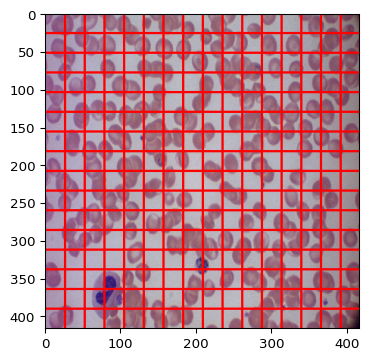

In [27]:
img_aug2 = Image.fromarray(img_aug)
draw = ImageDraw.Draw(img_aug2)
for step in range(26,416,26):
    print(step)
    draw.line((step,0, step, 416), fill="red", width=3)
    draw.line((0,step, 416, step), fill="red", width=3)
img_aug2 = np.array(img_aug2)
ia.imshow(img_aug2)
img_aug2 = Image.fromarray(img_aug2)
img_aug2.save("grid_cell-26x26.jpg")

52
104
156
208
260
312
364


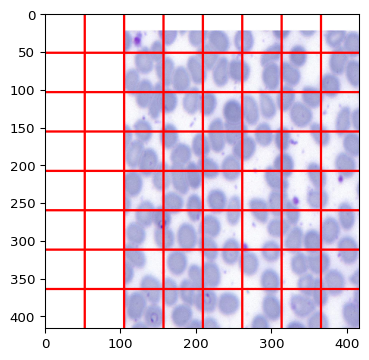

In [25]:
# img_aug2 = Image.fromarray(img_aug)
# draw = ImageDraw.Draw(img_aug2)
# for step in range(52,416,52):
#     print(step)
#     draw.line((step,0, step, 416), fill="red", width=3)
#     draw.line((0,step, 416, step), fill="red", width=3)
# img_aug2 = np.array(img_aug2)
# ia.imshow(img_aug2)
# img_aug2 = Image.fromarray(img_aug2)
# img_aug2.save("grid_cell-52x52.jpg")